In [27]:
import gc
import time

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import csv
import pickle
from tqdm import tqdm
from math import sqrt

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostRegressor, Pool
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import ElasticNet 

from hyperopt import hp, STATUS_OK, tpe, Trials, fmin
from hyperopt.pyll.stochastic import sample

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

### Read in the data with lagged values

In [2]:
df = pd.read_pickle('data/sale_data.pickle')
print(f'The shape of data is {df.shape}')
df.head()

The shape of data is (6639294, 41)


,date_block_num,shop_id,item_id,item_cnt_month,city_code,item_category_id,type_code,subtype_code,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,date_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_2,date_item_avg_item_cnt_lag_3,date_item_avg_item_cnt_lag_6,date_item_avg_item_cnt_lag_12,date_shop_avg_item_cnt_lag_1,date_shop_avg_item_cnt_lag_2,date_shop_avg_item_cnt_lag_3,date_shop_avg_item_cnt_lag_6,date_shop_avg_item_cnt_lag_12,date_cat_avg_item_cnt_lag_1,date_shop_cat_avg_item_cnt_lag_1,date_shop_type_avg_item_cnt_lag_1,date_shop_subtype_avg_item_cnt_lag_1,date_city_avg_item_cnt_lag_1,date_item_city_avg_item_cnt_lag_1,date_type_avg_item_cnt_lag_1,date_subtype_avg_item_cnt_lag_1,delta_price_lag,delta_revenue_lag_1,item_shop_last_sale,item_shop_last_sale_lag_1,item_last_sale_lag_1,month,days,item_shop_first_sale,item_first_sale
4488710,12,2,27,0.0,0,19,5,10,0.0,0.0,0.0,0.0,1.0,0.411377,0.086975,0.044434,0.130493,0.065247,0.155518,0.148071,0.100647,0.08905,0.096008,0.141235,1.082031,0.955566,0.808594,0.935059,0.148071,0.0,1.03418,1.075195,-0.282715,1.211914,0,0.0,1.0,0,31,12,12
4488711,12,2,30,0.0,0,40,11,4,0.0,0.0,0.0,0.0,0.0,0.411377,1.021484,1.022461,0.521973,0.891113,0.000000,0.148071,0.100647,0.08905,0.096008,0.000000,0.291504,0.046234,0.051727,0.046234,0.148071,0.0,0.27002,0.291504,-0.483398,1.211914,1,1.0,1.0,0,31,11,11
4488712,12,2,31,0.0,0,37,11,1,0.0,0.0,0.0,0.0,0.0,0.411377,0.543457,0.600098,0.543457,0.304443,0.000000,0.148071,0.100647,0.08905,0.096008,0.000000,0.232788,0.059448,0.051727,0.064697,0.148071,0.0,0.27002,0.234009,-0.137451,1.211914,1,1.0,1.0,0,31,11,11
4488713,12,2,32,1.0,0,40,11,4,0.0,0.0,0.0,0.0,0.0,0.411377,1.934570,1.799805,1.260742,1.891602,5.378906,0.148071,0.100647,0.08905,0.096008,0.141235,0.291504,0.046234,0.051727,0.046234,0.148071,0.0,0.27002,0.291504,-0.407227,1.211914,0,0.0,1.0,0,31,12,12
4488714,12,2,33,1.0,0,37,11,1,1.0,2.0,0.0,0.0,1.0,0.411377,0.913086,0.333252,0.717285,1.000000,1.355469,0.148071,0.100647,0.08905,0.096008,0.141235,0.232788,0.059448,0.051727,0.064697,0.148071,1.0,0.27002,0.234009,-0.225464,1.211914,1,1.0,1.0,0,31,12,12


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6639294 entries, 4488710 to 11128003
Data columns (total 41 columns):
 #   Column                                Dtype  
---  ------                                -----  
 0   date_block_num                        int8   
 1   shop_id                               int8   
 2   item_id                               int16  
 3   item_cnt_month                        float16
 4   city_code                             int8   
 5   item_category_id                      int8   
 6   type_code                             int8   
 7   subtype_code                          int8   
 8   item_cnt_month_lag_1                  float16
 9   item_cnt_month_lag_2                  float16
 10  item_cnt_month_lag_3                  float16
 11  item_cnt_month_lag_6                  float16
 12  item_cnt_month_lag_12                 float16
 13  date_avg_item_cnt_lag_1               float16
 14  date_item_avg_item_cnt_lag_1          float16
 15  date_ite

In [4]:
print('The percentage of missing values')
df.isnull().sum().sort_values(ascending = False)/df.shape[0]*100

The percentage of missing values


item_last_sale_lag_1                    21.197947
item_shop_last_sale_lag_1               21.197947
delta_revenue_lag_1                     21.197947
item_first_sale                          0.000000
item_cnt_month_lag_2                     0.000000
date_item_avg_item_cnt_lag_3             0.000000
date_item_avg_item_cnt_lag_2             0.000000
date_item_avg_item_cnt_lag_1             0.000000
date_avg_item_cnt_lag_1                  0.000000
item_cnt_month_lag_12                    0.000000
item_cnt_month_lag_6                     0.000000
item_cnt_month_lag_3                     0.000000
subtype_code                             0.000000
item_cnt_month_lag_1                     0.000000
date_item_avg_item_cnt_lag_12            0.000000
type_code                                0.000000
item_category_id                         0.000000
city_code                                0.000000
item_cnt_month                           0.000000
item_id                                  0.000000


In [5]:
#convert float16 to float32
for c in df.columns:
    if df[c].dtypes == np.float16:
        df[c] = df[c].astype(np.float32)
    elif df[c].dtypes == np.int8:
        df[c] = df[c].astype(np.int32)

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6639294 entries, 4488710 to 11128003
Data columns (total 41 columns):
 #   Column                                Dtype  
---  ------                                -----  
 0   date_block_num                        int32  
 1   shop_id                               int32  
 2   item_id                               int16  
 3   item_cnt_month                        float32
 4   city_code                             int32  
 5   item_category_id                      int32  
 6   type_code                             int32  
 7   subtype_code                          int32  
 8   item_cnt_month_lag_1                  float32
 9   item_cnt_month_lag_2                  float32
 10  item_cnt_month_lag_3                  float32
 11  item_cnt_month_lag_6                  float32
 12  item_cnt_month_lag_12                 float32
 13  date_avg_item_cnt_lag_1               float32
 14  date_item_avg_item_cnt_lag_1          float32
 15  date_ite

Next we split the dataset into train, validaion, and test set. The validation is the 33th month, and the test set is the 34th month. 

In [6]:
#split into train test validation
train = df[df['date_block_num']<33].reset_index(drop = True)
validation = df[df['date_block_num']==33].reset_index(drop = True)
test = df[df['date_block_num'] == 34].reset_index(drop = True)

print(f'Shape of train set is {train.shape}')
print(f'Shape of validation set is {validation.shape}')
print(f'Shape of test set is {test.shape}')

Shape of train set is (6186922, 41)
Shape of validation set is (238172, 41)
Shape of test set is (214200, 41)


In [7]:
#delete df to save memory
del df
gc.collect()

208

### Baseline lgb model

In [7]:
#prepare datasets for lgb 
train_data = train.drop('item_cnt_month', axis = 1)
train_labels = train['item_cnt_month']
train_set = lgb.Dataset(train_data, train_labels)

val_data = validation.drop('item_cnt_month', axis = 1)
val_labels = validation['item_cnt_month']
val_set = lgb.Dataset(val_data, val_labels)

test_data = test.drop('item_cnt_month', axis = 1)

In [13]:
#train the model 
params = {'seed': 42, 'metric': 'rmse', 'nthread': 10} #use the default params, only specify seed and metric
ts = time.time()
lgb_model = lgb.train(params = params, train_set=train_set, valid_sets = [val_set], 
                verbose_eval = 1, early_stopping_rounds = 50,
                num_boost_round = 1000)
print(f'lgb model finishes in {time.time()-ts}')

[1]	valid_0's rmse: 1.09927
Training until validation scores don't improve for 50 rounds
[2]	valid_0's rmse: 1.06872
[3]	valid_0's rmse: 1.04377
[4]	valid_0's rmse: 1.02148
[5]	valid_0's rmse: 1.00412
[6]	valid_0's rmse: 0.989917
[7]	valid_0's rmse: 0.977805
[8]	valid_0's rmse: 0.968465
[9]	valid_0's rmse: 0.959951
[10]	valid_0's rmse: 0.953028
[11]	valid_0's rmse: 0.948904
[12]	valid_0's rmse: 0.94476
[13]	valid_0's rmse: 0.940895
[14]	valid_0's rmse: 0.938557
[15]	valid_0's rmse: 0.936222
[16]	valid_0's rmse: 0.932923
[17]	valid_0's rmse: 0.930409
[18]	valid_0's rmse: 0.928923
[19]	valid_0's rmse: 0.927506
[20]	valid_0's rmse: 0.925893
[21]	valid_0's rmse: 0.924688
[22]	valid_0's rmse: 0.924041
[23]	valid_0's rmse: 0.922596
[24]	valid_0's rmse: 0.921092
[25]	valid_0's rmse: 0.920817
[26]	valid_0's rmse: 0.920191
[27]	valid_0's rmse: 0.919457
[28]	valid_0's rmse: 0.918851
[29]	valid_0's rmse: 0.918636
[30]	valid_0's rmse: 0.918309
[31]	valid_0's rmse: 0.917629
[32]	valid_0's rmse: 0.9

Let's plot the feature importance.

In [8]:
def lgb_importance(model, X, importance_type, figsize):
    """
    importance_type is 'gain' or 'split'
    """
    feature_imp = pd.DataFrame({'Value': model.feature_importance(importance_type = importance_type), 'Feature': X.columns})
    plt.figure(figsize = figsize)
    sns.barplot(x = 'Value', y = 'Feature', data = feature_imp.sort_values(by='Value', ascending = False))
    plt.title('LightGBM feature importance')
    plt.tight_layout()

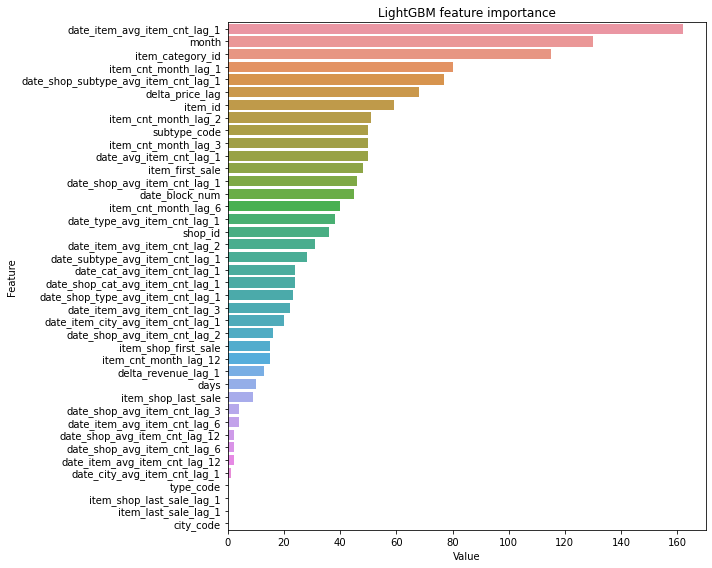

In [10]:
lgb_importance(lgb_model, train_data, 'split', (10,8))

We see that some features are not important at all. But let's first do a grid search to get a more accurate feature importance list. 

### Bayesian optimization for lightgbm

In this section we will perform grid search using Bayesian optimization, or more specifically using the hyperopt package. Let's first define the search space. 

In [33]:
lgb_space = {
    'boosting_type': hp.choice('boosting_type', ['gbdt', 'goss']),
    'objective': hp.choice('objective', ['regression', 'tweedie']),
    'num_leaves': hp.choice('num_leaves', np.arange(30,150, dtype = int)),
    'subsample': hp.uniform('subsample', 0.5, 1),
    'learning_rate': hp.loguniform('learning_rate', np.log(0.01), np.log(0.2)),
    'subsample_for_bin': hp.choice('subsample_for_bin', np.arange(20000,300000, 20000, dtype = int)),
    'min_child_samples': hp.choice('min_child_samples', np.arange(20,500,5, dtype = int)),
    'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
    'colsample_bytree': hp.uniform('colsample_by_tree', 0.6, 1.0),
    'seed': 42,
    'nthread': 10,
    'num_boost_round': 1000,
    'early_stopping_rounds': 50,
    'metric': 'rmse',
    'vebose_eval': 1
}

Let's take a sample for the search space. 

In [9]:
x = sample(lgb_space)
x

{'boosting_type': 'gbdt',
 'colsample_bytree': 0.8325655345281825,
 'early_stopping_rounds': 50,
 'learning_rate': 0.10726261382410843,
 'metric': 'rmse',
 'min_child_samples': 225,
 'nthread': 10,
 'num_boost_round': 1000,
 'num_leaves': 148,
 'objective': 'regression',
 'reg_alpha': 0.17409222039253636,
 'reg_lambda': 0.06553384864500877,
 'seed': 42,
 'subsample': 0.5190904533827839,
 'subsample_for_bin': 160000,
 'vebose_eval': 1}

Now we define the Bayesian optimization function. 

In [7]:
def bayesian_opt(space, model, train_set, val_set, num_boost_round, early_stopping_rounds, random_seed, MAX_EVALS = 100, out_file = None, trials = None):
    
    """
    out_file (str): location of the grid search file
    trials (str): location of the bayes trials
    """
    
    if not out_file:
        #create the grid search file
        out_file = f'output/{model}_trials.csv'
        of_connection = open(out_file, 'w')
        writer = csv.writer(of_connection)
        writer.writerow(['loss', 'params', 'n_estimators', 'train_time'])
        of_connection.close()
        
    if not trials:
        #create the trial object
        bayes_trials = Trials()
    else:
        bayes_trials = pickle.load(open(trials, 'rb'))
        
    #if model == 'lgb':
        
    def objective(params):

        ts = time.time()

        train_model = eval(model).train(params, train_set, num_boost_round, val_set, early_stopping_rounds = early_stopping_rounds)

        run_time = time.time()-ts

        if model == 'lgb':
        
            #extract the best score
            loss = train_model.best_score['valid_0']['rmse']

            #extract the best number of iterators
            n_estimators = train_model.best_iteration
        elif model == 'xgb':
            
            #extract the best score
            loss = train_model.best_score

            #extract the best number of iterators
            n_estimators = train_model.best_iteration + 1
            

        #write to the csv file ('a' means append)
        of_connection = open(out_file, 'a')
        writer = csv.writer(of_connection)
        writer.writerow([loss, params, n_estimators, run_time ])

        return {'loss' : loss, 'params':params, 'n_estimators': n_estimators, 
               'train_time': run_time, 'status': STATUS_OK}  
        
    #run hyperopt
    fmin(fn = objective, space = space, algo = tpe.suggest,  max_evals = MAX_EVALS, trials = bayes_trials,
        rstate = np.random.RandomState(random_seed))

    #save trial object, does NOT work, need to work on this
    pickle.dump(bayes_trials, open(f'output/{model}_bayes_trials.pickle', 'wb'))

    return bayes_trials 

Let's first run a grid search for 150 models. Since this is the first run we do not need to specify the output_file and trial file.

In [14]:
#run 150 models
bayesian_opt(lgb_space, 'lgb', train_set, val_set,1000, 42, 150)

  0%|          | 0/150 [00:00<?, ?trial/s, best loss=?]

/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))

/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/lightgbm/engine.py:153: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))



[1]	valid_0's rmse: 1.13403                            
Training until validation scores don't improve for 50 rounds
[2]	valid_0's rmse: 1.13159                            
[3]	valid_0's rmse: 1.12923                            
[4]	valid_0's rmse: 1.12693                            
[5]	valid_0's rmse: 1.12467                            
[6]	valid_0's rmse: 1.12253                            
[7]	valid_0's rmse: 1.12044                            
[8]	valid_0's rmse: 1.11834                            
[9]	valid_0's rmse: 1.11625                            
[10]	valid_0's rmse: 1.11446                           
[11]	valid_0's rmse: 1.11239                           
[12]	valid_0's rmse: 1.11048                           
[13]	valid_0's rmse: 1.10856                           
[14]	valid_0's rmse: 1.10665                           
[15]	valid_0's rmse: 1.10478                           
[16]	valid_0's rmse: 1.10289                           
[17]	valid_0's rmse: 1.10088               

[292]	valid_0's rmse: 0.896303                         
[293]	valid_0's rmse: 0.896039                         
[294]	valid_0's rmse: 0.896257                         
[295]	valid_0's rmse: 0.896183                         
[296]	valid_0's rmse: 0.896268                         
[297]	valid_0's rmse: 0.896254                         
[298]	valid_0's rmse: 0.896095                         
[299]	valid_0's rmse: 0.896078                         
[300]	valid_0's rmse: 0.896015                         
[301]	valid_0's rmse: 0.895967                         
[302]	valid_0's rmse: 0.896153                         
[303]	valid_0's rmse: 0.896596                         
[304]	valid_0's rmse: 0.896549                         
[305]	valid_0's rmse: 0.896475                         
[306]	valid_0's rmse: 0.896459                         
[307]	valid_0's rmse: 0.896472                         
[308]	valid_0's rmse: 0.896411                         
[309]	valid_0's rmse: 0.89638                   

[1]	valid_0's rmse: 1.13255                                                        
Training until validation scores don't improve for 50 rounds                       
[2]	valid_0's rmse: 1.1288                                                         
[3]	valid_0's rmse: 1.1252                                                         
[4]	valid_0's rmse: 1.12175                                                        
[5]	valid_0's rmse: 1.1183                                                         
[6]	valid_0's rmse: 1.11513                                                        
[7]	valid_0's rmse: 1.11198                                                        
[8]	valid_0's rmse: 1.10886                                                        
[9]	valid_0's rmse: 1.10569                                                        
[10]	valid_0's rmse: 1.10303                                                       
[11]	valid_0's rmse: 1.10012                                                

[194]	valid_0's rmse: 0.904102                                                     
[195]	valid_0's rmse: 0.904103                                                     
[196]	valid_0's rmse: 0.904041                                                     
[197]	valid_0's rmse: 0.903938                                                     
[198]	valid_0's rmse: 0.903844                                                     
[199]	valid_0's rmse: 0.903744                                                     
[200]	valid_0's rmse: 0.90369                                                      
[201]	valid_0's rmse: 0.903698                                                     
[202]	valid_0's rmse: 0.903157                                                     
[203]	valid_0's rmse: 0.903076                                                     
[204]	valid_0's rmse: 0.902855                                                     
[205]	valid_0's rmse: 0.902774                                              

[181]	valid_0's rmse: 0.946029                                                     
[182]	valid_0's rmse: 0.945383                                                     
[183]	valid_0's rmse: 0.944882                                                     
[184]	valid_0's rmse: 0.944255                                                     
[185]	valid_0's rmse: 0.943627                                                     
[186]	valid_0's rmse: 0.943003                                                     
[187]	valid_0's rmse: 0.942513                                                     
[188]	valid_0's rmse: 0.941983                                                     
[189]	valid_0's rmse: 0.941409                                                     
[190]	valid_0's rmse: 0.940851                                                     
[191]	valid_0's rmse: 0.940315                                                     
[192]	valid_0's rmse: 0.939682                                              

[375]	valid_0's rmse: 0.902776                                                     
[376]	valid_0's rmse: 0.902661                                                     
[377]	valid_0's rmse: 0.902591                                                     
[378]	valid_0's rmse: 0.902486                                                     
[379]	valid_0's rmse: 0.902408                                                     
[380]	valid_0's rmse: 0.902405                                                     
[381]	valid_0's rmse: 0.902354                                                     
[382]	valid_0's rmse: 0.902365                                                     
[383]	valid_0's rmse: 0.902352                                                     
[384]	valid_0's rmse: 0.902273                                                     
[385]	valid_0's rmse: 0.902262                                                     
[386]	valid_0's rmse: 0.90222                                               

[61]	valid_0's rmse: 1.08308                                                        
[62]	valid_0's rmse: 1.08227                                                        
[63]	valid_0's rmse: 1.08142                                                        
[64]	valid_0's rmse: 1.08058                                                        
[65]	valid_0's rmse: 1.07974                                                        
[66]	valid_0's rmse: 1.07887                                                        
[67]	valid_0's rmse: 1.078                                                          
[68]	valid_0's rmse: 1.07714                                                        
[69]	valid_0's rmse: 1.07626                                                        
[70]	valid_0's rmse: 1.07544                                                        
[71]	valid_0's rmse: 1.07458                                                        
[72]	valid_0's rmse: 1.07383                                     

[253]	valid_0's rmse: 0.937439                                                      
[254]	valid_0's rmse: 0.936993                                                      
[255]	valid_0's rmse: 0.936549                                                      
[256]	valid_0's rmse: 0.936097                                                      
[257]	valid_0's rmse: 0.935676                                                      
[258]	valid_0's rmse: 0.935285                                                      
[259]	valid_0's rmse: 0.934823                                                      
[260]	valid_0's rmse: 0.934438                                                      
[261]	valid_0's rmse: 0.934095                                                      
[262]	valid_0's rmse: 0.933656                                                      
[263]	valid_0's rmse: 0.933267                                                      
[264]	valid_0's rmse: 0.932904                                   

[445]	valid_0's rmse: 0.902708                                                      
[446]	valid_0's rmse: 0.902649                                                      
[447]	valid_0's rmse: 0.902589                                                      
[448]	valid_0's rmse: 0.902523                                                      
[449]	valid_0's rmse: 0.902437                                                      
[450]	valid_0's rmse: 0.902403                                                      
[451]	valid_0's rmse: 0.902338                                                      
[452]	valid_0's rmse: 0.902285                                                      
[453]	valid_0's rmse: 0.902131                                                      
[454]	valid_0's rmse: 0.902087                                                      
[455]	valid_0's rmse: 0.902055                                                      
[456]	valid_0's rmse: 0.902055                                   

[43]	valid_0's rmse: 1.01059                                                        
[44]	valid_0's rmse: 1.00791                                                        
[45]	valid_0's rmse: 1.00542                                                        
[46]	valid_0's rmse: 1.003                                                          
[47]	valid_0's rmse: 1.00046                                                        
[48]	valid_0's rmse: 0.998018                                                       
[49]	valid_0's rmse: 0.995733                                                       
[50]	valid_0's rmse: 0.993349                                                       
[51]	valid_0's rmse: 0.990751                                                       
[52]	valid_0's rmse: 0.98854                                                        
[53]	valid_0's rmse: 0.986255                                                       
[54]	valid_0's rmse: 0.984236                                    

[235]	valid_0's rmse: 0.90616                                                       
[236]	valid_0's rmse: 0.906134                                                      
[237]	valid_0's rmse: 0.906045                                                      
[238]	valid_0's rmse: 0.906135                                                      
[239]	valid_0's rmse: 0.905986                                                      
[240]	valid_0's rmse: 0.906015                                                      
[241]	valid_0's rmse: 0.905926                                                      
[242]	valid_0's rmse: 0.905943                                                      
[243]	valid_0's rmse: 0.905785                                                      
[244]	valid_0's rmse: 0.905725                                                      
[245]	valid_0's rmse: 0.905851                                                      
[246]	valid_0's rmse: 0.905808                                   

[427]	valid_0's rmse: 0.90137                                                       
[428]	valid_0's rmse: 0.901324                                                      
[429]	valid_0's rmse: 0.90103                                                       
[430]	valid_0's rmse: 0.90096                                                       
[431]	valid_0's rmse: 0.900922                                                      
[432]	valid_0's rmse: 0.900905                                                      
[433]	valid_0's rmse: 0.900901                                                      
[434]	valid_0's rmse: 0.90089                                                       
[435]	valid_0's rmse: 0.9009                                                        
[436]	valid_0's rmse: 0.900877                                                      
[437]	valid_0's rmse: 0.900868                                                      
[438]	valid_0's rmse: 0.900846                                   

[64]	valid_0's rmse: 1.05944                                                        
[65]	valid_0's rmse: 1.05817                                                        
[66]	valid_0's rmse: 1.05693                                                        
[67]	valid_0's rmse: 1.05565                                                        
[68]	valid_0's rmse: 1.05441                                                        
[69]	valid_0's rmse: 1.05316                                                        
[70]	valid_0's rmse: 1.05188                                                        
[71]	valid_0's rmse: 1.05064                                                        
[72]	valid_0's rmse: 1.04948                                                        
[73]	valid_0's rmse: 1.04823                                                        
[74]	valid_0's rmse: 1.04707                                                        
[75]	valid_0's rmse: 1.04578                                     

[256]	valid_0's rmse: 0.916129                                                      
[257]	valid_0's rmse: 0.91604                                                       
[258]	valid_0's rmse: 0.915759                                                      
[259]	valid_0's rmse: 0.91551                                                       
[260]	valid_0's rmse: 0.91525                                                       
[261]	valid_0's rmse: 0.915142                                                      
[262]	valid_0's rmse: 0.915009                                                      
[263]	valid_0's rmse: 0.914728                                                      
[264]	valid_0's rmse: 0.9146                                                        
[265]	valid_0's rmse: 0.914354                                                      
[266]	valid_0's rmse: 0.914423                                                      
[267]	valid_0's rmse: 0.91438                                    

[448]	valid_0's rmse: 0.902439                                                      
[449]	valid_0's rmse: 0.902417                                                      
[450]	valid_0's rmse: 0.902397                                                      
[451]	valid_0's rmse: 0.902388                                                      
[452]	valid_0's rmse: 0.902362                                                      
[453]	valid_0's rmse: 0.902324                                                      
[454]	valid_0's rmse: 0.902124                                                      
[455]	valid_0's rmse: 0.902114                                                      
[456]	valid_0's rmse: 0.902072                                                      
[457]	valid_0's rmse: 0.902176                                                      
[458]	valid_0's rmse: 0.902149                                                      
[459]	valid_0's rmse: 0.902054                                   

[68]	valid_0's rmse: 0.967548                                                       
[69]	valid_0's rmse: 0.966537                                                       
[70]	valid_0's rmse: 0.96551                                                        
[71]	valid_0's rmse: 0.964765                                                       
[72]	valid_0's rmse: 0.964079                                                       
[73]	valid_0's rmse: 0.963054                                                       
[74]	valid_0's rmse: 0.962074                                                       
[75]	valid_0's rmse: 0.960997                                                       
[76]	valid_0's rmse: 0.960147                                                       
[77]	valid_0's rmse: 0.959256                                                       
[78]	valid_0's rmse: 0.958318                                                       
[79]	valid_0's rmse: 0.957539                                    

[260]	valid_0's rmse: 0.920198                                                      
[261]	valid_0's rmse: 0.920123                                                      
[262]	valid_0's rmse: 0.92017                                                       
[263]	valid_0's rmse: 0.920154                                                      
[264]	valid_0's rmse: 0.920084                                                      
[265]	valid_0's rmse: 0.920114                                                      
[266]	valid_0's rmse: 0.919965                                                      
[267]	valid_0's rmse: 0.919969                                                      
[268]	valid_0's rmse: 0.919918                                                      
[269]	valid_0's rmse: 0.919908                                                      
[270]	valid_0's rmse: 0.919876                                                      
[271]	valid_0's rmse: 0.919909                                   

[49]	valid_0's rmse: 0.957403                                                       
[50]	valid_0's rmse: 0.955955                                                       
[51]	valid_0's rmse: 0.954576                                                       
[52]	valid_0's rmse: 0.953165                                                       
[53]	valid_0's rmse: 0.951517                                                       
[54]	valid_0's rmse: 0.950105                                                       
[55]	valid_0's rmse: 0.949144                                                       
[56]	valid_0's rmse: 0.947905                                                       
[57]	valid_0's rmse: 0.946684                                                       
[58]	valid_0's rmse: 0.94578                                                        
[59]	valid_0's rmse: 0.944742                                                       
[60]	valid_0's rmse: 0.943766                                    

[241]	valid_0's rmse: 0.914965                                                      
[242]	valid_0's rmse: 0.915113                                                      
[243]	valid_0's rmse: 0.915055                                                      
[244]	valid_0's rmse: 0.915036                                                      
[245]	valid_0's rmse: 0.915121                                                      
[246]	valid_0's rmse: 0.915091                                                      
[247]	valid_0's rmse: 0.915132                                                      
[248]	valid_0's rmse: 0.915091                                                      
[249]	valid_0's rmse: 0.915083                                                      
[250]	valid_0's rmse: 0.915055                                                      
[251]	valid_0's rmse: 0.915099                                                      
[252]	valid_0's rmse: 0.915056                                   

[46]	valid_0's rmse: 0.911124                                                       
[47]	valid_0's rmse: 0.911049                                                       
[48]	valid_0's rmse: 0.910265                                                       
[49]	valid_0's rmse: 0.909847                                                       
[50]	valid_0's rmse: 0.90927                                                        
[51]	valid_0's rmse: 0.908275                                                       
[52]	valid_0's rmse: 0.907747                                                       
[53]	valid_0's rmse: 0.907259                                                       
[54]	valid_0's rmse: 0.906971                                                       
[55]	valid_0's rmse: 0.906416                                                       
[56]	valid_0's rmse: 0.905906                                                       
[57]	valid_0's rmse: 0.905349                                    

[62]	valid_0's rmse: 1.58202e+10                                                    
[63]	valid_0's rmse: 1.53613e+10                                                    
[64]	valid_0's rmse: 1.49196e+10                                                    
[65]	valid_0's rmse: 1.45375e+10                                                    
[66]	valid_0's rmse: 1.42097e+10                                                    
[67]	valid_0's rmse: 1.39485e+10                                                    
[68]	valid_0's rmse: 1.36766e+10                                                    
[69]	valid_0's rmse: 1.34402e+10                                                    
[70]	valid_0's rmse: 1.3097e+10                                                     
[71]	valid_0's rmse: 1.27429e+10                                                    
[72]	valid_0's rmse: 1.24986e+10                                                    
[73]	valid_0's rmse: 1.21773e+10                                 

[60]	valid_0's rmse: 1.06787                                                        
[61]	valid_0's rmse: 1.06673                                                        
[62]	valid_0's rmse: 1.06557                                                        
[63]	valid_0's rmse: 1.06445                                                        
[64]	valid_0's rmse: 1.06327                                                        
[65]	valid_0's rmse: 1.06209                                                        
[66]	valid_0's rmse: 1.06091                                                        
[67]	valid_0's rmse: 1.05972                                                        
[68]	valid_0's rmse: 1.05853                                                        
[69]	valid_0's rmse: 1.05732                                                        
[70]	valid_0's rmse: 1.05608                                                        
[71]	valid_0's rmse: 1.05488                                     

[252]	valid_0's rmse: 0.916408                                                      
[253]	valid_0's rmse: 0.916175                                                      
[254]	valid_0's rmse: 0.915854                                                      
[255]	valid_0's rmse: 0.915602                                                      
[256]	valid_0's rmse: 0.915316                                                      
[257]	valid_0's rmse: 0.915065                                                      
[258]	valid_0's rmse: 0.914791                                                      
[259]	valid_0's rmse: 0.914543                                                      
[260]	valid_0's rmse: 0.914438                                                      
[261]	valid_0's rmse: 0.914214                                                      
[262]	valid_0's rmse: 0.913969                                                      
[263]	valid_0's rmse: 0.913858                                   

[444]	valid_0's rmse: 0.90283                                                       
[445]	valid_0's rmse: 0.90287                                                       
[446]	valid_0's rmse: 0.902908                                                      
[447]	valid_0's rmse: 0.902847                                                      
[448]	valid_0's rmse: 0.902753                                                      
[449]	valid_0's rmse: 0.902767                                                      
[450]	valid_0's rmse: 0.902779                                                      
[451]	valid_0's rmse: 0.902732                                                      
[452]	valid_0's rmse: 0.902931                                                      
[453]	valid_0's rmse: 0.902882                                                      
[454]	valid_0's rmse: 0.902852                                                      
[455]	valid_0's rmse: 0.902819                                   

[18]	valid_0's rmse: 1.09605                                                        
[19]	valid_0's rmse: 1.09399                                                        
[20]	valid_0's rmse: 1.09193                                                        
[21]	valid_0's rmse: 1.08981                                                        
[22]	valid_0's rmse: 1.08764                                                        
[23]	valid_0's rmse: 1.08555                                                        
[24]	valid_0's rmse: 1.08343                                                        
[25]	valid_0's rmse: 1.08132                                                        
[26]	valid_0's rmse: 1.07915                                                        
[27]	valid_0's rmse: 1.07699                                                        
[28]	valid_0's rmse: 1.07476                                                        
[29]	valid_0's rmse: 1.07258                                     

[210]	valid_0's rmse: 0.903163                                                      
[211]	valid_0's rmse: 0.903087                                                      
[212]	valid_0's rmse: 0.902932                                                      
[213]	valid_0's rmse: 0.902851                                                      
[214]	valid_0's rmse: 0.902827                                                      
[215]	valid_0's rmse: 0.902764                                                      
[216]	valid_0's rmse: 0.902786                                                      
[217]	valid_0's rmse: 0.90272                                                       
[218]	valid_0's rmse: 0.902638                                                      
[219]	valid_0's rmse: 0.902752                                                      
[220]	valid_0's rmse: 0.902747                                                      
[221]	valid_0's rmse: 0.902895                                   

[70]	valid_0's rmse: 0.922964                                                       
[71]	valid_0's rmse: 0.923009                                                       
[72]	valid_0's rmse: 0.922805                                                       
[73]	valid_0's rmse: 0.923234                                                       
[74]	valid_0's rmse: 0.923198                                                       
[75]	valid_0's rmse: 0.923048                                                       
[76]	valid_0's rmse: 0.923028                                                       
[77]	valid_0's rmse: 0.922746                                                       
[78]	valid_0's rmse: 0.922718                                                       
[79]	valid_0's rmse: 0.922552                                                       
[80]	valid_0's rmse: 0.922273                                                       
[81]	valid_0's rmse: 0.921569                                    

[9]	valid_0's rmse: 1.07677                                                         
[10]	valid_0's rmse: 1.07024                                                        
[11]	valid_0's rmse: 1.06346                                                        
[12]	valid_0's rmse: 1.05679                                                        
[13]	valid_0's rmse: 1.0498                                                         
[14]	valid_0's rmse: 1.04268                                                        
[15]	valid_0's rmse: 1.03572                                                        
[16]	valid_0's rmse: 1.02889                                                        
[17]	valid_0's rmse: 1.02218                                                        
[18]	valid_0's rmse: 1.01497                                                        
[19]	valid_0's rmse: 1.00812                                                        
[20]	valid_0's rmse: 1.00213                                     

[41]	valid_0's rmse: 0.962287                                                       
[42]	valid_0's rmse: 0.959373                                                       
[43]	valid_0's rmse: 0.957276                                                       
[44]	valid_0's rmse: 0.954667                                                       
[45]	valid_0's rmse: 0.951807                                                       
[46]	valid_0's rmse: 0.949302                                                       
[47]	valid_0's rmse: 0.946776                                                       
[48]	valid_0's rmse: 0.944805                                                       
[49]	valid_0's rmse: 0.942672                                                       
[50]	valid_0's rmse: 0.940531                                                       
[51]	valid_0's rmse: 0.938653                                                       
[52]	valid_0's rmse: 0.936819                                    

[57]	valid_0's rmse: 0.908835                                                       
[58]	valid_0's rmse: 0.908764                                                       
[59]	valid_0's rmse: 0.908611                                                       
[60]	valid_0's rmse: 0.907917                                                       
[61]	valid_0's rmse: 0.90793                                                        
[62]	valid_0's rmse: 0.907969                                                       
[63]	valid_0's rmse: 0.907393                                                       
[64]	valid_0's rmse: 0.907272                                                       
[65]	valid_0's rmse: 0.908189                                                       
[66]	valid_0's rmse: 0.90805                                                        
[67]	valid_0's rmse: 0.907644                                                       
[68]	valid_0's rmse: 0.907492                                    

[73]	valid_0's rmse: 0.90935                                                        
[74]	valid_0's rmse: 0.908902                                                       
[75]	valid_0's rmse: 0.908811                                                       
[76]	valid_0's rmse: 0.908378                                                       
[77]	valid_0's rmse: 0.907765                                                       
[78]	valid_0's rmse: 0.907485                                                       
[79]	valid_0's rmse: 0.907172                                                       
[80]	valid_0's rmse: 0.906685                                                       
[81]	valid_0's rmse: 0.907224                                                       
[82]	valid_0's rmse: 0.907079                                                       
[83]	valid_0's rmse: 0.90685                                                        
[84]	valid_0's rmse: 0.906572                                    

[118]	valid_0's rmse: 0.910565                                                      
[119]	valid_0's rmse: 0.910499                                                      
[120]	valid_0's rmse: 0.910492                                                      
[121]	valid_0's rmse: 0.910571                                                      
[122]	valid_0's rmse: 0.91063                                                       
[123]	valid_0's rmse: 0.910618                                                      
[124]	valid_0's rmse: 0.910302                                                      
[125]	valid_0's rmse: 0.910492                                                      
[126]	valid_0's rmse: 0.910254                                                      
[127]	valid_0's rmse: 0.910406                                                      
[128]	valid_0's rmse: 0.910392                                                      
[129]	valid_0's rmse: 0.910372                                   

[175]	valid_0's rmse: 0.898001                                                      
[176]	valid_0's rmse: 0.897878                                                      
[177]	valid_0's rmse: 0.897924                                                      
[178]	valid_0's rmse: 0.89789                                                       
[179]	valid_0's rmse: 0.897921                                                      
[180]	valid_0's rmse: 0.897739                                                      
[181]	valid_0's rmse: 0.897727                                                      
[182]	valid_0's rmse: 0.897723                                                      
[183]	valid_0's rmse: 0.897796                                                      
[184]	valid_0's rmse: 0.897756                                                      
[185]	valid_0's rmse: 0.897569                                                      
[186]	valid_0's rmse: 0.897498                                   

[49]	valid_0's rmse: 1.00068                                                        
[50]	valid_0's rmse: 0.998045                                                       
[51]	valid_0's rmse: 0.995613                                                       
[52]	valid_0's rmse: 0.993389                                                       
[53]	valid_0's rmse: 0.991007                                                       
[54]	valid_0's rmse: 0.98879                                                        
[55]	valid_0's rmse: 0.98688                                                        
[56]	valid_0's rmse: 0.984697                                                       
[57]	valid_0's rmse: 0.982608                                                       
[58]	valid_0's rmse: 0.980545                                                       
[59]	valid_0's rmse: 0.978423                                                       
[60]	valid_0's rmse: 0.976475                                    

[241]	valid_0's rmse: 0.901177                                                      
[242]	valid_0's rmse: 0.901167                                                      
[243]	valid_0's rmse: 0.901134                                                      
[244]	valid_0's rmse: 0.90103                                                       
[245]	valid_0's rmse: 0.901008                                                      
[246]	valid_0's rmse: 0.900935                                                      
[247]	valid_0's rmse: 0.900825                                                      
[248]	valid_0's rmse: 0.901437                                                      
[249]	valid_0's rmse: 0.901419                                                      
[250]	valid_0's rmse: 0.901317                                                      
[251]	valid_0's rmse: 0.901303                                                      
[252]	valid_0's rmse: 0.901325                                   

[92]	valid_0's rmse: 0.913287                                                       
[93]	valid_0's rmse: 0.913214                                                       
[94]	valid_0's rmse: 0.913118                                                       
[95]	valid_0's rmse: 0.912289                                                       
[96]	valid_0's rmse: 0.912225                                                       
[97]	valid_0's rmse: 0.911959                                                       
[98]	valid_0's rmse: 0.911784                                                       
[99]	valid_0's rmse: 0.915768                                                       
[100]	valid_0's rmse: 0.915746                                                      
[101]	valid_0's rmse: 0.915567                                                      
[102]	valid_0's rmse: 0.91589                                                       
[103]	valid_0's rmse: 0.915482                                   

[158]	valid_0's rmse: 0.918211                                                      
[159]	valid_0's rmse: 0.91778                                                       
[160]	valid_0's rmse: 0.917397                                                      
[161]	valid_0's rmse: 0.916899                                                      
[162]	valid_0's rmse: 0.916173                                                      
[163]	valid_0's rmse: 0.915658                                                      
[164]	valid_0's rmse: 0.915303                                                      
[165]	valid_0's rmse: 0.91494                                                       
[166]	valid_0's rmse: 0.914621                                                      
[167]	valid_0's rmse: 0.914214                                                      
[168]	valid_0's rmse: 0.913837                                                      
[169]	valid_0's rmse: 0.913271                                   

[18]	valid_0's rmse: 1.03431                                                        
[19]	valid_0's rmse: 1.02851                                                        
[20]	valid_0's rmse: 1.02347                                                        
[21]	valid_0's rmse: 1.01771                                                        
[22]	valid_0's rmse: 1.01226                                                        
[23]	valid_0's rmse: 1.00706                                                        
[24]	valid_0's rmse: 1.00175                                                        
[25]	valid_0's rmse: 0.996173                                                       
[26]	valid_0's rmse: 0.99092                                                        
[27]	valid_0's rmse: 0.985973                                                       
[28]	valid_0's rmse: 0.981665                                                       
[29]	valid_0's rmse: 0.97768                                     

[210]	valid_0's rmse: 0.903714                                                      
[211]	valid_0's rmse: 0.903986                                                      
Early stopping, best iteration is:                                                  
[161]	valid_0's rmse: 0.901991
[1]	valid_0's rmse: 1.12275                                                         
Training until validation scores don't improve for 50 rounds                        
[2]	valid_0's rmse: 1.11119                                                         
[3]	valid_0's rmse: 1.09994                                                         
[4]	valid_0's rmse: 1.08831                                                         
[5]	valid_0's rmse: 1.07653                                                         
[6]	valid_0's rmse: 1.06486                                                         
[7]	valid_0's rmse: 1.05224                                                         
[8]	valid_0's rmse: 1.03923       

[102]	valid_0's rmse: 0.906136                                                      
[103]	valid_0's rmse: 0.906179                                                      
[104]	valid_0's rmse: 0.905798                                                      
[105]	valid_0's rmse: 0.905507                                                      
[106]	valid_0's rmse: 0.904993                                                      
[107]	valid_0's rmse: 0.904722                                                      
[108]	valid_0's rmse: 0.90459                                                       
[109]	valid_0's rmse: 0.904289                                                      
[110]	valid_0's rmse: 0.904111                                                      
[111]	valid_0's rmse: 0.903921                                                      
[112]	valid_0's rmse: 0.903453                                                      
[113]	valid_0's rmse: 0.903433                                   

[294]	valid_0's rmse: 0.900115                                                      
[295]	valid_0's rmse: 0.900097                                                      
[296]	valid_0's rmse: 0.90009                                                       
[297]	valid_0's rmse: 0.900057                                                      
[298]	valid_0's rmse: 0.899992                                                      
[299]	valid_0's rmse: 0.900325                                                      
[300]	valid_0's rmse: 0.900335                                                      
[301]	valid_0's rmse: 0.900313                                                      
[302]	valid_0's rmse: 0.900257                                                      
[303]	valid_0's rmse: 0.900231                                                      
[304]	valid_0's rmse: 0.900293                                                      
[305]	valid_0's rmse: 0.902696                                   

[136]	valid_0's rmse: 0.917481                                                      
[137]	valid_0's rmse: 0.917331                                                      
[138]	valid_0's rmse: 0.917141                                                      
[139]	valid_0's rmse: 0.916686                                                      
[140]	valid_0's rmse: 0.916309                                                      
[141]	valid_0's rmse: 0.915958                                                      
[142]	valid_0's rmse: 0.91567                                                       
[143]	valid_0's rmse: 0.915178                                                      
[144]	valid_0's rmse: 0.914943                                                      
[145]	valid_0's rmse: 0.914628                                                      
[146]	valid_0's rmse: 0.914475                                                      
[147]	valid_0's rmse: 0.914245                                   

[328]	valid_0's rmse: 0.90351                                                       
[329]	valid_0's rmse: 0.903559                                                      
[330]	valid_0's rmse: 0.903553                                                      
[331]	valid_0's rmse: 0.903448                                                      
[332]	valid_0's rmse: 0.903467                                                      
[333]	valid_0's rmse: 0.903421                                                      
[334]	valid_0's rmse: 0.903372                                                      
[335]	valid_0's rmse: 0.904509                                                      
[336]	valid_0's rmse: 0.904453                                                      
[337]	valid_0's rmse: 0.904437                                                      
[338]	valid_0's rmse: 0.904521                                                      
[339]	valid_0's rmse: 0.904362                                   

[8]	valid_0's rmse: 1.10584                                                         
[9]	valid_0's rmse: 1.10228                                                         
[10]	valid_0's rmse: 1.09873                                                        
[11]	valid_0's rmse: 1.09535                                                        
[12]	valid_0's rmse: 1.09181                                                        
[13]	valid_0's rmse: 1.08827                                                        
[14]	valid_0's rmse: 1.0847                                                         
[15]	valid_0's rmse: 1.08119                                                        
[16]	valid_0's rmse: 1.07756                                                        
[17]	valid_0's rmse: 1.07383                                                        
[18]	valid_0's rmse: 1.07004                                                        
[19]	valid_0's rmse: 1.06631                                     

[37]	valid_0's rmse: 0.945397                                                       
[38]	valid_0's rmse: 0.943121                                                       
[39]	valid_0's rmse: 0.939606                                                       
[40]	valid_0's rmse: 0.937787                                                       
[41]	valid_0's rmse: 0.934842                                                       
[42]	valid_0's rmse: 0.932458                                                       
[43]	valid_0's rmse: 0.930317                                                       
[44]	valid_0's rmse: 0.928117                                                       
[45]	valid_0's rmse: 0.926251                                                       
[46]	valid_0's rmse: 0.924035                                                       
[47]	valid_0's rmse: 0.921981                                                       
[48]	valid_0's rmse: 0.920523                                    

[32]	valid_0's rmse: 1.04936                                                        
[33]	valid_0's rmse: 1.04626                                                        
[34]	valid_0's rmse: 1.04331                                                        
[35]	valid_0's rmse: 1.04045                                                        
[36]	valid_0's rmse: 1.03748                                                        
[37]	valid_0's rmse: 1.03465                                                        
[38]	valid_0's rmse: 1.0318                                                         
[39]	valid_0's rmse: 1.02891                                                        
[40]	valid_0's rmse: 1.02595                                                        
[41]	valid_0's rmse: 1.02293                                                        
[42]	valid_0's rmse: 1.0202                                                         
[43]	valid_0's rmse: 1.01738                                     

[224]	valid_0's rmse: 0.902108                                                      
[225]	valid_0's rmse: 0.902091                                                      
[226]	valid_0's rmse: 0.902078                                                      
[227]	valid_0's rmse: 0.902009                                                      
[228]	valid_0's rmse: 0.902058                                                      
[229]	valid_0's rmse: 0.902276                                                      
[230]	valid_0's rmse: 0.902854                                                      
[231]	valid_0's rmse: 0.90285                                                       
[232]	valid_0's rmse: 0.902648                                                      
[233]	valid_0's rmse: 0.902615                                                      
[234]	valid_0's rmse: 0.902503                                                      
[235]	valid_0's rmse: 0.902509                                   

[80]	valid_0's rmse: 0.961693                                                       
[81]	valid_0's rmse: 0.960967                                                       
[82]	valid_0's rmse: 0.960233                                                       
[83]	valid_0's rmse: 0.959314                                                       
[84]	valid_0's rmse: 0.958557                                                       
[85]	valid_0's rmse: 0.957696                                                       
[86]	valid_0's rmse: 0.956848                                                       
[87]	valid_0's rmse: 0.955995                                                       
[88]	valid_0's rmse: 0.955225                                                       
[89]	valid_0's rmse: 0.954405                                                       
[90]	valid_0's rmse: 0.953786                                                       
[91]	valid_0's rmse: 0.953018                                    

[125]	valid_0's rmse: 0.943971                                                      
[126]	valid_0's rmse: 0.94311                                                       
[127]	valid_0's rmse: 0.94241                                                       
[128]	valid_0's rmse: 0.941561                                                      
[129]	valid_0's rmse: 0.940909                                                      
[130]	valid_0's rmse: 0.940255                                                      
[131]	valid_0's rmse: 0.939526                                                      
[132]	valid_0's rmse: 0.93884                                                       
[133]	valid_0's rmse: 0.938202                                                      
[134]	valid_0's rmse: 0.93746                                                       
[135]	valid_0's rmse: 0.936793                                                      
[136]	valid_0's rmse: 0.936322                                   

[317]	valid_0's rmse: 0.905848                                                      
[318]	valid_0's rmse: 0.905793                                                      
[319]	valid_0's rmse: 0.905731                                                      
[320]	valid_0's rmse: 0.905643                                                      
[321]	valid_0's rmse: 0.905625                                                      
[322]	valid_0's rmse: 0.905607                                                      
[323]	valid_0's rmse: 0.905573                                                      
[324]	valid_0's rmse: 0.905657                                                      
[325]	valid_0's rmse: 0.905612                                                      
[326]	valid_0's rmse: 0.905473                                                      
[327]	valid_0's rmse: 0.90543                                                       
[328]	valid_0's rmse: 0.905408                                   

[66]	valid_0's rmse: 46.2274                                                        
[67]	valid_0's rmse: 44.0118                                                        
[68]	valid_0's rmse: 41.9786                                                        
[69]	valid_0's rmse: 40.2797                                                        
[70]	valid_0's rmse: 38.7609                                                        
[71]	valid_0's rmse: 37.4673                                                        
[72]	valid_0's rmse: 36.2117                                                        
[73]	valid_0's rmse: 35.1753                                                        
[74]	valid_0's rmse: 34.1936                                                        
[75]	valid_0's rmse: 33.3576                                                        
[76]	valid_0's rmse: 32.552                                                         
[77]	valid_0's rmse: 31.8501                                     

[148]	valid_0's rmse: 0.899306                                                      
[149]	valid_0's rmse: 0.899089                                                      
[150]	valid_0's rmse: 0.899013                                                      
[151]	valid_0's rmse: 0.898851                                                      
[152]	valid_0's rmse: 0.898785                                                      
[153]	valid_0's rmse: 0.899072                                                      
[154]	valid_0's rmse: 0.898855                                                      
[155]	valid_0's rmse: 0.898854                                                      
[156]	valid_0's rmse: 0.900766                                                      
[157]	valid_0's rmse: 0.900876                                                      
[158]	valid_0's rmse: 0.900626                                                      
[159]	valid_0's rmse: 0.901961                                   

[58]	valid_0's rmse: 1.30374e+27                                                    
[59]	valid_0's rmse: 1.12422e+27                                                    
[60]	valid_0's rmse: 9.98336e+26                                                    
[61]	valid_0's rmse: 8.68729e+26                                                    
[62]	valid_0's rmse: 7.66387e+26                                                    
[63]	valid_0's rmse: 6.90992e+26                                                    
[64]	valid_0's rmse: 6.30289e+26                                                    
[65]	valid_0's rmse: 5.86353e+26                                                    
[66]	valid_0's rmse: 5.47399e+26                                                    
[67]	valid_0's rmse: 5.20552e+26                                                    
[68]	valid_0's rmse: 4.99473e+26                                                    
[69]	valid_0's rmse: 4.77919e+26                                 

[159]	valid_0's rmse: 0.955914                                                      
[160]	valid_0's rmse: 0.955266                                                      
[161]	valid_0's rmse: 0.954716                                                      
[162]	valid_0's rmse: 0.953955                                                      
[163]	valid_0's rmse: 0.953236                                                      
[164]	valid_0's rmse: 0.952777                                                      
[165]	valid_0's rmse: 0.952222                                                      
[166]	valid_0's rmse: 0.951514                                                      
[167]	valid_0's rmse: 0.951026                                                      
[168]	valid_0's rmse: 0.950319                                                      
[169]	valid_0's rmse: 0.949784                                                      
[170]	valid_0's rmse: 0.949366                                   

[351]	valid_0's rmse: 0.905099                                                      
[352]	valid_0's rmse: 0.905059                                                      
[353]	valid_0's rmse: 0.905136                                                      
[354]	valid_0's rmse: 0.905171                                                      
[355]	valid_0's rmse: 0.905148                                                      
[356]	valid_0's rmse: 0.905086                                                      
[357]	valid_0's rmse: 0.905142                                                      
[358]	valid_0's rmse: 0.905081                                                      
[359]	valid_0's rmse: 0.905246                                                      
[360]	valid_0's rmse: 0.905202                                                      
[361]	valid_0's rmse: 0.9051                                                        
[362]	valid_0's rmse: 0.904902                                   

[54]	valid_0's rmse: 0.994729                                                       
[55]	valid_0's rmse: 0.992412                                                       
[56]	valid_0's rmse: 0.989965                                                       
[57]	valid_0's rmse: 0.98736                                                        
[58]	valid_0's rmse: 0.984985                                                       
[59]	valid_0's rmse: 0.982535                                                       
[60]	valid_0's rmse: 0.9801                                                         
[61]	valid_0's rmse: 0.977792                                                       
[62]	valid_0's rmse: 0.975595                                                       
[63]	valid_0's rmse: 0.973298                                                       
[64]	valid_0's rmse: 0.971088                                                       
[65]	valid_0's rmse: 0.969449                                    

[23]	valid_0's rmse: 0.932046                                                         
[24]	valid_0's rmse: 0.927891                                                         
[25]	valid_0's rmse: 0.923603                                                         
[26]	valid_0's rmse: 0.920363                                                         
[27]	valid_0's rmse: 0.917946                                                         
[28]	valid_0's rmse: 0.91578                                                          
[29]	valid_0's rmse: 0.913303                                                         
[30]	valid_0's rmse: 0.912941                                                         
[31]	valid_0's rmse: 0.911547                                                         
[32]	valid_0's rmse: 0.910534                                                         
[33]	valid_0's rmse: 0.909715                                                         
[34]	valid_0's rmse: 0.908428              

[95]	valid_0's rmse: 6.75719e+08                                                      
[96]	valid_0's rmse: 6.41715e+08                                                      
[97]	valid_0's rmse: 6.0691e+08                                                       
[98]	valid_0's rmse: 5.7155e+08                                                       
[99]	valid_0's rmse: 5.38567e+08                                                      
[100]	valid_0's rmse: 5.17472e+08                                                     
[101]	valid_0's rmse: 4.91287e+08                                                     
[102]	valid_0's rmse: 4.67709e+08                                                     
[103]	valid_0's rmse: 4.47212e+08                                                     
[104]	valid_0's rmse: 4.28607e+08                                                     
[105]	valid_0's rmse: 4.14457e+08                                                     
[106]	valid_0's rmse: 3.99625e+08          

[143]	valid_0's rmse: 0.912067                                                        
Early stopping, best iteration is:                                                    
[93]	valid_0's rmse: 0.901191
[1]	valid_0's rmse: 1.13272                                                           
Training until validation scores don't improve for 50 rounds                          
[2]	valid_0's rmse: 1.12912                                                           
[3]	valid_0's rmse: 1.1256                                                            
[4]	valid_0's rmse: 1.12227                                                           
[5]	valid_0's rmse: 1.11901                                                           
[6]	valid_0's rmse: 1.11585                                                           
[7]	valid_0's rmse: 1.11281                                                           
[8]	valid_0's rmse: 1.10979                                                           
[9]	valid_0's

[185]	valid_0's rmse: 0.898209                                                        
[186]	valid_0's rmse: 0.898226                                                        
[187]	valid_0's rmse: 0.898139                                                        
[188]	valid_0's rmse: 0.897945                                                        
[189]	valid_0's rmse: 0.897842                                                        
[190]	valid_0's rmse: 0.89789                                                         
[191]	valid_0's rmse: 0.89826                                                         
[192]	valid_0's rmse: 0.898017                                                        
[193]	valid_0's rmse: 0.897983                                                        
[194]	valid_0's rmse: 0.897781                                                        
[195]	valid_0's rmse: 0.897736                                                        
[196]	valid_0's rmse: 0.897682             

[148]	valid_0's rmse: 0.94065                                                         
[149]	valid_0's rmse: 0.939856                                                        
[150]	valid_0's rmse: 0.939114                                                        
[151]	valid_0's rmse: 0.938407                                                        
[152]	valid_0's rmse: 0.937687                                                        
[153]	valid_0's rmse: 0.936967                                                        
[154]	valid_0's rmse: 0.936296                                                        
[155]	valid_0's rmse: 0.935633                                                        
[156]	valid_0's rmse: 0.93505                                                         
[157]	valid_0's rmse: 0.934443                                                        
[158]	valid_0's rmse: 0.934026                                                        
[159]	valid_0's rmse: 0.933522             

[336]	valid_0's rmse: 0.898854                                                        
[337]	valid_0's rmse: 0.898787                                                        
[338]	valid_0's rmse: 0.898657                                                        
[339]	valid_0's rmse: 0.898658                                                        
[340]	valid_0's rmse: 0.898605                                                        
[341]	valid_0's rmse: 0.898583                                                        
[342]	valid_0's rmse: 0.898494                                                        
[343]	valid_0's rmse: 0.898441                                                        
[344]	valid_0's rmse: 0.898414                                                        
[345]	valid_0's rmse: 0.898413                                                        
[346]	valid_0's rmse: 0.89844                                                         
[347]	valid_0's rmse: 0.898398             

[4]	valid_0's rmse: 1.11901                                                           
[5]	valid_0's rmse: 1.11511                                                           
[6]	valid_0's rmse: 1.11136                                                           
[7]	valid_0's rmse: 1.10773                                                           
[8]	valid_0's rmse: 1.10422                                                           
[9]	valid_0's rmse: 1.10066                                                           
[10]	valid_0's rmse: 1.09719                                                          
[11]	valid_0's rmse: 1.09366                                                          
[12]	valid_0's rmse: 1.09009                                                          
[13]	valid_0's rmse: 1.08653                                                          
[14]	valid_0's rmse: 1.08279                                                          
[15]	valid_0's rmse: 1.07904               

[192]	valid_0's rmse: 0.902041                                                        
[193]	valid_0's rmse: 0.901978                                                        
[194]	valid_0's rmse: 0.902116                                                        
[195]	valid_0's rmse: 0.90208                                                         
[196]	valid_0's rmse: 0.902057                                                        
[197]	valid_0's rmse: 0.902028                                                        
[198]	valid_0's rmse: 0.901923                                                        
[199]	valid_0's rmse: 0.901822                                                        
[200]	valid_0's rmse: 0.901873                                                        
[201]	valid_0's rmse: 0.901862                                                        
[202]	valid_0's rmse: 0.901682                                                        
[203]	valid_0's rmse: 0.901652             

[150]	valid_0's rmse: 0.950329                                                        
[151]	valid_0's rmse: 0.94967                                                         
[152]	valid_0's rmse: 0.948859                                                        
[153]	valid_0's rmse: 0.948136                                                        
[154]	valid_0's rmse: 0.947273                                                        
[155]	valid_0's rmse: 0.946573                                                        
[156]	valid_0's rmse: 0.945832                                                        
[157]	valid_0's rmse: 0.945069                                                        
[158]	valid_0's rmse: 0.944472                                                        
[159]	valid_0's rmse: 0.943715                                                        
[160]	valid_0's rmse: 0.943008                                                        
[161]	valid_0's rmse: 0.942266             

[338]	valid_0's rmse: 0.900897                                                        
[339]	valid_0's rmse: 0.901042                                                        
[340]	valid_0's rmse: 0.901036                                                        
[341]	valid_0's rmse: 0.901307                                                        
[342]	valid_0's rmse: 0.901239                                                        
[343]	valid_0's rmse: 0.901228                                                        
[344]	valid_0's rmse: 0.901161                                                        
[345]	valid_0's rmse: 0.901262                                                        
[346]	valid_0's rmse: 0.901238                                                        
[347]	valid_0's rmse: 0.9012                                                          
[348]	valid_0's rmse: 0.901144                                                        
[349]	valid_0's rmse: 0.90103              

[136]	valid_0's rmse: 0.933439                                                        
[137]	valid_0's rmse: 0.932931                                                        
[138]	valid_0's rmse: 0.932301                                                        
[139]	valid_0's rmse: 0.931693                                                        
[140]	valid_0's rmse: 0.931125                                                        
[141]	valid_0's rmse: 0.930508                                                        
[142]	valid_0's rmse: 0.929998                                                        
[143]	valid_0's rmse: 0.92939                                                         
[144]	valid_0's rmse: 0.92884                                                         
[145]	valid_0's rmse: 0.928319                                                        
[146]	valid_0's rmse: 0.927756                                                        
[147]	valid_0's rmse: 0.927073             

[324]	valid_0's rmse: 0.904343                                                        
[325]	valid_0's rmse: 0.904857                                                        
[326]	valid_0's rmse: 0.90478                                                         
[327]	valid_0's rmse: 0.904741                                                        
[328]	valid_0's rmse: 0.904762                                                        
[329]	valid_0's rmse: 0.904481                                                        
[330]	valid_0's rmse: 0.904477                                                        
[331]	valid_0's rmse: 0.904165                                                        
[332]	valid_0's rmse: 0.904092                                                        
[333]	valid_0's rmse: 0.904041                                                        
[334]	valid_0's rmse: 0.904061                                                        
[335]	valid_0's rmse: 0.904067             

[1]	valid_0's rmse: 1.12599                                                            
Training until validation scores don't improve for 50 rounds                           
[2]	valid_0's rmse: 1.1163                                                             
[3]	valid_0's rmse: 1.1075                                                             
[4]	valid_0's rmse: 1.09874                                                            
[5]	valid_0's rmse: 1.09081                                                            
[6]	valid_0's rmse: 1.08285                                                            
[7]	valid_0's rmse: 1.0756                                                             
[8]	valid_0's rmse: 1.06856                                                            
[9]	valid_0's rmse: 1.0616                                                             
[10]	valid_0's rmse: 1.05487                                                           
[11]	valid_0's rmse: 1.04901    

[95]	valid_0's rmse: 1.03803                                                          
[96]	valid_0's rmse: 1.03692                                                          
[97]	valid_0's rmse: 1.03582                                                          
[98]	valid_0's rmse: 1.03476                                                          
[99]	valid_0's rmse: 1.03367                                                          
[100]	valid_0's rmse: 1.03259                                                         
[101]	valid_0's rmse: 1.03149                                                         
[102]	valid_0's rmse: 1.03041                                                         
[103]	valid_0's rmse: 1.02932                                                         
[104]	valid_0's rmse: 1.02823                                                         
[105]	valid_0's rmse: 1.02712                                                         
[106]	valid_0's rmse: 1.02603              

[283]	valid_0's rmse: 0.91506                                                         
[284]	valid_0's rmse: 0.914783                                                        
[285]	valid_0's rmse: 0.914526                                                        
[286]	valid_0's rmse: 0.914301                                                        
[287]	valid_0's rmse: 0.914155                                                        
[288]	valid_0's rmse: 0.913924                                                        
[289]	valid_0's rmse: 0.913719                                                        
[290]	valid_0's rmse: 0.91383                                                         
[291]	valid_0's rmse: 0.91365                                                         
[292]	valid_0's rmse: 0.913453                                                        
[293]	valid_0's rmse: 0.913215                                                        
[294]	valid_0's rmse: 0.91311              

[471]	valid_0's rmse: 0.900639                                                        
[472]	valid_0's rmse: 0.900624                                                        
[473]	valid_0's rmse: 0.900613                                                        
[474]	valid_0's rmse: 0.900553                                                        
[475]	valid_0's rmse: 0.900569                                                        
[476]	valid_0's rmse: 0.900548                                                        
[477]	valid_0's rmse: 0.900525                                                        
[478]	valid_0's rmse: 0.900475                                                        
[479]	valid_0's rmse: 0.90048                                                         
[480]	valid_0's rmse: 0.900633                                                        
[481]	valid_0's rmse: 0.900601                                                        
[482]	valid_0's rmse: 0.900576             

[67]	valid_0's rmse: 0.986463                                                          
[68]	valid_0's rmse: 0.984438                                                          
[69]	valid_0's rmse: 0.982476                                                          
[70]	valid_0's rmse: 0.980651                                                          
[71]	valid_0's rmse: 0.97894                                                           
[72]	valid_0's rmse: 0.977059                                                          
[73]	valid_0's rmse: 0.975399                                                          
[74]	valid_0's rmse: 0.97372                                                           
[75]	valid_0's rmse: 0.97194                                                           
[76]	valid_0's rmse: 0.970161                                                          
[77]	valid_0's rmse: 0.968588                                                          
[78]	valid_0's rmse: 0.966999   

[253]	valid_0's rmse: 0.902179                                                         
[254]	valid_0's rmse: 0.902096                                                         
[255]	valid_0's rmse: 0.902058                                                         
[256]	valid_0's rmse: 0.90198                                                          
[257]	valid_0's rmse: 0.901928                                                         
[258]	valid_0's rmse: 0.901894                                                         
[259]	valid_0's rmse: 0.901917                                                         
[260]	valid_0's rmse: 0.901747                                                         
[261]	valid_0's rmse: 0.901732                                                         
[262]	valid_0's rmse: 0.901685                                                         
[263]	valid_0's rmse: 0.901604                                                         
[264]	valid_0's rmse: 0.901536  

[113]	valid_0's rmse: 0.915911                                                         
[114]	valid_0's rmse: 0.915475                                                         
[115]	valid_0's rmse: 0.914964                                                         
[116]	valid_0's rmse: 0.914748                                                         
[117]	valid_0's rmse: 0.914489                                                         
[118]	valid_0's rmse: 0.914153                                                         
[119]	valid_0's rmse: 0.913777                                                         
[120]	valid_0's rmse: 0.913541                                                         
[121]	valid_0's rmse: 0.913404                                                         
[122]	valid_0's rmse: 0.913093                                                         
[123]	valid_0's rmse: 0.912982                                                         
[124]	valid_0's rmse: 0.912691  

[299]	valid_0's rmse: 0.900897                                                         
[300]	valid_0's rmse: 0.900955                                                         
[301]	valid_0's rmse: 0.900935                                                         
[302]	valid_0's rmse: 0.900955                                                         
[303]	valid_0's rmse: 0.900873                                                         
[304]	valid_0's rmse: 0.900779                                                         
[305]	valid_0's rmse: 0.900761                                                         
[306]	valid_0's rmse: 0.900881                                                         
[307]	valid_0's rmse: 0.900963                                                         
[308]	valid_0's rmse: 0.900928                                                         
[309]	valid_0's rmse: 0.901108                                                         
[310]	valid_0's rmse: 0.901075  

[52]	valid_0's rmse: 33.6831                                                           
[53]	valid_0's rmse: 28125.7                                                           
[54]	valid_0's rmse: 27293.1                                                           
[55]	valid_0's rmse: 25487.3                                                           
[56]	valid_0's rmse: 24850.9                                                           
[57]	valid_0's rmse: 22960.3                                                           
[58]	valid_0's rmse: 20948                                                             
[59]	valid_0's rmse: 19567.9                                                           
[60]	valid_0's rmse: 18695.5                                                           
[61]	valid_0's rmse: 17960.1                                                           
[62]	valid_0's rmse: 17236.8                                                           
[63]	valid_0's rmse: 16641.7    

Training until validation scores don't improve for 50 rounds                          
[2]	valid_0's rmse: 1.1294                                                            
[3]	valid_0's rmse: 1.12605                                                           
[4]	valid_0's rmse: 1.12281                                                           
[5]	valid_0's rmse: 1.11964                                                           
[6]	valid_0's rmse: 1.11667                                                           
[7]	valid_0's rmse: 1.11374                                                           
[8]	valid_0's rmse: 1.11081                                                           
[9]	valid_0's rmse: 1.10788                                                           
[10]	valid_0's rmse: 1.10537                                                          
[11]	valid_0's rmse: 1.10259                                                          
[12]	valid_0's rmse: 1.09975               

[189]	valid_0's rmse: 0.899295                                                        
[190]	valid_0's rmse: 0.899313                                                        
[191]	valid_0's rmse: 0.89931                                                         
[192]	valid_0's rmse: 0.899309                                                        
[193]	valid_0's rmse: 0.89895                                                         
[194]	valid_0's rmse: 0.89885                                                         
[195]	valid_0's rmse: 0.898805                                                        
[196]	valid_0's rmse: 0.898776                                                        
[197]	valid_0's rmse: 0.898813                                                        
[198]	valid_0's rmse: 0.898869                                                        
[199]	valid_0's rmse: 0.89873                                                         
[200]	valid_0's rmse: 0.898888             

[83]	valid_0's rmse: 0.951456                                                         
[84]	valid_0's rmse: 0.95026                                                          
[85]	valid_0's rmse: 0.948904                                                         
[86]	valid_0's rmse: 0.947453                                                         
[87]	valid_0's rmse: 0.946081                                                         
[88]	valid_0's rmse: 0.944994                                                         
[89]	valid_0's rmse: 0.94405                                                          
[90]	valid_0's rmse: 0.942773                                                         
[91]	valid_0's rmse: 0.941735                                                         
[92]	valid_0's rmse: 0.940803                                                         
[93]	valid_0's rmse: 0.939687                                                         
[94]	valid_0's rmse: 0.938581              

[271]	valid_0's rmse: 0.900598                                                        
[272]	valid_0's rmse: 0.900524                                                        
[273]	valid_0's rmse: 0.900456                                                        
[274]	valid_0's rmse: 0.900416                                                        
[275]	valid_0's rmse: 0.90041                                                         
[276]	valid_0's rmse: 0.900422                                                        
[277]	valid_0's rmse: 0.900349                                                        
[278]	valid_0's rmse: 0.900268                                                        
[279]	valid_0's rmse: 0.900259                                                        
[280]	valid_0's rmse: 0.900414                                                        
[281]	valid_0's rmse: 0.900429                                                        
[282]	valid_0's rmse: 0.900379             

[82]	valid_0's rmse: 0.968098                                                         
[83]	valid_0's rmse: 0.966417                                                         
[84]	valid_0's rmse: 0.964792                                                         
[85]	valid_0's rmse: 0.963281                                                         
[86]	valid_0's rmse: 0.961719                                                         
[87]	valid_0's rmse: 0.960181                                                         
[88]	valid_0's rmse: 0.958726                                                         
[89]	valid_0's rmse: 0.957293                                                         
[90]	valid_0's rmse: 0.955946                                                         
[91]	valid_0's rmse: 0.954542                                                         
[92]	valid_0's rmse: 0.953553                                                         
[93]	valid_0's rmse: 0.952308              

[270]	valid_0's rmse: 0.903006                                                        
[271]	valid_0's rmse: 0.903026                                                        
[272]	valid_0's rmse: 0.902879                                                        
[273]	valid_0's rmse: 0.902752                                                        
[274]	valid_0's rmse: 0.902741                                                        
[275]	valid_0's rmse: 0.902731                                                        
Early stopping, best iteration is:                                                    
[225]	valid_0's rmse: 0.901306
[1]	valid_0's rmse: 1.12913                                                           
Training until validation scores don't improve for 50 rounds                          
[2]	valid_0's rmse: 1.12166                                                           
[3]	valid_0's rmse: 1.11457                                                           
[4]	valid_0'

[76]	valid_0's rmse: 0.902569                                                         
[77]	valid_0's rmse: 0.902232                                                         
[78]	valid_0's rmse: 0.902064                                                         
[79]	valid_0's rmse: 0.90205                                                          
[80]	valid_0's rmse: 0.90181                                                          
[81]	valid_0's rmse: 0.901883                                                         
[82]	valid_0's rmse: 0.901836                                                         
[83]	valid_0's rmse: 0.901454                                                         
[84]	valid_0's rmse: 0.900961                                                         
[85]	valid_0's rmse: 0.900878                                                         
[86]	valid_0's rmse: 0.9008                                                           
[87]	valid_0's rmse: 0.900665              

[3]	valid_0's rmse: 1.12242                                                           
[4]	valid_0's rmse: 1.11814                                                           
[5]	valid_0's rmse: 1.114                                                             
[6]	valid_0's rmse: 1.11003                                                           
[7]	valid_0's rmse: 1.10616                                                           
[8]	valid_0's rmse: 1.10228                                                           
[9]	valid_0's rmse: 1.09839                                                           
[10]	valid_0's rmse: 1.09455                                                          
[11]	valid_0's rmse: 1.09071                                                          
[12]	valid_0's rmse: 1.08679                                                          
[13]	valid_0's rmse: 1.08279                                                          
[14]	valid_0's rmse: 1.0787                

[27]	valid_0's rmse: 1.01569                                                          
[28]	valid_0's rmse: 1.01164                                                          
[29]	valid_0's rmse: 1.00751                                                          
[30]	valid_0's rmse: 1.00344                                                          
[31]	valid_0's rmse: 0.999542                                                         
[32]	valid_0's rmse: 0.995718                                                         
[33]	valid_0's rmse: 0.992168                                                         
[34]	valid_0's rmse: 0.988489                                                         
[35]	valid_0's rmse: 0.984721                                                         
[36]	valid_0's rmse: 0.98131                                                          
[37]	valid_0's rmse: 0.978194                                                         
[38]	valid_0's rmse: 0.975202              

Training until validation scores don't improve for 50 rounds                          
[2]	valid_0's rmse: 1.1228                                                            
[3]	valid_0's rmse: 1.11673                                                           
[4]	valid_0's rmse: 1.11071                                                           
[5]	valid_0's rmse: 1.10501                                                           
[6]	valid_0's rmse: 1.09955                                                           
[7]	valid_0's rmse: 1.09396                                                           
[8]	valid_0's rmse: 1.08807                                                           
[9]	valid_0's rmse: 1.08216                                                           
[10]	valid_0's rmse: 1.07628                                                          
[11]	valid_0's rmse: 1.07007                                                          
[12]	valid_0's rmse: 1.06382               

[23]	valid_0's rmse: 1.03288                                                          
[24]	valid_0's rmse: 1.0283                                                           
[25]	valid_0's rmse: 1.02366                                                          
[26]	valid_0's rmse: 1.01902                                                          
[27]	valid_0's rmse: 1.01451                                                          
[28]	valid_0's rmse: 1.00999                                                          
[29]	valid_0's rmse: 1.00585                                                          
[30]	valid_0's rmse: 1.00139                                                          
[31]	valid_0's rmse: 0.997073                                                         
[32]	valid_0's rmse: 0.99289                                                          
[33]	valid_0's rmse: 0.988631                                                         
[34]	valid_0's rmse: 0.98449               

[36]	valid_0's rmse: 0.921438                                                         
[37]	valid_0's rmse: 0.919992                                                         
[38]	valid_0's rmse: 0.918969                                                         
[39]	valid_0's rmse: 0.917411                                                         
[40]	valid_0's rmse: 0.916671                                                         
[41]	valid_0's rmse: 0.917343                                                         
[42]	valid_0's rmse: 0.917039                                                         
[43]	valid_0's rmse: 0.916848                                                         
[44]	valid_0's rmse: 0.916293                                                         
[45]	valid_0's rmse: 0.915405                                                         
[46]	valid_0's rmse: 0.914682                                                         
[47]	valid_0's rmse: 0.91396               

[107]	valid_0's rmse: 0.91678                                                         
[108]	valid_0's rmse: 0.916511                                                        
[109]	valid_0's rmse: 0.916496                                                        
[110]	valid_0's rmse: 0.916116                                                        
[111]	valid_0's rmse: 0.915706                                                        
[112]	valid_0's rmse: 0.914963                                                        
[113]	valid_0's rmse: 0.914798                                                        
[114]	valid_0's rmse: 0.914477                                                        
[115]	valid_0's rmse: 0.914525                                                        
[116]	valid_0's rmse: 0.914375                                                        
[117]	valid_0's rmse: 0.914131                                                        
[118]	valid_0's rmse: 0.913741             

[295]	valid_0's rmse: 0.903065                                                        
[296]	valid_0's rmse: 0.903069                                                        
[297]	valid_0's rmse: 0.90309                                                         
[298]	valid_0's rmse: 0.903086                                                        
[299]	valid_0's rmse: 0.903122                                                        
[300]	valid_0's rmse: 0.903146                                                        
[301]	valid_0's rmse: 0.903055                                                        
[302]	valid_0's rmse: 0.902854                                                        
[303]	valid_0's rmse: 0.902838                                                        
[304]	valid_0's rmse: 0.902934                                                        
[305]	valid_0's rmse: 0.903561                                                        
[306]	valid_0's rmse: 0.903544             

[8]	valid_0's rmse: 1.11309                                                           
[9]	valid_0's rmse: 1.11054                                                           
[10]	valid_0's rmse: 1.10803                                                          
[11]	valid_0's rmse: 1.10553                                                          
[12]	valid_0's rmse: 1.10303                                                          
[13]	valid_0's rmse: 1.10046                                                          
[14]	valid_0's rmse: 1.09795                                                          
[15]	valid_0's rmse: 1.09548                                                          
[16]	valid_0's rmse: 1.0929                                                           
[17]	valid_0's rmse: 1.09037                                                          
[18]	valid_0's rmse: 1.08777                                                          
[19]	valid_0's rmse: 1.08518               

[196]	valid_0's rmse: 0.905518                                                        
[197]	valid_0's rmse: 0.905405                                                        
[198]	valid_0's rmse: 0.905666                                                        
[199]	valid_0's rmse: 0.905865                                                        
[200]	valid_0's rmse: 0.906631                                                        
[201]	valid_0's rmse: 0.9065                                                          
[202]	valid_0's rmse: 0.906374                                                        
[203]	valid_0's rmse: 0.906583                                                        
[204]	valid_0's rmse: 0.906489                                                        
[205]	valid_0's rmse: 0.906483                                                        
[206]	valid_0's rmse: 0.906392                                                        
[207]	valid_0's rmse: 0.906172             

[40]	valid_0's rmse: 0.917049                                                         
[41]	valid_0's rmse: 0.915219                                                         
[42]	valid_0's rmse: 0.913664                                                         
[43]	valid_0's rmse: 0.913362                                                         
[44]	valid_0's rmse: 0.912001                                                         
[45]	valid_0's rmse: 0.910856                                                         
[46]	valid_0's rmse: 0.910085                                                         
[47]	valid_0's rmse: 0.909334                                                         
[48]	valid_0's rmse: 0.908844                                                         
[49]	valid_0's rmse: 0.908675                                                         
[50]	valid_0's rmse: 0.907552                                                         
[51]	valid_0's rmse: 0.907589              

[18]	valid_0's rmse: 1.11292                                                          
[19]	valid_0's rmse: 1.11179                                                          
[20]	valid_0's rmse: 1.11067                                                          
[21]	valid_0's rmse: 1.10957                                                          
[22]	valid_0's rmse: 1.10849                                                          
[23]	valid_0's rmse: 1.10742                                                          
[24]	valid_0's rmse: 1.10631                                                          
[25]	valid_0's rmse: 1.10519                                                          
[26]	valid_0's rmse: 1.10407                                                          
[27]	valid_0's rmse: 1.10299                                                          
[28]	valid_0's rmse: 1.10189                                                          
[29]	valid_0's rmse: 1.10081               

[206]	valid_0's rmse: 0.939386                                                        
[207]	valid_0's rmse: 0.938997                                                        
[208]	valid_0's rmse: 0.93866                                                         
[209]	valid_0's rmse: 0.938252                                                        
[210]	valid_0's rmse: 0.937899                                                        
[211]	valid_0's rmse: 0.937542                                                        
[212]	valid_0's rmse: 0.937199                                                        
[213]	valid_0's rmse: 0.93679                                                         
[214]	valid_0's rmse: 0.936295                                                        
[215]	valid_0's rmse: 0.935946                                                        
[216]	valid_0's rmse: 0.935569                                                        
[217]	valid_0's rmse: 0.935107             

[394]	valid_0's rmse: 0.910015                                                        
[395]	valid_0's rmse: 0.909962                                                        
[396]	valid_0's rmse: 0.90988                                                         
[397]	valid_0's rmse: 0.909809                                                        
[398]	valid_0's rmse: 0.909723                                                        
[399]	valid_0's rmse: 0.909706                                                        
[400]	valid_0's rmse: 0.909579                                                        
[401]	valid_0's rmse: 0.909533                                                        
[402]	valid_0's rmse: 0.909467                                                        
[403]	valid_0's rmse: 0.909362                                                        
[404]	valid_0's rmse: 0.909363                                                        
[405]	valid_0's rmse: 0.909342             

[582]	valid_0's rmse: 0.904913                                                        
[583]	valid_0's rmse: 0.905149                                                        
[584]	valid_0's rmse: 0.905147                                                        
[585]	valid_0's rmse: 0.90508                                                         
[586]	valid_0's rmse: 0.905039                                                        
[587]	valid_0's rmse: 0.905008                                                        
[588]	valid_0's rmse: 0.904972                                                        
[589]	valid_0's rmse: 0.904968                                                        
[590]	valid_0's rmse: 0.904915                                                        
[591]	valid_0's rmse: 0.904872                                                        
[592]	valid_0's rmse: 0.904822                                                        
[593]	valid_0's rmse: 0.90503              

[153]	valid_0's rmse: 0.906192                                                        
[154]	valid_0's rmse: 0.906149                                                        
[155]	valid_0's rmse: 0.906206                                                        
[156]	valid_0's rmse: 0.90655                                                         
[157]	valid_0's rmse: 0.906553                                                        
[158]	valid_0's rmse: 0.906286                                                        
[159]	valid_0's rmse: 0.906129                                                        
[160]	valid_0's rmse: 0.906009                                                        
[161]	valid_0's rmse: 0.907484                                                        
[162]	valid_0's rmse: 0.907452                                                        
[163]	valid_0's rmse: 0.907523                                                        
[164]	valid_0's rmse: 0.907459             

[168]	valid_0's rmse: 0.905475                                                        
[169]	valid_0's rmse: 0.905243                                                        
[170]	valid_0's rmse: 0.905219                                                        
[171]	valid_0's rmse: 0.905148                                                        
[172]	valid_0's rmse: 0.904992                                                        
[173]	valid_0's rmse: 0.905013                                                        
[174]	valid_0's rmse: 0.904987                                                        
[175]	valid_0's rmse: 0.904966                                                        
[176]	valid_0's rmse: 0.904877                                                        
[177]	valid_0's rmse: 0.904785                                                        
[178]	valid_0's rmse: 0.904347                                                        
[179]	valid_0's rmse: 0.903883             

[32]	valid_0's rmse: 0.978706                                                         
[33]	valid_0's rmse: 0.976436                                                         
[34]	valid_0's rmse: 0.974129                                                         
[35]	valid_0's rmse: 0.971853                                                         
[36]	valid_0's rmse: 0.970158                                                         
[37]	valid_0's rmse: 0.968681                                                         
[38]	valid_0's rmse: 0.96685                                                          
[39]	valid_0's rmse: 0.964849                                                         
[40]	valid_0's rmse: 0.963314                                                         
[41]	valid_0's rmse: 0.961775                                                         
[42]	valid_0's rmse: 0.960462                                                         
[43]	valid_0's rmse: 0.958967              

[124]	valid_0's rmse: 0.913894                                                        
[125]	valid_0's rmse: 0.913507                                                        
[126]	valid_0's rmse: 0.913321                                                        
[127]	valid_0's rmse: 0.913031                                                        
[128]	valid_0's rmse: 0.912827                                                        
[129]	valid_0's rmse: 0.912337                                                        
[130]	valid_0's rmse: 0.911927                                                        
[131]	valid_0's rmse: 0.911644                                                        
[132]	valid_0's rmse: 0.911328                                                        
[133]	valid_0's rmse: 0.910907                                                        
[134]	valid_0's rmse: 0.910681                                                        
[135]	valid_0's rmse: 0.910257             

[53]	valid_0's rmse: 1.07995                                                          
[54]	valid_0's rmse: 1.0789                                                           
[55]	valid_0's rmse: 1.07786                                                          
[56]	valid_0's rmse: 1.07681                                                          
[57]	valid_0's rmse: 1.07575                                                          
[58]	valid_0's rmse: 1.07468                                                          
[59]	valid_0's rmse: 1.07361                                                          
[60]	valid_0's rmse: 1.07254                                                          
[61]	valid_0's rmse: 1.07146                                                          
[62]	valid_0's rmse: 1.07046                                                          
[63]	valid_0's rmse: 1.06944                                                          
[64]	valid_0's rmse: 1.06836               

[241]	valid_0's rmse: 0.928227                                                        
[242]	valid_0's rmse: 0.927894                                                        
[243]	valid_0's rmse: 0.927617                                                        
[244]	valid_0's rmse: 0.927254                                                        
[245]	valid_0's rmse: 0.926982                                                        
[246]	valid_0's rmse: 0.926611                                                        
[247]	valid_0's rmse: 0.926311                                                        
[248]	valid_0's rmse: 0.926063                                                        
[249]	valid_0's rmse: 0.925851                                                        
[250]	valid_0's rmse: 0.925528                                                        
[251]	valid_0's rmse: 0.925202                                                        
[252]	valid_0's rmse: 0.924878             

[429]	valid_0's rmse: 0.906231                                                        
[430]	valid_0's rmse: 0.906223                                                        
[431]	valid_0's rmse: 0.906175                                                        
[432]	valid_0's rmse: 0.906109                                                        
[433]	valid_0's rmse: 0.906088                                                        
[434]	valid_0's rmse: 0.906006                                                        
[435]	valid_0's rmse: 0.905986                                                        
[436]	valid_0's rmse: 0.905957                                                        
[437]	valid_0's rmse: 0.905945                                                        
[438]	valid_0's rmse: 0.90587                                                         
[439]	valid_0's rmse: 0.905821                                                        
[440]	valid_0's rmse: 0.905775             

[617]	valid_0's rmse: 0.904188                                                        
[618]	valid_0's rmse: 0.904191                                                        
[619]	valid_0's rmse: 0.904183                                                        
[620]	valid_0's rmse: 0.904153                                                        
[621]	valid_0's rmse: 0.904229                                                        
[622]	valid_0's rmse: 0.904199                                                        
[623]	valid_0's rmse: 0.904411                                                        
[624]	valid_0's rmse: 0.904401                                                        
[625]	valid_0's rmse: 0.904372                                                        
[626]	valid_0's rmse: 0.90436                                                         
[627]	valid_0's rmse: 0.904355                                                        
[628]	valid_0's rmse: 0.904345             

[14]	valid_0's rmse: 0.964698                                                         
[15]	valid_0's rmse: 0.96092                                                          
[16]	valid_0's rmse: 0.957355                                                         
[17]	valid_0's rmse: 0.95376                                                          
[18]	valid_0's rmse: 0.951664                                                         
[19]	valid_0's rmse: 0.948659                                                         
[20]	valid_0's rmse: 0.946635                                                         
[21]	valid_0's rmse: 0.94474                                                          
[22]	valid_0's rmse: 0.942703                                                         
[23]	valid_0's rmse: 0.940584                                                         
[24]	valid_0's rmse: 0.939359                                                         
[25]	valid_0's rmse: 0.937312              

[80]	valid_0's rmse: 0.899889                                                         
[81]	valid_0's rmse: 0.899611                                                         
[82]	valid_0's rmse: 0.900213                                                         
[83]	valid_0's rmse: 0.900162                                                         
[84]	valid_0's rmse: 0.900222                                                         
[85]	valid_0's rmse: 0.900273                                                         
[86]	valid_0's rmse: 0.900259                                                         
[87]	valid_0's rmse: 0.90006                                                          
[88]	valid_0's rmse: 0.899885                                                         
[89]	valid_0's rmse: 0.900154                                                         
[90]	valid_0's rmse: 0.900053                                                         
[91]	valid_0's rmse: 0.900164              

[137]	valid_0's rmse: 0.920964                                                        
[138]	valid_0's rmse: 0.920561                                                        
[139]	valid_0's rmse: 0.920291                                                        
[140]	valid_0's rmse: 0.919734                                                        
[141]	valid_0's rmse: 0.919432                                                        
[142]	valid_0's rmse: 0.919028                                                        
[143]	valid_0's rmse: 0.918584                                                        
[144]	valid_0's rmse: 0.918314                                                        
[145]	valid_0's rmse: 0.917772                                                        
[146]	valid_0's rmse: 0.917486                                                        
[147]	valid_0's rmse: 0.917178                                                        
[148]	valid_0's rmse: 0.916884             

[325]	valid_0's rmse: 0.90364                                                         
[326]	valid_0's rmse: 0.903603                                                        
[327]	valid_0's rmse: 0.903561                                                        
[328]	valid_0's rmse: 0.903476                                                        
[329]	valid_0's rmse: 0.90338                                                         
[330]	valid_0's rmse: 0.903298                                                        
[331]	valid_0's rmse: 0.90329                                                         
[332]	valid_0's rmse: 0.903246                                                        
[333]	valid_0's rmse: 0.903278                                                        
[334]	valid_0's rmse: 0.903296                                                        
[335]	valid_0's rmse: 0.903279                                                        
[336]	valid_0's rmse: 0.903044             

[105]	valid_0's rmse: 0.930088                                                        
[106]	valid_0's rmse: 0.929399                                                        
[107]	valid_0's rmse: 0.928726                                                        
[108]	valid_0's rmse: 0.928247                                                        
[109]	valid_0's rmse: 0.927697                                                        
[110]	valid_0's rmse: 0.92717                                                         
[111]	valid_0's rmse: 0.926345                                                        
[112]	valid_0's rmse: 0.925837                                                        
[113]	valid_0's rmse: 0.925463                                                        
[114]	valid_0's rmse: 0.925074                                                        
[115]	valid_0's rmse: 0.924502                                                        
[116]	valid_0's rmse: 0.924041             

[293]	valid_0's rmse: 0.905266                                                        
[294]	valid_0's rmse: 0.905306                                                        
[295]	valid_0's rmse: 0.905191                                                        
[296]	valid_0's rmse: 0.905236                                                        
[297]	valid_0's rmse: 0.905211                                                        
[298]	valid_0's rmse: 0.905284                                                        
[299]	valid_0's rmse: 0.90532                                                         
[300]	valid_0's rmse: 0.905281                                                        
[301]	valid_0's rmse: 0.905512                                                        
[302]	valid_0's rmse: 0.905472                                                        
[303]	valid_0's rmse: 0.905452                                                        
[304]	valid_0's rmse: 0.905449             

[106]	valid_0's rmse: 0.903769                                                      
[107]	valid_0's rmse: 0.903695                                                      
[108]	valid_0's rmse: 0.903613                                                      
[109]	valid_0's rmse: 0.907362                                                      
[110]	valid_0's rmse: 0.907018                                                      
[111]	valid_0's rmse: 0.906361                                                      
[112]	valid_0's rmse: 0.906264                                                      
[113]	valid_0's rmse: 0.906298                                                      
[114]	valid_0's rmse: 0.906319                                                      
[115]	valid_0's rmse: 0.905855                                                      
[116]	valid_0's rmse: 0.905171                                                      
[117]	valid_0's rmse: 0.90509                                    

[138]	valid_0's rmse: 0.90784                                                       
[139]	valid_0's rmse: 0.907896                                                      
[140]	valid_0's rmse: 0.907698                                                      
[141]	valid_0's rmse: 0.908021                                                      
[142]	valid_0's rmse: 0.907901                                                      
[143]	valid_0's rmse: 0.9078                                                        
[144]	valid_0's rmse: 0.90765                                                       
[145]	valid_0's rmse: 0.907501                                                      
[146]	valid_0's rmse: 0.907635                                                      
[147]	valid_0's rmse: 0.907548                                                      
[148]	valid_0's rmse: 0.907512                                                      
[149]	valid_0's rmse: 0.907409                                   

[56]	valid_0's rmse: 0.951665                                                       
[57]	valid_0's rmse: 0.949593                                                       
[58]	valid_0's rmse: 0.94755                                                        
[59]	valid_0's rmse: 0.945774                                                       
[60]	valid_0's rmse: 0.943722                                                       
[61]	valid_0's rmse: 0.9418                                                         
[62]	valid_0's rmse: 0.940061                                                       
[63]	valid_0's rmse: 0.938296                                                       
[64]	valid_0's rmse: 0.936507                                                       
[65]	valid_0's rmse: 0.934773                                                       
[66]	valid_0's rmse: 0.93364                                                        
[67]	valid_0's rmse: 0.932106                                    

[248]	valid_0's rmse: 0.900947                                                      
[249]	valid_0's rmse: 0.900952                                                      
[250]	valid_0's rmse: 0.900943                                                      
[251]	valid_0's rmse: 0.900976                                                      
[252]	valid_0's rmse: 0.900895                                                      
[253]	valid_0's rmse: 0.900986                                                      
[254]	valid_0's rmse: 0.900925                                                      
[255]	valid_0's rmse: 0.900941                                                      
[256]	valid_0's rmse: 0.901017                                                      
[257]	valid_0's rmse: 0.901009                                                      
[258]	valid_0's rmse: 0.901058                                                      
[259]	valid_0's rmse: 0.901035                                   

[173]	valid_0's rmse: 0.930719                                                        
[174]	valid_0's rmse: 0.930285                                                        
[175]	valid_0's rmse: 0.929928                                                        
[176]	valid_0's rmse: 0.929515                                                        
[177]	valid_0's rmse: 0.92919                                                         
[178]	valid_0's rmse: 0.92892                                                         
[179]	valid_0's rmse: 0.928445                                                        
[180]	valid_0's rmse: 0.928276                                                        
[181]	valid_0's rmse: 0.927869                                                        
[182]	valid_0's rmse: 0.927792                                                        
[183]	valid_0's rmse: 0.927484                                                        
[184]	valid_0's rmse: 0.927041             

[361]	valid_0's rmse: 0.907268                                                        
[362]	valid_0's rmse: 0.907166                                                        
[363]	valid_0's rmse: 0.907141                                                        
[364]	valid_0's rmse: 0.907144                                                        
[365]	valid_0's rmse: 0.907078                                                        
[366]	valid_0's rmse: 0.907056                                                        
[367]	valid_0's rmse: 0.907063                                                        
[368]	valid_0's rmse: 0.90688                                                         
[369]	valid_0's rmse: 0.906933                                                        
[370]	valid_0's rmse: 0.906902                                                        
[371]	valid_0's rmse: 0.906813                                                        
[372]	valid_0's rmse: 0.906892             

[549]	valid_0's rmse: 0.902262                                                        
[550]	valid_0's rmse: 0.902289                                                        
[551]	valid_0's rmse: 0.902061                                                        
[552]	valid_0's rmse: 0.901985                                                        
[553]	valid_0's rmse: 0.901948                                                        
[554]	valid_0's rmse: 0.901945                                                        
[555]	valid_0's rmse: 0.901747                                                        
[556]	valid_0's rmse: 0.901699                                                        
[557]	valid_0's rmse: 0.901703                                                        
[558]	valid_0's rmse: 0.901684                                                        
[559]	valid_0's rmse: 0.901697                                                        
[560]	valid_0's rmse: 0.901699             

[20]	valid_0's rmse: 1.10613                                                          
[21]	valid_0's rmse: 1.10474                                                          
[22]	valid_0's rmse: 1.10336                                                          
[23]	valid_0's rmse: 1.10202                                                          
[24]	valid_0's rmse: 1.10067                                                          
[25]	valid_0's rmse: 1.0993                                                           
[26]	valid_0's rmse: 1.09795                                                          
[27]	valid_0's rmse: 1.09662                                                          
[28]	valid_0's rmse: 1.09526                                                          
[29]	valid_0's rmse: 1.0939                                                           
[30]	valid_0's rmse: 1.09254                                                          
[31]	valid_0's rmse: 1.09115               

[208]	valid_0's rmse: 0.917304                                                        
[209]	valid_0's rmse: 0.917123                                                        
[210]	valid_0's rmse: 0.916895                                                        
[211]	valid_0's rmse: 0.916746                                                        
[212]	valid_0's rmse: 0.916378                                                        
[213]	valid_0's rmse: 0.916188                                                        
[214]	valid_0's rmse: 0.915922                                                        
[215]	valid_0's rmse: 0.915934                                                        
[216]	valid_0's rmse: 0.915691                                                        
[217]	valid_0's rmse: 0.915403                                                        
[218]	valid_0's rmse: 0.915157                                                        
[219]	valid_0's rmse: 0.914869             

[396]	valid_0's rmse: 0.905054                                                        
[397]	valid_0's rmse: 0.905005                                                        
[398]	valid_0's rmse: 0.904961                                                        
[399]	valid_0's rmse: 0.904927                                                        
[400]	valid_0's rmse: 0.904931                                                        
[401]	valid_0's rmse: 0.904916                                                        
[402]	valid_0's rmse: 0.90489                                                         
[403]	valid_0's rmse: 0.904891                                                        
[404]	valid_0's rmse: 0.904911                                                        
[405]	valid_0's rmse: 0.904896                                                        
[406]	valid_0's rmse: 0.904837                                                        
[407]	valid_0's rmse: 0.904845             

[11]	valid_0's rmse: 1.0869                                                            
[12]	valid_0's rmse: 1.08251                                                           
[13]	valid_0's rmse: 1.07808                                                           
[14]	valid_0's rmse: 1.07341                                                           
[15]	valid_0's rmse: 1.06928                                                           
[16]	valid_0's rmse: 1.0648                                                            
[17]	valid_0's rmse: 1.05975                                                           
[18]	valid_0's rmse: 1.05482                                                           
[19]	valid_0's rmse: 1.04993                                                           
[20]	valid_0's rmse: 1.04497                                                           
[21]	valid_0's rmse: 1.0404                                                            
[22]	valid_0's rmse: 1.03535    

[22]	valid_0's rmse: 0.91859                                                          
[23]	valid_0's rmse: 0.916986                                                         
[24]	valid_0's rmse: 0.915712                                                         
[25]	valid_0's rmse: 0.913107                                                         
[26]	valid_0's rmse: 0.910467                                                         
[27]	valid_0's rmse: 0.909799                                                         
[28]	valid_0's rmse: 0.908987                                                         
[29]	valid_0's rmse: 0.908192                                                         
[30]	valid_0's rmse: 0.90817                                                          
[31]	valid_0's rmse: 0.908471                                                         
[32]	valid_0's rmse: 0.907892                                                         
[33]	valid_0's rmse: 0.907865              

[114]	valid_0's rmse: 0.939232                                                        
[115]	valid_0's rmse: 0.939301                                                        
[116]	valid_0's rmse: 0.938791                                                        
[117]	valid_0's rmse: 0.938477                                                        
[118]	valid_0's rmse: 0.938431                                                        
[119]	valid_0's rmse: 0.937868                                                        
[120]	valid_0's rmse: 0.937725                                                        
[121]	valid_0's rmse: 0.937297                                                        
[122]	valid_0's rmse: 0.937397                                                        
[123]	valid_0's rmse: 0.937707                                                        
[124]	valid_0's rmse: 0.937205                                                        
[125]	valid_0's rmse: 0.937161             

[127]	valid_0's rmse: 0.902509                                                      
[128]	valid_0's rmse: 0.902466                                                      
[129]	valid_0's rmse: 0.902377                                                      
[130]	valid_0's rmse: 0.902335                                                      
[131]	valid_0's rmse: 0.902237                                                      
[132]	valid_0's rmse: 0.902227                                                      
[133]	valid_0's rmse: 0.902342                                                      
[134]	valid_0's rmse: 0.901925                                                      
[135]	valid_0's rmse: 0.901825                                                      
[136]	valid_0's rmse: 0.902007                                                      
[137]	valid_0's rmse: 0.901866                                                      
[138]	valid_0's rmse: 0.901808                                   

[99]	valid_0's rmse: 0.934516                                                       
[100]	valid_0's rmse: 0.934005                                                      
[101]	valid_0's rmse: 0.933367                                                      
[102]	valid_0's rmse: 0.932541                                                      
[103]	valid_0's rmse: 0.931658                                                      
[104]	valid_0's rmse: 0.930898                                                      
[105]	valid_0's rmse: 0.929966                                                      
[106]	valid_0's rmse: 0.929025                                                      
[107]	valid_0's rmse: 0.928312                                                      
[108]	valid_0's rmse: 0.92777                                                       
[109]	valid_0's rmse: 0.927041                                                      
[110]	valid_0's rmse: 0.926312                                   

[291]	valid_0's rmse: 0.903739                                                      
[292]	valid_0's rmse: 0.903759                                                      
[293]	valid_0's rmse: 0.903703                                                      
[294]	valid_0's rmse: 0.903674                                                      
[295]	valid_0's rmse: 0.903583                                                      
[296]	valid_0's rmse: 0.904631                                                      
[297]	valid_0's rmse: 0.904603                                                      
[298]	valid_0's rmse: 0.9046                                                        
[299]	valid_0's rmse: 0.90458                                                       
[300]	valid_0's rmse: 0.904552                                                      
[301]	valid_0's rmse: 0.904405                                                      
[302]	valid_0's rmse: 0.904338                                   

[158]	valid_0's rmse: 0.918301                                                       
[159]	valid_0's rmse: 0.917975                                                       
[160]	valid_0's rmse: 0.917706                                                       
[161]	valid_0's rmse: 0.917393                                                       
[162]	valid_0's rmse: 0.917031                                                       
[163]	valid_0's rmse: 0.916915                                                       
[164]	valid_0's rmse: 0.916658                                                       
[165]	valid_0's rmse: 0.916348                                                       
[166]	valid_0's rmse: 0.916018                                                       
[167]	valid_0's rmse: 0.91587                                                        
[168]	valid_0's rmse: 0.915632                                                       
[169]	valid_0's rmse: 0.915961                        

[348]	valid_0's rmse: 0.903507                                                       
[349]	valid_0's rmse: 0.903535                                                       
[350]	valid_0's rmse: 0.903475                                                       
[351]	valid_0's rmse: 0.90347                                                        
[352]	valid_0's rmse: 0.903484                                                       
[353]	valid_0's rmse: 0.903485                                                       
[354]	valid_0's rmse: 0.90351                                                        
[355]	valid_0's rmse: 0.903496                                                       
[356]	valid_0's rmse: 0.903476                                                       
[357]	valid_0's rmse: 0.903465                                                       
[358]	valid_0's rmse: 0.903479                                                       
[359]	valid_0's rmse: 0.903162                        

[78]	valid_0's rmse: 1.03635                                                           
[79]	valid_0's rmse: 1.03503                                                           
[80]	valid_0's rmse: 1.03369                                                           
[81]	valid_0's rmse: 1.03238                                                           
[82]	valid_0's rmse: 1.03117                                                           
[83]	valid_0's rmse: 1.02982                                                           
[84]	valid_0's rmse: 1.02849                                                           
[85]	valid_0's rmse: 1.02723                                                           
[86]	valid_0's rmse: 1.02585                                                           
[87]	valid_0's rmse: 1.02461                                                           
[88]	valid_0's rmse: 1.02346                                                           
[89]	valid_0's rmse: 1.02216    

[264]	valid_0's rmse: 0.913356                                                         
[265]	valid_0's rmse: 0.913166                                                         
[266]	valid_0's rmse: 0.912936                                                         
[267]	valid_0's rmse: 0.912773                                                         
[268]	valid_0's rmse: 0.91256                                                          
[269]	valid_0's rmse: 0.912418                                                         
[270]	valid_0's rmse: 0.912201                                                         
[271]	valid_0's rmse: 0.912087                                                         
[272]	valid_0's rmse: 0.911912                                                         
[273]	valid_0's rmse: 0.91179                                                          
[274]	valid_0's rmse: 0.91167                                                          
[275]	valid_0's rmse: 0.911531  

[450]	valid_0's rmse: 0.903124                                                         
[451]	valid_0's rmse: 0.903095                                                         
[452]	valid_0's rmse: 0.903274                                                         
[453]	valid_0's rmse: 0.903281                                                         
[454]	valid_0's rmse: 0.903278                                                         
[455]	valid_0's rmse: 0.903241                                                         
[456]	valid_0's rmse: 0.903213                                                         
[457]	valid_0's rmse: 0.903173                                                         
[458]	valid_0's rmse: 0.903132                                                         
[459]	valid_0's rmse: 0.903093                                                         
[460]	valid_0's rmse: 0.903152                                                         
[461]	valid_0's rmse: 0.903109  

[25]	valid_0's rmse: 0.937434                                                           
[26]	valid_0's rmse: 0.934798                                                           
[27]	valid_0's rmse: 0.934019                                                           
[28]	valid_0's rmse: 0.931978                                                           
[29]	valid_0's rmse: 0.930402                                                           
[30]	valid_0's rmse: 0.929452                                                           
[31]	valid_0's rmse: 0.927866                                                           
[32]	valid_0's rmse: 0.92736                                                            
[33]	valid_0's rmse: 0.92681                                                            
[34]	valid_0's rmse: 0.925602                                                           
[35]	valid_0's rmse: 0.925981                                                           
[36]	valid_0's rmse: 

[65]	valid_0's rmse: 1.05802                                                           
[66]	valid_0's rmse: 1.05675                                                           
[67]	valid_0's rmse: 1.05548                                                           
[68]	valid_0's rmse: 1.05419                                                           
[69]	valid_0's rmse: 1.05294                                                           
[70]	valid_0's rmse: 1.05166                                                           
[71]	valid_0's rmse: 1.05037                                                           
[72]	valid_0's rmse: 1.0491                                                            
[73]	valid_0's rmse: 1.04785                                                           
[74]	valid_0's rmse: 1.04659                                                           
[75]	valid_0's rmse: 1.04531                                                           
[76]	valid_0's rmse: 1.04405    

[251]	valid_0's rmse: 0.916179                                                         
[252]	valid_0's rmse: 0.915966                                                         
[253]	valid_0's rmse: 0.915729                                                         
[254]	valid_0's rmse: 0.915569                                                         
[255]	valid_0's rmse: 0.91532                                                          
[256]	valid_0's rmse: 0.91511                                                          
[257]	valid_0's rmse: 0.914879                                                         
[258]	valid_0's rmse: 0.914728                                                         
[259]	valid_0's rmse: 0.914673                                                         
[260]	valid_0's rmse: 0.914515                                                         
[261]	valid_0's rmse: 0.914386                                                         
[262]	valid_0's rmse: 0.914426  

[437]	valid_0's rmse: 0.904361                                                         
[438]	valid_0's rmse: 0.904289                                                         
[439]	valid_0's rmse: 0.904241                                                         
[440]	valid_0's rmse: 0.904214                                                         
[441]	valid_0's rmse: 0.904247                                                         
[442]	valid_0's rmse: 0.904223                                                         
[443]	valid_0's rmse: 0.904128                                                         
[444]	valid_0's rmse: 0.904021                                                         
[445]	valid_0's rmse: 0.904063                                                         
[446]	valid_0's rmse: 0.904031                                                         
[447]	valid_0's rmse: 0.904097                                                         
[448]	valid_0's rmse: 0.90413   

[13]	valid_0's rmse: 0.986932                                                           
[14]	valid_0's rmse: 0.976028                                                           
[15]	valid_0's rmse: 0.968696                                                           
[16]	valid_0's rmse: 0.960786                                                           
[17]	valid_0's rmse: 0.952322                                                           
[18]	valid_0's rmse: 0.946717                                                           
[19]	valid_0's rmse: 0.940905                                                           
[20]	valid_0's rmse: 0.93581                                                            
[21]	valid_0's rmse: 0.931367                                                           
[22]	valid_0's rmse: 0.927548                                                           
[23]	valid_0's rmse: 0.924813                                                           
[24]	valid_0's rmse: 

[81]	valid_0's rmse: 0.908078                                                          
[82]	valid_0's rmse: 0.907677                                                          
[83]	valid_0's rmse: 0.907278                                                          
[84]	valid_0's rmse: 0.907353                                                          
[85]	valid_0's rmse: 0.906753                                                          
[86]	valid_0's rmse: 0.906688                                                          
[87]	valid_0's rmse: 0.906458                                                          
[88]	valid_0's rmse: 0.907249                                                          
[89]	valid_0's rmse: 0.907125                                                          
[90]	valid_0's rmse: 0.906246                                                          
[91]	valid_0's rmse: 0.906524                                                          
[92]	valid_0's rmse: 0.906196   

[29]	valid_0's rmse: 1.06345                                                           
[30]	valid_0's rmse: 1.06085                                                           
[31]	valid_0's rmse: 1.05819                                                           
[32]	valid_0's rmse: 1.05551                                                           
[33]	valid_0's rmse: 1.05283                                                           
[34]	valid_0's rmse: 1.05018                                                           
[35]	valid_0's rmse: 1.04748                                                           
[36]	valid_0's rmse: 1.04484                                                           
[37]	valid_0's rmse: 1.04215                                                           
[38]	valid_0's rmse: 1.03943                                                           
[39]	valid_0's rmse: 1.03678                                                           
[40]	valid_0's rmse: 1.03404    

[215]	valid_0's rmse: 0.90095                                                          
[216]	valid_0's rmse: 0.900866                                                         
[217]	valid_0's rmse: 0.900894                                                         
[218]	valid_0's rmse: 0.900822                                                         
[219]	valid_0's rmse: 0.900916                                                         
[220]	valid_0's rmse: 0.900963                                                         
[221]	valid_0's rmse: 0.900897                                                         
[222]	valid_0's rmse: 0.900806                                                         
[223]	valid_0's rmse: 0.900667                                                         
[224]	valid_0's rmse: 0.90064                                                          
[225]	valid_0's rmse: 0.900259                                                         
[226]	valid_0's rmse: 0.900236  

[94]	valid_0's rmse: 0.908708                                                          
[95]	valid_0's rmse: 0.908124                                                          
[96]	valid_0's rmse: 0.907482                                                          
[97]	valid_0's rmse: 0.907331                                                          
[98]	valid_0's rmse: 0.906822                                                          
[99]	valid_0's rmse: 0.906719                                                          
[100]	valid_0's rmse: 0.907098                                                         
[101]	valid_0's rmse: 0.906984                                                         
[102]	valid_0's rmse: 0.906921                                                         
[103]	valid_0's rmse: 0.90639                                                          
[104]	valid_0's rmse: 0.905788                                                         
[105]	valid_0's rmse: 0.905392  

[91]	valid_0's rmse: 7.06211e+30                                                       
[92]	valid_0's rmse: 6.91441e+30                                                       
[93]	valid_0's rmse: 6.774e+30                                                         
[94]	valid_0's rmse: 6.62684e+30                                                       
[95]	valid_0's rmse: 6.49382e+30                                                       
[96]	valid_0's rmse: 6.36222e+30                                                       
Early stopping, best iteration is:                                                     
[46]	valid_0's rmse: 0.950134
[1]	valid_0's rmse: 1.13517                                                            
Training until validation scores don't improve for 50 rounds                         
[2]	valid_0's rmse: 1.13382                                                          
[3]	valid_0's rmse: 1.13246                                                          
[4]	vali

[182]	valid_0's rmse: 0.947012                                                       
[183]	valid_0's rmse: 0.946334                                                       
[184]	valid_0's rmse: 0.945658                                                       
[185]	valid_0's rmse: 0.944938                                                       
[186]	valid_0's rmse: 0.944385                                                       
[187]	valid_0's rmse: 0.943835                                                       
[188]	valid_0's rmse: 0.943445                                                       
[189]	valid_0's rmse: 0.942868                                                       
[190]	valid_0's rmse: 0.942245                                                       
[191]	valid_0's rmse: 0.941606                                                       
[192]	valid_0's rmse: 0.941014                                                       
[193]	valid_0's rmse: 0.940593                        

[372]	valid_0's rmse: 0.903016                                                       
[373]	valid_0's rmse: 0.902922                                                       
[374]	valid_0's rmse: 0.902853                                                       
[375]	valid_0's rmse: 0.902776                                                       
[376]	valid_0's rmse: 0.902775                                                       
[377]	valid_0's rmse: 0.90268                                                        
[378]	valid_0's rmse: 0.902639                                                       
[379]	valid_0's rmse: 0.902398                                                       
[380]	valid_0's rmse: 0.902378                                                       
[381]	valid_0's rmse: 0.90236                                                        
[382]	valid_0's rmse: 0.902301                                                       
[383]	valid_0's rmse: 0.902256                        

[54]	valid_0's rmse: 1.08724                                                            
[55]	valid_0's rmse: 1.08635                                                            
[56]	valid_0's rmse: 1.08546                                                            
[57]	valid_0's rmse: 1.08456                                                            
[58]	valid_0's rmse: 1.08367                                                            
[59]	valid_0's rmse: 1.08278                                                            
[60]	valid_0's rmse: 1.0819                                                             
[61]	valid_0's rmse: 1.08104                                                            
[62]	valid_0's rmse: 1.08017                                                            
[63]	valid_0's rmse: 1.0793                                                             
[64]	valid_0's rmse: 1.07842                                                            
[65]	valid_0's rmse: 

[238]	valid_0's rmse: 0.942322                                                          
[239]	valid_0's rmse: 0.941799                                                          
[240]	valid_0's rmse: 0.941315                                                          
[241]	valid_0's rmse: 0.940926                                                          
[242]	valid_0's rmse: 0.940446                                                          
[243]	valid_0's rmse: 0.939951                                                          
[244]	valid_0's rmse: 0.939531                                                          
[245]	valid_0's rmse: 0.939232                                                          
[246]	valid_0's rmse: 0.938832                                                          
[247]	valid_0's rmse: 0.938621                                                          
[248]	valid_0's rmse: 0.938197                                                          
[249]	valid_0's rmse:

[422]	valid_0's rmse: 0.906984                                                          
[423]	valid_0's rmse: 0.906911                                                          
[424]	valid_0's rmse: 0.906754                                                          
[425]	valid_0's rmse: 0.906733                                                          
[426]	valid_0's rmse: 0.906635                                                          
[427]	valid_0's rmse: 0.90656                                                           
[428]	valid_0's rmse: 0.906615                                                          
[429]	valid_0's rmse: 0.906537                                                          
[430]	valid_0's rmse: 0.906511                                                          
[431]	valid_0's rmse: 0.906462                                                          
[432]	valid_0's rmse: 0.906462                                                          
[433]	valid_0's rmse:

[606]	valid_0's rmse: 0.9026                                                            
Early stopping, best iteration is:                                                      
[556]	valid_0's rmse: 0.901963
[1]	valid_0's rmse: 1.12616                                                             
Training until validation scores don't improve for 50 rounds                            
[2]	valid_0's rmse: 1.11707                                                             
[3]	valid_0's rmse: 1.1086                                                              
[4]	valid_0's rmse: 1.10047                                                             
[5]	valid_0's rmse: 1.09233                                                             
[6]	valid_0's rmse: 1.08393                                                             
[7]	valid_0's rmse: 1.0752                                                              
[8]	valid_0's rmse: 1.06655                                                    

[54]	valid_0's rmse: 0.907669                                                           
[55]	valid_0's rmse: 0.911601                                                           
[56]	valid_0's rmse: 0.912225                                                           
[57]	valid_0's rmse: 0.911985                                                           
[58]	valid_0's rmse: 0.911859                                                           
[59]	valid_0's rmse: 0.911908                                                           
[60]	valid_0's rmse: 0.912099                                                           
[61]	valid_0's rmse: 0.912196                                                           
[62]	valid_0's rmse: 0.912449                                                           
[63]	valid_0's rmse: 0.912342                                                           
[64]	valid_0's rmse: 0.912162                                                           
[65]	valid_0's rmse: 

[82]	valid_0's rmse: 0.906009                                                        
[83]	valid_0's rmse: 0.905341                                                        
[84]	valid_0's rmse: 0.905308                                                        
[85]	valid_0's rmse: 0.905182                                                        
[86]	valid_0's rmse: 0.904796                                                        
[87]	valid_0's rmse: 0.904791                                                        
[88]	valid_0's rmse: 0.904942                                                        
[89]	valid_0's rmse: 0.904589                                                        
[90]	valid_0's rmse: 0.904628                                                        
[91]	valid_0's rmse: 0.904437                                                        
[92]	valid_0's rmse: 0.904252                                                        
[93]	valid_0's rmse: 0.904001                         

[123]	valid_0's rmse: 0.907986                                                       
[124]	valid_0's rmse: 0.907884                                                       
[125]	valid_0's rmse: 0.907941                                                       
[126]	valid_0's rmse: 0.907759                                                       
[127]	valid_0's rmse: 0.907172                                                       
[128]	valid_0's rmse: 0.907208                                                       
[129]	valid_0's rmse: 0.907283                                                       
[130]	valid_0's rmse: 0.90703                                                        
[131]	valid_0's rmse: 0.90692                                                        
[132]	valid_0's rmse: 0.906733                                                       
[133]	valid_0's rmse: 0.906687                                                       
[134]	valid_0's rmse: 0.906802                        

[47]	valid_0's rmse: 0.948987                                                        
[48]	valid_0's rmse: 0.946547                                                        
[49]	valid_0's rmse: 0.944538                                                        
[50]	valid_0's rmse: 0.94292                                                         
[51]	valid_0's rmse: 0.941033                                                        
[52]	valid_0's rmse: 0.939136                                                        
[53]	valid_0's rmse: 0.937265                                                        
[54]	valid_0's rmse: 0.935724                                                        
[55]	valid_0's rmse: 0.934427                                                        
[56]	valid_0's rmse: 0.932875                                                        
[57]	valid_0's rmse: 0.931286                                                        
[58]	valid_0's rmse: 0.929572                         

[237]	valid_0's rmse: 0.906688                                                       
[238]	valid_0's rmse: 0.906671                                                       
[239]	valid_0's rmse: 0.906623                                                       
[240]	valid_0's rmse: 0.906742                                                       
[241]	valid_0's rmse: 0.906723                                                       
[242]	valid_0's rmse: 0.906622                                                       
[243]	valid_0's rmse: 0.90659                                                        
[244]	valid_0's rmse: 0.90663                                                        
[245]	valid_0's rmse: 0.906517                                                       
[246]	valid_0's rmse: 0.906411                                                       
[247]	valid_0's rmse: 0.90616                                                        
[248]	valid_0's rmse: 0.906131                        

[175]	valid_0's rmse: 0.917925                                                       
[176]	valid_0's rmse: 0.917511                                                       
[177]	valid_0's rmse: 0.917318                                                       
[178]	valid_0's rmse: 0.916882                                                       
[179]	valid_0's rmse: 0.91659                                                        
[180]	valid_0's rmse: 0.916144                                                       
[181]	valid_0's rmse: 0.915813                                                       
[182]	valid_0's rmse: 0.915489                                                       
[183]	valid_0's rmse: 0.915123                                                       
[184]	valid_0's rmse: 0.91472                                                        
[185]	valid_0's rmse: 0.914625                                                       
[186]	valid_0's rmse: 0.914416                        

[8]	valid_0's rmse: 1.07265                                                          
[9]	valid_0's rmse: 1.06584                                                          
[10]	valid_0's rmse: 1.06048                                                         
[11]	valid_0's rmse: 1.05467                                                         
[12]	valid_0's rmse: 1.04912                                                         
[13]	valid_0's rmse: 1.04382                                                         
[14]	valid_0's rmse: 1.03826                                                         
[15]	valid_0's rmse: 1.03318                                                         
[16]	valid_0's rmse: 1.02856                                                         
[17]	valid_0's rmse: 1.02341                                                         
[18]	valid_0's rmse: 1.01893                                                         
[19]	valid_0's rmse: 1.01435                          

[103]	valid_0's rmse: 0.92316                                                        
[104]	valid_0's rmse: 0.922679                                                       
[105]	valid_0's rmse: 0.92217                                                        
[106]	valid_0's rmse: 0.921566                                                       
[107]	valid_0's rmse: 0.921022                                                       
[108]	valid_0's rmse: 0.920564                                                       
[109]	valid_0's rmse: 0.920452                                                       
[110]	valid_0's rmse: 0.919753                                                       
[111]	valid_0's rmse: 0.919033                                                       
[112]	valid_0's rmse: 0.91842                                                        
[113]	valid_0's rmse: 0.91792                                                        
[114]	valid_0's rmse: 0.917535                        

[293]	valid_0's rmse: 0.901856                                                       
[294]	valid_0's rmse: 0.90183                                                        
[295]	valid_0's rmse: 0.901821                                                       
[296]	valid_0's rmse: 0.902028                                                       
[297]	valid_0's rmse: 0.902868                                                       
[298]	valid_0's rmse: 0.902758                                                       
[299]	valid_0's rmse: 0.902735                                                       
[300]	valid_0's rmse: 0.90259                                                        
[301]	valid_0's rmse: 0.902521                                                       
[302]	valid_0's rmse: 0.90247                                                        
[303]	valid_0's rmse: 0.902328                                                       
[304]	valid_0's rmse: 0.902305                        

[73]	valid_0's rmse: 1.0137                                                          
[74]	valid_0's rmse: 1.0122                                                          
[75]	valid_0's rmse: 1.01047                                                         
[76]	valid_0's rmse: 1.00886                                                         
[77]	valid_0's rmse: 1.00733                                                         
[78]	valid_0's rmse: 1.00574                                                         
[79]	valid_0's rmse: 1.00411                                                         
[80]	valid_0's rmse: 1.00249                                                         
[81]	valid_0's rmse: 1.00091                                                         
[82]	valid_0's rmse: 0.999463                                                        
[83]	valid_0's rmse: 0.997953                                                        
[84]	valid_0's rmse: 0.996392                         

[263]	valid_0's rmse: 0.906506                                                       
[264]	valid_0's rmse: 0.906465                                                       
[265]	valid_0's rmse: 0.906385                                                       
[266]	valid_0's rmse: 0.906314                                                       
[267]	valid_0's rmse: 0.906115                                                       
[268]	valid_0's rmse: 0.906075                                                       
[269]	valid_0's rmse: 0.905883                                                       
[270]	valid_0's rmse: 0.905793                                                       
[271]	valid_0's rmse: 0.905684                                                       
[272]	valid_0's rmse: 0.905619                                                       
[273]	valid_0's rmse: 0.905605                                                       
[274]	valid_0's rmse: 0.905581                        

[14]	valid_0's rmse: 1.09384                                                          
[15]	valid_0's rmse: 1.09109                                                          
[16]	valid_0's rmse: 1.08832                                                          
[17]	valid_0's rmse: 1.08548                                                          
[18]	valid_0's rmse: 1.08259                                                          
[19]	valid_0's rmse: 1.07973                                                          
[20]	valid_0's rmse: 1.0769                                                           
[21]	valid_0's rmse: 1.07395                                                          
[22]	valid_0's rmse: 1.07079                                                          
[23]	valid_0's rmse: 1.06771                                                          
[24]	valid_0's rmse: 1.06467                                                          
[25]	valid_0's rmse: 1.06168               

[202]	valid_0's rmse: 0.905252                                                        
[203]	valid_0's rmse: 0.905224                                                        
[204]	valid_0's rmse: 0.905123                                                        
[205]	valid_0's rmse: 0.905114                                                        
[206]	valid_0's rmse: 0.905214                                                        
[207]	valid_0's rmse: 0.904944                                                        
[208]	valid_0's rmse: 0.904966                                                        
[209]	valid_0's rmse: 0.90488                                                         
[210]	valid_0's rmse: 0.904999                                                        
[211]	valid_0's rmse: 0.905007                                                        
[212]	valid_0's rmse: 0.904933                                                        
[213]	valid_0's rmse: 0.90493              

[390]	valid_0's rmse: 0.904875                                                        
[391]	valid_0's rmse: 0.904879                                                        
[392]	valid_0's rmse: 0.904883                                                        
[393]	valid_0's rmse: 0.904876                                                        
[394]	valid_0's rmse: 0.904889                                                        
[395]	valid_0's rmse: 0.9049                                                          
[396]	valid_0's rmse: 0.904891                                                        
[397]	valid_0's rmse: 0.905019                                                        
[398]	valid_0's rmse: 0.904914                                                        
[399]	valid_0's rmse: 0.905012                                                        
[400]	valid_0's rmse: 0.905024                                                        
[401]	valid_0's rmse: 0.904965             

[32]	valid_0's rmse: 25.4605                                                         
[33]	valid_0's rmse: 71718.6                                                         
[34]	valid_0's rmse: 1.512e+07                                                       
[35]	valid_0's rmse: 3.84548e+10                                                     
[36]	valid_0's rmse: 4.38072e+13                                                     
[37]	valid_0's rmse: 4.09451e+13                                                     
[38]	valid_0's rmse: 3.89808e+13                                                     
[39]	valid_0's rmse: 3.68941e+13                                                     
[40]	valid_0's rmse: 2.98834e+13                                                     
[41]	valid_0's rmse: 2.58543e+13                                                     
[42]	valid_0's rmse: 2.14555e+13                                                     
[43]	valid_0's rmse: 1.88788e+13                      

[138]	valid_0's rmse: 0.917895                                                       
[139]	valid_0's rmse: 0.917472                                                       
[140]	valid_0's rmse: 0.917007                                                       
[141]	valid_0's rmse: 0.916517                                                       
[142]	valid_0's rmse: 0.916098                                                       
[143]	valid_0's rmse: 0.915722                                                       
[144]	valid_0's rmse: 0.915353                                                       
[145]	valid_0's rmse: 0.914966                                                       
[146]	valid_0's rmse: 0.914563                                                       
[147]	valid_0's rmse: 0.914319                                                       
[148]	valid_0's rmse: 0.914051                                                       
[149]	valid_0's rmse: 0.913676                        

[39]	valid_0's rmse: 1.09631                                                         
[40]	valid_0's rmse: 1.09537                                                         
[41]	valid_0's rmse: 1.09446                                                         
[42]	valid_0's rmse: 1.0935                                                          
[43]	valid_0's rmse: 1.09255                                                         
[44]	valid_0's rmse: 1.09158                                                         
[45]	valid_0's rmse: 1.09063                                                         
[46]	valid_0's rmse: 1.08969                                                         
[47]	valid_0's rmse: 1.08871                                                         
[48]	valid_0's rmse: 1.08776                                                         
[49]	valid_0's rmse: 1.08678                                                         
[50]	valid_0's rmse: 1.08581                          

[229]	valid_0's rmse: 0.936282                                                       
[230]	valid_0's rmse: 0.935764                                                       
[231]	valid_0's rmse: 0.935292                                                       
[232]	valid_0's rmse: 0.935071                                                       
[233]	valid_0's rmse: 0.934666                                                       
[234]	valid_0's rmse: 0.934306                                                       
[235]	valid_0's rmse: 0.933897                                                       
[236]	valid_0's rmse: 0.933515                                                       
[237]	valid_0's rmse: 0.93302                                                        
[238]	valid_0's rmse: 0.932624                                                       
[239]	valid_0's rmse: 0.932238                                                       
[240]	valid_0's rmse: 0.931822                        

[419]	valid_0's rmse: 0.905523                                                       
[420]	valid_0's rmse: 0.905407                                                       
[421]	valid_0's rmse: 0.90535                                                        
[422]	valid_0's rmse: 0.90536                                                        
[423]	valid_0's rmse: 0.905332                                                       
[424]	valid_0's rmse: 0.905249                                                       
[425]	valid_0's rmse: 0.905165                                                       
[426]	valid_0's rmse: 0.905158                                                       
[427]	valid_0's rmse: 0.905121                                                       
[428]	valid_0's rmse: 0.905051                                                       
[429]	valid_0's rmse: 0.905047                                                       
[430]	valid_0's rmse: 0.905009                        

[47]	valid_0's rmse: 0.952176                                                         
[48]	valid_0's rmse: 0.949991                                                         
[49]	valid_0's rmse: 0.94816                                                          
[50]	valid_0's rmse: 0.945934                                                         
[51]	valid_0's rmse: 0.94363                                                          
[52]	valid_0's rmse: 0.941417                                                         
[53]	valid_0's rmse: 0.939207                                                         
[54]	valid_0's rmse: 0.937248                                                         
[55]	valid_0's rmse: 0.935166                                                         
[56]	valid_0's rmse: 0.933295                                                         
[57]	valid_0's rmse: 0.931521                                                         
[58]	valid_0's rmse: 0.929636              

[51]	valid_0's rmse: 0.955904                                                         
[52]	valid_0's rmse: 0.953807                                                         
[53]	valid_0's rmse: 0.951773                                                         
[54]	valid_0's rmse: 0.949996                                                         
[55]	valid_0's rmse: 0.948564                                                         
[56]	valid_0's rmse: 0.947063                                                         
[57]	valid_0's rmse: 0.945364                                                         
[58]	valid_0's rmse: 0.943531                                                         
[59]	valid_0's rmse: 0.94255                                                          
[60]	valid_0's rmse: 0.941244                                                         
[61]	valid_0's rmse: 0.939713                                                         
[62]	valid_0's rmse: 0.938528              

[239]	valid_0's rmse: 0.904834                                                        
[240]	valid_0's rmse: 0.904647                                                        
[241]	valid_0's rmse: 0.906703                                                        
[242]	valid_0's rmse: 0.906666                                                        
[243]	valid_0's rmse: 0.906688                                                        
[244]	valid_0's rmse: 0.906765                                                        
[245]	valid_0's rmse: 0.906635                                                        
[246]	valid_0's rmse: 0.906617                                                        
[247]	valid_0's rmse: 0.906727                                                        
[248]	valid_0's rmse: 0.906732                                                        
[249]	valid_0's rmse: 0.906679                                                        
[250]	valid_0's rmse: 0.906659             

[73]	valid_0's rmse: 0.919028                                                        
[74]	valid_0's rmse: 0.917962                                                        
[75]	valid_0's rmse: 0.917858                                                        
[76]	valid_0's rmse: 0.916917                                                        
[77]	valid_0's rmse: 0.916372                                                        
[78]	valid_0's rmse: 0.917226                                                        
[79]	valid_0's rmse: 0.916334                                                        
[80]	valid_0's rmse: 0.915776                                                        
[81]	valid_0's rmse: 0.915327                                                        
[82]	valid_0's rmse: 0.91485                                                         
[83]	valid_0's rmse: 0.914481                                                        
[84]	valid_0's rmse: 0.913828                         

[82]	valid_0's rmse: 0.903548                                                        
[83]	valid_0's rmse: 0.903541                                                        
[84]	valid_0's rmse: 0.903436                                                        
[85]	valid_0's rmse: 0.903434                                                        
[86]	valid_0's rmse: 0.903803                                                        
[87]	valid_0's rmse: 0.904475                                                        
[88]	valid_0's rmse: 0.90449                                                         
[89]	valid_0's rmse: 0.904713                                                        
[90]	valid_0's rmse: 0.905113                                                        
[91]	valid_0's rmse: 0.905087                                                        
[92]	valid_0's rmse: 0.904952                                                        
[93]	valid_0's rmse: 0.904806                         

[152]	valid_0's rmse: 0.940161                                                       
[153]	valid_0's rmse: 0.93956                                                        
[154]	valid_0's rmse: 0.938774                                                       
[155]	valid_0's rmse: 0.93802                                                        
[156]	valid_0's rmse: 0.937493                                                       
[157]	valid_0's rmse: 0.936868                                                       
[158]	valid_0's rmse: 0.936348                                                       
[159]	valid_0's rmse: 0.935822                                                       
[160]	valid_0's rmse: 0.935222                                                       
[161]	valid_0's rmse: 0.934677                                                       
[162]	valid_0's rmse: 0.934048                                                       
[163]	valid_0's rmse: 0.933399                        

[342]	valid_0's rmse: 0.90039                                                        
[343]	valid_0's rmse: 0.90033                                                        
[344]	valid_0's rmse: 0.900566                                                       
[345]	valid_0's rmse: 0.900459                                                       
[346]	valid_0's rmse: 0.900728                                                       
[347]	valid_0's rmse: 0.900842                                                       
[348]	valid_0's rmse: 0.900821                                                       
[349]	valid_0's rmse: 0.900831                                                       
[350]	valid_0's rmse: 0.900848                                                       
[351]	valid_0's rmse: 0.900791                                                       
[352]	valid_0's rmse: 0.900784                                                       
[353]	valid_0's rmse: 0.900785                        

[136]	valid_0's rmse: 0.899355                                                       
[137]	valid_0's rmse: 0.899208                                                       
[138]	valid_0's rmse: 0.899099                                                       
[139]	valid_0's rmse: 0.899449                                                       
[140]	valid_0's rmse: 0.899294                                                       
[141]	valid_0's rmse: 0.899095                                                       
[142]	valid_0's rmse: 0.899085                                                       
[143]	valid_0's rmse: 0.899027                                                       
[144]	valid_0's rmse: 0.898972                                                       
[145]	valid_0's rmse: 0.899034                                                       
[146]	valid_0's rmse: 0.899101                                                       
[147]	valid_0's rmse: 0.8988                          

[39]	valid_0's rmse: 1.10258                                                         
[40]	valid_0's rmse: 1.10179                                                         
[41]	valid_0's rmse: 1.101                                                           
[42]	valid_0's rmse: 1.10019                                                         
[43]	valid_0's rmse: 1.09941                                                         
[44]	valid_0's rmse: 1.09861                                                         
[45]	valid_0's rmse: 1.09784                                                         
[46]	valid_0's rmse: 1.09707                                                         
[47]	valid_0's rmse: 1.09625                                                         
[48]	valid_0's rmse: 1.09546                                                         
[49]	valid_0's rmse: 1.09465                                                         
[50]	valid_0's rmse: 1.09386                          

[229]	valid_0's rmse: 0.95474                                                        
[230]	valid_0's rmse: 0.954215                                                       
[231]	valid_0's rmse: 0.953655                                                       
[232]	valid_0's rmse: 0.953303                                                       
[233]	valid_0's rmse: 0.95291                                                        
[234]	valid_0's rmse: 0.95241                                                        
[235]	valid_0's rmse: 0.951919                                                       
[236]	valid_0's rmse: 0.951519                                                       
[237]	valid_0's rmse: 0.95105                                                        
[238]	valid_0's rmse: 0.950548                                                       
[239]	valid_0's rmse: 0.950018                                                       
[240]	valid_0's rmse: 0.949503                        

[419]	valid_0's rmse: 0.909417                                                       
[420]	valid_0's rmse: 0.909319                                                       
[421]	valid_0's rmse: 0.909223                                                       
[422]	valid_0's rmse: 0.909102                                                       
[423]	valid_0's rmse: 0.909048                                                       
[424]	valid_0's rmse: 0.908964                                                       
[425]	valid_0's rmse: 0.908778                                                       
[426]	valid_0's rmse: 0.908711                                                       
[427]	valid_0's rmse: 0.908554                                                       
[428]	valid_0's rmse: 0.908493                                                       
[429]	valid_0's rmse: 0.908416                                                       
[430]	valid_0's rmse: 0.908333                        

[609]	valid_0's rmse: 0.902521                                                       
[610]	valid_0's rmse: 0.902497                                                       
[611]	valid_0's rmse: 0.902483                                                       
[612]	valid_0's rmse: 0.902476                                                       
[613]	valid_0's rmse: 0.902451                                                       
[614]	valid_0's rmse: 0.902398                                                       
[615]	valid_0's rmse: 0.902356                                                       
[616]	valid_0's rmse: 0.90235                                                        
[617]	valid_0's rmse: 0.902325                                                       
[618]	valid_0's rmse: 0.902316                                                       
[619]	valid_0's rmse: 0.902277                                                       
[620]	valid_0's rmse: 0.902242                        

[109]	valid_0's rmse: 0.937484                                                        
[110]	valid_0's rmse: 0.936651                                                        
[111]	valid_0's rmse: 0.935958                                                        
[112]	valid_0's rmse: 0.935129                                                        
[113]	valid_0's rmse: 0.934263                                                        
[114]	valid_0's rmse: 0.933404                                                        
[115]	valid_0's rmse: 0.93271                                                         
[116]	valid_0's rmse: 0.931926                                                        
[117]	valid_0's rmse: 0.931163                                                        
[118]	valid_0's rmse: 0.930449                                                        
[119]	valid_0's rmse: 0.929914                                                        
[120]	valid_0's rmse: 0.929402             

[297]	valid_0's rmse: 0.902106                                                        
[298]	valid_0's rmse: 0.902027                                                        
[299]	valid_0's rmse: 0.902254                                                        
[300]	valid_0's rmse: 0.902255                                                        
[301]	valid_0's rmse: 0.902118                                                        
[302]	valid_0's rmse: 0.90208                                                         
[303]	valid_0's rmse: 0.902067                                                        
[304]	valid_0's rmse: 0.901964                                                        
[305]	valid_0's rmse: 0.901899                                                        
[306]	valid_0's rmse: 0.901917                                                        
[307]	valid_0's rmse: 0.901972                                                        
[308]	valid_0's rmse: 0.902005             

[23]	valid_0's rmse: 1.10777                                                          
[24]	valid_0's rmse: 1.10665                                                          
[25]	valid_0's rmse: 1.10552                                                          
[26]	valid_0's rmse: 1.10441                                                          
[27]	valid_0's rmse: 1.10331                                                          
[28]	valid_0's rmse: 1.1022                                                           
[29]	valid_0's rmse: 1.1011                                                           
[30]	valid_0's rmse: 1.09997                                                          
[31]	valid_0's rmse: 1.09889                                                          
[32]	valid_0's rmse: 1.09777                                                          
[33]	valid_0's rmse: 1.09664                                                          
[34]	valid_0's rmse: 1.09555               

[211]	valid_0's rmse: 0.928813                                                        
[212]	valid_0's rmse: 0.928359                                                        
[213]	valid_0's rmse: 0.928054                                                        
[214]	valid_0's rmse: 0.927568                                                        
[215]	valid_0's rmse: 0.927141                                                        
[216]	valid_0's rmse: 0.926728                                                        
[217]	valid_0's rmse: 0.926288                                                        
[218]	valid_0's rmse: 0.925905                                                        
[219]	valid_0's rmse: 0.92547                                                         
[220]	valid_0's rmse: 0.925121                                                        
[221]	valid_0's rmse: 0.924645                                                        
[222]	valid_0's rmse: 0.924278             

[399]	valid_0's rmse: 0.905131                                                        
[400]	valid_0's rmse: 0.905101                                                        
[401]	valid_0's rmse: 0.905188                                                        
[402]	valid_0's rmse: 0.905214                                                        
[403]	valid_0's rmse: 0.905123                                                        
[404]	valid_0's rmse: 0.905133                                                        
[405]	valid_0's rmse: 0.905095                                                        
[406]	valid_0's rmse: 0.904981                                                        
[407]	valid_0's rmse: 0.904993                                                        
[408]	valid_0's rmse: 0.904957                                                        
[409]	valid_0's rmse: 0.904924                                                        
[410]	valid_0's rmse: 0.904933             

[138]	valid_0's rmse: 0.910276                                                        
Early stopping, best iteration is:                                                    
[88]	valid_0's rmse: 0.899142
[1]	valid_0's rmse: 1.12786                                                           
Training until validation scores don't improve for 50 rounds                          
[2]	valid_0's rmse: 1.11939                                                           
[3]	valid_0's rmse: 1.11106                                                           
[4]	valid_0's rmse: 1.10342                                                           
[5]	valid_0's rmse: 1.09604                                                           
[6]	valid_0's rmse: 1.08928                                                           
[7]	valid_0's rmse: 1.08228                                                           
[8]	valid_0's rmse: 1.07557                                                           
[9]	valid_0's

[90]	valid_0's rmse: 0.923663                                                        
[91]	valid_0's rmse: 0.922702                                                        
[92]	valid_0's rmse: 0.921912                                                        
[93]	valid_0's rmse: 0.921014                                                        
[94]	valid_0's rmse: 0.920188                                                        
[95]	valid_0's rmse: 0.919547                                                        
[96]	valid_0's rmse: 0.919151                                                        
[97]	valid_0's rmse: 0.918379                                                        
[98]	valid_0's rmse: 0.917716                                                        
[99]	valid_0's rmse: 0.917244                                                        
[100]	valid_0's rmse: 0.916497                                                       
[101]	valid_0's rmse: 0.915705                        

[44]	valid_0's rmse: 0.909449                                                        
[45]	valid_0's rmse: 0.908777                                                        
[46]	valid_0's rmse: 0.90869                                                         
[47]	valid_0's rmse: 0.90822                                                         
[48]	valid_0's rmse: 0.90696                                                         
[49]	valid_0's rmse: 0.907986                                                        
[50]	valid_0's rmse: 0.907555                                                        
[51]	valid_0's rmse: 0.90751                                                         
[52]	valid_0's rmse: 0.907608                                                        
[53]	valid_0's rmse: 0.907516                                                        
[54]	valid_0's rmse: 0.907792                                                        
[55]	valid_0's rmse: 0.907654                         

[82]	valid_0's rmse: 0.91567                                                         
[83]	valid_0's rmse: 0.915019                                                        
[84]	valid_0's rmse: 0.914593                                                        
[85]	valid_0's rmse: 0.914                                                           
[86]	valid_0's rmse: 0.913425                                                        
[87]	valid_0's rmse: 0.912396                                                        
[88]	valid_0's rmse: 0.911806                                                        
[89]	valid_0's rmse: 0.911355                                                        
[90]	valid_0's rmse: 0.91057                                                         
[91]	valid_0's rmse: 0.910267                                                        
[92]	valid_0's rmse: 0.909909                                                        
[93]	valid_0's rmse: 0.90958                          

[90]	valid_0's rmse: 0.985691                                                        
[91]	valid_0's rmse: 0.984152                                                        
[92]	valid_0's rmse: 0.982653                                                        
[93]	valid_0's rmse: 0.981303                                                        
[94]	valid_0's rmse: 0.979975                                                        
[95]	valid_0's rmse: 0.978514                                                        
[96]	valid_0's rmse: 0.977032                                                        
[97]	valid_0's rmse: 0.975685                                                        
[98]	valid_0's rmse: 0.974402                                                        
[99]	valid_0's rmse: 0.973012                                                        
[100]	valid_0's rmse: 0.971711                                                       
[101]	valid_0's rmse: 0.970268                        

[280]	valid_0's rmse: 0.900406                                                       
[281]	valid_0's rmse: 0.900391                                                       
[282]	valid_0's rmse: 0.900492                                                       
[283]	valid_0's rmse: 0.900369                                                       
[284]	valid_0's rmse: 0.900215                                                       
[285]	valid_0's rmse: 0.90069                                                        
[286]	valid_0's rmse: 0.900645                                                       
[287]	valid_0's rmse: 0.900609                                                       
[288]	valid_0's rmse: 0.900533                                                       
[289]	valid_0's rmse: 0.900544                                                       
[290]	valid_0's rmse: 0.900509                                                       
[291]	valid_0's rmse: 0.900435                        

[36]	valid_0's rmse: 1.08339                                                         
[37]	valid_0's rmse: 1.08195                                                         
[38]	valid_0's rmse: 1.08052                                                         
[39]	valid_0's rmse: 1.07908                                                         
[40]	valid_0's rmse: 1.07763                                                         
[41]	valid_0's rmse: 1.07617                                                         
[42]	valid_0's rmse: 1.07471                                                         
[43]	valid_0's rmse: 1.07327                                                         
[44]	valid_0's rmse: 1.07186                                                         
[45]	valid_0's rmse: 1.07037                                                         
[46]	valid_0's rmse: 1.06889                                                         
[47]	valid_0's rmse: 1.06739                          

[226]	valid_0's rmse: 0.915396                                                       
[227]	valid_0's rmse: 0.915214                                                       
[228]	valid_0's rmse: 0.91491                                                        
[229]	valid_0's rmse: 0.914629                                                       
[230]	valid_0's rmse: 0.914533                                                       
[231]	valid_0's rmse: 0.914438                                                       
[232]	valid_0's rmse: 0.914234                                                       
[233]	valid_0's rmse: 0.913972                                                       
[234]	valid_0's rmse: 0.913808                                                       
[235]	valid_0's rmse: 0.913767                                                       
[236]	valid_0's rmse: 0.913528                                                       
[237]	valid_0's rmse: 0.913435                        

[416]	valid_0's rmse: 0.905768                                                       
[417]	valid_0's rmse: 0.905643                                                       
[418]	valid_0's rmse: 0.905609                                                       
[419]	valid_0's rmse: 0.905575                                                       
[420]	valid_0's rmse: 0.905393                                                       
[421]	valid_0's rmse: 0.905322                                                       
[422]	valid_0's rmse: 0.9056                                                         
[423]	valid_0's rmse: 0.905662                                                       
[424]	valid_0's rmse: 0.905607                                                       
[425]	valid_0's rmse: 0.905554                                                       
[426]	valid_0's rmse: 0.905531                                                       
[427]	valid_0's rmse: 0.905482                        

[74]	valid_0's rmse: 0.918069                                                        
[75]	valid_0's rmse: 0.918488                                                        
[76]	valid_0's rmse: 0.916481                                                        
[77]	valid_0's rmse: 0.915856                                                        
[78]	valid_0's rmse: 0.915704                                                        
[79]	valid_0's rmse: 0.915737                                                        
[80]	valid_0's rmse: 0.915636                                                        
[81]	valid_0's rmse: 0.914773                                                        
[82]	valid_0's rmse: 0.915435                                                        
[83]	valid_0's rmse: 0.915474                                                        
[84]	valid_0's rmse: 0.915369                                                        
[85]	valid_0's rmse: 0.915034                         

[47]	valid_0's rmse: 0.920248                                                        
[48]	valid_0's rmse: 0.921169                                                        
[49]	valid_0's rmse: 0.920498                                                        
[50]	valid_0's rmse: 0.920562                                                        
[51]	valid_0's rmse: 0.919627                                                        
[52]	valid_0's rmse: 0.918664                                                        
[53]	valid_0's rmse: 0.918325                                                        
[54]	valid_0's rmse: 0.918208                                                        
[55]	valid_0's rmse: 0.91919                                                         
[56]	valid_0's rmse: 0.91935                                                         
[57]	valid_0's rmse: 0.919013                                                        
[58]	valid_0's rmse: 0.920373                         

[23]	valid_0's rmse: 0.910692                                                        
[24]	valid_0's rmse: 0.909544                                                        
[25]	valid_0's rmse: 0.908052                                                        
[26]	valid_0's rmse: 0.90761                                                         
[27]	valid_0's rmse: 0.905931                                                        
[28]	valid_0's rmse: 0.905475                                                        
[29]	valid_0's rmse: 0.906233                                                        
[30]	valid_0's rmse: 0.905945                                                        
[31]	valid_0's rmse: 0.905816                                                        
[32]	valid_0's rmse: 0.905062                                                        
[33]	valid_0's rmse: 0.904718                                                        
[34]	valid_0's rmse: 0.9045                           

Since we save the output we can continue the grid search for another 100 models by specifying the locations of the grid search output file and the trial object. The grid search will append to the existing grid search output file.   

In [35]:
bayesian_opt(lgb_space, 'lgb', train_set, val_set,2000, 50, 42, 300, 'output/lgb_trials.csv', 'output/lgb_bayes_trials.pickle')

 83%|████████▎ | 250/300 [00:00<?, ?trial/s, best loss=?]

/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))

/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/lightgbm/engine.py:153: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))



[1]	valid_0's rmse: 1.13507                              
Training until validation scores don't improve for 50 rounds     
[2]	valid_0's rmse: 1.13356                                      
[3]	valid_0's rmse: 1.13207                                      
[4]	valid_0's rmse: 1.13066                                      
[5]	valid_0's rmse: 1.12921                                      
[6]	valid_0's rmse: 1.12782                                      
[7]	valid_0's rmse: 1.12645                                      
[8]	valid_0's rmse: 1.12512                                      
[9]	valid_0's rmse: 1.1238                                       
[10]	valid_0's rmse: 1.12261                                     
[11]	valid_0's rmse: 1.1214                                      
[12]	valid_0's rmse: 1.12014                                     
[13]	valid_0's rmse: 1.11891                                     
[14]	valid_0's rmse: 1.11767                                     
[15]	valid_0's rms

[248]	valid_0's rmse: 0.925391                                   
[249]	valid_0's rmse: 0.925116                                   
[250]	valid_0's rmse: 0.924894                                   
[251]	valid_0's rmse: 0.924708                                   
[252]	valid_0's rmse: 0.924518                                   
[253]	valid_0's rmse: 0.924273                                   
[254]	valid_0's rmse: 0.924095                                   
[255]	valid_0's rmse: 0.923925                                   
[256]	valid_0's rmse: 0.923665                                   
[257]	valid_0's rmse: 0.92345                                    
[258]	valid_0's rmse: 0.92325                                    
[259]	valid_0's rmse: 0.922986                                   
[260]	valid_0's rmse: 0.922815                                   
[261]	valid_0's rmse: 0.922568                                   
[262]	valid_0's rmse: 0.922404                                   
[263]	vali

[496]	valid_0's rmse: 0.905219                                   
[497]	valid_0's rmse: 0.905165                                   
[498]	valid_0's rmse: 0.905179                                   
[499]	valid_0's rmse: 0.905094                                   
[500]	valid_0's rmse: 0.905035                                   
[501]	valid_0's rmse: 0.904992                                   
[502]	valid_0's rmse: 0.904999                                   
[503]	valid_0's rmse: 0.904987                                   
[504]	valid_0's rmse: 0.904992                                   
[505]	valid_0's rmse: 0.904969                                   
[506]	valid_0's rmse: 0.904989                                   
[507]	valid_0's rmse: 0.904949                                   
[508]	valid_0's rmse: 0.904922                                   
[509]	valid_0's rmse: 0.904871                                   
[510]	valid_0's rmse: 0.904835                                   
[511]	vali

[744]	valid_0's rmse: 0.902309                                   
[745]	valid_0's rmse: 0.902035                                   
[746]	valid_0's rmse: 0.902003                                   
[747]	valid_0's rmse: 0.902058                                   
[748]	valid_0's rmse: 0.902076                                   
[749]	valid_0's rmse: 0.902079                                   
[750]	valid_0's rmse: 0.902084                                   
[751]	valid_0's rmse: 0.902073                                   
[752]	valid_0's rmse: 0.902104                                   
[753]	valid_0's rmse: 0.902102                                   
[754]	valid_0's rmse: 0.902066                                   
[755]	valid_0's rmse: 0.902056                                   
[756]	valid_0's rmse: 0.901664                                   
[757]	valid_0's rmse: 0.901739                                   
[758]	valid_0's rmse: 0.901844                                   
[759]	vali

[33]	valid_0's rmse: 1.05965                                                          
[34]	valid_0's rmse: 1.05724                                                          
[35]	valid_0's rmse: 1.05484                                                          
[36]	valid_0's rmse: 1.0523                                                           
[37]	valid_0's rmse: 1.04985                                                          
[38]	valid_0's rmse: 1.04728                                                          
[39]	valid_0's rmse: 1.04483                                                          
[40]	valid_0's rmse: 1.04231                                                          
[41]	valid_0's rmse: 1.03974                                                          
[42]	valid_0's rmse: 1.03729                                                          
[43]	valid_0's rmse: 1.03482                                                          
[44]	valid_0's rmse: 1.03221               

[221]	valid_0's rmse: 0.901064                                                        
[222]	valid_0's rmse: 0.901005                                                        
[223]	valid_0's rmse: 0.900944                                                        
[224]	valid_0's rmse: 0.900782                                                        
[225]	valid_0's rmse: 0.900728                                                        
[226]	valid_0's rmse: 0.900645                                                        
[227]	valid_0's rmse: 0.900596                                                        
[228]	valid_0's rmse: 0.900525                                                        
[229]	valid_0's rmse: 0.900541                                                        
[230]	valid_0's rmse: 0.900512                                                        
[231]	valid_0's rmse: 0.900418                                                        
[232]	valid_0's rmse: 0.900329             

[7]	valid_0's rmse: 1.10866                                                           
[8]	valid_0's rmse: 1.10503                                                           
[9]	valid_0's rmse: 1.10136                                                           
[10]	valid_0's rmse: 1.09824                                                          
[11]	valid_0's rmse: 1.09482                                                          
[12]	valid_0's rmse: 1.09129                                                          
[13]	valid_0's rmse: 1.08766                                                          
[14]	valid_0's rmse: 1.08409                                                          
[15]	valid_0's rmse: 1.08054                                                          
[16]	valid_0's rmse: 1.07683                                                          
[17]	valid_0's rmse: 1.07295                                                          
[18]	valid_0's rmse: 1.06906               

[195]	valid_0's rmse: 0.900699                                                        
[196]	valid_0's rmse: 0.900663                                                        
Early stopping, best iteration is:                                                    
[146]	valid_0's rmse: 0.899179
[1]	valid_0's rmse: 1.13516                                                           
Training until validation scores don't improve for 50 rounds                         
[2]	valid_0's rmse: 1.13379                                                          
[3]	valid_0's rmse: 1.13244                                                          
[4]	valid_0's rmse: 1.13113                                                          
[5]	valid_0's rmse: 1.1298                                                           
[6]	valid_0's rmse: 1.12854                                                          
[7]	valid_0's rmse: 1.12729                                                          
[8]	valid_0's rmse:

[186]	valid_0's rmse: 0.945277                                                       
[187]	valid_0's rmse: 0.94464                                                        
[188]	valid_0's rmse: 0.944032                                                       
[189]	valid_0's rmse: 0.943444                                                       
[190]	valid_0's rmse: 0.942815                                                       
[191]	valid_0's rmse: 0.942186                                                       
[192]	valid_0's rmse: 0.941571                                                       
[193]	valid_0's rmse: 0.940987                                                       
[194]	valid_0's rmse: 0.940443                                                       
[195]	valid_0's rmse: 0.939824                                                       
[196]	valid_0's rmse: 0.939243                                                       
[197]	valid_0's rmse: 0.938679                        

[376]	valid_0's rmse: 0.903488                                                       
[377]	valid_0's rmse: 0.903426                                                       
[378]	valid_0's rmse: 0.903072                                                       
[379]	valid_0's rmse: 0.902936                                                       
[380]	valid_0's rmse: 0.902885                                                       
[381]	valid_0's rmse: 0.902767                                                       
[382]	valid_0's rmse: 0.902726                                                       
[383]	valid_0's rmse: 0.902714                                                       
[384]	valid_0's rmse: 0.902637                                                       
[385]	valid_0's rmse: 0.902652                                                       
[386]	valid_0's rmse: 0.902615                                                       
[387]	valid_0's rmse: 0.902549                        

[566]	valid_0's rmse: 0.899934                                                       
[567]	valid_0's rmse: 0.900047                                                       
[568]	valid_0's rmse: 0.900065                                                       
[569]	valid_0's rmse: 0.900029                                                       
[570]	valid_0's rmse: 0.899904                                                       
[571]	valid_0's rmse: 0.899824                                                       
[572]	valid_0's rmse: 0.899757                                                       
[573]	valid_0's rmse: 0.899742                                                       
[574]	valid_0's rmse: 0.89959                                                        
[575]	valid_0's rmse: 0.899538                                                       
[576]	valid_0's rmse: 0.899621                                                       
[577]	valid_0's rmse: 0.899532                        

[160]	valid_0's rmse: 0.903274                                                        
[161]	valid_0's rmse: 0.903176                                                        
[162]	valid_0's rmse: 0.903084                                                        
[163]	valid_0's rmse: 0.903005                                                        
[164]	valid_0's rmse: 0.902708                                                        
[165]	valid_0's rmse: 0.90272                                                         
[166]	valid_0's rmse: 0.902754                                                        
[167]	valid_0's rmse: 0.903656                                                        
[168]	valid_0's rmse: 0.903567                                                        
[169]	valid_0's rmse: 0.903591                                                        
[170]	valid_0's rmse: 0.903539                                                        
[171]	valid_0's rmse: 0.903309             

[32]	valid_0's rmse: 1.03288                                                          
[33]	valid_0's rmse: 1.0292                                                           
[34]	valid_0's rmse: 1.02578                                                          
[35]	valid_0's rmse: 1.0225                                                           
[36]	valid_0's rmse: 1.01904                                                          
[37]	valid_0's rmse: 1.01563                                                          
[38]	valid_0's rmse: 1.01225                                                          
[39]	valid_0's rmse: 1.00886                                                          
[40]	valid_0's rmse: 1.00554                                                          
[41]	valid_0's rmse: 1.00209                                                          
[42]	valid_0's rmse: 0.999087                                                         
[43]	valid_0's rmse: 0.995882              

[19]	valid_0's rmse: 1.05846                                                         
[20]	valid_0's rmse: 1.05403                                                         
[21]	valid_0's rmse: 1.04963                                                         
[22]	valid_0's rmse: 1.0451                                                          
[23]	valid_0's rmse: 1.04091                                                         
[24]	valid_0's rmse: 1.03637                                                         
[25]	valid_0's rmse: 1.03242                                                         
[26]	valid_0's rmse: 1.02812                                                         
[27]	valid_0's rmse: 1.02444                                                         
[28]	valid_0's rmse: 1.02003                                                         
[29]	valid_0's rmse: 1.0161                                                          
[30]	valid_0's rmse: 1.01187                          

[1]	valid_0's rmse: 1.13118                                                          
Training until validation scores don't improve for 50 rounds                       
[2]	valid_0's rmse: 1.1261                                                         
[3]	valid_0's rmse: 1.12137                                                        
[4]	valid_0's rmse: 1.11683                                                        
[5]	valid_0's rmse: 1.11229                                                        
[6]	valid_0's rmse: 1.10823                                                        
[7]	valid_0's rmse: 1.10404                                                        
[8]	valid_0's rmse: 1.10007                                                        
[9]	valid_0's rmse: 1.09577                                                        
[10]	valid_0's rmse: 1.09193                                                       
[11]	valid_0's rmse: 1.08784                                              

[194]	valid_0's rmse: 0.904675                                                     
[195]	valid_0's rmse: 0.904523                                                     
[196]	valid_0's rmse: 0.90442                                                      
[197]	valid_0's rmse: 0.904148                                                     
[198]	valid_0's rmse: 0.904075                                                     
[199]	valid_0's rmse: 0.903721                                                     
[200]	valid_0's rmse: 0.903801                                                     
[201]	valid_0's rmse: 0.903789                                                     
[202]	valid_0's rmse: 0.904083                                                     
[203]	valid_0's rmse: 0.904008                                                     
[204]	valid_0's rmse: 0.904008                                                     
[205]	valid_0's rmse: 0.904037                                              

[105]	valid_0's rmse: 0.9047                                                       
[106]	valid_0's rmse: 0.904117                                                     
[107]	valid_0's rmse: 0.904106                                                     
[108]	valid_0's rmse: 0.904012                                                     
[109]	valid_0's rmse: 0.904154                                                     
[110]	valid_0's rmse: 0.903878                                                     
[111]	valid_0's rmse: 0.90357                                                      
[112]	valid_0's rmse: 0.903301                                                     
[113]	valid_0's rmse: 0.903277                                                     
[114]	valid_0's rmse: 0.903356                                                     
[115]	valid_0's rmse: 0.902939                                                     
[116]	valid_0's rmse: 0.90309                                               

[32]	valid_0's rmse: 0.981658                                                      
[33]	valid_0's rmse: 0.977738                                                      
[34]	valid_0's rmse: 0.974211                                                      
[35]	valid_0's rmse: 0.970694                                                      
[36]	valid_0's rmse: 0.967186                                                      
[37]	valid_0's rmse: 0.963982                                                      
[38]	valid_0's rmse: 0.960887                                                      
[39]	valid_0's rmse: 0.957889                                                      
[40]	valid_0's rmse: 0.955084                                                      
[41]	valid_0's rmse: 0.95242                                                       
[42]	valid_0's rmse: 0.9501                                                        
[43]	valid_0's rmse: 0.948042                                               

[226]	valid_0's rmse: 0.906255                                                     
[227]	valid_0's rmse: 0.905978                                                     
[228]	valid_0's rmse: 0.90603                                                      
[229]	valid_0's rmse: 0.906142                                                     
[230]	valid_0's rmse: 0.905971                                                     
[231]	valid_0's rmse: 0.905796                                                     
[232]	valid_0's rmse: 0.905994                                                     
[233]	valid_0's rmse: 0.90595                                                      
[234]	valid_0's rmse: 0.905968                                                     
[235]	valid_0's rmse: 0.905975                                                     
[236]	valid_0's rmse: 0.906047                                                     
[237]	valid_0's rmse: 0.906027                                              

[31]	valid_0's rmse: 0.988466                                                      
[32]	valid_0's rmse: 0.984143                                                      
[33]	valid_0's rmse: 0.979597                                                      
[34]	valid_0's rmse: 0.975539                                                      
[35]	valid_0's rmse: 0.971641                                                      
[36]	valid_0's rmse: 0.96777                                                       
[37]	valid_0's rmse: 0.964139                                                      
[38]	valid_0's rmse: 0.960596                                                      
[39]	valid_0's rmse: 0.957121                                                      
[40]	valid_0's rmse: 0.95486                                                       
[41]	valid_0's rmse: 0.95143                                                       
[42]	valid_0's rmse: 0.948529                                               

[75]	valid_0's rmse: 0.929301                                                      
[76]	valid_0's rmse: 0.928346                                                      
[77]	valid_0's rmse: 0.927173                                                      
[78]	valid_0's rmse: 0.926134                                                      
[79]	valid_0's rmse: 0.925397                                                      
[80]	valid_0's rmse: 0.924466                                                      
[81]	valid_0's rmse: 0.923624                                                      
[82]	valid_0's rmse: 0.923109                                                      
[83]	valid_0's rmse: 0.922131                                                      
[84]	valid_0's rmse: 0.921455                                                      
[85]	valid_0's rmse: 0.920734                                                      
[86]	valid_0's rmse: 0.91997                                                

[60]	valid_0's rmse: 0.93283                                                       
[61]	valid_0's rmse: 0.931314                                                      
[62]	valid_0's rmse: 0.930684                                                      
[63]	valid_0's rmse: 0.929301                                                      
[64]	valid_0's rmse: 0.927797                                                      
[65]	valid_0's rmse: 0.926695                                                      
[66]	valid_0's rmse: 0.925578                                                      
[67]	valid_0's rmse: 0.924591                                                      
[68]	valid_0's rmse: 0.923456                                                      
[69]	valid_0's rmse: 0.922189                                                      
[70]	valid_0's rmse: 0.921013                                                      
[71]	valid_0's rmse: 0.92035                                                

[39]	valid_0's rmse: 1.00317                                                       
[40]	valid_0's rmse: 0.999915                                                      
[41]	valid_0's rmse: 0.996579                                                      
[42]	valid_0's rmse: 0.993654                                                      
[43]	valid_0's rmse: 0.990712                                                      
[44]	valid_0's rmse: 0.987662                                                      
[45]	valid_0's rmse: 0.984904                                                      
[46]	valid_0's rmse: 0.982205                                                      
[47]	valid_0's rmse: 0.979351                                                      
[48]	valid_0's rmse: 0.976366                                                      
[49]	valid_0's rmse: 0.973817                                                      
[50]	valid_0's rmse: 0.971333                                               

[233]	valid_0's rmse: 0.896911                                                     
[234]	valid_0's rmse: 0.896931                                                     
[235]	valid_0's rmse: 0.896975                                                     
[236]	valid_0's rmse: 0.89666                                                      
[237]	valid_0's rmse: 0.896623                                                     
[238]	valid_0's rmse: 0.896404                                                     
[239]	valid_0's rmse: 0.896291                                                     
[240]	valid_0's rmse: 0.896188                                                     
[241]	valid_0's rmse: 0.895995                                                     
[242]	valid_0's rmse: 0.895889                                                     
[243]	valid_0's rmse: 0.895945                                                     
[244]	valid_0's rmse: 0.895966                                              

[115]	valid_0's rmse: 0.904033                                                     
[116]	valid_0's rmse: 0.903644                                                     
[117]	valid_0's rmse: 0.903505                                                     
[118]	valid_0's rmse: 0.903451                                                     
[119]	valid_0's rmse: 0.903358                                                     
[120]	valid_0's rmse: 0.903375                                                     
[121]	valid_0's rmse: 0.903162                                                     
[122]	valid_0's rmse: 0.903172                                                     
[123]	valid_0's rmse: 0.904934                                                     
[124]	valid_0's rmse: 0.904823                                                     
[125]	valid_0's rmse: 0.904893                                                     
[126]	valid_0's rmse: 0.905879                                              

[136]	valid_0's rmse: 0.908051                                                     
[137]	valid_0's rmse: 0.907573                                                     
[138]	valid_0's rmse: 0.9075                                                       
[139]	valid_0's rmse: 0.907319                                                     
[140]	valid_0's rmse: 0.907047                                                     
[141]	valid_0's rmse: 0.906811                                                     
[142]	valid_0's rmse: 0.906739                                                     
[143]	valid_0's rmse: 0.906479                                                     
[144]	valid_0's rmse: 0.906248                                                     
[145]	valid_0's rmse: 0.906151                                                     
[146]	valid_0's rmse: 0.90566                                                      
[147]	valid_0's rmse: 0.905581                                              

[330]	valid_0's rmse: 0.901046                                                     
[331]	valid_0's rmse: 0.901027                                                     
[332]	valid_0's rmse: 0.900923                                                     
Early stopping, best iteration is:                                                 
[282]	valid_0's rmse: 0.896423
[1]	valid_0's rmse: 1.1311                                                         
Training until validation scores don't improve for 50 rounds                       
[2]	valid_0's rmse: 1.12604                                                        
[3]	valid_0's rmse: 1.12122                                                        
[4]	valid_0's rmse: 1.1166                                                         
[5]	valid_0's rmse: 1.11218                                                        
[6]	valid_0's rmse: 1.10796                                                        
[7]	valid_0's rmse: 1.10382                  

[190]	valid_0's rmse: 0.900107                                                     
[191]	valid_0's rmse: 0.900071                                                     
[192]	valid_0's rmse: 0.899976                                                     
[193]	valid_0's rmse: 0.899909                                                     
[194]	valid_0's rmse: 0.899919                                                     
[195]	valid_0's rmse: 0.899912                                                     
[196]	valid_0's rmse: 0.900027                                                     
[197]	valid_0's rmse: 0.900036                                                     
[198]	valid_0's rmse: 0.900032                                                     
[199]	valid_0's rmse: 0.899943                                                     
[200]	valid_0's rmse: 0.8999                                                       
[201]	valid_0's rmse: 0.899862                                              

[149]	valid_0's rmse: 0.904761                                                     
[150]	valid_0's rmse: 0.904746                                                     
[151]	valid_0's rmse: 0.90486                                                      
[152]	valid_0's rmse: 0.904716                                                     
[153]	valid_0's rmse: 0.904448                                                     
[154]	valid_0's rmse: 0.904033                                                     
[155]	valid_0's rmse: 0.903975                                                     
[156]	valid_0's rmse: 0.903843                                                     
[157]	valid_0's rmse: 0.903676                                                     
[158]	valid_0's rmse: 0.9036                                                       
[159]	valid_0's rmse: 0.903421                                                     
[160]	valid_0's rmse: 0.903323                                              

[82]	valid_0's rmse: 0.922238                                                      
[83]	valid_0's rmse: 0.920872                                                      
[84]	valid_0's rmse: 0.919821                                                      
[85]	valid_0's rmse: 0.918994                                                      
[86]	valid_0's rmse: 0.918172                                                      
[87]	valid_0's rmse: 0.917121                                                      
[88]	valid_0's rmse: 0.916448                                                      
[89]	valid_0's rmse: 0.915914                                                      
[90]	valid_0's rmse: 0.915335                                                      
[91]	valid_0's rmse: 0.914752                                                      
[92]	valid_0's rmse: 0.914134                                                      
[93]	valid_0's rmse: 0.913401                                               

[276]	valid_0's rmse: 0.895459                                                     
[277]	valid_0's rmse: 0.895272                                                     
[278]	valid_0's rmse: 0.895205                                                     
[279]	valid_0's rmse: 0.895117                                                     
[280]	valid_0's rmse: 0.895106                                                     
[281]	valid_0's rmse: 0.895114                                                     
[282]	valid_0's rmse: 0.895077                                                     
[283]	valid_0's rmse: 0.895853                                                     
[284]	valid_0's rmse: 0.895953                                                     
[285]	valid_0's rmse: 0.895925                                                     
[286]	valid_0's rmse: 0.895984                                                     
[287]	valid_0's rmse: 0.895981                                              

[179]	valid_0's rmse: 0.905394                                                     
[180]	valid_0's rmse: 0.905153                                                     
[181]	valid_0's rmse: 0.905082                                                     
[182]	valid_0's rmse: 0.904875                                                     
[183]	valid_0's rmse: 0.90462                                                      
[184]	valid_0's rmse: 0.904553                                                     
[185]	valid_0's rmse: 0.904361                                                     
[186]	valid_0's rmse: 0.90446                                                      
[187]	valid_0's rmse: 0.904291                                                     
[188]	valid_0's rmse: 0.904128                                                     
[189]	valid_0's rmse: 0.903679                                                     
[190]	valid_0's rmse: 0.903495                                              

[28]	valid_0's rmse: 1.08031                                                       
[29]	valid_0's rmse: 1.07838                                                       
[30]	valid_0's rmse: 1.07633                                                       
[31]	valid_0's rmse: 1.07429                                                       
[32]	valid_0's rmse: 1.07229                                                       
[33]	valid_0's rmse: 1.07014                                                       
[34]	valid_0's rmse: 1.06808                                                       
[35]	valid_0's rmse: 1.06606                                                       
[36]	valid_0's rmse: 1.06387                                                       
[37]	valid_0's rmse: 1.06174                                                       
[38]	valid_0's rmse: 1.05956                                                       
[39]	valid_0's rmse: 1.05749                                                

[222]	valid_0's rmse: 0.905956                                                     
[223]	valid_0's rmse: 0.905635                                                     
[224]	valid_0's rmse: 0.905337                                                     
[225]	valid_0's rmse: 0.905206                                                     
[226]	valid_0's rmse: 0.905162                                                     
[227]	valid_0's rmse: 0.905029                                                     
[228]	valid_0's rmse: 0.904843                                                     
[229]	valid_0's rmse: 0.904723                                                     
[230]	valid_0's rmse: 0.904614                                                     
[231]	valid_0's rmse: 0.904569                                                     
[232]	valid_0's rmse: 0.904539                                                     
[233]	valid_0's rmse: 0.904667                                              

[416]	valid_0's rmse: 0.898269                                                     
[417]	valid_0's rmse: 0.89835                                                      
[418]	valid_0's rmse: 0.898453                                                     
[419]	valid_0's rmse: 0.898518                                                     
[420]	valid_0's rmse: 0.898224                                                     
[421]	valid_0's rmse: 0.898161                                                     
[422]	valid_0's rmse: 0.898116                                                     
[423]	valid_0's rmse: 0.898097                                                     
[424]	valid_0's rmse: 0.898144                                                     
[425]	valid_0's rmse: 0.898461                                                     
[426]	valid_0's rmse: 0.898445                                                     
[427]	valid_0's rmse: 0.898407                                              

[54]	valid_0's rmse: 0.946533                                                      
[55]	valid_0's rmse: 0.944774                                                      
[56]	valid_0's rmse: 0.942581                                                      
[57]	valid_0's rmse: 0.940642                                                      
[58]	valid_0's rmse: 0.939036                                                      
[59]	valid_0's rmse: 0.937185                                                      
[60]	valid_0's rmse: 0.935334                                                      
[61]	valid_0's rmse: 0.933448                                                      
[62]	valid_0's rmse: 0.931822                                                      
[63]	valid_0's rmse: 0.930257                                                      
[64]	valid_0's rmse: 0.928835                                                      
[65]	valid_0's rmse: 0.927504                                               

[13]	valid_0's rmse: 1.09554                                                       
[14]	valid_0's rmse: 1.0926                                                        
[15]	valid_0's rmse: 1.08968                                                       
[16]	valid_0's rmse: 1.08668                                                       
[17]	valid_0's rmse: 1.08366                                                       
[18]	valid_0's rmse: 1.08059                                                       
[19]	valid_0's rmse: 1.07755                                                       
[20]	valid_0's rmse: 1.07444                                                       
[21]	valid_0's rmse: 1.07138                                                       
[22]	valid_0's rmse: 1.06813                                                       
[23]	valid_0's rmse: 1.06496                                                       
[24]	valid_0's rmse: 1.06175                                                

[207]	valid_0's rmse: 0.90434                                                      
[208]	valid_0's rmse: 0.905858                                                     
[209]	valid_0's rmse: 0.906049                                                     
[210]	valid_0's rmse: 0.906086                                                     
[211]	valid_0's rmse: 0.90636                                                      
[212]	valid_0's rmse: 0.906474                                                     
[213]	valid_0's rmse: 0.906157                                                     
[214]	valid_0's rmse: 0.906109                                                     
[215]	valid_0's rmse: 0.906104                                                     
[216]	valid_0's rmse: 0.908015                                                     
[217]	valid_0's rmse: 0.908011                                                     
[218]	valid_0's rmse: 0.907916                                              

[143]	valid_0's rmse: 0.903931                                                     
[144]	valid_0's rmse: 0.903971                                                     
[145]	valid_0's rmse: 0.903632                                                     
[146]	valid_0's rmse: 0.903391                                                     
[147]	valid_0's rmse: 0.903066                                                     
[148]	valid_0's rmse: 0.902731                                                     
[149]	valid_0's rmse: 0.902631                                                     
[150]	valid_0's rmse: 0.90246                                                      
[151]	valid_0's rmse: 0.902353                                                     
[152]	valid_0's rmse: 0.902081                                                     
[153]	valid_0's rmse: 0.901941                                                     
[154]	valid_0's rmse: 0.901622                                              

[51]	valid_0's rmse: 1.05633                                                       
[52]	valid_0's rmse: 1.05466                                                       
[53]	valid_0's rmse: 1.05298                                                       
[54]	valid_0's rmse: 1.0513                                                        
[55]	valid_0's rmse: 1.04975                                                       
[56]	valid_0's rmse: 1.04803                                                       
[57]	valid_0's rmse: 1.04639                                                       
[58]	valid_0's rmse: 1.04465                                                       
[59]	valid_0's rmse: 1.04294                                                       
[60]	valid_0's rmse: 1.04124                                                       
[61]	valid_0's rmse: 1.03957                                                       
[62]	valid_0's rmse: 1.03798                                                

[245]	valid_0's rmse: 0.908576                                                     
[246]	valid_0's rmse: 0.908425                                                     
[247]	valid_0's rmse: 0.908243                                                     
[248]	valid_0's rmse: 0.908041                                                     
[249]	valid_0's rmse: 0.907675                                                     
[250]	valid_0's rmse: 0.907568                                                     
[251]	valid_0's rmse: 0.907472                                                     
[252]	valid_0's rmse: 0.907452                                                     
[253]	valid_0's rmse: 0.907448                                                     
[254]	valid_0's rmse: 0.907324                                                     
[255]	valid_0's rmse: 0.907262                                                     
[256]	valid_0's rmse: 0.907228                                              

[439]	valid_0's rmse: 0.899465                                                     
[440]	valid_0's rmse: 0.899447                                                     
[441]	valid_0's rmse: 0.899414                                                     
[442]	valid_0's rmse: 0.899432                                                     
[443]	valid_0's rmse: 0.899426                                                     
[444]	valid_0's rmse: 0.899417                                                     
[445]	valid_0's rmse: 0.899439                                                     
[446]	valid_0's rmse: 0.899444                                                     
[447]	valid_0's rmse: 0.899359                                                     
[448]	valid_0's rmse: 0.89934                                                      
[449]	valid_0's rmse: 0.899298                                                     
[450]	valid_0's rmse: 0.899237                                              

[79]	valid_0's rmse: 1.07738                                                       
[80]	valid_0's rmse: 1.07661                                                       
[81]	valid_0's rmse: 1.07584                                                       
[82]	valid_0's rmse: 1.07514                                                       
[83]	valid_0's rmse: 1.07439                                                       
[84]	valid_0's rmse: 1.07364                                                       
[85]	valid_0's rmse: 1.07294                                                       
[86]	valid_0's rmse: 1.07218                                                       
[87]	valid_0's rmse: 1.07143                                                       
[88]	valid_0's rmse: 1.07074                                                       
[89]	valid_0's rmse: 1.07003                                                       
[90]	valid_0's rmse: 1.06936                                                

[273]	valid_0's rmse: 0.957861                                                     
[274]	valid_0's rmse: 0.957516                                                     
[275]	valid_0's rmse: 0.957259                                                     
[276]	valid_0's rmse: 0.956921                                                     
[277]	valid_0's rmse: 0.956584                                                     
[278]	valid_0's rmse: 0.956227                                                     
[279]	valid_0's rmse: 0.955931                                                     
[280]	valid_0's rmse: 0.955579                                                     
[281]	valid_0's rmse: 0.95518                                                      
[282]	valid_0's rmse: 0.954854                                                     
[283]	valid_0's rmse: 0.9545                                                       
[284]	valid_0's rmse: 0.954245                                              

[467]	valid_0's rmse: 0.921227                                                     
[468]	valid_0's rmse: 0.921153                                                     
[469]	valid_0's rmse: 0.921075                                                     
[470]	valid_0's rmse: 0.920966                                                     
[471]	valid_0's rmse: 0.920864                                                     
[472]	valid_0's rmse: 0.920788                                                     
[473]	valid_0's rmse: 0.920706                                                     
[474]	valid_0's rmse: 0.92065                                                      
[475]	valid_0's rmse: 0.92053                                                      
[476]	valid_0's rmse: 0.920489                                                     
[477]	valid_0's rmse: 0.920427                                                     
[478]	valid_0's rmse: 0.920317                                              

[661]	valid_0's rmse: 0.911871                                                     
[662]	valid_0's rmse: 0.911847                                                     
[663]	valid_0's rmse: 0.911789                                                     
[664]	valid_0's rmse: 0.911824                                                     
[665]	valid_0's rmse: 0.911822                                                     
[666]	valid_0's rmse: 0.911854                                                     
[667]	valid_0's rmse: 0.911869                                                     
[668]	valid_0's rmse: 0.911869                                                     
[669]	valid_0's rmse: 0.911819                                                     
[670]	valid_0's rmse: 0.911879                                                     
[671]	valid_0's rmse: 0.911863                                                     
[672]	valid_0's rmse: 0.911834                                              

[855]	valid_0's rmse: 0.907094                                                     
[856]	valid_0's rmse: 0.907145                                                     
[857]	valid_0's rmse: 0.907116                                                     
[858]	valid_0's rmse: 0.907078                                                     
[859]	valid_0's rmse: 0.907105                                                     
[860]	valid_0's rmse: 0.907071                                                     
[861]	valid_0's rmse: 0.907052                                                     
[862]	valid_0's rmse: 0.907038                                                     
[863]	valid_0's rmse: 0.90702                                                      
[864]	valid_0's rmse: 0.907013                                                     
[865]	valid_0's rmse: 0.907012                                                     
[866]	valid_0's rmse: 0.907023                                              

[46]	valid_0's rmse: 1.01171                                                        
[47]	valid_0's rmse: 1.00901                                                        
[48]	valid_0's rmse: 1.00647                                                        
[49]	valid_0's rmse: 1.00401                                                        
[50]	valid_0's rmse: 1.00145                                                        
[51]	valid_0's rmse: 0.999                                                          
[52]	valid_0's rmse: 0.996532                                                       
[53]	valid_0's rmse: 0.994025                                                       
[54]	valid_0's rmse: 0.99178                                                        
[55]	valid_0's rmse: 0.989406                                                       
[56]	valid_0's rmse: 0.987114                                                       
[57]	valid_0's rmse: 0.984771                                    

[238]	valid_0's rmse: 0.90118                                                       
[239]	valid_0's rmse: 0.901149                                                      
[240]	valid_0's rmse: 0.901077                                                      
[241]	valid_0's rmse: 0.901007                                                      
[242]	valid_0's rmse: 0.900869                                                      
[243]	valid_0's rmse: 0.900853                                                      
[244]	valid_0's rmse: 0.900804                                                      
[245]	valid_0's rmse: 0.90077                                                       
[246]	valid_0's rmse: 0.900663                                                      
[247]	valid_0's rmse: 0.900648                                                      
[248]	valid_0's rmse: 0.900553                                                      
[249]	valid_0's rmse: 0.9004                                     

[122]	valid_0's rmse: 0.9175                                                        
[123]	valid_0's rmse: 0.917343                                                      
[124]	valid_0's rmse: 0.917166                                                      
[125]	valid_0's rmse: 0.916992                                                      
[126]	valid_0's rmse: 0.916854                                                      
[127]	valid_0's rmse: 0.916811                                                      
[128]	valid_0's rmse: 0.916481                                                      
[129]	valid_0's rmse: 0.916193                                                      
[130]	valid_0's rmse: 0.915956                                                      
[131]	valid_0's rmse: 0.915429                                                      
[132]	valid_0's rmse: 0.914616                                                      
[133]	valid_0's rmse: 0.91439                                    

[314]	valid_0's rmse: 0.900411                                                      
[315]	valid_0's rmse: 0.900365                                                      
[316]	valid_0's rmse: 0.900363                                                      
[317]	valid_0's rmse: 0.90037                                                       
[318]	valid_0's rmse: 0.90039                                                       
[319]	valid_0's rmse: 0.90037                                                       
[320]	valid_0's rmse: 0.900322                                                      
[321]	valid_0's rmse: 0.900242                                                      
[322]	valid_0's rmse: 0.90026                                                       
[323]	valid_0's rmse: 0.900122                                                      
[324]	valid_0's rmse: 0.90013                                                       
[325]	valid_0's rmse: 0.899959                                   

[108]	valid_0's rmse: 0.931687                                                      
[109]	valid_0's rmse: 0.931204                                                      
[110]	valid_0's rmse: 0.930458                                                      
[111]	valid_0's rmse: 0.929816                                                      
[112]	valid_0's rmse: 0.928802                                                      
[113]	valid_0's rmse: 0.928227                                                      
[114]	valid_0's rmse: 0.927761                                                      
[115]	valid_0's rmse: 0.927                                                         
[116]	valid_0's rmse: 0.926399                                                      
[117]	valid_0's rmse: 0.925838                                                      
[118]	valid_0's rmse: 0.925236                                                      
[119]	valid_0's rmse: 0.924682                                   

[300]	valid_0's rmse: 0.90033                                                       
[301]	valid_0's rmse: 0.900512                                                      
[302]	valid_0's rmse: 0.900444                                                      
[303]	valid_0's rmse: 0.900407                                                      
[304]	valid_0's rmse: 0.900397                                                      
[305]	valid_0's rmse: 0.900429                                                      
[306]	valid_0's rmse: 0.900401                                                      
[307]	valid_0's rmse: 0.900237                                                      
[308]	valid_0's rmse: 0.90018                                                       
[309]	valid_0's rmse: 0.900118                                                      
[310]	valid_0's rmse: 0.900064                                                      
[311]	valid_0's rmse: 0.899894                                   

[22]	valid_0's rmse: 1.02577                                                       
[23]	valid_0's rmse: 1.02084                                                       
[24]	valid_0's rmse: 1.01631                                                       
[25]	valid_0's rmse: 1.01178                                                       
[26]	valid_0's rmse: 1.00664                                                       
[27]	valid_0's rmse: 1.00292                                                       
[28]	valid_0's rmse: 0.99785                                                       
[29]	valid_0's rmse: 0.993379                                                      
[30]	valid_0's rmse: 0.988698                                                      
[31]	valid_0's rmse: 0.984206                                                      
[32]	valid_0's rmse: 0.979971                                                      
[33]	valid_0's rmse: 0.975905                                               

[1]	valid_0's rmse: 1.13346                                                        
Training until validation scores don't improve for 50 rounds                       
[2]	valid_0's rmse: 1.13051                                                        
[3]	valid_0's rmse: 1.12772                                                        
[4]	valid_0's rmse: 1.12497                                                        
[5]	valid_0's rmse: 1.12228                                                        
[6]	valid_0's rmse: 1.11973                                                        
[7]	valid_0's rmse: 1.11721                                                        
[8]	valid_0's rmse: 1.11471                                                        
[9]	valid_0's rmse: 1.11221                                                        
[10]	valid_0's rmse: 1.10972                                                       
[11]	valid_0's rmse: 1.10737                                                

[194]	valid_0's rmse: 0.902199                                                     
[195]	valid_0's rmse: 0.902152                                                     
[196]	valid_0's rmse: 0.902114                                                     
[197]	valid_0's rmse: 0.901978                                                     
[198]	valid_0's rmse: 0.901994                                                     
[199]	valid_0's rmse: 0.901987                                                     
[200]	valid_0's rmse: 0.901956                                                     
[201]	valid_0's rmse: 0.901906                                                     
[202]	valid_0's rmse: 0.901879                                                     
[203]	valid_0's rmse: 0.901735                                                     
[204]	valid_0's rmse: 0.901607                                                     
[205]	valid_0's rmse: 0.901585                                              

[124]	valid_0's rmse: 0.908813                                                     
[125]	valid_0's rmse: 0.908561                                                     
[126]	valid_0's rmse: 0.908327                                                     
[127]	valid_0's rmse: 0.907937                                                     
[128]	valid_0's rmse: 0.907411                                                     
[129]	valid_0's rmse: 0.90705                                                      
[130]	valid_0's rmse: 0.906931                                                     
[131]	valid_0's rmse: 0.90683                                                      
[132]	valid_0's rmse: 0.906753                                                     
[133]	valid_0's rmse: 0.906624                                                     
[134]	valid_0's rmse: 0.906558                                                     
[135]	valid_0's rmse: 0.906174                                              

[102]	valid_0's rmse: 0.912081                                                     
[103]	valid_0's rmse: 0.911842                                                     
[104]	valid_0's rmse: 0.911635                                                     
[105]	valid_0's rmse: 0.911117                                                     
[106]	valid_0's rmse: 0.910611                                                     
[107]	valid_0's rmse: 0.910049                                                     
[108]	valid_0's rmse: 0.909713                                                     
[109]	valid_0's rmse: 0.909532                                                     
[110]	valid_0's rmse: 0.909217                                                     
[111]	valid_0's rmse: 0.908339                                                     
[112]	valid_0's rmse: 0.907867                                                     
[113]	valid_0's rmse: 0.90795                                               

[75]	valid_0's rmse: 1.01855                                                       
[76]	valid_0's rmse: 1.01694                                                       
[77]	valid_0's rmse: 1.01535                                                       
[78]	valid_0's rmse: 1.01372                                                       
[79]	valid_0's rmse: 1.0121                                                        
[80]	valid_0's rmse: 1.01049                                                       
[81]	valid_0's rmse: 1.00884                                                       
[82]	valid_0's rmse: 1.00735                                                       
[83]	valid_0's rmse: 1.00573                                                       
[84]	valid_0's rmse: 1.00414                                                       
[85]	valid_0's rmse: 1.00268                                                       
[86]	valid_0's rmse: 1.00107                                                

[269]	valid_0's rmse: 0.90379                                                      
[270]	valid_0's rmse: 0.903709                                                     
[271]	valid_0's rmse: 0.903651                                                     
[272]	valid_0's rmse: 0.903558                                                     
[273]	valid_0's rmse: 0.903765                                                     
[274]	valid_0's rmse: 0.903684                                                     
[275]	valid_0's rmse: 0.903593                                                     
[276]	valid_0's rmse: 0.903476                                                     
[277]	valid_0's rmse: 0.903374                                                     
[278]	valid_0's rmse: 0.903263                                                     
[279]	valid_0's rmse: 0.903114                                                     
[280]	valid_0's rmse: 0.903165                                              

[23]	valid_0's rmse: 1.06182                                                       
[24]	valid_0's rmse: 1.05846                                                       
[25]	valid_0's rmse: 1.055                                                         
[26]	valid_0's rmse: 1.05155                                                       
[27]	valid_0's rmse: 1.04818                                                       
[28]	valid_0's rmse: 1.04474                                                       
[29]	valid_0's rmse: 1.04133                                                       
[30]	valid_0's rmse: 1.03785                                                       
[31]	valid_0's rmse: 1.0343                                                        
[32]	valid_0's rmse: 1.03093                                                       
[33]	valid_0's rmse: 1.02741                                                       
[34]	valid_0's rmse: 1.02408                                                

[1]	valid_0's rmse: 1.11378                                                        
Training until validation scores don't improve for 50 rounds                       
[2]	valid_0's rmse: 1.09384                                                        
[3]	valid_0's rmse: 1.07593                                                        
[4]	valid_0's rmse: 1.0603                                                         
[5]	valid_0's rmse: 1.04588                                                        
[6]	valid_0's rmse: 1.03317                                                        
[7]	valid_0's rmse: 1.02294                                                        
[8]	valid_0's rmse: 1.0129                                                         
[9]	valid_0's rmse: 1.00281                                                        
[10]	valid_0's rmse: 0.994963                                                      
[11]	valid_0's rmse: 0.987228                                               

[125]	valid_0's rmse: 0.897588                                                     
[126]	valid_0's rmse: 0.897607                                                     
[127]	valid_0's rmse: 0.897322                                                     
[128]	valid_0's rmse: 0.897143                                                     
[129]	valid_0's rmse: 0.897123                                                     
[130]	valid_0's rmse: 0.897241                                                     
[131]	valid_0's rmse: 0.89714                                                      
[132]	valid_0's rmse: 0.897084                                                     
[133]	valid_0's rmse: 0.896875                                                     
[134]	valid_0's rmse: 0.896992                                                     
[135]	valid_0's rmse: 0.896961                                                     
[136]	valid_0's rmse: 0.898356                                              

[7]	valid_0's rmse: 1.12187                                                        
[8]	valid_0's rmse: 1.11997                                                        
[9]	valid_0's rmse: 1.11807                                                        
[10]	valid_0's rmse: 1.11642                                                       
[11]	valid_0's rmse: 1.11461                                                       
[12]	valid_0's rmse: 1.11283                                                       
[13]	valid_0's rmse: 1.11108                                                       
[14]	valid_0's rmse: 1.10933                                                       
[15]	valid_0's rmse: 1.10761                                                       
[16]	valid_0's rmse: 1.10589                                                       
[17]	valid_0's rmse: 1.10416                                                       
[18]	valid_0's rmse: 1.10244                                                

[201]	valid_0's rmse: 0.910325                                                     
[202]	valid_0's rmse: 0.91018                                                      
[203]	valid_0's rmse: 0.910016                                                     
[204]	valid_0's rmse: 0.909773                                                     
[205]	valid_0's rmse: 0.909678                                                     
[206]	valid_0's rmse: 0.909529                                                     
[207]	valid_0's rmse: 0.909398                                                     
[208]	valid_0's rmse: 0.90928                                                      
[209]	valid_0's rmse: 0.909095                                                     
[210]	valid_0's rmse: 0.908938                                                     
[211]	valid_0's rmse: 0.908709                                                     
[212]	valid_0's rmse: 0.908672                                              

[395]	valid_0's rmse: 0.901353                                                     
[396]	valid_0's rmse: 0.901351                                                     
[397]	valid_0's rmse: 0.901395                                                     
[398]	valid_0's rmse: 0.901161                                                     
[399]	valid_0's rmse: 0.901126                                                     
[400]	valid_0's rmse: 0.901171                                                     
[401]	valid_0's rmse: 0.901164                                                     
[402]	valid_0's rmse: 0.901166                                                     
[403]	valid_0's rmse: 0.901135                                                     
[404]	valid_0's rmse: 0.90111                                                      
[405]	valid_0's rmse: 0.90107                                                      
[406]	valid_0's rmse: 0.90108                                               

[51]	valid_0's rmse: 1.05047                                                       
[52]	valid_0's rmse: 1.04864                                                       
[53]	valid_0's rmse: 1.04685                                                       
[54]	valid_0's rmse: 1.04503                                                       
[55]	valid_0's rmse: 1.04328                                                       
[56]	valid_0's rmse: 1.04146                                                       
[57]	valid_0's rmse: 1.0397                                                        
[58]	valid_0's rmse: 1.038                                                         
[59]	valid_0's rmse: 1.03618                                                       
[60]	valid_0's rmse: 1.0344                                                        
[61]	valid_0's rmse: 1.03256                                                       
[62]	valid_0's rmse: 1.03095                                                

[245]	valid_0's rmse: 0.907326                                                     
[246]	valid_0's rmse: 0.907175                                                     
[247]	valid_0's rmse: 0.907169                                                     
[248]	valid_0's rmse: 0.906972                                                     
[249]	valid_0's rmse: 0.906861                                                     
[250]	valid_0's rmse: 0.906752                                                     
[251]	valid_0's rmse: 0.906693                                                     
[252]	valid_0's rmse: 0.906554                                                     
[253]	valid_0's rmse: 0.906512                                                     
[254]	valid_0's rmse: 0.906453                                                     
[255]	valid_0's rmse: 0.90636                                                      
[256]	valid_0's rmse: 0.906247                                              

[439]	valid_0's rmse: 0.90021                                                      
[440]	valid_0's rmse: 0.9002                                                       
[441]	valid_0's rmse: 0.900148                                                     
[442]	valid_0's rmse: 0.900108                                                     
[443]	valid_0's rmse: 0.900075                                                     
[444]	valid_0's rmse: 0.900012                                                     
[445]	valid_0's rmse: 0.899944                                                     
[446]	valid_0's rmse: 0.899934                                                     
[447]	valid_0's rmse: 0.899924                                                     
[448]	valid_0's rmse: 0.899905                                                     
[449]	valid_0's rmse: 0.899901                                                     
[450]	valid_0's rmse: 0.899882                                              

[122]	valid_0's rmse: 0.90731                                                      
[123]	valid_0's rmse: 0.907357                                                     
[124]	valid_0's rmse: 0.907042                                                     
[125]	valid_0's rmse: 0.906882                                                     
[126]	valid_0's rmse: 0.906771                                                     
[127]	valid_0's rmse: 0.906763                                                     
[128]	valid_0's rmse: 0.906609                                                     
[129]	valid_0's rmse: 0.906606                                                     
[130]	valid_0's rmse: 0.906497                                                     
[131]	valid_0's rmse: 0.906253                                                     
[132]	valid_0's rmse: 0.905692                                                     
[133]	valid_0's rmse: 0.905816                                              

[20]	valid_0's rmse: 1.11426                                                       
[21]	valid_0's rmse: 1.11325                                                       
[22]	valid_0's rmse: 1.11226                                                       
[23]	valid_0's rmse: 1.11128                                                       
[24]	valid_0's rmse: 1.1103                                                        
[25]	valid_0's rmse: 1.1093                                                        
[26]	valid_0's rmse: 1.10832                                                       
[27]	valid_0's rmse: 1.10736                                                       
[28]	valid_0's rmse: 1.10639                                                       
[29]	valid_0's rmse: 1.10541                                                       
[30]	valid_0's rmse: 1.10447                                                       
[31]	valid_0's rmse: 1.10351                                                

[214]	valid_0's rmse: 0.939282                                                     
[215]	valid_0's rmse: 0.938734                                                     
[216]	valid_0's rmse: 0.938284                                                     
[217]	valid_0's rmse: 0.937727                                                     
[218]	valid_0's rmse: 0.937301                                                     
[219]	valid_0's rmse: 0.936763                                                     
[220]	valid_0's rmse: 0.936279                                                     
[221]	valid_0's rmse: 0.935836                                                     
[222]	valid_0's rmse: 0.935291                                                     
[223]	valid_0's rmse: 0.934909                                                     
[224]	valid_0's rmse: 0.934495                                                     
[225]	valid_0's rmse: 0.934035                                              

[408]	valid_0's rmse: 0.902138                                                     
[409]	valid_0's rmse: 0.902104                                                     
[410]	valid_0's rmse: 0.902017                                                     
[411]	valid_0's rmse: 0.901929                                                     
[412]	valid_0's rmse: 0.901739                                                     
[413]	valid_0's rmse: 0.901711                                                     
[414]	valid_0's rmse: 0.901614                                                     
[415]	valid_0's rmse: 0.901619                                                     
[416]	valid_0's rmse: 0.901577                                                     
[417]	valid_0's rmse: 0.901518                                                     
[418]	valid_0's rmse: 0.901472                                                     
[419]	valid_0's rmse: 0.901465                                              

[602]	valid_0's rmse: 0.898776                                                       
[603]	valid_0's rmse: 0.898776                                                       
[604]	valid_0's rmse: 0.898739                                                       
[605]	valid_0's rmse: 0.898696                                                       
[606]	valid_0's rmse: 0.898748                                                       
[607]	valid_0's rmse: 0.898688                                                       
[608]	valid_0's rmse: 0.898669                                                       
[609]	valid_0's rmse: 0.898701                                                       
[610]	valid_0's rmse: 0.898763                                                       
[611]	valid_0's rmse: 0.898739                                                       
[612]	valid_0's rmse: 0.898813                                                       
[613]	valid_0's rmse: 0.898789                        

[15]	valid_0's rmse: 1.0637                                                          
[16]	valid_0's rmse: 1.05878                                                         
[17]	valid_0's rmse: 1.05358                                                         
[18]	valid_0's rmse: 1.04827                                                         
[19]	valid_0's rmse: 1.04298                                                         
[20]	valid_0's rmse: 1.03764                                                         
[21]	valid_0's rmse: 1.03249                                                         
[22]	valid_0's rmse: 1.02709                                                         
[23]	valid_0's rmse: 1.02212                                                         
[24]	valid_0's rmse: 1.01699                                                         
[25]	valid_0's rmse: 1.01205                                                         
[26]	valid_0's rmse: 1.00686                          

[22]	valid_0's rmse: 1.08662                                                         
[23]	valid_0's rmse: 1.08453                                                         
[24]	valid_0's rmse: 1.08256                                                         
[25]	valid_0's rmse: 1.08061                                                         
[26]	valid_0's rmse: 1.07842                                                         
[27]	valid_0's rmse: 1.07647                                                         
[28]	valid_0's rmse: 1.0742                                                          
[29]	valid_0's rmse: 1.07198                                                         
[30]	valid_0's rmse: 1.06974                                                         
[31]	valid_0's rmse: 1.06745                                                         
[32]	valid_0's rmse: 1.06521                                                         
[33]	valid_0's rmse: 1.06279                          

[212]	valid_0's rmse: 0.898575                                                       
[213]	valid_0's rmse: 0.898569                                                       
[214]	valid_0's rmse: 0.898382                                                       
[215]	valid_0's rmse: 0.898295                                                       
[216]	valid_0's rmse: 0.898157                                                       
[217]	valid_0's rmse: 0.898457                                                       
[218]	valid_0's rmse: 0.898403                                                       
[219]	valid_0's rmse: 0.898377                                                       
[220]	valid_0's rmse: 0.898354                                                       
[221]	valid_0's rmse: 0.898097                                                       
[222]	valid_0's rmse: 0.898051                                                       
[223]	valid_0's rmse: 0.898147                        

[117]	valid_0's rmse: 0.906563                                                       
[118]	valid_0's rmse: 0.906468                                                       
[119]	valid_0's rmse: 0.906225                                                       
[120]	valid_0's rmse: 0.906123                                                       
[121]	valid_0's rmse: 0.906097                                                       
[122]	valid_0's rmse: 0.906015                                                       
[123]	valid_0's rmse: 0.905967                                                       
[124]	valid_0's rmse: 0.905903                                                       
[125]	valid_0's rmse: 0.905849                                                       
[126]	valid_0's rmse: 0.90603                                                        
[127]	valid_0's rmse: 0.906008                                                       
[128]	valid_0's rmse: 0.90591                         

[91]	valid_0's rmse: 0.917837                                                        
[92]	valid_0's rmse: 0.917149                                                        
[93]	valid_0's rmse: 0.916244                                                        
[94]	valid_0's rmse: 0.916064                                                        
[95]	valid_0's rmse: 0.91543                                                         
[96]	valid_0's rmse: 0.914731                                                        
[97]	valid_0's rmse: 0.91408                                                         
[98]	valid_0's rmse: 0.914015                                                        
[99]	valid_0's rmse: 0.914018                                                        
[100]	valid_0's rmse: 0.913678                                                       
[101]	valid_0's rmse: 0.913074                                                       
[102]	valid_0's rmse: 0.912338                        

[281]	valid_0's rmse: 0.90152                                                        
[282]	valid_0's rmse: 0.901536                                                       
[283]	valid_0's rmse: 0.901506                                                       
[284]	valid_0's rmse: 0.901502                                                       
[285]	valid_0's rmse: 0.901436                                                       
[286]	valid_0's rmse: 0.901268                                                       
[287]	valid_0's rmse: 0.901254                                                       
[288]	valid_0's rmse: 0.9012                                                         
[289]	valid_0's rmse: 0.901204                                                       
[290]	valid_0's rmse: 0.901231                                                       
[291]	valid_0's rmse: 0.901177                                                       
[292]	valid_0's rmse: 0.901079                        

In [ ]:
bayesian_opt(lgb_space, 'lgb', train_set, val_set,1000, 42, 250, 'output/lgb_trials.csv', 'output/bayes_trials.pickle')

Now let us read in the grid search result. Because the grid search is in a dictionary form we need to convert it to a dataframe.

In [14]:
def read_csv(path):
    
    gs = pd.read_csv(path)
    #sort by increasing loss
    gs.sort_values('loss', inplace = True)
    gs.reset_index(inplace = True, drop = True)
    
    #create a new dataframe for storing parameters
    gs_df = pd.DataFrame(columns = list(eval(gs.loc[0,'params']).keys()),
                                index = list(range(len(gs))))

    #add the results with each parameter a different column
    for i, params in enumerate(gs['params']):
        gs_df.loc[i,:] = list(eval(params).values())

    gs_df['loss'] = gs['loss']
    gs_df['n_estimators'] = gs['n_estimators']

    return gs_df

In [36]:
bayes_params = read_csv('output/lgb_trials.csv')
print(f'We have {bayes_params.shape[0]} models')
bayes_params.head()

We have 300 models


,boosting_type,colsample_bytree,early_stopping_rounds,learning_rate,metric,min_child_samples,nthread,num_boost_round,num_leaves,objective,reg_alpha,reg_lambda,seed,subsample,subsample_for_bin,vebose_eval,loss,n_estimators
0,goss,0.604395,50,0.0507341,rmse,245,10,1000,100,tweedie,0.213092,0.673793,42,0.859562,280000,1,0.892649,201
1,goss,0.754049,50,0.0550052,rmse,440,10,1000,143,tweedie,0.165161,0.911199,42,0.868209,60000,1,0.893462,143
2,goss,0.692476,50,0.0385488,rmse,445,10,1000,111,tweedie,0.155731,0.748151,42,0.952078,60000,1,0.894542,239
3,goss,0.610657,50,0.0281755,rmse,290,10,1000,143,tweedie,0.224571,0.822257,42,0.995019,60000,1,0.894565,247
4,goss,0.656893,50,0.015106,rmse,430,10,1000,122,tweedie,0.0365144,0.641811,42,0.517063,60000,1,0.894966,568


Let's look at the best hyper params we have found through grid searching 250 models. 

In [43]:
bayes_params.loc[0,:]

boosting_type                 goss
colsample_bytree          0.604395
early_stopping_rounds           50
learning_rate            0.0507341
metric                        rmse
min_child_samples              245
nthread                         10
num_boost_round               1000
num_leaves                     100
objective                  tweedie
reg_alpha                 0.213092
reg_lambda                0.673793
seed                            42
subsample                 0.859562
subsample_for_bin           280000
vebose_eval                      1
loss                      0.892649
n_estimators                   201
Name: 0, dtype: object

Now let's plot the loss 

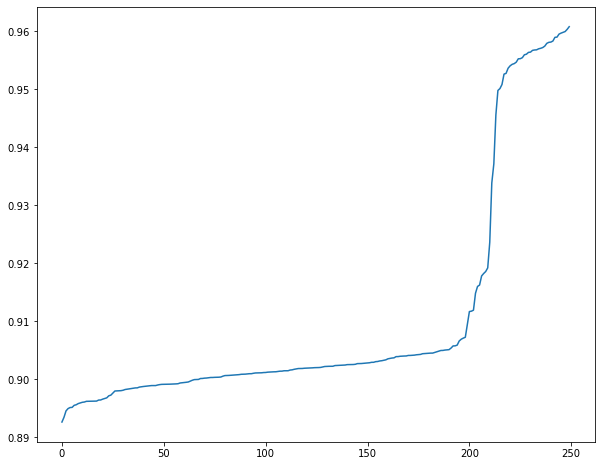

In [27]:
#plot the loss
plt.figure(figsize = (10,8)) 
plt.plot(bayes_params['loss'])

We see that the majority of times the model stays within 0.89 to 0.91 loss. Next let's look at the learning rate.

Text(0.5, 1.0, 'Learning Rate distribution')

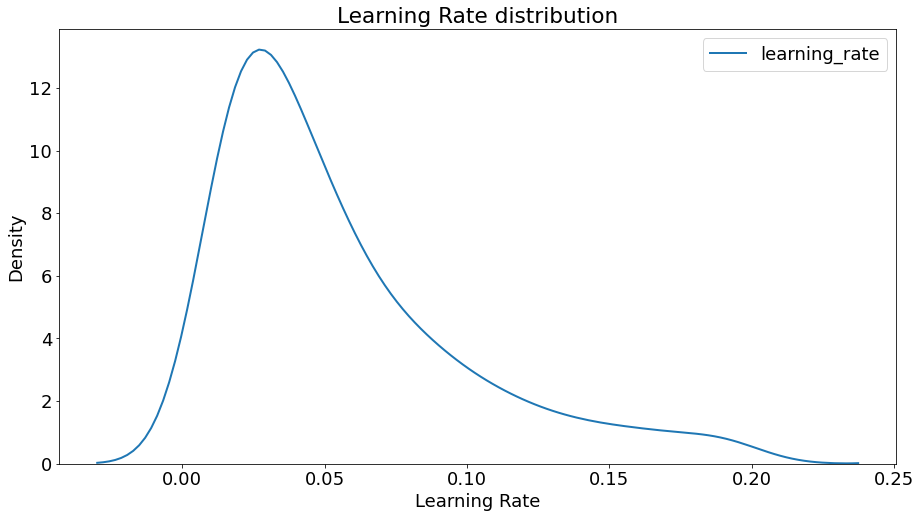

In [28]:
#learning rate 
plt.figure(figsize = (15,8))
plt.rcParams['font.size'] = 18

#Density plots of the learning rate distribution 
sns.kdeplot(bayes_params['learning_rate'], linewidth = 2)
plt.xlabel('Learning Rate')
plt.ylabel('Density')
plt.title('Learning Rate distribution')

Learning rate seems to stay around 0.05. Let's next look at boosting type.

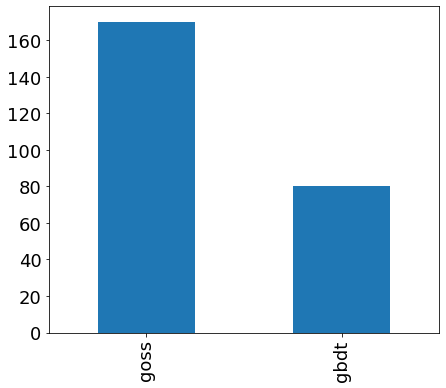

In [30]:
#plot boosting type
bayes_params['boosting_type'].value_counts().plot.bar(figsize = (7,6))

We see that 'goss' is favored over 'gbdt'. How about objective function?

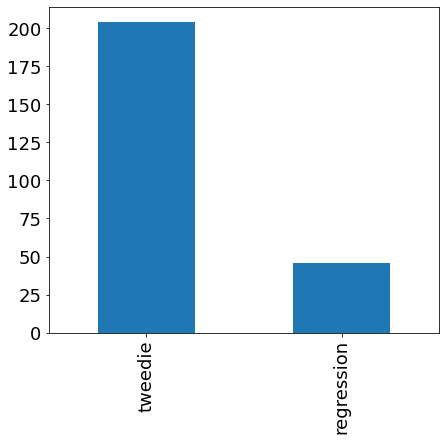

In [31]:
#plot objective
bayes_params['objective'].value_counts().plot.bar(figsize = (7,6))

It seems that tweedie gives better result than just the usual mean squared objective. Let's briefly plot some other params.

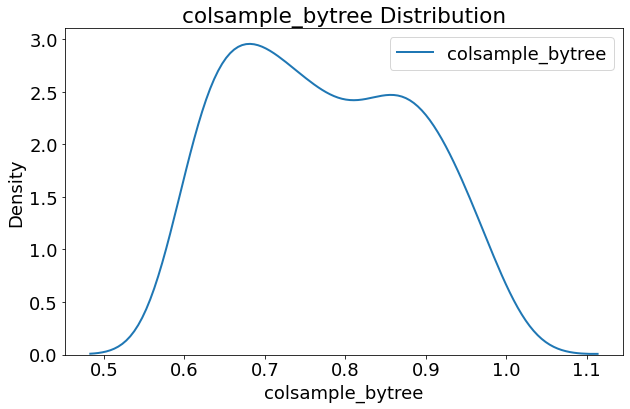

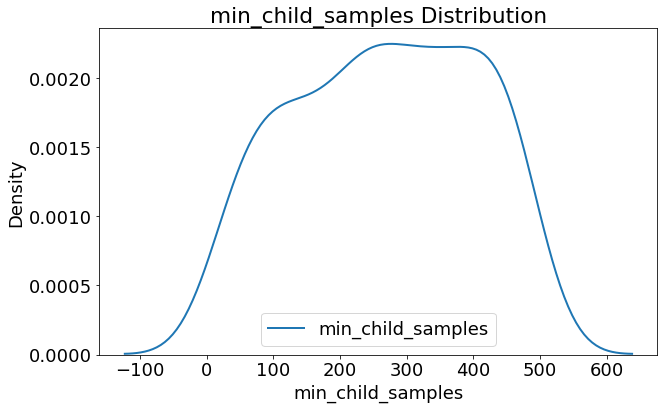

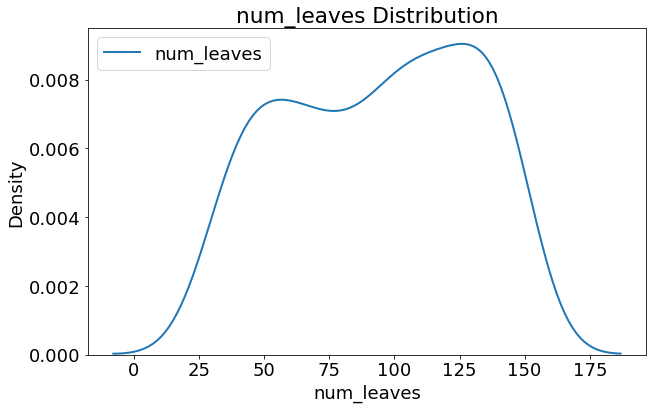

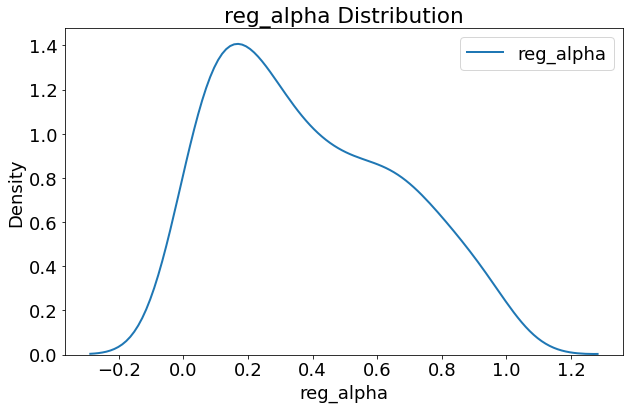

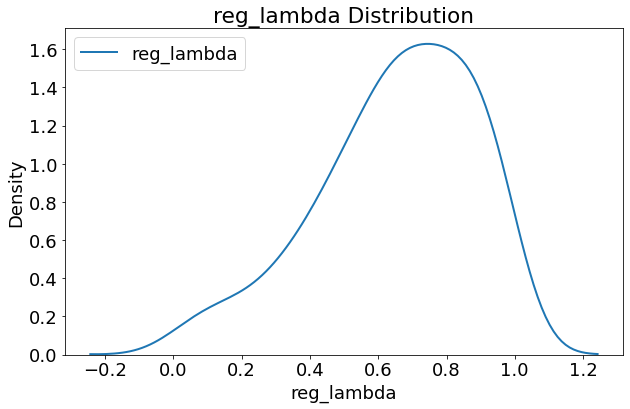

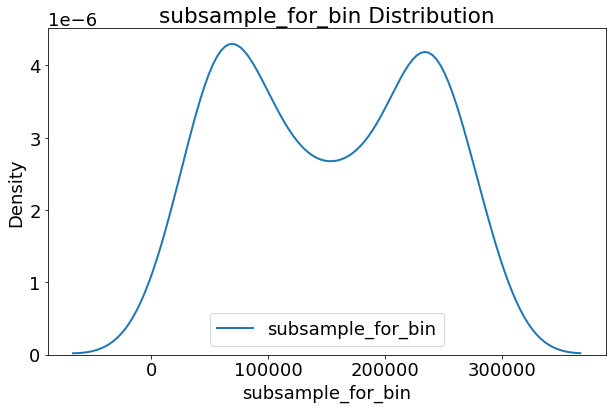

In [32]:
#iterate through each numeric hyperparameters
for hyper in ['colsample_bytree', 'min_child_samples', 'num_leaves', 'reg_alpha', 'reg_lambda', 'subsample_for_bin']:
    plt.figure(figsize = (10,6))
    sns.kdeplot(bayes_params[hyper], linewidth = 2)
    plt.xlabel('{}'.format(hyper))
    plt.ylabel('Density')
    plt.title('{} Distribution'.format(hyper))

Next let us fit with the top result from grid search.

In [35]:
#evaluate best result
lgb_gs = pd.read_csv('output/lgb_trials.csv')
lgb_gs.sort_values('loss', inplace = True)
lgb_gs.reset_index(inplace = True, drop = True)

best_bayes_estimators = lgb_gs.loc[0, 'n_estimators']
best_bayes_params = eval(lgb_gs.loc[0,'params'])
best_bayes_params['num_boost_round'] = best_bayes_estimators

#fit the best model
best_lgb_model = lgb.train(params = best_bayes_params, train_set=train_set, valid_sets = [train_set, val_set])

[1]	training's rmse: 1.18256	valid_1's rmse: 1.13149
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.17721	valid_1's rmse: 1.12702
[3]	training's rmse: 1.17201	valid_1's rmse: 1.12254
[4]	training's rmse: 1.16686	valid_1's rmse: 1.11829
[5]	training's rmse: 1.1617	valid_1's rmse: 1.11406
[6]	training's rmse: 1.15686	valid_1's rmse: 1.11017
[7]	training's rmse: 1.15194	valid_1's rmse: 1.1062
[8]	training's rmse: 1.14686	valid_1's rmse: 1.10218
[9]	training's rmse: 1.14169	valid_1's rmse: 1.09811
[10]	training's rmse: 1.1369	valid_1's rmse: 1.09464
[11]	training's rmse: 1.13177	valid_1's rmse: 1.09082
[12]	training's rmse: 1.1265	valid_1's rmse: 1.08688
[13]	training's rmse: 1.12112	valid_1's rmse: 1.08283
[14]	training's rmse: 1.11556	valid_1's rmse: 1.07877
[15]	training's rmse: 1.11014	valid_1's rmse: 1.07494
[16]	training's rmse: 1.10453	valid_1's rmse: 1.07087
[17]	training's rmse: 1.09862	valid_1's rmse: 1.06644
[18]	training's rmse: 1.09266	vali

[148]	training's rmse: 0.804594	valid_1's rmse: 0.893626
[149]	training's rmse: 0.804225	valid_1's rmse: 0.893609
[150]	training's rmse: 0.804085	valid_1's rmse: 0.893452
[151]	training's rmse: 0.803727	valid_1's rmse: 0.893431
[152]	training's rmse: 0.803319	valid_1's rmse: 0.89333
[153]	training's rmse: 0.802906	valid_1's rmse: 0.894269
[154]	training's rmse: 0.802779	valid_1's rmse: 0.894167
[155]	training's rmse: 0.802494	valid_1's rmse: 0.894185
[156]	training's rmse: 0.802216	valid_1's rmse: 0.894242
[157]	training's rmse: 0.802032	valid_1's rmse: 0.894116
[158]	training's rmse: 0.801761	valid_1's rmse: 0.894173
[159]	training's rmse: 0.801409	valid_1's rmse: 0.894112
[160]	training's rmse: 0.80075	valid_1's rmse: 0.894967
[161]	training's rmse: 0.800555	valid_1's rmse: 0.895018
[162]	training's rmse: 0.800262	valid_1's rmse: 0.89496
[163]	training's rmse: 0.800125	valid_1's rmse: 0.894915
[164]	training's rmse: 0.799914	valid_1's rmse: 0.894828
[165]	training's rmse: 0.799716	va

Let's look at the feature importance. 

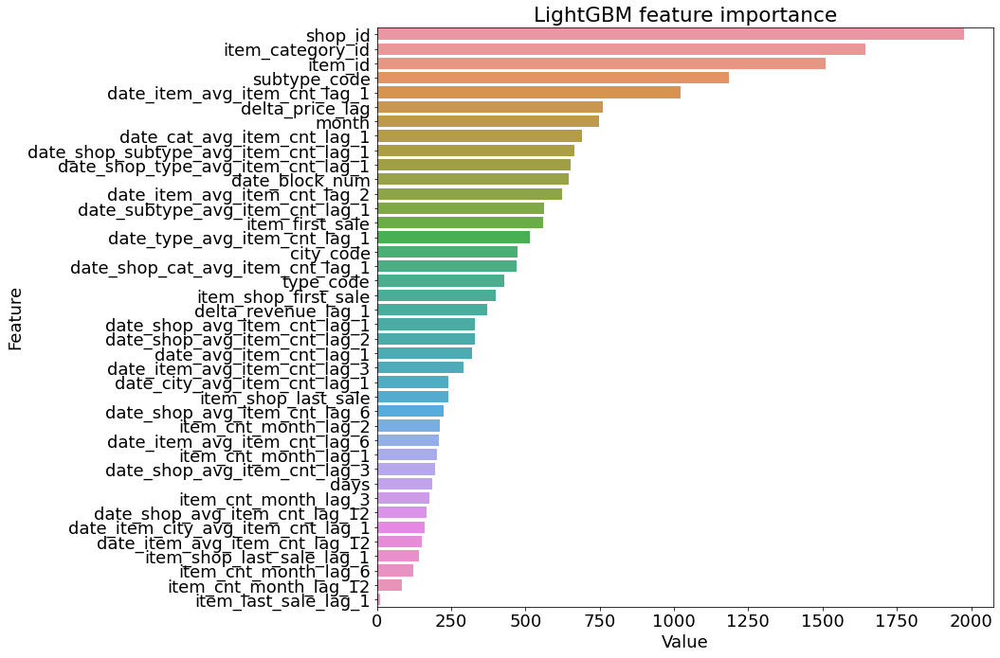

In [41]:
lgb_importance(best_lgb_model, train_data, 'split', (15,10))

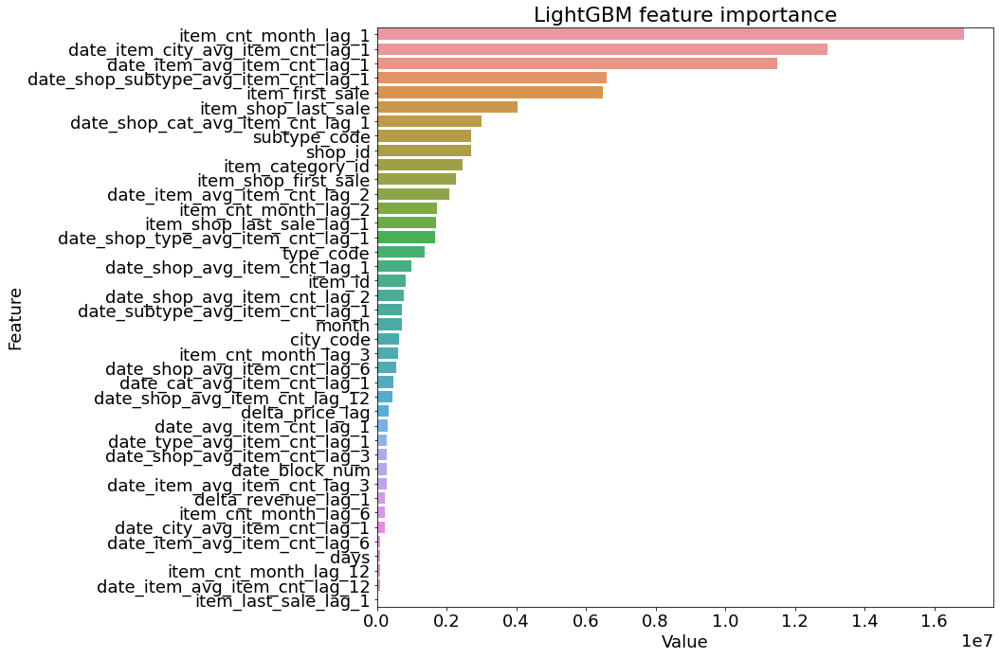

In [42]:
lgb_importance(best_lgb_model, train_data, 'gain', (15,10))

It seems that feature importance based on 'gain' makes more sense. Finally let us predict the test set.

In [37]:
lgb_test_pred = best_lgb_model.predict(test_data).clip(0,20)

submission = pd.DataFrame({
    'ID': list(range(test.shape[0])),
    'item_cnt_month': lgb_test_pred
})

submission.to_csv('output/lgb_gs_pred.csv', index = False)

In [38]:
#evaluate second best result
lgb_gs = pd.read_csv('output/lgb_trials.csv')
lgb_gs.sort_values('loss', inplace = True)
lgb_gs.reset_index(inplace = True, drop = True)

second_best_bayes_estimators = lgb_gs.loc[1, 'n_estimators']
second_best_bayes_params = eval(lgb_gs.loc[1,'params'])
#second_best_bayes_params['num_boost_round'] = second_best_bayes_estimators

#fit the best model
second_best_lgb_model = lgb.train(params = second_best_bayes_params, train_set=train_set, valid_sets = [train_set, val_set])

[1]	training's rmse: 1.18196	valid_1's rmse: 1.13095
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.17588	valid_1's rmse: 1.12576
[3]	training's rmse: 1.17011	valid_1's rmse: 1.12091
[4]	training's rmse: 1.16444	valid_1's rmse: 1.11617
[5]	training's rmse: 1.15878	valid_1's rmse: 1.11165
[6]	training's rmse: 1.15322	valid_1's rmse: 1.10732
[7]	training's rmse: 1.14777	valid_1's rmse: 1.10307
[8]	training's rmse: 1.14218	valid_1's rmse: 1.0987
[9]	training's rmse: 1.13645	valid_1's rmse: 1.09421
[10]	training's rmse: 1.1307	valid_1's rmse: 1.08966
[11]	training's rmse: 1.12478	valid_1's rmse: 1.08526
[12]	training's rmse: 1.11879	valid_1's rmse: 1.08074
[13]	training's rmse: 1.11261	valid_1's rmse: 1.07609
[14]	training's rmse: 1.10629	valid_1's rmse: 1.07143
[15]	training's rmse: 1.09997	valid_1's rmse: 1.06683
[16]	training's rmse: 1.09333	valid_1's rmse: 1.06201
[17]	training's rmse: 1.08655	valid_1's rmse: 1.05707
[18]	training's rmse: 1.07964	va

[147]	training's rmse: 0.787317	valid_1's rmse: 0.899099
[148]	training's rmse: 0.787125	valid_1's rmse: 0.899015
[149]	training's rmse: 0.786485	valid_1's rmse: 0.898653
[150]	training's rmse: 0.786414	valid_1's rmse: 0.898642
[151]	training's rmse: 0.785805	valid_1's rmse: 0.899659
[152]	training's rmse: 0.785371	valid_1's rmse: 0.899568
[153]	training's rmse: 0.784953	valid_1's rmse: 0.89959
[154]	training's rmse: 0.784809	valid_1's rmse: 0.899587
[155]	training's rmse: 0.784515	valid_1's rmse: 0.899861
[156]	training's rmse: 0.784254	valid_1's rmse: 0.899729
[157]	training's rmse: 0.784048	valid_1's rmse: 0.899692
[158]	training's rmse: 0.783816	valid_1's rmse: 0.8996
[159]	training's rmse: 0.783585	valid_1's rmse: 0.899534
[160]	training's rmse: 0.783141	valid_1's rmse: 0.899506
[161]	training's rmse: 0.782963	valid_1's rmse: 0.899454
[162]	training's rmse: 0.782876	valid_1's rmse: 0.899427
[163]	training's rmse: 0.782714	valid_1's rmse: 0.899194
[164]	training's rmse: 0.782513	va

In [41]:
lgb_test_pred_2 = second_best_lgb_model.predict(test_data).clip(0,20)

submission = pd.DataFrame({
    'ID': list(range(test.shape[0])),
    'item_cnt_month': lgb_test_pred_2
})

submission.to_csv('output/lgb_gs_pred_2.csv', index = False)

In [9]:
#evaluate third best result
lgb_gs = pd.read_csv('output/lgb_trials.csv')
lgb_gs.sort_values('loss', inplace = True)
lgb_gs.reset_index(inplace = True, drop = True)

third_best_bayes_estimators = lgb_gs.loc[2, 'n_estimators']
third_best_bayes_params = eval(lgb_gs.loc[2,'params'])
#second_best_bayes_params['num_boost_round'] = second_best_bayes_estimators

#fit the best model
third_best_lgb_model = lgb.train(params = third_best_bayes_params, train_set=train_set, valid_sets = [train_set, val_set])

/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/lightgbm/engine.py:153: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	training's rmse: 1.18386	valid_1's rmse: 1.13264
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.17955	valid_1's rmse: 1.12893
[3]	training's rmse: 1.17546	valid_1's rmse: 1.12538
[4]	training's rmse: 1.17141	valid_1's rmse: 1.12196
[5]	training's rmse: 1.16741	valid_1's rmse: 1.11861
[6]	training's rmse: 1.16348	valid_1's rmse: 1.11548
[7]	training's rmse: 1.15971	valid_1's rmse: 1.1124
[8]	training's rmse: 1.15587	valid_1's rmse: 1.10933
[9]	training's rmse: 1.152	valid_1's rmse: 1.10621
[10]	training's rmse: 1.14841	valid_1's rmse: 1.10354
[11]	training's rmse: 1.14452	valid_1's rmse: 1.10059
[12]	training's rmse: 1.14063	valid_1's rmse: 1.09754
[13]	training's rmse: 1.13673	valid_1's rmse: 1.09452
[14]	training's rmse: 1.13275	valid_1's rmse: 1.09149
[15]	training's rmse: 1.12875	valid_1's rmse: 1.08846
[16]	training's rmse: 1.12469	valid_1's rmse: 1.08536
[17]	training's rmse: 1.12053	valid_1's rmse: 1.08215
[18]	training's rmse: 1.1163	vali

[148]	training's rmse: 0.815363	valid_1's rmse: 0.900132
[149]	training's rmse: 0.815101	valid_1's rmse: 0.900014
[150]	training's rmse: 0.814641	valid_1's rmse: 0.899983
[151]	training's rmse: 0.814365	valid_1's rmse: 0.899813
[152]	training's rmse: 0.814077	valid_1's rmse: 0.899857
[153]	training's rmse: 0.813265	valid_1's rmse: 0.89979
[154]	training's rmse: 0.812862	valid_1's rmse: 0.899794
[155]	training's rmse: 0.812244	valid_1's rmse: 0.899784
[156]	training's rmse: 0.811971	valid_1's rmse: 0.899712
[157]	training's rmse: 0.811696	valid_1's rmse: 0.899678
[158]	training's rmse: 0.811376	valid_1's rmse: 0.899474
[159]	training's rmse: 0.811154	valid_1's rmse: 0.899443
[160]	training's rmse: 0.810789	valid_1's rmse: 0.899425
[161]	training's rmse: 0.810433	valid_1's rmse: 0.899387
[162]	training's rmse: 0.810159	valid_1's rmse: 0.899189
[163]	training's rmse: 0.809833	valid_1's rmse: 0.899151
[164]	training's rmse: 0.809464	valid_1's rmse: 0.899052
[165]	training's rmse: 0.809206	

In [10]:
lgb_test_pred_3 = third_best_lgb_model.predict(test_data).clip(0,20)

submission = pd.DataFrame({
    'ID': list(range(test.shape[0])),
    'item_cnt_month': lgb_test_pred_3
})

submission.to_csv('output/lgb_gs_pred_3.csv', index = False)

### Prediction by shop_id

In [17]:
train['shop_id'].unique()

array([ 2,  3,  4,  5,  6,  7, 10, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22,
       24, 25, 26, 27, 28, 29, 30, 31, 35, 37, 38, 41, 42, 43, 44, 45, 46,
       47, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 39, 40, 48, 34, 33,
        9, 20, 11], dtype=int8)

In [16]:
set(validation['shop_id']).difference(set(train['shop_id']))

{36}

In [20]:
set(train['shop_id']).difference(set(validation['shop_id']))

{11, 13, 17, 27, 29, 30, 33, 40, 43, 51, 54}

In [18]:
set(test['shop_id']).difference(set(train['shop_id']))

{36}

In [21]:
set(train['shop_id']).difference(set(test['shop_id']))

{9, 11, 13, 17, 20, 27, 29, 30, 33, 40, 43, 51, 54}

In [19]:
validation[validation['shop_id'] == 36]

,date_block_num,shop_id,item_id,item_cnt_month,city_code,item_category_id,type_code,subtype_code,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,date_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_2,date_item_avg_item_cnt_lag_3,date_item_avg_item_cnt_lag_6,date_item_avg_item_cnt_lag_12,date_shop_avg_item_cnt_lag_1,date_shop_avg_item_cnt_lag_2,date_shop_avg_item_cnt_lag_3,date_shop_avg_item_cnt_lag_6,date_shop_avg_item_cnt_lag_12,date_cat_avg_item_cnt_lag_1,date_shop_cat_avg_item_cnt_lag_1,date_shop_type_avg_item_cnt_lag_1,date_shop_subtype_avg_item_cnt_lag_1,date_city_avg_item_cnt_lag_1,date_item_city_avg_item_cnt_lag_1,date_type_avg_item_cnt_lag_1,date_subtype_avg_item_cnt_lag_1,delta_price_lag,delta_revenue_lag_1,item_shop_last_sale,item_shop_last_sale_lag_1,item_last_sale_lag_1,month,days,item_shop_first_sale,item_first_sale
129912,33,36,30,0.0,16,40,11,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,32
129913,33,36,31,0.0,16,37,11,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,32
129914,33,36,32,0.0,16,40,11,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,33
129915,33,36,33,1.0,16,37,11,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,33
129916,33,36,40,0.0,16,57,13,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135320,33,36,22162,0.0,16,40,11,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,15
135321,33,36,22163,0.0,16,40,11,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,2
135322,33,36,22164,0.0,16,37,11,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,8
135323,33,36,22166,0.0,16,54,12,61,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0,NaN,NaN,9,31,0,24


In [ ]:
#prepare datasets for lgb 
train_data = train.drop('item_cnt_month', axis = 1)
train_labels = train['item_cnt_month']
train_set = lgb.Dataset(train_data, train_labels)

val_data = validation.drop('item_cnt_month', axis = 1)
val_labels = validation['item_cnt_month']
val_set = lgb.Dataset(val_data, val_labels)

test_data = test.drop('item_cnt_month', axis = 1)

In [13]:
#evaluate second best result
lgb_gs = pd.read_csv('output/lgb_trials.csv')
lgb_gs.sort_values('loss', inplace = True)
lgb_gs.reset_index(inplace = True, drop = True)

second_best_bayes_estimators = lgb_gs.loc[1, 'n_estimators']
second_best_bayes_params = eval(lgb_gs.loc[1,'params'])

#fit the best model for 
best_lgb_model = lgb.train(params = best_bayes_params, train_set=train_set, valid_sets = [train_set, val_set])

In [30]:
best_bayes_params

{'boosting_type': 'goss',
 'colsample_bytree': 0.7540491579600109,
 'early_stopping_rounds': 50,
 'learning_rate': 0.05500516218610198,
 'metric': 'rmse',
 'min_child_samples': 440,
 'nthread': 10,
 'num_boost_round': 1000,
 'num_leaves': 143,
 'objective': 'tweedie',
 'reg_alpha': 0.165160709179051,
 'reg_lambda': 0.9111991004008657,
 'seed': 42,
 'subsample': 0.8682087014285034,
 'subsample_for_bin': 60000,
 'vebose_eval': 1}

In [51]:
#evaluate second best result
ts = time.time()

lgb_gs = pd.read_csv('output/lgb_trials.csv')
lgb_gs.sort_values('loss', inplace = True)
lgb_gs.reset_index(inplace = True, drop = True)

best_bayes_estimators = lgb_gs.loc[0, 'n_estimators']
best_bayes_params = eval(lgb_gs.loc[0,'params'])
early_stopping_rounds = best_bayes_params['early_stopping_rounds']
del best_bayes_params['early_stopping_rounds']

#fit a global model for shop_id not in train
global_lgb_model = lgb.train(params = best_bayes_params, train_set=train_set, valid_sets = [train_set, val_set])

#save the global model
pickle.dump(global_lgb_model, open('output/shop_id/global_lgb_model.pickle', 'wb'))

unique_shop_train = list(set(train['shop_id']))
diff_shop_val = list(set(validation['shop_id']).difference(set(train['shop_id'])))
diff_shop_test = list(set(test['shop_id']).difference(set(train['shop_id'])))

shop_model = {}
shop_valid_pred = {}
for shop in tqdm(unique_shop_train):
    df_train = train[train['shop_id'] == shop]
    df_train_set = lgb.Dataset(df_train.drop('item_cnt_month', axis = 1), df_train['item_cnt_month'])
    
    df_val = validation[validation['shop_id'] == shop]
    
    if df_val.shape[0] > 0:
        df_val_set = lgb.Dataset(df_val.drop('item_cnt_month', axis = 1), df_val['item_cnt_month'])
        lgb_model = lgb.train(params = best_bayes_params, train_set = df_train_set, valid_sets = [df_train_set, df_val_set], early_stopping_rounds = early_stopping_rounds)
        shop_model[f'shop_{shop}'] = lgb_model
        pickle.dump(lgb_model, open(f'output/shop_id/lgb_model_shop_{shop}.pickle', 'wb'))
        df_val['predictions'] = lgb_model.predict(df_val.drop('item_cnt_month', axis = 1))
        shop_valid_pred[f'shop_{shop}'] = df_val
    else:
        lgb_model = lgb.train(params = best_bayes_params, train_set = df_train_set, num_boost_round = best_bayes_estimators)
        shop_model[f'shop_{shop}'] = lgb_model
        pickle.dump(lgb_model, open(f'output/shop_id/lgb_model_shop_{shop}.pickle', 'wb'))

print('Finish prediction for all shops in train')
        
for shop in tqdm(diff_shop_val):
    df_val = validation[validation['shop_id'] == shop]
    df_val['predictions'] = global_lgb_model.predict(df_val.drop('item_cnt_month', axis = 1))
    shop_valid_pred[f'shop_{shop}'] = df_val
    
print('Finish prediction for all shops in validation')
print(f'Elapsed time is {time.time() - ts}')

/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	training's rmse: 1.18256	valid_1's rmse: 1.13155
[2]	training's rmse: 1.17721	valid_1's rmse: 1.12707
[3]	training's rmse: 1.17201	valid_1's rmse: 1.1226
[4]	training's rmse: 1.16686	valid_1's rmse: 1.11834
[5]	training's rmse: 1.1617	valid_1's rmse: 1.11411
[6]	training's rmse: 1.15686	valid_1's rmse: 1.11019
[7]	training's rmse: 1.15194	valid_1's rmse: 1.10623
[8]	training's rmse: 1.14685	valid_1's rmse: 1.10223
[9]	training's rmse: 1.14169	valid_1's rmse: 1.09815
[10]	training's rmse: 1.13689	valid_1's rmse: 1.09469
[11]	training's rmse: 1.13176	valid_1's rmse: 1.09087
[12]	training's rmse: 1.12647	valid_1's rmse: 1.08695
[13]	training's rmse: 1.1211	valid_1's rmse: 1.08283
[14]	training's rmse: 1.11554	valid_1's rmse: 1.07878
[15]	training's rmse: 1.1101	valid_1's rmse: 1.07493
[16]	training's rmse: 1.1045	valid_1's rmse: 1.07084
[17]	training's rmse: 1.09861	valid_1's rmse: 1.06643
[18]	training's rmse: 1.09265	valid_1's rmse: 1.06204
[19]	training's rmse: 1.0865	valid_1's rms

[149]	training's rmse: 0.804937	valid_1's rmse: 0.900719
[150]	training's rmse: 0.804773	valid_1's rmse: 0.900557
[151]	training's rmse: 0.804653	valid_1's rmse: 0.90056
[152]	training's rmse: 0.804007	valid_1's rmse: 0.900414
[153]	training's rmse: 0.803448	valid_1's rmse: 0.901598
[154]	training's rmse: 0.803236	valid_1's rmse: 0.901451
[155]	training's rmse: 0.802956	valid_1's rmse: 0.901169
[156]	training's rmse: 0.802571	valid_1's rmse: 0.901213
[157]	training's rmse: 0.802309	valid_1's rmse: 0.90118
[158]	training's rmse: 0.802062	valid_1's rmse: 0.901215
[159]	training's rmse: 0.801655	valid_1's rmse: 0.901242
[160]	training's rmse: 0.801358	valid_1's rmse: 0.90106
[161]	training's rmse: 0.801169	valid_1's rmse: 0.901328
[162]	training's rmse: 0.800828	valid_1's rmse: 0.901329
[163]	training's rmse: 0.800754	valid_1's rmse: 0.901295
[164]	training's rmse: 0.800092	valid_1's rmse: 0.901231
[165]	training's rmse: 0.799879	valid_1's rmse: 0.901212
[166]	training's rmse: 0.799295	va

[295]	training's rmse: 0.773994	valid_1's rmse: 0.906669
[296]	training's rmse: 0.773816	valid_1's rmse: 0.906742
[297]	training's rmse: 0.773622	valid_1's rmse: 0.908962
[298]	training's rmse: 0.773546	valid_1's rmse: 0.908885
[299]	training's rmse: 0.773474	valid_1's rmse: 0.908857
[300]	training's rmse: 0.773404	valid_1's rmse: 0.908793
[301]	training's rmse: 0.773313	valid_1's rmse: 0.908807
[302]	training's rmse: 0.773183	valid_1's rmse: 0.908869
[303]	training's rmse: 0.772668	valid_1's rmse: 0.909192
[304]	training's rmse: 0.772622	valid_1's rmse: 0.909196
[305]	training's rmse: 0.772482	valid_1's rmse: 0.909148
[306]	training's rmse: 0.772357	valid_1's rmse: 0.909142
[307]	training's rmse: 0.772185	valid_1's rmse: 0.909064
[308]	training's rmse: 0.772035	valid_1's rmse: 0.909036
[309]	training's rmse: 0.771944	valid_1's rmse: 0.909013
[310]	training's rmse: 0.771874	valid_1's rmse: 0.908891
[311]	training's rmse: 0.771746	valid_1's rmse: 0.908902
[312]	training's rmse: 0.771702

[440]	training's rmse: 0.758585	valid_1's rmse: 0.913987
[441]	training's rmse: 0.758569	valid_1's rmse: 0.913953
[442]	training's rmse: 0.758516	valid_1's rmse: 0.913927
[443]	training's rmse: 0.758227	valid_1's rmse: 0.913819
[444]	training's rmse: 0.75809	valid_1's rmse: 0.913801
[445]	training's rmse: 0.758056	valid_1's rmse: 0.913817
[446]	training's rmse: 0.757948	valid_1's rmse: 0.913704
[447]	training's rmse: 0.75791	valid_1's rmse: 0.913701
[448]	training's rmse: 0.75782	valid_1's rmse: 0.913701
[449]	training's rmse: 0.757698	valid_1's rmse: 0.913621
[450]	training's rmse: 0.757623	valid_1's rmse: 0.914288
[451]	training's rmse: 0.757599	valid_1's rmse: 0.914319
[452]	training's rmse: 0.757559	valid_1's rmse: 0.914312
[453]	training's rmse: 0.757502	valid_1's rmse: 0.914308
[454]	training's rmse: 0.75727	valid_1's rmse: 0.914329
[455]	training's rmse: 0.757196	valid_1's rmse: 0.914512
[456]	training's rmse: 0.757119	valid_1's rmse: 0.914414
[457]	training's rmse: 0.756843	val

[585]	training's rmse: 0.747382	valid_1's rmse: 0.914524
[586]	training's rmse: 0.747308	valid_1's rmse: 0.914542
[587]	training's rmse: 0.747299	valid_1's rmse: 0.914554
[588]	training's rmse: 0.747277	valid_1's rmse: 0.914548
[589]	training's rmse: 0.747273	valid_1's rmse: 0.914542
[590]	training's rmse: 0.747245	valid_1's rmse: 0.91464
[591]	training's rmse: 0.747189	valid_1's rmse: 0.914843
[592]	training's rmse: 0.74715	valid_1's rmse: 0.914738
[593]	training's rmse: 0.747084	valid_1's rmse: 0.914855
[594]	training's rmse: 0.746936	valid_1's rmse: 0.914856
[595]	training's rmse: 0.746934	valid_1's rmse: 0.914837
[596]	training's rmse: 0.746821	valid_1's rmse: 0.914841
[597]	training's rmse: 0.746798	valid_1's rmse: 0.914828
[598]	training's rmse: 0.746657	valid_1's rmse: 0.915494
[599]	training's rmse: 0.746621	valid_1's rmse: 0.915485
[600]	training's rmse: 0.746618	valid_1's rmse: 0.915474
[601]	training's rmse: 0.746628	valid_1's rmse: 0.915468
[602]	training's rmse: 0.746495	v

[731]	training's rmse: 0.74011	valid_1's rmse: 0.915948
[732]	training's rmse: 0.7401	valid_1's rmse: 0.915974
[733]	training's rmse: 0.740022	valid_1's rmse: 0.915962
[734]	training's rmse: 0.740009	valid_1's rmse: 0.915952
[735]	training's rmse: 0.739971	valid_1's rmse: 0.916151
[736]	training's rmse: 0.739953	valid_1's rmse: 0.916152
[737]	training's rmse: 0.739898	valid_1's rmse: 0.915955
[738]	training's rmse: 0.739815	valid_1's rmse: 0.915997
[739]	training's rmse: 0.739696	valid_1's rmse: 0.916
[740]	training's rmse: 0.739681	valid_1's rmse: 0.916016
[741]	training's rmse: 0.739658	valid_1's rmse: 0.916006
[742]	training's rmse: 0.739606	valid_1's rmse: 0.916012
[743]	training's rmse: 0.739596	valid_1's rmse: 0.916005
[744]	training's rmse: 0.73955	valid_1's rmse: 0.915989
[745]	training's rmse: 0.739474	valid_1's rmse: 0.915991
[746]	training's rmse: 0.739404	valid_1's rmse: 0.916185
[747]	training's rmse: 0.739389	valid_1's rmse: 0.91618
[748]	training's rmse: 0.739308	valid_1

[877]	training's rmse: 0.732909	valid_1's rmse: 0.920533
[878]	training's rmse: 0.732879	valid_1's rmse: 0.920513
[879]	training's rmse: 0.732817	valid_1's rmse: 0.920521
[880]	training's rmse: 0.732715	valid_1's rmse: 0.920534
[881]	training's rmse: 0.732634	valid_1's rmse: 0.920369
[882]	training's rmse: 0.732534	valid_1's rmse: 0.920341
[883]	training's rmse: 0.732525	valid_1's rmse: 0.92034
[884]	training's rmse: 0.732483	valid_1's rmse: 0.920361
[885]	training's rmse: 0.732487	valid_1's rmse: 0.920365
[886]	training's rmse: 0.732488	valid_1's rmse: 0.920378
[887]	training's rmse: 0.732476	valid_1's rmse: 0.920391
[888]	training's rmse: 0.732423	valid_1's rmse: 0.920429
[889]	training's rmse: 0.732234	valid_1's rmse: 0.920664
[890]	training's rmse: 0.73222	valid_1's rmse: 0.920664
[891]	training's rmse: 0.732214	valid_1's rmse: 0.920655
[892]	training's rmse: 0.732205	valid_1's rmse: 0.92066
[893]	training's rmse: 0.732197	valid_1's rmse: 0.920667
[894]	training's rmse: 0.732166	va

  0%|          | 0/54 [00:00<?, ?it/s]

[1]	training's rmse: 0.819265	valid_1's rmse: 0.693398
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.816759	valid_1's rmse: 0.69108
[3]	training's rmse: 0.814352	valid_1's rmse: 0.688823
[4]	training's rmse: 0.811909	valid_1's rmse: 0.686526
[5]	training's rmse: 0.809686	valid_1's rmse: 0.684451
[6]	training's rmse: 0.807287	valid_1's rmse: 0.682268
[7]	training's rmse: 0.804897	valid_1's rmse: 0.680137
[8]	training's rmse: 0.802531	valid_1's rmse: 0.677974
[9]	training's rmse: 0.800116	valid_1's rmse: 0.675731
[10]	training's rmse: 0.797691	valid_1's rmse: 0.673572
[11]	training's rmse: 0.795087	valid_1's rmse: 0.671309
[12]	training's rmse: 0.79243	valid_1's rmse: 0.669019
[13]	training's rmse: 0.789678	valid_1's rmse: 0.666658
[14]	training's rmse: 0.787045	valid_1's rmse: 0.664517
[15]	training's rmse: 0.784125	valid_1's rmse: 0.662228
[16]	training's rmse: 0.781143	valid_1's rmse: 0.65967
[17]	training's rmse: 0.778083	valid_1's rmse: 0.657137

/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  2%|▏         | 1/54 [00:00<00:52,  1.02it/s]

[117]	training's rmse: 0.569264	valid_1's rmse: 0.59222
Early stopping, best iteration is:
[67]	training's rmse: 0.625301	valid_1's rmse: 0.583995
[1]	training's rmse: 0.687287	valid_1's rmse: 0.643175
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.685066	valid_1's rmse: 0.641157
[3]	training's rmse: 0.682953	valid_1's rmse: 0.639263
[4]	training's rmse: 0.680802	valid_1's rmse: 0.637347
[5]	training's rmse: 0.678872	valid_1's rmse: 0.635618
[6]	training's rmse: 0.676774	valid_1's rmse: 0.633836
[7]	training's rmse: 0.674702	valid_1's rmse: 0.632088
[8]	training's rmse: 0.672676	valid_1's rmse: 0.630341
[9]	training's rmse: 0.670646	valid_1's rmse: 0.628574
[10]	training's rmse: 0.668605	valid_1's rmse: 0.626774
[11]	training's rmse: 0.666412	valid_1's rmse: 0.624894
[12]	training's rmse: 0.664196	valid_1's rmse: 0.623007
[13]	training's rmse: 0.661919	valid_1's rmse: 0.621037
[14]	training's rmse: 0.659767	valid_1's rmse: 0.619146
[15]	training's r

[152]	training's rmse: 0.476062	valid_1's rmse: 0.461317
[153]	training's rmse: 0.47592	valid_1's rmse: 0.461336
[154]	training's rmse: 0.475586	valid_1's rmse: 0.461276
[155]	training's rmse: 0.475252	valid_1's rmse: 0.461657
[156]	training's rmse: 0.474873	valid_1's rmse: 0.461529
[157]	training's rmse: 0.474599	valid_1's rmse: 0.461307
[158]	training's rmse: 0.474247	valid_1's rmse: 0.461244
[159]	training's rmse: 0.473846	valid_1's rmse: 0.461152
[160]	training's rmse: 0.473582	valid_1's rmse: 0.461211
[161]	training's rmse: 0.473356	valid_1's rmse: 0.461075
[162]	training's rmse: 0.473141	valid_1's rmse: 0.461157
[163]	training's rmse: 0.472896	valid_1's rmse: 0.461254
[164]	training's rmse: 0.47241	valid_1's rmse: 0.461328
[165]	training's rmse: 0.472108	valid_1's rmse: 0.461418
[166]	training's rmse: 0.471775	valid_1's rmse: 0.461253
[167]	training's rmse: 0.471592	valid_1's rmse: 0.461521
[168]	training's rmse: 0.471348	valid_1's rmse: 0.461475
[169]	training's rmse: 0.471085	v

  4%|▎         | 2/54 [00:03<01:10,  1.36s/it]

[1]	training's rmse: 0.792184	valid_1's rmse: 0.68831
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.789283	valid_1's rmse: 0.685752
[3]	training's rmse: 0.786501	valid_1's rmse: 0.683366
[4]	training's rmse: 0.783648	valid_1's rmse: 0.680944
[5]	training's rmse: 0.781109	valid_1's rmse: 0.678918
[6]	training's rmse: 0.778334	valid_1's rmse: 0.676689
[7]	training's rmse: 0.775587	valid_1's rmse: 0.67456
[8]	training's rmse: 0.77288	valid_1's rmse: 0.672439
[9]	training's rmse: 0.77014	valid_1's rmse: 0.670295
[10]	training's rmse: 0.767401	valid_1's rmse: 0.668307
[11]	training's rmse: 0.764434	valid_1's rmse: 0.66615
[12]	training's rmse: 0.76142	valid_1's rmse: 0.664042
[13]	training's rmse: 0.758337	valid_1's rmse: 0.661839
[14]	training's rmse: 0.755401	valid_1's rmse: 0.659816
[15]	training's rmse: 0.752154	valid_1's rmse: 0.657565
[16]	training's rmse: 0.748845	valid_1's rmse: 0.655301
[17]	training's rmse: 0.745454	valid_1's rmse: 0.653008
[1

[166]	training's rmse: 0.515664	valid_1's rmse: 0.481832
[167]	training's rmse: 0.515364	valid_1's rmse: 0.482533
[168]	training's rmse: 0.515131	valid_1's rmse: 0.482369
[169]	training's rmse: 0.514701	valid_1's rmse: 0.482166
[170]	training's rmse: 0.514359	valid_1's rmse: 0.48221
[171]	training's rmse: 0.514126	valid_1's rmse: 0.482017
[172]	training's rmse: 0.513889	valid_1's rmse: 0.481936
[173]	training's rmse: 0.513474	valid_1's rmse: 0.481509
[174]	training's rmse: 0.513272	valid_1's rmse: 0.481362
[175]	training's rmse: 0.513096	valid_1's rmse: 0.481105
[176]	training's rmse: 0.512719	valid_1's rmse: 0.480849
[177]	training's rmse: 0.512416	valid_1's rmse: 0.480563
[178]	training's rmse: 0.512101	valid_1's rmse: 0.480717
[179]	training's rmse: 0.511782	valid_1's rmse: 0.480338
[180]	training's rmse: 0.511524	valid_1's rmse: 0.480338
[181]	training's rmse: 0.511424	valid_1's rmse: 0.480789
[182]	training's rmse: 0.511161	valid_1's rmse: 0.480861
[183]	training's rmse: 0.511001	

  6%|▌         | 3/54 [00:05<01:18,  1.53s/it]

[224]	training's rmse: 0.503298	valid_1's rmse: 0.482799
[225]	training's rmse: 0.503206	valid_1's rmse: 0.483083
[226]	training's rmse: 0.503066	valid_1's rmse: 0.48349
[227]	training's rmse: 0.502848	valid_1's rmse: 0.483304
[228]	training's rmse: 0.502661	valid_1's rmse: 0.483537
[229]	training's rmse: 0.502528	valid_1's rmse: 0.483355
[230]	training's rmse: 0.502262	valid_1's rmse: 0.483464
[231]	training's rmse: 0.502062	valid_1's rmse: 0.483334
[232]	training's rmse: 0.502013	valid_1's rmse: 0.483741
[233]	training's rmse: 0.501841	valid_1's rmse: 0.483271
[234]	training's rmse: 0.501647	valid_1's rmse: 0.483589
Early stopping, best iteration is:
[184]	training's rmse: 0.5107	valid_1's rmse: 0.480207
[1]	training's rmse: 0.832413	valid_1's rmse: 0.796957
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.828935	valid_1's rmse: 0.793811
[3]	training's rmse: 0.825613	valid_1's rmse: 0.790889
[4]	training's rmse: 0.822225	valid_1's rmse: 0.787816
[5]

[144]	training's rmse: 0.582362	valid_1's rmse: 0.621139
[145]	training's rmse: 0.582065	valid_1's rmse: 0.621443
[146]	training's rmse: 0.581873	valid_1's rmse: 0.621938
[147]	training's rmse: 0.581435	valid_1's rmse: 0.621914
[148]	training's rmse: 0.581117	valid_1's rmse: 0.622203
[149]	training's rmse: 0.580813	valid_1's rmse: 0.622167
[150]	training's rmse: 0.580468	valid_1's rmse: 0.621902
[151]	training's rmse: 0.580156	valid_1's rmse: 0.621952
[152]	training's rmse: 0.579866	valid_1's rmse: 0.621796
[153]	training's rmse: 0.579585	valid_1's rmse: 0.621562
[154]	training's rmse: 0.579149	valid_1's rmse: 0.621503
[155]	training's rmse: 0.578919	valid_1's rmse: 0.621641
[156]	training's rmse: 0.57851	valid_1's rmse: 0.621467
[157]	training's rmse: 0.578167	valid_1's rmse: 0.621239
[158]	training's rmse: 0.577871	valid_1's rmse: 0.621299
[159]	training's rmse: 0.577606	valid_1's rmse: 0.621304
[160]	training's rmse: 0.577128	valid_1's rmse: 0.621462
[161]	training's rmse: 0.576889	

  7%|▋         | 4/54 [00:07<01:22,  1.64s/it]

[232]	training's rmse: 0.560278	valid_1's rmse: 0.622154
[233]	training's rmse: 0.560107	valid_1's rmse: 0.622237
[234]	training's rmse: 0.559879	valid_1's rmse: 0.622268
[235]	training's rmse: 0.559775	valid_1's rmse: 0.622352
[236]	training's rmse: 0.559711	valid_1's rmse: 0.622363
[237]	training's rmse: 0.559468	valid_1's rmse: 0.621919
[238]	training's rmse: 0.559377	valid_1's rmse: 0.622127
[239]	training's rmse: 0.559058	valid_1's rmse: 0.621894
Early stopping, best iteration is:
[189]	training's rmse: 0.569735	valid_1's rmse: 0.620056
[1]	training's rmse: 1.2591	valid_1's rmse: 1.09278
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.25263	valid_1's rmse: 1.08647
[3]	training's rmse: 1.24658	valid_1's rmse: 1.08084
[4]	training's rmse: 1.24025	valid_1's rmse: 1.07489
[5]	training's rmse: 1.23461	valid_1's rmse: 1.07007
[6]	training's rmse: 1.22846	valid_1's rmse: 1.06457
[7]	training's rmse: 1.22244	valid_1's rmse: 1.05936
[8]	training's rmse: 

  9%|▉         | 5/54 [00:08<01:15,  1.54s/it]

[134]	training's rmse: 0.863343	valid_1's rmse: 0.848895
[135]	training's rmse: 0.862943	valid_1's rmse: 0.848828
[136]	training's rmse: 0.862489	valid_1's rmse: 0.848412
[137]	training's rmse: 0.862024	valid_1's rmse: 0.848515
[138]	training's rmse: 0.861578	valid_1's rmse: 0.848789
[139]	training's rmse: 0.86131	valid_1's rmse: 0.848813
[140]	training's rmse: 0.860837	valid_1's rmse: 0.848246
[141]	training's rmse: 0.860537	valid_1's rmse: 0.848257
[142]	training's rmse: 0.860224	valid_1's rmse: 0.848368
[143]	training's rmse: 0.859953	valid_1's rmse: 0.848796
[144]	training's rmse: 0.859729	valid_1's rmse: 0.848913
[145]	training's rmse: 0.859167	valid_1's rmse: 0.848504
[146]	training's rmse: 0.859046	valid_1's rmse: 0.848611
[147]	training's rmse: 0.858648	valid_1's rmse: 0.848897
[148]	training's rmse: 0.858104	valid_1's rmse: 0.848779
[149]	training's rmse: 0.857806	valid_1's rmse: 0.84967
Early stopping, best iteration is:
[99]	training's rmse: 0.884991	valid_1's rmse: 0.847854

[141]	training's rmse: 0.687719	valid_1's rmse: 0.68026
[142]	training's rmse: 0.687215	valid_1's rmse: 0.679891
[143]	training's rmse: 0.686519	valid_1's rmse: 0.67968
[144]	training's rmse: 0.686266	valid_1's rmse: 0.67936
[145]	training's rmse: 0.685557	valid_1's rmse: 0.679039
[146]	training's rmse: 0.685355	valid_1's rmse: 0.679
[147]	training's rmse: 0.684898	valid_1's rmse: 0.679335
[148]	training's rmse: 0.684313	valid_1's rmse: 0.678883
[149]	training's rmse: 0.683775	valid_1's rmse: 0.678787
[150]	training's rmse: 0.683298	valid_1's rmse: 0.678622
[151]	training's rmse: 0.683022	valid_1's rmse: 0.6781
[152]	training's rmse: 0.682685	valid_1's rmse: 0.678091
[153]	training's rmse: 0.682399	valid_1's rmse: 0.678158
[154]	training's rmse: 0.68226	valid_1's rmse: 0.678041
[155]	training's rmse: 0.681976	valid_1's rmse: 0.678881
[156]	training's rmse: 0.68161	valid_1's rmse: 0.678768
[157]	training's rmse: 0.681163	valid_1's rmse: 0.678703
[158]	training's rmse: 0.680808	valid_1's

 11%|█         | 6/54 [00:10<01:17,  1.62s/it]

[200]	training's rmse: 0.667928	valid_1's rmse: 0.679363
[201]	training's rmse: 0.667629	valid_1's rmse: 0.679408
[202]	training's rmse: 0.667465	valid_1's rmse: 0.67968
[203]	training's rmse: 0.667175	valid_1's rmse: 0.679764
[204]	training's rmse: 0.666795	valid_1's rmse: 0.680047
[205]	training's rmse: 0.666637	valid_1's rmse: 0.67968
[206]	training's rmse: 0.666304	valid_1's rmse: 0.680142
[207]	training's rmse: 0.666015	valid_1's rmse: 0.67938
[208]	training's rmse: 0.665825	valid_1's rmse: 0.679495
[209]	training's rmse: 0.665543	valid_1's rmse: 0.67945
[210]	training's rmse: 0.665315	valid_1's rmse: 0.67952
[211]	training's rmse: 0.665248	valid_1's rmse: 0.679443
[212]	training's rmse: 0.664903	valid_1's rmse: 0.679245
[213]	training's rmse: 0.664622	valid_1's rmse: 0.679469
[214]	training's rmse: 0.664419	valid_1's rmse: 0.679355
[215]	training's rmse: 0.664115	valid_1's rmse: 0.678844
[216]	training's rmse: 0.663965	valid_1's rmse: 0.678841
[217]	training's rmse: 0.663814	vali

 15%|█▍        | 8/54 [00:11<00:58,  1.28s/it]

[95]	training's rmse: 0.450434	valid_1's rmse: 0.423311
[96]	training's rmse: 0.449383	valid_1's rmse: 0.423554
[97]	training's rmse: 0.448744	valid_1's rmse: 0.423742
[98]	training's rmse: 0.448061	valid_1's rmse: 0.424325
[99]	training's rmse: 0.447342	valid_1's rmse: 0.424256
[100]	training's rmse: 0.446481	valid_1's rmse: 0.424745
[101]	training's rmse: 0.445667	valid_1's rmse: 0.424591
[102]	training's rmse: 0.444945	valid_1's rmse: 0.425596
[103]	training's rmse: 0.444397	valid_1's rmse: 0.425965
[104]	training's rmse: 0.443686	valid_1's rmse: 0.426636
[105]	training's rmse: 0.442798	valid_1's rmse: 0.427626
[106]	training's rmse: 0.442194	valid_1's rmse: 0.427768
[107]	training's rmse: 0.441757	valid_1's rmse: 0.427658
[108]	training's rmse: 0.44102	valid_1's rmse: 0.427838
[109]	training's rmse: 0.440299	valid_1's rmse: 0.428395
[110]	training's rmse: 0.439766	valid_1's rmse: 0.428656
[111]	training's rmse: 0.439049	valid_1's rmse: 0.429394
[112]	training's rmse: 0.438617	valid

 17%|█▋        | 9/54 [00:11<00:42,  1.05it/s]

[1]	training's rmse: 1.18445	valid_1's rmse: 1.16018
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.18131	valid_1's rmse: 1.15757
[3]	training's rmse: 1.17839	valid_1's rmse: 1.15489
[4]	training's rmse: 1.17532	valid_1's rmse: 1.15211
[5]	training's rmse: 1.17246	valid_1's rmse: 1.14947
[6]	training's rmse: 1.16938	valid_1's rmse: 1.1467
[7]	training's rmse: 1.16624	valid_1's rmse: 1.14369
[8]	training's rmse: 1.16306	valid_1's rmse: 1.1408
[9]	training's rmse: 1.15977	valid_1's rmse: 1.13773
[10]	training's rmse: 1.15643	valid_1's rmse: 1.13453
[11]	training's rmse: 1.15295	valid_1's rmse: 1.13126
[12]	training's rmse: 1.14933	valid_1's rmse: 1.12769
[13]	training's rmse: 1.14558	valid_1's rmse: 1.12404
[14]	training's rmse: 1.14191	valid_1's rmse: 1.1204
[15]	training's rmse: 1.13785	valid_1's rmse: 1.11645
[16]	training's rmse: 1.13374	valid_1's rmse: 1.11243
[17]	training's rmse: 1.1296	valid_1's rmse: 1.10831
[18]	training's rmse: 1.12518	vali

 19%|█▊        | 10/54 [00:12<00:45,  1.04s/it]

[142]	training's rmse: 0.770583	valid_1's rmse: 0.866109
[143]	training's rmse: 0.769802	valid_1's rmse: 0.867289
[144]	training's rmse: 0.768946	valid_1's rmse: 0.867943
[145]	training's rmse: 0.768367	valid_1's rmse: 0.868403
[146]	training's rmse: 0.767964	valid_1's rmse: 0.870112
[147]	training's rmse: 0.767076	valid_1's rmse: 0.870601
[148]	training's rmse: 0.76621	valid_1's rmse: 0.871264
[149]	training's rmse: 0.765613	valid_1's rmse: 0.874413
[150]	training's rmse: 0.76499	valid_1's rmse: 0.874403
[151]	training's rmse: 0.764598	valid_1's rmse: 0.873306
Early stopping, best iteration is:
[101]	training's rmse: 0.805114	valid_1's rmse: 0.850527


 20%|██        | 11/54 [00:15<01:08,  1.58s/it]

[1]	training's rmse: 0.899464	valid_1's rmse: 0.768853
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.896548	valid_1's rmse: 0.766361
[3]	training's rmse: 0.893787	valid_1's rmse: 0.763992
[4]	training's rmse: 0.890929	valid_1's rmse: 0.761542
[5]	training's rmse: 0.888374	valid_1's rmse: 0.759557
[6]	training's rmse: 0.885571	valid_1's rmse: 0.757231
[7]	training's rmse: 0.882789	valid_1's rmse: 0.755066
[8]	training's rmse: 0.880069	valid_1's rmse: 0.752676
[9]	training's rmse: 0.877326	valid_1's rmse: 0.750475
[10]	training's rmse: 0.874568	valid_1's rmse: 0.748242
[11]	training's rmse: 0.871602	valid_1's rmse: 0.746017
[12]	training's rmse: 0.868561	valid_1's rmse: 0.743634
[13]	training's rmse: 0.865481	valid_1's rmse: 0.741273
[14]	training's rmse: 0.862523	valid_1's rmse: 0.739411
[15]	training's rmse: 0.859275	valid_1's rmse: 0.737126
[16]	training's rmse: 0.855948	valid_1's rmse: 0.734767
[17]	training's rmse: 0.852567	valid_1's rmse: 0.732

[173]	training's rmse: 0.613445	valid_1's rmse: 0.653819
[174]	training's rmse: 0.61305	valid_1's rmse: 0.654017
[175]	training's rmse: 0.612539	valid_1's rmse: 0.653985
[176]	training's rmse: 0.612181	valid_1's rmse: 0.653522
[177]	training's rmse: 0.61187	valid_1's rmse: 0.652804
[178]	training's rmse: 0.611533	valid_1's rmse: 0.653441
[179]	training's rmse: 0.611281	valid_1's rmse: 0.652414
[180]	training's rmse: 0.610781	valid_1's rmse: 0.651022
[181]	training's rmse: 0.610517	valid_1's rmse: 0.650726
[182]	training's rmse: 0.610209	valid_1's rmse: 0.650775
[183]	training's rmse: 0.609874	valid_1's rmse: 0.651067
[184]	training's rmse: 0.609541	valid_1's rmse: 0.651083
[185]	training's rmse: 0.609086	valid_1's rmse: 0.651392
[186]	training's rmse: 0.608611	valid_1's rmse: 0.650835
[187]	training's rmse: 0.608194	valid_1's rmse: 0.650748
[188]	training's rmse: 0.607965	valid_1's rmse: 0.651108
[189]	training's rmse: 0.607515	valid_1's rmse: 0.651308
[190]	training's rmse: 0.60699	va

 22%|██▏       | 12/54 [00:17<01:12,  1.72s/it]

[1]	training's rmse: 1.13994	valid_1's rmse: 0.998525
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.13479	valid_1's rmse: 0.99353
[3]	training's rmse: 1.12993	valid_1's rmse: 0.988926
[4]	training's rmse: 1.12491	valid_1's rmse: 0.984181
[5]	training's rmse: 1.12042	valid_1's rmse: 0.98006
[6]	training's rmse: 1.11554	valid_1's rmse: 0.975649
[7]	training's rmse: 1.11066	valid_1's rmse: 0.971284
[8]	training's rmse: 1.1059	valid_1's rmse: 0.967057
[9]	training's rmse: 1.10103	valid_1's rmse: 0.962788
[10]	training's rmse: 1.09614	valid_1's rmse: 0.958475
[11]	training's rmse: 1.09098	valid_1's rmse: 0.953987
[12]	training's rmse: 1.0857	valid_1's rmse: 0.949437
[13]	training's rmse: 1.08022	valid_1's rmse: 0.944859
[14]	training's rmse: 1.07506	valid_1's rmse: 0.940781
[15]	training's rmse: 1.06931	valid_1's rmse: 0.936004
[16]	training's rmse: 1.06342	valid_1's rmse: 0.931133
[17]	training's rmse: 1.05748	valid_1's rmse: 0.926477
[18]	training's r

[172]	training's rmse: 0.718259	valid_1's rmse: 0.703309
[173]	training's rmse: 0.717895	valid_1's rmse: 0.703705
[174]	training's rmse: 0.717521	valid_1's rmse: 0.703564
[175]	training's rmse: 0.717203	valid_1's rmse: 0.703476
[176]	training's rmse: 0.716942	valid_1's rmse: 0.704618
[177]	training's rmse: 0.716599	valid_1's rmse: 0.705359
[178]	training's rmse: 0.716338	valid_1's rmse: 0.705517
[179]	training's rmse: 0.716043	valid_1's rmse: 0.705371
[180]	training's rmse: 0.715594	valid_1's rmse: 0.706242
[181]	training's rmse: 0.715192	valid_1's rmse: 0.706247
[182]	training's rmse: 0.714867	valid_1's rmse: 0.705988
[183]	training's rmse: 0.714717	valid_1's rmse: 0.705825
[184]	training's rmse: 0.714361	valid_1's rmse: 0.706198
[185]	training's rmse: 0.714072	valid_1's rmse: 0.706666
[186]	training's rmse: 0.713764	valid_1's rmse: 0.706401
[187]	training's rmse: 0.71354	valid_1's rmse: 0.707087
[188]	training's rmse: 0.713468	valid_1's rmse: 0.706847
[189]	training's rmse: 0.713285	

 24%|██▍       | 13/54 [00:19<01:11,  1.73s/it]

[202]	training's rmse: 0.710193	valid_1's rmse: 0.705798
[203]	training's rmse: 0.709964	valid_1's rmse: 0.706409
[204]	training's rmse: 0.7096	valid_1's rmse: 0.705643
[205]	training's rmse: 0.709353	valid_1's rmse: 0.705341
[206]	training's rmse: 0.709108	valid_1's rmse: 0.705505
[207]	training's rmse: 0.708824	valid_1's rmse: 0.70579
[208]	training's rmse: 0.708752	valid_1's rmse: 0.705683
[209]	training's rmse: 0.708544	valid_1's rmse: 0.706009
[210]	training's rmse: 0.708197	valid_1's rmse: 0.706163
[211]	training's rmse: 0.707962	valid_1's rmse: 0.706109
[212]	training's rmse: 0.707686	valid_1's rmse: 0.706399
[213]	training's rmse: 0.707359	valid_1's rmse: 0.705545
[214]	training's rmse: 0.707196	valid_1's rmse: 0.705637
[215]	training's rmse: 0.707035	valid_1's rmse: 0.70626
[216]	training's rmse: 0.706911	valid_1's rmse: 0.706049
[217]	training's rmse: 0.706654	valid_1's rmse: 0.706208
[218]	training's rmse: 0.706455	valid_1's rmse: 0.706126
[219]	training's rmse: 0.706279	val

[147]	training's rmse: 0.640677	valid_1's rmse: 0.579803
[148]	training's rmse: 0.640139	valid_1's rmse: 0.580469
[149]	training's rmse: 0.639659	valid_1's rmse: 0.580427
[150]	training's rmse: 0.639465	valid_1's rmse: 0.580415
[151]	training's rmse: 0.638984	valid_1's rmse: 0.580055
[152]	training's rmse: 0.638652	valid_1's rmse: 0.580529
[153]	training's rmse: 0.638255	valid_1's rmse: 0.58096
[154]	training's rmse: 0.637744	valid_1's rmse: 0.581452
[155]	training's rmse: 0.637267	valid_1's rmse: 0.581976
[156]	training's rmse: 0.63685	valid_1's rmse: 0.581957
[157]	training's rmse: 0.63659	valid_1's rmse: 0.582213
[158]	training's rmse: 0.636255	valid_1's rmse: 0.582697
[159]	training's rmse: 0.635898	valid_1's rmse: 0.582649
[160]	training's rmse: 0.635349	valid_1's rmse: 0.582987
[161]	training's rmse: 0.634988	valid_1's rmse: 0.582447
[162]	training's rmse: 0.634515	valid_1's rmse: 0.582088
[163]	training's rmse: 0.634081	valid_1's rmse: 0.582157
[164]	training's rmse: 0.633795	va

 26%|██▌       | 14/54 [00:20<01:06,  1.66s/it]

[178]	training's rmse: 0.629362	valid_1's rmse: 0.580837
[179]	training's rmse: 0.629166	valid_1's rmse: 0.580475
[180]	training's rmse: 0.628841	valid_1's rmse: 0.581209
[181]	training's rmse: 0.628506	valid_1's rmse: 0.581006
[182]	training's rmse: 0.628347	valid_1's rmse: 0.581166
[183]	training's rmse: 0.6281	valid_1's rmse: 0.580884
[184]	training's rmse: 0.627842	valid_1's rmse: 0.580688
[185]	training's rmse: 0.627542	valid_1's rmse: 0.581314
[186]	training's rmse: 0.627318	valid_1's rmse: 0.581301
[187]	training's rmse: 0.626816	valid_1's rmse: 0.581318
[188]	training's rmse: 0.626614	valid_1's rmse: 0.581539
[189]	training's rmse: 0.6264	valid_1's rmse: 0.58206
Early stopping, best iteration is:
[139]	training's rmse: 0.643147	valid_1's rmse: 0.578719


 28%|██▊       | 15/54 [00:25<01:39,  2.54s/it]

[1]	training's rmse: 0.996649	valid_1's rmse: 0.927484
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.992706	valid_1's rmse: 0.923903
[3]	training's rmse: 0.988913	valid_1's rmse: 0.920846
[4]	training's rmse: 0.984997	valid_1's rmse: 0.917571
[5]	training's rmse: 0.981497	valid_1's rmse: 0.914742
[6]	training's rmse: 0.977636	valid_1's rmse: 0.911533
[7]	training's rmse: 0.973797	valid_1's rmse: 0.908645
[8]	training's rmse: 0.970057	valid_1's rmse: 0.905514
[9]	training's rmse: 0.966219	valid_1's rmse: 0.902337
[10]	training's rmse: 0.962407	valid_1's rmse: 0.899189
[11]	training's rmse: 0.958289	valid_1's rmse: 0.895972
[12]	training's rmse: 0.954053	valid_1's rmse: 0.892646
[13]	training's rmse: 0.949723	valid_1's rmse: 0.889321
[14]	training's rmse: 0.945639	valid_1's rmse: 0.8864
[15]	training's rmse: 0.941071	valid_1's rmse: 0.883002
[16]	training's rmse: 0.936424	valid_1's rmse: 0.879523
[17]	training's rmse: 0.931705	valid_1's rmse: 0.87618

 30%|██▉       | 16/54 [00:26<01:21,  2.14s/it]

[146]	training's rmse: 0.658581	valid_1's rmse: 0.764569
Early stopping, best iteration is:
[96]	training's rmse: 0.686786	valid_1's rmse: 0.761499
[1]	training's rmse: 1.07764	valid_1's rmse: 0.964204
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.07198	valid_1's rmse: 0.959008
[3]	training's rmse: 1.06665	valid_1's rmse: 0.954435
[4]	training's rmse: 1.0612	valid_1's rmse: 0.949634
[5]	training's rmse: 1.05635	valid_1's rmse: 0.945616
[6]	training's rmse: 1.05106	valid_1's rmse: 0.941097
[7]	training's rmse: 1.04588	valid_1's rmse: 0.936726
[8]	training's rmse: 1.04087	valid_1's rmse: 0.932555
[9]	training's rmse: 1.03582	valid_1's rmse: 0.928492
[10]	training's rmse: 1.03082	valid_1's rmse: 0.924459
[11]	training's rmse: 1.02551	valid_1's rmse: 0.920313
[12]	training's rmse: 1.02014	valid_1's rmse: 0.916351
[13]	training's rmse: 1.01465	valid_1's rmse: 0.912089
[14]	training's rmse: 1.00951	valid_1's rmse: 0.908441
[15]	training's rmse: 1.00385	v

[149]	training's rmse: 0.726292	valid_1's rmse: 0.743241
[150]	training's rmse: 0.725742	valid_1's rmse: 0.743521
[151]	training's rmse: 0.725539	valid_1's rmse: 0.743266
[152]	training's rmse: 0.725286	valid_1's rmse: 0.743463
[153]	training's rmse: 0.724852	valid_1's rmse: 0.743261
[154]	training's rmse: 0.724657	valid_1's rmse: 0.743144
[155]	training's rmse: 0.724357	valid_1's rmse: 0.743102
[156]	training's rmse: 0.724015	valid_1's rmse: 0.742758
[157]	training's rmse: 0.723805	valid_1's rmse: 0.742642
[158]	training's rmse: 0.723494	valid_1's rmse: 0.742837
[159]	training's rmse: 0.723148	valid_1's rmse: 0.742742
[160]	training's rmse: 0.722834	valid_1's rmse: 0.742575
[161]	training's rmse: 0.72263	valid_1's rmse: 0.742725
[162]	training's rmse: 0.722226	valid_1's rmse: 0.742415
[163]	training's rmse: 0.721896	valid_1's rmse: 0.742187
[164]	training's rmse: 0.721534	valid_1's rmse: 0.742408
[165]	training's rmse: 0.721339	valid_1's rmse: 0.742621
[166]	training's rmse: 0.720981	

 31%|███▏      | 17/54 [00:28<01:15,  2.03s/it]

[209]	training's rmse: 0.710311	valid_1's rmse: 0.744315
[210]	training's rmse: 0.710143	valid_1's rmse: 0.745047
[211]	training's rmse: 0.709891	valid_1's rmse: 0.744856
[212]	training's rmse: 0.709423	valid_1's rmse: 0.744491
[213]	training's rmse: 0.709015	valid_1's rmse: 0.744272
[214]	training's rmse: 0.708837	valid_1's rmse: 0.744282
[215]	training's rmse: 0.708653	valid_1's rmse: 0.744279
[216]	training's rmse: 0.708459	valid_1's rmse: 0.744129
[217]	training's rmse: 0.708221	valid_1's rmse: 0.744365
[218]	training's rmse: 0.708036	valid_1's rmse: 0.744408
[219]	training's rmse: 0.707753	valid_1's rmse: 0.744419
[220]	training's rmse: 0.707562	valid_1's rmse: 0.744609
[221]	training's rmse: 0.70741	valid_1's rmse: 0.744496
[222]	training's rmse: 0.707282	valid_1's rmse: 0.744586
[223]	training's rmse: 0.706958	valid_1's rmse: 0.744519
[224]	training's rmse: 0.706649	valid_1's rmse: 0.744424
[225]	training's rmse: 0.70647	valid_1's rmse: 0.744745
[226]	training's rmse: 0.706103	v

[60]	training's rmse: 0.824748	valid_1's rmse: 0.916416
[61]	training's rmse: 0.822953	valid_1's rmse: 0.915673
[62]	training's rmse: 0.821079	valid_1's rmse: 0.914234
[63]	training's rmse: 0.819365	valid_1's rmse: 0.912826
[64]	training's rmse: 0.817696	valid_1's rmse: 0.911748
[65]	training's rmse: 0.81606	valid_1's rmse: 0.910309
[66]	training's rmse: 0.814487	valid_1's rmse: 0.909417
[67]	training's rmse: 0.812961	valid_1's rmse: 0.908465
[68]	training's rmse: 0.811315	valid_1's rmse: 0.907257
[69]	training's rmse: 0.809864	valid_1's rmse: 0.905949
[70]	training's rmse: 0.808307	valid_1's rmse: 0.904725
[71]	training's rmse: 0.807008	valid_1's rmse: 0.904074
[72]	training's rmse: 0.805564	valid_1's rmse: 0.902512
[73]	training's rmse: 0.804149	valid_1's rmse: 0.901418
[74]	training's rmse: 0.802528	valid_1's rmse: 0.900029
[75]	training's rmse: 0.801433	valid_1's rmse: 0.899435
[76]	training's rmse: 0.800213	valid_1's rmse: 0.899349
[77]	training's rmse: 0.798799	valid_1's rmse: 0.

 35%|███▌      | 19/54 [00:29<00:56,  1.62s/it]

[152]	training's rmse: 0.750053	valid_1's rmse: 0.890595
[153]	training's rmse: 0.749711	valid_1's rmse: 0.889997
[154]	training's rmse: 0.749535	valid_1's rmse: 0.8899
[155]	training's rmse: 0.749218	valid_1's rmse: 0.889979
[156]	training's rmse: 0.748792	valid_1's rmse: 0.889915
[157]	training's rmse: 0.748307	valid_1's rmse: 0.889713
[158]	training's rmse: 0.747961	valid_1's rmse: 0.890173
[159]	training's rmse: 0.747756	valid_1's rmse: 0.890032
[160]	training's rmse: 0.747461	valid_1's rmse: 0.889794
[161]	training's rmse: 0.74716	valid_1's rmse: 0.890096
[162]	training's rmse: 0.746632	valid_1's rmse: 0.890226
[163]	training's rmse: 0.746167	valid_1's rmse: 0.890127
Early stopping, best iteration is:
[113]	training's rmse: 0.768803	valid_1's rmse: 0.886886
[1]	training's rmse: 1.12075	valid_1's rmse: 1.13381
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.11715	valid_1's rmse: 1.13043
[3]	training's rmse: 1.11373	valid_1's rmse: 1.12727
[4]	tra

[149]	training's rmse: 0.684585	valid_1's rmse: 0.772421
[150]	training's rmse: 0.684075	valid_1's rmse: 0.772241
[151]	training's rmse: 0.68367	valid_1's rmse: 0.771888
[152]	training's rmse: 0.683129	valid_1's rmse: 0.771836
[153]	training's rmse: 0.682649	valid_1's rmse: 0.771452
[154]	training's rmse: 0.682208	valid_1's rmse: 0.770987
[155]	training's rmse: 0.681656	valid_1's rmse: 0.771436
[156]	training's rmse: 0.681171	valid_1's rmse: 0.771932
[157]	training's rmse: 0.680537	valid_1's rmse: 0.771321
[158]	training's rmse: 0.680046	valid_1's rmse: 0.77208
[159]	training's rmse: 0.679721	valid_1's rmse: 0.772282
[160]	training's rmse: 0.679083	valid_1's rmse: 0.772273
[161]	training's rmse: 0.678624	valid_1's rmse: 0.77218
[162]	training's rmse: 0.67841	valid_1's rmse: 0.77213
[163]	training's rmse: 0.677896	valid_1's rmse: 0.772792
[164]	training's rmse: 0.677202	valid_1's rmse: 0.772615
[165]	training's rmse: 0.676922	valid_1's rmse: 0.773054
[166]	training's rmse: 0.676123	vali

 37%|███▋      | 20/54 [00:31<00:54,  1.61s/it]

[1]	training's rmse: 1.0946	valid_1's rmse: 0.990197
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.08994	valid_1's rmse: 0.985709
[3]	training's rmse: 1.08552	valid_1's rmse: 0.981666
[4]	training's rmse: 1.08094	valid_1's rmse: 0.977366
[5]	training's rmse: 1.07672	valid_1's rmse: 0.973935
[6]	training's rmse: 1.07224	valid_1's rmse: 0.969921
[7]	training's rmse: 1.06781	valid_1's rmse: 0.966076
[8]	training's rmse: 1.06337	valid_1's rmse: 0.962287
[9]	training's rmse: 1.0589	valid_1's rmse: 0.958604
[10]	training's rmse: 1.05441	valid_1's rmse: 0.954958
[11]	training's rmse: 1.04975	valid_1's rmse: 0.951134
[12]	training's rmse: 1.04499	valid_1's rmse: 0.947272
[13]	training's rmse: 1.04015	valid_1's rmse: 0.94346
[14]	training's rmse: 1.03535	valid_1's rmse: 0.940105
[15]	training's rmse: 1.03016	valid_1's rmse: 0.93585
[16]	training's rmse: 1.02488	valid_1's rmse: 0.931617
[17]	training's rmse: 1.01955	valid_1's rmse: 0.927855
[18]	training's r

 39%|███▉      | 21/54 [00:32<00:48,  1.48s/it]

[1]	training's rmse: 2.12578	valid_1's rmse: 2.25154
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 2.10692	valid_1's rmse: 2.23413
[3]	training's rmse: 2.08943	valid_1's rmse: 2.219
[4]	training's rmse: 2.07138	valid_1's rmse: 2.20336
[5]	training's rmse: 2.05492	valid_1's rmse: 2.18872
[6]	training's rmse: 2.03779	valid_1's rmse: 2.17376
[7]	training's rmse: 2.02107	valid_1's rmse: 2.15962
[8]	training's rmse: 2.00449	valid_1's rmse: 2.14542
[9]	training's rmse: 1.98805	valid_1's rmse: 2.13127
[10]	training's rmse: 1.97186	valid_1's rmse: 2.11664
[11]	training's rmse: 1.95584	valid_1's rmse: 2.10327
[12]	training's rmse: 1.94004	valid_1's rmse: 2.08899
[13]	training's rmse: 1.92412	valid_1's rmse: 2.07555
[14]	training's rmse: 1.90915	valid_1's rmse: 2.06285
[15]	training's rmse: 1.89348	valid_1's rmse: 2.04886
[16]	training's rmse: 1.87821	valid_1's rmse: 2.03496
[17]	training's rmse: 1.86289	valid_1's rmse: 2.02185
[18]	training's rmse: 1.84781	va

[165]	training's rmse: 1.40936	valid_1's rmse: 1.67132
[166]	training's rmse: 1.40909	valid_1's rmse: 1.67136
[167]	training's rmse: 1.40858	valid_1's rmse: 1.67173
[168]	training's rmse: 1.40785	valid_1's rmse: 1.67184
[169]	training's rmse: 1.40748	valid_1's rmse: 1.67166
[170]	training's rmse: 1.40734	valid_1's rmse: 1.67174
[171]	training's rmse: 1.40704	valid_1's rmse: 1.67161
[172]	training's rmse: 1.40665	valid_1's rmse: 1.67131
[173]	training's rmse: 1.40631	valid_1's rmse: 1.6714
[174]	training's rmse: 1.40562	valid_1's rmse: 1.67235
[175]	training's rmse: 1.40524	valid_1's rmse: 1.67193
[176]	training's rmse: 1.4049	valid_1's rmse: 1.67189
[177]	training's rmse: 1.4043	valid_1's rmse: 1.67119
[178]	training's rmse: 1.40392	valid_1's rmse: 1.6713
[179]	training's rmse: 1.40346	valid_1's rmse: 1.67138
[180]	training's rmse: 1.40298	valid_1's rmse: 1.67175
[181]	training's rmse: 1.4024	valid_1's rmse: 1.67205
[182]	training's rmse: 1.40214	valid_1's rmse: 1.67169
[183]	training'

[339]	training's rmse: 1.35337	valid_1's rmse: 1.66279
[340]	training's rmse: 1.35307	valid_1's rmse: 1.66231
[341]	training's rmse: 1.35268	valid_1's rmse: 1.66272
[342]	training's rmse: 1.35242	valid_1's rmse: 1.6622
[343]	training's rmse: 1.35209	valid_1's rmse: 1.66248
[344]	training's rmse: 1.35175	valid_1's rmse: 1.66222
[345]	training's rmse: 1.35151	valid_1's rmse: 1.66168
[346]	training's rmse: 1.35121	valid_1's rmse: 1.66142
[347]	training's rmse: 1.35084	valid_1's rmse: 1.66151
[348]	training's rmse: 1.35049	valid_1's rmse: 1.66164
[349]	training's rmse: 1.35032	valid_1's rmse: 1.66199
[350]	training's rmse: 1.35005	valid_1's rmse: 1.6617
[351]	training's rmse: 1.34976	valid_1's rmse: 1.66156
[352]	training's rmse: 1.34957	valid_1's rmse: 1.66103
[353]	training's rmse: 1.34923	valid_1's rmse: 1.66099
[354]	training's rmse: 1.34896	valid_1's rmse: 1.66073
[355]	training's rmse: 1.34867	valid_1's rmse: 1.6609
[356]	training's rmse: 1.34845	valid_1's rmse: 1.66094
[357]	trainin

 41%|████      | 22/54 [00:35<00:59,  1.85s/it]

[1]	training's rmse: 1.05251	valid_1's rmse: 1.08176
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.04835	valid_1's rmse: 1.07776
[3]	training's rmse: 1.04446	valid_1's rmse: 1.07427
[4]	training's rmse: 1.04039	valid_1's rmse: 1.0705
[5]	training's rmse: 1.03672	valid_1's rmse: 1.06725
[6]	training's rmse: 1.03281	valid_1's rmse: 1.0637
[7]	training's rmse: 1.02894	valid_1's rmse: 1.06027
[8]	training's rmse: 1.02505	valid_1's rmse: 1.05661
[9]	training's rmse: 1.02116	valid_1's rmse: 1.05307
[10]	training's rmse: 1.01723	valid_1's rmse: 1.04949
[11]	training's rmse: 1.01323	valid_1's rmse: 1.04594
[12]	training's rmse: 1.00923	valid_1's rmse: 1.04234
[13]	training's rmse: 1.00513	valid_1's rmse: 1.03877
[14]	training's rmse: 1.00123	valid_1's rmse: 1.03543
[15]	training's rmse: 0.997045	valid_1's rmse: 1.03176
[16]	training's rmse: 0.992854	valid_1's rmse: 1.02817
[17]	training's rmse: 0.988585	valid_1's rmse: 1.02479
[18]	training's rmse: 0.98423

[169]	training's rmse: 0.735882	valid_1's rmse: 0.82251
[170]	training's rmse: 0.735307	valid_1's rmse: 0.821815
[171]	training's rmse: 0.734945	valid_1's rmse: 0.821766
[172]	training's rmse: 0.734636	valid_1's rmse: 0.821591
[173]	training's rmse: 0.734068	valid_1's rmse: 0.821715
[174]	training's rmse: 0.733705	valid_1's rmse: 0.822717
[175]	training's rmse: 0.733447	valid_1's rmse: 0.82284
[176]	training's rmse: 0.733102	valid_1's rmse: 0.82287
[177]	training's rmse: 0.732832	valid_1's rmse: 0.822264
[178]	training's rmse: 0.732372	valid_1's rmse: 0.822168
[179]	training's rmse: 0.7319	valid_1's rmse: 0.821735
[180]	training's rmse: 0.731633	valid_1's rmse: 0.821555
[181]	training's rmse: 0.731417	valid_1's rmse: 0.821383
[182]	training's rmse: 0.731114	valid_1's rmse: 0.821169
[183]	training's rmse: 0.730786	valid_1's rmse: 0.820984
[184]	training's rmse: 0.730371	valid_1's rmse: 0.821319
[185]	training's rmse: 0.730071	valid_1's rmse: 0.821092
[186]	training's rmse: 0.729673	vali

 43%|████▎     | 23/54 [00:36<00:56,  1.81s/it]

[198]	training's rmse: 0.725614	valid_1's rmse: 0.822721
[199]	training's rmse: 0.725163	valid_1's rmse: 0.822642
[200]	training's rmse: 0.724779	valid_1's rmse: 0.823085
[201]	training's rmse: 0.724427	valid_1's rmse: 0.822328
[202]	training's rmse: 0.724039	valid_1's rmse: 0.822005
[203]	training's rmse: 0.723826	valid_1's rmse: 0.822062
[204]	training's rmse: 0.723533	valid_1's rmse: 0.822363
[205]	training's rmse: 0.723207	valid_1's rmse: 0.822363
[206]	training's rmse: 0.722769	valid_1's rmse: 0.821392
[207]	training's rmse: 0.722553	valid_1's rmse: 0.821349
[208]	training's rmse: 0.722295	valid_1's rmse: 0.821284
[209]	training's rmse: 0.72201	valid_1's rmse: 0.821189
[210]	training's rmse: 0.721733	valid_1's rmse: 0.821343
[211]	training's rmse: 0.72153	valid_1's rmse: 0.821299
[212]	training's rmse: 0.721216	valid_1's rmse: 0.821558
Early stopping, best iteration is:
[162]	training's rmse: 0.738567	valid_1's rmse: 0.820088


 44%|████▍     | 24/54 [00:43<01:35,  3.19s/it]

[1]	training's rmse: 1.98288	valid_1's rmse: 1.46626
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.96665	valid_1's rmse: 1.45115
[3]	training's rmse: 1.95141	valid_1's rmse: 1.43704
[4]	training's rmse: 1.93584	valid_1's rmse: 1.42292
[5]	training's rmse: 1.92149	valid_1's rmse: 1.41106
[6]	training's rmse: 1.90669	valid_1's rmse: 1.3988
[7]	training's rmse: 1.89213	valid_1's rmse: 1.38706
[8]	training's rmse: 1.87777	valid_1's rmse: 1.37608
[9]	training's rmse: 1.86345	valid_1's rmse: 1.36529
[10]	training's rmse: 1.84923	valid_1's rmse: 1.35488
[11]	training's rmse: 1.83494	valid_1's rmse: 1.3445
[12]	training's rmse: 1.82068	valid_1's rmse: 1.33497
[13]	training's rmse: 1.80632	valid_1's rmse: 1.3248
[14]	training's rmse: 1.7923	valid_1's rmse: 1.31586
[15]	training's rmse: 1.77782	valid_1's rmse: 1.30661
[16]	training's rmse: 1.76338	valid_1's rmse: 1.29778
[17]	training's rmse: 1.749	valid_1's rmse: 1.28859
[18]	training's rmse: 1.73477	valid_

 46%|████▋     | 25/54 [00:44<01:14,  2.57s/it]

[135]	training's rmse: 1.2805	valid_1's rmse: 1.12072
[136]	training's rmse: 1.27991	valid_1's rmse: 1.12038
[137]	training's rmse: 1.2795	valid_1's rmse: 1.12071
[138]	training's rmse: 1.27876	valid_1's rmse: 1.12058
[139]	training's rmse: 1.2783	valid_1's rmse: 1.12078
[140]	training's rmse: 1.27789	valid_1's rmse: 1.12077
[141]	training's rmse: 1.27733	valid_1's rmse: 1.12073
[142]	training's rmse: 1.27679	valid_1's rmse: 1.12104
[143]	training's rmse: 1.27602	valid_1's rmse: 1.12157
[144]	training's rmse: 1.27551	valid_1's rmse: 1.12177
[145]	training's rmse: 1.27494	valid_1's rmse: 1.12213
[146]	training's rmse: 1.27456	valid_1's rmse: 1.12212
[147]	training's rmse: 1.27399	valid_1's rmse: 1.1218
[148]	training's rmse: 1.27339	valid_1's rmse: 1.12164
[149]	training's rmse: 1.27292	valid_1's rmse: 1.12156
[150]	training's rmse: 1.27233	valid_1's rmse: 1.12167
[151]	training's rmse: 1.2718	valid_1's rmse: 1.12148
[152]	training's rmse: 1.27134	valid_1's rmse: 1.12178
[153]	training'

 50%|█████     | 27/54 [00:55<01:48,  4.04s/it]

[1]	training's rmse: 2.45942	valid_1's rmse: 2.15
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 2.43355	valid_1's rmse: 2.12514
[3]	training's rmse: 2.4097	valid_1's rmse: 2.10345
[4]	training's rmse: 2.38524	valid_1's rmse: 2.08084
[5]	training's rmse: 2.36308	valid_1's rmse: 2.06108
[6]	training's rmse: 2.34016	valid_1's rmse: 2.04086
[7]	training's rmse: 2.31794	valid_1's rmse: 2.02171
[8]	training's rmse: 2.29612	valid_1's rmse: 2.00436
[9]	training's rmse: 2.27461	valid_1's rmse: 1.98708
[10]	training's rmse: 2.25341	valid_1's rmse: 1.97014
[11]	training's rmse: 2.23258	valid_1's rmse: 1.95332
[12]	training's rmse: 2.21203	valid_1's rmse: 1.93704
[13]	training's rmse: 2.19146	valid_1's rmse: 1.92072
[14]	training's rmse: 2.17204	valid_1's rmse: 1.90572
[15]	training's rmse: 2.15187	valid_1's rmse: 1.88974
[16]	training's rmse: 2.1321	valid_1's rmse: 1.87487
[17]	training's rmse: 2.11275	valid_1's rmse: 1.86114
[18]	training's rmse: 2.09384	valid

 52%|█████▏    | 28/54 [00:56<01:23,  3.23s/it]

[165]	training's rmse: 1.57847	valid_1's rmse: 1.58028
[166]	training's rmse: 1.5781	valid_1's rmse: 1.58006
[167]	training's rmse: 1.57764	valid_1's rmse: 1.58069
[168]	training's rmse: 1.57722	valid_1's rmse: 1.58049
[169]	training's rmse: 1.57668	valid_1's rmse: 1.58025
[170]	training's rmse: 1.57613	valid_1's rmse: 1.58028
[171]	training's rmse: 1.57568	valid_1's rmse: 1.58031
[172]	training's rmse: 1.57507	valid_1's rmse: 1.57966
[173]	training's rmse: 1.57464	valid_1's rmse: 1.57896
[174]	training's rmse: 1.57409	valid_1's rmse: 1.57996
[175]	training's rmse: 1.5737	valid_1's rmse: 1.58014
[176]	training's rmse: 1.5732	valid_1's rmse: 1.58038
[177]	training's rmse: 1.57258	valid_1's rmse: 1.58169
[178]	training's rmse: 1.57224	valid_1's rmse: 1.58214
[179]	training's rmse: 1.57159	valid_1's rmse: 1.58132
[180]	training's rmse: 1.57107	valid_1's rmse: 1.58091
[181]	training's rmse: 1.57076	valid_1's rmse: 1.58079
[182]	training's rmse: 1.57049	valid_1's rmse: 1.58045
[183]	trainin

 54%|█████▎    | 29/54 [00:59<01:17,  3.09s/it]

[1]	training's rmse: 0.472748	valid_1's rmse: 0.550811
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.471826	valid_1's rmse: 0.550026
[3]	training's rmse: 0.470947	valid_1's rmse: 0.549266
[4]	training's rmse: 0.47003	valid_1's rmse: 0.548489
[5]	training's rmse: 0.469223	valid_1's rmse: 0.547829
[6]	training's rmse: 0.468341	valid_1's rmse: 0.547076
[7]	training's rmse: 0.467448	valid_1's rmse: 0.546311
[8]	training's rmse: 0.466591	valid_1's rmse: 0.545599
[9]	training's rmse: 0.465709	valid_1's rmse: 0.544848
[10]	training's rmse: 0.464839	valid_1's rmse: 0.544084
[11]	training's rmse: 0.463884	valid_1's rmse: 0.543279
[12]	training's rmse: 0.462917	valid_1's rmse: 0.542418
[13]	training's rmse: 0.461913	valid_1's rmse: 0.541557
[14]	training's rmse: 0.460998	valid_1's rmse: 0.540797
[15]	training's rmse: 0.459945	valid_1's rmse: 0.539906
[16]	training's rmse: 0.458869	valid_1's rmse: 0.538972
[17]	training's rmse: 0.457766	valid_1's rmse: 0.5380

[163]	training's rmse: 0.328673	valid_1's rmse: 0.440246
[164]	training's rmse: 0.328388	valid_1's rmse: 0.440417
[165]	training's rmse: 0.328064	valid_1's rmse: 0.439563
[166]	training's rmse: 0.327776	valid_1's rmse: 0.439218
[167]	training's rmse: 0.327497	valid_1's rmse: 0.439162
[168]	training's rmse: 0.327184	valid_1's rmse: 0.439359
[169]	training's rmse: 0.326679	valid_1's rmse: 0.439489
[170]	training's rmse: 0.326434	valid_1's rmse: 0.439947
[171]	training's rmse: 0.326122	valid_1's rmse: 0.439477
[172]	training's rmse: 0.325716	valid_1's rmse: 0.439447
[173]	training's rmse: 0.325047	valid_1's rmse: 0.438807
[174]	training's rmse: 0.324828	valid_1's rmse: 0.43868
[175]	training's rmse: 0.324619	valid_1's rmse: 0.43943
[176]	training's rmse: 0.324131	valid_1's rmse: 0.439314
[177]	training's rmse: 0.323842	valid_1's rmse: 0.438827
[178]	training's rmse: 0.323518	valid_1's rmse: 0.438915
[179]	training's rmse: 0.323046	valid_1's rmse: 0.438461
[180]	training's rmse: 0.322807	v

 56%|█████▌    | 30/54 [01:01<01:04,  2.68s/it]

[1]	training's rmse: 1.07632	valid_1's rmse: 0.94214
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.07093	valid_1's rmse: 0.937052
[3]	training's rmse: 1.06589	valid_1's rmse: 0.932616
[4]	training's rmse: 1.06063	valid_1's rmse: 0.928084
[5]	training's rmse: 1.05606	valid_1's rmse: 0.924238
[6]	training's rmse: 1.051	valid_1's rmse: 0.919983
[7]	training's rmse: 1.04602	valid_1's rmse: 0.915838
[8]	training's rmse: 1.04127	valid_1's rmse: 0.911805
[9]	training's rmse: 1.0365	valid_1's rmse: 0.907895
[10]	training's rmse: 1.03178	valid_1's rmse: 0.904099
[11]	training's rmse: 1.02669	valid_1's rmse: 0.900223
[12]	training's rmse: 1.02164	valid_1's rmse: 0.896276
[13]	training's rmse: 1.01645	valid_1's rmse: 0.892258
[14]	training's rmse: 1.01175	valid_1's rmse: 0.888968
[15]	training's rmse: 1.00643	valid_1's rmse: 0.885172
[16]	training's rmse: 1.00108	valid_1's rmse: 0.881394
[17]	training's rmse: 0.995698	valid_1's rmse: 0.877577
[18]	training's 

 57%|█████▋    | 31/54 [01:02<00:53,  2.31s/it]

[175]	training's rmse: 0.729608	valid_1's rmse: 0.781091
[176]	training's rmse: 0.729226	valid_1's rmse: 0.781914
[177]	training's rmse: 0.728881	valid_1's rmse: 0.782229
[178]	training's rmse: 0.72858	valid_1's rmse: 0.782465
Early stopping, best iteration is:
[128]	training's rmse: 0.747415	valid_1's rmse: 0.772402
[1]	training's rmse: 0.790558	valid_1's rmse: 0.807662
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.787716	valid_1's rmse: 0.805083
[3]	training's rmse: 0.785038	valid_1's rmse: 0.802767
[4]	training's rmse: 0.782269	valid_1's rmse: 0.800295
[5]	training's rmse: 0.779857	valid_1's rmse: 0.798208
[6]	training's rmse: 0.777197	valid_1's rmse: 0.795904
[7]	training's rmse: 0.774576	valid_1's rmse: 0.79362
[8]	training's rmse: 0.772028	valid_1's rmse: 0.791395
[9]	training's rmse: 0.769464	valid_1's rmse: 0.789169
[10]	training's rmse: 0.766911	valid_1's rmse: 0.786898
[11]	training's rmse: 0.764216	valid_1's rmse: 0.78457
[12]	training's

[150]	training's rmse: 0.557413	valid_1's rmse: 0.660482
[151]	training's rmse: 0.557157	valid_1's rmse: 0.659558
[152]	training's rmse: 0.55675	valid_1's rmse: 0.659347
[153]	training's rmse: 0.556454	valid_1's rmse: 0.660037
[154]	training's rmse: 0.555996	valid_1's rmse: 0.660067
[155]	training's rmse: 0.555554	valid_1's rmse: 0.659765
[156]	training's rmse: 0.555078	valid_1's rmse: 0.659673
[157]	training's rmse: 0.554831	valid_1's rmse: 0.66067
[158]	training's rmse: 0.554455	valid_1's rmse: 0.660937
[159]	training's rmse: 0.554106	valid_1's rmse: 0.660998
[160]	training's rmse: 0.553724	valid_1's rmse: 0.661331
[161]	training's rmse: 0.55341	valid_1's rmse: 0.661088
[162]	training's rmse: 0.553176	valid_1's rmse: 0.661176
[163]	training's rmse: 0.552841	valid_1's rmse: 0.66122
[164]	training's rmse: 0.552496	valid_1's rmse: 0.660928
[165]	training's rmse: 0.552228	valid_1's rmse: 0.661377
[166]	training's rmse: 0.551892	valid_1's rmse: 0.661165
[167]	training's rmse: 0.551521	val

 59%|█████▉    | 32/54 [01:04<00:45,  2.07s/it]

[180]	training's rmse: 0.546798	valid_1's rmse: 0.661684
[181]	training's rmse: 0.546422	valid_1's rmse: 0.661729
[182]	training's rmse: 0.546222	valid_1's rmse: 0.661707
[183]	training's rmse: 0.54594	valid_1's rmse: 0.662406
[184]	training's rmse: 0.545689	valid_1's rmse: 0.662236
[185]	training's rmse: 0.545339	valid_1's rmse: 0.662062
[186]	training's rmse: 0.545069	valid_1's rmse: 0.662222
[187]	training's rmse: 0.544774	valid_1's rmse: 0.661805
[188]	training's rmse: 0.544394	valid_1's rmse: 0.663182
[189]	training's rmse: 0.544126	valid_1's rmse: 0.664114
[190]	training's rmse: 0.54392	valid_1's rmse: 0.664383
[191]	training's rmse: 0.543817	valid_1's rmse: 0.66441
[192]	training's rmse: 0.543675	valid_1's rmse: 0.664244
[193]	training's rmse: 0.543372	valid_1's rmse: 0.664532
[194]	training's rmse: 0.543185	valid_1's rmse: 0.663762
[195]	training's rmse: 0.542894	valid_1's rmse: 0.66386
[196]	training's rmse: 0.542697	valid_1's rmse: 0.664331
Early stopping, best iteration is:


[147]	training's rmse: 0.662079	valid_1's rmse: 0.693623
[148]	training's rmse: 0.661447	valid_1's rmse: 0.693901
[149]	training's rmse: 0.661028	valid_1's rmse: 0.693251
[150]	training's rmse: 0.66069	valid_1's rmse: 0.693302
[151]	training's rmse: 0.660293	valid_1's rmse: 0.692712
[152]	training's rmse: 0.659911	valid_1's rmse: 0.692378
[153]	training's rmse: 0.659443	valid_1's rmse: 0.692889
[154]	training's rmse: 0.659059	valid_1's rmse: 0.692625
[155]	training's rmse: 0.658854	valid_1's rmse: 0.692889
[156]	training's rmse: 0.658298	valid_1's rmse: 0.693847
[157]	training's rmse: 0.657755	valid_1's rmse: 0.692877
[158]	training's rmse: 0.657297	valid_1's rmse: 0.692939
[159]	training's rmse: 0.656977	valid_1's rmse: 0.692403
[160]	training's rmse: 0.656541	valid_1's rmse: 0.692089
[161]	training's rmse: 0.656148	valid_1's rmse: 0.691996
[162]	training's rmse: 0.655763	valid_1's rmse: 0.692
[163]	training's rmse: 0.655385	valid_1's rmse: 0.692544
[164]	training's rmse: 0.654699	val

 61%|██████    | 33/54 [01:06<00:43,  2.05s/it]

[1]	training's rmse: 0.650159	valid_1's rmse: 0.924248
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.64866	valid_1's rmse: 0.923163
[3]	training's rmse: 0.647258	valid_1's rmse: 0.922203
[4]	training's rmse: 0.645757	valid_1's rmse: 0.921154
[5]	training's rmse: 0.644493	valid_1's rmse: 0.920151
[6]	training's rmse: 0.643068	valid_1's rmse: 0.91914
[7]	training's rmse: 0.641643	valid_1's rmse: 0.91818
[8]	training's rmse: 0.640255	valid_1's rmse: 0.91716
[9]	training's rmse: 0.638868	valid_1's rmse: 0.916088
[10]	training's rmse: 0.637467	valid_1's rmse: 0.915101
[11]	training's rmse: 0.635973	valid_1's rmse: 0.914024
[12]	training's rmse: 0.634493	valid_1's rmse: 0.912916
[13]	training's rmse: 0.63295	valid_1's rmse: 0.911724
[14]	training's rmse: 0.631551	valid_1's rmse: 0.910716
[15]	training's rmse: 0.62995	valid_1's rmse: 0.909512
[16]	training's rmse: 0.62833	valid_1's rmse: 0.908319
[17]	training's rmse: 0.626683	valid_1's rmse: 0.907106
[18

[153]	training's rmse: 0.487618	valid_1's rmse: 0.82756
[154]	training's rmse: 0.487131	valid_1's rmse: 0.827224
[155]	training's rmse: 0.48672	valid_1's rmse: 0.827268
[156]	training's rmse: 0.486165	valid_1's rmse: 0.826956
[157]	training's rmse: 0.485753	valid_1's rmse: 0.826939
[158]	training's rmse: 0.485453	valid_1's rmse: 0.826596
[159]	training's rmse: 0.485048	valid_1's rmse: 0.826277
[160]	training's rmse: 0.484949	valid_1's rmse: 0.82622
[161]	training's rmse: 0.484619	valid_1's rmse: 0.826098
[162]	training's rmse: 0.484137	valid_1's rmse: 0.825637
[163]	training's rmse: 0.483619	valid_1's rmse: 0.82554
[164]	training's rmse: 0.483178	valid_1's rmse: 0.825331
[165]	training's rmse: 0.48285	valid_1's rmse: 0.82527
[166]	training's rmse: 0.482376	valid_1's rmse: 0.825156
[167]	training's rmse: 0.482143	valid_1's rmse: 0.825274
[168]	training's rmse: 0.481974	valid_1's rmse: 0.824941
[169]	training's rmse: 0.481436	valid_1's rmse: 0.824265
[170]	training's rmse: 0.481293	valid

[312]	training's rmse: 0.447355	valid_1's rmse: 0.816082
[313]	training's rmse: 0.447277	valid_1's rmse: 0.816108
[314]	training's rmse: 0.447083	valid_1's rmse: 0.815805
[315]	training's rmse: 0.446838	valid_1's rmse: 0.81553
[316]	training's rmse: 0.446536	valid_1's rmse: 0.815637
[317]	training's rmse: 0.446396	valid_1's rmse: 0.815676
[318]	training's rmse: 0.446203	valid_1's rmse: 0.81503
[319]	training's rmse: 0.446067	valid_1's rmse: 0.815248
[320]	training's rmse: 0.445868	valid_1's rmse: 0.815
[321]	training's rmse: 0.44573	valid_1's rmse: 0.815359
[322]	training's rmse: 0.445543	valid_1's rmse: 0.815877
[323]	training's rmse: 0.445427	valid_1's rmse: 0.815856
[324]	training's rmse: 0.445226	valid_1's rmse: 0.816393
[325]	training's rmse: 0.444892	valid_1's rmse: 0.816346
[326]	training's rmse: 0.444803	valid_1's rmse: 0.816399
[327]	training's rmse: 0.444763	valid_1's rmse: 0.816383
[328]	training's rmse: 0.444487	valid_1's rmse: 0.81601
[329]	training's rmse: 0.444249	valid_

 65%|██████▍   | 35/54 [01:12<00:51,  2.71s/it]

[1]	training's rmse: 0.831912	valid_1's rmse: 0.634739
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.828845	valid_1's rmse: 0.631504
[3]	training's rmse: 0.825939	valid_1's rmse: 0.628593
[4]	training's rmse: 0.822956	valid_1's rmse: 0.625613
[5]	training's rmse: 0.820319	valid_1's rmse: 0.623314
[6]	training's rmse: 0.817446	valid_1's rmse: 0.620602
[7]	training's rmse: 0.814592	valid_1's rmse: 0.61815
[8]	training's rmse: 0.81183	valid_1's rmse: 0.61568
[9]	training's rmse: 0.809053	valid_1's rmse: 0.613295
[10]	training's rmse: 0.806261	valid_1's rmse: 0.610967
[11]	training's rmse: 0.80328	valid_1's rmse: 0.608551
[12]	training's rmse: 0.800247	valid_1's rmse: 0.606219
[13]	training's rmse: 0.797176	valid_1's rmse: 0.603902
[14]	training's rmse: 0.794291	valid_1's rmse: 0.601886
[15]	training's rmse: 0.791108	valid_1's rmse: 0.599682
[16]	training's rmse: 0.787801	valid_1's rmse: 0.597362
[17]	training's rmse: 0.784464	valid_1's rmse: 0.594878


[172]	training's rmse: 0.584483	valid_1's rmse: 0.507631
[173]	training's rmse: 0.58409	valid_1's rmse: 0.50757
[174]	training's rmse: 0.583738	valid_1's rmse: 0.507198
[175]	training's rmse: 0.583332	valid_1's rmse: 0.507661
[176]	training's rmse: 0.582936	valid_1's rmse: 0.507648
[177]	training's rmse: 0.582627	valid_1's rmse: 0.508214
[178]	training's rmse: 0.582404	valid_1's rmse: 0.50821
[179]	training's rmse: 0.582124	valid_1's rmse: 0.508481
[180]	training's rmse: 0.581822	valid_1's rmse: 0.508666
[181]	training's rmse: 0.581552	valid_1's rmse: 0.508669
[182]	training's rmse: 0.581228	valid_1's rmse: 0.508861
[183]	training's rmse: 0.580844	valid_1's rmse: 0.508444
[184]	training's rmse: 0.580351	valid_1's rmse: 0.509751
[185]	training's rmse: 0.579922	valid_1's rmse: 0.509727
[186]	training's rmse: 0.579654	valid_1's rmse: 0.509575
[187]	training's rmse: 0.579297	valid_1's rmse: 0.509691
[188]	training's rmse: 0.578917	valid_1's rmse: 0.509585
[189]	training's rmse: 0.578646	va

 67%|██████▋   | 36/54 [01:14<00:43,  2.42s/it]

[202]	training's rmse: 0.575096	valid_1's rmse: 0.5089
[203]	training's rmse: 0.574731	valid_1's rmse: 0.509057
[204]	training's rmse: 0.574643	valid_1's rmse: 0.509063
[205]	training's rmse: 0.574458	valid_1's rmse: 0.509084
[206]	training's rmse: 0.574201	valid_1's rmse: 0.509504
[207]	training's rmse: 0.573826	valid_1's rmse: 0.509275
[208]	training's rmse: 0.573616	valid_1's rmse: 0.509432
[209]	training's rmse: 0.57331	valid_1's rmse: 0.508969
[210]	training's rmse: 0.57304	valid_1's rmse: 0.508823
[211]	training's rmse: 0.572774	valid_1's rmse: 0.509034
[212]	training's rmse: 0.572441	valid_1's rmse: 0.509337
[213]	training's rmse: 0.571929	valid_1's rmse: 0.509059
[214]	training's rmse: 0.571773	valid_1's rmse: 0.508961
[215]	training's rmse: 0.571636	valid_1's rmse: 0.509326
[216]	training's rmse: 0.571503	valid_1's rmse: 0.509056
[217]	training's rmse: 0.571334	valid_1's rmse: 0.509454
[218]	training's rmse: 0.570977	valid_1's rmse: 0.509367
[219]	training's rmse: 0.570718	val

 69%|██████▊   | 37/54 [01:15<00:35,  2.10s/it]

[151]	training's rmse: 1.15419	valid_1's rmse: 1.49661
[152]	training's rmse: 1.15394	valid_1's rmse: 1.49678
[153]	training's rmse: 1.15355	valid_1's rmse: 1.49602
[154]	training's rmse: 1.15294	valid_1's rmse: 1.49533
[155]	training's rmse: 1.15236	valid_1's rmse: 1.49515
[156]	training's rmse: 1.15193	valid_1's rmse: 1.49554
[157]	training's rmse: 1.15137	valid_1's rmse: 1.49524
[158]	training's rmse: 1.15083	valid_1's rmse: 1.49491
[159]	training's rmse: 1.1506	valid_1's rmse: 1.49503
[160]	training's rmse: 1.15028	valid_1's rmse: 1.49414
[161]	training's rmse: 1.14992	valid_1's rmse: 1.49326
[162]	training's rmse: 1.14963	valid_1's rmse: 1.49325
[163]	training's rmse: 1.14922	valid_1's rmse: 1.49286
[164]	training's rmse: 1.14878	valid_1's rmse: 1.49343
[165]	training's rmse: 1.14854	valid_1's rmse: 1.49317
[166]	training's rmse: 1.1482	valid_1's rmse: 1.49315
[167]	training's rmse: 1.14788	valid_1's rmse: 1.49374
[168]	training's rmse: 1.14746	valid_1's rmse: 1.49383
[169]	traini

 70%|███████   | 38/54 [01:20<00:44,  2.80s/it]

[1]	training's rmse: 0.771498	valid_1's rmse: 0.635392
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.768827	valid_1's rmse: 0.632946
[3]	training's rmse: 0.766365	valid_1's rmse: 0.631017
[4]	training's rmse: 0.763814	valid_1's rmse: 0.628737
[5]	training's rmse: 0.761555	valid_1's rmse: 0.627218
[6]	training's rmse: 0.759089	valid_1's rmse: 0.62524
[7]	training's rmse: 0.756689	valid_1's rmse: 0.623327
[8]	training's rmse: 0.754321	valid_1's rmse: 0.621485
[9]	training's rmse: 0.751945	valid_1's rmse: 0.619798
[10]	training's rmse: 0.749597	valid_1's rmse: 0.61809
[11]	training's rmse: 0.747124	valid_1's rmse: 0.616325
[12]	training's rmse: 0.74465	valid_1's rmse: 0.614595
[13]	training's rmse: 0.74209	valid_1's rmse: 0.612785
[14]	training's rmse: 0.739707	valid_1's rmse: 0.611432
[15]	training's rmse: 0.737096	valid_1's rmse: 0.609691
[16]	training's rmse: 0.734454	valid_1's rmse: 0.607953
[17]	training's rmse: 0.731815	valid_1's rmse: 0.606141


[173]	training's rmse: 0.548338	valid_1's rmse: 0.513147
[174]	training's rmse: 0.548051	valid_1's rmse: 0.513241
[175]	training's rmse: 0.547774	valid_1's rmse: 0.513142
[176]	training's rmse: 0.547501	valid_1's rmse: 0.512989
[177]	training's rmse: 0.547185	valid_1's rmse: 0.512793
[178]	training's rmse: 0.547068	valid_1's rmse: 0.512773
[179]	training's rmse: 0.546814	valid_1's rmse: 0.512912
[180]	training's rmse: 0.546499	valid_1's rmse: 0.513422
[181]	training's rmse: 0.546371	valid_1's rmse: 0.513367
[182]	training's rmse: 0.546267	valid_1's rmse: 0.513408
[183]	training's rmse: 0.546035	valid_1's rmse: 0.513637
[184]	training's rmse: 0.545679	valid_1's rmse: 0.513987
[185]	training's rmse: 0.545441	valid_1's rmse: 0.514175
[186]	training's rmse: 0.545079	valid_1's rmse: 0.515184
[187]	training's rmse: 0.544769	valid_1's rmse: 0.515411
[188]	training's rmse: 0.544653	valid_1's rmse: 0.5153
[189]	training's rmse: 0.544432	valid_1's rmse: 0.515189
[190]	training's rmse: 0.544052	v

 72%|███████▏  | 39/54 [01:22<00:37,  2.51s/it]

[1]	training's rmse: 0.76898	valid_1's rmse: 0.659842
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.766501	valid_1's rmse: 0.657737
[3]	training's rmse: 0.764133	valid_1's rmse: 0.65587
[4]	training's rmse: 0.761681	valid_1's rmse: 0.65396
[5]	training's rmse: 0.759513	valid_1's rmse: 0.652541
[6]	training's rmse: 0.757138	valid_1's rmse: 0.650873
[7]	training's rmse: 0.754791	valid_1's rmse: 0.649324
[8]	training's rmse: 0.752514	valid_1's rmse: 0.647847
[9]	training's rmse: 0.750225	valid_1's rmse: 0.646339
[10]	training's rmse: 0.747949	valid_1's rmse: 0.644845
[11]	training's rmse: 0.745498	valid_1's rmse: 0.643245
[12]	training's rmse: 0.743017	valid_1's rmse: 0.641601
[13]	training's rmse: 0.7405	valid_1's rmse: 0.640116
[14]	training's rmse: 0.738116	valid_1's rmse: 0.638917
[15]	training's rmse: 0.735494	valid_1's rmse: 0.637408
[16]	training's rmse: 0.732836	valid_1's rmse: 0.635917
[17]	training's rmse: 0.730148	valid_1's rmse: 0.634402
[

[171]	training's rmse: 0.545409	valid_1's rmse: 0.563009
[172]	training's rmse: 0.545013	valid_1's rmse: 0.562753
[173]	training's rmse: 0.54474	valid_1's rmse: 0.562376
[174]	training's rmse: 0.544127	valid_1's rmse: 0.562676
[175]	training's rmse: 0.543916	valid_1's rmse: 0.561765
[176]	training's rmse: 0.543734	valid_1's rmse: 0.561921
[177]	training's rmse: 0.543338	valid_1's rmse: 0.561812
[178]	training's rmse: 0.543017	valid_1's rmse: 0.561571
[179]	training's rmse: 0.542801	valid_1's rmse: 0.561414
[180]	training's rmse: 0.54244	valid_1's rmse: 0.561147
[181]	training's rmse: 0.54223	valid_1's rmse: 0.560794
[182]	training's rmse: 0.542014	valid_1's rmse: 0.560445
[183]	training's rmse: 0.541706	valid_1's rmse: 0.560419
[184]	training's rmse: 0.54123	valid_1's rmse: 0.56035
[185]	training's rmse: 0.540934	valid_1's rmse: 0.560395
[186]	training's rmse: 0.540682	valid_1's rmse: 0.560576
[187]	training's rmse: 0.540331	valid_1's rmse: 0.560539
[188]	training's rmse: 0.540035	vali

[320]	training's rmse: 0.514204	valid_1's rmse: 0.555208
[321]	training's rmse: 0.514086	valid_1's rmse: 0.554978
[322]	training's rmse: 0.513969	valid_1's rmse: 0.55425
[323]	training's rmse: 0.513852	valid_1's rmse: 0.554153
[324]	training's rmse: 0.513514	valid_1's rmse: 0.554334
[325]	training's rmse: 0.513192	valid_1's rmse: 0.554589
[326]	training's rmse: 0.513075	valid_1's rmse: 0.554801
[327]	training's rmse: 0.512893	valid_1's rmse: 0.554621
[328]	training's rmse: 0.512712	valid_1's rmse: 0.554699
[329]	training's rmse: 0.512642	valid_1's rmse: 0.554936
[330]	training's rmse: 0.512632	valid_1's rmse: 0.55472
[331]	training's rmse: 0.512417	valid_1's rmse: 0.555511
[332]	training's rmse: 0.512262	valid_1's rmse: 0.556657
[333]	training's rmse: 0.512203	valid_1's rmse: 0.556482
[334]	training's rmse: 0.512072	valid_1's rmse: 0.556514
[335]	training's rmse: 0.511772	valid_1's rmse: 0.555882
[336]	training's rmse: 0.511589	valid_1's rmse: 0.556088
[337]	training's rmse: 0.511368	v

 74%|███████▍  | 40/54 [01:24<00:35,  2.56s/it]

[1]	training's rmse: 1.14927	valid_1's rmse: 1.00901
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.14333	valid_1's rmse: 1.00367
[3]	training's rmse: 1.13769	valid_1's rmse: 0.998644
[4]	training's rmse: 1.13193	valid_1's rmse: 0.993431
[5]	training's rmse: 1.12678	valid_1's rmse: 0.989158
[6]	training's rmse: 1.1212	valid_1's rmse: 0.984431
[7]	training's rmse: 1.11569	valid_1's rmse: 0.97993
[8]	training's rmse: 1.11034	valid_1's rmse: 0.975599
[9]	training's rmse: 1.10495	valid_1's rmse: 0.971401
[10]	training's rmse: 1.09956	valid_1's rmse: 0.967199
[11]	training's rmse: 1.09386	valid_1's rmse: 0.962858
[12]	training's rmse: 1.08808	valid_1's rmse: 0.958374
[13]	training's rmse: 1.08221	valid_1's rmse: 0.954121
[14]	training's rmse: 1.07662	valid_1's rmse: 0.950156
[15]	training's rmse: 1.07055	valid_1's rmse: 0.945716
[16]	training's rmse: 1.06442	valid_1's rmse: 0.941245
[17]	training's rmse: 1.05825	valid_1's rmse: 0.937018
[18]	training's r

[167]	training's rmse: 0.752198	valid_1's rmse: 0.747914
[168]	training's rmse: 0.751915	valid_1's rmse: 0.746976
[169]	training's rmse: 0.751695	valid_1's rmse: 0.74622
[170]	training's rmse: 0.751415	valid_1's rmse: 0.745048
[171]	training's rmse: 0.751098	valid_1's rmse: 0.744834
[172]	training's rmse: 0.750431	valid_1's rmse: 0.744687
[173]	training's rmse: 0.750129	valid_1's rmse: 0.743994
[174]	training's rmse: 0.749655	valid_1's rmse: 0.74398
[175]	training's rmse: 0.749415	valid_1's rmse: 0.743355
[176]	training's rmse: 0.749051	valid_1's rmse: 0.74274
[177]	training's rmse: 0.748814	valid_1's rmse: 0.7429
[178]	training's rmse: 0.74859	valid_1's rmse: 0.742696
[179]	training's rmse: 0.747995	valid_1's rmse: 0.742153
[180]	training's rmse: 0.747686	valid_1's rmse: 0.741479
[181]	training's rmse: 0.747349	valid_1's rmse: 0.741112
[182]	training's rmse: 0.747065	valid_1's rmse: 0.740942
[183]	training's rmse: 0.74684	valid_1's rmse: 0.740925
[184]	training's rmse: 0.746516	valid_

 76%|███████▌  | 41/54 [01:26<00:31,  2.44s/it]

[254]	training's rmse: 0.729021	valid_1's rmse: 0.742268
[255]	training's rmse: 0.728913	valid_1's rmse: 0.742275
[256]	training's rmse: 0.728594	valid_1's rmse: 0.742288
[257]	training's rmse: 0.728331	valid_1's rmse: 0.742342
[258]	training's rmse: 0.728095	valid_1's rmse: 0.742287
[259]	training's rmse: 0.727932	valid_1's rmse: 0.741914
[260]	training's rmse: 0.727788	valid_1's rmse: 0.741969
[261]	training's rmse: 0.727696	valid_1's rmse: 0.74228
[262]	training's rmse: 0.727492	valid_1's rmse: 0.741901
[263]	training's rmse: 0.727388	valid_1's rmse: 0.741734
[264]	training's rmse: 0.727147	valid_1's rmse: 0.741742
[265]	training's rmse: 0.726863	valid_1's rmse: 0.741815
[266]	training's rmse: 0.726343	valid_1's rmse: 0.741612
[267]	training's rmse: 0.726099	valid_1's rmse: 0.741487
Early stopping, best iteration is:
[217]	training's rmse: 0.737178	valid_1's rmse: 0.740518
[1]	training's rmse: 1.1731	valid_1's rmse: 1.12163
Training until validation scores don't improve for 50 round

 78%|███████▊  | 42/54 [01:28<00:24,  2.06s/it]

[1]	training's rmse: 0.869688	valid_1's rmse: 0.866642
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.865887	valid_1's rmse: 0.863366
[3]	training's rmse: 0.86217	valid_1's rmse: 0.860445
[4]	training's rmse: 0.858375	valid_1's rmse: 0.857293
[5]	training's rmse: 0.855113	valid_1's rmse: 0.854703
[6]	training's rmse: 0.851489	valid_1's rmse: 0.851724
[7]	training's rmse: 0.847877	valid_1's rmse: 0.848835
[8]	training's rmse: 0.84449	valid_1's rmse: 0.846062
[9]	training's rmse: 0.841091	valid_1's rmse: 0.843321
[10]	training's rmse: 0.837745	valid_1's rmse: 0.840527
[11]	training's rmse: 0.834013	valid_1's rmse: 0.837684
[12]	training's rmse: 0.830284	valid_1's rmse: 0.83487
[13]	training's rmse: 0.826449	valid_1's rmse: 0.831908
[14]	training's rmse: 0.822997	valid_1's rmse: 0.82924
[15]	training's rmse: 0.819032	valid_1's rmse: 0.826162
[16]	training's rmse: 0.815013	valid_1's rmse: 0.823171
[17]	training's rmse: 0.810987	valid_1's rmse: 0.820099


[165]	training's rmse: 0.574893	valid_1's rmse: 0.662047
[166]	training's rmse: 0.574633	valid_1's rmse: 0.662064
[167]	training's rmse: 0.574439	valid_1's rmse: 0.661877
[168]	training's rmse: 0.574042	valid_1's rmse: 0.661724
[169]	training's rmse: 0.573595	valid_1's rmse: 0.661559
[170]	training's rmse: 0.57318	valid_1's rmse: 0.661869
[171]	training's rmse: 0.572753	valid_1's rmse: 0.662014
[172]	training's rmse: 0.572201	valid_1's rmse: 0.661586
[173]	training's rmse: 0.571953	valid_1's rmse: 0.661118
[174]	training's rmse: 0.571577	valid_1's rmse: 0.660962
[175]	training's rmse: 0.57111	valid_1's rmse: 0.661045
[176]	training's rmse: 0.570855	valid_1's rmse: 0.661464
[177]	training's rmse: 0.570416	valid_1's rmse: 0.660891
[178]	training's rmse: 0.570142	valid_1's rmse: 0.660841
[179]	training's rmse: 0.569998	valid_1's rmse: 0.660963
[180]	training's rmse: 0.569564	valid_1's rmse: 0.660777
[181]	training's rmse: 0.569187	valid_1's rmse: 0.660485
[182]	training's rmse: 0.568791	v

 80%|███████▉  | 43/54 [01:29<00:21,  1.96s/it]

[232]	training's rmse: 0.552704	valid_1's rmse: 0.661439
[233]	training's rmse: 0.552343	valid_1's rmse: 0.661183
[234]	training's rmse: 0.552061	valid_1's rmse: 0.661102
[235]	training's rmse: 0.551914	valid_1's rmse: 0.661088
[236]	training's rmse: 0.551668	valid_1's rmse: 0.660511
[237]	training's rmse: 0.551426	valid_1's rmse: 0.660337
[238]	training's rmse: 0.551012	valid_1's rmse: 0.660982
[239]	training's rmse: 0.550734	valid_1's rmse: 0.661442
[240]	training's rmse: 0.550411	valid_1's rmse: 0.662214
[241]	training's rmse: 0.550184	valid_1's rmse: 0.662159
[242]	training's rmse: 0.549821	valid_1's rmse: 0.661879
[243]	training's rmse: 0.549521	valid_1's rmse: 0.661696
[244]	training's rmse: 0.549215	valid_1's rmse: 0.661401
[245]	training's rmse: 0.548887	valid_1's rmse: 0.661079
[246]	training's rmse: 0.548677	valid_1's rmse: 0.661689
[247]	training's rmse: 0.548309	valid_1's rmse: 0.661954
[248]	training's rmse: 0.548131	valid_1's rmse: 0.662147
[249]	training's rmse: 0.548019

[150]	training's rmse: 0.414049	valid_1's rmse: 0.401698
[151]	training's rmse: 0.413685	valid_1's rmse: 0.401788
[152]	training's rmse: 0.413494	valid_1's rmse: 0.401278
[153]	training's rmse: 0.413278	valid_1's rmse: 0.401146
[154]	training's rmse: 0.413133	valid_1's rmse: 0.401079
[155]	training's rmse: 0.412916	valid_1's rmse: 0.401161
[156]	training's rmse: 0.412649	valid_1's rmse: 0.401184
[157]	training's rmse: 0.412278	valid_1's rmse: 0.401216
[158]	training's rmse: 0.412409	valid_1's rmse: 0.401315
[159]	training's rmse: 0.41215	valid_1's rmse: 0.401312
[160]	training's rmse: 0.411605	valid_1's rmse: 0.401027
[161]	training's rmse: 0.411333	valid_1's rmse: 0.401148
[162]	training's rmse: 0.411055	valid_1's rmse: 0.401154
[163]	training's rmse: 0.410675	valid_1's rmse: 0.401086
[164]	training's rmse: 0.410341	valid_1's rmse: 0.400963
[165]	training's rmse: 0.410031	valid_1's rmse: 0.400952
[166]	training's rmse: 0.409802	valid_1's rmse: 0.400977
[167]	training's rmse: 0.409609	

[302]	training's rmse: 0.383929	valid_1's rmse: 0.398145
[303]	training's rmse: 0.383851	valid_1's rmse: 0.3979
[304]	training's rmse: 0.38367	valid_1's rmse: 0.398015
[305]	training's rmse: 0.383534	valid_1's rmse: 0.398068
[306]	training's rmse: 0.383389	valid_1's rmse: 0.397816
[307]	training's rmse: 0.383285	valid_1's rmse: 0.397887
[308]	training's rmse: 0.383221	valid_1's rmse: 0.39788
[309]	training's rmse: 0.383104	valid_1's rmse: 0.397877
[310]	training's rmse: 0.383012	valid_1's rmse: 0.398289
[311]	training's rmse: 0.38284	valid_1's rmse: 0.398057
[312]	training's rmse: 0.382505	valid_1's rmse: 0.398036
[313]	training's rmse: 0.382451	valid_1's rmse: 0.398246
[314]	training's rmse: 0.382315	valid_1's rmse: 0.398428
[315]	training's rmse: 0.382064	valid_1's rmse: 0.398413
[316]	training's rmse: 0.38193	valid_1's rmse: 0.398635
[317]	training's rmse: 0.3818	valid_1's rmse: 0.398701
[318]	training's rmse: 0.38165	valid_1's rmse: 0.398666
[319]	training's rmse: 0.38137	valid_1's

 81%|████████▏ | 44/54 [01:32<00:21,  2.13s/it]

[332]	training's rmse: 0.379319	valid_1's rmse: 0.399147
[333]	training's rmse: 0.379223	valid_1's rmse: 0.399128
[334]	training's rmse: 0.379157	valid_1's rmse: 0.39929
[335]	training's rmse: 0.379174	valid_1's rmse: 0.399252
[336]	training's rmse: 0.378997	valid_1's rmse: 0.399007
[337]	training's rmse: 0.378791	valid_1's rmse: 0.398787
[338]	training's rmse: 0.378652	valid_1's rmse: 0.398573
Early stopping, best iteration is:
[288]	training's rmse: 0.386094	valid_1's rmse: 0.397586
[1]	training's rmse: 0.991059	valid_1's rmse: 0.760641
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.986339	valid_1's rmse: 0.756142
[3]	training's rmse: 0.981844	valid_1's rmse: 0.752354
[4]	training's rmse: 0.977275	valid_1's rmse: 0.748353
[5]	training's rmse: 0.973218	valid_1's rmse: 0.745299
[6]	training's rmse: 0.968816	valid_1's rmse: 0.741948
[7]	training's rmse: 0.964498	valid_1's rmse: 0.738649
[8]	training's rmse: 0.960333	valid_1's rmse: 0.735729
[9]	train

[141]	training's rmse: 0.683106	valid_1's rmse: 0.62196
[142]	training's rmse: 0.682833	valid_1's rmse: 0.621689
[143]	training's rmse: 0.682376	valid_1's rmse: 0.621853
[144]	training's rmse: 0.681905	valid_1's rmse: 0.621677
[145]	training's rmse: 0.681512	valid_1's rmse: 0.621392
[146]	training's rmse: 0.681111	valid_1's rmse: 0.621405
[147]	training's rmse: 0.680777	valid_1's rmse: 0.621236
[148]	training's rmse: 0.680395	valid_1's rmse: 0.620843
[149]	training's rmse: 0.680258	valid_1's rmse: 0.621327
[150]	training's rmse: 0.67983	valid_1's rmse: 0.621144
[151]	training's rmse: 0.679457	valid_1's rmse: 0.621166
[152]	training's rmse: 0.679052	valid_1's rmse: 0.621716
[153]	training's rmse: 0.678709	valid_1's rmse: 0.621706
[154]	training's rmse: 0.678328	valid_1's rmse: 0.621933
[155]	training's rmse: 0.678075	valid_1's rmse: 0.621769
[156]	training's rmse: 0.677621	valid_1's rmse: 0.621568
[157]	training's rmse: 0.677329	valid_1's rmse: 0.621046
[158]	training's rmse: 0.677107	v

 83%|████████▎ | 45/54 [01:34<00:18,  2.05s/it]

[229]	training's rmse: 0.657067	valid_1's rmse: 0.619448
[230]	training's rmse: 0.656846	valid_1's rmse: 0.619383
[231]	training's rmse: 0.65669	valid_1's rmse: 0.619411
[232]	training's rmse: 0.656475	valid_1's rmse: 0.619359
[233]	training's rmse: 0.656412	valid_1's rmse: 0.619673
Early stopping, best iteration is:
[183]	training's rmse: 0.669062	valid_1's rmse: 0.619143


 85%|████████▌ | 46/54 [01:41<00:28,  3.53s/it]

[1]	training's rmse: 0.836556	valid_1's rmse: 0.673731
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.833345	valid_1's rmse: 0.670623
[3]	training's rmse: 0.830239	valid_1's rmse: 0.667903
[4]	training's rmse: 0.827032	valid_1's rmse: 0.66494
[5]	training's rmse: 0.82416	valid_1's rmse: 0.662389
[6]	training's rmse: 0.821042	valid_1's rmse: 0.659595
[7]	training's rmse: 0.817932	valid_1's rmse: 0.657084
[8]	training's rmse: 0.814907	valid_1's rmse: 0.654579
[9]	training's rmse: 0.81187	valid_1's rmse: 0.65208
[10]	training's rmse: 0.808839	valid_1's rmse: 0.649564
[11]	training's rmse: 0.80561	valid_1's rmse: 0.646907
[12]	training's rmse: 0.802367	valid_1's rmse: 0.644395
[13]	training's rmse: 0.799061	valid_1's rmse: 0.641798
[14]	training's rmse: 0.7959	valid_1's rmse: 0.639461
[15]	training's rmse: 0.792498	valid_1's rmse: 0.636938
[16]	training's rmse: 0.789048	valid_1's rmse: 0.634426
[17]	training's rmse: 0.785557	valid_1's rmse: 0.631977
[18

 87%|████████▋ | 47/54 [01:42<00:20,  2.94s/it]

[167]	training's rmse: 0.590078	valid_1's rmse: 0.552706
[168]	training's rmse: 0.589825	valid_1's rmse: 0.552945
[169]	training's rmse: 0.589516	valid_1's rmse: 0.552651
[170]	training's rmse: 0.589303	valid_1's rmse: 0.55236
[171]	training's rmse: 0.58899	valid_1's rmse: 0.55207
[172]	training's rmse: 0.588814	valid_1's rmse: 0.553103
[173]	training's rmse: 0.58862	valid_1's rmse: 0.553656
[174]	training's rmse: 0.588192	valid_1's rmse: 0.552856
[175]	training's rmse: 0.587974	valid_1's rmse: 0.553248
[176]	training's rmse: 0.587555	valid_1's rmse: 0.553756
[177]	training's rmse: 0.587405	valid_1's rmse: 0.553265
[178]	training's rmse: 0.587143	valid_1's rmse: 0.553398
[179]	training's rmse: 0.586838	valid_1's rmse: 0.553339
[180]	training's rmse: 0.586474	valid_1's rmse: 0.553374
[181]	training's rmse: 0.586001	valid_1's rmse: 0.552796
[182]	training's rmse: 0.585734	valid_1's rmse: 0.552157
[183]	training's rmse: 0.585502	valid_1's rmse: 0.552425
[184]	training's rmse: 0.585296	val

[130]	training's rmse: 0.662312	valid_1's rmse: 0.638511
[131]	training's rmse: 0.661906	valid_1's rmse: 0.638015
[132]	training's rmse: 0.661285	valid_1's rmse: 0.637364
[133]	training's rmse: 0.660761	valid_1's rmse: 0.636752
[134]	training's rmse: 0.660342	valid_1's rmse: 0.636284
[135]	training's rmse: 0.660028	valid_1's rmse: 0.636071
[136]	training's rmse: 0.659691	valid_1's rmse: 0.635234
[137]	training's rmse: 0.659262	valid_1's rmse: 0.63548
[138]	training's rmse: 0.658779	valid_1's rmse: 0.635526
[139]	training's rmse: 0.658386	valid_1's rmse: 0.635388
[140]	training's rmse: 0.658051	valid_1's rmse: 0.635562
[141]	training's rmse: 0.65751	valid_1's rmse: 0.635271
[142]	training's rmse: 0.657225	valid_1's rmse: 0.63573
[143]	training's rmse: 0.656586	valid_1's rmse: 0.636131
[144]	training's rmse: 0.656243	valid_1's rmse: 0.637005
[145]	training's rmse: 0.655808	valid_1's rmse: 0.636668
[146]	training's rmse: 0.655428	valid_1's rmse: 0.636089
[147]	training's rmse: 0.65495	val

 89%|████████▉ | 48/54 [01:44<00:15,  2.58s/it]

[184]	training's rmse: 0.643161	valid_1's rmse: 0.636771
[185]	training's rmse: 0.642893	valid_1's rmse: 0.636607
[186]	training's rmse: 0.642632	valid_1's rmse: 0.636295
[187]	training's rmse: 0.642518	valid_1's rmse: 0.635887
[188]	training's rmse: 0.642312	valid_1's rmse: 0.636037
[189]	training's rmse: 0.641976	valid_1's rmse: 0.636566
[190]	training's rmse: 0.641699	valid_1's rmse: 0.636114
[191]	training's rmse: 0.641603	valid_1's rmse: 0.636179
[192]	training's rmse: 0.641383	valid_1's rmse: 0.635457
[193]	training's rmse: 0.641093	valid_1's rmse: 0.635193
[194]	training's rmse: 0.640865	valid_1's rmse: 0.634956
[195]	training's rmse: 0.640635	valid_1's rmse: 0.634749
[196]	training's rmse: 0.640523	valid_1's rmse: 0.634771
[197]	training's rmse: 0.640167	valid_1's rmse: 0.635097
[198]	training's rmse: 0.640076	valid_1's rmse: 0.635177
[199]	training's rmse: 0.639959	valid_1's rmse: 0.634799
[200]	training's rmse: 0.639841	valid_1's rmse: 0.635214
[201]	training's rmse: 0.639528

 91%|█████████ | 49/54 [01:49<00:16,  3.32s/it]

[1]	training's rmse: 1.43112	valid_1's rmse: 1.69503
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.42474	valid_1's rmse: 1.68898
[3]	training's rmse: 1.41862	valid_1's rmse: 1.68307
[4]	training's rmse: 1.41254	valid_1's rmse: 1.67711
[5]	training's rmse: 1.40658	valid_1's rmse: 1.67122
[6]	training's rmse: 1.40052	valid_1's rmse: 1.66518
[7]	training's rmse: 1.39435	valid_1's rmse: 1.65899
[8]	training's rmse: 1.38801	valid_1's rmse: 1.65258
[9]	training's rmse: 1.38151	valid_1's rmse: 1.64601
[10]	training's rmse: 1.37475	valid_1's rmse: 1.63915
[11]	training's rmse: 1.36772	valid_1's rmse: 1.63188
[12]	training's rmse: 1.3604	valid_1's rmse: 1.62434
[13]	training's rmse: 1.3528	valid_1's rmse: 1.61658
[14]	training's rmse: 1.34492	valid_1's rmse: 1.60842
[15]	training's rmse: 1.33662	valid_1's rmse: 1.59983
[16]	training's rmse: 1.32792	valid_1's rmse: 1.59075
[17]	training's rmse: 1.31898	valid_1's rmse: 1.58138
[18]	training's rmse: 1.30961	va

 93%|█████████▎| 50/54 [01:50<00:10,  2.54s/it]

[102]	training's rmse: 0.732546	valid_1's rmse: 1.08176
[103]	training's rmse: 0.731298	valid_1's rmse: 1.09581
[104]	training's rmse: 0.730107	valid_1's rmse: 1.09471
[105]	training's rmse: 0.728635	valid_1's rmse: 1.09905
[106]	training's rmse: 0.727609	valid_1's rmse: 1.09832
[107]	training's rmse: 0.726231	valid_1's rmse: 1.11123
[108]	training's rmse: 0.724841	valid_1's rmse: 1.11525
[109]	training's rmse: 0.724233	valid_1's rmse: 1.12671
[110]	training's rmse: 0.723218	valid_1's rmse: 1.13521
[111]	training's rmse: 0.722274	valid_1's rmse: 1.14544
[112]	training's rmse: 0.721158	valid_1's rmse: 1.15495
[113]	training's rmse: 0.719637	valid_1's rmse: 1.15403
[114]	training's rmse: 0.718323	valid_1's rmse: 1.15544
[115]	training's rmse: 0.717394	valid_1's rmse: 1.15714
[116]	training's rmse: 0.716421	valid_1's rmse: 1.16572
[117]	training's rmse: 0.715529	valid_1's rmse: 1.1739
[118]	training's rmse: 0.714715	valid_1's rmse: 1.18089
[119]	training's rmse: 0.713593	valid_1's rmse: 1

[140]	training's rmse: 0.705219	valid_1's rmse: 0.594665
[141]	training's rmse: 0.704846	valid_1's rmse: 0.594704
[142]	training's rmse: 0.704454	valid_1's rmse: 0.594598
[143]	training's rmse: 0.704115	valid_1's rmse: 0.594612
[144]	training's rmse: 0.703672	valid_1's rmse: 0.594214
[145]	training's rmse: 0.703433	valid_1's rmse: 0.594492
[146]	training's rmse: 0.703257	valid_1's rmse: 0.594342
[147]	training's rmse: 0.703088	valid_1's rmse: 0.594531
[148]	training's rmse: 0.702745	valid_1's rmse: 0.594293
[149]	training's rmse: 0.702554	valid_1's rmse: 0.59473
[150]	training's rmse: 0.702257	valid_1's rmse: 0.59501
[151]	training's rmse: 0.701846	valid_1's rmse: 0.594744
[152]	training's rmse: 0.701489	valid_1's rmse: 0.594293
[153]	training's rmse: 0.701402	valid_1's rmse: 0.594058
[154]	training's rmse: 0.701153	valid_1's rmse: 0.594256
[155]	training's rmse: 0.700937	valid_1's rmse: 0.594431
[156]	training's rmse: 0.700553	valid_1's rmse: 0.594163
[157]	training's rmse: 0.7001	val

[288]	training's rmse: 0.67102	valid_1's rmse: 0.587175
[289]	training's rmse: 0.670856	valid_1's rmse: 0.587152
[290]	training's rmse: 0.670703	valid_1's rmse: 0.586804
[291]	training's rmse: 0.67049	valid_1's rmse: 0.58656
[292]	training's rmse: 0.670396	valid_1's rmse: 0.586564
[293]	training's rmse: 0.670284	valid_1's rmse: 0.586343
[294]	training's rmse: 0.670213	valid_1's rmse: 0.586324
[295]	training's rmse: 0.669941	valid_1's rmse: 0.586316
[296]	training's rmse: 0.669687	valid_1's rmse: 0.586111
[297]	training's rmse: 0.669462	valid_1's rmse: 0.586348
[298]	training's rmse: 0.669341	valid_1's rmse: 0.586735
[299]	training's rmse: 0.669122	valid_1's rmse: 0.587218
[300]	training's rmse: 0.668911	valid_1's rmse: 0.58711
[301]	training's rmse: 0.66866	valid_1's rmse: 0.58689
[302]	training's rmse: 0.668478	valid_1's rmse: 0.587113
[303]	training's rmse: 0.668257	valid_1's rmse: 0.587088
[304]	training's rmse: 0.668101	valid_1's rmse: 0.587305
[305]	training's rmse: 0.66778	valid_

 94%|█████████▍| 51/54 [01:53<00:08,  2.78s/it]

[438]	training's rmse: 0.649293	valid_1's rmse: 0.586204
[439]	training's rmse: 0.64928	valid_1's rmse: 0.586071
Early stopping, best iteration is:
[389]	training's rmse: 0.655454	valid_1's rmse: 0.584727
[1]	training's rmse: 1.64404	valid_1's rmse: 1.12234
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.63209	valid_1's rmse: 1.10869
[3]	training's rmse: 1.62058	valid_1's rmse: 1.09638
[4]	training's rmse: 1.60899	valid_1's rmse: 1.08387
[5]	training's rmse: 1.59836	valid_1's rmse: 1.07322
[6]	training's rmse: 1.58725	valid_1's rmse: 1.06265
[7]	training's rmse: 1.57631	valid_1's rmse: 1.05277
[8]	training's rmse: 1.56566	valid_1's rmse: 1.04362
[9]	training's rmse: 1.555	valid_1's rmse: 1.0346
[10]	training's rmse: 1.54441	valid_1's rmse: 1.02562
[11]	training's rmse: 1.5335	valid_1's rmse: 1.0168
[12]	training's rmse: 1.52264	valid_1's rmse: 1.0087
[13]	training's rmse: 1.51158	valid_1's rmse: 1.00039
[14]	training's rmse: 1.50122	valid_1's rmse: 0

 96%|█████████▋| 52/54 [01:54<00:04,  2.35s/it]

[149]	training's rmse: 1.0705	valid_1's rmse: 0.81691
[150]	training's rmse: 1.07005	valid_1's rmse: 0.816907
[151]	training's rmse: 1.06956	valid_1's rmse: 0.81711
[152]	training's rmse: 1.0692	valid_1's rmse: 0.817649
[153]	training's rmse: 1.06884	valid_1's rmse: 0.817543
[154]	training's rmse: 1.06827	valid_1's rmse: 0.817421
[155]	training's rmse: 1.06777	valid_1's rmse: 0.817835
[156]	training's rmse: 1.06743	valid_1's rmse: 0.818143
[157]	training's rmse: 1.06692	valid_1's rmse: 0.81811
[158]	training's rmse: 1.06648	valid_1's rmse: 0.818426
[159]	training's rmse: 1.0661	valid_1's rmse: 0.818586
[160]	training's rmse: 1.06558	valid_1's rmse: 0.818436
[161]	training's rmse: 1.06538	valid_1's rmse: 0.818493
[162]	training's rmse: 1.06498	valid_1's rmse: 0.818187
[163]	training's rmse: 1.0644	valid_1's rmse: 0.81817
[164]	training's rmse: 1.06394	valid_1's rmse: 0.817713
[165]	training's rmse: 1.06342	valid_1's rmse: 0.817129
[166]	training's rmse: 1.06305	valid_1's rmse: 0.816669


[140]	training's rmse: 0.784936	valid_1's rmse: 0.660397
[141]	training's rmse: 0.784534	valid_1's rmse: 0.660166
[142]	training's rmse: 0.784196	valid_1's rmse: 0.660085
[143]	training's rmse: 0.783777	valid_1's rmse: 0.659863
[144]	training's rmse: 0.783283	valid_1's rmse: 0.659744
[145]	training's rmse: 0.782962	valid_1's rmse: 0.660007
[146]	training's rmse: 0.782675	valid_1's rmse: 0.659759
[147]	training's rmse: 0.782118	valid_1's rmse: 0.659537
[148]	training's rmse: 0.781588	valid_1's rmse: 0.659049
[149]	training's rmse: 0.781093	valid_1's rmse: 0.658876
[150]	training's rmse: 0.780642	valid_1's rmse: 0.658569
[151]	training's rmse: 0.780056	valid_1's rmse: 0.657787
[152]	training's rmse: 0.779463	valid_1's rmse: 0.657998
[153]	training's rmse: 0.778954	valid_1's rmse: 0.657748
[154]	training's rmse: 0.778415	valid_1's rmse: 0.658159
[155]	training's rmse: 0.778042	valid_1's rmse: 0.658507
[156]	training's rmse: 0.777598	valid_1's rmse: 0.658734
[157]	training's rmse: 0.777109

[288]	training's rmse: 0.739357	valid_1's rmse: 0.653535
[289]	training's rmse: 0.739199	valid_1's rmse: 0.653852
[290]	training's rmse: 0.739119	valid_1's rmse: 0.65397
[291]	training's rmse: 0.738919	valid_1's rmse: 0.65427
[292]	training's rmse: 0.73868	valid_1's rmse: 0.653759
[293]	training's rmse: 0.73826	valid_1's rmse: 0.653785
[294]	training's rmse: 0.738071	valid_1's rmse: 0.653864
[295]	training's rmse: 0.737793	valid_1's rmse: 0.653562
[296]	training's rmse: 0.737576	valid_1's rmse: 0.653772
[297]	training's rmse: 0.737392	valid_1's rmse: 0.653624
[298]	training's rmse: 0.73718	valid_1's rmse: 0.653751
[299]	training's rmse: 0.737146	valid_1's rmse: 0.653898
[300]	training's rmse: 0.736808	valid_1's rmse: 0.654002
[301]	training's rmse: 0.73659	valid_1's rmse: 0.654095
[302]	training's rmse: 0.736377	valid_1's rmse: 0.654037
[303]	training's rmse: 0.736	valid_1's rmse: 0.654357
[304]	training's rmse: 0.735833	valid_1's rmse: 0.654688
[305]	training's rmse: 0.73532	valid_1's

 98%|█████████▊| 53/54 [01:57<00:02,  2.41s/it]

[318]	training's rmse: 0.73278	valid_1's rmse: 0.653562
[319]	training's rmse: 0.732594	valid_1's rmse: 0.652975
[320]	training's rmse: 0.732462	valid_1's rmse: 0.653048
[321]	training's rmse: 0.732188	valid_1's rmse: 0.653142
[322]	training's rmse: 0.732013	valid_1's rmse: 0.653404
[323]	training's rmse: 0.731783	valid_1's rmse: 0.653385
[324]	training's rmse: 0.731639	valid_1's rmse: 0.653538
[325]	training's rmse: 0.731357	valid_1's rmse: 0.653512
[326]	training's rmse: 0.731197	valid_1's rmse: 0.653498
[327]	training's rmse: 0.731029	valid_1's rmse: 0.653277
[328]	training's rmse: 0.730838	valid_1's rmse: 0.653628
Early stopping, best iteration is:
[278]	training's rmse: 0.741528	valid_1's rmse: 0.651403
[1]	training's rmse: 0.88872	valid_1's rmse: 0.694925
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 0.885464	valid_1's rmse: 0.691683
[3]	training's rmse: 0.882359	valid_1's rmse: 0.688805
[4]	training's rmse: 0.879177	valid_1's rmse: 0.685739
[5

[145]	training's rmse: 0.607297	valid_1's rmse: 0.536839
[146]	training's rmse: 0.606914	valid_1's rmse: 0.537415
[147]	training's rmse: 0.606328	valid_1's rmse: 0.536724
[148]	training's rmse: 0.606087	valid_1's rmse: 0.536624
[149]	training's rmse: 0.605791	valid_1's rmse: 0.536441
[150]	training's rmse: 0.605284	valid_1's rmse: 0.536656
[151]	training's rmse: 0.605031	valid_1's rmse: 0.53622
[152]	training's rmse: 0.604742	valid_1's rmse: 0.535994
[153]	training's rmse: 0.60436	valid_1's rmse: 0.536229
[154]	training's rmse: 0.604028	valid_1's rmse: 0.536486
[155]	training's rmse: 0.603797	valid_1's rmse: 0.53658
[156]	training's rmse: 0.603418	valid_1's rmse: 0.536586
[157]	training's rmse: 0.603017	valid_1's rmse: 0.53659
[158]	training's rmse: 0.602559	valid_1's rmse: 0.536795
[159]	training's rmse: 0.602325	valid_1's rmse: 0.536861
[160]	training's rmse: 0.602058	valid_1's rmse: 0.536635
[161]	training's rmse: 0.601715	valid_1's rmse: 0.536328
[162]	training's rmse: 0.601426	val

  0%|          | 0/1 [00:00<?, ?it/s]/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
100%|██████████| 1/1 [00:00<00:00, 27.06it/s]

[205]	training's rmse: 0.589536	valid_1's rmse: 0.536119
[206]	training's rmse: 0.589332	valid_1's rmse: 0.536101
[207]	training's rmse: 0.589129	valid_1's rmse: 0.53615
[208]	training's rmse: 0.588834	valid_1's rmse: 0.536294
[209]	training's rmse: 0.588678	valid_1's rmse: 0.536657
[210]	training's rmse: 0.588283	valid_1's rmse: 0.537323
[211]	training's rmse: 0.588052	valid_1's rmse: 0.537706
[212]	training's rmse: 0.587835	valid_1's rmse: 0.538244
[213]	training's rmse: 0.587492	valid_1's rmse: 0.538285
[214]	training's rmse: 0.587307	valid_1's rmse: 0.538278
Early stopping, best iteration is:
[164]	training's rmse: 0.600695	valid_1's rmse: 0.53486
Finish prediction for all shops in train
Finish prediction for all shops in validation
Elapsed time is 307.0743098258972


In [52]:
#concat all the valid pred
valid_pred = pd.concat(shop_valid_pred.values(), ignore_index = True)
print(f'Shape of valid_pred is {valid_pred.shape}')
valid_pred.head()

Shape of valid_pred is (238172, 42)


,date_block_num,shop_id,item_id,item_cnt_month,city_code,item_category_id,type_code,subtype_code,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,date_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_2,date_item_avg_item_cnt_lag_3,date_item_avg_item_cnt_lag_6,date_item_avg_item_cnt_lag_12,date_shop_avg_item_cnt_lag_1,date_shop_avg_item_cnt_lag_2,date_shop_avg_item_cnt_lag_3,date_shop_avg_item_cnt_lag_6,date_shop_avg_item_cnt_lag_12,date_cat_avg_item_cnt_lag_1,date_shop_cat_avg_item_cnt_lag_1,date_shop_type_avg_item_cnt_lag_1,date_shop_subtype_avg_item_cnt_lag_1,date_city_avg_item_cnt_lag_1,date_item_city_avg_item_cnt_lag_1,date_type_avg_item_cnt_lag_1,date_subtype_avg_item_cnt_lag_1,delta_price_lag,delta_revenue_lag_1,item_shop_last_sale,item_shop_last_sale_lag_1,item_last_sale_lag_1,month,days,item_shop_first_sale,item_first_sale,predictions
0,33,2,30,0.0,0,40,11,4,0.0,0.0,0.0,0.0,0.0,0.263672,0.069763,0.142822,0.093018,0.085083,0.250000,0.157959,0.184448,0.143311,0.125122,0.138916,0.200928,0.058746,0.085388,0.058746,0.157959,0.0,0.196045,0.200928,-0.632324,0.032684,1,1.0,1.0,9,31,32,32,0.024565
1,33,2,31,1.0,0,37,11,1,0.0,0.0,0.0,0.0,0.0,0.263672,0.209351,1.261719,0.139526,0.276611,0.153809,0.157959,0.184448,0.143311,0.125122,0.138916,0.201904,0.117310,0.085388,0.137085,0.157959,0.0,0.196045,0.200562,-0.663574,0.032684,1,1.0,1.0,9,31,32,32,0.086632
2,33,2,32,0.0,0,40,11,4,0.0,1.0,0.0,0.0,2.0,0.263672,0.441895,0.714355,0.488281,0.425537,0.711426,0.157959,0.184448,0.143311,0.125122,0.138916,0.200928,0.058746,0.085388,0.058746,0.157959,0.0,0.196045,0.200928,-0.403076,0.032684,1,1.0,1.0,9,31,33,33,0.340470
3,33,2,33,0.0,0,37,11,1,1.0,0.0,1.0,1.0,0.0,0.263672,0.372070,0.333252,0.348877,0.276611,0.269287,0.157959,0.184448,0.143311,0.125122,0.138916,0.201904,0.117310,0.085388,0.137085,0.157959,1.0,0.196045,0.200562,-0.221924,0.032684,1,1.0,1.0,9,31,33,33,0.209144
4,33,2,40,0.0,0,57,13,8,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.021271,0.038452,0.000000,0.000000,0.000000,0.125122,0.138916,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,NaN,0,NaN,NaN,9,31,33,33,0.002699


In [53]:
#compute rmse 
from sklearn.metrics import mean_squared_error
from math import sqrt

val_error = sqrt(mean_squared_error(valid_pred['item_cnt_month'], valid_pred['predictions']))
print(f'The validation error of predictions by shop_id is {val_error}')

The validation error of predictions by shop_id is 0.8845477945021754


In [54]:
#test predictions
diff_shop_test = list(set(test['shop_id']).difference(set(train['shop_id'])))
shop_test_pred = {}

for shop in tqdm(list(set(train['shop_id']))):
    df_test = test_data[test_data['shop_id'] == shop]
    if df_test.shape[0] > 0:
        df_test['item_cnt_month'] = shop_model[f'shop_{shop}'].predict(df_test).clip(0,20)
        shop_test_pred[f'shop_{shop}'] = df_test
        
for shop in tqdm(diff_shop_test):
    df_test = test_data[test_data['shop_id'] == shop]
    df_test['item_cnt_month'] = global_lgb_model.predict(df_test).clip(0,20)
    shop_test_pred[f'shop_{shop}'] = df_test

  0%|          | 0/54 [00:00<?, ?it/s]/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
  0%|          | 0/1 [00:00<?, ?it/s]/home/huan/anaconda3/envs/KaggleCoursera/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
100%|██████████| 1/1 [00:00<00:00, 24.76it/s]


In [55]:
test_pred = pd.concat(shop_test_pred.values(), ignore_index = True)
print(f'Shape of test_pred is {test_pred.shape}')
test_pred.head()

Shape of test_pred is (214200, 41)


,date_block_num,shop_id,item_id,city_code,item_category_id,type_code,subtype_code,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,date_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_2,date_item_avg_item_cnt_lag_3,date_item_avg_item_cnt_lag_6,date_item_avg_item_cnt_lag_12,date_shop_avg_item_cnt_lag_1,date_shop_avg_item_cnt_lag_2,date_shop_avg_item_cnt_lag_3,date_shop_avg_item_cnt_lag_6,date_shop_avg_item_cnt_lag_12,date_cat_avg_item_cnt_lag_1,date_shop_cat_avg_item_cnt_lag_1,date_shop_type_avg_item_cnt_lag_1,date_shop_subtype_avg_item_cnt_lag_1,date_city_avg_item_cnt_lag_1,date_item_city_avg_item_cnt_lag_1,date_type_avg_item_cnt_lag_1,date_subtype_avg_item_cnt_lag_1,delta_price_lag,delta_revenue_lag_1,item_shop_last_sale,item_shop_last_sale_lag_1,item_last_sale_lag_1,month,days,item_shop_first_sale,item_first_sale,item_cnt_month
0,34,2,5037,0,19,5,10,0.0,1.0,1.0,0.0,0.0,0.258545,0.568359,2.511719,2.833984,1.977539,1.299805,0.132446,0.157959,0.184448,0.135132,0.156006,0.379150,0.479492,0.500977,0.411865,0.132446,0.0,0.494141,0.337402,-0.222046,-0.027405,1,1.0,1.0,10,30,14,14,0.573654
1,34,2,5320,0,55,13,2,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,NaN,0,NaN,NaN,10,30,0,0,0.069582
2,34,2,5233,0,19,5,10,2.0,4.0,4.0,2.0,0.0,0.258545,0.954590,1.860352,3.572266,1.613281,0.000000,0.132446,0.157959,0.184448,0.135132,0.000000,0.379150,0.479492,0.500977,0.411865,0.132446,2.0,0.494141,0.337402,0.496826,-0.027405,1,1.0,1.0,10,30,7,7,0.939612
3,34,2,5232,0,23,5,16,2.0,2.0,3.0,0.0,0.0,0.258545,0.636230,1.116211,1.547852,0.000000,0.000000,0.132446,0.157959,0.184448,0.000000,0.000000,0.337402,0.408203,0.500977,0.414307,0.132446,2.0,0.494141,0.331787,0.505371,-0.027405,1,1.0,1.0,10,30,3,3,0.756355
4,34,2,5268,0,20,5,11,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,NaN,0,NaN,NaN,10,30,0,0,2.488615


In [56]:
#prepare submission 
unique_id = ['date_block_num', 'shop_id', 'item_id']
test_shop_pred = pd.merge(test_data, test_pred[unique_id + ['item_cnt_month']], on = unique_id, how = 'left')
submission = pd.DataFrame({
    'ID': list(range(test.shape[0])),
    'item_cnt_month': test_shop_pred['item_cnt_month']
})

submission.to_csv('output/lgb_shop_pred.csv', index = False)

In [57]:
submission['item_cnt_month'].isnull().sum()

0

Now let us try xgboost model with GPU to see if it can beat lightgbm. Note that if you run xgboost using CPU it can be much slower than lightgbm. 

### XgBoost model

In [8]:
xgb_space = {
    'objective': hp.choice('objective', ['reg:squarederror', 'reg:tweedie']),
    'max_depth': hp.choice('max_depth', np.arange(4,15, dtype = int)),
    'min_child_weight': hp.choice('min_child_weight', np.arange(20,500,5, dtype = int)),
    'colsample_bytree': hp.uniform('colsample_by_tree', 0.6, 1.0),
    'subsample': hp.uniform('subsample', 0.5, 1),
    'learning_rate':  hp.loguniform('learning_rate', np.log(0.01), np.log(0.2)),
    'reg_lambda': hp.uniform('reg_lambda', 0.0, 1.0),
    'reg_alpha': hp.uniform('reg_alpha', 0.0, 1.0),
    'gamma': hp.uniform('gamma', 0, 2.5),
    'seed': 42,
    'nthread': 10,
    'early_stopping_rounds': 50,
    'tree_method': 'gpu_hist', #remove this if do not want to use gpu
    'eval_metric': 'rmse',
    'verbose_eval': 1
}

In [25]:
params = sample(xgb_space)
params

{'colsample_bytree': 0.7754731984231789,
 'early_stopping_rounds': 50,
 'eval_metric': 'rmse',
 'gamma': 0.36671007727931304,
 'learning_rate': 0.016277535132107016,
 'max_depth': 11,
 'min_child_weight': 430,
 'nthread': 10,
 'objective': 'reg:tweedie',
 'reg_alpha': 0.42852309714633896,
 'reg_lambda': 0.7716046748886369,
 'seed': 42,
 'subsample': 0.9564510339586024,
 'tree_method': 'gpu_hist',
 'verbose_eval': 1}

Prepare data for xgboost model.

In [10]:
#prepare datasets for xgb 
train_data = train.drop('item_cnt_month', axis = 1)
train_labels = train['item_cnt_month']
train_set = xgb.DMatrix(train_data, train_labels)

val_data = validation.drop('item_cnt_month', axis = 1)
val_labels = validation['item_cnt_month']
val_set = xgb.DMatrix(val_data, val_labels)

test_data = test.drop('item_cnt_month', axis = 1)

Now let's try an xgboost model.

In [29]:
#train the model 
ts = time.time()
xgb_model = xgb.train(params, train_set, 2000, evals = [(train_set,'train'), (val_set,'validation')], early_stopping_rounds = 50)
print(f'xgb model finishes in {time.time()-ts}')

[18:48:50] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.20197	validation-rmse:1.15691
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 50 rounds.
[1]	train-rmse:1.19727	validation-rmse:1.15255
[2]	train-rmse:1.19271	validation-rmse:1.14826
[3]	train-rmse:1.18831	validation-rmse:1.14423
[4]	train-rmse:1.18404	validation-rmse:1.14030
[5]	train-rmse:1.18001	validation-rmse:1.13652
[6]	train-rmse:1.17603	validation-rmse:1.13284
[7]	train-rmse:1.17218	validation-rmse:1.12934
[8]	train-rmse:1.16843	validation-rmse:1.12594
[9]	train-rmse:1.16480	validation-rmse:1.12270
[10]	train-r

[159]	train-rmse:0.83569	validation-rmse:0.91414
[160]	train-rmse:0.83449	validation-rmse:0.91372
[161]	train-rmse:0.83339	validation-rmse:0.91337
[162]	train-rmse:0.83225	validation-rmse:0.91291
[163]	train-rmse:0.83118	validation-rmse:0.91244
[164]	train-rmse:0.83002	validation-rmse:0.91199
[165]	train-rmse:0.82893	validation-rmse:0.91169
[166]	train-rmse:0.82795	validation-rmse:0.91139
[167]	train-rmse:0.82698	validation-rmse:0.91105
[168]	train-rmse:0.82592	validation-rmse:0.91071
[169]	train-rmse:0.82491	validation-rmse:0.91035
[170]	train-rmse:0.82391	validation-rmse:0.91020
[171]	train-rmse:0.82282	validation-rmse:0.90980
[172]	train-rmse:0.82179	validation-rmse:0.90947
[173]	train-rmse:0.82082	validation-rmse:0.90909
[174]	train-rmse:0.81992	validation-rmse:0.90881
[175]	train-rmse:0.81900	validation-rmse:0.90843
[176]	train-rmse:0.81806	validation-rmse:0.90805
[177]	train-rmse:0.81722	validation-rmse:0.90771
[178]	train-rmse:0.81628	validation-rmse:0.90744
[179]	train-rmse:0.8

[327]	train-rmse:0.75800	validation-rmse:0.89736
[328]	train-rmse:0.75788	validation-rmse:0.89728
[329]	train-rmse:0.75775	validation-rmse:0.89725
[330]	train-rmse:0.75756	validation-rmse:0.89715
[331]	train-rmse:0.75741	validation-rmse:0.89716
[332]	train-rmse:0.75723	validation-rmse:0.89709
[333]	train-rmse:0.75702	validation-rmse:0.89708
[334]	train-rmse:0.75690	validation-rmse:0.89705
[335]	train-rmse:0.75663	validation-rmse:0.89721
[336]	train-rmse:0.75647	validation-rmse:0.89718
[337]	train-rmse:0.75635	validation-rmse:0.89714
[338]	train-rmse:0.75624	validation-rmse:0.89710
[339]	train-rmse:0.75605	validation-rmse:0.89714
[340]	train-rmse:0.75592	validation-rmse:0.89714
[341]	train-rmse:0.75558	validation-rmse:0.89723
[342]	train-rmse:0.75548	validation-rmse:0.89725
[343]	train-rmse:0.75535	validation-rmse:0.89728
[344]	train-rmse:0.75518	validation-rmse:0.89731
[345]	train-rmse:0.75507	validation-rmse:0.89730
[346]	train-rmse:0.75500	validation-rmse:0.89729
[347]	train-rmse:0.7

In [36]:
bayesian_opt(xgb_space, 'xgb', train_set, [(train_set,'train'), (val_set,'validation')], 2000, 50, 42, 50)

[19:32:54] WARNING: /workspace/src/learner.cc:480:    
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.19961	validation-rmse:1.15470        

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.

[1]	train-rmse:1.19276	validation-rmse:1.14839        

[2]	train-rmse:1.18626	validation-rmse:1.14235        

[3]	train-rmse:1.18007	validation-rmse:1.13657        

[4]	train-rmse:1.17415	validation-rmse:1.13116        

[5]	train-rmse:1.16862	validation-rmse:1.12607        

[6]	train-rmse:1.16337	validation-rmse:1.12133        

[7]	train-rmse:1.15820	validation-rmse:1.11678        

[8]	train-rmse:1.15317	valida

[9]	train-rmse:0.87217	validation-rmse:0.94007                        

[10]	train-rmse:0.84673	validation-rmse:0.93116                       

[11]	train-rmse:0.82432	validation-rmse:0.92244                       

[12]	train-rmse:0.80625	validation-rmse:0.91637                       

[13]	train-rmse:0.78937	validation-rmse:0.91360                       

[14]	train-rmse:0.77445	validation-rmse:0.91112                       

[15]	train-rmse:0.76084	validation-rmse:0.90894                       

[16]	train-rmse:0.74788	validation-rmse:0.91578                       

[17]	train-rmse:0.73917	validation-rmse:0.91410                       

[18]	train-rmse:0.73242	validation-rmse:0.91361                       

[19]	train-rmse:0.72498	validation-rmse:0.91306                       

[20]	train-rmse:0.71627	validation-rmse:0.91616                       

[21]	train-rmse:0.71129	validation-rmse:0.91608                       

[22]	train-rmse:0.70769	validation-rmse:0.91621                 

[160]	train-rmse:0.83653	validation-rmse:0.90970                      

[161]	train-rmse:0.83610	validation-rmse:0.90960                      

[162]	train-rmse:0.83562	validation-rmse:0.90933                      

[163]	train-rmse:0.83514	validation-rmse:0.90908                      

[164]	train-rmse:0.83469	validation-rmse:0.90887                      

[165]	train-rmse:0.83426	validation-rmse:0.90878                      

[166]	train-rmse:0.83383	validation-rmse:0.90869                      

[167]	train-rmse:0.83343	validation-rmse:0.90852                      

[168]	train-rmse:0.83306	validation-rmse:0.90845                      

[169]	train-rmse:0.83265	validation-rmse:0.90829                      

[170]	train-rmse:0.83227	validation-rmse:0.90821                      

[171]	train-rmse:0.83186	validation-rmse:0.90801                      

[172]	train-rmse:0.83151	validation-rmse:0.90791                      

[173]	train-rmse:0.83117	validation-rmse:0.90778                

[56]	train-rmse:0.79849	validation-rmse:0.90955                       

[57]	train-rmse:0.79798	validation-rmse:0.91012                       

[58]	train-rmse:0.79747	validation-rmse:0.91029                       

[59]	train-rmse:0.79690	validation-rmse:0.91033                       

[60]	train-rmse:0.79663	validation-rmse:0.91033                       

[61]	train-rmse:0.79614	validation-rmse:0.91046                       

[62]	train-rmse:0.79576	validation-rmse:0.91057                       

[63]	train-rmse:0.79534	validation-rmse:0.91070                       

[64]	train-rmse:0.79501	validation-rmse:0.91093                       

[65]	train-rmse:0.79430	validation-rmse:0.91114                       

[66]	train-rmse:0.79403	validation-rmse:0.91107                       

[67]	train-rmse:0.79374	validation-rmse:0.91132                       

[68]	train-rmse:0.79329	validation-rmse:0.91131                       

[69]	train-rmse:0.79305	validation-rmse:0.91141                 

[192]	train-rmse:0.88479	validation-rmse:0.92945                      

[193]	train-rmse:0.88407	validation-rmse:0.92905                      

[194]	train-rmse:0.88331	validation-rmse:0.92861                      

[195]	train-rmse:0.88266	validation-rmse:0.92831                      

[196]	train-rmse:0.88201	validation-rmse:0.92803                      

[197]	train-rmse:0.88133	validation-rmse:0.92764                      

[198]	train-rmse:0.88071	validation-rmse:0.92731                      

[199]	train-rmse:0.88009	validation-rmse:0.92696                      

[200]	train-rmse:0.87946	validation-rmse:0.92675                      

[201]	train-rmse:0.87877	validation-rmse:0.92635                      

[202]	train-rmse:0.87813	validation-rmse:0.92601                      

[203]	train-rmse:0.87747	validation-rmse:0.92559                      

[204]	train-rmse:0.87684	validation-rmse:0.92529                      

[205]	train-rmse:0.87623	validation-rmse:0.92504                

[418]	train-rmse:0.82468	validation-rmse:0.90609                      

[419]	train-rmse:0.82458	validation-rmse:0.90606                      

[420]	train-rmse:0.82445	validation-rmse:0.90601                      

[421]	train-rmse:0.82433	validation-rmse:0.90593                      

[422]	train-rmse:0.82425	validation-rmse:0.90589                      

[423]	train-rmse:0.82414	validation-rmse:0.90592                      

[424]	train-rmse:0.82402	validation-rmse:0.90598                      

[425]	train-rmse:0.82392	validation-rmse:0.90596                      

[426]	train-rmse:0.82384	validation-rmse:0.90592                      

[427]	train-rmse:0.82378	validation-rmse:0.90597                      

[428]	train-rmse:0.82369	validation-rmse:0.90599                      

[429]	train-rmse:0.82359	validation-rmse:0.90603                      

[430]	train-rmse:0.82350	validation-rmse:0.90598                      

[431]	train-rmse:0.82344	validation-rmse:0.90597                

[6]	train-rmse:1.18823	validation-rmse:1.14416                        

[7]	train-rmse:1.18578	validation-rmse:1.14190                        

[8]	train-rmse:1.18337	validation-rmse:1.13969                        

[9]	train-rmse:1.18101	validation-rmse:1.13755                        

[10]	train-rmse:1.17870	validation-rmse:1.13545                       

[11]	train-rmse:1.17648	validation-rmse:1.13345                       

[12]	train-rmse:1.17432	validation-rmse:1.13150                       

[13]	train-rmse:1.17214	validation-rmse:1.12956                       

[14]	train-rmse:1.17004	validation-rmse:1.12767                       

[15]	train-rmse:1.16795	validation-rmse:1.12582                       

[16]	train-rmse:1.16590	validation-rmse:1.12401                       

[17]	train-rmse:1.16389	validation-rmse:1.12224                       

[18]	train-rmse:1.16190	validation-rmse:1.12050                       

[19]	train-rmse:1.15997	validation-rmse:1.11882                 

[232]	train-rmse:0.91552	validation-rmse:0.95095                      

[233]	train-rmse:0.91487	validation-rmse:0.95053                      

[234]	train-rmse:0.91424	validation-rmse:0.95010                      

[235]	train-rmse:0.91366	validation-rmse:0.94980                      

[236]	train-rmse:0.91307	validation-rmse:0.94947                      

[237]	train-rmse:0.91248	validation-rmse:0.94910                      

[238]	train-rmse:0.91189	validation-rmse:0.94874                      

[239]	train-rmse:0.91134	validation-rmse:0.94836                      

[240]	train-rmse:0.91083	validation-rmse:0.94799                      

[241]	train-rmse:0.91028	validation-rmse:0.94761                      

[242]	train-rmse:0.90970	validation-rmse:0.94724                      

[243]	train-rmse:0.90915	validation-rmse:0.94690                      

[244]	train-rmse:0.90868	validation-rmse:0.94661                      

[245]	train-rmse:0.90813	validation-rmse:0.94627                

[458]	train-rmse:0.86274	validation-rmse:0.91983                      

[459]	train-rmse:0.86266	validation-rmse:0.91981                      

[460]	train-rmse:0.86253	validation-rmse:0.91972                      

[461]	train-rmse:0.86246	validation-rmse:0.91970                      

[462]	train-rmse:0.86242	validation-rmse:0.91966                      

[463]	train-rmse:0.86234	validation-rmse:0.91963                      

[464]	train-rmse:0.86228	validation-rmse:0.91958                      

[465]	train-rmse:0.86217	validation-rmse:0.91951                      

[466]	train-rmse:0.86205	validation-rmse:0.91945                      

[467]	train-rmse:0.86198	validation-rmse:0.91943                      

[468]	train-rmse:0.86195	validation-rmse:0.91939                      

[469]	train-rmse:0.86187	validation-rmse:0.91939                      

[470]	train-rmse:0.86181	validation-rmse:0.91938                      

[471]	train-rmse:0.86172	validation-rmse:0.91936                

[48]	train-rmse:0.82829	validation-rmse:0.90945                       

[49]	train-rmse:0.82786	validation-rmse:0.90923                       

[50]	train-rmse:0.82714	validation-rmse:0.91752                       

[51]	train-rmse:0.82705	validation-rmse:0.91744                       

[52]	train-rmse:0.82679	validation-rmse:0.91716                       

[53]	train-rmse:0.82464	validation-rmse:0.91653                       

[54]	train-rmse:0.82389	validation-rmse:0.91640                       

[55]	train-rmse:0.82348	validation-rmse:0.91618                       

[56]	train-rmse:0.82303	validation-rmse:0.91592                       

[57]	train-rmse:0.82270	validation-rmse:0.91621                       

[58]	train-rmse:0.82263	validation-rmse:0.91639                       

[59]	train-rmse:0.82240	validation-rmse:0.91610                       

[60]	train-rmse:0.82182	validation-rmse:0.91667                       

[61]	train-rmse:0.82108	validation-rmse:0.91752                 

[52]	train-rmse:0.87084	validation-rmse:0.92129                       

[53]	train-rmse:0.86843	validation-rmse:0.91996                       

[54]	train-rmse:0.86635	validation-rmse:0.91886                       

[55]	train-rmse:0.86417	validation-rmse:0.91802                       

[56]	train-rmse:0.86244	validation-rmse:0.91739                       

[57]	train-rmse:0.86057	validation-rmse:0.91635                       

[58]	train-rmse:0.85893	validation-rmse:0.91569                       

[59]	train-rmse:0.85737	validation-rmse:0.91510                       

[60]	train-rmse:0.85584	validation-rmse:0.91444                       

[61]	train-rmse:0.85454	validation-rmse:0.91376                       

[62]	train-rmse:0.85311	validation-rmse:0.91319                       

[63]	train-rmse:0.85173	validation-rmse:0.91241                       

[64]	train-rmse:0.85067	validation-rmse:0.91186                       

[65]	train-rmse:0.84944	validation-rmse:0.91127                 

[29]	train-rmse:0.75005	validation-rmse:0.91315                       

[30]	train-rmse:0.74908	validation-rmse:0.91342                       

[31]	train-rmse:0.74783	validation-rmse:0.91419                       

[32]	train-rmse:0.74681	validation-rmse:0.91448                       

[33]	train-rmse:0.74621	validation-rmse:0.91469                       

[34]	train-rmse:0.74553	validation-rmse:0.91460                       

[35]	train-rmse:0.74389	validation-rmse:0.91550                       

[36]	train-rmse:0.74320	validation-rmse:0.91598                       

[37]	train-rmse:0.74194	validation-rmse:0.91646                       

[38]	train-rmse:0.74123	validation-rmse:0.91640                       

[39]	train-rmse:0.73965	validation-rmse:0.91819                       

[40]	train-rmse:0.73917	validation-rmse:0.91813                       

[41]	train-rmse:0.73859	validation-rmse:0.91768                       

[42]	train-rmse:0.73820	validation-rmse:0.91775                 

[27]	train-rmse:0.78934	validation-rmse:0.90056                        

[28]	train-rmse:0.78653	validation-rmse:0.90108                        

[29]	train-rmse:0.78429	validation-rmse:0.90062                        

[30]	train-rmse:0.78238	validation-rmse:0.90048                        

[31]	train-rmse:0.78041	validation-rmse:0.90066                        

[32]	train-rmse:0.77804	validation-rmse:0.90061                        

[33]	train-rmse:0.77637	validation-rmse:0.90040                        

[34]	train-rmse:0.77463	validation-rmse:0.90046                        

[35]	train-rmse:0.77299	validation-rmse:0.90077                        

[36]	train-rmse:0.77173	validation-rmse:0.90051                        

[37]	train-rmse:0.77002	validation-rmse:0.90109                        

[38]	train-rmse:0.76882	validation-rmse:0.90156                        

[39]	train-rmse:0.76755	validation-rmse:0.90152                        

[40]	train-rmse:0.76651	validation-rmse:0.90135    

[158]	train-rmse:0.75771	validation-rmse:0.90476                       

[159]	train-rmse:0.75748	validation-rmse:0.90477                       

[160]	train-rmse:0.75730	validation-rmse:0.90484                       

Stopping. Best iteration:                                              
[110]	train-rmse:0.77251	validation-rmse:0.90295


[19:38:57] WARNING: /workspace/src/learner.cc:480:                     
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.19717	validation-rmse:1.15414                         

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.         

[1]	train-rmse:1.18744	validation-rm

[1]	train-rmse:1.11891	validation-rmse:1.08349                         

[2]	train-rmse:1.08624	validation-rmse:1.05839                         

[3]	train-rmse:1.05483	validation-rmse:1.03679                         

[4]	train-rmse:1.02354	validation-rmse:1.01716                         

[5]	train-rmse:0.99270	validation-rmse:0.99714                         

[6]	train-rmse:0.96230	validation-rmse:0.97821                         

[7]	train-rmse:0.93422	validation-rmse:0.96166                         

[8]	train-rmse:0.90782	validation-rmse:0.94807                         

[9]	train-rmse:0.88484	validation-rmse:0.93766                         

[10]	train-rmse:0.86463	validation-rmse:0.92814                        

[11]	train-rmse:0.84807	validation-rmse:0.92020                        

[12]	train-rmse:0.83406	validation-rmse:0.91488                        

[13]	train-rmse:0.82227	validation-rmse:0.91186                        

[14]	train-rmse:0.81238	validation-rmse:0.90960    

[144]	train-rmse:0.88098	validation-rmse:0.94080                       

[145]	train-rmse:0.88081	validation-rmse:0.94080                       

[146]	train-rmse:0.88070	validation-rmse:0.94075                       

[147]	train-rmse:0.88050	validation-rmse:0.94075                       

[148]	train-rmse:0.88039	validation-rmse:0.94065                       

[149]	train-rmse:0.88007	validation-rmse:0.94039                       

[150]	train-rmse:0.87997	validation-rmse:0.94042                       

[151]	train-rmse:0.87985	validation-rmse:0.94044                       

[152]	train-rmse:0.87971	validation-rmse:0.94043                       

[153]	train-rmse:0.87953	validation-rmse:0.94051                       

[154]	train-rmse:0.87920	validation-rmse:0.94039                       

[155]	train-rmse:0.87910	validation-rmse:0.94039                       

[156]	train-rmse:0.87892	validation-rmse:0.94036                       

[157]	train-rmse:0.87861	validation-rmse:0.94017   

[368]	train-rmse:0.85538	validation-rmse:0.92529                       

[369]	train-rmse:0.85534	validation-rmse:0.92529                       

[370]	train-rmse:0.85529	validation-rmse:0.92529                       

[371]	train-rmse:0.85515	validation-rmse:0.92519                       

[372]	train-rmse:0.85511	validation-rmse:0.92517                       

[373]	train-rmse:0.85503	validation-rmse:0.92516                       

[374]	train-rmse:0.85490	validation-rmse:0.92505                       

[375]	train-rmse:0.85484	validation-rmse:0.92505                       

[376]	train-rmse:0.85479	validation-rmse:0.92504                       

[377]	train-rmse:0.85474	validation-rmse:0.92495                       

[378]	train-rmse:0.85463	validation-rmse:0.92482                       

[379]	train-rmse:0.85458	validation-rmse:0.92480                       

[380]	train-rmse:0.85427	validation-rmse:0.92451                       

[381]	train-rmse:0.85423	validation-rmse:0.92449   

[592]	train-rmse:0.84264	validation-rmse:0.92030                       

[593]	train-rmse:0.84262	validation-rmse:0.92029                       

[594]	train-rmse:0.84260	validation-rmse:0.92026                       

[595]	train-rmse:0.84258	validation-rmse:0.92024                       

[596]	train-rmse:0.84251	validation-rmse:0.92021                       

[597]	train-rmse:0.84237	validation-rmse:0.92003                       

[598]	train-rmse:0.84235	validation-rmse:0.92004                       

[599]	train-rmse:0.84232	validation-rmse:0.92002                       

[600]	train-rmse:0.84229	validation-rmse:0.92000                       

[601]	train-rmse:0.84226	validation-rmse:0.91998                       

[602]	train-rmse:0.84220	validation-rmse:0.91999                       

[603]	train-rmse:0.84217	validation-rmse:0.91995                       

[604]	train-rmse:0.84214	validation-rmse:0.91995                       

[605]	train-rmse:0.84211	validation-rmse:0.91992   

[63]	train-rmse:0.87563	validation-rmse:0.92732                        

[64]	train-rmse:0.87435	validation-rmse:0.92635                        

[65]	train-rmse:0.87303	validation-rmse:0.92561                        

[66]	train-rmse:0.87180	validation-rmse:0.92477                        

[67]	train-rmse:0.87064	validation-rmse:0.92415                        

[68]	train-rmse:0.86957	validation-rmse:0.92366                        

[69]	train-rmse:0.86842	validation-rmse:0.92305                        

[70]	train-rmse:0.86747	validation-rmse:0.92260                        

[71]	train-rmse:0.86618	validation-rmse:0.92189                        

[72]	train-rmse:0.86515	validation-rmse:0.92141                        

[73]	train-rmse:0.86439	validation-rmse:0.92115                        

[74]	train-rmse:0.86324	validation-rmse:0.92055                        

[75]	train-rmse:0.86209	validation-rmse:0.91985                        

[76]	train-rmse:0.86126	validation-rmse:0.91933    

[287]	train-rmse:0.81303	validation-rmse:0.90887                       

[288]	train-rmse:0.81296	validation-rmse:0.90886                       

[289]	train-rmse:0.81286	validation-rmse:0.90886                       

[290]	train-rmse:0.81280	validation-rmse:0.90889                       

[291]	train-rmse:0.81268	validation-rmse:0.90888                       

[292]	train-rmse:0.81262	validation-rmse:0.90885                       

[293]	train-rmse:0.81255	validation-rmse:0.90886                       

[294]	train-rmse:0.81238	validation-rmse:0.90869                       

[295]	train-rmse:0.81230	validation-rmse:0.90868                       

[296]	train-rmse:0.81225	validation-rmse:0.90866                       

[297]	train-rmse:0.81216	validation-rmse:0.90865                       

[298]	train-rmse:0.81198	validation-rmse:0.90850                       

[299]	train-rmse:0.81191	validation-rmse:0.90843                       

[300]	train-rmse:0.81180	validation-rmse:0.90841   

[33]	train-rmse:0.77129	validation-rmse:0.90534                        

[34]	train-rmse:0.76913	validation-rmse:0.90634                        

[35]	train-rmse:0.76792	validation-rmse:0.90708                        

[36]	train-rmse:0.76666	validation-rmse:0.90756                        

[37]	train-rmse:0.76539	validation-rmse:0.90760                        

[38]	train-rmse:0.76342	validation-rmse:0.91008                        

[39]	train-rmse:0.76266	validation-rmse:0.91012                        

[40]	train-rmse:0.76213	validation-rmse:0.91057                        

[41]	train-rmse:0.76143	validation-rmse:0.90977                        

[42]	train-rmse:0.76098	validation-rmse:0.90972                        

[43]	train-rmse:0.76036	validation-rmse:0.90954                        

[44]	train-rmse:0.75911	validation-rmse:0.90977                        

[45]	train-rmse:0.75834	validation-rmse:0.91027                        

[46]	train-rmse:0.75675	validation-rmse:0.91141    

[79]	train-rmse:0.76432	validation-rmse:0.90214                        

[80]	train-rmse:0.76318	validation-rmse:0.90141                        

[81]	train-rmse:0.76196	validation-rmse:0.90178                        

[82]	train-rmse:0.76101	validation-rmse:0.90146                        

[83]	train-rmse:0.76005	validation-rmse:0.90133                        

[84]	train-rmse:0.75920	validation-rmse:0.90128                        

[85]	train-rmse:0.75806	validation-rmse:0.90147                        

[86]	train-rmse:0.75675	validation-rmse:0.90164                        

[87]	train-rmse:0.75600	validation-rmse:0.90161                        

[88]	train-rmse:0.75537	validation-rmse:0.90152                        

[89]	train-rmse:0.75467	validation-rmse:0.90181                        

[90]	train-rmse:0.75389	validation-rmse:0.90175                        

[91]	train-rmse:0.75316	validation-rmse:0.90141                        

[92]	train-rmse:0.75252	validation-rmse:0.90127    

[131]	train-rmse:0.78816	validation-rmse:0.91144                       

[132]	train-rmse:0.78785	validation-rmse:0.91184                       

[133]	train-rmse:0.78766	validation-rmse:0.91154                       

[134]	train-rmse:0.78731	validation-rmse:0.91167                       

[135]	train-rmse:0.78687	validation-rmse:0.91174                       

[136]	train-rmse:0.78644	validation-rmse:0.91210                       

[137]	train-rmse:0.78593	validation-rmse:0.91225                       

[138]	train-rmse:0.78562	validation-rmse:0.91215                       

[139]	train-rmse:0.78540	validation-rmse:0.91218                       

[140]	train-rmse:0.78521	validation-rmse:0.91238                       

[141]	train-rmse:0.78503	validation-rmse:0.91188                       

[142]	train-rmse:0.78480	validation-rmse:0.91180                       

[143]	train-rmse:0.78459	validation-rmse:0.91199                       

[144]	train-rmse:0.78435	validation-rmse:0.91194   

[196]	train-rmse:0.75862	validation-rmse:0.89598                       

[197]	train-rmse:0.75795	validation-rmse:0.89595                       

[198]	train-rmse:0.75721	validation-rmse:0.89567                       

[199]	train-rmse:0.75660	validation-rmse:0.89558                       

[200]	train-rmse:0.75589	validation-rmse:0.89546                       

[201]	train-rmse:0.75501	validation-rmse:0.89548                       

[202]	train-rmse:0.75438	validation-rmse:0.89534                       

[203]	train-rmse:0.75377	validation-rmse:0.89528                       

[204]	train-rmse:0.75311	validation-rmse:0.89525                       

[205]	train-rmse:0.75239	validation-rmse:0.89507                       

[206]	train-rmse:0.75183	validation-rmse:0.89493                       

[207]	train-rmse:0.75126	validation-rmse:0.89478                       

[208]	train-rmse:0.75068	validation-rmse:0.89464                       

[209]	train-rmse:0.75006	validation-rmse:0.89459   

[64]	train-rmse:0.99642	validation-rmse:0.99919                        

[65]	train-rmse:0.99359	validation-rmse:0.99738                        

[66]	train-rmse:0.99074	validation-rmse:0.99556                        

[67]	train-rmse:0.98792	validation-rmse:0.99377                        

[68]	train-rmse:0.98504	validation-rmse:0.99216                        

[69]	train-rmse:0.98223	validation-rmse:0.99044                        

[70]	train-rmse:0.97948	validation-rmse:0.98877                        

[71]	train-rmse:0.97667	validation-rmse:0.98703                        

[72]	train-rmse:0.97381	validation-rmse:0.98543                        

[73]	train-rmse:0.97113	validation-rmse:0.98374                        

[74]	train-rmse:0.96830	validation-rmse:0.98211                        

[75]	train-rmse:0.96557	validation-rmse:0.98037                        

[76]	train-rmse:0.96284	validation-rmse:0.97865                        

[77]	train-rmse:0.96012	validation-rmse:0.97697    

[6]	train-rmse:1.17253	validation-rmse:1.12970                         

[7]	train-rmse:1.16836	validation-rmse:1.12595                         

[8]	train-rmse:1.16421	validation-rmse:1.12220                         

[9]	train-rmse:1.16028	validation-rmse:1.11867                         

[10]	train-rmse:1.15661	validation-rmse:1.11549                        

[11]	train-rmse:1.15294	validation-rmse:1.11223                        

[12]	train-rmse:1.14954	validation-rmse:1.10946                        

[13]	train-rmse:1.14592	validation-rmse:1.10638                        

[14]	train-rmse:1.14241	validation-rmse:1.10333                        

[15]	train-rmse:1.13897	validation-rmse:1.10039                        

[16]	train-rmse:1.13560	validation-rmse:1.09766                        

[17]	train-rmse:1.13241	validation-rmse:1.09512                        

[18]	train-rmse:1.12925	validation-rmse:1.09251                        

[19]	train-rmse:1.12608	validation-rmse:1.08991    

[230]	train-rmse:0.77585	validation-rmse:0.89520                       

[231]	train-rmse:0.77556	validation-rmse:0.89512                       

[232]	train-rmse:0.77497	validation-rmse:0.89525                       

[233]	train-rmse:0.77460	validation-rmse:0.89512                       

[234]	train-rmse:0.77430	validation-rmse:0.89512                       

[235]	train-rmse:0.77381	validation-rmse:0.89542                       

[236]	train-rmse:0.77347	validation-rmse:0.89545                       

[237]	train-rmse:0.77319	validation-rmse:0.89553                       

[238]	train-rmse:0.77293	validation-rmse:0.89550                       

[239]	train-rmse:0.77269	validation-rmse:0.89547                       

[240]	train-rmse:0.77243	validation-rmse:0.89545                       

[241]	train-rmse:0.77206	validation-rmse:0.89540                       

[242]	train-rmse:0.77184	validation-rmse:0.89538                       

[243]	train-rmse:0.77156	validation-rmse:0.89542   

[160]	train-rmse:0.81209	validation-rmse:0.90625                       

[161]	train-rmse:0.81104	validation-rmse:0.90590                       

[162]	train-rmse:0.81000	validation-rmse:0.90556                       

[163]	train-rmse:0.80878	validation-rmse:0.90518                       

[164]	train-rmse:0.80759	validation-rmse:0.90472                       

[165]	train-rmse:0.80650	validation-rmse:0.90453                       

[166]	train-rmse:0.80546	validation-rmse:0.90421                       

[167]	train-rmse:0.80446	validation-rmse:0.90396                       

[168]	train-rmse:0.80347	validation-rmse:0.90358                       

[169]	train-rmse:0.80248	validation-rmse:0.90318                       

[170]	train-rmse:0.80159	validation-rmse:0.90290                       

[171]	train-rmse:0.80043	validation-rmse:0.90242                       

[172]	train-rmse:0.79952	validation-rmse:0.90209                       

[173]	train-rmse:0.79865	validation-rmse:0.90173   

[78]	train-rmse:0.99066	validation-rmse:0.99733                        

[79]	train-rmse:0.98820	validation-rmse:0.99599                        

[80]	train-rmse:0.98579	validation-rmse:0.99453                        

[81]	train-rmse:0.98337	validation-rmse:0.99302                        

[82]	train-rmse:0.98096	validation-rmse:0.99158                        

[83]	train-rmse:0.97859	validation-rmse:0.99019                        

[84]	train-rmse:0.97614	validation-rmse:0.98878                        

[85]	train-rmse:0.97375	validation-rmse:0.98743                        

[86]	train-rmse:0.97135	validation-rmse:0.98619                        

[87]	train-rmse:0.96902	validation-rmse:0.98476                        

[88]	train-rmse:0.96669	validation-rmse:0.98340                        

[89]	train-rmse:0.96436	validation-rmse:0.98196                        

[90]	train-rmse:0.96196	validation-rmse:0.98055                        

[91]	train-rmse:0.95963	validation-rmse:0.97923    

[302]	train-rmse:0.73523	validation-rmse:0.89819                       

[303]	train-rmse:0.73498	validation-rmse:0.89814                       

[304]	train-rmse:0.73472	validation-rmse:0.89814                       

[305]	train-rmse:0.73443	validation-rmse:0.89807                       

[306]	train-rmse:0.73424	validation-rmse:0.89806                       

[307]	train-rmse:0.73400	validation-rmse:0.89804                       

[308]	train-rmse:0.73374	validation-rmse:0.89803                       

[309]	train-rmse:0.73355	validation-rmse:0.89805                       

[310]	train-rmse:0.73326	validation-rmse:0.89804                       

[311]	train-rmse:0.73303	validation-rmse:0.89803                       

[312]	train-rmse:0.73273	validation-rmse:0.89798                       

Stopping. Best iteration:                                              
[262]	train-rmse:0.74852	validation-rmse:0.89728


[19:48:41] WARNING: /workspace/src/learner.cc:480:                     
Pa

[204]	train-rmse:0.86599	validation-rmse:0.93388                       

[205]	train-rmse:0.86476	validation-rmse:0.93332                       

[206]	train-rmse:0.86364	validation-rmse:0.93280                       

[207]	train-rmse:0.86255	validation-rmse:0.93231                       

[208]	train-rmse:0.86141	validation-rmse:0.93176                       

[209]	train-rmse:0.86022	validation-rmse:0.93119                       

[210]	train-rmse:0.85907	validation-rmse:0.93063                       

[211]	train-rmse:0.85789	validation-rmse:0.93036                       

[212]	train-rmse:0.85678	validation-rmse:0.92989                       

[213]	train-rmse:0.85566	validation-rmse:0.92930                       

[214]	train-rmse:0.85450	validation-rmse:0.92883                       

[215]	train-rmse:0.85337	validation-rmse:0.92834                       

[216]	train-rmse:0.85223	validation-rmse:0.92791                       

[217]	train-rmse:0.85119	validation-rmse:0.92744   

[428]	train-rmse:0.73639	validation-rmse:0.89655                       

[429]	train-rmse:0.73615	validation-rmse:0.89646                       

[430]	train-rmse:0.73594	validation-rmse:0.89643                       

[431]	train-rmse:0.73573	validation-rmse:0.89639                       

[432]	train-rmse:0.73557	validation-rmse:0.89637                       

[433]	train-rmse:0.73537	validation-rmse:0.89638                       

[434]	train-rmse:0.73512	validation-rmse:0.89633                       

[435]	train-rmse:0.73494	validation-rmse:0.89631                       

[436]	train-rmse:0.73476	validation-rmse:0.89629                       

[437]	train-rmse:0.73455	validation-rmse:0.89627                       

[438]	train-rmse:0.73433	validation-rmse:0.89627                       

[439]	train-rmse:0.73412	validation-rmse:0.89620                       

[440]	train-rmse:0.73395	validation-rmse:0.89618                       

[441]	train-rmse:0.73375	validation-rmse:0.89617   

[97]	train-rmse:0.74935	validation-rmse:0.89848                        

[98]	train-rmse:0.74832	validation-rmse:0.89838                        

[99]	train-rmse:0.74715	validation-rmse:0.89834                        

[100]	train-rmse:0.74589	validation-rmse:0.89824                       

[101]	train-rmse:0.74433	validation-rmse:0.89877                       

[102]	train-rmse:0.74322	validation-rmse:0.89887                       

[103]	train-rmse:0.74212	validation-rmse:0.89887                       

[104]	train-rmse:0.74118	validation-rmse:0.89879                       

[105]	train-rmse:0.74019	validation-rmse:0.89868                       

[106]	train-rmse:0.73908	validation-rmse:0.89852                       

[107]	train-rmse:0.73803	validation-rmse:0.89858                       

[108]	train-rmse:0.73712	validation-rmse:0.89860                       

[109]	train-rmse:0.73633	validation-rmse:0.89848                       

[110]	train-rmse:0.73523	validation-rmse:0.89862   

[136]	train-rmse:0.80270	validation-rmse:0.90314                       

[137]	train-rmse:0.80153	validation-rmse:0.90287                       

[138]	train-rmse:0.80036	validation-rmse:0.90256                       

[139]	train-rmse:0.79929	validation-rmse:0.90212                       

[140]	train-rmse:0.79817	validation-rmse:0.90177                       

[141]	train-rmse:0.79734	validation-rmse:0.90148                       

[142]	train-rmse:0.79627	validation-rmse:0.90116                       

[143]	train-rmse:0.79527	validation-rmse:0.90088                       

[144]	train-rmse:0.79436	validation-rmse:0.90077                       

[145]	train-rmse:0.79342	validation-rmse:0.90046                       

[146]	train-rmse:0.79249	validation-rmse:0.90034                       

[147]	train-rmse:0.79156	validation-rmse:0.90030                       

[148]	train-rmse:0.79065	validation-rmse:0.90003                       

[149]	train-rmse:0.78974	validation-rmse:0.89974   

[96]	train-rmse:0.87427	validation-rmse:0.92983                        

[97]	train-rmse:0.87198	validation-rmse:0.92868                        

[98]	train-rmse:0.86970	validation-rmse:0.92758                        

[99]	train-rmse:0.86740	validation-rmse:0.92646                        

[100]	train-rmse:0.86521	validation-rmse:0.92532                       

[101]	train-rmse:0.86309	validation-rmse:0.92426                       

[102]	train-rmse:0.86087	validation-rmse:0.92335                       

[103]	train-rmse:0.85880	validation-rmse:0.92234                       

[104]	train-rmse:0.85675	validation-rmse:0.92133                       

[105]	train-rmse:0.85474	validation-rmse:0.92040                       

[106]	train-rmse:0.85272	validation-rmse:0.91943                       

[107]	train-rmse:0.85065	validation-rmse:0.91851                       

[108]	train-rmse:0.84877	validation-rmse:0.91764                       

[109]	train-rmse:0.84689	validation-rmse:0.91689   

[73]	train-rmse:1.04941	validation-rmse:1.03576                        

[74]	train-rmse:1.04763	validation-rmse:1.03456                        

[75]	train-rmse:1.04592	validation-rmse:1.03340                        

[76]	train-rmse:1.04419	validation-rmse:1.03222                        

[77]	train-rmse:1.04247	validation-rmse:1.03107                        

[78]	train-rmse:1.04084	validation-rmse:1.02998                        

[79]	train-rmse:1.03909	validation-rmse:1.02876                        

[80]	train-rmse:1.03737	validation-rmse:1.02758                        

[81]	train-rmse:1.03564	validation-rmse:1.02636                        

[82]	train-rmse:1.03397	validation-rmse:1.02528                        

[83]	train-rmse:1.03243	validation-rmse:1.02425                        

[84]	train-rmse:1.03077	validation-rmse:1.02321                        

[85]	train-rmse:1.02909	validation-rmse:1.02213                        

[86]	train-rmse:1.02740	validation-rmse:1.02105    

[297]	train-rmse:0.85826	validation-rmse:0.91597                       

[298]	train-rmse:0.85805	validation-rmse:0.91586                       

[299]	train-rmse:0.85784	validation-rmse:0.91577                       

[300]	train-rmse:0.85762	validation-rmse:0.91569                       

[301]	train-rmse:0.85745	validation-rmse:0.91563                       

[302]	train-rmse:0.85718	validation-rmse:0.91553                       

[303]	train-rmse:0.85699	validation-rmse:0.91553                       

[304]	train-rmse:0.85686	validation-rmse:0.91551                       

[305]	train-rmse:0.85657	validation-rmse:0.91539                       

[306]	train-rmse:0.85636	validation-rmse:0.91527                       

[307]	train-rmse:0.85622	validation-rmse:0.91515                       

[308]	train-rmse:0.85602	validation-rmse:0.91533                       

[309]	train-rmse:0.85590	validation-rmse:0.91531                       

[310]	train-rmse:0.85576	validation-rmse:0.91519   

[521]	train-rmse:0.83488	validation-rmse:0.90892                       

[522]	train-rmse:0.83484	validation-rmse:0.90891                       

[523]	train-rmse:0.83477	validation-rmse:0.90886                       

[524]	train-rmse:0.83466	validation-rmse:0.90878                       

[525]	train-rmse:0.83454	validation-rmse:0.90873                       

[526]	train-rmse:0.83447	validation-rmse:0.90864                       

[527]	train-rmse:0.83443	validation-rmse:0.90871                       

[528]	train-rmse:0.83436	validation-rmse:0.90870                       

[529]	train-rmse:0.83432	validation-rmse:0.90867                       

[530]	train-rmse:0.83428	validation-rmse:0.90870                       

[531]	train-rmse:0.83421	validation-rmse:0.90872                       

[532]	train-rmse:0.83418	validation-rmse:0.90872                       

[533]	train-rmse:0.83416	validation-rmse:0.90870                       

[534]	train-rmse:0.83410	validation-rmse:0.90864   

[745]	train-rmse:0.82446	validation-rmse:0.90514                       

[746]	train-rmse:0.82439	validation-rmse:0.90517                       

[747]	train-rmse:0.82435	validation-rmse:0.90519                       

[748]	train-rmse:0.82432	validation-rmse:0.90520                       

[749]	train-rmse:0.82429	validation-rmse:0.90517                       

[750]	train-rmse:0.82427	validation-rmse:0.90513                       

[751]	train-rmse:0.82421	validation-rmse:0.90506                       

[752]	train-rmse:0.82419	validation-rmse:0.90491                       

[753]	train-rmse:0.82415	validation-rmse:0.90492                       

[754]	train-rmse:0.82412	validation-rmse:0.90494                       

[755]	train-rmse:0.82409	validation-rmse:0.90491                       

[756]	train-rmse:0.82407	validation-rmse:0.90490                       

[757]	train-rmse:0.82398	validation-rmse:0.90485                       

[758]	train-rmse:0.82395	validation-rmse:0.90484   

[133]	train-rmse:0.87835	validation-rmse:0.93131                       

[134]	train-rmse:0.87807	validation-rmse:0.93114                       

[135]	train-rmse:0.87788	validation-rmse:0.93134                       

[136]	train-rmse:0.87750	validation-rmse:0.93108                       

[137]	train-rmse:0.87737	validation-rmse:0.93096                       

[138]	train-rmse:0.87716	validation-rmse:0.93091                       

[139]	train-rmse:0.87693	validation-rmse:0.93078                       

[140]	train-rmse:0.87670	validation-rmse:0.93075                       

[141]	train-rmse:0.87646	validation-rmse:0.93060                       

[142]	train-rmse:0.87637	validation-rmse:0.93054                       

[143]	train-rmse:0.87592	validation-rmse:0.93049                       

[144]	train-rmse:0.87574	validation-rmse:0.93046                       

[145]	train-rmse:0.87565	validation-rmse:0.93040                       

[146]	train-rmse:0.87535	validation-rmse:0.93023   

[357]	train-rmse:0.85439	validation-rmse:0.92274                       

[358]	train-rmse:0.85416	validation-rmse:0.92260                       

[359]	train-rmse:0.85417	validation-rmse:0.92256                       

[360]	train-rmse:0.85415	validation-rmse:0.92256                       

[361]	train-rmse:0.85412	validation-rmse:0.92261                       

[362]	train-rmse:0.85404	validation-rmse:0.92261                       

[363]	train-rmse:0.85398	validation-rmse:0.92254                       

[364]	train-rmse:0.85397	validation-rmse:0.92253                       

[365]	train-rmse:0.85393	validation-rmse:0.92251                       

[366]	train-rmse:0.85384	validation-rmse:0.92232                       

[367]	train-rmse:0.85381	validation-rmse:0.92232                       

[368]	train-rmse:0.85346	validation-rmse:0.92178                       

[369]	train-rmse:0.85333	validation-rmse:0.92167                       

[370]	train-rmse:0.85330	validation-rmse:0.92150   

[581]	train-rmse:0.84035	validation-rmse:0.91314                       

[582]	train-rmse:0.84036	validation-rmse:0.91316                       

[583]	train-rmse:0.84032	validation-rmse:0.91310                       

[584]	train-rmse:0.84032	validation-rmse:0.91302                       

[585]	train-rmse:0.84024	validation-rmse:0.91293                       

[586]	train-rmse:0.84021	validation-rmse:0.91297                       

[587]	train-rmse:0.84017	validation-rmse:0.91289                       

[588]	train-rmse:0.84014	validation-rmse:0.91293                       

[589]	train-rmse:0.84011	validation-rmse:0.91289                       

[590]	train-rmse:0.84011	validation-rmse:0.91292                       

[591]	train-rmse:0.84008	validation-rmse:0.91295                       

[592]	train-rmse:0.84004	validation-rmse:0.91287                       

[593]	train-rmse:0.83995	validation-rmse:0.91311                       

[594]	train-rmse:0.83994	validation-rmse:0.91314   

[805]	train-rmse:0.83071	validation-rmse:0.90943                       

[806]	train-rmse:0.83059	validation-rmse:0.90944                       

[807]	train-rmse:0.83057	validation-rmse:0.90956                       

[808]	train-rmse:0.83059	validation-rmse:0.90946                       

[809]	train-rmse:0.83056	validation-rmse:0.90943                       

[810]	train-rmse:0.83049	validation-rmse:0.90931                       

[811]	train-rmse:0.83042	validation-rmse:0.90930                       

[812]	train-rmse:0.83040	validation-rmse:0.90930                       

[813]	train-rmse:0.83032	validation-rmse:0.90919                       

[814]	train-rmse:0.83030	validation-rmse:0.90909                       

[815]	train-rmse:0.83029	validation-rmse:0.90909                       

[816]	train-rmse:0.83018	validation-rmse:0.90926                       

[817]	train-rmse:0.83020	validation-rmse:0.90926                       

[818]	train-rmse:0.83014	validation-rmse:0.90935   

[189]	train-rmse:0.89261	validation-rmse:0.93346                       

[190]	train-rmse:0.89169	validation-rmse:0.93295                       

[191]	train-rmse:0.89074	validation-rmse:0.93245                       

[192]	train-rmse:0.88984	validation-rmse:0.93205                       

[193]	train-rmse:0.88899	validation-rmse:0.93160                       

[194]	train-rmse:0.88812	validation-rmse:0.93112                       

[195]	train-rmse:0.88722	validation-rmse:0.93076                       

[196]	train-rmse:0.88632	validation-rmse:0.93028                       

[197]	train-rmse:0.88552	validation-rmse:0.92987                       

[198]	train-rmse:0.88467	validation-rmse:0.92946                       

[199]	train-rmse:0.88383	validation-rmse:0.92903                       

[200]	train-rmse:0.88304	validation-rmse:0.92864                       

[201]	train-rmse:0.88217	validation-rmse:0.92815                       

[202]	train-rmse:0.88144	validation-rmse:0.92778   

[413]	train-rmse:0.81142	validation-rmse:0.90096                       

[414]	train-rmse:0.81128	validation-rmse:0.90097                       

[415]	train-rmse:0.81108	validation-rmse:0.90099                       

[416]	train-rmse:0.81097	validation-rmse:0.90094                       

[417]	train-rmse:0.81090	validation-rmse:0.90097                       

[418]	train-rmse:0.81080	validation-rmse:0.90096                       

[419]	train-rmse:0.81071	validation-rmse:0.90099                       

[420]	train-rmse:0.81061	validation-rmse:0.90110                       

[421]	train-rmse:0.81050	validation-rmse:0.90111                       

[422]	train-rmse:0.81037	validation-rmse:0.90113                       

[423]	train-rmse:0.81021	validation-rmse:0.90114                       

[424]	train-rmse:0.81002	validation-rmse:0.90117                       

[425]	train-rmse:0.80988	validation-rmse:0.90116                       

[426]	train-rmse:0.80977	validation-rmse:0.90113   

[637]	train-rmse:0.79352	validation-rmse:0.89899                       

[638]	train-rmse:0.79345	validation-rmse:0.89900                       

[639]	train-rmse:0.79340	validation-rmse:0.89900                       

[640]	train-rmse:0.79328	validation-rmse:0.89899                       

[641]	train-rmse:0.79322	validation-rmse:0.89892                       

[642]	train-rmse:0.79319	validation-rmse:0.89887                       

[643]	train-rmse:0.79313	validation-rmse:0.89889                       

[644]	train-rmse:0.79306	validation-rmse:0.89896                       

[645]	train-rmse:0.79304	validation-rmse:0.89893                       

[646]	train-rmse:0.79295	validation-rmse:0.89885                       

[647]	train-rmse:0.79288	validation-rmse:0.89884                       

[648]	train-rmse:0.79280	validation-rmse:0.89884                       

[649]	train-rmse:0.79273	validation-rmse:0.89871                       

[650]	train-rmse:0.79266	validation-rmse:0.89869   

[55]	train-rmse:0.95580	validation-rmse:0.97623                        

[56]	train-rmse:0.95320	validation-rmse:0.97479                        

[57]	train-rmse:0.95039	validation-rmse:0.97304                        

[58]	train-rmse:0.94759	validation-rmse:0.97114                        

[59]	train-rmse:0.94509	validation-rmse:0.96969                        

[60]	train-rmse:0.94245	validation-rmse:0.96798                        

[61]	train-rmse:0.93981	validation-rmse:0.96641                        

[62]	train-rmse:0.93730	validation-rmse:0.96461                        

[63]	train-rmse:0.93478	validation-rmse:0.96284                        

[64]	train-rmse:0.93246	validation-rmse:0.96136                        

[65]	train-rmse:0.93003	validation-rmse:0.95964                        

[66]	train-rmse:0.92764	validation-rmse:0.95827                        

[67]	train-rmse:0.92531	validation-rmse:0.95659                        

[68]	train-rmse:0.92336	validation-rmse:0.95542    

[279]	train-rmse:0.84483	validation-rmse:0.91634                       

[280]	train-rmse:0.84471	validation-rmse:0.91632                       

[281]	train-rmse:0.84468	validation-rmse:0.91630                       

[282]	train-rmse:0.84457	validation-rmse:0.91632                       

[283]	train-rmse:0.84451	validation-rmse:0.91635                       

[284]	train-rmse:0.84442	validation-rmse:0.91630                       

[285]	train-rmse:0.84434	validation-rmse:0.91615                       

[286]	train-rmse:0.84427	validation-rmse:0.91614                       

[287]	train-rmse:0.84409	validation-rmse:0.91625                       

[288]	train-rmse:0.84406	validation-rmse:0.91621                       

[289]	train-rmse:0.84395	validation-rmse:0.91623                       

[290]	train-rmse:0.84385	validation-rmse:0.91620                       

[291]	train-rmse:0.84380	validation-rmse:0.91613                       

[292]	train-rmse:0.84374	validation-rmse:0.91608   

[32]	train-rmse:1.10507	validation-rmse:1.07595                        

[33]	train-rmse:1.10268	validation-rmse:1.07412                        

[34]	train-rmse:1.10024	validation-rmse:1.07242                        

[35]	train-rmse:1.09782	validation-rmse:1.07063                        

[36]	train-rmse:1.09549	validation-rmse:1.06901                        

[37]	train-rmse:1.09309	validation-rmse:1.06746                        

[38]	train-rmse:1.09070	validation-rmse:1.06576                        

[39]	train-rmse:1.08827	validation-rmse:1.06413                        

[40]	train-rmse:1.08591	validation-rmse:1.06246                        

[41]	train-rmse:1.08358	validation-rmse:1.06081                        

[42]	train-rmse:1.08133	validation-rmse:1.05926                        

[43]	train-rmse:1.07902	validation-rmse:1.05770                        

[44]	train-rmse:1.07665	validation-rmse:1.05613                        

[45]	train-rmse:1.07454	validation-rmse:1.05488    

[256]	train-rmse:0.71341	validation-rmse:0.91064                       

[257]	train-rmse:0.71273	validation-rmse:0.91076                       

[258]	train-rmse:0.71212	validation-rmse:0.91066                       

[259]	train-rmse:0.71154	validation-rmse:0.91070                       

[260]	train-rmse:0.71103	validation-rmse:0.91068                       

[261]	train-rmse:0.71029	validation-rmse:0.91096                       

[262]	train-rmse:0.70979	validation-rmse:0.91089                       

[263]	train-rmse:0.70912	validation-rmse:0.91103                       

[264]	train-rmse:0.70860	validation-rmse:0.91092                       

[265]	train-rmse:0.70813	validation-rmse:0.91087                       

[266]	train-rmse:0.70760	validation-rmse:0.91085                       

[267]	train-rmse:0.70686	validation-rmse:0.91132                       

[268]	train-rmse:0.70625	validation-rmse:0.91123                       

[269]	train-rmse:0.70578	validation-rmse:0.91109   

[59]	train-rmse:1.00588	validation-rmse:1.00357                        

[60]	train-rmse:1.00309	validation-rmse:1.00165                        

[61]	train-rmse:1.00033	validation-rmse:0.99990                        

[62]	train-rmse:0.99750	validation-rmse:0.99803                        

[63]	train-rmse:0.99467	validation-rmse:0.99618                        

[64]	train-rmse:0.99189	validation-rmse:0.99432                        

[65]	train-rmse:0.98911	validation-rmse:0.99258                        

[66]	train-rmse:0.98638	validation-rmse:0.99095                        

[67]	train-rmse:0.98368	validation-rmse:0.98924                        

[68]	train-rmse:0.98091	validation-rmse:0.98752                        

[69]	train-rmse:0.97817	validation-rmse:0.98573                        

[70]	train-rmse:0.97546	validation-rmse:0.98401                        

[71]	train-rmse:0.97277	validation-rmse:0.98245                        

[72]	train-rmse:0.97013	validation-rmse:0.98081    

[283]	train-rmse:0.79033	validation-rmse:0.90090                       

[284]	train-rmse:0.79021	validation-rmse:0.90088                       

[285]	train-rmse:0.78999	validation-rmse:0.90108                       

[286]	train-rmse:0.78978	validation-rmse:0.90098                       

[287]	train-rmse:0.78968	validation-rmse:0.90099                       

[288]	train-rmse:0.78957	validation-rmse:0.90103                       

[289]	train-rmse:0.78940	validation-rmse:0.90100                       

[290]	train-rmse:0.78929	validation-rmse:0.90090                       

[291]	train-rmse:0.78921	validation-rmse:0.90093                       

[292]	train-rmse:0.78912	validation-rmse:0.90092                       

[293]	train-rmse:0.78904	validation-rmse:0.90101                       

[294]	train-rmse:0.78886	validation-rmse:0.90087                       

[295]	train-rmse:0.78872	validation-rmse:0.90085                       

[296]	train-rmse:0.78858	validation-rmse:0.90088   

[113]	train-rmse:0.97240	validation-rmse:0.98881                       

[114]	train-rmse:0.97055	validation-rmse:0.98767                       

[115]	train-rmse:0.96864	validation-rmse:0.98659                       

[116]	train-rmse:0.96682	validation-rmse:0.98557                       

[117]	train-rmse:0.96493	validation-rmse:0.98450                       

[118]	train-rmse:0.96310	validation-rmse:0.98349                       

[119]	train-rmse:0.96116	validation-rmse:0.98244                       

[120]	train-rmse:0.95953	validation-rmse:0.98150                       

[121]	train-rmse:0.95761	validation-rmse:0.98045                       

[122]	train-rmse:0.95576	validation-rmse:0.97941                       

[123]	train-rmse:0.95391	validation-rmse:0.97833                       

[124]	train-rmse:0.95208	validation-rmse:0.97723                       

[125]	train-rmse:0.95022	validation-rmse:0.97629                       

[126]	train-rmse:0.94836	validation-rmse:0.97550   

[337]	train-rmse:0.73228	validation-rmse:0.89864                       

[338]	train-rmse:0.73189	validation-rmse:0.89853                       

[339]	train-rmse:0.73143	validation-rmse:0.89848                       

[340]	train-rmse:0.73103	validation-rmse:0.89831                       

[341]	train-rmse:0.73067	validation-rmse:0.89817                       

[342]	train-rmse:0.73021	validation-rmse:0.89832                       

[343]	train-rmse:0.72993	validation-rmse:0.89826                       

[344]	train-rmse:0.72954	validation-rmse:0.89825                       

[345]	train-rmse:0.72920	validation-rmse:0.89820                       

[346]	train-rmse:0.72883	validation-rmse:0.89839                       

[347]	train-rmse:0.72846	validation-rmse:0.89822                       

[348]	train-rmse:0.72817	validation-rmse:0.89813                       

[349]	train-rmse:0.72782	validation-rmse:0.89820                       

[350]	train-rmse:0.72752	validation-rmse:0.89815   

[96]	train-rmse:0.81501	validation-rmse:0.91366                         

[97]	train-rmse:0.81282	validation-rmse:0.91287                         

[98]	train-rmse:0.81068	validation-rmse:0.91224                         

[99]	train-rmse:0.80857	validation-rmse:0.91153                         

[100]	train-rmse:0.80654	validation-rmse:0.91098                        

[101]	train-rmse:0.80456	validation-rmse:0.91057                        

[102]	train-rmse:0.80268	validation-rmse:0.90999                        

[103]	train-rmse:0.80074	validation-rmse:0.90956                        

[104]	train-rmse:0.79893	validation-rmse:0.90885                        

[105]	train-rmse:0.79721	validation-rmse:0.90835                        

[106]	train-rmse:0.79543	validation-rmse:0.90768                        

[107]	train-rmse:0.79349	validation-rmse:0.90701                        

[108]	train-rmse:0.79182	validation-rmse:0.90658                        

[109]	train-rmse:0.79011	validation-rm

[88]	train-rmse:1.06387	validation-rmse:1.04656                        

[89]	train-rmse:1.06258	validation-rmse:1.04567                        

[90]	train-rmse:1.06128	validation-rmse:1.04477                        

[91]	train-rmse:1.05999	validation-rmse:1.04390                        

[92]	train-rmse:1.05870	validation-rmse:1.04301                        

[93]	train-rmse:1.05742	validation-rmse:1.04214                        

[94]	train-rmse:1.05614	validation-rmse:1.04128                        

[95]	train-rmse:1.05488	validation-rmse:1.04043                        

[96]	train-rmse:1.05359	validation-rmse:1.03949                        

[97]	train-rmse:1.05244	validation-rmse:1.03876                        

[98]	train-rmse:1.05119	validation-rmse:1.03793                        

[99]	train-rmse:1.04999	validation-rmse:1.03714                        

[100]	train-rmse:1.04879	validation-rmse:1.03635                       

[101]	train-rmse:1.04754	validation-rmse:1.03551   

[312]	train-rmse:0.88738	validation-rmse:0.93351                       

[313]	train-rmse:0.88715	validation-rmse:0.93332                       

[314]	train-rmse:0.88693	validation-rmse:0.93317                       

[315]	train-rmse:0.88663	validation-rmse:0.93303                       

[316]	train-rmse:0.88634	validation-rmse:0.93286                       

[317]	train-rmse:0.88609	validation-rmse:0.93269                       

[318]	train-rmse:0.88579	validation-rmse:0.93258                       

[319]	train-rmse:0.88558	validation-rmse:0.93248                       

[320]	train-rmse:0.88532	validation-rmse:0.93240                       

[321]	train-rmse:0.88506	validation-rmse:0.93229                       

[322]	train-rmse:0.88489	validation-rmse:0.93221                       

[323]	train-rmse:0.88464	validation-rmse:0.93204                       

[324]	train-rmse:0.88445	validation-rmse:0.93192                       

[325]	train-rmse:0.88427	validation-rmse:0.93185   

[536]	train-rmse:0.85856	validation-rmse:0.91788                       

[537]	train-rmse:0.85852	validation-rmse:0.91785                       

[538]	train-rmse:0.85845	validation-rmse:0.91779                       

[539]	train-rmse:0.85840	validation-rmse:0.91780                       

[540]	train-rmse:0.85837	validation-rmse:0.91780                       

[541]	train-rmse:0.85832	validation-rmse:0.91777                       

[542]	train-rmse:0.85827	validation-rmse:0.91780                       

[543]	train-rmse:0.85822	validation-rmse:0.91780                       

[544]	train-rmse:0.85819	validation-rmse:0.91780                       

[545]	train-rmse:0.85813	validation-rmse:0.91775                       

[546]	train-rmse:0.85807	validation-rmse:0.91770                       

[547]	train-rmse:0.85800	validation-rmse:0.91764                       

[548]	train-rmse:0.85789	validation-rmse:0.91761                       

[549]	train-rmse:0.85782	validation-rmse:0.91758   

[760]	train-rmse:0.84881	validation-rmse:0.91529                       

[761]	train-rmse:0.84880	validation-rmse:0.91528                       

[762]	train-rmse:0.84877	validation-rmse:0.91537                       

[763]	train-rmse:0.84875	validation-rmse:0.91535                       

[764]	train-rmse:0.84872	validation-rmse:0.91537                       

[765]	train-rmse:0.84868	validation-rmse:0.91533                       

[766]	train-rmse:0.84864	validation-rmse:0.91531                       

[767]	train-rmse:0.84860	validation-rmse:0.91533                       

[768]	train-rmse:0.84857	validation-rmse:0.91534                       

[769]	train-rmse:0.84849	validation-rmse:0.91533                       

[770]	train-rmse:0.84844	validation-rmse:0.91534                       

[771]	train-rmse:0.84841	validation-rmse:0.91534                       

[772]	train-rmse:0.84836	validation-rmse:0.91532                       

[773]	train-rmse:0.84835	validation-rmse:0.91531   

[984]	train-rmse:0.84196	validation-rmse:0.91327                       

[985]	train-rmse:0.84194	validation-rmse:0.91325                       

[986]	train-rmse:0.84193	validation-rmse:0.91327                       

[987]	train-rmse:0.84192	validation-rmse:0.91328                       

[988]	train-rmse:0.84188	validation-rmse:0.91325                       

[989]	train-rmse:0.84186	validation-rmse:0.91326                       

[990]	train-rmse:0.84183	validation-rmse:0.91316                       

[991]	train-rmse:0.84176	validation-rmse:0.91311                       

[992]	train-rmse:0.84171	validation-rmse:0.91314                       

[993]	train-rmse:0.84168	validation-rmse:0.91313                       

[994]	train-rmse:0.84167	validation-rmse:0.91313                       

[995]	train-rmse:0.84164	validation-rmse:0.91311                       

[996]	train-rmse:0.84159	validation-rmse:0.91307                       

[997]	train-rmse:0.84157	validation-rmse:0.91306   

[1208]	train-rmse:0.83631	validation-rmse:0.91080                      

[1209]	train-rmse:0.83625	validation-rmse:0.91078                      

[1210]	train-rmse:0.83625	validation-rmse:0.91076                      

[1211]	train-rmse:0.83621	validation-rmse:0.91075                      

[1212]	train-rmse:0.83617	validation-rmse:0.91067                      

[1213]	train-rmse:0.83615	validation-rmse:0.91068                      

[1214]	train-rmse:0.83613	validation-rmse:0.91066                      

[1215]	train-rmse:0.83608	validation-rmse:0.91069                      

[1216]	train-rmse:0.83607	validation-rmse:0.91068                      

[1217]	train-rmse:0.83604	validation-rmse:0.91067                      

[1218]	train-rmse:0.83602	validation-rmse:0.91063                      

[1219]	train-rmse:0.83600	validation-rmse:0.91070                      

[1220]	train-rmse:0.83598	validation-rmse:0.91070                      

[1221]	train-rmse:0.83597	validation-rmse:0.91068  

[1432]	train-rmse:0.83155	validation-rmse:0.90918                      

[1433]	train-rmse:0.83154	validation-rmse:0.90915                      

[1434]	train-rmse:0.83153	validation-rmse:0.90916                      

[1435]	train-rmse:0.83153	validation-rmse:0.90916                      

[1436]	train-rmse:0.83150	validation-rmse:0.90918                      

[1437]	train-rmse:0.83150	validation-rmse:0.90918                      

[1438]	train-rmse:0.83148	validation-rmse:0.90918                      

[1439]	train-rmse:0.83147	validation-rmse:0.90917                      

[1440]	train-rmse:0.83146	validation-rmse:0.90916                      

[1441]	train-rmse:0.83144	validation-rmse:0.90921                      

[1442]	train-rmse:0.83143	validation-rmse:0.90919                      

[1443]	train-rmse:0.83143	validation-rmse:0.90919                      

[1444]	train-rmse:0.83142	validation-rmse:0.90919                      

[1445]	train-rmse:0.83141	validation-rmse:0.90917  

[0]	train-rmse:1.20228	validation-rmse:1.15724                         

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.         

[1]	train-rmse:1.19789	validation-rmse:1.15307                         

[2]	train-rmse:1.19360	validation-rmse:1.14901                         

[3]	train-rmse:1.18950	validation-rmse:1.14525                         

[4]	train-rmse:1.18546	validation-rmse:1.14150                         

[5]	train-rmse:1.18167	validation-rmse:1.13802                         

[6]	train-rmse:1.17817	validation-rmse:1.13496                         

[7]	train-rmse:1.17460	validation-rmse:1.13176                         

[8]	train-rmse:1.17106	validation-rmse:1.12860                         

[9]	train-rmse:1.16767	validation-rmse:1.12560                         

[10]	train-rmse:1.16445	validation-rmse:1.12287                        

[11]	train-rmse:1.16131	validat

[221]	train-rmse:0.86304	validation-rmse:0.91883                       

[222]	train-rmse:0.86276	validation-rmse:0.91874                       

[223]	train-rmse:0.86244	validation-rmse:0.91855                       

[224]	train-rmse:0.86222	validation-rmse:0.91843                       

[225]	train-rmse:0.86187	validation-rmse:0.91827                       

[226]	train-rmse:0.86164	validation-rmse:0.91808                       

[227]	train-rmse:0.86132	validation-rmse:0.91794                       

[228]	train-rmse:0.86107	validation-rmse:0.91785                       

[229]	train-rmse:0.86083	validation-rmse:0.91773                       

[230]	train-rmse:0.86050	validation-rmse:0.91761                       

[231]	train-rmse:0.86020	validation-rmse:0.91746                       

[232]	train-rmse:0.85998	validation-rmse:0.91743                       

[233]	train-rmse:0.85971	validation-rmse:0.91737                       

[234]	train-rmse:0.85943	validation-rmse:0.91743   

[445]	train-rmse:0.83359	validation-rmse:0.90939                       

[446]	train-rmse:0.83354	validation-rmse:0.90939                       

[447]	train-rmse:0.83348	validation-rmse:0.90925                       

[448]	train-rmse:0.83343	validation-rmse:0.90924                       

[449]	train-rmse:0.83340	validation-rmse:0.90925                       

[450]	train-rmse:0.83333	validation-rmse:0.90930                       

[451]	train-rmse:0.83324	validation-rmse:0.90929                       

[452]	train-rmse:0.83321	validation-rmse:0.90935                       

[453]	train-rmse:0.83315	validation-rmse:0.90934                       

[454]	train-rmse:0.83310	validation-rmse:0.90932                       

[455]	train-rmse:0.83296	validation-rmse:0.90927                       

[456]	train-rmse:0.83289	validation-rmse:0.90927                       

[457]	train-rmse:0.83284	validation-rmse:0.90926                       

[458]	train-rmse:0.83276	validation-rmse:0.90921   

[669]	train-rmse:0.82229	validation-rmse:0.90582                       

[670]	train-rmse:0.82223	validation-rmse:0.90578                       

[671]	train-rmse:0.82218	validation-rmse:0.90574                       

[672]	train-rmse:0.82215	validation-rmse:0.90574                       

[673]	train-rmse:0.82212	validation-rmse:0.90569                       

[674]	train-rmse:0.82208	validation-rmse:0.90561                       

[675]	train-rmse:0.82202	validation-rmse:0.90556                       

[676]	train-rmse:0.82198	validation-rmse:0.90559                       

[677]	train-rmse:0.82194	validation-rmse:0.90561                       

[678]	train-rmse:0.82186	validation-rmse:0.90560                       

[679]	train-rmse:0.82186	validation-rmse:0.90559                       

[680]	train-rmse:0.82181	validation-rmse:0.90560                       

[681]	train-rmse:0.82174	validation-rmse:0.90565                       

[682]	train-rmse:0.82171	validation-rmse:0.90565   

[37]	train-rmse:0.82802	validation-rmse:0.91544                        

[38]	train-rmse:0.82249	validation-rmse:0.91309                        

[39]	train-rmse:0.81696	validation-rmse:0.91156                        

[40]	train-rmse:0.81181	validation-rmse:0.91001                        

[41]	train-rmse:0.80739	validation-rmse:0.90824                        

[42]	train-rmse:0.80279	validation-rmse:0.90657                        

[43]	train-rmse:0.79864	validation-rmse:0.90527                        

[44]	train-rmse:0.79458	validation-rmse:0.90411                        

[45]	train-rmse:0.79118	validation-rmse:0.90273                        

[46]	train-rmse:0.78670	validation-rmse:0.90216                        

[47]	train-rmse:0.78359	validation-rmse:0.90145                        

[48]	train-rmse:0.78063	validation-rmse:0.90055                        

[49]	train-rmse:0.77763	validation-rmse:0.90002                        

[50]	train-rmse:0.77453	validation-rmse:0.89994    

[142]	train-rmse:0.72684	validation-rmse:0.90041                       

[143]	train-rmse:0.72635	validation-rmse:0.90034                       

[144]	train-rmse:0.72560	validation-rmse:0.90029                       

[145]	train-rmse:0.72502	validation-rmse:0.90016                       

[146]	train-rmse:0.72442	validation-rmse:0.90008                       

[147]	train-rmse:0.72353	validation-rmse:0.90034                       

[148]	train-rmse:0.72299	validation-rmse:0.90023                       

[149]	train-rmse:0.72245	validation-rmse:0.90014                       

[150]	train-rmse:0.72180	validation-rmse:0.89993                       

[151]	train-rmse:0.72135	validation-rmse:0.89992                       

[152]	train-rmse:0.72061	validation-rmse:0.89991                       

[153]	train-rmse:0.72005	validation-rmse:0.89990                       

[154]	train-rmse:0.71936	validation-rmse:0.89965                       

[155]	train-rmse:0.71893	validation-rmse:0.89964   

[150]	train-rmse:0.78990	validation-rmse:0.90381                       

[151]	train-rmse:0.78964	validation-rmse:0.90386                       

[152]	train-rmse:0.78924	validation-rmse:0.90358                       

[153]	train-rmse:0.78897	validation-rmse:0.90351                       

[154]	train-rmse:0.78870	validation-rmse:0.90353                       

[155]	train-rmse:0.78857	validation-rmse:0.90356                       

[156]	train-rmse:0.78826	validation-rmse:0.90338                       

[157]	train-rmse:0.78807	validation-rmse:0.90327                       

[158]	train-rmse:0.78786	validation-rmse:0.90330                       

[159]	train-rmse:0.78773	validation-rmse:0.90324                       

[160]	train-rmse:0.78743	validation-rmse:0.90295                       

[161]	train-rmse:0.78727	validation-rmse:0.90294                       

[162]	train-rmse:0.78694	validation-rmse:0.90286                       

[163]	train-rmse:0.78668	validation-rmse:0.90297   

[116]	train-rmse:0.84942	validation-rmse:0.92595                       

[117]	train-rmse:0.84937	validation-rmse:0.92592                       

[118]	train-rmse:0.84924	validation-rmse:0.92592                       

[119]	train-rmse:0.84913	validation-rmse:0.92579                       

[120]	train-rmse:0.84905	validation-rmse:0.92569                       

[121]	train-rmse:0.84889	validation-rmse:0.92553                       

[122]	train-rmse:0.84753	validation-rmse:0.92502                       

[123]	train-rmse:0.84741	validation-rmse:0.92513                       

[124]	train-rmse:0.84730	validation-rmse:0.92504                       

[125]	train-rmse:0.84670	validation-rmse:0.92428                       

[126]	train-rmse:0.84653	validation-rmse:0.92413                       

[127]	train-rmse:0.84644	validation-rmse:0.92410                       

[128]	train-rmse:0.84627	validation-rmse:0.92408                       

[129]	train-rmse:0.84582	validation-rmse:0.92373   

[54]	train-rmse:1.00581	validation-rmse:1.00378                        

[55]	train-rmse:1.00280	validation-rmse:1.00174                        

[56]	train-rmse:1.00000	validation-rmse:0.99988                        

[57]	train-rmse:0.99712	validation-rmse:0.99804                        

[58]	train-rmse:0.99411	validation-rmse:0.99620                        

[59]	train-rmse:0.99108	validation-rmse:0.99411                        

[60]	train-rmse:0.98809	validation-rmse:0.99216                        

[61]	train-rmse:0.98513	validation-rmse:0.99022                        

[62]	train-rmse:0.98209	validation-rmse:0.98827                        

[63]	train-rmse:0.97911	validation-rmse:0.98632                        

[64]	train-rmse:0.97619	validation-rmse:0.98438                        

[65]	train-rmse:0.97327	validation-rmse:0.98247                        

[66]	train-rmse:0.97040	validation-rmse:0.98083                        

[67]	train-rmse:0.96759	validation-rmse:0.97904    

[278]	train-rmse:0.80263	validation-rmse:0.90153                       

[279]	train-rmse:0.80247	validation-rmse:0.90153                       

[280]	train-rmse:0.80228	validation-rmse:0.90151                       

[281]	train-rmse:0.80213	validation-rmse:0.90143                       

[282]	train-rmse:0.80199	validation-rmse:0.90149                       

[283]	train-rmse:0.80182	validation-rmse:0.90148                       

[284]	train-rmse:0.80165	validation-rmse:0.90130                       

[285]	train-rmse:0.80156	validation-rmse:0.90129                       

[286]	train-rmse:0.80151	validation-rmse:0.90129                       

[287]	train-rmse:0.80135	validation-rmse:0.90104                       

[288]	train-rmse:0.80126	validation-rmse:0.90101                       

[289]	train-rmse:0.80113	validation-rmse:0.90090                       

[290]	train-rmse:0.80107	validation-rmse:0.90087                       

[291]	train-rmse:0.80098	validation-rmse:0.90084   

[67]	train-rmse:0.90271	validation-rmse:0.94839                        

[68]	train-rmse:0.90065	validation-rmse:0.94739                        

[69]	train-rmse:0.89868	validation-rmse:0.94633                        

[70]	train-rmse:0.89674	validation-rmse:0.94546                        

[71]	train-rmse:0.89484	validation-rmse:0.94459                        

[72]	train-rmse:0.89296	validation-rmse:0.94365                        

[73]	train-rmse:0.89112	validation-rmse:0.94295                        

[74]	train-rmse:0.88931	validation-rmse:0.94231                        

[75]	train-rmse:0.88754	validation-rmse:0.94174                        

[76]	train-rmse:0.88582	validation-rmse:0.94086                        

[77]	train-rmse:0.88410	validation-rmse:0.93991                        

[78]	train-rmse:0.88247	validation-rmse:0.93913                        

[79]	train-rmse:0.88084	validation-rmse:0.93841                        

[80]	train-rmse:0.87924	validation-rmse:0.93779    

[20:13:55] WARNING: /workspace/src/learner.cc:480:                     
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.19897	validation-rmse:1.15415                         

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.         

[1]	train-rmse:1.19166	validation-rmse:1.14732                         

[2]	train-rmse:1.18463	validation-rmse:1.14074                         

[3]	train-rmse:1.17806	validation-rmse:1.13475                         

[4]	train-rmse:1.17172	validation-rmse:1.12897                         

[5]	train-rmse:1.16583	validation-rmse:1.12365                         

[6]	train-rms

[216]	train-rmse:0.82241	validation-rmse:0.90429                       

[217]	train-rmse:0.82226	validation-rmse:0.90429                       

[218]	train-rmse:0.82212	validation-rmse:0.90424                       

[219]	train-rmse:0.82196	validation-rmse:0.90420                       

[220]	train-rmse:0.82184	validation-rmse:0.90420                       

[221]	train-rmse:0.82168	validation-rmse:0.90400                       

[222]	train-rmse:0.82156	validation-rmse:0.90383                       

[223]	train-rmse:0.82139	validation-rmse:0.90365                       

[224]	train-rmse:0.82132	validation-rmse:0.90358                       

[225]	train-rmse:0.82117	validation-rmse:0.90339                       

[226]	train-rmse:0.82100	validation-rmse:0.90340                       

[227]	train-rmse:0.82079	validation-rmse:0.90342                       

[228]	train-rmse:0.82066	validation-rmse:0.90341                       

[229]	train-rmse:0.82061	validation-rmse:0.90336   

[62]	train-rmse:0.93266	validation-rmse:0.96387                        

[63]	train-rmse:0.93094	validation-rmse:0.96273                        

[64]	train-rmse:0.92917	validation-rmse:0.96146                        

[65]	train-rmse:0.92746	validation-rmse:0.96037                        

[66]	train-rmse:0.92573	validation-rmse:0.95906                        

[67]	train-rmse:0.92420	validation-rmse:0.95817                        

[68]	train-rmse:0.92270	validation-rmse:0.95729                        

[69]	train-rmse:0.92119	validation-rmse:0.95632                        

[70]	train-rmse:0.91968	validation-rmse:0.95530                        

[71]	train-rmse:0.91832	validation-rmse:0.95451                        

[72]	train-rmse:0.91695	validation-rmse:0.95373                        

[73]	train-rmse:0.91560	validation-rmse:0.95287                        

[74]	train-rmse:0.91423	validation-rmse:0.95207                        

[75]	train-rmse:0.91284	validation-rmse:0.95096    

[286]	train-rmse:0.84448	validation-rmse:0.92006                       

[287]	train-rmse:0.84444	validation-rmse:0.92007                       

[288]	train-rmse:0.84437	validation-rmse:0.91997                       

[289]	train-rmse:0.84430	validation-rmse:0.91992                       

[290]	train-rmse:0.84422	validation-rmse:0.91992                       

[291]	train-rmse:0.84406	validation-rmse:0.91989                       

[292]	train-rmse:0.84398	validation-rmse:0.91987                       

[293]	train-rmse:0.84393	validation-rmse:0.91984                       

[294]	train-rmse:0.84387	validation-rmse:0.91979                       

[295]	train-rmse:0.84383	validation-rmse:0.91980                       

[296]	train-rmse:0.84379	validation-rmse:0.91980                       

[297]	train-rmse:0.84367	validation-rmse:0.91975                       

[298]	train-rmse:0.84358	validation-rmse:0.91971                       

[299]	train-rmse:0.84349	validation-rmse:0.91973   

[510]	train-rmse:0.83010	validation-rmse:0.91550                       

[511]	train-rmse:0.83007	validation-rmse:0.91550                       

[512]	train-rmse:0.83003	validation-rmse:0.91549                       

[513]	train-rmse:0.82999	validation-rmse:0.91547                       

[514]	train-rmse:0.82985	validation-rmse:0.91516                       

[515]	train-rmse:0.82977	validation-rmse:0.91513                       

[516]	train-rmse:0.82975	validation-rmse:0.91514                       

[517]	train-rmse:0.82956	validation-rmse:0.91491                       

[518]	train-rmse:0.82950	validation-rmse:0.91490                       

[519]	train-rmse:0.82943	validation-rmse:0.91490                       

[520]	train-rmse:0.82941	validation-rmse:0.91488                       

[521]	train-rmse:0.82939	validation-rmse:0.91488                       

[522]	train-rmse:0.82937	validation-rmse:0.91487                       

[523]	train-rmse:0.82934	validation-rmse:0.91492   

[734]	train-rmse:0.82170	validation-rmse:0.91205                       

[735]	train-rmse:0.82168	validation-rmse:0.91206                       

[736]	train-rmse:0.82165	validation-rmse:0.91214                       

[737]	train-rmse:0.82161	validation-rmse:0.91208                       

[738]	train-rmse:0.82159	validation-rmse:0.91207                       

[739]	train-rmse:0.82156	validation-rmse:0.91204                       

[740]	train-rmse:0.82154	validation-rmse:0.91203                       

[741]	train-rmse:0.82149	validation-rmse:0.91210                       

[742]	train-rmse:0.82147	validation-rmse:0.91209                       

[743]	train-rmse:0.82144	validation-rmse:0.91208                       

[744]	train-rmse:0.82134	validation-rmse:0.91204                       

[745]	train-rmse:0.82129	validation-rmse:0.91201                       

[746]	train-rmse:0.82125	validation-rmse:0.91202                       

[747]	train-rmse:0.82122	validation-rmse:0.91201   

[958]	train-rmse:0.81556	validation-rmse:0.91083                       

[959]	train-rmse:0.81555	validation-rmse:0.91082                       

[960]	train-rmse:0.81553	validation-rmse:0.91081                       

[961]	train-rmse:0.81550	validation-rmse:0.91079                       

[962]	train-rmse:0.81549	validation-rmse:0.91079                       

[963]	train-rmse:0.81549	validation-rmse:0.91080                       

[964]	train-rmse:0.81540	validation-rmse:0.91073                       

[965]	train-rmse:0.81540	validation-rmse:0.91072                       

[966]	train-rmse:0.81536	validation-rmse:0.91073                       

[967]	train-rmse:0.81535	validation-rmse:0.91075                       

[968]	train-rmse:0.81532	validation-rmse:0.91071                       

[969]	train-rmse:0.81521	validation-rmse:0.91060                       

[970]	train-rmse:0.81518	validation-rmse:0.91061                       

[971]	train-rmse:0.81517	validation-rmse:0.91061   

In [11]:
bayesian_opt(xgb_space, 'xgb', train_set, [(train_set,'train'), (val_set,'validation')], 2000, 50, 42, 250, 'output/xgb_trials.csv', 'output/xgb_bayes_trials.pickle')

[13:07:47] WARNING: /workspace/src/learner.cc:480:      
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.19490	validation-rmse:1.15046                    

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.  

[1]	train-rmse:1.18423	validation-rmse:1.14063                  

[2]	train-rmse:1.17406	validation-rmse:1.13137                  

[3]	train-rmse:1.16491	validation-rmse:1.12329                  

[4]	train-rmse:1.15630	validation-rmse:1.11577                  

[5]	train-rmse:1.14835	validation-rmse:1.10901                  

[6]	train-rmse:1.14137	validation-rmse:1.10335                  

[7]	train

[240]	train-rmse:0.84003	validation-rmse:0.91122                

[241]	train-rmse:0.83970	validation-rmse:0.91097                

[242]	train-rmse:0.83964	validation-rmse:0.91098                

[243]	train-rmse:0.83955	validation-rmse:0.91109                

[244]	train-rmse:0.83946	validation-rmse:0.91111                

[245]	train-rmse:0.83938	validation-rmse:0.91120                

[246]	train-rmse:0.83921	validation-rmse:0.91115                

[247]	train-rmse:0.83903	validation-rmse:0.91116                

[248]	train-rmse:0.83890	validation-rmse:0.91078                

[249]	train-rmse:0.83882	validation-rmse:0.91073                

[250]	train-rmse:0.83878	validation-rmse:0.91071                

[251]	train-rmse:0.83871	validation-rmse:0.91068                

[252]	train-rmse:0.83857	validation-rmse:0.91066                

[253]	train-rmse:0.83839	validation-rmse:0.91068                

[254]	train-rmse:0.83824	validation-rmse:0.91073                

[255]	trai

[15]	train-rmse:1.16084	validation-rmse:1.11941                           

[16]	train-rmse:1.15840	validation-rmse:1.11733                           

[17]	train-rmse:1.15607	validation-rmse:1.11535                           

[18]	train-rmse:1.15376	validation-rmse:1.11334                           

[19]	train-rmse:1.15146	validation-rmse:1.11138                           

[20]	train-rmse:1.14921	validation-rmse:1.10954                           

[21]	train-rmse:1.14708	validation-rmse:1.10778                           

[22]	train-rmse:1.14483	validation-rmse:1.10586                           

[23]	train-rmse:1.14268	validation-rmse:1.10423                           

[24]	train-rmse:1.14056	validation-rmse:1.10241                           

[25]	train-rmse:1.13841	validation-rmse:1.10059                           

[26]	train-rmse:1.13629	validation-rmse:1.09882                           

[27]	train-rmse:1.13430	validation-rmse:1.09725                           

[28]	train-r

[229]	train-rmse:0.80319	validation-rmse:0.91536                          

[230]	train-rmse:0.80216	validation-rmse:0.91512                          

[231]	train-rmse:0.80118	validation-rmse:0.91480                          

[232]	train-rmse:0.80012	validation-rmse:0.91461                          

[233]	train-rmse:0.79910	validation-rmse:0.91419                          

[234]	train-rmse:0.79803	validation-rmse:0.91386                          

[235]	train-rmse:0.79697	validation-rmse:0.91351                          

[236]	train-rmse:0.79600	validation-rmse:0.91312                          

[237]	train-rmse:0.79491	validation-rmse:0.91277                          

[238]	train-rmse:0.79395	validation-rmse:0.91247                          

[239]	train-rmse:0.79300	validation-rmse:0.91213                          

[240]	train-rmse:0.79207	validation-rmse:0.91180                          

[241]	train-rmse:0.79107	validation-rmse:0.91145                          

[242]	train-

[443]	train-rmse:0.69706	validation-rmse:0.89685                          

[444]	train-rmse:0.69691	validation-rmse:0.89681                          

[445]	train-rmse:0.69675	validation-rmse:0.89684                          

[446]	train-rmse:0.69656	validation-rmse:0.89681                          

[447]	train-rmse:0.69644	validation-rmse:0.89681                          

[448]	train-rmse:0.69629	validation-rmse:0.89676                          

[449]	train-rmse:0.69613	validation-rmse:0.89677                          

[450]	train-rmse:0.69596	validation-rmse:0.89678                          

[451]	train-rmse:0.69580	validation-rmse:0.89672                          

[452]	train-rmse:0.69567	validation-rmse:0.89672                          

[453]	train-rmse:0.69544	validation-rmse:0.89672                          

[454]	train-rmse:0.69519	validation-rmse:0.89667                          

[455]	train-rmse:0.69502	validation-rmse:0.89668                          

[456]	train-

[44]	train-rmse:0.88620	validation-rmse:0.93531                           

[45]	train-rmse:0.88341	validation-rmse:0.93365                           

[46]	train-rmse:0.88089	validation-rmse:0.93212                           

[47]	train-rmse:0.87840	validation-rmse:0.93065                           

[48]	train-rmse:0.87593	validation-rmse:0.92932                           

[49]	train-rmse:0.87363	validation-rmse:0.92813                           

[50]	train-rmse:0.87144	validation-rmse:0.92721                           

[51]	train-rmse:0.86928	validation-rmse:0.92604                           

[52]	train-rmse:0.86725	validation-rmse:0.92512                           

[53]	train-rmse:0.86520	validation-rmse:0.92403                           

[54]	train-rmse:0.86325	validation-rmse:0.92307                           

[55]	train-rmse:0.86146	validation-rmse:0.92220                           

[56]	train-rmse:0.85960	validation-rmse:0.92174                           

[57]	train-r

[67]	train-rmse:0.70944	validation-rmse:0.89874                           

[68]	train-rmse:0.70765	validation-rmse:0.89880                           

[69]	train-rmse:0.70651	validation-rmse:0.89868                           

[70]	train-rmse:0.70531	validation-rmse:0.89840                           

[71]	train-rmse:0.70423	validation-rmse:0.89822                           

[72]	train-rmse:0.70317	validation-rmse:0.89838                           

[73]	train-rmse:0.70223	validation-rmse:0.89816                           

[74]	train-rmse:0.70102	validation-rmse:0.89832                           

[75]	train-rmse:0.69994	validation-rmse:0.89853                           

[76]	train-rmse:0.69912	validation-rmse:0.89828                           

[77]	train-rmse:0.69818	validation-rmse:0.89820                           

[78]	train-rmse:0.69724	validation-rmse:0.89831                           

[79]	train-rmse:0.69650	validation-rmse:0.89814                           

[80]	train-r

[165]	train-rmse:0.82276	validation-rmse:0.90329                          

[166]	train-rmse:0.82260	validation-rmse:0.90324                          

[167]	train-rmse:0.82245	validation-rmse:0.90324                          

[168]	train-rmse:0.82229	validation-rmse:0.90329                          

[169]	train-rmse:0.82206	validation-rmse:0.90334                          

[170]	train-rmse:0.82196	validation-rmse:0.90329                          

[171]	train-rmse:0.82170	validation-rmse:0.90312                          

[172]	train-rmse:0.82144	validation-rmse:0.90296                          

[173]	train-rmse:0.82118	validation-rmse:0.90270                          

[174]	train-rmse:0.82098	validation-rmse:0.90261                          

[175]	train-rmse:0.82072	validation-rmse:0.90250                          

[176]	train-rmse:0.82042	validation-rmse:0.90230                          

[177]	train-rmse:0.82036	validation-rmse:0.90232                          

[178]	train-

[41]	train-rmse:0.73982	validation-rmse:0.91388                           

[42]	train-rmse:0.73752	validation-rmse:0.91391                           

[43]	train-rmse:0.73560	validation-rmse:0.91570                           

[44]	train-rmse:0.73367	validation-rmse:0.91727                           

[45]	train-rmse:0.73216	validation-rmse:0.91782                           

[46]	train-rmse:0.73041	validation-rmse:0.91851                           

[47]	train-rmse:0.72901	validation-rmse:0.91864                           

[48]	train-rmse:0.72712	validation-rmse:0.91836                           

[49]	train-rmse:0.72565	validation-rmse:0.91828                           

[50]	train-rmse:0.72394	validation-rmse:0.92137                           

[51]	train-rmse:0.72255	validation-rmse:0.92138                           

[52]	train-rmse:0.72123	validation-rmse:0.92148                           

[53]	train-rmse:0.71963	validation-rmse:0.92179                           

[54]	train-r

[164]	train-rmse:0.91765	validation-rmse:0.95838                          

[165]	train-rmse:0.91700	validation-rmse:0.95807                          

[166]	train-rmse:0.91651	validation-rmse:0.95776                          

[167]	train-rmse:0.91602	validation-rmse:0.95729                          

[168]	train-rmse:0.91549	validation-rmse:0.95687                          

[169]	train-rmse:0.91491	validation-rmse:0.95645                          

[170]	train-rmse:0.91446	validation-rmse:0.95619                          

[171]	train-rmse:0.91420	validation-rmse:0.95601                          

[172]	train-rmse:0.91371	validation-rmse:0.95570                          

[173]	train-rmse:0.91303	validation-rmse:0.95519                          

[174]	train-rmse:0.91223	validation-rmse:0.95473                          

[175]	train-rmse:0.91192	validation-rmse:0.95450                          

[176]	train-rmse:0.91130	validation-rmse:0.95410                          

[177]	train-

[378]	train-rmse:0.87242	validation-rmse:0.92904                          

[379]	train-rmse:0.87237	validation-rmse:0.92905                          

[380]	train-rmse:0.87229	validation-rmse:0.92904                          

[381]	train-rmse:0.87221	validation-rmse:0.92900                          

[382]	train-rmse:0.87217	validation-rmse:0.92899                          

[383]	train-rmse:0.87209	validation-rmse:0.92916                          

[384]	train-rmse:0.87199	validation-rmse:0.92914                          

[385]	train-rmse:0.87196	validation-rmse:0.92910                          

[386]	train-rmse:0.87188	validation-rmse:0.92927                          

[387]	train-rmse:0.87176	validation-rmse:0.92915                          

[388]	train-rmse:0.87168	validation-rmse:0.92908                          

[389]	train-rmse:0.87164	validation-rmse:0.92909                          

[390]	train-rmse:0.87158	validation-rmse:0.92901                          

[391]	train-

[592]	train-rmse:0.86168	validation-rmse:0.92590                          

[593]	train-rmse:0.86166	validation-rmse:0.92590                          

[594]	train-rmse:0.86159	validation-rmse:0.92586                          

[595]	train-rmse:0.86152	validation-rmse:0.92595                          

[596]	train-rmse:0.86144	validation-rmse:0.92591                          

[597]	train-rmse:0.86140	validation-rmse:0.92591                          

[598]	train-rmse:0.86134	validation-rmse:0.92582                          

[599]	train-rmse:0.86130	validation-rmse:0.92583                          

[600]	train-rmse:0.86128	validation-rmse:0.92581                          

[601]	train-rmse:0.86118	validation-rmse:0.92570                          

[602]	train-rmse:0.86110	validation-rmse:0.92564                          

[603]	train-rmse:0.86109	validation-rmse:0.92567                          

[604]	train-rmse:0.86096	validation-rmse:0.92550                          

[605]	train-

[806]	train-rmse:0.85331	validation-rmse:0.92131                          

[807]	train-rmse:0.85331	validation-rmse:0.92132                          

[808]	train-rmse:0.85328	validation-rmse:0.92127                          

[809]	train-rmse:0.85324	validation-rmse:0.92132                          

[810]	train-rmse:0.85319	validation-rmse:0.92131                          

[811]	train-rmse:0.85316	validation-rmse:0.92130                          

[812]	train-rmse:0.85314	validation-rmse:0.92130                          

[813]	train-rmse:0.85311	validation-rmse:0.92123                          

[814]	train-rmse:0.85304	validation-rmse:0.92119                          

[815]	train-rmse:0.85300	validation-rmse:0.92119                          

[816]	train-rmse:0.85301	validation-rmse:0.92119                          

[817]	train-rmse:0.85295	validation-rmse:0.92118                          

[818]	train-rmse:0.85292	validation-rmse:0.92106                          

[819]	train-

[1020]	train-rmse:0.84710	validation-rmse:0.91819                         

[1021]	train-rmse:0.84700	validation-rmse:0.91814                         

[1022]	train-rmse:0.84696	validation-rmse:0.91813                         

[1023]	train-rmse:0.84695	validation-rmse:0.91813                         

[1024]	train-rmse:0.84694	validation-rmse:0.91814                         

[1025]	train-rmse:0.84689	validation-rmse:0.91802                         

[1026]	train-rmse:0.84687	validation-rmse:0.91798                         

[1027]	train-rmse:0.84682	validation-rmse:0.91790                         

[1028]	train-rmse:0.84678	validation-rmse:0.91797                         

[1029]	train-rmse:0.84676	validation-rmse:0.91795                         

[1030]	train-rmse:0.84674	validation-rmse:0.91795                         

[1031]	train-rmse:0.84672	validation-rmse:0.91792                         

[1032]	train-rmse:0.84672	validation-rmse:0.91795                         

[1033]	train

[1234]	train-rmse:0.84180	validation-rmse:0.91514                         

[1235]	train-rmse:0.84177	validation-rmse:0.91515                         

[1236]	train-rmse:0.84171	validation-rmse:0.91517                         

[1237]	train-rmse:0.84171	validation-rmse:0.91509                         

[1238]	train-rmse:0.84171	validation-rmse:0.91509                         

[1239]	train-rmse:0.84168	validation-rmse:0.91508                         

[1240]	train-rmse:0.84168	validation-rmse:0.91505                         

[1241]	train-rmse:0.84163	validation-rmse:0.91500                         

[1242]	train-rmse:0.84162	validation-rmse:0.91500                         

[1243]	train-rmse:0.84161	validation-rmse:0.91501                         

[1244]	train-rmse:0.84156	validation-rmse:0.91496                         

[1245]	train-rmse:0.84154	validation-rmse:0.91492                         

[1246]	train-rmse:0.84151	validation-rmse:0.91490                         

[1247]	train

[82]	train-rmse:0.78008	validation-rmse:0.89527                           

[83]	train-rmse:0.77972	validation-rmse:0.89470                           

[84]	train-rmse:0.77926	validation-rmse:0.89487                           

[85]	train-rmse:0.77891	validation-rmse:0.89497                           

[86]	train-rmse:0.77828	validation-rmse:0.89503                           

[87]	train-rmse:0.77822	validation-rmse:0.89534                           

[88]	train-rmse:0.77789	validation-rmse:0.89614                           

[89]	train-rmse:0.77759	validation-rmse:0.89615                           

[90]	train-rmse:0.77715	validation-rmse:0.89603                           

[91]	train-rmse:0.77709	validation-rmse:0.89600                           

[92]	train-rmse:0.77680	validation-rmse:0.89551                           

[93]	train-rmse:0.77641	validation-rmse:0.89524                           

[94]	train-rmse:0.77604	validation-rmse:0.89420                           

[95]	train-r

[142]	train-rmse:0.78476	validation-rmse:0.90898                          

[143]	train-rmse:0.78457	validation-rmse:0.90913                          

[144]	train-rmse:0.78432	validation-rmse:0.90908                          

Stopping. Best iteration:                                                 
[94]	train-rmse:0.80320	validation-rmse:0.90767


[13:15:45] WARNING: /workspace/src/learner.cc:480:                        
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.20256	validation-rmse:1.15744                            

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.            

[1]	train-rmse:1

[202]	train-rmse:0.79669	validation-rmse:0.91020                          

[203]	train-rmse:0.79583	validation-rmse:0.90997                          

[204]	train-rmse:0.79490	validation-rmse:0.90973                          

[205]	train-rmse:0.79404	validation-rmse:0.90951                          

[206]	train-rmse:0.79320	validation-rmse:0.90926                          

[207]	train-rmse:0.79233	validation-rmse:0.90894                          

[208]	train-rmse:0.79148	validation-rmse:0.90863                          

[209]	train-rmse:0.79065	validation-rmse:0.90843                          

[210]	train-rmse:0.78989	validation-rmse:0.90817                          

[211]	train-rmse:0.78906	validation-rmse:0.90790                          

[212]	train-rmse:0.78828	validation-rmse:0.90773                          

[213]	train-rmse:0.78747	validation-rmse:0.90774                          

[214]	train-rmse:0.78660	validation-rmse:0.90750                          

[215]	train-

[416]	train-rmse:0.71894	validation-rmse:0.90379                          

[417]	train-rmse:0.71887	validation-rmse:0.90375                          

[418]	train-rmse:0.71863	validation-rmse:0.90394                          

[419]	train-rmse:0.71853	validation-rmse:0.90395                          

[420]	train-rmse:0.71831	validation-rmse:0.90396                          

[421]	train-rmse:0.71819	validation-rmse:0.90396                          

[422]	train-rmse:0.71810	validation-rmse:0.90396                          

[423]	train-rmse:0.71794	validation-rmse:0.90385                          

[424]	train-rmse:0.71781	validation-rmse:0.90383                          

[425]	train-rmse:0.71767	validation-rmse:0.90394                          

[426]	train-rmse:0.71744	validation-rmse:0.90438                          

[427]	train-rmse:0.71733	validation-rmse:0.90433                          

[428]	train-rmse:0.71710	validation-rmse:0.90437                          

[429]	train-

[160]	train-rmse:0.83926	validation-rmse:0.90867                          

[161]	train-rmse:0.83863	validation-rmse:0.90850                          

[162]	train-rmse:0.83790	validation-rmse:0.90825                          

[163]	train-rmse:0.83736	validation-rmse:0.90800                          

[164]	train-rmse:0.83679	validation-rmse:0.90778                          

[165]	train-rmse:0.83631	validation-rmse:0.90762                          

[166]	train-rmse:0.83579	validation-rmse:0.90736                          

[167]	train-rmse:0.83529	validation-rmse:0.90713                          

[168]	train-rmse:0.83481	validation-rmse:0.90694                          

[169]	train-rmse:0.83433	validation-rmse:0.90668                          

[170]	train-rmse:0.83374	validation-rmse:0.90660                          

[171]	train-rmse:0.83326	validation-rmse:0.90663                          

[172]	train-rmse:0.83280	validation-rmse:0.90652                          

[173]	train-

[374]	train-rmse:0.79307	validation-rmse:0.89902                          

[375]	train-rmse:0.79300	validation-rmse:0.89902                          

[376]	train-rmse:0.79281	validation-rmse:0.89861                          

[377]	train-rmse:0.79274	validation-rmse:0.89851                          

[378]	train-rmse:0.79265	validation-rmse:0.89845                          

[379]	train-rmse:0.79248	validation-rmse:0.89850                          

[380]	train-rmse:0.79240	validation-rmse:0.89848                          

[381]	train-rmse:0.79229	validation-rmse:0.89835                          

[382]	train-rmse:0.79223	validation-rmse:0.89831                          

[383]	train-rmse:0.79214	validation-rmse:0.89839                          

[384]	train-rmse:0.79200	validation-rmse:0.89841                          

[385]	train-rmse:0.79194	validation-rmse:0.89845                          

[386]	train-rmse:0.79189	validation-rmse:0.89847                          

[387]	train-

[146]	train-rmse:0.91617	validation-rmse:0.95044                          

[147]	train-rmse:0.91470	validation-rmse:0.94958                          

[148]	train-rmse:0.91326	validation-rmse:0.94881                          

[149]	train-rmse:0.91186	validation-rmse:0.94804                          

[150]	train-rmse:0.91044	validation-rmse:0.94735                          

[151]	train-rmse:0.90906	validation-rmse:0.94661                          

[152]	train-rmse:0.90769	validation-rmse:0.94582                          

[153]	train-rmse:0.90630	validation-rmse:0.94500                          

[154]	train-rmse:0.90490	validation-rmse:0.94422                          

[155]	train-rmse:0.90354	validation-rmse:0.94346                          

[156]	train-rmse:0.90217	validation-rmse:0.94271                          

[157]	train-rmse:0.90089	validation-rmse:0.94196                          

[158]	train-rmse:0.89958	validation-rmse:0.94124                          

[159]	train-

[360]	train-rmse:0.78507	validation-rmse:0.90006                          

[361]	train-rmse:0.78492	validation-rmse:0.90005                          

[362]	train-rmse:0.78476	validation-rmse:0.90003                          

[363]	train-rmse:0.78455	validation-rmse:0.89997                          

[364]	train-rmse:0.78442	validation-rmse:0.89993                          

[365]	train-rmse:0.78427	validation-rmse:0.89997                          

[366]	train-rmse:0.78408	validation-rmse:0.89990                          

[367]	train-rmse:0.78393	validation-rmse:0.89982                          

[368]	train-rmse:0.78379	validation-rmse:0.89987                          

[369]	train-rmse:0.78361	validation-rmse:0.89981                          

[370]	train-rmse:0.78344	validation-rmse:0.89975                          

[371]	train-rmse:0.78325	validation-rmse:0.89977                          

[372]	train-rmse:0.78312	validation-rmse:0.89977                          

[373]	train-

[574]	train-rmse:0.76205	validation-rmse:0.89770                          

[575]	train-rmse:0.76193	validation-rmse:0.89800                          

[576]	train-rmse:0.76188	validation-rmse:0.89798                          

[577]	train-rmse:0.76180	validation-rmse:0.89802                          

[578]	train-rmse:0.76172	validation-rmse:0.89798                          

[579]	train-rmse:0.76167	validation-rmse:0.89795                          

[580]	train-rmse:0.76152	validation-rmse:0.89817                          

[581]	train-rmse:0.76149	validation-rmse:0.89817                          

[582]	train-rmse:0.76141	validation-rmse:0.89817                          

[583]	train-rmse:0.76138	validation-rmse:0.89816                          

[584]	train-rmse:0.76137	validation-rmse:0.89814                          

[585]	train-rmse:0.76130	validation-rmse:0.89800                          

[586]	train-rmse:0.76128	validation-rmse:0.89800                          

[587]	train-

[61]	train-rmse:0.69933	validation-rmse:0.89950                           

[62]	train-rmse:0.69741	validation-rmse:0.90032                           

[63]	train-rmse:0.69586	validation-rmse:0.90031                           

[64]	train-rmse:0.69483	validation-rmse:0.90001                           

[65]	train-rmse:0.69309	validation-rmse:0.89962                           

[66]	train-rmse:0.69182	validation-rmse:0.89951                           

[67]	train-rmse:0.69069	validation-rmse:0.89901                           

[68]	train-rmse:0.68978	validation-rmse:0.89925                           

[69]	train-rmse:0.68900	validation-rmse:0.89907                           

[70]	train-rmse:0.68836	validation-rmse:0.89885                           

[71]	train-rmse:0.68718	validation-rmse:0.89854                           

[72]	train-rmse:0.68602	validation-rmse:0.89871                           

[73]	train-rmse:0.68538	validation-rmse:0.89854                           

[74]	train-r

[133]	train-rmse:0.98940	validation-rmse:0.99616                          

[134]	train-rmse:0.98820	validation-rmse:0.99544                          

[135]	train-rmse:0.98683	validation-rmse:0.99448                          

[136]	train-rmse:0.98558	validation-rmse:0.99369                          

[137]	train-rmse:0.98441	validation-rmse:0.99293                          

[138]	train-rmse:0.98309	validation-rmse:0.99202                          

[139]	train-rmse:0.98183	validation-rmse:0.99116                          

[140]	train-rmse:0.98055	validation-rmse:0.99035                          

[141]	train-rmse:0.97932	validation-rmse:0.98952                          

[142]	train-rmse:0.97808	validation-rmse:0.98876                          

[143]	train-rmse:0.97689	validation-rmse:0.98800                          

[144]	train-rmse:0.97565	validation-rmse:0.98724                          

[145]	train-rmse:0.97449	validation-rmse:0.98649                          

[146]	train-

[347]	train-rmse:0.85956	validation-rmse:0.91713                          

[348]	train-rmse:0.85941	validation-rmse:0.91708                          

[349]	train-rmse:0.85923	validation-rmse:0.91700                          

[350]	train-rmse:0.85901	validation-rmse:0.91689                          

[351]	train-rmse:0.85882	validation-rmse:0.91680                          

[352]	train-rmse:0.85866	validation-rmse:0.91672                          

[353]	train-rmse:0.85847	validation-rmse:0.91670                          

[354]	train-rmse:0.85831	validation-rmse:0.91662                          

[355]	train-rmse:0.85819	validation-rmse:0.91657                          

[356]	train-rmse:0.85802	validation-rmse:0.91645                          

[357]	train-rmse:0.85786	validation-rmse:0.91646                          

[358]	train-rmse:0.85775	validation-rmse:0.91641                          

[359]	train-rmse:0.85759	validation-rmse:0.91641                          

[360]	train-

[561]	train-rmse:0.83810	validation-rmse:0.90994                          

[562]	train-rmse:0.83797	validation-rmse:0.90998                          

[563]	train-rmse:0.83789	validation-rmse:0.90996                          

[564]	train-rmse:0.83788	validation-rmse:0.90996                          

[565]	train-rmse:0.83781	validation-rmse:0.91011                          

[566]	train-rmse:0.83780	validation-rmse:0.91012                          

[567]	train-rmse:0.83773	validation-rmse:0.91007                          

[568]	train-rmse:0.83767	validation-rmse:0.91005                          

[569]	train-rmse:0.83756	validation-rmse:0.91006                          

[570]	train-rmse:0.83753	validation-rmse:0.91004                          

[571]	train-rmse:0.83748	validation-rmse:0.91001                          

[572]	train-rmse:0.83741	validation-rmse:0.91001                          

[573]	train-rmse:0.83735	validation-rmse:0.90998                          

[574]	train-

[775]	train-rmse:0.82783	validation-rmse:0.90620                          

[776]	train-rmse:0.82782	validation-rmse:0.90617                          

[777]	train-rmse:0.82778	validation-rmse:0.90614                          

[778]	train-rmse:0.82774	validation-rmse:0.90616                          

[779]	train-rmse:0.82771	validation-rmse:0.90615                          

[780]	train-rmse:0.82769	validation-rmse:0.90616                          

[781]	train-rmse:0.82762	validation-rmse:0.90610                          

[782]	train-rmse:0.82759	validation-rmse:0.90611                          

[783]	train-rmse:0.82753	validation-rmse:0.90616                          

[784]	train-rmse:0.82750	validation-rmse:0.90612                          

[785]	train-rmse:0.82747	validation-rmse:0.90612                          

[786]	train-rmse:0.82746	validation-rmse:0.90609                          

[787]	train-rmse:0.82741	validation-rmse:0.90609                          

[788]	train-

[989]	train-rmse:0.82069	validation-rmse:0.90415                          

[990]	train-rmse:0.82065	validation-rmse:0.90413                          

[991]	train-rmse:0.82063	validation-rmse:0.90412                          

[992]	train-rmse:0.82057	validation-rmse:0.90414                          

[993]	train-rmse:0.82053	validation-rmse:0.90414                          

[994]	train-rmse:0.82052	validation-rmse:0.90414                          

[995]	train-rmse:0.82048	validation-rmse:0.90413                          

[996]	train-rmse:0.82044	validation-rmse:0.90414                          

[997]	train-rmse:0.82038	validation-rmse:0.90412                          

[998]	train-rmse:0.82034	validation-rmse:0.90412                          

[999]	train-rmse:0.82032	validation-rmse:0.90409                          

[1000]	train-rmse:0.82029	validation-rmse:0.90411                         

[1001]	train-rmse:0.82027	validation-rmse:0.90409                         

[1002]	train

[92]	train-rmse:0.76981	validation-rmse:0.89838                           

[93]	train-rmse:0.76951	validation-rmse:0.89817                           

[94]	train-rmse:0.76926	validation-rmse:0.89796                           

[95]	train-rmse:0.76910	validation-rmse:0.89805                           

[96]	train-rmse:0.76858	validation-rmse:0.89866                           

[97]	train-rmse:0.76726	validation-rmse:0.90142                           

[98]	train-rmse:0.76712	validation-rmse:0.90124                           

[99]	train-rmse:0.76668	validation-rmse:0.90119                           

[100]	train-rmse:0.76657	validation-rmse:0.90117                          

[101]	train-rmse:0.76648	validation-rmse:0.90114                          

[102]	train-rmse:0.76625	validation-rmse:0.90084                          

[103]	train-rmse:0.76605	validation-rmse:0.90037                          

Stopping. Best iteration:                                                 
[53]	train-rm

[66]	train-rmse:0.78524	validation-rmse:0.90272                           

[67]	train-rmse:0.78445	validation-rmse:0.90448                           

[68]	train-rmse:0.78388	validation-rmse:0.90545                           

[69]	train-rmse:0.78356	validation-rmse:0.90551                           

[70]	train-rmse:0.78300	validation-rmse:0.90549                           

[71]	train-rmse:0.78250	validation-rmse:0.90541                           

[72]	train-rmse:0.78188	validation-rmse:0.90523                           

[73]	train-rmse:0.78138	validation-rmse:0.90688                           

[74]	train-rmse:0.78081	validation-rmse:0.90687                           

[75]	train-rmse:0.78038	validation-rmse:0.90692                           

[76]	train-rmse:0.78009	validation-rmse:0.90712                           

[77]	train-rmse:0.77968	validation-rmse:0.90677                           

[78]	train-rmse:0.77929	validation-rmse:0.90714                           

[79]	train-r

[82]	train-rmse:0.76718	validation-rmse:0.91202                           

[83]	train-rmse:0.76687	validation-rmse:0.91250                           

[84]	train-rmse:0.76647	validation-rmse:0.91283                           

[85]	train-rmse:0.76620	validation-rmse:0.91292                           

[86]	train-rmse:0.76595	validation-rmse:0.91271                           

Stopping. Best iteration:                                                 
[36]	train-rmse:0.79669	validation-rmse:0.90231


[13:23:58] WARNING: /workspace/src/learner.cc:480:                        
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.19116	validation-rmse:1.14685                            

Multiple eval metrics have been p

[25]	train-rmse:0.94585	validation-rmse:0.97273                           

[26]	train-rmse:0.93996	validation-rmse:0.96917                           

[27]	train-rmse:0.93501	validation-rmse:0.96662                           

[28]	train-rmse:0.92996	validation-rmse:0.96346                           

[29]	train-rmse:0.92504	validation-rmse:0.96033                           

[30]	train-rmse:0.92023	validation-rmse:0.95707                           

[31]	train-rmse:0.91623	validation-rmse:0.95497                           

[32]	train-rmse:0.91259	validation-rmse:0.95297                           

[33]	train-rmse:0.90895	validation-rmse:0.94970                           

[34]	train-rmse:0.90572	validation-rmse:0.94839                           

[35]	train-rmse:0.90390	validation-rmse:0.94719                           

[36]	train-rmse:0.90059	validation-rmse:0.94512                           

[37]	train-rmse:0.89775	validation-rmse:0.94368                           

[38]	train-r

[239]	train-rmse:0.82670	validation-rmse:0.90891                          

[240]	train-rmse:0.82643	validation-rmse:0.90879                          

[241]	train-rmse:0.82639	validation-rmse:0.90889                          

[242]	train-rmse:0.82622	validation-rmse:0.90908                          

[243]	train-rmse:0.82614	validation-rmse:0.90918                          

[244]	train-rmse:0.82602	validation-rmse:0.90989                          

[245]	train-rmse:0.82583	validation-rmse:0.90987                          

[246]	train-rmse:0.82570	validation-rmse:0.90965                          

[247]	train-rmse:0.82542	validation-rmse:0.90979                          

[248]	train-rmse:0.82532	validation-rmse:0.90975                          

[249]	train-rmse:0.82525	validation-rmse:0.90986                          

[250]	train-rmse:0.82510	validation-rmse:0.90983                          

[251]	train-rmse:0.82487	validation-rmse:0.90962                          

[252]	train-

[51]	train-rmse:0.76823	validation-rmse:0.89549                           

[52]	train-rmse:0.76636	validation-rmse:0.89530                           

[53]	train-rmse:0.76423	validation-rmse:0.89484                           

[54]	train-rmse:0.76256	validation-rmse:0.89485                           

[55]	train-rmse:0.76107	validation-rmse:0.89463                           

[56]	train-rmse:0.75955	validation-rmse:0.89498                           

[57]	train-rmse:0.75792	validation-rmse:0.89495                           

[58]	train-rmse:0.75647	validation-rmse:0.89499                           

[59]	train-rmse:0.75517	validation-rmse:0.89494                           

[60]	train-rmse:0.75391	validation-rmse:0.89483                           

[61]	train-rmse:0.75272	validation-rmse:0.89471                           

[62]	train-rmse:0.75177	validation-rmse:0.89477                           

[63]	train-rmse:0.75086	validation-rmse:0.89474                           

[64]	train-r

[134]	train-rmse:0.70713	validation-rmse:0.90262                          

[135]	train-rmse:0.70687	validation-rmse:0.90355                          

[136]	train-rmse:0.70674	validation-rmse:0.90356                          

[137]	train-rmse:0.70649	validation-rmse:0.90339                          

[138]	train-rmse:0.70614	validation-rmse:0.90333                          

[139]	train-rmse:0.70596	validation-rmse:0.90326                          

[140]	train-rmse:0.70535	validation-rmse:0.90373                          

[141]	train-rmse:0.70509	validation-rmse:0.90350                          

[142]	train-rmse:0.70493	validation-rmse:0.90354                          

[143]	train-rmse:0.70459	validation-rmse:0.90350                          

[144]	train-rmse:0.70427	validation-rmse:0.90335                          

[145]	train-rmse:0.70420	validation-rmse:0.90333                          

[146]	train-rmse:0.70389	validation-rmse:0.90343                          

[147]	train-

[51]	train-rmse:1.05533	validation-rmse:1.03818                           

[52]	train-rmse:1.05295	validation-rmse:1.03658                           

[53]	train-rmse:1.05051	validation-rmse:1.03491                           

[54]	train-rmse:1.04805	validation-rmse:1.03338                           

[55]	train-rmse:1.04570	validation-rmse:1.03184                           

[56]	train-rmse:1.04332	validation-rmse:1.03026                           

[57]	train-rmse:1.04089	validation-rmse:1.02866                           

[58]	train-rmse:1.03845	validation-rmse:1.02713                           

[59]	train-rmse:1.03605	validation-rmse:1.02555                           

[60]	train-rmse:1.03362	validation-rmse:1.02409                           

[61]	train-rmse:1.03115	validation-rmse:1.02252                           

[62]	train-rmse:1.02867	validation-rmse:1.02093                           

[63]	train-rmse:1.02624	validation-rmse:1.01944                           

[64]	train-r

[265]	train-rmse:0.74258	validation-rmse:0.89673                          

[266]	train-rmse:0.74222	validation-rmse:0.89672                          

[267]	train-rmse:0.74178	validation-rmse:0.89672                          

[268]	train-rmse:0.74138	validation-rmse:0.89670                          

[269]	train-rmse:0.74100	validation-rmse:0.89666                          

[270]	train-rmse:0.74059	validation-rmse:0.89655                          

[271]	train-rmse:0.74018	validation-rmse:0.89652                          

[272]	train-rmse:0.73989	validation-rmse:0.89650                          

[273]	train-rmse:0.73948	validation-rmse:0.89649                          

[274]	train-rmse:0.73904	validation-rmse:0.89643                          

[275]	train-rmse:0.73872	validation-rmse:0.89641                          

[276]	train-rmse:0.73842	validation-rmse:0.89635                          

[277]	train-rmse:0.73812	validation-rmse:0.89634                          

[278]	train-

[119]	train-rmse:0.74217	validation-rmse:0.89511                          

[120]	train-rmse:0.74159	validation-rmse:0.89495                          

[121]	train-rmse:0.74085	validation-rmse:0.89486                          

[122]	train-rmse:0.74028	validation-rmse:0.89506                          

[123]	train-rmse:0.73950	validation-rmse:0.89495                          

[124]	train-rmse:0.73901	validation-rmse:0.89493                          

[125]	train-rmse:0.73832	validation-rmse:0.89472                          

[126]	train-rmse:0.73777	validation-rmse:0.89483                          

[127]	train-rmse:0.73736	validation-rmse:0.89489                          

[128]	train-rmse:0.73686	validation-rmse:0.89484                          

[129]	train-rmse:0.73638	validation-rmse:0.89471                          

[130]	train-rmse:0.73595	validation-rmse:0.89474                          

[131]	train-rmse:0.73535	validation-rmse:0.89462                          

[132]	train-

Will train until validation-rmse hasn't improved in 50 rounds.            

[1]	train-rmse:1.16687	validation-rmse:1.12469                            

[2]	train-rmse:1.15059	validation-rmse:1.11017                            

[3]	train-rmse:1.13585	validation-rmse:1.09772                            

[4]	train-rmse:1.12227	validation-rmse:1.08637                            

[5]	train-rmse:1.10962	validation-rmse:1.07636                            

[6]	train-rmse:1.09751	validation-rmse:1.06725                            

[7]	train-rmse:1.08540	validation-rmse:1.05822                            

[8]	train-rmse:1.07344	validation-rmse:1.04936                            

[9]	train-rmse:1.06146	validation-rmse:1.04138                            

[10]	train-rmse:1.04951	validation-rmse:1.03353                           

[11]	train-rmse:1.03764	validation-rmse:1.02551                           

[12]	train-rmse:1.02619	validation-rmse:1.01893                           

[13]	train-r

[56]	train-rmse:0.85500	validation-rmse:0.91759                           

[57]	train-rmse:0.85407	validation-rmse:0.91727                           

[58]	train-rmse:0.85299	validation-rmse:0.91715                           

[59]	train-rmse:0.85235	validation-rmse:0.91693                           

[60]	train-rmse:0.85159	validation-rmse:0.91689                           

[61]	train-rmse:0.85065	validation-rmse:0.91663                           

[62]	train-rmse:0.84980	validation-rmse:0.91645                           

[63]	train-rmse:0.84916	validation-rmse:0.91626                           

[64]	train-rmse:0.84848	validation-rmse:0.91572                           

[65]	train-rmse:0.84779	validation-rmse:0.91571                           

[66]	train-rmse:0.84714	validation-rmse:0.91554                           

[67]	train-rmse:0.84642	validation-rmse:0.91544                           

[68]	train-rmse:0.84576	validation-rmse:0.91535                           

[69]	train-r

[270]	train-rmse:0.81044	validation-rmse:0.91043                          

[271]	train-rmse:0.81040	validation-rmse:0.91040                          

[272]	train-rmse:0.81021	validation-rmse:0.91031                          

[273]	train-rmse:0.80994	validation-rmse:0.91012                          

[274]	train-rmse:0.80983	validation-rmse:0.91014                          

[275]	train-rmse:0.80968	validation-rmse:0.90987                          

[276]	train-rmse:0.80952	validation-rmse:0.90975                          

[277]	train-rmse:0.80925	validation-rmse:0.90960                          

[278]	train-rmse:0.80919	validation-rmse:0.90956                          

[279]	train-rmse:0.80911	validation-rmse:0.90951                          

[280]	train-rmse:0.80904	validation-rmse:0.90952                          

[281]	train-rmse:0.80881	validation-rmse:0.90942                          

[282]	train-rmse:0.80876	validation-rmse:0.90936                          

[283]	train-

[142]	train-rmse:0.89754	validation-rmse:0.94360                          

[143]	train-rmse:0.89681	validation-rmse:0.94315                          

[144]	train-rmse:0.89659	validation-rmse:0.94306                          

[145]	train-rmse:0.89600	validation-rmse:0.94280                          

[146]	train-rmse:0.89567	validation-rmse:0.94247                          

[147]	train-rmse:0.89533	validation-rmse:0.94236                          

[148]	train-rmse:0.89497	validation-rmse:0.94210                          

[149]	train-rmse:0.89460	validation-rmse:0.94176                          

[150]	train-rmse:0.89418	validation-rmse:0.94142                          

[151]	train-rmse:0.89388	validation-rmse:0.94113                          

[152]	train-rmse:0.89360	validation-rmse:0.94106                          

[153]	train-rmse:0.89333	validation-rmse:0.94089                          

[154]	train-rmse:0.89281	validation-rmse:0.94056                          

[155]	train-

[356]	train-rmse:0.86500	validation-rmse:0.92571                          

[357]	train-rmse:0.86495	validation-rmse:0.92566                          

[358]	train-rmse:0.86482	validation-rmse:0.92567                          

[359]	train-rmse:0.86469	validation-rmse:0.92566                          

[360]	train-rmse:0.86459	validation-rmse:0.92561                          

[361]	train-rmse:0.86453	validation-rmse:0.92559                          

[362]	train-rmse:0.86441	validation-rmse:0.92559                          

[363]	train-rmse:0.86438	validation-rmse:0.92565                          

[364]	train-rmse:0.86436	validation-rmse:0.92567                          

[365]	train-rmse:0.86435	validation-rmse:0.92566                          

[366]	train-rmse:0.86426	validation-rmse:0.92555                          

[367]	train-rmse:0.86425	validation-rmse:0.92553                          

[368]	train-rmse:0.86419	validation-rmse:0.92553                          

[369]	train-

[570]	train-rmse:0.85300	validation-rmse:0.92167                          

[571]	train-rmse:0.85296	validation-rmse:0.92168                          

[572]	train-rmse:0.85293	validation-rmse:0.92171                          

[573]	train-rmse:0.85288	validation-rmse:0.92175                          

[574]	train-rmse:0.85283	validation-rmse:0.92175                          

[575]	train-rmse:0.85279	validation-rmse:0.92178                          

[576]	train-rmse:0.85275	validation-rmse:0.92177                          

[577]	train-rmse:0.85274	validation-rmse:0.92180                          

[578]	train-rmse:0.85273	validation-rmse:0.92175                          

[579]	train-rmse:0.85271	validation-rmse:0.92175                          

[580]	train-rmse:0.85268	validation-rmse:0.92168                          

[581]	train-rmse:0.85262	validation-rmse:0.92166                          

[582]	train-rmse:0.85256	validation-rmse:0.92148                          

[583]	train-

[784]	train-rmse:0.84420	validation-rmse:0.91570                          

[785]	train-rmse:0.84420	validation-rmse:0.91561                          

[786]	train-rmse:0.84418	validation-rmse:0.91553                          

[787]	train-rmse:0.84416	validation-rmse:0.91549                          

[788]	train-rmse:0.84415	validation-rmse:0.91543                          

[789]	train-rmse:0.84409	validation-rmse:0.91541                          

[790]	train-rmse:0.84408	validation-rmse:0.91540                          

[791]	train-rmse:0.84407	validation-rmse:0.91541                          

[792]	train-rmse:0.84402	validation-rmse:0.91536                          

[793]	train-rmse:0.84397	validation-rmse:0.91534                          

[794]	train-rmse:0.84395	validation-rmse:0.91531                          

[795]	train-rmse:0.84394	validation-rmse:0.91532                          

[796]	train-rmse:0.84388	validation-rmse:0.91533                          

[797]	train-

[998]	train-rmse:0.83724	validation-rmse:0.91204                          

[999]	train-rmse:0.83722	validation-rmse:0.91193                          

[1000]	train-rmse:0.83715	validation-rmse:0.91183                         

[1001]	train-rmse:0.83714	validation-rmse:0.91177                         

[1002]	train-rmse:0.83707	validation-rmse:0.91170                         

[1003]	train-rmse:0.83702	validation-rmse:0.91149                         

[1004]	train-rmse:0.83698	validation-rmse:0.91148                         

[1005]	train-rmse:0.83695	validation-rmse:0.91143                         

[1006]	train-rmse:0.83695	validation-rmse:0.91143                         

[1007]	train-rmse:0.83695	validation-rmse:0.91141                         

[1008]	train-rmse:0.83690	validation-rmse:0.91137                         

[1009]	train-rmse:0.83683	validation-rmse:0.91139                         

[1010]	train-rmse:0.83681	validation-rmse:0.91137                         

[1011]	train

[144]	train-rmse:0.72761	validation-rmse:0.89868                          

[145]	train-rmse:0.72746	validation-rmse:0.89876                          

Stopping. Best iteration:                                                 
[95]	train-rmse:0.74158	validation-rmse:0.89647


[13:32:08] WARNING: /workspace/src/learner.cc:480:                        
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.20132	validation-rmse:1.15631                            

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.            

[1]	train-rmse:1.19604	validation-rmse:1.15136                            

[2]	train-rmse:1

[203]	train-rmse:0.82617	validation-rmse:0.90489                          

[204]	train-rmse:0.82582	validation-rmse:0.90484                          

[205]	train-rmse:0.82544	validation-rmse:0.90475                          

[206]	train-rmse:0.82511	validation-rmse:0.90469                          

[207]	train-rmse:0.82471	validation-rmse:0.90458                          

[208]	train-rmse:0.82433	validation-rmse:0.90445                          

[209]	train-rmse:0.82397	validation-rmse:0.90419                          

[210]	train-rmse:0.82369	validation-rmse:0.90414                          

[211]	train-rmse:0.82339	validation-rmse:0.90421                          

[212]	train-rmse:0.82311	validation-rmse:0.90417                          

[213]	train-rmse:0.82272	validation-rmse:0.90415                          

[214]	train-rmse:0.82237	validation-rmse:0.90401                          

[215]	train-rmse:0.82207	validation-rmse:0.90395                          

[216]	train-

[417]	train-rmse:0.79269	validation-rmse:0.90253                          

[418]	train-rmse:0.79259	validation-rmse:0.90260                          

[419]	train-rmse:0.79254	validation-rmse:0.90258                          

[420]	train-rmse:0.79244	validation-rmse:0.90261                          

[421]	train-rmse:0.79235	validation-rmse:0.90246                          

[422]	train-rmse:0.79223	validation-rmse:0.90240                          

[423]	train-rmse:0.79214	validation-rmse:0.90241                          

[424]	train-rmse:0.79207	validation-rmse:0.90230                          

[425]	train-rmse:0.79192	validation-rmse:0.90240                          

[426]	train-rmse:0.79184	validation-rmse:0.90237                          

[427]	train-rmse:0.79175	validation-rmse:0.90236                          

[428]	train-rmse:0.79167	validation-rmse:0.90222                          

[429]	train-rmse:0.79161	validation-rmse:0.90221                          

[430]	train-

[174]	train-rmse:0.78243	validation-rmse:0.90309                          

[175]	train-rmse:0.78148	validation-rmse:0.90300                          

[176]	train-rmse:0.78048	validation-rmse:0.90273                          

[177]	train-rmse:0.77963	validation-rmse:0.90250                          

[178]	train-rmse:0.77874	validation-rmse:0.90227                          

[179]	train-rmse:0.77785	validation-rmse:0.90206                          

[180]	train-rmse:0.77702	validation-rmse:0.90190                          

[181]	train-rmse:0.77607	validation-rmse:0.90162                          

[182]	train-rmse:0.77524	validation-rmse:0.90139                          

[183]	train-rmse:0.77449	validation-rmse:0.90128                          

[184]	train-rmse:0.77368	validation-rmse:0.90102                          

[185]	train-rmse:0.77282	validation-rmse:0.90075                          

[186]	train-rmse:0.77204	validation-rmse:0.90052                          

[187]	train-

[0]	train-rmse:1.19816	validation-rmse:1.15342                            

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.            

[1]	train-rmse:1.19004	validation-rmse:1.14591                            

[2]	train-rmse:1.18238	validation-rmse:1.13877                            

[3]	train-rmse:1.17514	validation-rmse:1.13215                            

[4]	train-rmse:1.16828	validation-rmse:1.12601                            

[5]	train-rmse:1.16190	validation-rmse:1.12012                            

[6]	train-rmse:1.15582	validation-rmse:1.11478                            

[7]	train-rmse:1.14987	validation-rmse:1.10955                            

[8]	train-rmse:1.14414	validation-rmse:1.10454                            

[9]	train-rmse:1.13862	validation-rmse:1.09986                            

[10]	train-rmse:1.13332	validation-rmse:1.09539                        

[212]	train-rmse:0.74008	validation-rmse:0.89618                          

[213]	train-rmse:0.73976	validation-rmse:0.89628                          

[214]	train-rmse:0.73929	validation-rmse:0.89644                          

[215]	train-rmse:0.73909	validation-rmse:0.89637                          

[216]	train-rmse:0.73893	validation-rmse:0.89623                          

[217]	train-rmse:0.73859	validation-rmse:0.89576                          

[218]	train-rmse:0.73839	validation-rmse:0.89581                          

[219]	train-rmse:0.73819	validation-rmse:0.89580                          

[220]	train-rmse:0.73801	validation-rmse:0.89583                          

[221]	train-rmse:0.73784	validation-rmse:0.89587                          

[222]	train-rmse:0.73741	validation-rmse:0.89655                          

[223]	train-rmse:0.73730	validation-rmse:0.89650                          

[224]	train-rmse:0.73711	validation-rmse:0.89645                          

[225]	train-

[118]	train-rmse:0.88586	validation-rmse:0.93100                          

[119]	train-rmse:0.88492	validation-rmse:0.93038                          

[120]	train-rmse:0.88400	validation-rmse:0.92971                          

[121]	train-rmse:0.88322	validation-rmse:0.92934                          

[122]	train-rmse:0.88244	validation-rmse:0.92898                          

[123]	train-rmse:0.88153	validation-rmse:0.92843                          

[124]	train-rmse:0.88068	validation-rmse:0.92784                          

[125]	train-rmse:0.87989	validation-rmse:0.92736                          

[126]	train-rmse:0.87908	validation-rmse:0.92687                          

[127]	train-rmse:0.87841	validation-rmse:0.92650                          

[128]	train-rmse:0.87751	validation-rmse:0.92594                          

[129]	train-rmse:0.87672	validation-rmse:0.92551                          

[130]	train-rmse:0.87599	validation-rmse:0.92515                          

[131]	train-

[332]	train-rmse:0.83029	validation-rmse:0.90682                          

[333]	train-rmse:0.83015	validation-rmse:0.90680                          

[334]	train-rmse:0.83000	validation-rmse:0.90670                          

[335]	train-rmse:0.82992	validation-rmse:0.90665                          

[336]	train-rmse:0.82987	validation-rmse:0.90662                          

[337]	train-rmse:0.82979	validation-rmse:0.90654                          

[338]	train-rmse:0.82976	validation-rmse:0.90655                          

[339]	train-rmse:0.82964	validation-rmse:0.90653                          

[340]	train-rmse:0.82958	validation-rmse:0.90651                          

[341]	train-rmse:0.82946	validation-rmse:0.90652                          

[342]	train-rmse:0.82940	validation-rmse:0.90649                          

[343]	train-rmse:0.82935	validation-rmse:0.90646                          

[344]	train-rmse:0.82921	validation-rmse:0.90632                          

[345]	train-

[18]	train-rmse:1.09619	validation-rmse:1.06898                           

[19]	train-rmse:1.09177	validation-rmse:1.06582                           

[20]	train-rmse:1.08759	validation-rmse:1.06298                           

[21]	train-rmse:1.08325	validation-rmse:1.05992                           

[22]	train-rmse:1.07887	validation-rmse:1.05690                           

[23]	train-rmse:1.07493	validation-rmse:1.05445                           

[24]	train-rmse:1.07073	validation-rmse:1.05158                           

[25]	train-rmse:1.06642	validation-rmse:1.04861                           

[26]	train-rmse:1.06206	validation-rmse:1.04560                           

[27]	train-rmse:1.05789	validation-rmse:1.04284                           

[28]	train-rmse:1.05357	validation-rmse:1.03993                           

[29]	train-rmse:1.04946	validation-rmse:1.03708                           

[30]	train-rmse:1.04525	validation-rmse:1.03427                           

[31]	train-r

[232]	train-rmse:0.84851	validation-rmse:0.91531                          

[233]	train-rmse:0.84840	validation-rmse:0.91526                          

[234]	train-rmse:0.84827	validation-rmse:0.91530                          

[235]	train-rmse:0.84812	validation-rmse:0.91528                          

[236]	train-rmse:0.84802	validation-rmse:0.91529                          

[237]	train-rmse:0.84797	validation-rmse:0.91531                          

[238]	train-rmse:0.84791	validation-rmse:0.91534                          

[239]	train-rmse:0.84786	validation-rmse:0.91537                          

[240]	train-rmse:0.84764	validation-rmse:0.91529                          

[241]	train-rmse:0.84747	validation-rmse:0.91535                          

[242]	train-rmse:0.84733	validation-rmse:0.91523                          

[243]	train-rmse:0.84727	validation-rmse:0.91516                          

[244]	train-rmse:0.84719	validation-rmse:0.91521                          

[245]	train-

[446]	train-rmse:0.83085	validation-rmse:0.90911                          

[447]	train-rmse:0.83084	validation-rmse:0.90907                          

[448]	train-rmse:0.83083	validation-rmse:0.90899                          

[449]	train-rmse:0.83076	validation-rmse:0.90897                          

[450]	train-rmse:0.83074	validation-rmse:0.90899                          

[451]	train-rmse:0.83070	validation-rmse:0.90910                          

[452]	train-rmse:0.83067	validation-rmse:0.90892                          

[453]	train-rmse:0.83046	validation-rmse:0.90866                          

[454]	train-rmse:0.83033	validation-rmse:0.90860                          

[455]	train-rmse:0.83022	validation-rmse:0.90856                          

[456]	train-rmse:0.83015	validation-rmse:0.90846                          

[457]	train-rmse:0.83006	validation-rmse:0.90865                          

[458]	train-rmse:0.82995	validation-rmse:0.90856                          

[459]	train-

[60]	train-rmse:0.76317	validation-rmse:0.90245                           

[61]	train-rmse:0.76232	validation-rmse:0.90283                           

[62]	train-rmse:0.76138	validation-rmse:0.90287                           

[63]	train-rmse:0.76075	validation-rmse:0.90287                           

[64]	train-rmse:0.76024	validation-rmse:0.90293                           

[65]	train-rmse:0.75958	validation-rmse:0.90297                           

[66]	train-rmse:0.75843	validation-rmse:0.90378                           

[67]	train-rmse:0.75757	validation-rmse:0.90450                           

[68]	train-rmse:0.75672	validation-rmse:0.90537                           

[69]	train-rmse:0.75637	validation-rmse:0.90546                           

[70]	train-rmse:0.75606	validation-rmse:0.90537                           

[71]	train-rmse:0.75559	validation-rmse:0.90558                           

[72]	train-rmse:0.75525	validation-rmse:0.90569                           

[73]	train-r

[172]	train-rmse:0.78904	validation-rmse:0.89835                          

[173]	train-rmse:0.78842	validation-rmse:0.89820                          

[174]	train-rmse:0.78785	validation-rmse:0.89800                          

[175]	train-rmse:0.78726	validation-rmse:0.89799                          

[176]	train-rmse:0.78658	validation-rmse:0.89771                          

[177]	train-rmse:0.78605	validation-rmse:0.89768                          

[178]	train-rmse:0.78535	validation-rmse:0.89751                          

[179]	train-rmse:0.78472	validation-rmse:0.89732                          

[180]	train-rmse:0.78422	validation-rmse:0.89711                          

[181]	train-rmse:0.78366	validation-rmse:0.89704                          

[182]	train-rmse:0.78300	validation-rmse:0.89708                          

[183]	train-rmse:0.78255	validation-rmse:0.89695                          

[184]	train-rmse:0.78214	validation-rmse:0.89684                          

[185]	train-

[37]	train-rmse:1.10609	validation-rmse:1.07475                           

[38]	train-rmse:1.10403	validation-rmse:1.07315                           

[39]	train-rmse:1.10196	validation-rmse:1.07164                           

[40]	train-rmse:1.09994	validation-rmse:1.07010                           

[41]	train-rmse:1.09793	validation-rmse:1.06855                           

[42]	train-rmse:1.09601	validation-rmse:1.06711                           

[43]	train-rmse:1.09403	validation-rmse:1.06564                           

[44]	train-rmse:1.09202	validation-rmse:1.06415                           

[45]	train-rmse:1.09009	validation-rmse:1.06279                           

[46]	train-rmse:1.08807	validation-rmse:1.06134                           

[47]	train-rmse:1.08611	validation-rmse:1.05990                           

[48]	train-rmse:1.08427	validation-rmse:1.05856                           

[49]	train-rmse:1.08236	validation-rmse:1.05716                           

[50]	train-r

[251]	train-rmse:0.77996	validation-rmse:0.90075                          

[252]	train-rmse:0.77936	validation-rmse:0.90069                          

[253]	train-rmse:0.77874	validation-rmse:0.90053                          

[254]	train-rmse:0.77802	validation-rmse:0.90043                          

[255]	train-rmse:0.77733	validation-rmse:0.90022                          

[256]	train-rmse:0.77670	validation-rmse:0.90006                          

[257]	train-rmse:0.77602	validation-rmse:0.89990                          

[258]	train-rmse:0.77542	validation-rmse:0.89975                          

[259]	train-rmse:0.77482	validation-rmse:0.89964                          

[260]	train-rmse:0.77426	validation-rmse:0.89955                          

[261]	train-rmse:0.77357	validation-rmse:0.89963                          

[262]	train-rmse:0.77298	validation-rmse:0.89952                          

[263]	train-rmse:0.77236	validation-rmse:0.89946                          

[264]	train-

[67]	train-rmse:0.86152	validation-rmse:0.91664                           

[68]	train-rmse:0.86004	validation-rmse:0.91595                           

[69]	train-rmse:0.85872	validation-rmse:0.91548                           

[70]	train-rmse:0.85736	validation-rmse:0.91491                           

[71]	train-rmse:0.85606	validation-rmse:0.91434                           

[72]	train-rmse:0.85487	validation-rmse:0.91385                           

[73]	train-rmse:0.85377	validation-rmse:0.91310                           

[74]	train-rmse:0.85252	validation-rmse:0.91276                           

[75]	train-rmse:0.85123	validation-rmse:0.91209                           

[76]	train-rmse:0.85028	validation-rmse:0.91158                           

[77]	train-rmse:0.84926	validation-rmse:0.91118                           

[78]	train-rmse:0.84846	validation-rmse:0.91072                           

[79]	train-rmse:0.84769	validation-rmse:0.91051                           

[80]	train-r

[15]	train-rmse:1.15607	validation-rmse:1.11593                           

[16]	train-rmse:1.15351	validation-rmse:1.11376                           

[17]	train-rmse:1.15102	validation-rmse:1.11170                           

[18]	train-rmse:1.14855	validation-rmse:1.10967                           

[19]	train-rmse:1.14613	validation-rmse:1.10771                           

[20]	train-rmse:1.14380	validation-rmse:1.10583                           

[21]	train-rmse:1.14150	validation-rmse:1.10398                           

[22]	train-rmse:1.13922	validation-rmse:1.10214                           

[23]	train-rmse:1.13708	validation-rmse:1.10048                           

[24]	train-rmse:1.13490	validation-rmse:1.09875                           

[25]	train-rmse:1.13273	validation-rmse:1.09705                           

[26]	train-rmse:1.13059	validation-rmse:1.09537                           

[27]	train-rmse:1.12844	validation-rmse:1.09371                           

[28]	train-r

[229]	train-rmse:0.90180	validation-rmse:0.94671                          

[230]	train-rmse:0.90136	validation-rmse:0.94639                          

[231]	train-rmse:0.90116	validation-rmse:0.94627                          

[232]	train-rmse:0.90094	validation-rmse:0.94617                          

[233]	train-rmse:0.90060	validation-rmse:0.94592                          

[234]	train-rmse:0.90025	validation-rmse:0.94563                          

[235]	train-rmse:0.89997	validation-rmse:0.94538                          

[236]	train-rmse:0.89959	validation-rmse:0.94521                          

[237]	train-rmse:0.89944	validation-rmse:0.94511                          

[238]	train-rmse:0.89928	validation-rmse:0.94500                          

[239]	train-rmse:0.89910	validation-rmse:0.94489                          

[240]	train-rmse:0.89897	validation-rmse:0.94481                          

[241]	train-rmse:0.89853	validation-rmse:0.94461                          

[242]	train-

[443]	train-rmse:0.87275	validation-rmse:0.92864                          

[444]	train-rmse:0.87268	validation-rmse:0.92861                          

[445]	train-rmse:0.87259	validation-rmse:0.92844                          

[446]	train-rmse:0.87248	validation-rmse:0.92839                          

[447]	train-rmse:0.87241	validation-rmse:0.92833                          

[448]	train-rmse:0.87239	validation-rmse:0.92836                          

[449]	train-rmse:0.87237	validation-rmse:0.92837                          

[450]	train-rmse:0.87225	validation-rmse:0.92838                          

[451]	train-rmse:0.87220	validation-rmse:0.92834                          

[452]	train-rmse:0.87215	validation-rmse:0.92846                          

[453]	train-rmse:0.87214	validation-rmse:0.92842                          

[454]	train-rmse:0.87205	validation-rmse:0.92843                          

[455]	train-rmse:0.87205	validation-rmse:0.92838                          

[456]	train-

[657]	train-rmse:0.86312	validation-rmse:0.92561                          

[658]	train-rmse:0.86306	validation-rmse:0.92557                          

[659]	train-rmse:0.86299	validation-rmse:0.92556                          

[660]	train-rmse:0.86296	validation-rmse:0.92557                          

[661]	train-rmse:0.86292	validation-rmse:0.92557                          

[662]	train-rmse:0.86290	validation-rmse:0.92559                          

[663]	train-rmse:0.86287	validation-rmse:0.92551                          

[664]	train-rmse:0.86278	validation-rmse:0.92549                          

[665]	train-rmse:0.86276	validation-rmse:0.92549                          

[666]	train-rmse:0.86275	validation-rmse:0.92549                          

[667]	train-rmse:0.86271	validation-rmse:0.92550                          

[668]	train-rmse:0.86270	validation-rmse:0.92551                          

[669]	train-rmse:0.86268	validation-rmse:0.92550                          

[670]	train-

[871]	train-rmse:0.85647	validation-rmse:0.92320                          

[872]	train-rmse:0.85644	validation-rmse:0.92322                          

[873]	train-rmse:0.85636	validation-rmse:0.92314                          

[874]	train-rmse:0.85634	validation-rmse:0.92316                          

[875]	train-rmse:0.85633	validation-rmse:0.92316                          

[876]	train-rmse:0.85632	validation-rmse:0.92315                          

[877]	train-rmse:0.85630	validation-rmse:0.92316                          

[878]	train-rmse:0.85618	validation-rmse:0.92301                          

[879]	train-rmse:0.85617	validation-rmse:0.92303                          

[880]	train-rmse:0.85615	validation-rmse:0.92302                          

[881]	train-rmse:0.85616	validation-rmse:0.92303                          

[882]	train-rmse:0.85607	validation-rmse:0.92290                          

[883]	train-rmse:0.85606	validation-rmse:0.92292                          

[884]	train-

[1085]	train-rmse:0.85051	validation-rmse:0.91902                         

[1086]	train-rmse:0.85048	validation-rmse:0.91901                         

[1087]	train-rmse:0.85045	validation-rmse:0.91897                         

[1088]	train-rmse:0.85045	validation-rmse:0.91896                         

[1089]	train-rmse:0.85045	validation-rmse:0.91894                         

[1090]	train-rmse:0.85044	validation-rmse:0.91899                         

[1091]	train-rmse:0.85040	validation-rmse:0.91894                         

[1092]	train-rmse:0.85038	validation-rmse:0.91890                         

[1093]	train-rmse:0.85037	validation-rmse:0.91889                         

[1094]	train-rmse:0.85033	validation-rmse:0.91888                         

[1095]	train-rmse:0.85033	validation-rmse:0.91888                         

[1096]	train-rmse:0.85031	validation-rmse:0.91888                         

[1097]	train-rmse:0.85031	validation-rmse:0.91888                         

[1098]	train

[1299]	train-rmse:0.84462	validation-rmse:0.91457                         

[1300]	train-rmse:0.84460	validation-rmse:0.91453                         

[1301]	train-rmse:0.84458	validation-rmse:0.91453                         

[1302]	train-rmse:0.84455	validation-rmse:0.91442                         

[1303]	train-rmse:0.84454	validation-rmse:0.91438                         

[1304]	train-rmse:0.84453	validation-rmse:0.91442                         

[1305]	train-rmse:0.84448	validation-rmse:0.91444                         

[1306]	train-rmse:0.84445	validation-rmse:0.91446                         

[1307]	train-rmse:0.84442	validation-rmse:0.91443                         

[1308]	train-rmse:0.84442	validation-rmse:0.91439                         

[1309]	train-rmse:0.84442	validation-rmse:0.91439                         

[1310]	train-rmse:0.84439	validation-rmse:0.91435                         

[1311]	train-rmse:0.84438	validation-rmse:0.91439                         

[1312]	train

[1513]	train-rmse:0.84054	validation-rmse:0.91175                         

[1514]	train-rmse:0.84051	validation-rmse:0.91173                         

[1515]	train-rmse:0.84051	validation-rmse:0.91173                         

[1516]	train-rmse:0.84049	validation-rmse:0.91163                         

[1517]	train-rmse:0.84048	validation-rmse:0.91164                         

[1518]	train-rmse:0.84049	validation-rmse:0.91163                         

[1519]	train-rmse:0.84048	validation-rmse:0.91161                         

[1520]	train-rmse:0.84044	validation-rmse:0.91162                         

[1521]	train-rmse:0.84043	validation-rmse:0.91160                         

[1522]	train-rmse:0.84043	validation-rmse:0.91161                         

[1523]	train-rmse:0.84042	validation-rmse:0.91160                         

[1524]	train-rmse:0.84040	validation-rmse:0.91152                         

[1525]	train-rmse:0.84040	validation-rmse:0.91155                         

[1526]	train

[1727]	train-rmse:0.83696	validation-rmse:0.90946                         

[1728]	train-rmse:0.83694	validation-rmse:0.90947                         

[1729]	train-rmse:0.83694	validation-rmse:0.90945                         

[1730]	train-rmse:0.83692	validation-rmse:0.90945                         

[1731]	train-rmse:0.83686	validation-rmse:0.90933                         

[1732]	train-rmse:0.83685	validation-rmse:0.90932                         

[1733]	train-rmse:0.83685	validation-rmse:0.90934                         

[1734]	train-rmse:0.83685	validation-rmse:0.90935                         

[1735]	train-rmse:0.83684	validation-rmse:0.90935                         

[1736]	train-rmse:0.83683	validation-rmse:0.90936                         

[1737]	train-rmse:0.83681	validation-rmse:0.90928                         

[1738]	train-rmse:0.83680	validation-rmse:0.90926                         

[1739]	train-rmse:0.83679	validation-rmse:0.90926                         

[1740]	train

[1941]	train-rmse:0.83348	validation-rmse:0.90764                         

[1942]	train-rmse:0.83346	validation-rmse:0.90763                         

[1943]	train-rmse:0.83345	validation-rmse:0.90762                         

[1944]	train-rmse:0.83343	validation-rmse:0.90769                         

[1945]	train-rmse:0.83342	validation-rmse:0.90766                         

[1946]	train-rmse:0.83341	validation-rmse:0.90766                         

[1947]	train-rmse:0.83340	validation-rmse:0.90765                         

[1948]	train-rmse:0.83339	validation-rmse:0.90765                         

[1949]	train-rmse:0.83337	validation-rmse:0.90776                         

[1950]	train-rmse:0.83335	validation-rmse:0.90774                         

[1951]	train-rmse:0.83334	validation-rmse:0.90777                         

[1952]	train-rmse:0.83333	validation-rmse:0.90776                         

[1953]	train-rmse:0.83332	validation-rmse:0.90779                         

[1954]	train

[55]	train-rmse:0.76063	validation-rmse:0.90034                           

[56]	train-rmse:0.75932	validation-rmse:0.90048                           

[57]	train-rmse:0.75748	validation-rmse:0.90161                           

[58]	train-rmse:0.75577	validation-rmse:0.90146                           

[59]	train-rmse:0.75425	validation-rmse:0.90168                           

[60]	train-rmse:0.75289	validation-rmse:0.90169                           

[61]	train-rmse:0.75170	validation-rmse:0.90168                           

[62]	train-rmse:0.75037	validation-rmse:0.90144                           

[63]	train-rmse:0.74951	validation-rmse:0.90163                           

[64]	train-rmse:0.74836	validation-rmse:0.90149                           

[65]	train-rmse:0.74725	validation-rmse:0.90154                           

[66]	train-rmse:0.74629	validation-rmse:0.90156                           

[67]	train-rmse:0.74531	validation-rmse:0.90165                           

[68]	train-r

[154]	train-rmse:0.81706	validation-rmse:0.90195                          

[155]	train-rmse:0.81670	validation-rmse:0.90207                          

[156]	train-rmse:0.81633	validation-rmse:0.90187                          

[157]	train-rmse:0.81610	validation-rmse:0.90178                          

[158]	train-rmse:0.81586	validation-rmse:0.90164                          

[159]	train-rmse:0.81554	validation-rmse:0.90173                          

[160]	train-rmse:0.81530	validation-rmse:0.90177                          

[161]	train-rmse:0.81508	validation-rmse:0.90192                          

[162]	train-rmse:0.81478	validation-rmse:0.90185                          

[163]	train-rmse:0.81460	validation-rmse:0.90174                          

[164]	train-rmse:0.81425	validation-rmse:0.90170                          

[165]	train-rmse:0.81386	validation-rmse:0.90161                          

[166]	train-rmse:0.81367	validation-rmse:0.90155                          

[167]	train-

[65]	train-rmse:1.07972	validation-rmse:1.05432                           

[66]	train-rmse:1.07820	validation-rmse:1.05324                           

[67]	train-rmse:1.07669	validation-rmse:1.05212                           

[68]	train-rmse:1.07514	validation-rmse:1.05108                           

[69]	train-rmse:1.07362	validation-rmse:1.04999                           

[70]	train-rmse:1.07211	validation-rmse:1.04893                           

[71]	train-rmse:1.07057	validation-rmse:1.04786                           

[72]	train-rmse:1.06902	validation-rmse:1.04677                           

[73]	train-rmse:1.06754	validation-rmse:1.04566                           

[74]	train-rmse:1.06599	validation-rmse:1.04457                           

[75]	train-rmse:1.06445	validation-rmse:1.04347                           

[76]	train-rmse:1.06295	validation-rmse:1.04234                           

[77]	train-rmse:1.06143	validation-rmse:1.04127                           

[78]	train-r

[279]	train-rmse:0.82142	validation-rmse:0.90724                          

[280]	train-rmse:0.82081	validation-rmse:0.90713                          

[281]	train-rmse:0.82014	validation-rmse:0.90683                          

[282]	train-rmse:0.81952	validation-rmse:0.90660                          

[283]	train-rmse:0.81890	validation-rmse:0.90650                          

[284]	train-rmse:0.81830	validation-rmse:0.90628                          

[285]	train-rmse:0.81766	validation-rmse:0.90624                          

[286]	train-rmse:0.81712	validation-rmse:0.90601                          

[287]	train-rmse:0.81662	validation-rmse:0.90579                          

[288]	train-rmse:0.81605	validation-rmse:0.90555                          

[289]	train-rmse:0.81546	validation-rmse:0.90530                          

[290]	train-rmse:0.81488	validation-rmse:0.90510                          

[291]	train-rmse:0.81432	validation-rmse:0.90505                          

[292]	train-

[4]	train-rmse:1.07164	validation-rmse:1.05758                            

[5]	train-rmse:1.05131	validation-rmse:1.04201                            

[6]	train-rmse:1.03195	validation-rmse:1.02852                            

[7]	train-rmse:1.01439	validation-rmse:1.01558                            

[8]	train-rmse:0.99808	validation-rmse:1.00407                            

[9]	train-rmse:0.98307	validation-rmse:0.99374                            

[10]	train-rmse:0.96938	validation-rmse:0.98480                           

[11]	train-rmse:0.95671	validation-rmse:0.97579                           

[12]	train-rmse:0.94510	validation-rmse:0.96832                           

[13]	train-rmse:0.93450	validation-rmse:0.96139                           

[14]	train-rmse:0.92495	validation-rmse:0.95561                           

[15]	train-rmse:0.91597	validation-rmse:0.95019                           

[16]	train-rmse:0.90777	validation-rmse:0.94577                           

[17]	train-r

[93]	train-rmse:0.85240	validation-rmse:0.93544                           

[94]	train-rmse:0.84950	validation-rmse:0.93416                           

[95]	train-rmse:0.84671	validation-rmse:0.93295                           

[96]	train-rmse:0.84377	validation-rmse:0.93220                           

[97]	train-rmse:0.84132	validation-rmse:0.93112                           

[98]	train-rmse:0.83863	validation-rmse:0.93016                           

[99]	train-rmse:0.83590	validation-rmse:0.92914                           

[100]	train-rmse:0.83314	validation-rmse:0.92797                          

[101]	train-rmse:0.83045	validation-rmse:0.92706                          

[102]	train-rmse:0.82786	validation-rmse:0.92654                          

[103]	train-rmse:0.82521	validation-rmse:0.92545                          

[104]	train-rmse:0.82278	validation-rmse:0.92457                          

[105]	train-rmse:0.82034	validation-rmse:0.92390                          

[106]	train-

[44]	train-rmse:0.85559	validation-rmse:0.91601                           

[45]	train-rmse:0.85490	validation-rmse:0.91563                           

[46]	train-rmse:0.85400	validation-rmse:0.91530                           

[47]	train-rmse:0.85304	validation-rmse:0.91488                           

[48]	train-rmse:0.85192	validation-rmse:0.91408                           

[49]	train-rmse:0.85116	validation-rmse:0.91423                           

[50]	train-rmse:0.85043	validation-rmse:0.91427                           

[51]	train-rmse:0.84942	validation-rmse:0.91384                           

[52]	train-rmse:0.84875	validation-rmse:0.91404                           

[53]	train-rmse:0.84768	validation-rmse:0.91375                           

[54]	train-rmse:0.84688	validation-rmse:0.91357                           

[55]	train-rmse:0.84613	validation-rmse:0.91292                           

[56]	train-rmse:0.84553	validation-rmse:0.91302                           

[57]	train-r

[75]	train-rmse:1.07419	validation-rmse:1.05328                            

[76]	train-rmse:1.07283	validation-rmse:1.05235                            

[77]	train-rmse:1.07147	validation-rmse:1.05140                            

[78]	train-rmse:1.07012	validation-rmse:1.05048                            

[79]	train-rmse:1.06878	validation-rmse:1.04957                            

[80]	train-rmse:1.06741	validation-rmse:1.04865                            

[81]	train-rmse:1.06607	validation-rmse:1.04773                            

[82]	train-rmse:1.06478	validation-rmse:1.04687                            

[83]	train-rmse:1.06343	validation-rmse:1.04597                            

[84]	train-rmse:1.06207	validation-rmse:1.04504                            

[85]	train-rmse:1.06071	validation-rmse:1.04411                            

[86]	train-rmse:1.05940	validation-rmse:1.04325                            

[87]	train-rmse:1.05809	validation-rmse:1.04236                            


[287]	train-rmse:0.88843	validation-rmse:0.93416                           

[288]	train-rmse:0.88804	validation-rmse:0.93388                           

[289]	train-rmse:0.88779	validation-rmse:0.93370                           

[290]	train-rmse:0.88754	validation-rmse:0.93353                           

[291]	train-rmse:0.88725	validation-rmse:0.93335                           

[292]	train-rmse:0.88702	validation-rmse:0.93329                           

[293]	train-rmse:0.88674	validation-rmse:0.93311                           

[294]	train-rmse:0.88652	validation-rmse:0.93295                           

[295]	train-rmse:0.88629	validation-rmse:0.93275                           

[296]	train-rmse:0.88602	validation-rmse:0.93265                           

[297]	train-rmse:0.88577	validation-rmse:0.93258                           

[298]	train-rmse:0.88548	validation-rmse:0.93241                           

[299]	train-rmse:0.88527	validation-rmse:0.93232                           


[499]	train-rmse:0.85911	validation-rmse:0.91911                           

[500]	train-rmse:0.85904	validation-rmse:0.91913                           

[501]	train-rmse:0.85901	validation-rmse:0.91909                           

[502]	train-rmse:0.85893	validation-rmse:0.91901                           

[503]	train-rmse:0.85890	validation-rmse:0.91900                           

[504]	train-rmse:0.85880	validation-rmse:0.91898                           

[505]	train-rmse:0.85872	validation-rmse:0.91893                           

[506]	train-rmse:0.85867	validation-rmse:0.91887                           

[507]	train-rmse:0.85858	validation-rmse:0.91877                           

[508]	train-rmse:0.85853	validation-rmse:0.91879                           

[509]	train-rmse:0.85848	validation-rmse:0.91873                           

[510]	train-rmse:0.85840	validation-rmse:0.91874                           

[511]	train-rmse:0.85832	validation-rmse:0.91875                           


[711]	train-rmse:0.84858	validation-rmse:0.91651                           

[712]	train-rmse:0.84857	validation-rmse:0.91649                           

[713]	train-rmse:0.84855	validation-rmse:0.91648                           

[714]	train-rmse:0.84851	validation-rmse:0.91648                           

[715]	train-rmse:0.84847	validation-rmse:0.91648                           

[716]	train-rmse:0.84845	validation-rmse:0.91646                           

[717]	train-rmse:0.84842	validation-rmse:0.91647                           

[718]	train-rmse:0.84838	validation-rmse:0.91644                           

[719]	train-rmse:0.84836	validation-rmse:0.91645                           

[720]	train-rmse:0.84832	validation-rmse:0.91638                           

[721]	train-rmse:0.84829	validation-rmse:0.91634                           

[722]	train-rmse:0.84824	validation-rmse:0.91634                           

[723]	train-rmse:0.84820	validation-rmse:0.91636                           


[923]	train-rmse:0.84214	validation-rmse:0.91371                           

[924]	train-rmse:0.84213	validation-rmse:0.91371                           

[925]	train-rmse:0.84210	validation-rmse:0.91371                           

[926]	train-rmse:0.84208	validation-rmse:0.91367                           

[927]	train-rmse:0.84205	validation-rmse:0.91364                           

[928]	train-rmse:0.84203	validation-rmse:0.91358                           

[929]	train-rmse:0.84200	validation-rmse:0.91356                           

[930]	train-rmse:0.84195	validation-rmse:0.91355                           

[931]	train-rmse:0.84193	validation-rmse:0.91353                           

[932]	train-rmse:0.84187	validation-rmse:0.91353                           

[933]	train-rmse:0.84185	validation-rmse:0.91352                           

[934]	train-rmse:0.84184	validation-rmse:0.91354                           

[935]	train-rmse:0.84180	validation-rmse:0.91352                           


[1135]	train-rmse:0.83644	validation-rmse:0.91142                          

[1136]	train-rmse:0.83643	validation-rmse:0.91134                          

[1137]	train-rmse:0.83639	validation-rmse:0.91132                          

[1138]	train-rmse:0.83638	validation-rmse:0.91127                          

[1139]	train-rmse:0.83635	validation-rmse:0.91125                          

[1140]	train-rmse:0.83634	validation-rmse:0.91126                          

[1141]	train-rmse:0.83622	validation-rmse:0.91122                          

[1142]	train-rmse:0.83620	validation-rmse:0.91122                          

[1143]	train-rmse:0.83618	validation-rmse:0.91123                          

[1144]	train-rmse:0.83616	validation-rmse:0.91121                          

[1145]	train-rmse:0.83616	validation-rmse:0.91119                          

[1146]	train-rmse:0.83610	validation-rmse:0.91113                          

[1147]	train-rmse:0.83610	validation-rmse:0.91111                          


[1347]	train-rmse:0.83139	validation-rmse:0.90935                          

[1348]	train-rmse:0.83135	validation-rmse:0.90936                          

[1349]	train-rmse:0.83134	validation-rmse:0.90938                          

[1350]	train-rmse:0.83131	validation-rmse:0.90937                          

[1351]	train-rmse:0.83130	validation-rmse:0.90932                          

[1352]	train-rmse:0.83124	validation-rmse:0.90925                          

[1353]	train-rmse:0.83120	validation-rmse:0.90928                          

[1354]	train-rmse:0.83119	validation-rmse:0.90929                          

[1355]	train-rmse:0.83115	validation-rmse:0.90929                          

[1356]	train-rmse:0.83113	validation-rmse:0.90930                          

[1357]	train-rmse:0.83110	validation-rmse:0.90935                          

[1358]	train-rmse:0.83107	validation-rmse:0.90931                          

[1359]	train-rmse:0.83101	validation-rmse:0.90934                          


[1559]	train-rmse:0.82659	validation-rmse:0.90785                          

[1560]	train-rmse:0.82658	validation-rmse:0.90782                          

[1561]	train-rmse:0.82656	validation-rmse:0.90781                          

[1562]	train-rmse:0.82653	validation-rmse:0.90783                          

[1563]	train-rmse:0.82651	validation-rmse:0.90784                          

[1564]	train-rmse:0.82650	validation-rmse:0.90783                          

[1565]	train-rmse:0.82645	validation-rmse:0.90784                          

[1566]	train-rmse:0.82644	validation-rmse:0.90785                          

[1567]	train-rmse:0.82643	validation-rmse:0.90782                          

[1568]	train-rmse:0.82642	validation-rmse:0.90782                          

[1569]	train-rmse:0.82640	validation-rmse:0.90776                          

[1570]	train-rmse:0.82638	validation-rmse:0.90780                          

[1571]	train-rmse:0.82637	validation-rmse:0.90781                          


[106]	train-rmse:0.71473	validation-rmse:0.90420                           

[107]	train-rmse:0.71377	validation-rmse:0.90317                           

[108]	train-rmse:0.71353	validation-rmse:0.90316                           

[109]	train-rmse:0.71320	validation-rmse:0.90314                           

[110]	train-rmse:0.71276	validation-rmse:0.90294                           

Stopping. Best iteration:                                                  
[60]	train-rmse:0.73904	validation-rmse:0.89424


[13:51:22] WARNING: /workspace/src/learner.cc:480:                         
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.19107	validation-rmse:1.14850                             

Multiple eval metrics hav

[12]	train-rmse:1.04429	validation-rmse:1.03264                            

[13]	train-rmse:1.03307	validation-rmse:1.02644                            

[14]	train-rmse:1.02203	validation-rmse:1.01929                            

[15]	train-rmse:1.01083	validation-rmse:1.01280                            

[16]	train-rmse:0.99934	validation-rmse:1.00632                            

[17]	train-rmse:0.98825	validation-rmse:1.00191                            

[18]	train-rmse:0.97725	validation-rmse:0.99587                            

[19]	train-rmse:0.96555	validation-rmse:0.98969                            

[20]	train-rmse:0.95476	validation-rmse:0.98393                            

[21]	train-rmse:0.94354	validation-rmse:0.97849                            

[22]	train-rmse:0.93199	validation-rmse:0.97348                            

[23]	train-rmse:0.92103	validation-rmse:0.96884                            

[24]	train-rmse:0.91029	validation-rmse:0.96362                            


[67]	train-rmse:0.80511	validation-rmse:0.89686                            

[68]	train-rmse:0.80432	validation-rmse:0.89827                            

[69]	train-rmse:0.80419	validation-rmse:0.89847                            

[70]	train-rmse:0.80390	validation-rmse:0.89826                            

[71]	train-rmse:0.80379	validation-rmse:0.89835                            

[72]	train-rmse:0.80301	validation-rmse:0.89843                            

[73]	train-rmse:0.80222	validation-rmse:0.89916                            

[74]	train-rmse:0.80107	validation-rmse:0.89870                            

[75]	train-rmse:0.80089	validation-rmse:0.89860                            

[76]	train-rmse:0.80068	validation-rmse:0.89855                            

[77]	train-rmse:0.80062	validation-rmse:0.89848                            

[78]	train-rmse:0.80038	validation-rmse:0.89841                            

[79]	train-rmse:0.80010	validation-rmse:0.89834                            


[153]	train-rmse:0.84394	validation-rmse:0.91595                           

[154]	train-rmse:0.84273	validation-rmse:0.91535                           

[155]	train-rmse:0.84141	validation-rmse:0.91481                           

[156]	train-rmse:0.84009	validation-rmse:0.91435                           

[157]	train-rmse:0.83896	validation-rmse:0.91380                           

[158]	train-rmse:0.83787	validation-rmse:0.91338                           

[159]	train-rmse:0.83663	validation-rmse:0.91293                           

[160]	train-rmse:0.83539	validation-rmse:0.91239                           

[161]	train-rmse:0.83429	validation-rmse:0.91199                           

[162]	train-rmse:0.83315	validation-rmse:0.91157                           

[163]	train-rmse:0.83200	validation-rmse:0.91128                           

[164]	train-rmse:0.83082	validation-rmse:0.91077                           

[165]	train-rmse:0.82961	validation-rmse:0.91041                           


[63]	train-rmse:1.06738	validation-rmse:1.05031                            

[64]	train-rmse:1.06572	validation-rmse:1.04921                            

[65]	train-rmse:1.06416	validation-rmse:1.04822                            

[66]	train-rmse:1.06250	validation-rmse:1.04712                            

[67]	train-rmse:1.06085	validation-rmse:1.04608                            

[68]	train-rmse:1.05918	validation-rmse:1.04502                            

[69]	train-rmse:1.05750	validation-rmse:1.04391                            

[70]	train-rmse:1.05582	validation-rmse:1.04283                            

[71]	train-rmse:1.05421	validation-rmse:1.04180                            

[72]	train-rmse:1.05255	validation-rmse:1.04073                            

[73]	train-rmse:1.05098	validation-rmse:1.03980                            

[74]	train-rmse:1.04933	validation-rmse:1.03876                            

[75]	train-rmse:1.04771	validation-rmse:1.03772                            


[275]	train-rmse:0.89294	validation-rmse:0.94092                           

[276]	train-rmse:0.89282	validation-rmse:0.94085                           

[277]	train-rmse:0.89254	validation-rmse:0.94069                           

[278]	train-rmse:0.89238	validation-rmse:0.94056                           

[279]	train-rmse:0.89225	validation-rmse:0.94046                           

[280]	train-rmse:0.89207	validation-rmse:0.94035                           

[281]	train-rmse:0.89194	validation-rmse:0.94022                           

[282]	train-rmse:0.89175	validation-rmse:0.94012                           

[283]	train-rmse:0.89160	validation-rmse:0.93997                           

[284]	train-rmse:0.89150	validation-rmse:0.93990                           

[285]	train-rmse:0.89129	validation-rmse:0.93970                           

[286]	train-rmse:0.89113	validation-rmse:0.93965                           

[287]	train-rmse:0.89091	validation-rmse:0.93956                           


[487]	train-rmse:0.87150	validation-rmse:0.92890                           

[488]	train-rmse:0.87143	validation-rmse:0.92885                           

[489]	train-rmse:0.87140	validation-rmse:0.92884                           

[490]	train-rmse:0.87135	validation-rmse:0.92881                           

[491]	train-rmse:0.87131	validation-rmse:0.92879                           

[492]	train-rmse:0.87128	validation-rmse:0.92878                           

[493]	train-rmse:0.87125	validation-rmse:0.92871                           

[494]	train-rmse:0.87120	validation-rmse:0.92866                           

[495]	train-rmse:0.87112	validation-rmse:0.92864                           

[496]	train-rmse:0.87104	validation-rmse:0.92862                           

[497]	train-rmse:0.87100	validation-rmse:0.92864                           

[498]	train-rmse:0.87090	validation-rmse:0.92865                           

[499]	train-rmse:0.87087	validation-rmse:0.92863                           


[699]	train-rmse:0.86305	validation-rmse:0.92666                           

[700]	train-rmse:0.86301	validation-rmse:0.92666                           

[701]	train-rmse:0.86298	validation-rmse:0.92663                           

[702]	train-rmse:0.86297	validation-rmse:0.92663                           

[703]	train-rmse:0.86282	validation-rmse:0.92650                           

[704]	train-rmse:0.86269	validation-rmse:0.92638                           

[705]	train-rmse:0.86262	validation-rmse:0.92639                           

[706]	train-rmse:0.86261	validation-rmse:0.92636                           

[707]	train-rmse:0.86260	validation-rmse:0.92631                           

[708]	train-rmse:0.86257	validation-rmse:0.92622                           

[709]	train-rmse:0.86254	validation-rmse:0.92620                           

[710]	train-rmse:0.86253	validation-rmse:0.92620                           

[711]	train-rmse:0.86251	validation-rmse:0.92617                           


[911]	train-rmse:0.85622	validation-rmse:0.92253                           

[912]	train-rmse:0.85620	validation-rmse:0.92258                           

[913]	train-rmse:0.85618	validation-rmse:0.92257                           

[914]	train-rmse:0.85614	validation-rmse:0.92260                           

[915]	train-rmse:0.85611	validation-rmse:0.92261                           

[916]	train-rmse:0.85609	validation-rmse:0.92262                           

[917]	train-rmse:0.85606	validation-rmse:0.92264                           

[918]	train-rmse:0.85601	validation-rmse:0.92258                           

[919]	train-rmse:0.85594	validation-rmse:0.92253                           

[920]	train-rmse:0.85593	validation-rmse:0.92255                           

[921]	train-rmse:0.85592	validation-rmse:0.92256                           

[922]	train-rmse:0.85582	validation-rmse:0.92241                           

[923]	train-rmse:0.85581	validation-rmse:0.92241                           


[1123]	train-rmse:0.85040	validation-rmse:0.91950                          

[1124]	train-rmse:0.85039	validation-rmse:0.91948                          

[1125]	train-rmse:0.85039	validation-rmse:0.91948                          

[1126]	train-rmse:0.85037	validation-rmse:0.91948                          

[1127]	train-rmse:0.85036	validation-rmse:0.91944                          

[1128]	train-rmse:0.85035	validation-rmse:0.91947                          

[1129]	train-rmse:0.85031	validation-rmse:0.91945                          

[1130]	train-rmse:0.85028	validation-rmse:0.91945                          

[1131]	train-rmse:0.85018	validation-rmse:0.91939                          

[1132]	train-rmse:0.85017	validation-rmse:0.91939                          

[1133]	train-rmse:0.85017	validation-rmse:0.91938                          

[1134]	train-rmse:0.85017	validation-rmse:0.91938                          

[1135]	train-rmse:0.85015	validation-rmse:0.91938                          


[1335]	train-rmse:0.84567	validation-rmse:0.91639                          

[1336]	train-rmse:0.84566	validation-rmse:0.91635                          

[1337]	train-rmse:0.84563	validation-rmse:0.91633                          

[1338]	train-rmse:0.84562	validation-rmse:0.91632                          

[1339]	train-rmse:0.84562	validation-rmse:0.91634                          

[1340]	train-rmse:0.84556	validation-rmse:0.91628                          

[1341]	train-rmse:0.84553	validation-rmse:0.91626                          

[1342]	train-rmse:0.84553	validation-rmse:0.91626                          

[1343]	train-rmse:0.84553	validation-rmse:0.91625                          

[1344]	train-rmse:0.84544	validation-rmse:0.91613                          

[1345]	train-rmse:0.84541	validation-rmse:0.91614                          

[1346]	train-rmse:0.84535	validation-rmse:0.91607                          

[1347]	train-rmse:0.84532	validation-rmse:0.91605                          


[1547]	train-rmse:0.84125	validation-rmse:0.91303                          

[1548]	train-rmse:0.84125	validation-rmse:0.91307                          

[1549]	train-rmse:0.84123	validation-rmse:0.91308                          

[1550]	train-rmse:0.84121	validation-rmse:0.91309                          

[1551]	train-rmse:0.84115	validation-rmse:0.91306                          

[1552]	train-rmse:0.84114	validation-rmse:0.91308                          

[1553]	train-rmse:0.84112	validation-rmse:0.91308                          

[1554]	train-rmse:0.84112	validation-rmse:0.91309                          

[1555]	train-rmse:0.84112	validation-rmse:0.91307                          

[1556]	train-rmse:0.84108	validation-rmse:0.91308                          

[1557]	train-rmse:0.84108	validation-rmse:0.91308                          

[1558]	train-rmse:0.84106	validation-rmse:0.91310                          

[1559]	train-rmse:0.84101	validation-rmse:0.91307                          


[1759]	train-rmse:0.83770	validation-rmse:0.91140                          

[1760]	train-rmse:0.83767	validation-rmse:0.91131                          

[1761]	train-rmse:0.83766	validation-rmse:0.91130                          

[1762]	train-rmse:0.83764	validation-rmse:0.91129                          

[1763]	train-rmse:0.83763	validation-rmse:0.91129                          

[1764]	train-rmse:0.83763	validation-rmse:0.91136                          

[1765]	train-rmse:0.83760	validation-rmse:0.91136                          

[1766]	train-rmse:0.83759	validation-rmse:0.91138                          

[1767]	train-rmse:0.83759	validation-rmse:0.91140                          

[1768]	train-rmse:0.83756	validation-rmse:0.91140                          

[1769]	train-rmse:0.83755	validation-rmse:0.91144                          

[1770]	train-rmse:0.83754	validation-rmse:0.91143                          

[1771]	train-rmse:0.83752	validation-rmse:0.91144                          


[1971]	train-rmse:0.83429	validation-rmse:0.91000                          

[1972]	train-rmse:0.83429	validation-rmse:0.91002                          

[1973]	train-rmse:0.83428	validation-rmse:0.91001                          

[1974]	train-rmse:0.83423	validation-rmse:0.90999                          

[1975]	train-rmse:0.83420	validation-rmse:0.90998                          

[1976]	train-rmse:0.83419	validation-rmse:0.90994                          

[1977]	train-rmse:0.83417	validation-rmse:0.90991                          

[1978]	train-rmse:0.83413	validation-rmse:0.90986                          

[1979]	train-rmse:0.83411	validation-rmse:0.90983                          

[1980]	train-rmse:0.83409	validation-rmse:0.90994                          

[1981]	train-rmse:0.83408	validation-rmse:0.90991                          

[1982]	train-rmse:0.83404	validation-rmse:0.90990                          

[1983]	train-rmse:0.83403	validation-rmse:0.90990                          


[56]	train-rmse:0.69586	validation-rmse:0.89950                            

[57]	train-rmse:0.69500	validation-rmse:0.90033                            

[58]	train-rmse:0.69460	validation-rmse:0.90179                            

[59]	train-rmse:0.69399	validation-rmse:0.90141                            

[60]	train-rmse:0.69348	validation-rmse:0.90146                            

[61]	train-rmse:0.69196	validation-rmse:0.90180                            

[62]	train-rmse:0.69161	validation-rmse:0.90179                            

[63]	train-rmse:0.69101	validation-rmse:0.90356                            

[64]	train-rmse:0.69057	validation-rmse:0.90329                            

[65]	train-rmse:0.68994	validation-rmse:0.90345                            

[66]	train-rmse:0.68976	validation-rmse:0.90354                            

[67]	train-rmse:0.68813	validation-rmse:0.90817                            

[68]	train-rmse:0.68724	validation-rmse:0.90795                            


[176]	train-rmse:0.83213	validation-rmse:0.90739                           

[177]	train-rmse:0.83152	validation-rmse:0.90718                           

[178]	train-rmse:0.83102	validation-rmse:0.90708                           

[179]	train-rmse:0.83058	validation-rmse:0.90695                           

[180]	train-rmse:0.83014	validation-rmse:0.90697                           

[181]	train-rmse:0.82970	validation-rmse:0.90680                           

[182]	train-rmse:0.82915	validation-rmse:0.90681                           

[183]	train-rmse:0.82868	validation-rmse:0.90650                           

[184]	train-rmse:0.82827	validation-rmse:0.90644                           

[185]	train-rmse:0.82773	validation-rmse:0.90637                           

[186]	train-rmse:0.82723	validation-rmse:0.90621                           

[187]	train-rmse:0.82691	validation-rmse:0.90602                           

[188]	train-rmse:0.82649	validation-rmse:0.90591                           


[20]	train-rmse:1.14794	validation-rmse:1.10799                            

[21]	train-rmse:1.14577	validation-rmse:1.10612                            

[22]	train-rmse:1.14354	validation-rmse:1.10420                            

[23]	train-rmse:1.14143	validation-rmse:1.10251                            

[24]	train-rmse:1.13930	validation-rmse:1.10068                            

[25]	train-rmse:1.13716	validation-rmse:1.09888                            

[26]	train-rmse:1.13503	validation-rmse:1.09708                            

[27]	train-rmse:1.13295	validation-rmse:1.09533                            

[28]	train-rmse:1.13088	validation-rmse:1.09363                            

[29]	train-rmse:1.12884	validation-rmse:1.09191                            

[30]	train-rmse:1.12686	validation-rmse:1.09025                            

[31]	train-rmse:1.12485	validation-rmse:1.08862                            

[32]	train-rmse:1.12285	validation-rmse:1.08700                            


[232]	train-rmse:0.83212	validation-rmse:0.91337                           

[233]	train-rmse:0.83140	validation-rmse:0.91313                           

[234]	train-rmse:0.83065	validation-rmse:0.91300                           

[235]	train-rmse:0.82990	validation-rmse:0.91288                           

[236]	train-rmse:0.82922	validation-rmse:0.91268                           

[237]	train-rmse:0.82851	validation-rmse:0.91252                           

[238]	train-rmse:0.82780	validation-rmse:0.91228                           

[239]	train-rmse:0.82709	validation-rmse:0.91208                           

[240]	train-rmse:0.82647	validation-rmse:0.91190                           

[241]	train-rmse:0.82577	validation-rmse:0.91161                           

[242]	train-rmse:0.82514	validation-rmse:0.91145                           

[243]	train-rmse:0.82447	validation-rmse:0.91124                           

[244]	train-rmse:0.82374	validation-rmse:0.91102                           


[444]	train-rmse:0.76374	validation-rmse:0.89919                           

[445]	train-rmse:0.76362	validation-rmse:0.89919                           

[446]	train-rmse:0.76347	validation-rmse:0.89913                           

[447]	train-rmse:0.76335	validation-rmse:0.89913                           

[448]	train-rmse:0.76316	validation-rmse:0.89918                           

[449]	train-rmse:0.76304	validation-rmse:0.89915                           

[450]	train-rmse:0.76289	validation-rmse:0.89915                           

[451]	train-rmse:0.76268	validation-rmse:0.89921                           

[452]	train-rmse:0.76255	validation-rmse:0.89922                           

[453]	train-rmse:0.76242	validation-rmse:0.89923                           

[454]	train-rmse:0.76232	validation-rmse:0.89925                           

[455]	train-rmse:0.76215	validation-rmse:0.89931                           

[456]	train-rmse:0.76207	validation-rmse:0.89930                           


[115]	train-rmse:0.71511	validation-rmse:0.90186                           

[116]	train-rmse:0.71424	validation-rmse:0.90185                           

[117]	train-rmse:0.71309	validation-rmse:0.90164                           

[118]	train-rmse:0.71238	validation-rmse:0.90195                           

[119]	train-rmse:0.71131	validation-rmse:0.90185                           

[120]	train-rmse:0.71063	validation-rmse:0.90174                           

[121]	train-rmse:0.70959	validation-rmse:0.90166                           

[122]	train-rmse:0.70895	validation-rmse:0.90168                           

[123]	train-rmse:0.70816	validation-rmse:0.90164                           

[124]	train-rmse:0.70749	validation-rmse:0.90156                           

[125]	train-rmse:0.70684	validation-rmse:0.90152                           

[126]	train-rmse:0.70590	validation-rmse:0.90155                           

[127]	train-rmse:0.70523	validation-rmse:0.90170                           


[109]	train-rmse:0.86847	validation-rmse:0.92123                           

[110]	train-rmse:0.86778	validation-rmse:0.92081                           

[111]	train-rmse:0.86718	validation-rmse:0.92054                           

[112]	train-rmse:0.86648	validation-rmse:0.92019                           

[113]	train-rmse:0.86585	validation-rmse:0.91995                           

[114]	train-rmse:0.86525	validation-rmse:0.91973                           

[115]	train-rmse:0.86461	validation-rmse:0.91956                           

[116]	train-rmse:0.86374	validation-rmse:0.91900                           

[117]	train-rmse:0.86302	validation-rmse:0.91861                           

[118]	train-rmse:0.86268	validation-rmse:0.91839                           

[119]	train-rmse:0.86208	validation-rmse:0.91816                           

[120]	train-rmse:0.86148	validation-rmse:0.91769                           

[121]	train-rmse:0.86091	validation-rmse:0.91745                           


[321]	train-rmse:0.82321	validation-rmse:0.90642                           

[322]	train-rmse:0.82303	validation-rmse:0.90644                           

[323]	train-rmse:0.82295	validation-rmse:0.90641                           

[324]	train-rmse:0.82289	validation-rmse:0.90645                           

[325]	train-rmse:0.82277	validation-rmse:0.90724                           

[326]	train-rmse:0.82264	validation-rmse:0.90721                           

[327]	train-rmse:0.82263	validation-rmse:0.90720                           

[328]	train-rmse:0.82261	validation-rmse:0.90716                           

[329]	train-rmse:0.82252	validation-rmse:0.90711                           

[330]	train-rmse:0.82234	validation-rmse:0.90725                           

[331]	train-rmse:0.82224	validation-rmse:0.90720                           

[332]	train-rmse:0.82217	validation-rmse:0.90718                           

[333]	train-rmse:0.82206	validation-rmse:0.90721                           


[166]	train-rmse:0.87211	validation-rmse:0.93330                           

[167]	train-rmse:0.87190	validation-rmse:0.93324                           

[168]	train-rmse:0.87172	validation-rmse:0.93322                           

[169]	train-rmse:0.87154	validation-rmse:0.93316                           

[170]	train-rmse:0.87117	validation-rmse:0.93289                           

[171]	train-rmse:0.87099	validation-rmse:0.93277                           

[172]	train-rmse:0.87081	validation-rmse:0.93275                           

[173]	train-rmse:0.87063	validation-rmse:0.93264                           

[174]	train-rmse:0.87040	validation-rmse:0.93261                           

[175]	train-rmse:0.87025	validation-rmse:0.93253                           

[176]	train-rmse:0.87009	validation-rmse:0.93252                           

[177]	train-rmse:0.86993	validation-rmse:0.93241                           

[178]	train-rmse:0.86975	validation-rmse:0.93231                           


[378]	train-rmse:0.84852	validation-rmse:0.92317                           

[379]	train-rmse:0.84848	validation-rmse:0.92318                           

[380]	train-rmse:0.84844	validation-rmse:0.92318                           

[381]	train-rmse:0.84839	validation-rmse:0.92317                           

[382]	train-rmse:0.84828	validation-rmse:0.92304                           

[383]	train-rmse:0.84816	validation-rmse:0.92305                           

[384]	train-rmse:0.84809	validation-rmse:0.92305                           

[385]	train-rmse:0.84805	validation-rmse:0.92305                           

[386]	train-rmse:0.84801	validation-rmse:0.92308                           

[387]	train-rmse:0.84796	validation-rmse:0.92306                           

[388]	train-rmse:0.84789	validation-rmse:0.92309                           

[389]	train-rmse:0.84782	validation-rmse:0.92314                           

[390]	train-rmse:0.84766	validation-rmse:0.92307                           


[590]	train-rmse:0.83477	validation-rmse:0.91616                           

[591]	train-rmse:0.83474	validation-rmse:0.91617                           

[592]	train-rmse:0.83470	validation-rmse:0.91617                           

[593]	train-rmse:0.83456	validation-rmse:0.91605                           

[594]	train-rmse:0.83452	validation-rmse:0.91602                           

[595]	train-rmse:0.83448	validation-rmse:0.91602                           

[596]	train-rmse:0.83443	validation-rmse:0.91601                           

[597]	train-rmse:0.83437	validation-rmse:0.91603                           

[598]	train-rmse:0.83436	validation-rmse:0.91607                           

[599]	train-rmse:0.83430	validation-rmse:0.91609                           

[600]	train-rmse:0.83425	validation-rmse:0.91605                           

[601]	train-rmse:0.83419	validation-rmse:0.91602                           

[602]	train-rmse:0.83417	validation-rmse:0.91603                           


[802]	train-rmse:0.82669	validation-rmse:0.91317                           

[803]	train-rmse:0.82666	validation-rmse:0.91319                           

[804]	train-rmse:0.82663	validation-rmse:0.91317                           

[805]	train-rmse:0.82656	validation-rmse:0.91311                           

[806]	train-rmse:0.82654	validation-rmse:0.91312                           

[807]	train-rmse:0.82650	validation-rmse:0.91315                           

[808]	train-rmse:0.82645	validation-rmse:0.91316                           

[809]	train-rmse:0.82633	validation-rmse:0.91307                           

[810]	train-rmse:0.82630	validation-rmse:0.91306                           

[811]	train-rmse:0.82629	validation-rmse:0.91306                           

[812]	train-rmse:0.82627	validation-rmse:0.91305                           

[813]	train-rmse:0.82625	validation-rmse:0.91304                           

[814]	train-rmse:0.82622	validation-rmse:0.91302                           


[63]	train-rmse:0.69622	validation-rmse:0.91118                            

[64]	train-rmse:0.69564	validation-rmse:0.91170                            

[65]	train-rmse:0.69452	validation-rmse:0.91074                            

[66]	train-rmse:0.69419	validation-rmse:0.91100                            

[67]	train-rmse:0.69349	validation-rmse:0.91082                            

[68]	train-rmse:0.69271	validation-rmse:0.91069                            

[69]	train-rmse:0.69265	validation-rmse:0.91070                            

[70]	train-rmse:0.69211	validation-rmse:0.91114                            

[71]	train-rmse:0.69133	validation-rmse:0.91107                            

[72]	train-rmse:0.69084	validation-rmse:0.91097                            

[73]	train-rmse:0.69047	validation-rmse:0.91094                            

[74]	train-rmse:0.68929	validation-rmse:0.91085                            

[75]	train-rmse:0.68889	validation-rmse:0.91092                            


[179]	train-rmse:0.71811	validation-rmse:0.89947                           

[180]	train-rmse:0.71798	validation-rmse:0.89943                           

[181]	train-rmse:0.71767	validation-rmse:0.89940                           

[182]	train-rmse:0.71722	validation-rmse:0.89940                           

[183]	train-rmse:0.71687	validation-rmse:0.89941                           

[184]	train-rmse:0.71668	validation-rmse:0.89941                           

[185]	train-rmse:0.71661	validation-rmse:0.89936                           

[186]	train-rmse:0.71646	validation-rmse:0.89926                           

[187]	train-rmse:0.71616	validation-rmse:0.89940                           

[188]	train-rmse:0.71574	validation-rmse:0.89948                           

[189]	train-rmse:0.71561	validation-rmse:0.89955                           

[190]	train-rmse:0.71535	validation-rmse:0.89961                           

[191]	train-rmse:0.71522	validation-rmse:0.89973                           


[5]	train-rmse:1.10460	validation-rmse:1.07317                             

[6]	train-rmse:1.09177	validation-rmse:1.06327                             

[7]	train-rmse:1.07922	validation-rmse:1.05414                             

[8]	train-rmse:1.06637	validation-rmse:1.04478                             

[9]	train-rmse:1.05375	validation-rmse:1.03615                             

[10]	train-rmse:1.04204	validation-rmse:1.02857                            

[11]	train-rmse:1.02960	validation-rmse:1.01987                            

[12]	train-rmse:1.01795	validation-rmse:1.01258                            

[13]	train-rmse:1.00484	validation-rmse:1.00480                            

[14]	train-rmse:0.99196	validation-rmse:0.99664                            

[15]	train-rmse:0.97905	validation-rmse:0.98856                            

[16]	train-rmse:0.96602	validation-rmse:0.98137                            

[17]	train-rmse:0.95367	validation-rmse:0.97508                            


[0]	train-rmse:1.20065	validation-rmse:1.15685                             

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.             

[1]	train-rmse:1.19454	validation-rmse:1.15223                             

[2]	train-rmse:1.18847	validation-rmse:1.14775                             

[3]	train-rmse:1.18259	validation-rmse:1.14333                             

[4]	train-rmse:1.17679	validation-rmse:1.13903                             

[5]	train-rmse:1.17122	validation-rmse:1.13489                             

[6]	train-rmse:1.16613	validation-rmse:1.13111                             

[7]	train-rmse:1.16100	validation-rmse:1.12737                             

[8]	train-rmse:1.15560	validation-rmse:1.12346                             

[9]	train-rmse:1.15038	validation-rmse:1.11962                             

[10]	train-rmse:1.14524	validation-rmse:1.11593             

[210]	train-rmse:0.89187	validation-rmse:0.94644                           

[211]	train-rmse:0.89170	validation-rmse:0.94636                           

[212]	train-rmse:0.89155	validation-rmse:0.94632                           

[213]	train-rmse:0.89137	validation-rmse:0.94626                           

[214]	train-rmse:0.89121	validation-rmse:0.94620                           

[215]	train-rmse:0.89107	validation-rmse:0.94611                           

[216]	train-rmse:0.89093	validation-rmse:0.94608                           

[217]	train-rmse:0.89078	validation-rmse:0.94602                           

[218]	train-rmse:0.89060	validation-rmse:0.94594                           

[219]	train-rmse:0.89044	validation-rmse:0.94592                           

[220]	train-rmse:0.89029	validation-rmse:0.94586                           

[221]	train-rmse:0.89009	validation-rmse:0.94579                           

[222]	train-rmse:0.88995	validation-rmse:0.94574                           


[422]	train-rmse:0.87270	validation-rmse:0.93780                           

[423]	train-rmse:0.87265	validation-rmse:0.93780                           

[424]	train-rmse:0.87255	validation-rmse:0.93772                           

[425]	train-rmse:0.87244	validation-rmse:0.93766                           

[426]	train-rmse:0.87238	validation-rmse:0.93766                           

[427]	train-rmse:0.87235	validation-rmse:0.93766                           

[428]	train-rmse:0.87229	validation-rmse:0.93763                           

[429]	train-rmse:0.87224	validation-rmse:0.93761                           

[430]	train-rmse:0.87218	validation-rmse:0.93759                           

[431]	train-rmse:0.87214	validation-rmse:0.93759                           

[432]	train-rmse:0.87210	validation-rmse:0.93760                           

[433]	train-rmse:0.87204	validation-rmse:0.93762                           

[434]	train-rmse:0.87201	validation-rmse:0.93759                           


[634]	train-rmse:0.86071	validation-rmse:0.92919                           

[635]	train-rmse:0.86069	validation-rmse:0.92919                           

[636]	train-rmse:0.86066	validation-rmse:0.92919                           

[637]	train-rmse:0.86061	validation-rmse:0.92920                           

[638]	train-rmse:0.86053	validation-rmse:0.92914                           

[639]	train-rmse:0.86049	validation-rmse:0.92915                           

[640]	train-rmse:0.86047	validation-rmse:0.92914                           

[641]	train-rmse:0.86043	validation-rmse:0.92912                           

[642]	train-rmse:0.86040	validation-rmse:0.92913                           

[643]	train-rmse:0.86028	validation-rmse:0.92897                           

[644]	train-rmse:0.86025	validation-rmse:0.92899                           

[645]	train-rmse:0.86023	validation-rmse:0.92898                           

[646]	train-rmse:0.86020	validation-rmse:0.92896                           


[846]	train-rmse:0.85264	validation-rmse:0.92417                           

[847]	train-rmse:0.85262	validation-rmse:0.92415                           

[848]	train-rmse:0.85260	validation-rmse:0.92415                           

[849]	train-rmse:0.85257	validation-rmse:0.92418                           

[850]	train-rmse:0.85254	validation-rmse:0.92421                           

[851]	train-rmse:0.85253	validation-rmse:0.92419                           

[852]	train-rmse:0.85251	validation-rmse:0.92419                           

[853]	train-rmse:0.85247	validation-rmse:0.92419                           

[854]	train-rmse:0.85245	validation-rmse:0.92419                           

[855]	train-rmse:0.85244	validation-rmse:0.92418                           

[856]	train-rmse:0.85242	validation-rmse:0.92421                           

[857]	train-rmse:0.85240	validation-rmse:0.92419                           

[858]	train-rmse:0.85238	validation-rmse:0.92417                           


[1058]	train-rmse:0.84687	validation-rmse:0.92114                          

[1059]	train-rmse:0.84686	validation-rmse:0.92112                          

[1060]	train-rmse:0.84684	validation-rmse:0.92111                          

[1061]	train-rmse:0.84683	validation-rmse:0.92110                          

[1062]	train-rmse:0.84680	validation-rmse:0.92108                          

[1063]	train-rmse:0.84679	validation-rmse:0.92108                          

[1064]	train-rmse:0.84676	validation-rmse:0.92109                          

[1065]	train-rmse:0.84670	validation-rmse:0.92106                          

[1066]	train-rmse:0.84668	validation-rmse:0.92104                          

[1067]	train-rmse:0.84667	validation-rmse:0.92104                          

[1068]	train-rmse:0.84662	validation-rmse:0.92102                          

[1069]	train-rmse:0.84660	validation-rmse:0.92102                          

[1070]	train-rmse:0.84659	validation-rmse:0.92100                          


[1270]	train-rmse:0.84223	validation-rmse:0.91900                          

[1271]	train-rmse:0.84222	validation-rmse:0.91901                          

[1272]	train-rmse:0.84221	validation-rmse:0.91901                          

[1273]	train-rmse:0.84219	validation-rmse:0.91901                          

[1274]	train-rmse:0.84218	validation-rmse:0.91903                          

[1275]	train-rmse:0.84216	validation-rmse:0.91902                          

[1276]	train-rmse:0.84206	validation-rmse:0.91892                          

[1277]	train-rmse:0.84205	validation-rmse:0.91892                          

[1278]	train-rmse:0.84202	validation-rmse:0.91892                          

[1279]	train-rmse:0.84201	validation-rmse:0.91893                          

[1280]	train-rmse:0.84199	validation-rmse:0.91893                          

[1281]	train-rmse:0.84197	validation-rmse:0.91894                          

[1282]	train-rmse:0.84196	validation-rmse:0.91894                          


[1482]	train-rmse:0.83819	validation-rmse:0.91726                          

[1483]	train-rmse:0.83818	validation-rmse:0.91727                          

[1484]	train-rmse:0.83816	validation-rmse:0.91727                          

[1485]	train-rmse:0.83816	validation-rmse:0.91725                          

[1486]	train-rmse:0.83814	validation-rmse:0.91724                          

[1487]	train-rmse:0.83813	validation-rmse:0.91725                          

[1488]	train-rmse:0.83812	validation-rmse:0.91725                          

[1489]	train-rmse:0.83811	validation-rmse:0.91723                          

[1490]	train-rmse:0.83810	validation-rmse:0.91722                          

[1491]	train-rmse:0.83809	validation-rmse:0.91722                          

[1492]	train-rmse:0.83808	validation-rmse:0.91721                          

[1493]	train-rmse:0.83800	validation-rmse:0.91712                          

[1494]	train-rmse:0.83799	validation-rmse:0.91712                          


[1694]	train-rmse:0.83505	validation-rmse:0.91645                          

[1695]	train-rmse:0.83504	validation-rmse:0.91646                          

[1696]	train-rmse:0.83500	validation-rmse:0.91640                          

[1697]	train-rmse:0.83500	validation-rmse:0.91639                          

[1698]	train-rmse:0.83498	validation-rmse:0.91640                          

[1699]	train-rmse:0.83497	validation-rmse:0.91638                          

[1700]	train-rmse:0.83497	validation-rmse:0.91638                          

[1701]	train-rmse:0.83496	validation-rmse:0.91636                          

[1702]	train-rmse:0.83495	validation-rmse:0.91638                          

[1703]	train-rmse:0.83493	validation-rmse:0.91634                          

[1704]	train-rmse:0.83491	validation-rmse:0.91636                          

[1705]	train-rmse:0.83490	validation-rmse:0.91635                          

[1706]	train-rmse:0.83489	validation-rmse:0.91636                          


[116]	train-rmse:0.86803	validation-rmse:0.92112                           

[117]	train-rmse:0.86715	validation-rmse:0.92072                           

[118]	train-rmse:0.86612	validation-rmse:0.92019                           

[119]	train-rmse:0.86523	validation-rmse:0.91978                           

[120]	train-rmse:0.86424	validation-rmse:0.91913                           

[121]	train-rmse:0.86334	validation-rmse:0.91877                           

[122]	train-rmse:0.86255	validation-rmse:0.91839                           

[123]	train-rmse:0.86156	validation-rmse:0.91793                           

[124]	train-rmse:0.86064	validation-rmse:0.91756                           

[125]	train-rmse:0.85988	validation-rmse:0.91712                           

[126]	train-rmse:0.85904	validation-rmse:0.91682                           

[127]	train-rmse:0.85833	validation-rmse:0.91650                           

[128]	train-rmse:0.85754	validation-rmse:0.91614                           


[328]	train-rmse:0.81102	validation-rmse:0.90144                           

[329]	train-rmse:0.81098	validation-rmse:0.90141                           

[330]	train-rmse:0.81092	validation-rmse:0.90139                           

[331]	train-rmse:0.81080	validation-rmse:0.90135                           

[332]	train-rmse:0.81071	validation-rmse:0.90126                           

[333]	train-rmse:0.81060	validation-rmse:0.90125                           

[334]	train-rmse:0.81046	validation-rmse:0.90104                           

[335]	train-rmse:0.81039	validation-rmse:0.90105                           

[336]	train-rmse:0.81036	validation-rmse:0.90104                           

[337]	train-rmse:0.81034	validation-rmse:0.90100                           

[338]	train-rmse:0.81019	validation-rmse:0.90102                           

[339]	train-rmse:0.81007	validation-rmse:0.90102                           

[340]	train-rmse:0.81000	validation-rmse:0.90102                           


[42]	train-rmse:0.86675	validation-rmse:0.92122                            

[43]	train-rmse:0.86375	validation-rmse:0.91991                            

[44]	train-rmse:0.86052	validation-rmse:0.91818                            

[45]	train-rmse:0.85818	validation-rmse:0.91715                            

[46]	train-rmse:0.85540	validation-rmse:0.91600                            

[47]	train-rmse:0.85270	validation-rmse:0.91442                            

[48]	train-rmse:0.85054	validation-rmse:0.91324                            

[49]	train-rmse:0.84853	validation-rmse:0.91208                            

[50]	train-rmse:0.84598	validation-rmse:0.91122                            

[51]	train-rmse:0.84374	validation-rmse:0.91012                            

[52]	train-rmse:0.84198	validation-rmse:0.90894                            

[53]	train-rmse:0.83980	validation-rmse:0.90805                            

[54]	train-rmse:0.83834	validation-rmse:0.90761                            


[8]	train-rmse:1.16340	validation-rmse:1.12139                             

[9]	train-rmse:1.15935	validation-rmse:1.11780                             

[10]	train-rmse:1.15544	validation-rmse:1.11433                            

[11]	train-rmse:1.15160	validation-rmse:1.11100                            

[12]	train-rmse:1.14793	validation-rmse:1.10790                            

[13]	train-rmse:1.14426	validation-rmse:1.10474                            

[14]	train-rmse:1.14070	validation-rmse:1.10170                            

[15]	train-rmse:1.13721	validation-rmse:1.09873                            

[16]	train-rmse:1.13381	validation-rmse:1.09595                            

[17]	train-rmse:1.13045	validation-rmse:1.09321                            

[18]	train-rmse:1.12717	validation-rmse:1.09052                            

[19]	train-rmse:1.12392	validation-rmse:1.08788                            

[20]	train-rmse:1.12079	validation-rmse:1.08536                            


[217]	train-rmse:0.76681	validation-rmse:0.89692                             

[218]	train-rmse:0.76639	validation-rmse:0.89693                             

[219]	train-rmse:0.76596	validation-rmse:0.89693                             

[220]	train-rmse:0.76555	validation-rmse:0.89694                             

[221]	train-rmse:0.76510	validation-rmse:0.89710                             

[222]	train-rmse:0.76468	validation-rmse:0.89692                             

[223]	train-rmse:0.76436	validation-rmse:0.89692                             

[224]	train-rmse:0.76404	validation-rmse:0.89685                             

[225]	train-rmse:0.76366	validation-rmse:0.89669                             

[226]	train-rmse:0.76331	validation-rmse:0.89666                             

[227]	train-rmse:0.76297	validation-rmse:0.89664                             

[228]	train-rmse:0.76268	validation-rmse:0.89654                             

[229]	train-rmse:0.76235	validation-rmse:0.89658    

[87]	train-rmse:0.78904	validation-rmse:0.90526                              

[88]	train-rmse:0.78873	validation-rmse:0.90536                              

[89]	train-rmse:0.78850	validation-rmse:0.90528                              

[90]	train-rmse:0.78818	validation-rmse:0.90531                              

[91]	train-rmse:0.78796	validation-rmse:0.90553                              

[92]	train-rmse:0.78766	validation-rmse:0.90555                              

[93]	train-rmse:0.78738	validation-rmse:0.90555                              

[94]	train-rmse:0.78718	validation-rmse:0.90549                              

[95]	train-rmse:0.78690	validation-rmse:0.90550                              

[96]	train-rmse:0.78663	validation-rmse:0.90554                              

[97]	train-rmse:0.78636	validation-rmse:0.90572                              

[98]	train-rmse:0.78607	validation-rmse:0.90573                              

[99]	train-rmse:0.78577	validation-rmse:0.90578     

[172]	train-rmse:0.68812	validation-rmse:0.90066                             

[173]	train-rmse:0.68782	validation-rmse:0.90065                             

[174]	train-rmse:0.68769	validation-rmse:0.90062                             

[175]	train-rmse:0.68755	validation-rmse:0.90064                             

[176]	train-rmse:0.68723	validation-rmse:0.90063                             

[177]	train-rmse:0.68699	validation-rmse:0.90075                             

[178]	train-rmse:0.68660	validation-rmse:0.90099                             

[179]	train-rmse:0.68631	validation-rmse:0.90096                             

[180]	train-rmse:0.68617	validation-rmse:0.90093                             

[181]	train-rmse:0.68605	validation-rmse:0.90094                             

[182]	train-rmse:0.68598	validation-rmse:0.90090                             

[183]	train-rmse:0.68570	validation-rmse:0.90088                             

[184]	train-rmse:0.68547	validation-rmse:0.90088    

[33]	train-rmse:1.07653	validation-rmse:1.05488                              

[34]	train-rmse:1.07363	validation-rmse:1.05288                              

[35]	train-rmse:1.07074	validation-rmse:1.05093                              

[36]	train-rmse:1.06778	validation-rmse:1.04893                              

[37]	train-rmse:1.06490	validation-rmse:1.04698                              

[38]	train-rmse:1.06195	validation-rmse:1.04503                              

[39]	train-rmse:1.05897	validation-rmse:1.04300                              

[40]	train-rmse:1.05624	validation-rmse:1.04119                              

[41]	train-rmse:1.05339	validation-rmse:1.03930                              

[42]	train-rmse:1.05045	validation-rmse:1.03736                              

[43]	train-rmse:1.04760	validation-rmse:1.03546                              

[44]	train-rmse:1.04466	validation-rmse:1.03354                              

[45]	train-rmse:1.04185	validation-rmse:1.03168     

[239]	train-rmse:0.85919	validation-rmse:0.91887                             

[240]	train-rmse:0.85903	validation-rmse:0.91882                             

[241]	train-rmse:0.85891	validation-rmse:0.91899                             

[242]	train-rmse:0.85879	validation-rmse:0.91897                             

[243]	train-rmse:0.85862	validation-rmse:0.91894                             

[244]	train-rmse:0.85851	validation-rmse:0.91893                             

[245]	train-rmse:0.85836	validation-rmse:0.91889                             

[246]	train-rmse:0.85828	validation-rmse:0.91882                             

[247]	train-rmse:0.85819	validation-rmse:0.91862                             

[248]	train-rmse:0.85802	validation-rmse:0.91885                             

[249]	train-rmse:0.85788	validation-rmse:0.91887                             

[250]	train-rmse:0.85775	validation-rmse:0.91887                             

[251]	train-rmse:0.85765	validation-rmse:0.91881    

[445]	train-rmse:0.84178	validation-rmse:0.91220                             

[446]	train-rmse:0.84173	validation-rmse:0.91221                             

[447]	train-rmse:0.84172	validation-rmse:0.91216                             

[448]	train-rmse:0.84164	validation-rmse:0.91217                             

[449]	train-rmse:0.84160	validation-rmse:0.91212                             

[450]	train-rmse:0.84153	validation-rmse:0.91214                             

[451]	train-rmse:0.84148	validation-rmse:0.91215                             

[452]	train-rmse:0.84146	validation-rmse:0.91213                             

[453]	train-rmse:0.84138	validation-rmse:0.91210                             

[454]	train-rmse:0.84134	validation-rmse:0.91209                             

[455]	train-rmse:0.84117	validation-rmse:0.91191                             

[456]	train-rmse:0.84105	validation-rmse:0.91176                             

[457]	train-rmse:0.84095	validation-rmse:0.91170    

[651]	train-rmse:0.83088	validation-rmse:0.90745                             

[652]	train-rmse:0.83080	validation-rmse:0.90731                             

[653]	train-rmse:0.83076	validation-rmse:0.90726                             

[654]	train-rmse:0.83065	validation-rmse:0.90707                             

[655]	train-rmse:0.83061	validation-rmse:0.90705                             

[656]	train-rmse:0.83059	validation-rmse:0.90704                             

[657]	train-rmse:0.83051	validation-rmse:0.90705                             

[658]	train-rmse:0.83047	validation-rmse:0.90703                             

[659]	train-rmse:0.83042	validation-rmse:0.90702                             

[660]	train-rmse:0.83035	validation-rmse:0.90700                             

[661]	train-rmse:0.83033	validation-rmse:0.90702                             

[662]	train-rmse:0.83032	validation-rmse:0.90700                             

[663]	train-rmse:0.83031	validation-rmse:0.90699    

[857]	train-rmse:0.82194	validation-rmse:0.90526                             

[858]	train-rmse:0.82191	validation-rmse:0.90525                             

[859]	train-rmse:0.82190	validation-rmse:0.90527                             

[860]	train-rmse:0.82188	validation-rmse:0.90526                             

[861]	train-rmse:0.82178	validation-rmse:0.90554                             

[862]	train-rmse:0.82175	validation-rmse:0.90555                             

[863]	train-rmse:0.82161	validation-rmse:0.90546                             

[864]	train-rmse:0.82157	validation-rmse:0.90544                             

[865]	train-rmse:0.82157	validation-rmse:0.90546                             

[866]	train-rmse:0.82149	validation-rmse:0.90540                             

[867]	train-rmse:0.82145	validation-rmse:0.90535                             

[868]	train-rmse:0.82142	validation-rmse:0.90569                             

[869]	train-rmse:0.82140	validation-rmse:0.90567    

[151]	train-rmse:0.71737	validation-rmse:0.90073                             

[152]	train-rmse:0.71697	validation-rmse:0.90068                             

[153]	train-rmse:0.71635	validation-rmse:0.90067                             

[154]	train-rmse:0.71592	validation-rmse:0.90059                             

[155]	train-rmse:0.71537	validation-rmse:0.90060                             

[156]	train-rmse:0.71484	validation-rmse:0.90059                             

[157]	train-rmse:0.71433	validation-rmse:0.90030                             

[158]	train-rmse:0.71399	validation-rmse:0.90033                             

[159]	train-rmse:0.71367	validation-rmse:0.90029                             

[160]	train-rmse:0.71298	validation-rmse:0.90036                             

[161]	train-rmse:0.71275	validation-rmse:0.90027                             

[162]	train-rmse:0.71218	validation-rmse:0.90040                             

[163]	train-rmse:0.71152	validation-rmse:0.90031    

[107]	train-rmse:0.82069	validation-rmse:0.90462                             

[108]	train-rmse:0.82031	validation-rmse:0.90446                             

[109]	train-rmse:0.81986	validation-rmse:0.90423                             

[110]	train-rmse:0.81945	validation-rmse:0.90422                             

[111]	train-rmse:0.81902	validation-rmse:0.90430                             

[112]	train-rmse:0.81868	validation-rmse:0.90425                             

[113]	train-rmse:0.81827	validation-rmse:0.90414                             

[114]	train-rmse:0.81795	validation-rmse:0.90419                             

[115]	train-rmse:0.81749	validation-rmse:0.90411                             

[116]	train-rmse:0.81710	validation-rmse:0.90411                             

[117]	train-rmse:0.81666	validation-rmse:0.90403                             

[118]	train-rmse:0.81636	validation-rmse:0.90404                             

[119]	train-rmse:0.81591	validation-rmse:0.90389    

[10]	train-rmse:1.17109	validation-rmse:1.12843                              

[11]	train-rmse:1.16834	validation-rmse:1.12593                              

[12]	train-rmse:1.16576	validation-rmse:1.12377                              

[13]	train-rmse:1.16301	validation-rmse:1.12130                              

[14]	train-rmse:1.16035	validation-rmse:1.11891                              

[15]	train-rmse:1.15772	validation-rmse:1.11658                              

[16]	train-rmse:1.15514	validation-rmse:1.11436                              

[17]	train-rmse:1.15270	validation-rmse:1.11228                              

[18]	train-rmse:1.15028	validation-rmse:1.11020                              

[19]	train-rmse:1.14787	validation-rmse:1.10812                              

[20]	train-rmse:1.14556	validation-rmse:1.10615                              

[21]	train-rmse:1.14332	validation-rmse:1.10424                              

[22]	train-rmse:1.14097	validation-rmse:1.10221     

[216]	train-rmse:0.82487	validation-rmse:0.91027                             

[217]	train-rmse:0.82405	validation-rmse:0.90999                             

[218]	train-rmse:0.82317	validation-rmse:0.90977                             

[219]	train-rmse:0.82216	validation-rmse:0.90947                             

[220]	train-rmse:0.82132	validation-rmse:0.90915                             

[221]	train-rmse:0.82050	validation-rmse:0.90883                             

[222]	train-rmse:0.81959	validation-rmse:0.90870                             

[223]	train-rmse:0.81877	validation-rmse:0.90844                             

[224]	train-rmse:0.81804	validation-rmse:0.90812                             

[225]	train-rmse:0.81723	validation-rmse:0.90774                             

[226]	train-rmse:0.81646	validation-rmse:0.90739                             

[227]	train-rmse:0.81563	validation-rmse:0.90708                             

[228]	train-rmse:0.81494	validation-rmse:0.90683    

[422]	train-rmse:0.74251	validation-rmse:0.89397                             

[423]	train-rmse:0.74235	validation-rmse:0.89394                             

[424]	train-rmse:0.74225	validation-rmse:0.89397                             

[425]	train-rmse:0.74210	validation-rmse:0.89394                             

[426]	train-rmse:0.74194	validation-rmse:0.89389                             

[427]	train-rmse:0.74174	validation-rmse:0.89388                             

[428]	train-rmse:0.74159	validation-rmse:0.89385                             

[429]	train-rmse:0.74148	validation-rmse:0.89382                             

[430]	train-rmse:0.74131	validation-rmse:0.89378                             

[431]	train-rmse:0.74116	validation-rmse:0.89383                             

[432]	train-rmse:0.74104	validation-rmse:0.89387                             

[433]	train-rmse:0.74087	validation-rmse:0.89385                             

[434]	train-rmse:0.74075	validation-rmse:0.89380    

[18]	train-rmse:1.02298	validation-rmse:1.02267                              

[19]	train-rmse:1.01548	validation-rmse:1.01787                              

[20]	train-rmse:1.00809	validation-rmse:1.01328                              

[21]	train-rmse:1.00098	validation-rmse:1.00895                              

[22]	train-rmse:0.99472	validation-rmse:1.00568                              

[23]	train-rmse:0.98845	validation-rmse:1.00171                              

[24]	train-rmse:0.98260	validation-rmse:0.99766                              

[25]	train-rmse:0.97698	validation-rmse:0.99467                              

[26]	train-rmse:0.97115	validation-rmse:0.99112                              

[27]	train-rmse:0.96657	validation-rmse:0.98809                              

[28]	train-rmse:0.96142	validation-rmse:0.98515                              

[29]	train-rmse:0.95667	validation-rmse:0.98202                              

[30]	train-rmse:0.95178	validation-rmse:0.97891     

[47]	train-rmse:0.82800	validation-rmse:0.91676                              

[48]	train-rmse:0.82750	validation-rmse:0.91659                              

[49]	train-rmse:0.82706	validation-rmse:0.91626                              

[50]	train-rmse:0.82669	validation-rmse:0.91621                              

[51]	train-rmse:0.82630	validation-rmse:0.91622                              

[52]	train-rmse:0.82581	validation-rmse:0.91559                              

[53]	train-rmse:0.82502	validation-rmse:0.91555                              

[54]	train-rmse:0.82454	validation-rmse:0.91582                              

[55]	train-rmse:0.82413	validation-rmse:0.91562                              

[56]	train-rmse:0.82378	validation-rmse:0.91609                              

[57]	train-rmse:0.82348	validation-rmse:0.91613                              

[58]	train-rmse:0.82307	validation-rmse:0.91587                              

[59]	train-rmse:0.82274	validation-rmse:0.91602     

[114]	train-rmse:0.71906	validation-rmse:0.90503                             

[115]	train-rmse:0.71826	validation-rmse:0.90501                             

[116]	train-rmse:0.71745	validation-rmse:0.90478                             

[117]	train-rmse:0.71666	validation-rmse:0.90469                             

[118]	train-rmse:0.71599	validation-rmse:0.90482                             

[119]	train-rmse:0.71521	validation-rmse:0.90487                             

[120]	train-rmse:0.71468	validation-rmse:0.90485                             

[121]	train-rmse:0.71405	validation-rmse:0.90482                             

[122]	train-rmse:0.71358	validation-rmse:0.90474                             

[123]	train-rmse:0.71305	validation-rmse:0.90463                             

[124]	train-rmse:0.71265	validation-rmse:0.90453                             

[125]	train-rmse:0.71210	validation-rmse:0.90440                             

[126]	train-rmse:0.71154	validation-rmse:0.90444    

[130]	train-rmse:0.87274	validation-rmse:0.93301                             

[131]	train-rmse:0.87099	validation-rmse:0.93217                             

[132]	train-rmse:0.86926	validation-rmse:0.93146                             

[133]	train-rmse:0.86743	validation-rmse:0.93073                             

[134]	train-rmse:0.86567	validation-rmse:0.92995                             

[135]	train-rmse:0.86383	validation-rmse:0.92917                             

[136]	train-rmse:0.86210	validation-rmse:0.92832                             

[137]	train-rmse:0.86036	validation-rmse:0.92778                             

[138]	train-rmse:0.85871	validation-rmse:0.92710                             

[139]	train-rmse:0.85713	validation-rmse:0.92638                             

[140]	train-rmse:0.85553	validation-rmse:0.92563                             

[141]	train-rmse:0.85401	validation-rmse:0.92499                             

[142]	train-rmse:0.85236	validation-rmse:0.92443    

[336]	train-rmse:0.73302	validation-rmse:0.89606                             

[337]	train-rmse:0.73274	validation-rmse:0.89602                             

[338]	train-rmse:0.73258	validation-rmse:0.89600                             

[339]	train-rmse:0.73233	validation-rmse:0.89620                             

[340]	train-rmse:0.73216	validation-rmse:0.89616                             

[341]	train-rmse:0.73198	validation-rmse:0.89612                             

[342]	train-rmse:0.73173	validation-rmse:0.89611                             

[343]	train-rmse:0.73158	validation-rmse:0.89615                             

[344]	train-rmse:0.73146	validation-rmse:0.89611                             

[345]	train-rmse:0.73126	validation-rmse:0.89602                             

[346]	train-rmse:0.73101	validation-rmse:0.89609                             

[347]	train-rmse:0.73077	validation-rmse:0.89609                             

[348]	train-rmse:0.73064	validation-rmse:0.89604    

[72]	train-rmse:0.88171	validation-rmse:0.93109                              

[73]	train-rmse:0.87900	validation-rmse:0.92987                              

[74]	train-rmse:0.87604	validation-rmse:0.92865                              

[75]	train-rmse:0.87331	validation-rmse:0.92753                              

[76]	train-rmse:0.87068	validation-rmse:0.92611                              

[77]	train-rmse:0.86822	validation-rmse:0.92502                              

[78]	train-rmse:0.86591	validation-rmse:0.92381                              

[79]	train-rmse:0.86355	validation-rmse:0.92272                              

[80]	train-rmse:0.86118	validation-rmse:0.92152                              

[81]	train-rmse:0.85882	validation-rmse:0.92039                              

[82]	train-rmse:0.85662	validation-rmse:0.91935                              

[83]	train-rmse:0.85451	validation-rmse:0.91852                              

[84]	train-rmse:0.85248	validation-rmse:0.91757     

[20]	train-rmse:0.93291	validation-rmse:0.96324                              

[21]	train-rmse:0.92593	validation-rmse:0.95911                              

[22]	train-rmse:0.91907	validation-rmse:0.95569                              

[23]	train-rmse:0.91279	validation-rmse:0.95120                              

[24]	train-rmse:0.90696	validation-rmse:0.94761                              

[25]	train-rmse:0.90131	validation-rmse:0.94389                              

[26]	train-rmse:0.89585	validation-rmse:0.94091                              

[27]	train-rmse:0.89081	validation-rmse:0.93799                              

[28]	train-rmse:0.88578	validation-rmse:0.93501                              

[29]	train-rmse:0.88142	validation-rmse:0.93224                              

[30]	train-rmse:0.87741	validation-rmse:0.93005                              

[31]	train-rmse:0.87317	validation-rmse:0.92862                              

[32]	train-rmse:0.86914	validation-rmse:0.92690     

[69]	train-rmse:1.05040	validation-rmse:1.03591                              

[70]	train-rmse:1.04862	validation-rmse:1.03477                              

[71]	train-rmse:1.04686	validation-rmse:1.03362                              

[72]	train-rmse:1.04502	validation-rmse:1.03234                              

[73]	train-rmse:1.04326	validation-rmse:1.03121                              

[74]	train-rmse:1.04150	validation-rmse:1.03006                              

[75]	train-rmse:1.03974	validation-rmse:1.02891                              

[76]	train-rmse:1.03793	validation-rmse:1.02763                              

[77]	train-rmse:1.03610	validation-rmse:1.02635                              

[78]	train-rmse:1.03439	validation-rmse:1.02523                              

[79]	train-rmse:1.03259	validation-rmse:1.02399                              

[80]	train-rmse:1.03078	validation-rmse:1.02275                              

[81]	train-rmse:1.02904	validation-rmse:1.02159     

[275]	train-rmse:0.85934	validation-rmse:0.91679                             

[276]	train-rmse:0.85914	validation-rmse:0.91676                             

[277]	train-rmse:0.85897	validation-rmse:0.91670                             

[278]	train-rmse:0.85876	validation-rmse:0.91655                             

[279]	train-rmse:0.85858	validation-rmse:0.91645                             

[280]	train-rmse:0.85836	validation-rmse:0.91639                             

[281]	train-rmse:0.85813	validation-rmse:0.91628                             

[282]	train-rmse:0.85790	validation-rmse:0.91619                             

[283]	train-rmse:0.85766	validation-rmse:0.91611                             

[284]	train-rmse:0.85750	validation-rmse:0.91606                             

[285]	train-rmse:0.85730	validation-rmse:0.91595                             

[286]	train-rmse:0.85710	validation-rmse:0.91588                             

[287]	train-rmse:0.85691	validation-rmse:0.91574    

[481]	train-rmse:0.83531	validation-rmse:0.90846                             

[482]	train-rmse:0.83518	validation-rmse:0.90848                             

[483]	train-rmse:0.83511	validation-rmse:0.90848                             

[484]	train-rmse:0.83506	validation-rmse:0.90846                             

[485]	train-rmse:0.83502	validation-rmse:0.90835                             

[486]	train-rmse:0.83498	validation-rmse:0.90835                             

[487]	train-rmse:0.83486	validation-rmse:0.90834                             

[488]	train-rmse:0.83482	validation-rmse:0.90831                             

[489]	train-rmse:0.83473	validation-rmse:0.90830                             

[490]	train-rmse:0.83464	validation-rmse:0.90845                             

[491]	train-rmse:0.83460	validation-rmse:0.90845                             

[492]	train-rmse:0.83455	validation-rmse:0.90847                             

[493]	train-rmse:0.83445	validation-rmse:0.90839    

[687]	train-rmse:0.82486	validation-rmse:0.90629                             

[688]	train-rmse:0.82481	validation-rmse:0.90629                             

[689]	train-rmse:0.82475	validation-rmse:0.90620                             

[690]	train-rmse:0.82469	validation-rmse:0.90628                             

[691]	train-rmse:0.82469	validation-rmse:0.90626                             

[692]	train-rmse:0.82467	validation-rmse:0.90625                             

[693]	train-rmse:0.82464	validation-rmse:0.90624                             

[694]	train-rmse:0.82459	validation-rmse:0.90624                             

[695]	train-rmse:0.82453	validation-rmse:0.90623                             

Stopping. Best iteration:                                                    
[645]	train-rmse:0.82665	validation-rmse:0.90560


[14:20:44] WARNING: /workspace/src/learner.cc:480:                           
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may

[188]	train-rmse:0.80348	validation-rmse:0.90203                             

[189]	train-rmse:0.80317	validation-rmse:0.90182                             

[190]	train-rmse:0.80279	validation-rmse:0.90178                             

[191]	train-rmse:0.80239	validation-rmse:0.90174                             

[192]	train-rmse:0.80211	validation-rmse:0.90190                             

[193]	train-rmse:0.80173	validation-rmse:0.90186                             

[194]	train-rmse:0.80136	validation-rmse:0.90184                             

[195]	train-rmse:0.80102	validation-rmse:0.90175                             

[196]	train-rmse:0.80073	validation-rmse:0.90170                             

[197]	train-rmse:0.80049	validation-rmse:0.90171                             

[198]	train-rmse:0.80017	validation-rmse:0.90172                             

[199]	train-rmse:0.79987	validation-rmse:0.90165                             

[200]	train-rmse:0.79954	validation-rmse:0.90155    

[4]	train-rmse:1.18274	validation-rmse:1.13910                               

[5]	train-rmse:1.17850	validation-rmse:1.13515                               

[6]	train-rmse:1.17440	validation-rmse:1.13140                               

[7]	train-rmse:1.17034	validation-rmse:1.12770                               

[8]	train-rmse:1.16639	validation-rmse:1.12410                               

[9]	train-rmse:1.16256	validation-rmse:1.12068                               

[10]	train-rmse:1.15887	validation-rmse:1.11736                              

[11]	train-rmse:1.15525	validation-rmse:1.11416                              

[12]	train-rmse:1.15184	validation-rmse:1.11146                              

[13]	train-rmse:1.14836	validation-rmse:1.10850                              

[14]	train-rmse:1.14498	validation-rmse:1.10556                              

[15]	train-rmse:1.14167	validation-rmse:1.10271                              

[16]	train-rmse:1.13844	validation-rmse:1.10008     

[210]	train-rmse:0.77050	validation-rmse:0.89755                             

[211]	train-rmse:0.76981	validation-rmse:0.89768                             

[212]	train-rmse:0.76923	validation-rmse:0.89759                             

[213]	train-rmse:0.76853	validation-rmse:0.89768                             

[214]	train-rmse:0.76796	validation-rmse:0.89754                             

[215]	train-rmse:0.76738	validation-rmse:0.89746                             

[216]	train-rmse:0.76681	validation-rmse:0.89740                             

[217]	train-rmse:0.76618	validation-rmse:0.89741                             

[218]	train-rmse:0.76559	validation-rmse:0.89736                             

[219]	train-rmse:0.76499	validation-rmse:0.89742                             

[220]	train-rmse:0.76445	validation-rmse:0.89738                             

[221]	train-rmse:0.76401	validation-rmse:0.89728                             

[222]	train-rmse:0.76333	validation-rmse:0.89741    

[0]	train-rmse:1.20135	validation-rmse:1.15637                               

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.               

[1]	train-rmse:1.19610	validation-rmse:1.15151                               

[2]	train-rmse:1.19101	validation-rmse:1.14678                               

[3]	train-rmse:1.18609	validation-rmse:1.14224                               

[4]	train-rmse:1.18142	validation-rmse:1.13794                               

[5]	train-rmse:1.17697	validation-rmse:1.13390                               

[6]	train-rmse:1.17269	validation-rmse:1.13003                               

[7]	train-rmse:1.16851	validation-rmse:1.12632                               

[8]	train-rmse:1.16448	validation-rmse:1.12277                               

[9]	train-rmse:1.16060	validation-rmse:1.11936                               

[10]	train-rmse:1.15683	validation-rms

[204]	train-rmse:0.86852	validation-rmse:0.92297                             

[205]	train-rmse:0.86826	validation-rmse:0.92283                             

[206]	train-rmse:0.86806	validation-rmse:0.92275                             

[207]	train-rmse:0.86794	validation-rmse:0.92262                             

[208]	train-rmse:0.86779	validation-rmse:0.92256                             

[209]	train-rmse:0.86770	validation-rmse:0.92249                             

[210]	train-rmse:0.86748	validation-rmse:0.92240                             

[211]	train-rmse:0.86726	validation-rmse:0.92232                             

[212]	train-rmse:0.86710	validation-rmse:0.92227                             

[213]	train-rmse:0.86686	validation-rmse:0.92218                             

[214]	train-rmse:0.86658	validation-rmse:0.92202                             

[215]	train-rmse:0.86646	validation-rmse:0.92200                             

[216]	train-rmse:0.86630	validation-rmse:0.92187    

[410]	train-rmse:0.84597	validation-rmse:0.91392                             

[411]	train-rmse:0.84581	validation-rmse:0.91389                             

[412]	train-rmse:0.84577	validation-rmse:0.91385                             

[413]	train-rmse:0.84569	validation-rmse:0.91383                             

[414]	train-rmse:0.84564	validation-rmse:0.91382                             

[415]	train-rmse:0.84560	validation-rmse:0.91386                             

[416]	train-rmse:0.84555	validation-rmse:0.91395                             

[417]	train-rmse:0.84554	validation-rmse:0.91397                             

[418]	train-rmse:0.84544	validation-rmse:0.91400                             

[419]	train-rmse:0.84537	validation-rmse:0.91395                             

[420]	train-rmse:0.84526	validation-rmse:0.91402                             

[421]	train-rmse:0.84518	validation-rmse:0.91397                             

[422]	train-rmse:0.84506	validation-rmse:0.91383    

[616]	train-rmse:0.83509	validation-rmse:0.90925                             

[617]	train-rmse:0.83506	validation-rmse:0.90925                             

[618]	train-rmse:0.83505	validation-rmse:0.90916                             

[619]	train-rmse:0.83501	validation-rmse:0.90916                             

[620]	train-rmse:0.83495	validation-rmse:0.90906                             

[621]	train-rmse:0.83486	validation-rmse:0.90905                             

[622]	train-rmse:0.83484	validation-rmse:0.90905                             

[623]	train-rmse:0.83479	validation-rmse:0.90907                             

[624]	train-rmse:0.83477	validation-rmse:0.90905                             

[625]	train-rmse:0.83475	validation-rmse:0.90906                             

[626]	train-rmse:0.83468	validation-rmse:0.90905                             

[627]	train-rmse:0.83465	validation-rmse:0.90905                             

[628]	train-rmse:0.83461	validation-rmse:0.90902    

[64]	train-rmse:0.77735	validation-rmse:0.90458                              

[65]	train-rmse:0.77699	validation-rmse:0.90469                              

[66]	train-rmse:0.77673	validation-rmse:0.90468                              

[67]	train-rmse:0.77630	validation-rmse:0.90485                              

[68]	train-rmse:0.77570	validation-rmse:0.90496                              

[69]	train-rmse:0.77536	validation-rmse:0.90489                              

[70]	train-rmse:0.77504	validation-rmse:0.90471                              

Stopping. Best iteration:                                                    
[20]	train-rmse:0.81710	validation-rmse:0.90293


[14:24:13] WARNING: /workspace/src/learner.cc:480:                           
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through

[190]	train-rmse:0.86001	validation-rmse:0.92859                             

[191]	train-rmse:0.85873	validation-rmse:0.92800                             

[192]	train-rmse:0.85751	validation-rmse:0.92748                             

[193]	train-rmse:0.85625	validation-rmse:0.92707                             

[194]	train-rmse:0.85501	validation-rmse:0.92656                             

[195]	train-rmse:0.85378	validation-rmse:0.92603                             

[196]	train-rmse:0.85252	validation-rmse:0.92555                             

[197]	train-rmse:0.85133	validation-rmse:0.92505                             

[198]	train-rmse:0.85014	validation-rmse:0.92457                             

[199]	train-rmse:0.84895	validation-rmse:0.92414                             

[200]	train-rmse:0.84781	validation-rmse:0.92364                             

[201]	train-rmse:0.84664	validation-rmse:0.92312                             

[202]	train-rmse:0.84547	validation-rmse:0.92258    

[15]	train-rmse:1.15571	validation-rmse:1.11493                              

[16]	train-rmse:1.15304	validation-rmse:1.11267                              

[17]	train-rmse:1.15051	validation-rmse:1.11049                              

[18]	train-rmse:1.14801	validation-rmse:1.10835                              

[19]	train-rmse:1.14550	validation-rmse:1.10623                              

[20]	train-rmse:1.14311	validation-rmse:1.10423                              

[21]	train-rmse:1.14079	validation-rmse:1.10234                              

[22]	train-rmse:1.13836	validation-rmse:1.10028                              

[23]	train-rmse:1.13603	validation-rmse:1.09849                              

[24]	train-rmse:1.13373	validation-rmse:1.09655                              

[25]	train-rmse:1.13140	validation-rmse:1.09459                              

[26]	train-rmse:1.12909	validation-rmse:1.09273                              

[27]	train-rmse:1.12693	validation-rmse:1.09103     

[221]	train-rmse:0.80183	validation-rmse:0.90624                             

[222]	train-rmse:0.80090	validation-rmse:0.90607                             

[223]	train-rmse:0.80008	validation-rmse:0.90594                             

[224]	train-rmse:0.79934	validation-rmse:0.90564                             

[225]	train-rmse:0.79849	validation-rmse:0.90536                             

[226]	train-rmse:0.79769	validation-rmse:0.90512                             

[227]	train-rmse:0.79686	validation-rmse:0.90482                             

[228]	train-rmse:0.79618	validation-rmse:0.90465                             

[229]	train-rmse:0.79544	validation-rmse:0.90441                             

[230]	train-rmse:0.79461	validation-rmse:0.90417                             

[231]	train-rmse:0.79393	validation-rmse:0.90395                             

[232]	train-rmse:0.79308	validation-rmse:0.90379                             

[233]	train-rmse:0.79232	validation-rmse:0.90352    

[427]	train-rmse:0.72285	validation-rmse:0.89391                             

[428]	train-rmse:0.72274	validation-rmse:0.89388                             

[429]	train-rmse:0.72263	validation-rmse:0.89389                             

[430]	train-rmse:0.72251	validation-rmse:0.89389                             

[431]	train-rmse:0.72241	validation-rmse:0.89386                             

[432]	train-rmse:0.72230	validation-rmse:0.89384                             

[433]	train-rmse:0.72215	validation-rmse:0.89385                             

Stopping. Best iteration:                                                    
[383]	train-rmse:0.73120	validation-rmse:0.89343


[14:28:28] WARNING: /workspace/src/learner.cc:480:                           
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip throug

[190]	train-rmse:0.86991	validation-rmse:0.93966                             

[191]	train-rmse:0.86855	validation-rmse:0.93908                             

[192]	train-rmse:0.86706	validation-rmse:0.93856                             

[193]	train-rmse:0.86581	validation-rmse:0.93799                             

[194]	train-rmse:0.86443	validation-rmse:0.93746                             

[195]	train-rmse:0.86305	validation-rmse:0.93687                             

[196]	train-rmse:0.86161	validation-rmse:0.93625                             

[197]	train-rmse:0.86035	validation-rmse:0.93571                             

[198]	train-rmse:0.85906	validation-rmse:0.93512                             

[199]	train-rmse:0.85788	validation-rmse:0.93463                             

[200]	train-rmse:0.85664	validation-rmse:0.93414                             

[201]	train-rmse:0.85520	validation-rmse:0.93357                             

[202]	train-rmse:0.85401	validation-rmse:0.93300    

[396]	train-rmse:0.71820	validation-rmse:0.89893                             

[397]	train-rmse:0.71772	validation-rmse:0.89899                             

[398]	train-rmse:0.71729	validation-rmse:0.89899                             

[399]	train-rmse:0.71699	validation-rmse:0.89893                             

[400]	train-rmse:0.71658	validation-rmse:0.89916                             

[401]	train-rmse:0.71633	validation-rmse:0.89912                             

[402]	train-rmse:0.71603	validation-rmse:0.89907                             

[403]	train-rmse:0.71576	validation-rmse:0.89902                             

[404]	train-rmse:0.71550	validation-rmse:0.89901                             

[405]	train-rmse:0.71519	validation-rmse:0.89904                             

[406]	train-rmse:0.71483	validation-rmse:0.89896                             

[407]	train-rmse:0.71461	validation-rmse:0.89896                             

[408]	train-rmse:0.71436	validation-rmse:0.89898    

[20]	train-rmse:1.14218	validation-rmse:1.10357                               

[21]	train-rmse:1.13983	validation-rmse:1.10165                               

[22]	train-rmse:1.13735	validation-rmse:1.09957                               

[23]	train-rmse:1.13499	validation-rmse:1.09771                               

[24]	train-rmse:1.13265	validation-rmse:1.09577                               

[25]	train-rmse:1.13029	validation-rmse:1.09380                               

[26]	train-rmse:1.12795	validation-rmse:1.09190                               

[27]	train-rmse:1.12575	validation-rmse:1.09019                               

[28]	train-rmse:1.12344	validation-rmse:1.08838                               

[29]	train-rmse:1.12118	validation-rmse:1.08649                               

[30]	train-rmse:1.11908	validation-rmse:1.08482                               

[31]	train-rmse:1.11687	validation-rmse:1.08321                               

[32]	train-rmse:1.11465	validation-rmse:

[224]	train-rmse:0.78650	validation-rmse:0.90481                              

[225]	train-rmse:0.78562	validation-rmse:0.90466                              

[226]	train-rmse:0.78479	validation-rmse:0.90444                              

[227]	train-rmse:0.78389	validation-rmse:0.90417                              

[228]	train-rmse:0.78318	validation-rmse:0.90398                              

[229]	train-rmse:0.78238	validation-rmse:0.90375                              

[230]	train-rmse:0.78160	validation-rmse:0.90356                              

[231]	train-rmse:0.78087	validation-rmse:0.90336                              

[232]	train-rmse:0.78001	validation-rmse:0.90318                              

[233]	train-rmse:0.77924	validation-rmse:0.90294                              

[234]	train-rmse:0.77838	validation-rmse:0.90265                              

[235]	train-rmse:0.77756	validation-rmse:0.90247                              

[236]	train-rmse:0.77684	validation-rmse

[0]	train-rmse:1.20242	validation-rmse:1.15735                                

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.                

[1]	train-rmse:1.19814	validation-rmse:1.15332                                

[2]	train-rmse:1.19399	validation-rmse:1.14946                                

[3]	train-rmse:1.18997	validation-rmse:1.14566                                

[4]	train-rmse:1.18607	validation-rmse:1.14210                                

[5]	train-rmse:1.18236	validation-rmse:1.13867                                

[6]	train-rmse:1.17875	validation-rmse:1.13534                                

[7]	train-rmse:1.17519	validation-rmse:1.13210                                

[8]	train-rmse:1.17170	validation-rmse:1.12887                                

[9]	train-rmse:1.16829	validation-rmse:1.12578                                

[10]	train-rmse:1.16502	val

[202]	train-rmse:0.80008	validation-rmse:0.90411                              

[203]	train-rmse:0.79930	validation-rmse:0.90377                              

[204]	train-rmse:0.79826	validation-rmse:0.90361                              

[205]	train-rmse:0.79745	validation-rmse:0.90335                              

[206]	train-rmse:0.79676	validation-rmse:0.90312                              

[207]	train-rmse:0.79607	validation-rmse:0.90291                              

[208]	train-rmse:0.79537	validation-rmse:0.90269                              

[209]	train-rmse:0.79456	validation-rmse:0.90248                              

[210]	train-rmse:0.79375	validation-rmse:0.90221                              

[211]	train-rmse:0.79300	validation-rmse:0.90205                              

[212]	train-rmse:0.79225	validation-rmse:0.90196                              

[213]	train-rmse:0.79145	validation-rmse:0.90189                              

[214]	train-rmse:0.79069	validation-rmse

[8]	train-rmse:1.16357	validation-rmse:1.12154                                

[9]	train-rmse:1.15959	validation-rmse:1.11800                                

[10]	train-rmse:1.15582	validation-rmse:1.11483                               

[11]	train-rmse:1.15209	validation-rmse:1.11152                               

[12]	train-rmse:1.14862	validation-rmse:1.10869                               

[13]	train-rmse:1.14495	validation-rmse:1.10554                               

[14]	train-rmse:1.14137	validation-rmse:1.10246                               

[15]	train-rmse:1.13788	validation-rmse:1.09954                               

[16]	train-rmse:1.13447	validation-rmse:1.09676                               

[17]	train-rmse:1.13123	validation-rmse:1.09415                               

[18]	train-rmse:1.12801	validation-rmse:1.09153                               

[19]	train-rmse:1.12478	validation-rmse:1.08888                               

[20]	train-rmse:1.12167	validation-rmse:

[212]	train-rmse:0.77223	validation-rmse:0.89715                              

[213]	train-rmse:0.77169	validation-rmse:0.89693                              

[214]	train-rmse:0.77119	validation-rmse:0.89692                              

[215]	train-rmse:0.77083	validation-rmse:0.89685                              

[216]	train-rmse:0.77032	validation-rmse:0.89665                              

[217]	train-rmse:0.76996	validation-rmse:0.89691                              

[218]	train-rmse:0.76949	validation-rmse:0.89699                              

[219]	train-rmse:0.76880	validation-rmse:0.89697                              

[220]	train-rmse:0.76838	validation-rmse:0.89704                              

[221]	train-rmse:0.76795	validation-rmse:0.89705                              

[222]	train-rmse:0.76739	validation-rmse:0.89702                              

[223]	train-rmse:0.76695	validation-rmse:0.89690                              

[224]	train-rmse:0.76655	validation-rmse

[131]	train-rmse:0.97599	validation-rmse:0.98922                              

[132]	train-rmse:0.97442	validation-rmse:0.98826                              

[133]	train-rmse:0.97281	validation-rmse:0.98740                              

[134]	train-rmse:0.97124	validation-rmse:0.98648                              

[135]	train-rmse:0.96961	validation-rmse:0.98551                              

[136]	train-rmse:0.96803	validation-rmse:0.98455                              

[137]	train-rmse:0.96646	validation-rmse:0.98366                              

[138]	train-rmse:0.96489	validation-rmse:0.98280                              

[139]	train-rmse:0.96337	validation-rmse:0.98187                              

[140]	train-rmse:0.96177	validation-rmse:0.98095                              

[141]	train-rmse:0.96041	validation-rmse:0.98018                              

[142]	train-rmse:0.95885	validation-rmse:0.97936                              

[143]	train-rmse:0.95738	validation-rmse

[335]	train-rmse:0.77071	validation-rmse:0.90061                              

[336]	train-rmse:0.77030	validation-rmse:0.90050                              

[337]	train-rmse:0.76988	validation-rmse:0.90036                              

[338]	train-rmse:0.76946	validation-rmse:0.90022                              

[339]	train-rmse:0.76892	validation-rmse:0.90009                              

[340]	train-rmse:0.76844	validation-rmse:0.89998                              

[341]	train-rmse:0.76800	validation-rmse:0.89983                              

[342]	train-rmse:0.76754	validation-rmse:0.89975                              

[343]	train-rmse:0.76719	validation-rmse:0.89965                              

[344]	train-rmse:0.76678	validation-rmse:0.89954                              

[345]	train-rmse:0.76639	validation-rmse:0.89951                              

[346]	train-rmse:0.76597	validation-rmse:0.89948                              

[347]	train-rmse:0.76555	validation-rmse

[24]	train-rmse:1.13788	validation-rmse:1.09967                               

[25]	train-rmse:1.13568	validation-rmse:1.09783                               

[26]	train-rmse:1.13352	validation-rmse:1.09604                               

[27]	train-rmse:1.13143	validation-rmse:1.09437                               

[28]	train-rmse:1.12931	validation-rmse:1.09260                               

[29]	train-rmse:1.12722	validation-rmse:1.09085                               

[30]	train-rmse:1.12521	validation-rmse:1.08918                               

[31]	train-rmse:1.12319	validation-rmse:1.08760                               

[32]	train-rmse:1.12115	validation-rmse:1.08599                               

[33]	train-rmse:1.11913	validation-rmse:1.08435                               

[34]	train-rmse:1.11713	validation-rmse:1.08276                               

[35]	train-rmse:1.11516	validation-rmse:1.08117                               

[36]	train-rmse:1.11318	validation-rmse:

[228]	train-rmse:0.82045	validation-rmse:0.90871                              

[229]	train-rmse:0.81970	validation-rmse:0.90846                              

[230]	train-rmse:0.81891	validation-rmse:0.90828                              

[231]	train-rmse:0.81818	validation-rmse:0.90802                              

[232]	train-rmse:0.81739	validation-rmse:0.90774                              

[233]	train-rmse:0.81664	validation-rmse:0.90745                              

[234]	train-rmse:0.81583	validation-rmse:0.90725                              

[235]	train-rmse:0.81502	validation-rmse:0.90694                              

[236]	train-rmse:0.81430	validation-rmse:0.90669                              

[237]	train-rmse:0.81343	validation-rmse:0.90644                              

[238]	train-rmse:0.81269	validation-rmse:0.90618                              

[239]	train-rmse:0.81196	validation-rmse:0.90590                              

[240]	train-rmse:0.81128	validation-rmse

[432]	train-rmse:0.74413	validation-rmse:0.89377                              

[433]	train-rmse:0.74401	validation-rmse:0.89372                              

[434]	train-rmse:0.74390	validation-rmse:0.89367                              

[435]	train-rmse:0.74369	validation-rmse:0.89364                              

[436]	train-rmse:0.74353	validation-rmse:0.89370                              

[437]	train-rmse:0.74337	validation-rmse:0.89379                              

[438]	train-rmse:0.74324	validation-rmse:0.89377                              

[439]	train-rmse:0.74302	validation-rmse:0.89398                              

[440]	train-rmse:0.74289	validation-rmse:0.89398                              

[441]	train-rmse:0.74278	validation-rmse:0.89396                              

[442]	train-rmse:0.74268	validation-rmse:0.89397                              

[443]	train-rmse:0.74253	validation-rmse:0.89394                              

[444]	train-rmse:0.74242	validation-rmse

[141]	train-rmse:0.82143	validation-rmse:0.92292                              

[142]	train-rmse:0.81969	validation-rmse:0.92234                              

[143]	train-rmse:0.81791	validation-rmse:0.92177                              

[144]	train-rmse:0.81617	validation-rmse:0.92123                              

[145]	train-rmse:0.81439	validation-rmse:0.92056                              

[146]	train-rmse:0.81275	validation-rmse:0.91999                              

[147]	train-rmse:0.81098	validation-rmse:0.91939                              

[148]	train-rmse:0.80928	validation-rmse:0.91876                              

[149]	train-rmse:0.80770	validation-rmse:0.91809                              

[150]	train-rmse:0.80594	validation-rmse:0.91761                              

[151]	train-rmse:0.80444	validation-rmse:0.91707                              

[152]	train-rmse:0.80277	validation-rmse:0.91700                              

[153]	train-rmse:0.80125	validation-rmse

[345]	train-rmse:0.68209	validation-rmse:0.89982                              

[346]	train-rmse:0.68191	validation-rmse:0.89985                              

Stopping. Best iteration:                                                     
[296]	train-rmse:0.69377	validation-rmse:0.89941


[14:43:36] WARNING: /workspace/src/learner.cc:480:                            
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.20264	validation-rmse:1.15756                                

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.                

[1]	train-rmse:1.19860	validation-rmse:1.15376                     

[193]	train-rmse:0.87006	validation-rmse:0.92166                              

[194]	train-rmse:0.86937	validation-rmse:0.92124                              

[195]	train-rmse:0.86879	validation-rmse:0.92091                              

[196]	train-rmse:0.86821	validation-rmse:0.92072                              

[197]	train-rmse:0.86766	validation-rmse:0.92041                              

[198]	train-rmse:0.86714	validation-rmse:0.92018                              

[199]	train-rmse:0.86664	validation-rmse:0.91996                              

[200]	train-rmse:0.86608	validation-rmse:0.91967                              

[201]	train-rmse:0.86540	validation-rmse:0.91939                              

[202]	train-rmse:0.86495	validation-rmse:0.91919                              

[203]	train-rmse:0.86450	validation-rmse:0.91897                              

[204]	train-rmse:0.86399	validation-rmse:0.91875                              

[205]	train-rmse:0.86348	validation-rmse

[397]	train-rmse:0.82280	validation-rmse:0.90433                              

[398]	train-rmse:0.82274	validation-rmse:0.90425                              

[399]	train-rmse:0.82262	validation-rmse:0.90426                              

[400]	train-rmse:0.82254	validation-rmse:0.90420                              

[401]	train-rmse:0.82239	validation-rmse:0.90419                              

[402]	train-rmse:0.82230	validation-rmse:0.90413                              

[403]	train-rmse:0.82221	validation-rmse:0.90409                              

[404]	train-rmse:0.82208	validation-rmse:0.90407                              

[405]	train-rmse:0.82194	validation-rmse:0.90406                              

[406]	train-rmse:0.82169	validation-rmse:0.90392                              

[407]	train-rmse:0.82161	validation-rmse:0.90388                              

[408]	train-rmse:0.82155	validation-rmse:0.90385                              

[409]	train-rmse:0.82142	validation-rmse

[601]	train-rmse:0.80792	validation-rmse:0.89973                              

[602]	train-rmse:0.80781	validation-rmse:0.89970                              

[603]	train-rmse:0.80779	validation-rmse:0.89968                              

[604]	train-rmse:0.80776	validation-rmse:0.89969                              

[605]	train-rmse:0.80767	validation-rmse:0.89959                              

[606]	train-rmse:0.80761	validation-rmse:0.89959                              

[607]	train-rmse:0.80756	validation-rmse:0.89959                              

[608]	train-rmse:0.80753	validation-rmse:0.89959                              

[609]	train-rmse:0.80737	validation-rmse:0.89945                              

[610]	train-rmse:0.80729	validation-rmse:0.89930                              

[611]	train-rmse:0.80727	validation-rmse:0.89926                              

[612]	train-rmse:0.80715	validation-rmse:0.89929                              

[613]	train-rmse:0.80709	validation-rmse

[805]	train-rmse:0.79791	validation-rmse:0.89792                              

[806]	train-rmse:0.79788	validation-rmse:0.89791                              

[807]	train-rmse:0.79784	validation-rmse:0.89787                              

[808]	train-rmse:0.79780	validation-rmse:0.89784                              

[809]	train-rmse:0.79775	validation-rmse:0.89784                              

[810]	train-rmse:0.79760	validation-rmse:0.89770                              

[811]	train-rmse:0.79757	validation-rmse:0.89773                              

[812]	train-rmse:0.79756	validation-rmse:0.89771                              

[813]	train-rmse:0.79754	validation-rmse:0.89771                              

[814]	train-rmse:0.79748	validation-rmse:0.89775                              

[815]	train-rmse:0.79746	validation-rmse:0.89773                              

[816]	train-rmse:0.79744	validation-rmse:0.89793                              

[817]	train-rmse:0.79737	validation-rmse

[175]	train-rmse:0.90516	validation-rmse:0.94946                              

[176]	train-rmse:0.90460	validation-rmse:0.94914                              

[177]	train-rmse:0.90436	validation-rmse:0.94900                              

[178]	train-rmse:0.90390	validation-rmse:0.94875                              

[179]	train-rmse:0.90367	validation-rmse:0.94863                              

[180]	train-rmse:0.90331	validation-rmse:0.94826                              

[181]	train-rmse:0.90277	validation-rmse:0.94790                              

[182]	train-rmse:0.90227	validation-rmse:0.94768                              

[183]	train-rmse:0.90198	validation-rmse:0.94757                              

[184]	train-rmse:0.90156	validation-rmse:0.94729                              

[185]	train-rmse:0.90096	validation-rmse:0.94691                              

[186]	train-rmse:0.90071	validation-rmse:0.94675                              

[187]	train-rmse:0.90016	validation-rmse

[379]	train-rmse:0.87034	validation-rmse:0.92721                              

[380]	train-rmse:0.87032	validation-rmse:0.92722                              

[381]	train-rmse:0.87022	validation-rmse:0.92719                              

[382]	train-rmse:0.87007	validation-rmse:0.92714                              

[383]	train-rmse:0.87002	validation-rmse:0.92717                              

[384]	train-rmse:0.86994	validation-rmse:0.92730                              

[385]	train-rmse:0.86992	validation-rmse:0.92731                              

[386]	train-rmse:0.86986	validation-rmse:0.92729                              

[387]	train-rmse:0.86976	validation-rmse:0.92722                              

[388]	train-rmse:0.86969	validation-rmse:0.92718                              

[389]	train-rmse:0.86961	validation-rmse:0.92715                              

[390]	train-rmse:0.86956	validation-rmse:0.92709                              

[391]	train-rmse:0.86950	validation-rmse

[583]	train-rmse:0.86034	validation-rmse:0.92357                              

[584]	train-rmse:0.86031	validation-rmse:0.92358                              

[585]	train-rmse:0.86029	validation-rmse:0.92356                              

[586]	train-rmse:0.86013	validation-rmse:0.92332                              

[587]	train-rmse:0.86011	validation-rmse:0.92332                              

[588]	train-rmse:0.86009	validation-rmse:0.92329                              

[589]	train-rmse:0.86005	validation-rmse:0.92326                              

[590]	train-rmse:0.85993	validation-rmse:0.92306                              

[591]	train-rmse:0.85987	validation-rmse:0.92308                              

[592]	train-rmse:0.85966	validation-rmse:0.92283                              

[593]	train-rmse:0.85964	validation-rmse:0.92281                              

[594]	train-rmse:0.85963	validation-rmse:0.92284                              

[595]	train-rmse:0.85953	validation-rmse

[787]	train-rmse:0.85194	validation-rmse:0.91887                              

[788]	train-rmse:0.85192	validation-rmse:0.91887                              

[789]	train-rmse:0.85184	validation-rmse:0.91885                              

[790]	train-rmse:0.85180	validation-rmse:0.91882                              

[791]	train-rmse:0.85177	validation-rmse:0.91881                              

[792]	train-rmse:0.85168	validation-rmse:0.91878                              

[793]	train-rmse:0.85165	validation-rmse:0.91879                              

[794]	train-rmse:0.85164	validation-rmse:0.91887                              

[795]	train-rmse:0.85159	validation-rmse:0.91886                              

[796]	train-rmse:0.85149	validation-rmse:0.91884                              

[797]	train-rmse:0.85143	validation-rmse:0.91887                              

[798]	train-rmse:0.85140	validation-rmse:0.91872                              

[799]	train-rmse:0.85137	validation-rmse

[991]	train-rmse:0.84549	validation-rmse:0.91609                              

[992]	train-rmse:0.84548	validation-rmse:0.91610                              

[993]	train-rmse:0.84545	validation-rmse:0.91607                              

[994]	train-rmse:0.84544	validation-rmse:0.91606                              

[995]	train-rmse:0.84541	validation-rmse:0.91609                              

[996]	train-rmse:0.84540	validation-rmse:0.91607                              

[997]	train-rmse:0.84536	validation-rmse:0.91602                              

[998]	train-rmse:0.84534	validation-rmse:0.91597                              

[999]	train-rmse:0.84530	validation-rmse:0.91594                              

[1000]	train-rmse:0.84530	validation-rmse:0.91585                             

[1001]	train-rmse:0.84529	validation-rmse:0.91579                             

[1002]	train-rmse:0.84526	validation-rmse:0.91575                             

[1003]	train-rmse:0.84520	validation-rms

[1195]	train-rmse:0.84022	validation-rmse:0.91264                             

[1196]	train-rmse:0.84020	validation-rmse:0.91268                             

[1197]	train-rmse:0.84017	validation-rmse:0.91267                             

[1198]	train-rmse:0.84015	validation-rmse:0.91266                             

[1199]	train-rmse:0.84012	validation-rmse:0.91263                             

[1200]	train-rmse:0.84010	validation-rmse:0.91247                             

[1201]	train-rmse:0.84003	validation-rmse:0.91247                             

[1202]	train-rmse:0.84002	validation-rmse:0.91244                             

[1203]	train-rmse:0.83996	validation-rmse:0.91240                             

[1204]	train-rmse:0.83994	validation-rmse:0.91243                             

[1205]	train-rmse:0.83991	validation-rmse:0.91240                             

[1206]	train-rmse:0.83992	validation-rmse:0.91242                             

[1207]	train-rmse:0.83987	validation-rms

[83]	train-rmse:0.76481	validation-rmse:0.89848                               

[84]	train-rmse:0.76350	validation-rmse:0.89849                               

[85]	train-rmse:0.76210	validation-rmse:0.89853                               

[86]	train-rmse:0.76095	validation-rmse:0.89827                               

[87]	train-rmse:0.75980	validation-rmse:0.89808                               

[88]	train-rmse:0.75892	validation-rmse:0.89802                               

[89]	train-rmse:0.75808	validation-rmse:0.89795                               

[90]	train-rmse:0.75703	validation-rmse:0.89814                               

[91]	train-rmse:0.75618	validation-rmse:0.89795                               

[92]	train-rmse:0.75506	validation-rmse:0.89779                               

[93]	train-rmse:0.75413	validation-rmse:0.89747                               

[94]	train-rmse:0.75323	validation-rmse:0.89708                               

[95]	train-rmse:0.75237	validation-rmse:

[129]	train-rmse:0.79086	validation-rmse:0.90477                             

[130]	train-rmse:0.78979	validation-rmse:0.90449                             

[131]	train-rmse:0.78878	validation-rmse:0.90432                             

[132]	train-rmse:0.78753	validation-rmse:0.90432                             

[133]	train-rmse:0.78649	validation-rmse:0.90415                             

[134]	train-rmse:0.78548	validation-rmse:0.90396                             

[135]	train-rmse:0.78443	validation-rmse:0.90385                             

[136]	train-rmse:0.78348	validation-rmse:0.90366                             

[137]	train-rmse:0.78249	validation-rmse:0.90343                             

[138]	train-rmse:0.78169	validation-rmse:0.90323                             

[139]	train-rmse:0.78080	validation-rmse:0.90300                             

[140]	train-rmse:0.77996	validation-rmse:0.90303                             

[141]	train-rmse:0.77904	validation-rmse:0.90286    

[37]	train-rmse:1.10559	validation-rmse:1.07353                              

[38]	train-rmse:1.10357	validation-rmse:1.07197                              

[39]	train-rmse:1.10155	validation-rmse:1.07042                              

[40]	train-rmse:1.09965	validation-rmse:1.06902                              

[41]	train-rmse:1.09775	validation-rmse:1.06760                              

[42]	train-rmse:1.09579	validation-rmse:1.06612                              

[43]	train-rmse:1.09390	validation-rmse:1.06472                              

[44]	train-rmse:1.09193	validation-rmse:1.06326                              

[45]	train-rmse:1.09005	validation-rmse:1.06187                              

[46]	train-rmse:1.08811	validation-rmse:1.06043                              

[47]	train-rmse:1.08617	validation-rmse:1.05893                              

[48]	train-rmse:1.08424	validation-rmse:1.05748                              

[49]	train-rmse:1.08238	validation-rmse:1.05618     

[243]	train-rmse:0.83895	validation-rmse:0.90917                             

[244]	train-rmse:0.83855	validation-rmse:0.90908                             

[245]	train-rmse:0.83816	validation-rmse:0.90890                             

[246]	train-rmse:0.83772	validation-rmse:0.90869                             

[247]	train-rmse:0.83732	validation-rmse:0.90858                             

[248]	train-rmse:0.83691	validation-rmse:0.90859                             

[249]	train-rmse:0.83649	validation-rmse:0.90845                             

[250]	train-rmse:0.83614	validation-rmse:0.90833                             

[251]	train-rmse:0.83579	validation-rmse:0.90819                             

[252]	train-rmse:0.83532	validation-rmse:0.90816                             

[253]	train-rmse:0.83498	validation-rmse:0.90799                             

[254]	train-rmse:0.83457	validation-rmse:0.90789                             

[255]	train-rmse:0.83417	validation-rmse:0.90773    

[449]	train-rmse:0.80188	validation-rmse:0.90312                             

[450]	train-rmse:0.80172	validation-rmse:0.90314                             

[451]	train-rmse:0.80160	validation-rmse:0.90315                             

[452]	train-rmse:0.80150	validation-rmse:0.90311                             

[453]	train-rmse:0.80141	validation-rmse:0.90315                             

[454]	train-rmse:0.80131	validation-rmse:0.90316                             

[455]	train-rmse:0.80119	validation-rmse:0.90328                             

[456]	train-rmse:0.80108	validation-rmse:0.90326                             

[457]	train-rmse:0.80099	validation-rmse:0.90327                             

[458]	train-rmse:0.80090	validation-rmse:0.90322                             

[459]	train-rmse:0.80079	validation-rmse:0.90318                             

[460]	train-rmse:0.80068	validation-rmse:0.90298                             

[461]	train-rmse:0.80059	validation-rmse:0.90294    

[655]	train-rmse:0.78649	validation-rmse:0.90334                             

[656]	train-rmse:0.78645	validation-rmse:0.90334                             

[657]	train-rmse:0.78639	validation-rmse:0.90333                             

[658]	train-rmse:0.78628	validation-rmse:0.90331                             

[659]	train-rmse:0.78621	validation-rmse:0.90340                             

[660]	train-rmse:0.78615	validation-rmse:0.90349                             

[661]	train-rmse:0.78610	validation-rmse:0.90348                             

Stopping. Best iteration:                                                    
[611]	train-rmse:0.78910	validation-rmse:0.90177


[14:49:52] WARNING: /workspace/src/learner.cc:480:                           
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip throug

[190]	train-rmse:0.74071	validation-rmse:0.89419                             

[191]	train-rmse:0.74027	validation-rmse:0.89416                             

[192]	train-rmse:0.73962	validation-rmse:0.89417                             

[193]	train-rmse:0.73925	validation-rmse:0.89413                             

[194]	train-rmse:0.73879	validation-rmse:0.89416                             

[195]	train-rmse:0.73826	validation-rmse:0.89411                             

[196]	train-rmse:0.73777	validation-rmse:0.89406                             

[197]	train-rmse:0.73718	validation-rmse:0.89407                             

[198]	train-rmse:0.73673	validation-rmse:0.89427                             

[199]	train-rmse:0.73634	validation-rmse:0.89428                             

[200]	train-rmse:0.73596	validation-rmse:0.89433                             

[201]	train-rmse:0.73539	validation-rmse:0.89429                             

[202]	train-rmse:0.73505	validation-rmse:0.89420    

[128]	train-rmse:0.97010	validation-rmse:0.98298                             

[129]	train-rmse:0.96864	validation-rmse:0.98207                             

[130]	train-rmse:0.96707	validation-rmse:0.98115                             

[131]	train-rmse:0.96556	validation-rmse:0.98022                             

[132]	train-rmse:0.96400	validation-rmse:0.97928                             

[133]	train-rmse:0.96243	validation-rmse:0.97837                             

[134]	train-rmse:0.96091	validation-rmse:0.97742                             

[135]	train-rmse:0.95931	validation-rmse:0.97645                             

[136]	train-rmse:0.95776	validation-rmse:0.97553                             

[137]	train-rmse:0.95625	validation-rmse:0.97463                             

[138]	train-rmse:0.95474	validation-rmse:0.97378                             

[139]	train-rmse:0.95327	validation-rmse:0.97284                             

[140]	train-rmse:0.95176	validation-rmse:0.97190    

[334]	train-rmse:0.79653	validation-rmse:0.90115                             

[335]	train-rmse:0.79622	validation-rmse:0.90102                             

[336]	train-rmse:0.79599	validation-rmse:0.90094                             

[337]	train-rmse:0.79569	validation-rmse:0.90086                             

[338]	train-rmse:0.79536	validation-rmse:0.90070                             

[339]	train-rmse:0.79503	validation-rmse:0.90069                             

[340]	train-rmse:0.79476	validation-rmse:0.90062                             

[341]	train-rmse:0.79448	validation-rmse:0.90056                             

[342]	train-rmse:0.79420	validation-rmse:0.90051                             

[343]	train-rmse:0.79394	validation-rmse:0.90040                             

[344]	train-rmse:0.79365	validation-rmse:0.90038                             

[345]	train-rmse:0.79335	validation-rmse:0.90025                             

[346]	train-rmse:0.79311	validation-rmse:0.90013    

[540]	train-rmse:0.76283	validation-rmse:0.89563                             

[541]	train-rmse:0.76276	validation-rmse:0.89562                             

[542]	train-rmse:0.76268	validation-rmse:0.89563                             

[543]	train-rmse:0.76259	validation-rmse:0.89564                             

[544]	train-rmse:0.76252	validation-rmse:0.89562                             

[545]	train-rmse:0.76243	validation-rmse:0.89562                             

[546]	train-rmse:0.76232	validation-rmse:0.89556                             

[547]	train-rmse:0.76223	validation-rmse:0.89556                             

[548]	train-rmse:0.76216	validation-rmse:0.89555                             

[549]	train-rmse:0.76209	validation-rmse:0.89553                             

[550]	train-rmse:0.76202	validation-rmse:0.89552                             

[551]	train-rmse:0.76190	validation-rmse:0.89562                             

[552]	train-rmse:0.76179	validation-rmse:0.89561    

[746]	train-rmse:0.74772	validation-rmse:0.89406                             

[747]	train-rmse:0.74769	validation-rmse:0.89405                             

[748]	train-rmse:0.74766	validation-rmse:0.89405                             

[749]	train-rmse:0.74763	validation-rmse:0.89406                             

[750]	train-rmse:0.74758	validation-rmse:0.89404                             

[751]	train-rmse:0.74753	validation-rmse:0.89396                             

[752]	train-rmse:0.74750	validation-rmse:0.89396                             

[753]	train-rmse:0.74746	validation-rmse:0.89394                             

[754]	train-rmse:0.74743	validation-rmse:0.89395                             

[755]	train-rmse:0.74738	validation-rmse:0.89385                             

[756]	train-rmse:0.74733	validation-rmse:0.89385                             

[757]	train-rmse:0.74728	validation-rmse:0.89385                             

[758]	train-rmse:0.74725	validation-rmse:0.89384    

[31]	train-rmse:1.12701	validation-rmse:1.09043                              

[32]	train-rmse:1.12507	validation-rmse:1.08886                              

[33]	train-rmse:1.12315	validation-rmse:1.08733                              

[34]	train-rmse:1.12125	validation-rmse:1.08579                              

[35]	train-rmse:1.11939	validation-rmse:1.08428                              

[36]	train-rmse:1.11752	validation-rmse:1.08278                              

[37]	train-rmse:1.11568	validation-rmse:1.08138                              

[38]	train-rmse:1.11383	validation-rmse:1.07989                              

[39]	train-rmse:1.11200	validation-rmse:1.07849                              

[40]	train-rmse:1.11022	validation-rmse:1.07708                              

[41]	train-rmse:1.10846	validation-rmse:1.07567                              

[42]	train-rmse:1.10670	validation-rmse:1.07434                              

[43]	train-rmse:1.10497	validation-rmse:1.07302     

[237]	train-rmse:0.83611	validation-rmse:0.91305                             

[238]	train-rmse:0.83536	validation-rmse:0.91277                             

[239]	train-rmse:0.83466	validation-rmse:0.91247                             

[240]	train-rmse:0.83399	validation-rmse:0.91224                             

[241]	train-rmse:0.83327	validation-rmse:0.91198                             

[242]	train-rmse:0.83260	validation-rmse:0.91174                             

[243]	train-rmse:0.83191	validation-rmse:0.91151                             

[244]	train-rmse:0.83115	validation-rmse:0.91121                             

[245]	train-rmse:0.83049	validation-rmse:0.91108                             

[246]	train-rmse:0.82983	validation-rmse:0.91088                             

[247]	train-rmse:0.82922	validation-rmse:0.91065                             

[248]	train-rmse:0.82860	validation-rmse:0.91049                             

[249]	train-rmse:0.82799	validation-rmse:0.91031    

[443]	train-rmse:0.77072	validation-rmse:0.89779                             

[444]	train-rmse:0.77061	validation-rmse:0.89779                             

[445]	train-rmse:0.77047	validation-rmse:0.89781                             

[446]	train-rmse:0.77029	validation-rmse:0.89774                             

[447]	train-rmse:0.77014	validation-rmse:0.89770                             

[448]	train-rmse:0.76993	validation-rmse:0.89759                             

[449]	train-rmse:0.76980	validation-rmse:0.89756                             

[450]	train-rmse:0.76965	validation-rmse:0.89757                             

[451]	train-rmse:0.76944	validation-rmse:0.89754                             

[452]	train-rmse:0.76932	validation-rmse:0.89754                             

[453]	train-rmse:0.76917	validation-rmse:0.89752                             

[454]	train-rmse:0.76907	validation-rmse:0.89753                             

[455]	train-rmse:0.76895	validation-rmse:0.89750    

[649]	train-rmse:0.75077	validation-rmse:0.89687                             

[650]	train-rmse:0.75073	validation-rmse:0.89685                             

[651]	train-rmse:0.75071	validation-rmse:0.89684                             

[652]	train-rmse:0.75060	validation-rmse:0.89677                             

[653]	train-rmse:0.75051	validation-rmse:0.89683                             

[654]	train-rmse:0.75045	validation-rmse:0.89689                             

[655]	train-rmse:0.75035	validation-rmse:0.89687                             

[656]	train-rmse:0.75025	validation-rmse:0.89688                             

[657]	train-rmse:0.75015	validation-rmse:0.89679                             

[658]	train-rmse:0.75005	validation-rmse:0.89676                             

[659]	train-rmse:0.74999	validation-rmse:0.89676                             

[660]	train-rmse:0.74988	validation-rmse:0.89685                             

[661]	train-rmse:0.74984	validation-rmse:0.89682    

[175]	train-rmse:0.91348	validation-rmse:0.95054                              

[176]	train-rmse:0.91228	validation-rmse:0.94993                              

[177]	train-rmse:0.91108	validation-rmse:0.94922                              

[178]	train-rmse:0.90983	validation-rmse:0.94854                              

[179]	train-rmse:0.90859	validation-rmse:0.94781                              

[180]	train-rmse:0.90737	validation-rmse:0.94714                              

[181]	train-rmse:0.90612	validation-rmse:0.94655                              

[182]	train-rmse:0.90491	validation-rmse:0.94594                              

[183]	train-rmse:0.90368	validation-rmse:0.94527                              

[184]	train-rmse:0.90251	validation-rmse:0.94461                              

[185]	train-rmse:0.90123	validation-rmse:0.94394                              

[186]	train-rmse:0.90007	validation-rmse:0.94331                              

[187]	train-rmse:0.89888	validation-rmse

[379]	train-rmse:0.78323	validation-rmse:0.90009                              

[380]	train-rmse:0.78299	validation-rmse:0.90003                              

[381]	train-rmse:0.78273	validation-rmse:0.90000                              

[382]	train-rmse:0.78251	validation-rmse:0.89997                              

[383]	train-rmse:0.78230	validation-rmse:0.89995                              

[384]	train-rmse:0.78206	validation-rmse:0.89996                              

[385]	train-rmse:0.78182	validation-rmse:0.89991                              

[386]	train-rmse:0.78152	validation-rmse:0.89992                              

[387]	train-rmse:0.78129	validation-rmse:0.89985                              

[388]	train-rmse:0.78106	validation-rmse:0.89978                              

[389]	train-rmse:0.78085	validation-rmse:0.89980                              

[390]	train-rmse:0.78060	validation-rmse:0.89972                              

[391]	train-rmse:0.78036	validation-rmse

[583]	train-rmse:0.75390	validation-rmse:0.89533                              

[584]	train-rmse:0.75382	validation-rmse:0.89527                              

[585]	train-rmse:0.75372	validation-rmse:0.89522                              

[586]	train-rmse:0.75365	validation-rmse:0.89520                              

[587]	train-rmse:0.75353	validation-rmse:0.89525                              

[588]	train-rmse:0.75342	validation-rmse:0.89536                              

[589]	train-rmse:0.75326	validation-rmse:0.89548                              

[590]	train-rmse:0.75318	validation-rmse:0.89543                              

[591]	train-rmse:0.75307	validation-rmse:0.89543                              

[592]	train-rmse:0.75297	validation-rmse:0.89543                              

[593]	train-rmse:0.75287	validation-rmse:0.89537                              

[594]	train-rmse:0.75279	validation-rmse:0.89537                              

[595]	train-rmse:0.75269	validation-rmse

[41]	train-rmse:0.81731	validation-rmse:0.90728                               

[42]	train-rmse:0.81422	validation-rmse:0.90540                               

[43]	train-rmse:0.81124	validation-rmse:0.90466                               

[44]	train-rmse:0.80847	validation-rmse:0.90389                               

[45]	train-rmse:0.80620	validation-rmse:0.90340                               

[46]	train-rmse:0.80343	validation-rmse:0.90358                               

[47]	train-rmse:0.80133	validation-rmse:0.90316                               

[48]	train-rmse:0.79882	validation-rmse:0.90285                               

[49]	train-rmse:0.79611	validation-rmse:0.90138                               

[50]	train-rmse:0.79416	validation-rmse:0.90081                               

[51]	train-rmse:0.79236	validation-rmse:0.90038                               

[52]	train-rmse:0.79071	validation-rmse:0.90051                               

[53]	train-rmse:0.78894	validation-rmse:

[127]	train-rmse:0.94317	validation-rmse:0.96779                             

[128]	train-rmse:0.94150	validation-rmse:0.96682                             

[129]	train-rmse:0.93994	validation-rmse:0.96591                             

[130]	train-rmse:0.93827	validation-rmse:0.96499                             

[131]	train-rmse:0.93668	validation-rmse:0.96406                             

[132]	train-rmse:0.93504	validation-rmse:0.96314                             

[133]	train-rmse:0.93344	validation-rmse:0.96220                             

[134]	train-rmse:0.93179	validation-rmse:0.96127                             

[135]	train-rmse:0.93009	validation-rmse:0.96027                             

[136]	train-rmse:0.92849	validation-rmse:0.95937                             

[137]	train-rmse:0.92689	validation-rmse:0.95848                             

[138]	train-rmse:0.92535	validation-rmse:0.95763                             

[139]	train-rmse:0.92380	validation-rmse:0.95671    

[333]	train-rmse:0.77698	validation-rmse:0.89869                             

[334]	train-rmse:0.77674	validation-rmse:0.89871                             

[335]	train-rmse:0.77652	validation-rmse:0.89873                             

[336]	train-rmse:0.77633	validation-rmse:0.89873                             

[337]	train-rmse:0.77612	validation-rmse:0.89868                             

[338]	train-rmse:0.77589	validation-rmse:0.89870                             

[339]	train-rmse:0.77565	validation-rmse:0.89873                             

[340]	train-rmse:0.77545	validation-rmse:0.89867                             

[341]	train-rmse:0.77524	validation-rmse:0.89865                             

[342]	train-rmse:0.77503	validation-rmse:0.89862                             

[343]	train-rmse:0.77481	validation-rmse:0.89853                             

[344]	train-rmse:0.77459	validation-rmse:0.89850                             

[345]	train-rmse:0.77438	validation-rmse:0.89847    

[38]	train-rmse:0.79763	validation-rmse:0.90272                              

[39]	train-rmse:0.79553	validation-rmse:0.90239                              

[40]	train-rmse:0.79339	validation-rmse:0.90200                              

[41]	train-rmse:0.79135	validation-rmse:0.90139                              

[42]	train-rmse:0.78926	validation-rmse:0.90163                              

[43]	train-rmse:0.78778	validation-rmse:0.90146                              

[44]	train-rmse:0.78626	validation-rmse:0.90130                              

[45]	train-rmse:0.78439	validation-rmse:0.90195                              

[46]	train-rmse:0.78285	validation-rmse:0.90149                              

[47]	train-rmse:0.78159	validation-rmse:0.90157                              

[48]	train-rmse:0.78033	validation-rmse:0.90163                              

[49]	train-rmse:0.77876	validation-rmse:0.90209                              

[50]	train-rmse:0.77695	validation-rmse:0.90266     

[140]	train-rmse:0.97026	validation-rmse:0.98271                             

[141]	train-rmse:0.96887	validation-rmse:0.98181                             

[142]	train-rmse:0.96746	validation-rmse:0.98098                             

[143]	train-rmse:0.96602	validation-rmse:0.98017                             

[144]	train-rmse:0.96460	validation-rmse:0.97933                             

[145]	train-rmse:0.96322	validation-rmse:0.97848                             

[146]	train-rmse:0.96189	validation-rmse:0.97777                             

[147]	train-rmse:0.96050	validation-rmse:0.97690                             

[148]	train-rmse:0.95911	validation-rmse:0.97604                             

[149]	train-rmse:0.95778	validation-rmse:0.97522                             

[150]	train-rmse:0.95637	validation-rmse:0.97432                             

[151]	train-rmse:0.95502	validation-rmse:0.97351                             

[152]	train-rmse:0.95368	validation-rmse:0.97267    

[346]	train-rmse:0.80201	validation-rmse:0.90299                             

[347]	train-rmse:0.80168	validation-rmse:0.90289                             

[348]	train-rmse:0.80139	validation-rmse:0.90283                             

[349]	train-rmse:0.80107	validation-rmse:0.90277                             

[350]	train-rmse:0.80080	validation-rmse:0.90267                             

[351]	train-rmse:0.80047	validation-rmse:0.90260                             

[352]	train-rmse:0.80018	validation-rmse:0.90251                             

[353]	train-rmse:0.79987	validation-rmse:0.90239                             

[354]	train-rmse:0.79956	validation-rmse:0.90235                             

[355]	train-rmse:0.79927	validation-rmse:0.90234                             

[356]	train-rmse:0.79897	validation-rmse:0.90240                             

[357]	train-rmse:0.79871	validation-rmse:0.90224                             

[358]	train-rmse:0.79838	validation-rmse:0.90214    

[552]	train-rmse:0.76675	validation-rmse:0.89810                             

[553]	train-rmse:0.76665	validation-rmse:0.89810                             

[554]	train-rmse:0.76656	validation-rmse:0.89801                             

[555]	train-rmse:0.76643	validation-rmse:0.89805                             

[556]	train-rmse:0.76624	validation-rmse:0.89812                             

[557]	train-rmse:0.76612	validation-rmse:0.89816                             

[558]	train-rmse:0.76602	validation-rmse:0.89813                             

[559]	train-rmse:0.76594	validation-rmse:0.89815                             

[560]	train-rmse:0.76584	validation-rmse:0.89818                             

[561]	train-rmse:0.76577	validation-rmse:0.89817                             

[562]	train-rmse:0.76566	validation-rmse:0.89814                             

[563]	train-rmse:0.76557	validation-rmse:0.89811                             

[564]	train-rmse:0.76549	validation-rmse:0.89812    

[28]	train-rmse:0.81238	validation-rmse:0.90870                              

[29]	train-rmse:0.81039	validation-rmse:0.90786                              

[30]	train-rmse:0.80855	validation-rmse:0.90750                              

[31]	train-rmse:0.80597	validation-rmse:0.90738                              

[32]	train-rmse:0.80434	validation-rmse:0.90689                              

[33]	train-rmse:0.80267	validation-rmse:0.90563                              

[34]	train-rmse:0.80085	validation-rmse:0.90517                              

[35]	train-rmse:0.79939	validation-rmse:0.90485                              

[36]	train-rmse:0.79781	validation-rmse:0.90431                              

[37]	train-rmse:0.79631	validation-rmse:0.90474                              

[38]	train-rmse:0.79510	validation-rmse:0.90460                              

[39]	train-rmse:0.79389	validation-rmse:0.90497                              

[40]	train-rmse:0.79299	validation-rmse:0.90502     

[138]	train-rmse:0.90081	validation-rmse:0.94026                             

[139]	train-rmse:0.89983	validation-rmse:0.93970                             

[140]	train-rmse:0.89888	validation-rmse:0.93906                             

[141]	train-rmse:0.89791	validation-rmse:0.93852                             

[142]	train-rmse:0.89698	validation-rmse:0.93785                             

[143]	train-rmse:0.89609	validation-rmse:0.93731                             

[144]	train-rmse:0.89522	validation-rmse:0.93688                             

[145]	train-rmse:0.89441	validation-rmse:0.93638                             

[146]	train-rmse:0.89349	validation-rmse:0.93572                             

[147]	train-rmse:0.89255	validation-rmse:0.93506                             

[148]	train-rmse:0.89178	validation-rmse:0.93455                             

[149]	train-rmse:0.89100	validation-rmse:0.93412                             

[150]	train-rmse:0.89002	validation-rmse:0.93346    

[344]	train-rmse:0.83815	validation-rmse:0.90934                             

[345]	train-rmse:0.83798	validation-rmse:0.90929                             

[346]	train-rmse:0.83788	validation-rmse:0.90926                             

[347]	train-rmse:0.83773	validation-rmse:0.90925                             

[348]	train-rmse:0.83761	validation-rmse:0.90920                             

[349]	train-rmse:0.83747	validation-rmse:0.90919                             

[350]	train-rmse:0.83738	validation-rmse:0.90911                             

[351]	train-rmse:0.83734	validation-rmse:0.90910                             

[352]	train-rmse:0.83722	validation-rmse:0.90903                             

[353]	train-rmse:0.83710	validation-rmse:0.90895                             

[354]	train-rmse:0.83700	validation-rmse:0.90891                             

[355]	train-rmse:0.83693	validation-rmse:0.90886                             

[356]	train-rmse:0.83680	validation-rmse:0.90873    

[550]	train-rmse:0.82403	validation-rmse:0.90420                             

[551]	train-rmse:0.82397	validation-rmse:0.90415                             

[552]	train-rmse:0.82392	validation-rmse:0.90414                             

[553]	train-rmse:0.82385	validation-rmse:0.90419                             

[554]	train-rmse:0.82380	validation-rmse:0.90497                             

[555]	train-rmse:0.82376	validation-rmse:0.90492                             

[556]	train-rmse:0.82363	validation-rmse:0.90500                             

[557]	train-rmse:0.82359	validation-rmse:0.90526                             

[558]	train-rmse:0.82352	validation-rmse:0.90523                             

[559]	train-rmse:0.82350	validation-rmse:0.90520                             

[560]	train-rmse:0.82348	validation-rmse:0.90515                             

[561]	train-rmse:0.82345	validation-rmse:0.90514                             

[562]	train-rmse:0.82343	validation-rmse:0.90513    

[15:03:11] WARNING: /workspace/src/learner.cc:480:                           
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.19876	validation-rmse:1.15390                               

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.               

[1]	train-rmse:1.19118	validation-rmse:1.14687                               

[2]	train-rmse:1.18399	validation-rmse:1.14024                               

[3]	train-rmse:1.17720	validation-rmse:1.13401                               

[4]	train-rmse:1.17071	validation-rmse:1.12813                               

[5]	train-rmse:1.16469	validation-rmse:1.122

[199]	train-rmse:0.77180	validation-rmse:0.89941                             

[200]	train-rmse:0.77160	validation-rmse:0.89933                             

[201]	train-rmse:0.77133	validation-rmse:0.89941                             

[202]	train-rmse:0.77117	validation-rmse:0.89936                             

[203]	train-rmse:0.77090	validation-rmse:0.89933                             

[204]	train-rmse:0.77054	validation-rmse:0.89915                             

[205]	train-rmse:0.77037	validation-rmse:0.89909                             

[206]	train-rmse:0.77016	validation-rmse:0.89898                             

[207]	train-rmse:0.76997	validation-rmse:0.89891                             

[208]	train-rmse:0.76980	validation-rmse:0.89894                             

[209]	train-rmse:0.76957	validation-rmse:0.89888                             

[210]	train-rmse:0.76927	validation-rmse:0.89856                             

[211]	train-rmse:0.76904	validation-rmse:0.89857    

[166]	train-rmse:0.82900	validation-rmse:0.91291                             

[167]	train-rmse:0.82794	validation-rmse:0.91249                             

[168]	train-rmse:0.82681	validation-rmse:0.91216                             

[169]	train-rmse:0.82569	validation-rmse:0.91172                             

[170]	train-rmse:0.82453	validation-rmse:0.91148                             

[171]	train-rmse:0.82334	validation-rmse:0.91098                             

[172]	train-rmse:0.82236	validation-rmse:0.91059                             

[173]	train-rmse:0.82125	validation-rmse:0.91018                             

[174]	train-rmse:0.82022	validation-rmse:0.90978                             

[175]	train-rmse:0.81912	validation-rmse:0.90967                             

[176]	train-rmse:0.81805	validation-rmse:0.90948                             

[177]	train-rmse:0.81709	validation-rmse:0.90906                             

[178]	train-rmse:0.81607	validation-rmse:0.90867    

Stopping. Best iteration:                                                    
[321]	train-rmse:0.74981	validation-rmse:0.89684


[15:05:11] WARNING: /workspace/src/learner.cc:480:                           
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.18105	validation-rmse:1.14223                               

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.               

[1]	train-rmse:1.15741	validation-rmse:1.12491                               

[2]	train-rmse:1.13536	validation-rmse:1.10889                               

[3]	train-rmse:1.11481	validation-rmse:1.09349                           

[197]	train-rmse:0.83396	validation-rmse:0.91776                             

[198]	train-rmse:0.83373	validation-rmse:0.91776                             

[199]	train-rmse:0.83365	validation-rmse:0.91778                             

[200]	train-rmse:0.83350	validation-rmse:0.91761                             

[201]	train-rmse:0.83340	validation-rmse:0.91768                             

[202]	train-rmse:0.83332	validation-rmse:0.91778                             

[203]	train-rmse:0.83321	validation-rmse:0.91779                             

[204]	train-rmse:0.83263	validation-rmse:0.91779                             

[205]	train-rmse:0.83255	validation-rmse:0.91771                             

[206]	train-rmse:0.83246	validation-rmse:0.91758                             

[207]	train-rmse:0.83238	validation-rmse:0.91755                             

[208]	train-rmse:0.83235	validation-rmse:0.91754                             

[209]	train-rmse:0.83225	validation-rmse:0.91748    

[83]	train-rmse:1.03011	validation-rmse:1.02098                            

[84]	train-rmse:1.02829	validation-rmse:1.01982                            

[85]	train-rmse:1.02649	validation-rmse:1.01875                            

[86]	train-rmse:1.02470	validation-rmse:1.01772                            

[87]	train-rmse:1.02302	validation-rmse:1.01669                            

[88]	train-rmse:1.02138	validation-rmse:1.01565                            

[89]	train-rmse:1.01961	validation-rmse:1.01455                            

[90]	train-rmse:1.01779	validation-rmse:1.01342                            

[91]	train-rmse:1.01601	validation-rmse:1.01223                            

[92]	train-rmse:1.01415	validation-rmse:1.01102                            

[93]	train-rmse:1.01232	validation-rmse:1.00982                            

[94]	train-rmse:1.01052	validation-rmse:1.00867                            

[95]	train-rmse:1.00871	validation-rmse:1.00754                            


[295]	train-rmse:0.77229	validation-rmse:0.89832                           

[296]	train-rmse:0.77182	validation-rmse:0.89827                           

[297]	train-rmse:0.77136	validation-rmse:0.89826                           

[298]	train-rmse:0.77083	validation-rmse:0.89823                           

[299]	train-rmse:0.77035	validation-rmse:0.89810                           

[300]	train-rmse:0.76989	validation-rmse:0.89799                           

[301]	train-rmse:0.76937	validation-rmse:0.89807                           

[302]	train-rmse:0.76889	validation-rmse:0.89791                           

[303]	train-rmse:0.76845	validation-rmse:0.89780                           

[304]	train-rmse:0.76801	validation-rmse:0.89771                           

[305]	train-rmse:0.76757	validation-rmse:0.89761                           

[306]	train-rmse:0.76713	validation-rmse:0.89756                           

[307]	train-rmse:0.76670	validation-rmse:0.89743                           


[70]	train-rmse:0.86497	validation-rmse:0.91896                              

[71]	train-rmse:0.86365	validation-rmse:0.91836                              

[72]	train-rmse:0.86215	validation-rmse:0.91783                              

[73]	train-rmse:0.86060	validation-rmse:0.91678                              

[74]	train-rmse:0.85926	validation-rmse:0.91612                              

[75]	train-rmse:0.85774	validation-rmse:0.91583                              

[76]	train-rmse:0.85667	validation-rmse:0.91528                              

[77]	train-rmse:0.85550	validation-rmse:0.91480                              

[78]	train-rmse:0.85444	validation-rmse:0.91418                              

[79]	train-rmse:0.85306	validation-rmse:0.91405                              

[80]	train-rmse:0.85222	validation-rmse:0.91368                              

[81]	train-rmse:0.85120	validation-rmse:0.91319                              

[82]	train-rmse:0.85022	validation-rmse:0.91282     

[47]	train-rmse:1.11553	validation-rmse:1.08408                              

[48]	train-rmse:1.11418	validation-rmse:1.08312                              

[49]	train-rmse:1.11279	validation-rmse:1.08210                              

[50]	train-rmse:1.11137	validation-rmse:1.08105                              

[51]	train-rmse:1.11002	validation-rmse:1.08007                              

[52]	train-rmse:1.10863	validation-rmse:1.07906                              

[53]	train-rmse:1.10728	validation-rmse:1.07810                              

[54]	train-rmse:1.10587	validation-rmse:1.07708                              

[55]	train-rmse:1.10457	validation-rmse:1.07615                              

[56]	train-rmse:1.10329	validation-rmse:1.07526                              

[57]	train-rmse:1.10196	validation-rmse:1.07431                              

[58]	train-rmse:1.10064	validation-rmse:1.07339                              

[59]	train-rmse:1.09934	validation-rmse:1.07247     

[253]	train-rmse:0.92155	validation-rmse:0.96095                             

[254]	train-rmse:0.92116	validation-rmse:0.96082                             

[255]	train-rmse:0.92067	validation-rmse:0.96048                             

[256]	train-rmse:0.92024	validation-rmse:0.96026                             

[257]	train-rmse:0.91984	validation-rmse:0.96001                             

[258]	train-rmse:0.91960	validation-rmse:0.95987                             

[259]	train-rmse:0.91935	validation-rmse:0.95971                             

[260]	train-rmse:0.91890	validation-rmse:0.95942                             

[261]	train-rmse:0.91845	validation-rmse:0.95910                             

[262]	train-rmse:0.91811	validation-rmse:0.95891                             

[263]	train-rmse:0.91769	validation-rmse:0.95864                             

[264]	train-rmse:0.91724	validation-rmse:0.95832                             

[265]	train-rmse:0.91687	validation-rmse:0.95806    

[459]	train-rmse:0.88201	validation-rmse:0.93471                             

[460]	train-rmse:0.88196	validation-rmse:0.93465                             

[461]	train-rmse:0.88190	validation-rmse:0.93458                             

[462]	train-rmse:0.88182	validation-rmse:0.93451                             

[463]	train-rmse:0.88175	validation-rmse:0.93449                             

[464]	train-rmse:0.88167	validation-rmse:0.93446                             

[465]	train-rmse:0.88159	validation-rmse:0.93435                             

[466]	train-rmse:0.88147	validation-rmse:0.93430                             

[467]	train-rmse:0.88139	validation-rmse:0.93424                             

[468]	train-rmse:0.88132	validation-rmse:0.93419                             

[469]	train-rmse:0.88124	validation-rmse:0.93419                             

[470]	train-rmse:0.88114	validation-rmse:0.93412                             

[471]	train-rmse:0.88103	validation-rmse:0.93410    

[665]	train-rmse:0.86973	validation-rmse:0.92777                             

[666]	train-rmse:0.86967	validation-rmse:0.92776                             

[667]	train-rmse:0.86958	validation-rmse:0.92777                             

[668]	train-rmse:0.86954	validation-rmse:0.92777                             

[669]	train-rmse:0.86952	validation-rmse:0.92775                             

[670]	train-rmse:0.86949	validation-rmse:0.92772                             

[671]	train-rmse:0.86944	validation-rmse:0.92781                             

[672]	train-rmse:0.86942	validation-rmse:0.92779                             

[673]	train-rmse:0.86941	validation-rmse:0.92775                             

[674]	train-rmse:0.86937	validation-rmse:0.92774                             

[675]	train-rmse:0.86933	validation-rmse:0.92775                             

[676]	train-rmse:0.86932	validation-rmse:0.92775                             

[677]	train-rmse:0.86932	validation-rmse:0.92774    

[871]	train-rmse:0.86341	validation-rmse:0.92572                             

[872]	train-rmse:0.86337	validation-rmse:0.92573                             

[873]	train-rmse:0.86327	validation-rmse:0.92564                             

[874]	train-rmse:0.86323	validation-rmse:0.92564                             

[875]	train-rmse:0.86322	validation-rmse:0.92566                             

[876]	train-rmse:0.86321	validation-rmse:0.92567                             

[877]	train-rmse:0.86317	validation-rmse:0.92565                             

[878]	train-rmse:0.86315	validation-rmse:0.92563                             

[879]	train-rmse:0.86313	validation-rmse:0.92557                             

[880]	train-rmse:0.86310	validation-rmse:0.92556                             

[881]	train-rmse:0.86309	validation-rmse:0.92554                             

[882]	train-rmse:0.86308	validation-rmse:0.92554                             

[883]	train-rmse:0.86306	validation-rmse:0.92557    

[1077]	train-rmse:0.85859	validation-rmse:0.92350                            

[1078]	train-rmse:0.85858	validation-rmse:0.92348                            

[1079]	train-rmse:0.85854	validation-rmse:0.92345                            

[1080]	train-rmse:0.85853	validation-rmse:0.92343                            

[1081]	train-rmse:0.85852	validation-rmse:0.92343                            

[1082]	train-rmse:0.85851	validation-rmse:0.92337                            

[1083]	train-rmse:0.85848	validation-rmse:0.92332                            

[1084]	train-rmse:0.85847	validation-rmse:0.92331                            

[1085]	train-rmse:0.85845	validation-rmse:0.92330                            

[1086]	train-rmse:0.85843	validation-rmse:0.92332                            

[1087]	train-rmse:0.85842	validation-rmse:0.92331                            

[1088]	train-rmse:0.85842	validation-rmse:0.92331                            

[1089]	train-rmse:0.85838	validation-rmse:0.92328   

[1283]	train-rmse:0.85401	validation-rmse:0.92051                            

[1284]	train-rmse:0.85401	validation-rmse:0.92053                            

[1285]	train-rmse:0.85400	validation-rmse:0.92052                            

[1286]	train-rmse:0.85398	validation-rmse:0.92051                            

[1287]	train-rmse:0.85398	validation-rmse:0.92052                            

[1288]	train-rmse:0.85393	validation-rmse:0.92051                            

[1289]	train-rmse:0.85393	validation-rmse:0.92050                            

[1290]	train-rmse:0.85390	validation-rmse:0.92049                            

[1291]	train-rmse:0.85387	validation-rmse:0.92048                            

[1292]	train-rmse:0.85385	validation-rmse:0.92051                            

[1293]	train-rmse:0.85381	validation-rmse:0.92048                            

[1294]	train-rmse:0.85380	validation-rmse:0.92047                            

[1295]	train-rmse:0.85379	validation-rmse:0.92045   

[1489]	train-rmse:0.85002	validation-rmse:0.91859                            

[1490]	train-rmse:0.85000	validation-rmse:0.91858                            

[1491]	train-rmse:0.84999	validation-rmse:0.91856                            

[1492]	train-rmse:0.84996	validation-rmse:0.91853                            

[1493]	train-rmse:0.84988	validation-rmse:0.91839                            

[1494]	train-rmse:0.84986	validation-rmse:0.91840                            

[1495]	train-rmse:0.84985	validation-rmse:0.91841                            

[1496]	train-rmse:0.84984	validation-rmse:0.91841                            

[1497]	train-rmse:0.84982	validation-rmse:0.91842                            

[1498]	train-rmse:0.84980	validation-rmse:0.91838                            

[1499]	train-rmse:0.84978	validation-rmse:0.91837                            

[1500]	train-rmse:0.84978	validation-rmse:0.91837                            

[1501]	train-rmse:0.84977	validation-rmse:0.91836   

[1695]	train-rmse:0.84619	validation-rmse:0.91605                            

[1696]	train-rmse:0.84617	validation-rmse:0.91604                            

[1697]	train-rmse:0.84615	validation-rmse:0.91603                            

[1698]	train-rmse:0.84614	validation-rmse:0.91604                            

[1699]	train-rmse:0.84612	validation-rmse:0.91600                            

[1700]	train-rmse:0.84604	validation-rmse:0.91592                            

[1701]	train-rmse:0.84603	validation-rmse:0.91591                            

[1702]	train-rmse:0.84602	validation-rmse:0.91592                            

[1703]	train-rmse:0.84601	validation-rmse:0.91589                            

[1704]	train-rmse:0.84600	validation-rmse:0.91587                            

[1705]	train-rmse:0.84600	validation-rmse:0.91585                            

[1706]	train-rmse:0.84600	validation-rmse:0.91585                            

[1707]	train-rmse:0.84599	validation-rmse:0.91587   

[1901]	train-rmse:0.84292	validation-rmse:0.91380                            

[1902]	train-rmse:0.84290	validation-rmse:0.91380                            

[1903]	train-rmse:0.84289	validation-rmse:0.91379                            

[1904]	train-rmse:0.84288	validation-rmse:0.91376                            

[1905]	train-rmse:0.84288	validation-rmse:0.91377                            

[1906]	train-rmse:0.84288	validation-rmse:0.91375                            

[1907]	train-rmse:0.84284	validation-rmse:0.91375                            

[1908]	train-rmse:0.84282	validation-rmse:0.91375                            

[1909]	train-rmse:0.84280	validation-rmse:0.91372                            

[1910]	train-rmse:0.84275	validation-rmse:0.91367                            

[1911]	train-rmse:0.84273	validation-rmse:0.91366                            

[1912]	train-rmse:0.84273	validation-rmse:0.91370                            

[1913]	train-rmse:0.84272	validation-rmse:0.91370   

[0]	train-rmse:1.19035	validation-rmse:1.14604                               

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.               

[1]	train-rmse:1.17584	validation-rmse:1.13284                               

[2]	train-rmse:1.16274	validation-rmse:1.12116                               

[3]	train-rmse:1.15074	validation-rmse:1.11055                               

[4]	train-rmse:1.13964	validation-rmse:1.10104                               

[5]	train-rmse:1.12946	validation-rmse:1.09242                               

[6]	train-rmse:1.11986	validation-rmse:1.08459                               

[7]	train-rmse:1.11044	validation-rmse:1.07713                               

[8]	train-rmse:1.10118	validation-rmse:1.06987                               

[9]	train-rmse:1.09215	validation-rmse:1.06307                               

[10]	train-rmse:1.08323	validation-rms

[38]	train-rmse:0.88137	validation-rmse:0.92876                              

[39]	train-rmse:0.87739	validation-rmse:0.92646                              

[40]	train-rmse:0.87347	validation-rmse:0.92428                              

[41]	train-rmse:0.87019	validation-rmse:0.92267                              

[42]	train-rmse:0.86686	validation-rmse:0.92134                              

[43]	train-rmse:0.86357	validation-rmse:0.91966                              

[44]	train-rmse:0.86042	validation-rmse:0.91823                              

[45]	train-rmse:0.85774	validation-rmse:0.91705                              

[46]	train-rmse:0.85498	validation-rmse:0.91650                              

[47]	train-rmse:0.85239	validation-rmse:0.91504                              

[48]	train-rmse:0.84995	validation-rmse:0.91351                              

[49]	train-rmse:0.84781	validation-rmse:0.91269                              

[50]	train-rmse:0.84565	validation-rmse:0.91182     

[49]	train-rmse:0.94643	validation-rmse:0.96919                              

[50]	train-rmse:0.94351	validation-rmse:0.96741                              

[51]	train-rmse:0.94086	validation-rmse:0.96556                              

[52]	train-rmse:0.93812	validation-rmse:0.96379                              

[53]	train-rmse:0.93541	validation-rmse:0.96200                              

[54]	train-rmse:0.93287	validation-rmse:0.96035                              

[55]	train-rmse:0.93058	validation-rmse:0.95900                              

[56]	train-rmse:0.92830	validation-rmse:0.95756                              

[57]	train-rmse:0.92580	validation-rmse:0.95625                              

[58]	train-rmse:0.92344	validation-rmse:0.95472                              

[59]	train-rmse:0.92103	validation-rmse:0.95335                              

[60]	train-rmse:0.91867	validation-rmse:0.95208                              

[61]	train-rmse:0.91643	validation-rmse:0.95056     

[255]	train-rmse:0.79782	validation-rmse:0.90535                             

[256]	train-rmse:0.79764	validation-rmse:0.90538                             

[257]	train-rmse:0.79753	validation-rmse:0.90535                             

[258]	train-rmse:0.79739	validation-rmse:0.90529                             

[259]	train-rmse:0.79720	validation-rmse:0.90524                             

[260]	train-rmse:0.79701	validation-rmse:0.90526                             

[261]	train-rmse:0.79687	validation-rmse:0.90525                             

[262]	train-rmse:0.79674	validation-rmse:0.90523                             

[263]	train-rmse:0.79661	validation-rmse:0.90522                             

[264]	train-rmse:0.79646	validation-rmse:0.90522                             

[265]	train-rmse:0.79636	validation-rmse:0.90522                             

[266]	train-rmse:0.79625	validation-rmse:0.90521                             

[267]	train-rmse:0.79607	validation-rmse:0.90524    

[130]	train-rmse:0.93972	validation-rmse:0.96219                             

[131]	train-rmse:0.93815	validation-rmse:0.96119                             

[132]	train-rmse:0.93662	validation-rmse:0.96025                             

[133]	train-rmse:0.93511	validation-rmse:0.95933                             

[134]	train-rmse:0.93358	validation-rmse:0.95839                             

[135]	train-rmse:0.93194	validation-rmse:0.95750                             

[136]	train-rmse:0.93045	validation-rmse:0.95661                             

[137]	train-rmse:0.92888	validation-rmse:0.95574                             

[138]	train-rmse:0.92735	validation-rmse:0.95491                             

[139]	train-rmse:0.92587	validation-rmse:0.95397                             

[140]	train-rmse:0.92438	validation-rmse:0.95307                             

[141]	train-rmse:0.92309	validation-rmse:0.95231                             

[142]	train-rmse:0.92165	validation-rmse:0.95147    

[336]	train-rmse:0.80302	validation-rmse:0.90237                             

[337]	train-rmse:0.80288	validation-rmse:0.90235                             

[338]	train-rmse:0.80271	validation-rmse:0.90226                             

[339]	train-rmse:0.80251	validation-rmse:0.90227                             

[340]	train-rmse:0.80231	validation-rmse:0.90217                             

[341]	train-rmse:0.80216	validation-rmse:0.90213                             

[342]	train-rmse:0.80193	validation-rmse:0.90221                             

[343]	train-rmse:0.80175	validation-rmse:0.90230                             

[344]	train-rmse:0.80161	validation-rmse:0.90228                             

[345]	train-rmse:0.80142	validation-rmse:0.90222                             

[346]	train-rmse:0.80125	validation-rmse:0.90217                             

[347]	train-rmse:0.80109	validation-rmse:0.90221                             

[348]	train-rmse:0.80089	validation-rmse:0.90222    

[30]	train-rmse:1.11187	validation-rmse:1.08037                              

[31]	train-rmse:1.10955	validation-rmse:1.07861                              

[32]	train-rmse:1.10725	validation-rmse:1.07690                              

[33]	train-rmse:1.10497	validation-rmse:1.07521                              

[34]	train-rmse:1.10274	validation-rmse:1.07355                              

[35]	train-rmse:1.10049	validation-rmse:1.07189                              

[36]	train-rmse:1.09824	validation-rmse:1.07024                              

[37]	train-rmse:1.09609	validation-rmse:1.06869                              

[38]	train-rmse:1.09387	validation-rmse:1.06709                              

[39]	train-rmse:1.09167	validation-rmse:1.06550                              

[40]	train-rmse:1.08955	validation-rmse:1.06398                              

[41]	train-rmse:1.08744	validation-rmse:1.06251                              

[42]	train-rmse:1.08528	validation-rmse:1.06099     

[236]	train-rmse:0.87232	validation-rmse:0.92445                             

[237]	train-rmse:0.87218	validation-rmse:0.92438                             

[238]	train-rmse:0.87207	validation-rmse:0.92430                             

[239]	train-rmse:0.87181	validation-rmse:0.92417                             

[240]	train-rmse:0.87156	validation-rmse:0.92405                             

[241]	train-rmse:0.87131	validation-rmse:0.92396                             

[242]	train-rmse:0.87117	validation-rmse:0.92396                             

[243]	train-rmse:0.87108	validation-rmse:0.92392                             

[244]	train-rmse:0.87090	validation-rmse:0.92383                             

[245]	train-rmse:0.87077	validation-rmse:0.92377                             

[246]	train-rmse:0.87047	validation-rmse:0.92371                             

[247]	train-rmse:0.87024	validation-rmse:0.92358                             

[248]	train-rmse:0.87012	validation-rmse:0.92356    

[442]	train-rmse:0.85045	validation-rmse:0.91716                             

[443]	train-rmse:0.85034	validation-rmse:0.91713                             

[444]	train-rmse:0.85030	validation-rmse:0.91710                             

[445]	train-rmse:0.85022	validation-rmse:0.91712                             

[446]	train-rmse:0.85017	validation-rmse:0.91708                             

[447]	train-rmse:0.85009	validation-rmse:0.91693                             

[448]	train-rmse:0.85005	validation-rmse:0.91690                             

[449]	train-rmse:0.85002	validation-rmse:0.91688                             

[450]	train-rmse:0.84994	validation-rmse:0.91691                             

[451]	train-rmse:0.84989	validation-rmse:0.91691                             

[452]	train-rmse:0.84982	validation-rmse:0.91691                             

[453]	train-rmse:0.84978	validation-rmse:0.91689                             

[454]	train-rmse:0.84975	validation-rmse:0.91702    

[648]	train-rmse:0.83983	validation-rmse:0.91288                             

[649]	train-rmse:0.83978	validation-rmse:0.91286                             

[650]	train-rmse:0.83976	validation-rmse:0.91286                             

[651]	train-rmse:0.83971	validation-rmse:0.91285                             

[652]	train-rmse:0.83962	validation-rmse:0.91274                             

[653]	train-rmse:0.83956	validation-rmse:0.91276                             

[654]	train-rmse:0.83953	validation-rmse:0.91280                             

[655]	train-rmse:0.83949	validation-rmse:0.91281                             

[656]	train-rmse:0.83942	validation-rmse:0.91279                             

[657]	train-rmse:0.83939	validation-rmse:0.91279                             

[658]	train-rmse:0.83935	validation-rmse:0.91272                             

[659]	train-rmse:0.83931	validation-rmse:0.91272                             

[660]	train-rmse:0.83926	validation-rmse:0.91270    

[854]	train-rmse:0.83215	validation-rmse:0.90984                             

[855]	train-rmse:0.83213	validation-rmse:0.90987                             

[856]	train-rmse:0.83210	validation-rmse:0.90987                             

[857]	train-rmse:0.83208	validation-rmse:0.90983                             

[858]	train-rmse:0.83201	validation-rmse:0.90977                             

[859]	train-rmse:0.83188	validation-rmse:0.90965                             

[860]	train-rmse:0.83188	validation-rmse:0.90965                             

[861]	train-rmse:0.83186	validation-rmse:0.90965                             

[862]	train-rmse:0.83184	validation-rmse:0.90973                             

[863]	train-rmse:0.83181	validation-rmse:0.90972                             

[864]	train-rmse:0.83179	validation-rmse:0.90972                             

[865]	train-rmse:0.83177	validation-rmse:0.90971                             

[866]	train-rmse:0.83175	validation-rmse:0.90973    

[1060]	train-rmse:0.82567	validation-rmse:0.90891                            

[1061]	train-rmse:0.82562	validation-rmse:0.90888                            

[1062]	train-rmse:0.82560	validation-rmse:0.90890                            

[1063]	train-rmse:0.82555	validation-rmse:0.90889                            

[1064]	train-rmse:0.82555	validation-rmse:0.90890                            

[1065]	train-rmse:0.82548	validation-rmse:0.90888                            

[1066]	train-rmse:0.82545	validation-rmse:0.90876                            

[1067]	train-rmse:0.82542	validation-rmse:0.90874                            

[1068]	train-rmse:0.82540	validation-rmse:0.90874                            

[1069]	train-rmse:0.82538	validation-rmse:0.90877                            

[1070]	train-rmse:0.82534	validation-rmse:0.90870                            

[1071]	train-rmse:0.82532	validation-rmse:0.90871                            

[1072]	train-rmse:0.82530	validation-rmse:0.90869   

[123]	train-rmse:0.89336	validation-rmse:0.93545                             

[124]	train-rmse:0.89215	validation-rmse:0.93470                             

[125]	train-rmse:0.89122	validation-rmse:0.93406                             

[126]	train-rmse:0.89009	validation-rmse:0.93330                             

[127]	train-rmse:0.88915	validation-rmse:0.93278                             

[128]	train-rmse:0.88817	validation-rmse:0.93221                             

[129]	train-rmse:0.88721	validation-rmse:0.93164                             

[130]	train-rmse:0.88636	validation-rmse:0.93126                             

[131]	train-rmse:0.88553	validation-rmse:0.93087                             

[132]	train-rmse:0.88463	validation-rmse:0.93042                             

[133]	train-rmse:0.88379	validation-rmse:0.92990                             

[134]	train-rmse:0.88291	validation-rmse:0.92945                             

[135]	train-rmse:0.88206	validation-rmse:0.92890    

[329]	train-rmse:0.83337	validation-rmse:0.90786                             

[330]	train-rmse:0.83327	validation-rmse:0.90774                             

[331]	train-rmse:0.83314	validation-rmse:0.90770                             

[332]	train-rmse:0.83308	validation-rmse:0.90767                             

[333]	train-rmse:0.83285	validation-rmse:0.90755                             

[334]	train-rmse:0.83269	validation-rmse:0.90740                             

[335]	train-rmse:0.83264	validation-rmse:0.90737                             

[336]	train-rmse:0.83252	validation-rmse:0.90726                             

[337]	train-rmse:0.83238	validation-rmse:0.90725                             

[338]	train-rmse:0.83227	validation-rmse:0.90721                             

[339]	train-rmse:0.83220	validation-rmse:0.90721                             

[340]	train-rmse:0.83208	validation-rmse:0.90727                             

[341]	train-rmse:0.83199	validation-rmse:0.90723    

[15]	train-rmse:0.84318	validation-rmse:0.92152                              

[16]	train-rmse:0.83140	validation-rmse:0.91670                              

[17]	train-rmse:0.82172	validation-rmse:0.91324                              

[18]	train-rmse:0.81346	validation-rmse:0.91112                              

[19]	train-rmse:0.80533	validation-rmse:0.90917                              

[20]	train-rmse:0.79918	validation-rmse:0.90755                              

[21]	train-rmse:0.79272	validation-rmse:0.90594                              

[22]	train-rmse:0.78678	validation-rmse:0.90465                              

[23]	train-rmse:0.78258	validation-rmse:0.90421                              

[24]	train-rmse:0.77885	validation-rmse:0.90258                              

[25]	train-rmse:0.77556	validation-rmse:0.90182                              

[26]	train-rmse:0.77192	validation-rmse:0.90176                              

[27]	train-rmse:0.76914	validation-rmse:0.90142     

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.             

[1]	train-rmse:1.19303	validation-rmse:1.15044                             

[2]	train-rmse:1.18625	validation-rmse:1.14513                             

[3]	train-rmse:1.17947	validation-rmse:1.13980                             

[4]	train-rmse:1.17277	validation-rmse:1.13463                             

[5]	train-rmse:1.16671	validation-rmse:1.13009                             

[6]	train-rmse:1.16080	validation-rmse:1.12551                             

[7]	train-rmse:1.15470	validation-rmse:1.12077                             

[8]	train-rmse:1.14841	validation-rmse:1.11596                             

[9]	train-rmse:1.14258	validation-rmse:1.11165                             

[10]	train-rmse:1.13699	validation-rmse:1.10746                            

[11]	train-rmse:1.13128	validation-rmse:1.10294             

[211]	train-rmse:0.80931	validation-rmse:0.90380                           

[212]	train-rmse:0.80901	validation-rmse:0.90381                           

[213]	train-rmse:0.80872	validation-rmse:0.90379                           

[214]	train-rmse:0.80842	validation-rmse:0.90371                           

[215]	train-rmse:0.80810	validation-rmse:0.90357                           

[216]	train-rmse:0.80777	validation-rmse:0.90352                           

[217]	train-rmse:0.80751	validation-rmse:0.90351                           

[218]	train-rmse:0.80720	validation-rmse:0.90351                           

[219]	train-rmse:0.80680	validation-rmse:0.90371                           

[220]	train-rmse:0.80652	validation-rmse:0.90368                           

[221]	train-rmse:0.80624	validation-rmse:0.90359                           

[222]	train-rmse:0.80595	validation-rmse:0.90353                           

[223]	train-rmse:0.80568	validation-rmse:0.90346                           


[24]	train-rmse:0.88867	validation-rmse:0.94434                            

[25]	train-rmse:0.87903	validation-rmse:0.93937                            

[26]	train-rmse:0.86928	validation-rmse:0.93462                            

[27]	train-rmse:0.86088	validation-rmse:0.93057                            

[28]	train-rmse:0.85234	validation-rmse:0.92679                            

[29]	train-rmse:0.84449	validation-rmse:0.92294                            

[30]	train-rmse:0.83747	validation-rmse:0.92000                            

[31]	train-rmse:0.82973	validation-rmse:0.91710                            

[32]	train-rmse:0.82230	validation-rmse:0.91625                            

[33]	train-rmse:0.81638	validation-rmse:0.91373                            

[34]	train-rmse:0.80998	validation-rmse:0.91300                            

[35]	train-rmse:0.80451	validation-rmse:0.91117                            

[36]	train-rmse:0.79962	validation-rmse:0.90993                            


[5]	train-rmse:1.16276	validation-rmse:1.12156                             

[6]	train-rmse:1.15739	validation-rmse:1.11713                             

[7]	train-rmse:1.15165	validation-rmse:1.11224                             

[8]	train-rmse:1.14618	validation-rmse:1.10775                             

[9]	train-rmse:1.14094	validation-rmse:1.10347                             

[10]	train-rmse:1.13602	validation-rmse:1.09963                            

[11]	train-rmse:1.13117	validation-rmse:1.09585                            

[12]	train-rmse:1.12650	validation-rmse:1.09223                            

[13]	train-rmse:1.12182	validation-rmse:1.08864                            

[14]	train-rmse:1.11743	validation-rmse:1.08537                            

[15]	train-rmse:1.11304	validation-rmse:1.08217                            

[16]	train-rmse:1.10865	validation-rmse:1.07898                            

[17]	train-rmse:1.10440	validation-rmse:1.07594                            


[217]	train-rmse:0.87086	validation-rmse:0.92994                           

[218]	train-rmse:0.87078	validation-rmse:0.92996                           

[219]	train-rmse:0.87074	validation-rmse:0.93007                           

[220]	train-rmse:0.87066	validation-rmse:0.93001                           

[221]	train-rmse:0.87035	validation-rmse:0.92978                           

[222]	train-rmse:0.87026	validation-rmse:0.93020                           

[223]	train-rmse:0.87016	validation-rmse:0.93012                           

[224]	train-rmse:0.87013	validation-rmse:0.93005                           

[225]	train-rmse:0.87014	validation-rmse:0.93002                           

[226]	train-rmse:0.87002	validation-rmse:0.93007                           

[227]	train-rmse:0.86964	validation-rmse:0.92971                           

[228]	train-rmse:0.86951	validation-rmse:0.92971                           

[229]	train-rmse:0.86936	validation-rmse:0.92965                           


[429]	train-rmse:0.85427	validation-rmse:0.92325                           

[430]	train-rmse:0.85422	validation-rmse:0.92328                           

[431]	train-rmse:0.85418	validation-rmse:0.92327                           

[432]	train-rmse:0.85414	validation-rmse:0.92328                           

[433]	train-rmse:0.85390	validation-rmse:0.92305                           

[434]	train-rmse:0.85389	validation-rmse:0.92306                           

[435]	train-rmse:0.85384	validation-rmse:0.92284                           

[436]	train-rmse:0.85380	validation-rmse:0.92271                           

[437]	train-rmse:0.85381	validation-rmse:0.92273                           

[438]	train-rmse:0.85380	validation-rmse:0.92273                           

[439]	train-rmse:0.85354	validation-rmse:0.92228                           

[440]	train-rmse:0.85345	validation-rmse:0.92229                           

[441]	train-rmse:0.85339	validation-rmse:0.92234                           


[641]	train-rmse:0.84235	validation-rmse:0.91356                           

[642]	train-rmse:0.84230	validation-rmse:0.91344                           

[643]	train-rmse:0.84229	validation-rmse:0.91343                           

[644]	train-rmse:0.84224	validation-rmse:0.91327                           

[645]	train-rmse:0.84222	validation-rmse:0.91324                           

[646]	train-rmse:0.84218	validation-rmse:0.91336                           

[647]	train-rmse:0.84215	validation-rmse:0.91335                           

[648]	train-rmse:0.84211	validation-rmse:0.91328                           

[649]	train-rmse:0.84211	validation-rmse:0.91325                           

[650]	train-rmse:0.84209	validation-rmse:0.91328                           

[651]	train-rmse:0.84206	validation-rmse:0.91324                           

[652]	train-rmse:0.84198	validation-rmse:0.91316                           

[653]	train-rmse:0.84191	validation-rmse:0.91316                           


[10]	train-rmse:0.98756	validation-rmse:0.99425                            

[11]	train-rmse:0.97019	validation-rmse:0.98337                            

[12]	train-rmse:0.95375	validation-rmse:0.97450                            

[13]	train-rmse:0.93639	validation-rmse:0.96601                            

[14]	train-rmse:0.92021	validation-rmse:0.95744                            

[15]	train-rmse:0.90455	validation-rmse:0.94900                            

[16]	train-rmse:0.88884	validation-rmse:0.94420                            

[17]	train-rmse:0.87534	validation-rmse:0.93671                            

[18]	train-rmse:0.86310	validation-rmse:0.93137                            

[19]	train-rmse:0.85097	validation-rmse:0.92657                            

[20]	train-rmse:0.84055	validation-rmse:0.92169                            

[21]	train-rmse:0.83090	validation-rmse:0.91872                            

[22]	train-rmse:0.82116	validation-rmse:0.91658                            


[106]	train-rmse:0.92534	validation-rmse:0.96151                           

[107]	train-rmse:0.92319	validation-rmse:0.96069                           

[108]	train-rmse:0.92098	validation-rmse:0.95954                           

[109]	train-rmse:0.91886	validation-rmse:0.95843                           

[110]	train-rmse:0.91661	validation-rmse:0.95726                           

[111]	train-rmse:0.91441	validation-rmse:0.95601                           

[112]	train-rmse:0.91226	validation-rmse:0.95493                           

[113]	train-rmse:0.91007	validation-rmse:0.95366                           

[114]	train-rmse:0.90792	validation-rmse:0.95244                           

[115]	train-rmse:0.90573	validation-rmse:0.95133                           

[116]	train-rmse:0.90365	validation-rmse:0.95026                           

[117]	train-rmse:0.90151	validation-rmse:0.94908                           

[118]	train-rmse:0.89956	validation-rmse:0.94810                           


[318]	train-rmse:0.72425	validation-rmse:0.89406                           

[319]	train-rmse:0.72410	validation-rmse:0.89410                           

[320]	train-rmse:0.72382	validation-rmse:0.89409                           

[321]	train-rmse:0.72359	validation-rmse:0.89413                           

[322]	train-rmse:0.72323	validation-rmse:0.89418                           

[323]	train-rmse:0.72295	validation-rmse:0.89420                           

[324]	train-rmse:0.72272	validation-rmse:0.89425                           

[325]	train-rmse:0.72252	validation-rmse:0.89423                           

[326]	train-rmse:0.72232	validation-rmse:0.89427                           

[327]	train-rmse:0.72215	validation-rmse:0.89425                           

[328]	train-rmse:0.72191	validation-rmse:0.89419                           

[329]	train-rmse:0.72173	validation-rmse:0.89421                           

[330]	train-rmse:0.72155	validation-rmse:0.89421                           


[28]	train-rmse:0.81128	validation-rmse:0.91558                            

[29]	train-rmse:0.80418	validation-rmse:0.91292                            

[30]	train-rmse:0.79751	validation-rmse:0.91041                            

[31]	train-rmse:0.79098	validation-rmse:0.90881                            

[32]	train-rmse:0.78468	validation-rmse:0.90841                            

[33]	train-rmse:0.77958	validation-rmse:0.90687                            

[34]	train-rmse:0.77391	validation-rmse:0.90540                            

[35]	train-rmse:0.76911	validation-rmse:0.90529                            

[36]	train-rmse:0.76485	validation-rmse:0.90460                            

[37]	train-rmse:0.75979	validation-rmse:0.90636                            

[38]	train-rmse:0.75638	validation-rmse:0.90554                            

[39]	train-rmse:0.75204	validation-rmse:0.90540                            

[40]	train-rmse:0.74865	validation-rmse:0.90518                            


[0]	train-rmse:1.20393	validation-rmse:1.15877                             

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.             

[1]	train-rmse:1.20109	validation-rmse:1.15605                             

[2]	train-rmse:1.19823	validation-rmse:1.15336                             

[3]	train-rmse:1.19551	validation-rmse:1.15085                             

[4]	train-rmse:1.19279	validation-rmse:1.14831                             

[5]	train-rmse:1.19020	validation-rmse:1.14590                             

[6]	train-rmse:1.18780	validation-rmse:1.14377                             

[7]	train-rmse:1.18529	validation-rmse:1.14148                             

[8]	train-rmse:1.18281	validation-rmse:1.13922                             

[9]	train-rmse:1.18037	validation-rmse:1.13701                             

[10]	train-rmse:1.17803	validation-rmse:1.13490             

[210]	train-rmse:0.91875	validation-rmse:0.95164                           

[211]	train-rmse:0.91806	validation-rmse:0.95126                           

[212]	train-rmse:0.91733	validation-rmse:0.95085                           

[213]	train-rmse:0.91651	validation-rmse:0.95027                           

[214]	train-rmse:0.91577	validation-rmse:0.94980                           

[215]	train-rmse:0.91503	validation-rmse:0.94932                           

[216]	train-rmse:0.91430	validation-rmse:0.94884                           

[217]	train-rmse:0.91359	validation-rmse:0.94841                           

[218]	train-rmse:0.91291	validation-rmse:0.94804                           

[219]	train-rmse:0.91224	validation-rmse:0.94768                           

[220]	train-rmse:0.91157	validation-rmse:0.94730                           

[221]	train-rmse:0.91080	validation-rmse:0.94676                           

[222]	train-rmse:0.91004	validation-rmse:0.94621                           


[422]	train-rmse:0.85137	validation-rmse:0.91430                           

[423]	train-rmse:0.85130	validation-rmse:0.91425                           

[424]	train-rmse:0.85113	validation-rmse:0.91422                           

[425]	train-rmse:0.85104	validation-rmse:0.91421                           

[426]	train-rmse:0.85092	validation-rmse:0.91423                           

[427]	train-rmse:0.85081	validation-rmse:0.91420                           

[428]	train-rmse:0.85072	validation-rmse:0.91417                           

[429]	train-rmse:0.85064	validation-rmse:0.91412                           

[430]	train-rmse:0.85051	validation-rmse:0.91404                           

[431]	train-rmse:0.85042	validation-rmse:0.91399                           

[432]	train-rmse:0.85029	validation-rmse:0.91391                           

[433]	train-rmse:0.85018	validation-rmse:0.91387                           

[434]	train-rmse:0.85006	validation-rmse:0.91382                           


[634]	train-rmse:0.83548	validation-rmse:0.90919                           

[635]	train-rmse:0.83541	validation-rmse:0.90915                           

[636]	train-rmse:0.83539	validation-rmse:0.90914                           

[637]	train-rmse:0.83535	validation-rmse:0.90912                           

[638]	train-rmse:0.83529	validation-rmse:0.90911                           

[639]	train-rmse:0.83523	validation-rmse:0.90911                           

[640]	train-rmse:0.83522	validation-rmse:0.90907                           

[641]	train-rmse:0.83515	validation-rmse:0.90908                           

[642]	train-rmse:0.83512	validation-rmse:0.90902                           

[643]	train-rmse:0.83508	validation-rmse:0.90901                           

[644]	train-rmse:0.83501	validation-rmse:0.90900                           

[645]	train-rmse:0.83497	validation-rmse:0.90897                           

[646]	train-rmse:0.83494	validation-rmse:0.90892                           


[846]	train-rmse:0.82668	validation-rmse:0.90572                           

[847]	train-rmse:0.82664	validation-rmse:0.90572                           

[848]	train-rmse:0.82658	validation-rmse:0.90568                           

[849]	train-rmse:0.82655	validation-rmse:0.90567                           

[850]	train-rmse:0.82650	validation-rmse:0.90565                           

[851]	train-rmse:0.82646	validation-rmse:0.90562                           

[852]	train-rmse:0.82644	validation-rmse:0.90560                           

[853]	train-rmse:0.82640	validation-rmse:0.90560                           

[854]	train-rmse:0.82637	validation-rmse:0.90556                           

[855]	train-rmse:0.82636	validation-rmse:0.90555                           

[856]	train-rmse:0.82632	validation-rmse:0.90556                           

[857]	train-rmse:0.82628	validation-rmse:0.90551                           

[858]	train-rmse:0.82625	validation-rmse:0.90549                           


[1058]	train-rmse:0.81996	validation-rmse:0.90384                          

[1059]	train-rmse:0.81991	validation-rmse:0.90375                          

[1060]	train-rmse:0.81988	validation-rmse:0.90378                          

[1061]	train-rmse:0.81986	validation-rmse:0.90375                          

[1062]	train-rmse:0.81982	validation-rmse:0.90379                          

[1063]	train-rmse:0.81980	validation-rmse:0.90380                          

[1064]	train-rmse:0.81978	validation-rmse:0.90380                          

[1065]	train-rmse:0.81977	validation-rmse:0.90379                          

[1066]	train-rmse:0.81974	validation-rmse:0.90377                          

[1067]	train-rmse:0.81972	validation-rmse:0.90384                          

[1068]	train-rmse:0.81970	validation-rmse:0.90383                          

[1069]	train-rmse:0.81969	validation-rmse:0.90382                          

[1070]	train-rmse:0.81965	validation-rmse:0.90381                          


[128]	train-rmse:0.99272	validation-rmse:0.99564                           

[129]	train-rmse:0.99132	validation-rmse:0.99471                           

[130]	train-rmse:0.98990	validation-rmse:0.99383                           

[131]	train-rmse:0.98848	validation-rmse:0.99291                           

[132]	train-rmse:0.98711	validation-rmse:0.99203                           

[133]	train-rmse:0.98571	validation-rmse:0.99118                           

[134]	train-rmse:0.98434	validation-rmse:0.99027                           

[135]	train-rmse:0.98293	validation-rmse:0.98935                           

[136]	train-rmse:0.98154	validation-rmse:0.98851                           

[137]	train-rmse:0.98016	validation-rmse:0.98763                           

[138]	train-rmse:0.97882	validation-rmse:0.98677                           

[139]	train-rmse:0.97748	validation-rmse:0.98591                           

[140]	train-rmse:0.97615	validation-rmse:0.98508                           


[340]	train-rmse:0.81969	validation-rmse:0.90694                           

[341]	train-rmse:0.81940	validation-rmse:0.90685                           

[342]	train-rmse:0.81912	validation-rmse:0.90682                           

[343]	train-rmse:0.81882	validation-rmse:0.90665                           

[344]	train-rmse:0.81853	validation-rmse:0.90661                           

[345]	train-rmse:0.81825	validation-rmse:0.90654                           

[346]	train-rmse:0.81797	validation-rmse:0.90651                           

[347]	train-rmse:0.81767	validation-rmse:0.90653                           

[348]	train-rmse:0.81733	validation-rmse:0.90643                           

[349]	train-rmse:0.81703	validation-rmse:0.90637                           

[350]	train-rmse:0.81678	validation-rmse:0.90633                           

[351]	train-rmse:0.81650	validation-rmse:0.90629                           

[352]	train-rmse:0.81624	validation-rmse:0.90618                           


[552]	train-rmse:0.78595	validation-rmse:0.90127                           

[553]	train-rmse:0.78585	validation-rmse:0.90133                           

[554]	train-rmse:0.78578	validation-rmse:0.90133                           

[555]	train-rmse:0.78570	validation-rmse:0.90132                           

[556]	train-rmse:0.78555	validation-rmse:0.90138                           

[557]	train-rmse:0.78543	validation-rmse:0.90141                           

[558]	train-rmse:0.78536	validation-rmse:0.90139                           

[559]	train-rmse:0.78530	validation-rmse:0.90138                           

[560]	train-rmse:0.78524	validation-rmse:0.90137                           

[561]	train-rmse:0.78511	validation-rmse:0.90148                           

[562]	train-rmse:0.78502	validation-rmse:0.90144                           

[563]	train-rmse:0.78492	validation-rmse:0.90143                           

[564]	train-rmse:0.78485	validation-rmse:0.90139                           


[161]	train-rmse:0.88791	validation-rmse:0.93658                             

[162]	train-rmse:0.88661	validation-rmse:0.93594                             

[163]	train-rmse:0.88529	validation-rmse:0.93541                             

[164]	train-rmse:0.88397	validation-rmse:0.93466                             

[165]	train-rmse:0.88269	validation-rmse:0.93415                             

[166]	train-rmse:0.88137	validation-rmse:0.93365                             

[167]	train-rmse:0.88018	validation-rmse:0.93304                             

[168]	train-rmse:0.87889	validation-rmse:0.93245                             

[169]	train-rmse:0.87763	validation-rmse:0.93177                             

[170]	train-rmse:0.87640	validation-rmse:0.93130                             

[171]	train-rmse:0.87518	validation-rmse:0.93068                             

[172]	train-rmse:0.87401	validation-rmse:0.93006                             

[173]	train-rmse:0.87280	validation-rmse:0.92951    

[367]	train-rmse:0.77280	validation-rmse:0.89847                             

[368]	train-rmse:0.77263	validation-rmse:0.89845                             

[369]	train-rmse:0.77247	validation-rmse:0.89843                             

[370]	train-rmse:0.77228	validation-rmse:0.89836                             

[371]	train-rmse:0.77208	validation-rmse:0.89840                             

[372]	train-rmse:0.77193	validation-rmse:0.89840                             

[373]	train-rmse:0.77174	validation-rmse:0.89839                             

[374]	train-rmse:0.77160	validation-rmse:0.89840                             

[375]	train-rmse:0.77144	validation-rmse:0.89839                             

[376]	train-rmse:0.77131	validation-rmse:0.89838                             

[377]	train-rmse:0.77112	validation-rmse:0.89843                             

[378]	train-rmse:0.77098	validation-rmse:0.89833                             

[379]	train-rmse:0.77080	validation-rmse:0.89827    

[94]	train-rmse:0.97010	validation-rmse:0.98563                              

[95]	train-rmse:0.96791	validation-rmse:0.98434                              

[96]	train-rmse:0.96570	validation-rmse:0.98321                              

[97]	train-rmse:0.96351	validation-rmse:0.98198                              

[98]	train-rmse:0.96136	validation-rmse:0.98076                              

[99]	train-rmse:0.95917	validation-rmse:0.97957                              

[100]	train-rmse:0.95702	validation-rmse:0.97840                             

[101]	train-rmse:0.95489	validation-rmse:0.97723                             

[102]	train-rmse:0.95273	validation-rmse:0.97602                             

[103]	train-rmse:0.95059	validation-rmse:0.97479                             

[104]	train-rmse:0.94846	validation-rmse:0.97367                             

[105]	train-rmse:0.94634	validation-rmse:0.97252                             

[106]	train-rmse:0.94423	validation-rmse:0.97135    

[300]	train-rmse:0.74460	validation-rmse:0.90177                             

[301]	train-rmse:0.74433	validation-rmse:0.90180                             

[302]	train-rmse:0.74407	validation-rmse:0.90178                             

[303]	train-rmse:0.74382	validation-rmse:0.90175                             

[304]	train-rmse:0.74353	validation-rmse:0.90185                             

[305]	train-rmse:0.74324	validation-rmse:0.90185                             

[306]	train-rmse:0.74290	validation-rmse:0.90207                             

[307]	train-rmse:0.74267	validation-rmse:0.90204                             

[308]	train-rmse:0.74244	validation-rmse:0.90206                             

[309]	train-rmse:0.74220	validation-rmse:0.90202                             

[310]	train-rmse:0.74190	validation-rmse:0.90208                             

[311]	train-rmse:0.74160	validation-rmse:0.90204                             

[312]	train-rmse:0.74138	validation-rmse:0.90209    

[143]	train-rmse:0.87281	validation-rmse:0.93328                             

[144]	train-rmse:0.87253	validation-rmse:0.93324                             

[145]	train-rmse:0.87226	validation-rmse:0.93315                             

[146]	train-rmse:0.87206	validation-rmse:0.93311                             

[147]	train-rmse:0.87182	validation-rmse:0.93300                             

[148]	train-rmse:0.87159	validation-rmse:0.93295                             

[149]	train-rmse:0.87142	validation-rmse:0.93293                             

[150]	train-rmse:0.87124	validation-rmse:0.93278                             

[151]	train-rmse:0.87107	validation-rmse:0.93282                             

[152]	train-rmse:0.87084	validation-rmse:0.93273                             

[153]	train-rmse:0.87067	validation-rmse:0.93265                             

[154]	train-rmse:0.87046	validation-rmse:0.93254                             

[155]	train-rmse:0.87025	validation-rmse:0.93243    

[349]	train-rmse:0.84785	validation-rmse:0.92344                             

[350]	train-rmse:0.84781	validation-rmse:0.92345                             

[351]	train-rmse:0.84772	validation-rmse:0.92341                             

[352]	train-rmse:0.84768	validation-rmse:0.92339                             

[353]	train-rmse:0.84765	validation-rmse:0.92339                             

[354]	train-rmse:0.84759	validation-rmse:0.92340                             

[355]	train-rmse:0.84754	validation-rmse:0.92339                             

[356]	train-rmse:0.84748	validation-rmse:0.92333                             

[357]	train-rmse:0.84726	validation-rmse:0.92308                             

[358]	train-rmse:0.84719	validation-rmse:0.92312                             

[359]	train-rmse:0.84706	validation-rmse:0.92317                             

[360]	train-rmse:0.84698	validation-rmse:0.92309                             

[361]	train-rmse:0.84684	validation-rmse:0.92308    

[555]	train-rmse:0.83417	validation-rmse:0.91739                             

[556]	train-rmse:0.83413	validation-rmse:0.91746                             

[557]	train-rmse:0.83410	validation-rmse:0.91744                             

[558]	train-rmse:0.83408	validation-rmse:0.91742                             

[559]	train-rmse:0.83404	validation-rmse:0.91745                             

[560]	train-rmse:0.83401	validation-rmse:0.91743                             

[561]	train-rmse:0.83393	validation-rmse:0.91739                             

[562]	train-rmse:0.83389	validation-rmse:0.91728                             

[563]	train-rmse:0.83386	validation-rmse:0.91725                             

[564]	train-rmse:0.83370	validation-rmse:0.91707                             

[565]	train-rmse:0.83366	validation-rmse:0.91705                             

[566]	train-rmse:0.83363	validation-rmse:0.91716                             

[567]	train-rmse:0.83360	validation-rmse:0.91718    

[761]	train-rmse:0.82622	validation-rmse:0.91503                             

[762]	train-rmse:0.82619	validation-rmse:0.91504                             

[763]	train-rmse:0.82615	validation-rmse:0.91504                             

[764]	train-rmse:0.82612	validation-rmse:0.91497                             

[765]	train-rmse:0.82609	validation-rmse:0.91504                             

[766]	train-rmse:0.82605	validation-rmse:0.91506                             

[767]	train-rmse:0.82604	validation-rmse:0.91508                             

[768]	train-rmse:0.82599	validation-rmse:0.91502                             

[769]	train-rmse:0.82597	validation-rmse:0.91502                             

[770]	train-rmse:0.82595	validation-rmse:0.91503                             

[771]	train-rmse:0.82593	validation-rmse:0.91506                             

[772]	train-rmse:0.82590	validation-rmse:0.91506                             

[773]	train-rmse:0.82587	validation-rmse:0.91507    

[967]	train-rmse:0.82042	validation-rmse:0.91320                             

[968]	train-rmse:0.82040	validation-rmse:0.91318                             

[969]	train-rmse:0.82038	validation-rmse:0.91315                             

[970]	train-rmse:0.82035	validation-rmse:0.91314                             

[971]	train-rmse:0.82034	validation-rmse:0.91314                             

[972]	train-rmse:0.82031	validation-rmse:0.91315                             

[973]	train-rmse:0.82029	validation-rmse:0.91315                             

[974]	train-rmse:0.82026	validation-rmse:0.91326                             

[975]	train-rmse:0.82025	validation-rmse:0.91326                             

[976]	train-rmse:0.82022	validation-rmse:0.91325                             

[977]	train-rmse:0.82020	validation-rmse:0.91327                             

[978]	train-rmse:0.82019	validation-rmse:0.91326                             

[979]	train-rmse:0.82016	validation-rmse:0.91326    

[1173]	train-rmse:0.81563	validation-rmse:0.91287                            

[1174]	train-rmse:0.81562	validation-rmse:0.91292                            

[1175]	train-rmse:0.81561	validation-rmse:0.91292                            

[1176]	train-rmse:0.81559	validation-rmse:0.91292                            

[1177]	train-rmse:0.81551	validation-rmse:0.91283                            

[1178]	train-rmse:0.81545	validation-rmse:0.91275                            

[1179]	train-rmse:0.81543	validation-rmse:0.91278                            

[1180]	train-rmse:0.81542	validation-rmse:0.91278                            

[1181]	train-rmse:0.81540	validation-rmse:0.91275                            

[1182]	train-rmse:0.81537	validation-rmse:0.91276                            

[1183]	train-rmse:0.81535	validation-rmse:0.91282                            

[1184]	train-rmse:0.81533	validation-rmse:0.91285                            

[1185]	train-rmse:0.81531	validation-rmse:0.91283   

[53]	train-rmse:0.84355	validation-rmse:0.93737                            

[54]	train-rmse:0.83824	validation-rmse:0.93559                            

[55]	train-rmse:0.83304	validation-rmse:0.93398                            

[56]	train-rmse:0.82812	validation-rmse:0.93243                            

[57]	train-rmse:0.82312	validation-rmse:0.93107                            

[58]	train-rmse:0.81834	validation-rmse:0.92946                            

[59]	train-rmse:0.81367	validation-rmse:0.92783                            

[60]	train-rmse:0.80881	validation-rmse:0.92649                            

[61]	train-rmse:0.80426	validation-rmse:0.92522                            

[62]	train-rmse:0.79969	validation-rmse:0.92432                            

[63]	train-rmse:0.79540	validation-rmse:0.92295                            

[64]	train-rmse:0.79140	validation-rmse:0.92165                            

[65]	train-rmse:0.78724	validation-rmse:0.92048                            


[45]	train-rmse:1.01683	validation-rmse:1.01258                            

[46]	train-rmse:1.01315	validation-rmse:1.01032                            

[47]	train-rmse:1.00958	validation-rmse:1.00802                            

[48]	train-rmse:1.00631	validation-rmse:1.00591                            

[49]	train-rmse:1.00288	validation-rmse:1.00366                            

[50]	train-rmse:0.99925	validation-rmse:1.00155                            

[51]	train-rmse:0.99581	validation-rmse:0.99921                            

[52]	train-rmse:0.99226	validation-rmse:0.99699                            

[53]	train-rmse:0.98883	validation-rmse:0.99475                            

[54]	train-rmse:0.98534	validation-rmse:0.99263                            

[55]	train-rmse:0.98187	validation-rmse:0.99036                            

[56]	train-rmse:0.97863	validation-rmse:0.98837                            

[57]	train-rmse:0.97534	validation-rmse:0.98642                            


[11]	train-rmse:1.13902	validation-rmse:1.10089                            

[12]	train-rmse:1.13497	validation-rmse:1.09774                            

[13]	train-rmse:1.13061	validation-rmse:1.09411                            

[14]	train-rmse:1.12639	validation-rmse:1.09064                            

[15]	train-rmse:1.12230	validation-rmse:1.08741                            

[16]	train-rmse:1.11826	validation-rmse:1.08421                            

[17]	train-rmse:1.11441	validation-rmse:1.08125                            

[18]	train-rmse:1.11055	validation-rmse:1.07822                            

[19]	train-rmse:1.10665	validation-rmse:1.07523                            

[20]	train-rmse:1.10299	validation-rmse:1.07252                            

[21]	train-rmse:1.09933	validation-rmse:1.06975                            

[22]	train-rmse:1.09551	validation-rmse:1.06685                            

[23]	train-rmse:1.09201	validation-rmse:1.06437                            


[223]	train-rmse:0.82154	validation-rmse:0.90287                           

[224]	train-rmse:0.82145	validation-rmse:0.90285                           

[225]	train-rmse:0.82127	validation-rmse:0.90274                           

[226]	train-rmse:0.82117	validation-rmse:0.90269                           

[227]	train-rmse:0.82089	validation-rmse:0.90264                           

[228]	train-rmse:0.82077	validation-rmse:0.90254                           

[229]	train-rmse:0.82060	validation-rmse:0.90246                           

[230]	train-rmse:0.82047	validation-rmse:0.90248                           

[231]	train-rmse:0.82024	validation-rmse:0.90239                           

[232]	train-rmse:0.82018	validation-rmse:0.90232                           

[233]	train-rmse:0.82006	validation-rmse:0.90230                           

[234]	train-rmse:0.81993	validation-rmse:0.90230                           

[235]	train-rmse:0.81971	validation-rmse:0.90229                           


[73]	train-rmse:0.95699	validation-rmse:0.98343                            

[74]	train-rmse:0.95547	validation-rmse:0.98251                            

[75]	train-rmse:0.95387	validation-rmse:0.98165                            

[76]	train-rmse:0.95196	validation-rmse:0.98042                            

[77]	train-rmse:0.95010	validation-rmse:0.97926                            

[78]	train-rmse:0.94826	validation-rmse:0.97808                            

[79]	train-rmse:0.94682	validation-rmse:0.97727                            

[80]	train-rmse:0.94493	validation-rmse:0.97613                            

[81]	train-rmse:0.94323	validation-rmse:0.97505                            

[82]	train-rmse:0.94164	validation-rmse:0.97398                            

[83]	train-rmse:0.94022	validation-rmse:0.97291                            

[84]	train-rmse:0.93862	validation-rmse:0.97192                            

[85]	train-rmse:0.93712	validation-rmse:0.97089                            


[285]	train-rmse:0.86726	validation-rmse:0.92878                           

[286]	train-rmse:0.86720	validation-rmse:0.92879                           

[287]	train-rmse:0.86715	validation-rmse:0.92878                           

[288]	train-rmse:0.86697	validation-rmse:0.92881                           

[289]	train-rmse:0.86694	validation-rmse:0.92883                           

[290]	train-rmse:0.86689	validation-rmse:0.92881                           

[291]	train-rmse:0.86692	validation-rmse:0.92878                           

[292]	train-rmse:0.86684	validation-rmse:0.92881                           

[293]	train-rmse:0.86677	validation-rmse:0.92876                           

[294]	train-rmse:0.86668	validation-rmse:0.92852                           

[295]	train-rmse:0.86663	validation-rmse:0.92848                           

[296]	train-rmse:0.86648	validation-rmse:0.92851                           

[297]	train-rmse:0.86618	validation-rmse:0.92820                           


[174]	train-rmse:0.80905	validation-rmse:0.90546                           

[175]	train-rmse:0.80878	validation-rmse:0.90534                           

[176]	train-rmse:0.80850	validation-rmse:0.90543                           

[177]	train-rmse:0.80824	validation-rmse:0.90541                           

[178]	train-rmse:0.80794	validation-rmse:0.90539                           

[179]	train-rmse:0.80764	validation-rmse:0.90533                           

[180]	train-rmse:0.80739	validation-rmse:0.90526                           

[181]	train-rmse:0.80708	validation-rmse:0.90522                           

[182]	train-rmse:0.80673	validation-rmse:0.90557                           

[183]	train-rmse:0.80651	validation-rmse:0.90552                           

[184]	train-rmse:0.80623	validation-rmse:0.90550                           

[185]	train-rmse:0.80594	validation-rmse:0.90558                           

[186]	train-rmse:0.80575	validation-rmse:0.90563                           


[145]	train-rmse:0.92439	validation-rmse:0.96144                           

[146]	train-rmse:0.92281	validation-rmse:0.96064                           

[147]	train-rmse:0.92115	validation-rmse:0.95979                           

[148]	train-rmse:0.91950	validation-rmse:0.95889                           

[149]	train-rmse:0.91790	validation-rmse:0.95800                           

[150]	train-rmse:0.91627	validation-rmse:0.95725                           

[151]	train-rmse:0.91472	validation-rmse:0.95641                           

[152]	train-rmse:0.91307	validation-rmse:0.95565                           

[153]	train-rmse:0.91143	validation-rmse:0.95488                           

[154]	train-rmse:0.90985	validation-rmse:0.95400                           

[155]	train-rmse:0.90822	validation-rmse:0.95315                           

[156]	train-rmse:0.90661	validation-rmse:0.95234                           

[157]	train-rmse:0.90507	validation-rmse:0.95159                           


[357]	train-rmse:0.74239	validation-rmse:0.89571                           

[358]	train-rmse:0.74207	validation-rmse:0.89565                           

[359]	train-rmse:0.74179	validation-rmse:0.89557                           

[360]	train-rmse:0.74146	validation-rmse:0.89552                           

[361]	train-rmse:0.74108	validation-rmse:0.89549                           

[362]	train-rmse:0.74073	validation-rmse:0.89548                           

[363]	train-rmse:0.74044	validation-rmse:0.89550                           

[364]	train-rmse:0.74020	validation-rmse:0.89553                           

[365]	train-rmse:0.73994	validation-rmse:0.89548                           

[366]	train-rmse:0.73968	validation-rmse:0.89547                           

[367]	train-rmse:0.73933	validation-rmse:0.89546                           

[368]	train-rmse:0.73901	validation-rmse:0.89534                           

[369]	train-rmse:0.73879	validation-rmse:0.89530                           


[84]	train-rmse:0.76989	validation-rmse:0.89790                            

[85]	train-rmse:0.76922	validation-rmse:0.89804                            

[86]	train-rmse:0.76838	validation-rmse:0.89777                            

[87]	train-rmse:0.76794	validation-rmse:0.89787                            

[88]	train-rmse:0.76708	validation-rmse:0.89784                            

[89]	train-rmse:0.76650	validation-rmse:0.89766                            

[90]	train-rmse:0.76588	validation-rmse:0.89763                            

[91]	train-rmse:0.76543	validation-rmse:0.89780                            

[92]	train-rmse:0.76468	validation-rmse:0.89772                            

[93]	train-rmse:0.76440	validation-rmse:0.89778                            

[94]	train-rmse:0.76400	validation-rmse:0.89767                            

[95]	train-rmse:0.76369	validation-rmse:0.89766                            

[96]	train-rmse:0.76282	validation-rmse:0.89769                            


[107]	train-rmse:0.83789	validation-rmse:0.90806                           

[108]	train-rmse:0.83718	validation-rmse:0.90779                           

[109]	train-rmse:0.83626	validation-rmse:0.90724                           

[110]	train-rmse:0.83549	validation-rmse:0.90678                           

[111]	train-rmse:0.83471	validation-rmse:0.90655                           

[112]	train-rmse:0.83401	validation-rmse:0.90624                           

[113]	train-rmse:0.83328	validation-rmse:0.90597                           

[114]	train-rmse:0.83261	validation-rmse:0.90567                           

[115]	train-rmse:0.83176	validation-rmse:0.90565                           

[116]	train-rmse:0.83116	validation-rmse:0.90553                           

[117]	train-rmse:0.83037	validation-rmse:0.90523                           

[118]	train-rmse:0.82964	validation-rmse:0.90498                           

[119]	train-rmse:0.82887	validation-rmse:0.90477                           


[319]	train-rmse:0.78050	validation-rmse:0.90000                           

[320]	train-rmse:0.78034	validation-rmse:0.90034                           

[321]	train-rmse:0.78020	validation-rmse:0.90033                           

[322]	train-rmse:0.77996	validation-rmse:0.90027                           

[323]	train-rmse:0.77986	validation-rmse:0.90024                           

[324]	train-rmse:0.77977	validation-rmse:0.90032                           

Stopping. Best iteration:                                                  
[274]	train-rmse:0.78710	validation-rmse:0.89704


[15:37:56] WARNING: /workspace/src/learner.cc:480:                         
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.18018	v

[77]	train-rmse:0.76169	validation-rmse:0.90441                            

[78]	train-rmse:0.76118	validation-rmse:0.90454                            

[79]	train-rmse:0.76089	validation-rmse:0.90464                            

[80]	train-rmse:0.76031	validation-rmse:0.90461                            

[81]	train-rmse:0.75985	validation-rmse:0.90446                            

[82]	train-rmse:0.75940	validation-rmse:0.90452                            

[83]	train-rmse:0.75810	validation-rmse:0.90437                            

[84]	train-rmse:0.75782	validation-rmse:0.90449                            

[85]	train-rmse:0.75701	validation-rmse:0.90476                            

[86]	train-rmse:0.75655	validation-rmse:0.90461                            

[87]	train-rmse:0.75634	validation-rmse:0.90459                            

[88]	train-rmse:0.75589	validation-rmse:0.90431                            

[89]	train-rmse:0.75572	validation-rmse:0.90414                            


[124]	train-rmse:0.86681	validation-rmse:0.92544                           

[125]	train-rmse:0.86637	validation-rmse:0.92520                           

[126]	train-rmse:0.86599	validation-rmse:0.92513                           

[127]	train-rmse:0.86554	validation-rmse:0.92496                           

[128]	train-rmse:0.86504	validation-rmse:0.92476                           

[129]	train-rmse:0.86455	validation-rmse:0.92448                           

[130]	train-rmse:0.86410	validation-rmse:0.92422                           

[131]	train-rmse:0.86379	validation-rmse:0.92413                           

[132]	train-rmse:0.86344	validation-rmse:0.92399                           

[133]	train-rmse:0.86307	validation-rmse:0.92386                           

[134]	train-rmse:0.86269	validation-rmse:0.92373                           

[135]	train-rmse:0.86235	validation-rmse:0.92364                           

[136]	train-rmse:0.86195	validation-rmse:0.92351                           


[336]	train-rmse:0.83390	validation-rmse:0.91778                           

[337]	train-rmse:0.83382	validation-rmse:0.91770                           

[338]	train-rmse:0.83374	validation-rmse:0.91766                           

[339]	train-rmse:0.83365	validation-rmse:0.91762                           

[340]	train-rmse:0.83358	validation-rmse:0.91762                           

[341]	train-rmse:0.83347	validation-rmse:0.91761                           

[342]	train-rmse:0.83340	validation-rmse:0.91760                           

[343]	train-rmse:0.83335	validation-rmse:0.91755                           

[344]	train-rmse:0.83329	validation-rmse:0.91753                           

[345]	train-rmse:0.83322	validation-rmse:0.91752                           

[346]	train-rmse:0.83318	validation-rmse:0.91751                           

[347]	train-rmse:0.83301	validation-rmse:0.91743                           

[348]	train-rmse:0.83295	validation-rmse:0.91749                           


[113]	train-rmse:0.92397	validation-rmse:0.95567                           

[114]	train-rmse:0.92203	validation-rmse:0.95457                           

[115]	train-rmse:0.92003	validation-rmse:0.95348                           

[116]	train-rmse:0.91809	validation-rmse:0.95249                           

[117]	train-rmse:0.91612	validation-rmse:0.95135                           

[118]	train-rmse:0.91424	validation-rmse:0.95013                           

[119]	train-rmse:0.91233	validation-rmse:0.94917                           

[120]	train-rmse:0.91061	validation-rmse:0.94816                           

[121]	train-rmse:0.90865	validation-rmse:0.94711                           

[122]	train-rmse:0.90677	validation-rmse:0.94601                           

[123]	train-rmse:0.90494	validation-rmse:0.94501                           

[124]	train-rmse:0.90313	validation-rmse:0.94407                           

[125]	train-rmse:0.90134	validation-rmse:0.94321                           


[325]	train-rmse:0.75738	validation-rmse:0.89555                           

[326]	train-rmse:0.75713	validation-rmse:0.89548                           

[327]	train-rmse:0.75698	validation-rmse:0.89542                           

[328]	train-rmse:0.75680	validation-rmse:0.89537                           

[329]	train-rmse:0.75661	validation-rmse:0.89536                           

[330]	train-rmse:0.75640	validation-rmse:0.89539                           

[331]	train-rmse:0.75626	validation-rmse:0.89539                           

[332]	train-rmse:0.75608	validation-rmse:0.89529                           

[333]	train-rmse:0.75582	validation-rmse:0.89537                           

[334]	train-rmse:0.75563	validation-rmse:0.89533                           

[335]	train-rmse:0.75544	validation-rmse:0.89532                           

[336]	train-rmse:0.75524	validation-rmse:0.89532                           

[337]	train-rmse:0.75501	validation-rmse:0.89530                           


[73]	train-rmse:0.78930	validation-rmse:0.90544                            

[74]	train-rmse:0.78876	validation-rmse:0.90521                            

[75]	train-rmse:0.78823	validation-rmse:0.90489                            

[76]	train-rmse:0.78786	validation-rmse:0.90494                            

[77]	train-rmse:0.78738	validation-rmse:0.90467                            

[78]	train-rmse:0.78680	validation-rmse:0.90436                            

[79]	train-rmse:0.78658	validation-rmse:0.90437                            

[80]	train-rmse:0.78570	validation-rmse:0.90385                            

[81]	train-rmse:0.78510	validation-rmse:0.90418                            

[82]	train-rmse:0.78457	validation-rmse:0.90410                            

[83]	train-rmse:0.78377	validation-rmse:0.90389                            

[84]	train-rmse:0.78353	validation-rmse:0.90401                            

[85]	train-rmse:0.78307	validation-rmse:0.90381                            


[109]	train-rmse:0.85779	validation-rmse:0.91885                           

[110]	train-rmse:0.85727	validation-rmse:0.91844                           

[111]	train-rmse:0.85696	validation-rmse:0.91845                           

[112]	train-rmse:0.85672	validation-rmse:0.91832                           

[113]	train-rmse:0.85661	validation-rmse:0.91829                           

[114]	train-rmse:0.85648	validation-rmse:0.91827                           

[115]	train-rmse:0.85597	validation-rmse:0.91823                           

[116]	train-rmse:0.85564	validation-rmse:0.91794                           

[117]	train-rmse:0.85541	validation-rmse:0.91794                           

[118]	train-rmse:0.85528	validation-rmse:0.91787                           

[119]	train-rmse:0.85490	validation-rmse:0.91781                           

[120]	train-rmse:0.85475	validation-rmse:0.91764                           

[121]	train-rmse:0.85457	validation-rmse:0.91762                           


[33]	train-rmse:1.06935	validation-rmse:1.04817                            

[34]	train-rmse:1.06610	validation-rmse:1.04582                            

[35]	train-rmse:1.06283	validation-rmse:1.04354                            

[36]	train-rmse:1.05955	validation-rmse:1.04120                            

[37]	train-rmse:1.05627	validation-rmse:1.03913                            

[38]	train-rmse:1.05299	validation-rmse:1.03688                            

[39]	train-rmse:1.04963	validation-rmse:1.03478                            

[40]	train-rmse:1.04641	validation-rmse:1.03256                            

[41]	train-rmse:1.04320	validation-rmse:1.03040                            

[42]	train-rmse:1.03993	validation-rmse:1.02830                            

[43]	train-rmse:1.03673	validation-rmse:1.02622                            

[44]	train-rmse:1.03343	validation-rmse:1.02404                            

[45]	train-rmse:1.03026	validation-rmse:1.02206                            


[245]	train-rmse:0.74149	validation-rmse:0.89663                           

[246]	train-rmse:0.74128	validation-rmse:0.89670                           

[247]	train-rmse:0.74100	validation-rmse:0.89679                           

[248]	train-rmse:0.74068	validation-rmse:0.89686                           

[249]	train-rmse:0.74042	validation-rmse:0.89676                           

[250]	train-rmse:0.74023	validation-rmse:0.89682                           

[251]	train-rmse:0.73981	validation-rmse:0.89683                           

[252]	train-rmse:0.73962	validation-rmse:0.89682                           

[253]	train-rmse:0.73947	validation-rmse:0.89682                           

[254]	train-rmse:0.73917	validation-rmse:0.89699                           

[255]	train-rmse:0.73898	validation-rmse:0.89699                           

[256]	train-rmse:0.73845	validation-rmse:0.89706                           

[257]	train-rmse:0.73802	validation-rmse:0.89719                           


[152]	train-rmse:0.90046	validation-rmse:0.94441                           

[153]	train-rmse:0.89897	validation-rmse:0.94363                           

[154]	train-rmse:0.89748	validation-rmse:0.94279                           

[155]	train-rmse:0.89586	validation-rmse:0.94195                           

[156]	train-rmse:0.89431	validation-rmse:0.94123                           

[157]	train-rmse:0.89283	validation-rmse:0.94047                           

[158]	train-rmse:0.89139	validation-rmse:0.93972                           

[159]	train-rmse:0.88987	validation-rmse:0.93893                           

[160]	train-rmse:0.88840	validation-rmse:0.93813                           

[161]	train-rmse:0.88697	validation-rmse:0.93747                           

[162]	train-rmse:0.88558	validation-rmse:0.93673                           

[163]	train-rmse:0.88408	validation-rmse:0.93599                           

[164]	train-rmse:0.88261	validation-rmse:0.93522                           


[364]	train-rmse:0.74920	validation-rmse:0.89440                           

[365]	train-rmse:0.74900	validation-rmse:0.89436                           

[366]	train-rmse:0.74874	validation-rmse:0.89439                           

[367]	train-rmse:0.74845	validation-rmse:0.89433                           

[368]	train-rmse:0.74826	validation-rmse:0.89428                           

[369]	train-rmse:0.74805	validation-rmse:0.89425                           

[370]	train-rmse:0.74783	validation-rmse:0.89423                           

[371]	train-rmse:0.74758	validation-rmse:0.89416                           

[372]	train-rmse:0.74733	validation-rmse:0.89412                           

[373]	train-rmse:0.74716	validation-rmse:0.89409                           

[374]	train-rmse:0.74697	validation-rmse:0.89404                           

[375]	train-rmse:0.74680	validation-rmse:0.89405                           

[376]	train-rmse:0.74666	validation-rmse:0.89409                           


[58]	train-rmse:0.83293	validation-rmse:0.90772                            

[59]	train-rmse:0.83230	validation-rmse:0.90734                            

[60]	train-rmse:0.83138	validation-rmse:0.90699                            

[61]	train-rmse:0.83086	validation-rmse:0.90689                            

[62]	train-rmse:0.83002	validation-rmse:0.90676                            

[63]	train-rmse:0.82944	validation-rmse:0.90648                            

[64]	train-rmse:0.82908	validation-rmse:0.90628                            

[65]	train-rmse:0.82810	validation-rmse:0.90583                            

[66]	train-rmse:0.82779	validation-rmse:0.90570                            

[67]	train-rmse:0.82707	validation-rmse:0.90560                            

[68]	train-rmse:0.82628	validation-rmse:0.90544                            

[69]	train-rmse:0.82582	validation-rmse:0.90521                            

[70]	train-rmse:0.82526	validation-rmse:0.90536                            


[79]	train-rmse:1.02063	validation-rmse:1.01415                            

[80]	train-rmse:1.01863	validation-rmse:1.01284                            

[81]	train-rmse:1.01663	validation-rmse:1.01145                            

[82]	train-rmse:1.01468	validation-rmse:1.01019                            

[83]	train-rmse:1.01272	validation-rmse:1.00893                            

[84]	train-rmse:1.01073	validation-rmse:1.00764                            

[85]	train-rmse:1.00878	validation-rmse:1.00644                            

[86]	train-rmse:1.00686	validation-rmse:1.00530                            

[87]	train-rmse:1.00491	validation-rmse:1.00404                            

[88]	train-rmse:1.00312	validation-rmse:1.00290                            

[89]	train-rmse:1.00120	validation-rmse:1.00168                            

[90]	train-rmse:0.99920	validation-rmse:1.00046                            

[91]	train-rmse:0.99728	validation-rmse:0.99922                            


[291]	train-rmse:0.79309	validation-rmse:0.90171                           

[292]	train-rmse:0.79280	validation-rmse:0.90161                           

[293]	train-rmse:0.79248	validation-rmse:0.90151                           

[294]	train-rmse:0.79223	validation-rmse:0.90145                           

[295]	train-rmse:0.79192	validation-rmse:0.90122                           

[296]	train-rmse:0.79164	validation-rmse:0.90124                           

[297]	train-rmse:0.79133	validation-rmse:0.90117                           

[298]	train-rmse:0.79097	validation-rmse:0.90108                           

[299]	train-rmse:0.79071	validation-rmse:0.90094                           

[300]	train-rmse:0.79039	validation-rmse:0.90089                           

[301]	train-rmse:0.79014	validation-rmse:0.90094                           

[302]	train-rmse:0.78992	validation-rmse:0.90093                           

[303]	train-rmse:0.78962	validation-rmse:0.90087                           


[53]	train-rmse:0.90241	validation-rmse:0.94780                            

[54]	train-rmse:0.90159	validation-rmse:0.94726                            

[55]	train-rmse:0.90014	validation-rmse:0.94632                            

[56]	train-rmse:0.89903	validation-rmse:0.94588                            

[57]	train-rmse:0.89785	validation-rmse:0.94474                            

[58]	train-rmse:0.89597	validation-rmse:0.94356                            

[59]	train-rmse:0.89521	validation-rmse:0.94303                            

[60]	train-rmse:0.89391	validation-rmse:0.94243                            

[61]	train-rmse:0.89331	validation-rmse:0.94209                            

[62]	train-rmse:0.89236	validation-rmse:0.94116                            

[63]	train-rmse:0.89107	validation-rmse:0.94004                            

[64]	train-rmse:0.89041	validation-rmse:0.93934                            

[65]	train-rmse:0.88955	validation-rmse:0.93858                            


[265]	train-rmse:0.85040	validation-rmse:0.92158                           

[266]	train-rmse:0.85028	validation-rmse:0.92157                           

[267]	train-rmse:0.85021	validation-rmse:0.92124                           

[268]	train-rmse:0.85015	validation-rmse:0.92110                           

[269]	train-rmse:0.84998	validation-rmse:0.92087                           

[270]	train-rmse:0.84963	validation-rmse:0.92072                           

[271]	train-rmse:0.84954	validation-rmse:0.92068                           

[272]	train-rmse:0.84943	validation-rmse:0.92040                           

[273]	train-rmse:0.84931	validation-rmse:0.91973                           

[274]	train-rmse:0.84928	validation-rmse:0.92005                           

[275]	train-rmse:0.84893	validation-rmse:0.91972                           

[276]	train-rmse:0.84883	validation-rmse:0.91967                           

[277]	train-rmse:0.84874	validation-rmse:0.91961                           


[477]	train-rmse:0.83415	validation-rmse:0.91317                           

[478]	train-rmse:0.83412	validation-rmse:0.91364                           

[479]	train-rmse:0.83405	validation-rmse:0.91363                           

[480]	train-rmse:0.83401	validation-rmse:0.91363                           

[481]	train-rmse:0.83400	validation-rmse:0.91361                           

[482]	train-rmse:0.83394	validation-rmse:0.91371                           

[483]	train-rmse:0.83389	validation-rmse:0.91373                           

[484]	train-rmse:0.83376	validation-rmse:0.91369                           

[485]	train-rmse:0.83373	validation-rmse:0.91378                           

[486]	train-rmse:0.83359	validation-rmse:0.91407                           

[487]	train-rmse:0.83357	validation-rmse:0.91409                           

[488]	train-rmse:0.83352	validation-rmse:0.91410                           

[489]	train-rmse:0.83345	validation-rmse:0.91407                           


[79]	train-rmse:0.83303	validation-rmse:0.90943                            

[80]	train-rmse:0.83203	validation-rmse:0.90897                            

[81]	train-rmse:0.83093	validation-rmse:0.90855                            

[82]	train-rmse:0.83005	validation-rmse:0.90844                            

[83]	train-rmse:0.82925	validation-rmse:0.90813                            

[84]	train-rmse:0.82833	validation-rmse:0.90801                            

[85]	train-rmse:0.82743	validation-rmse:0.90776                            

[86]	train-rmse:0.82658	validation-rmse:0.90759                            

[87]	train-rmse:0.82595	validation-rmse:0.90732                            

[88]	train-rmse:0.82520	validation-rmse:0.90723                            

[89]	train-rmse:0.82437	validation-rmse:0.90694                            

[90]	train-rmse:0.82366	validation-rmse:0.90678                            

[91]	train-rmse:0.82282	validation-rmse:0.90640                            


[64]	train-rmse:0.86192	validation-rmse:0.92700                            

[65]	train-rmse:0.85982	validation-rmse:0.92576                            

[66]	train-rmse:0.85796	validation-rmse:0.92492                            

[67]	train-rmse:0.85613	validation-rmse:0.92410                            

[68]	train-rmse:0.85426	validation-rmse:0.92382                            

[69]	train-rmse:0.85253	validation-rmse:0.92310                            

[70]	train-rmse:0.85076	validation-rmse:0.92227                            

[71]	train-rmse:0.84910	validation-rmse:0.92173                            

[72]	train-rmse:0.84744	validation-rmse:0.92115                            

[73]	train-rmse:0.84599	validation-rmse:0.92051                            

[74]	train-rmse:0.84441	validation-rmse:0.92022                            

[75]	train-rmse:0.84285	validation-rmse:0.91990                            

[76]	train-rmse:0.84139	validation-rmse:0.91926                            


[80]	train-rmse:0.97277	validation-rmse:0.99319                            

[81]	train-rmse:0.97006	validation-rmse:0.99165                            

[82]	train-rmse:0.96744	validation-rmse:0.99016                            

[83]	train-rmse:0.96484	validation-rmse:0.98902                            

[84]	train-rmse:0.96213	validation-rmse:0.98757                            

[85]	train-rmse:0.95945	validation-rmse:0.98642                            

[86]	train-rmse:0.95682	validation-rmse:0.98516                            

[87]	train-rmse:0.95439	validation-rmse:0.98392                            

[88]	train-rmse:0.95199	validation-rmse:0.98257                            

[89]	train-rmse:0.94940	validation-rmse:0.98120                            

[90]	train-rmse:0.94675	validation-rmse:0.97993                            

[91]	train-rmse:0.94415	validation-rmse:0.97847                            

[92]	train-rmse:0.94137	validation-rmse:0.97697                            


[292]	train-rmse:0.69325	validation-rmse:0.90504                           

[293]	train-rmse:0.69296	validation-rmse:0.90497                           

[294]	train-rmse:0.69263	validation-rmse:0.90489                           

[295]	train-rmse:0.69225	validation-rmse:0.90469                           

[296]	train-rmse:0.69196	validation-rmse:0.90462                           

[297]	train-rmse:0.69167	validation-rmse:0.90467                           

[298]	train-rmse:0.69127	validation-rmse:0.90455                           

[299]	train-rmse:0.69096	validation-rmse:0.90441                           

[300]	train-rmse:0.69066	validation-rmse:0.90438                           

[301]	train-rmse:0.69040	validation-rmse:0.90438                           

[302]	train-rmse:0.68988	validation-rmse:0.90494                           

[303]	train-rmse:0.68956	validation-rmse:0.90496                           

Stopping. Best iteration:                                                  


[191]	train-rmse:0.76774	validation-rmse:0.89844                           

[192]	train-rmse:0.76726	validation-rmse:0.89854                           

[193]	train-rmse:0.76684	validation-rmse:0.89845                           

[194]	train-rmse:0.76638	validation-rmse:0.89830                           

[195]	train-rmse:0.76595	validation-rmse:0.89847                           

[196]	train-rmse:0.76557	validation-rmse:0.89831                           

[197]	train-rmse:0.76521	validation-rmse:0.89846                           

[198]	train-rmse:0.76485	validation-rmse:0.89847                           

[199]	train-rmse:0.76451	validation-rmse:0.89856                           

[200]	train-rmse:0.76426	validation-rmse:0.89849                           

[201]	train-rmse:0.76392	validation-rmse:0.89859                           

[202]	train-rmse:0.76368	validation-rmse:0.89848                           

[203]	train-rmse:0.76342	validation-rmse:0.89847                           


[126]	train-rmse:1.00354	validation-rmse:1.00573                           

[127]	train-rmse:1.00231	validation-rmse:1.00499                           

[128]	train-rmse:1.00104	validation-rmse:1.00417                           

[129]	train-rmse:0.99985	validation-rmse:1.00338                           

[130]	train-rmse:0.99855	validation-rmse:1.00255                           

[131]	train-rmse:0.99727	validation-rmse:1.00172                           

[132]	train-rmse:0.99597	validation-rmse:1.00088                           

[133]	train-rmse:0.99475	validation-rmse:1.00011                           

[134]	train-rmse:0.99350	validation-rmse:0.99931                           

[135]	train-rmse:0.99217	validation-rmse:0.99837                           

[136]	train-rmse:0.99094	validation-rmse:0.99760                           

[137]	train-rmse:0.98966	validation-rmse:0.99670                           

[138]	train-rmse:0.98835	validation-rmse:0.99581                           


[338]	train-rmse:0.86325	validation-rmse:0.91971                           

[339]	train-rmse:0.86304	validation-rmse:0.91962                           

[340]	train-rmse:0.86281	validation-rmse:0.91951                           

[341]	train-rmse:0.86263	validation-rmse:0.91946                           

[342]	train-rmse:0.86251	validation-rmse:0.91944                           

[343]	train-rmse:0.86229	validation-rmse:0.91933                           

[344]	train-rmse:0.86206	validation-rmse:0.91920                           

[345]	train-rmse:0.86184	validation-rmse:0.91906                           

[346]	train-rmse:0.86159	validation-rmse:0.91890                           

[347]	train-rmse:0.86138	validation-rmse:0.91882                           

[348]	train-rmse:0.86118	validation-rmse:0.91877                           

[349]	train-rmse:0.86099	validation-rmse:0.91869                           

[350]	train-rmse:0.86086	validation-rmse:0.91865                           


[550]	train-rmse:0.83966	validation-rmse:0.91112                           

[551]	train-rmse:0.83963	validation-rmse:0.91110                           

[552]	train-rmse:0.83959	validation-rmse:0.91110                           

[553]	train-rmse:0.83956	validation-rmse:0.91108                           

[554]	train-rmse:0.83949	validation-rmse:0.91108                           

[555]	train-rmse:0.83941	validation-rmse:0.91111                           

[556]	train-rmse:0.83932	validation-rmse:0.91109                           

[557]	train-rmse:0.83921	validation-rmse:0.91105                           

[558]	train-rmse:0.83915	validation-rmse:0.91105                           

[559]	train-rmse:0.83911	validation-rmse:0.91101                           

[560]	train-rmse:0.83901	validation-rmse:0.91099                           

[561]	train-rmse:0.83894	validation-rmse:0.91099                           

[562]	train-rmse:0.83890	validation-rmse:0.91098                           


[762]	train-rmse:0.82945	validation-rmse:0.90750                           

[763]	train-rmse:0.82943	validation-rmse:0.90748                           

[764]	train-rmse:0.82940	validation-rmse:0.90746                           

[765]	train-rmse:0.82936	validation-rmse:0.90744                           

[766]	train-rmse:0.82930	validation-rmse:0.90741                           

[767]	train-rmse:0.82924	validation-rmse:0.90741                           

[768]	train-rmse:0.82922	validation-rmse:0.90741                           

[769]	train-rmse:0.82918	validation-rmse:0.90741                           

[770]	train-rmse:0.82915	validation-rmse:0.90742                           

[771]	train-rmse:0.82913	validation-rmse:0.90742                           

[772]	train-rmse:0.82912	validation-rmse:0.90741                           

[773]	train-rmse:0.82907	validation-rmse:0.90741                           

[774]	train-rmse:0.82901	validation-rmse:0.90742                           


[974]	train-rmse:0.82216	validation-rmse:0.90487                           

[975]	train-rmse:0.82214	validation-rmse:0.90486                           

[976]	train-rmse:0.82211	validation-rmse:0.90484                           

[977]	train-rmse:0.82209	validation-rmse:0.90481                           

[978]	train-rmse:0.82204	validation-rmse:0.90482                           

[979]	train-rmse:0.82202	validation-rmse:0.90478                           

[980]	train-rmse:0.82198	validation-rmse:0.90483                           

[981]	train-rmse:0.82196	validation-rmse:0.90487                           

[982]	train-rmse:0.82188	validation-rmse:0.90486                           

[983]	train-rmse:0.82183	validation-rmse:0.90482                           

[984]	train-rmse:0.82181	validation-rmse:0.90482                           

[985]	train-rmse:0.82177	validation-rmse:0.90483                           

[986]	train-rmse:0.82174	validation-rmse:0.90481                           


[1186]	train-rmse:0.81549	validation-rmse:0.90298                          

[1187]	train-rmse:0.81548	validation-rmse:0.90301                          

[1188]	train-rmse:0.81547	validation-rmse:0.90302                          

[1189]	train-rmse:0.81543	validation-rmse:0.90300                          

[1190]	train-rmse:0.81541	validation-rmse:0.90300                          

[1191]	train-rmse:0.81537	validation-rmse:0.90300                          

[1192]	train-rmse:0.81537	validation-rmse:0.90298                          

[1193]	train-rmse:0.81534	validation-rmse:0.90294                          

[1194]	train-rmse:0.81526	validation-rmse:0.90296                          

[1195]	train-rmse:0.81524	validation-rmse:0.90295                          

[1196]	train-rmse:0.81521	validation-rmse:0.90294                          

[1197]	train-rmse:0.81520	validation-rmse:0.90293                          

[1198]	train-rmse:0.81518	validation-rmse:0.90297                          


[4]	train-rmse:1.13904	validation-rmse:1.10083                             

[5]	train-rmse:1.12880	validation-rmse:1.09207                             

[6]	train-rmse:1.11947	validation-rmse:1.08460                             

[7]	train-rmse:1.11000	validation-rmse:1.07705                             

[8]	train-rmse:1.10074	validation-rmse:1.06968                             

[9]	train-rmse:1.09183	validation-rmse:1.06305                             

[10]	train-rmse:1.08301	validation-rmse:1.05642                            

[11]	train-rmse:1.07426	validation-rmse:1.04993                            

[12]	train-rmse:1.06595	validation-rmse:1.04441                            

[13]	train-rmse:1.05709	validation-rmse:1.03840                            

[14]	train-rmse:1.04836	validation-rmse:1.03214                            

[15]	train-rmse:1.03972	validation-rmse:1.02600                            

[16]	train-rmse:1.03093	validation-rmse:1.02024                            


[31]	train-rmse:0.96362	validation-rmse:0.98164                            

[32]	train-rmse:0.95898	validation-rmse:0.97828                            

[33]	train-rmse:0.95461	validation-rmse:0.97518                            

[34]	train-rmse:0.95029	validation-rmse:0.97220                            

[35]	train-rmse:0.94613	validation-rmse:0.96935                            

[36]	train-rmse:0.94214	validation-rmse:0.96686                            

[37]	train-rmse:0.93828	validation-rmse:0.96428                            

[38]	train-rmse:0.93444	validation-rmse:0.96180                            

[39]	train-rmse:0.93053	validation-rmse:0.95947                            

[40]	train-rmse:0.92683	validation-rmse:0.95760                            

[41]	train-rmse:0.92355	validation-rmse:0.95550                            

[42]	train-rmse:0.92054	validation-rmse:0.95364                            

[43]	train-rmse:0.91750	validation-rmse:0.95196                            


[66]	train-rmse:0.86597	validation-rmse:0.92200                            

[67]	train-rmse:0.86537	validation-rmse:0.92161                            

[68]	train-rmse:0.86485	validation-rmse:0.92157                            

[69]	train-rmse:0.86417	validation-rmse:0.92118                            

[70]	train-rmse:0.86358	validation-rmse:0.92060                            

[71]	train-rmse:0.86274	validation-rmse:0.92044                            

[72]	train-rmse:0.86225	validation-rmse:0.92038                            

[73]	train-rmse:0.86203	validation-rmse:0.92017                            

[74]	train-rmse:0.86122	validation-rmse:0.91947                            

[75]	train-rmse:0.86081	validation-rmse:0.91934                            

[76]	train-rmse:0.86036	validation-rmse:0.91912                            

[77]	train-rmse:0.85984	validation-rmse:0.91874                            

[78]	train-rmse:0.85954	validation-rmse:0.91836                            


[15:55:22] WARNING: /workspace/src/learner.cc:480:                         
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.20331	validation-rmse:1.15819                             

Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.


Will train until validation-rmse hasn't improved in 50 rounds.             

[1]	train-rmse:1.19987	validation-rmse:1.15498                             

[2]	train-rmse:1.19652	validation-rmse:1.15186                             

[3]	train-rmse:1.19324	validation-rmse:1.14876                             

[4]	train-rmse:1.19004	validation-rmse:1.14585                             

[5]	train-rmse:1.18699	validation-rmse:1.14299            

[205]	train-rmse:0.84720	validation-rmse:0.91926                           

[206]	train-rmse:0.84625	validation-rmse:0.91887                           

[207]	train-rmse:0.84536	validation-rmse:0.91842                           

[208]	train-rmse:0.84442	validation-rmse:0.91806                           

[209]	train-rmse:0.84343	validation-rmse:0.91760                           

[210]	train-rmse:0.84245	validation-rmse:0.91715                           

[211]	train-rmse:0.84147	validation-rmse:0.91679                           

[212]	train-rmse:0.84052	validation-rmse:0.91641                           

[213]	train-rmse:0.83951	validation-rmse:0.91615                           

[214]	train-rmse:0.83852	validation-rmse:0.91576                           

[215]	train-rmse:0.83759	validation-rmse:0.91538                           

[216]	train-rmse:0.83660	validation-rmse:0.91509                           

[217]	train-rmse:0.83574	validation-rmse:0.91480                           


[417]	train-rmse:0.75111	validation-rmse:0.89809                           

[418]	train-rmse:0.75094	validation-rmse:0.89813                           

[419]	train-rmse:0.75082	validation-rmse:0.89810                           

[420]	train-rmse:0.75065	validation-rmse:0.89807                           

[421]	train-rmse:0.75048	validation-rmse:0.89810                           

[422]	train-rmse:0.75031	validation-rmse:0.89810                           

[423]	train-rmse:0.75004	validation-rmse:0.89804                           

[424]	train-rmse:0.74989	validation-rmse:0.89811                           

[425]	train-rmse:0.74975	validation-rmse:0.89815                           

[426]	train-rmse:0.74959	validation-rmse:0.89812                           

[427]	train-rmse:0.74946	validation-rmse:0.89817                           

[428]	train-rmse:0.74931	validation-rmse:0.89820                           

[429]	train-rmse:0.74921	validation-rmse:0.89819                           


[187]	train-rmse:0.87460	validation-rmse:0.92346                           

[188]	train-rmse:0.87400	validation-rmse:0.92319                           

[189]	train-rmse:0.87336	validation-rmse:0.92285                           

[190]	train-rmse:0.87279	validation-rmse:0.92256                           

[191]	train-rmse:0.87218	validation-rmse:0.92229                           

[192]	train-rmse:0.87158	validation-rmse:0.92194                           

[193]	train-rmse:0.87097	validation-rmse:0.92171                           

[194]	train-rmse:0.87028	validation-rmse:0.92135                           

[195]	train-rmse:0.86967	validation-rmse:0.92103                           

[196]	train-rmse:0.86913	validation-rmse:0.92084                           

[197]	train-rmse:0.86852	validation-rmse:0.92054                           

[198]	train-rmse:0.86793	validation-rmse:0.92020                           

[199]	train-rmse:0.86738	validation-rmse:0.91989                           


[399]	train-rmse:0.82380	validation-rmse:0.90372                           

[400]	train-rmse:0.82365	validation-rmse:0.90369                           

[401]	train-rmse:0.82354	validation-rmse:0.90369                           

[402]	train-rmse:0.82343	validation-rmse:0.90366                           

[403]	train-rmse:0.82337	validation-rmse:0.90359                           

[404]	train-rmse:0.82323	validation-rmse:0.90361                           

[405]	train-rmse:0.82317	validation-rmse:0.90361                           

[406]	train-rmse:0.82299	validation-rmse:0.90363                           

[407]	train-rmse:0.82291	validation-rmse:0.90363                           

[408]	train-rmse:0.82282	validation-rmse:0.90358                           

[409]	train-rmse:0.82278	validation-rmse:0.90355                           

[410]	train-rmse:0.82267	validation-rmse:0.90349                           

[411]	train-rmse:0.82261	validation-rmse:0.90348                           


[611]	train-rmse:0.80982	validation-rmse:0.90142                           

[612]	train-rmse:0.80977	validation-rmse:0.90141                           

[613]	train-rmse:0.80969	validation-rmse:0.90133                           

[614]	train-rmse:0.80966	validation-rmse:0.90134                           

[615]	train-rmse:0.80958	validation-rmse:0.90142                           

[616]	train-rmse:0.80951	validation-rmse:0.90146                           

[617]	train-rmse:0.80943	validation-rmse:0.90131                           

[618]	train-rmse:0.80935	validation-rmse:0.90123                           

[619]	train-rmse:0.80930	validation-rmse:0.90123                           

[620]	train-rmse:0.80924	validation-rmse:0.90106                           

[621]	train-rmse:0.80919	validation-rmse:0.90103                           

[622]	train-rmse:0.80914	validation-rmse:0.90103                           

[623]	train-rmse:0.80907	validation-rmse:0.90084                           


[136]	train-rmse:0.90749	validation-rmse:0.95327                           

[137]	train-rmse:0.90561	validation-rmse:0.95238                           

[138]	train-rmse:0.90377	validation-rmse:0.95154                           

[139]	train-rmse:0.90201	validation-rmse:0.95059                           

[140]	train-rmse:0.90019	validation-rmse:0.94980                           

[141]	train-rmse:0.89850	validation-rmse:0.94901                           

[142]	train-rmse:0.89669	validation-rmse:0.94811                           

[143]	train-rmse:0.89485	validation-rmse:0.94727                           

[144]	train-rmse:0.89309	validation-rmse:0.94643                           

[145]	train-rmse:0.89132	validation-rmse:0.94552                           

[146]	train-rmse:0.88966	validation-rmse:0.94476                           

[147]	train-rmse:0.88792	validation-rmse:0.94400                           

[148]	train-rmse:0.88619	validation-rmse:0.94314                           


[348]	train-rmse:0.72084	validation-rmse:0.89656                           

[349]	train-rmse:0.72051	validation-rmse:0.89666                           

[350]	train-rmse:0.72019	validation-rmse:0.89674                           

[351]	train-rmse:0.71987	validation-rmse:0.89670                           

[352]	train-rmse:0.71957	validation-rmse:0.89668                           

[353]	train-rmse:0.71928	validation-rmse:0.89665                           

[354]	train-rmse:0.71889	validation-rmse:0.89670                           

[355]	train-rmse:0.71862	validation-rmse:0.89665                           

[356]	train-rmse:0.71835	validation-rmse:0.89659                           

[357]	train-rmse:0.71814	validation-rmse:0.89654                           

[358]	train-rmse:0.71782	validation-rmse:0.89652                           

[359]	train-rmse:0.71754	validation-rmse:0.89655                           

[360]	train-rmse:0.71732	validation-rmse:0.89652                           


[15]	train-rmse:1.12384	validation-rmse:1.08780                            

[16]	train-rmse:1.11986	validation-rmse:1.08465                            

[17]	train-rmse:1.11608	validation-rmse:1.08165                            

[18]	train-rmse:1.11224	validation-rmse:1.07864                            

[19]	train-rmse:1.10843	validation-rmse:1.07573                            

[20]	train-rmse:1.10472	validation-rmse:1.07284                            

[21]	train-rmse:1.10114	validation-rmse:1.07015                            

[22]	train-rmse:1.09740	validation-rmse:1.06731                            

[23]	train-rmse:1.09389	validation-rmse:1.06485                            

[24]	train-rmse:1.09031	validation-rmse:1.06213                            

[25]	train-rmse:1.08665	validation-rmse:1.05940                            

[26]	train-rmse:1.08302	validation-rmse:1.05677                            

[27]	train-rmse:1.07942	validation-rmse:1.05403                            


[227]	train-rmse:0.76467	validation-rmse:0.89700                           

[228]	train-rmse:0.76454	validation-rmse:0.89705                           

[229]	train-rmse:0.76435	validation-rmse:0.89696                           

[230]	train-rmse:0.76414	validation-rmse:0.89712                           

[231]	train-rmse:0.76394	validation-rmse:0.89722                           

[232]	train-rmse:0.76364	validation-rmse:0.89758                           

[233]	train-rmse:0.76342	validation-rmse:0.89753                           

[234]	train-rmse:0.76322	validation-rmse:0.89751                           

[235]	train-rmse:0.76287	validation-rmse:0.89753                           

[236]	train-rmse:0.76270	validation-rmse:0.89756                           

[237]	train-rmse:0.76242	validation-rmse:0.89745                           

[238]	train-rmse:0.76222	validation-rmse:0.89745                           

[239]	train-rmse:0.76206	validation-rmse:0.89745                           


[169]	train-rmse:0.89626	validation-rmse:0.94800                           

[170]	train-rmse:0.89604	validation-rmse:0.94792                           

[171]	train-rmse:0.89581	validation-rmse:0.94782                           

[172]	train-rmse:0.89561	validation-rmse:0.94772                           

[173]	train-rmse:0.89540	validation-rmse:0.94756                           

[174]	train-rmse:0.89517	validation-rmse:0.94744                           

[175]	train-rmse:0.89493	validation-rmse:0.94735                           

[176]	train-rmse:0.89472	validation-rmse:0.94726                           

[177]	train-rmse:0.89450	validation-rmse:0.94712                           

[178]	train-rmse:0.89428	validation-rmse:0.94707                           

[179]	train-rmse:0.89406	validation-rmse:0.94698                           

[180]	train-rmse:0.89386	validation-rmse:0.94690                           

[181]	train-rmse:0.89365	validation-rmse:0.94682                           


[381]	train-rmse:0.87279	validation-rmse:0.93772                           

[382]	train-rmse:0.87275	validation-rmse:0.93771                           

[383]	train-rmse:0.87271	validation-rmse:0.93770                           

[384]	train-rmse:0.87258	validation-rmse:0.93770                           

[385]	train-rmse:0.87252	validation-rmse:0.93768                           

[386]	train-rmse:0.87247	validation-rmse:0.93773                           

[387]	train-rmse:0.87234	validation-rmse:0.93763                           

[388]	train-rmse:0.87229	validation-rmse:0.93758                           

[389]	train-rmse:0.87225	validation-rmse:0.93759                           

[390]	train-rmse:0.87220	validation-rmse:0.93758                           

[391]	train-rmse:0.87215	validation-rmse:0.93760                           

[392]	train-rmse:0.87211	validation-rmse:0.93759                           

[393]	train-rmse:0.87206	validation-rmse:0.93754                           


[593]	train-rmse:0.86058	validation-rmse:0.93033                           

[594]	train-rmse:0.86056	validation-rmse:0.93032                           

[595]	train-rmse:0.86038	validation-rmse:0.93006                           

[596]	train-rmse:0.86034	validation-rmse:0.93003                           

[597]	train-rmse:0.86031	validation-rmse:0.93004                           

[598]	train-rmse:0.86028	validation-rmse:0.93003                           

[599]	train-rmse:0.86023	validation-rmse:0.93002                           

[600]	train-rmse:0.86019	validation-rmse:0.92997                           

[601]	train-rmse:0.86016	validation-rmse:0.92995                           

[602]	train-rmse:0.86013	validation-rmse:0.92995                           

[603]	train-rmse:0.86008	validation-rmse:0.92992                           

[604]	train-rmse:0.86005	validation-rmse:0.92993                           

[605]	train-rmse:0.86001	validation-rmse:0.92993                           


[805]	train-rmse:0.85205	validation-rmse:0.92494                           

[806]	train-rmse:0.85203	validation-rmse:0.92495                           

[807]	train-rmse:0.85190	validation-rmse:0.92478                           

[808]	train-rmse:0.85182	validation-rmse:0.92473                           

[809]	train-rmse:0.85180	validation-rmse:0.92471                           

[810]	train-rmse:0.85177	validation-rmse:0.92479                           

[811]	train-rmse:0.85174	validation-rmse:0.92479                           

[812]	train-rmse:0.85171	validation-rmse:0.92478                           

[813]	train-rmse:0.85167	validation-rmse:0.92472                           

[814]	train-rmse:0.85164	validation-rmse:0.92470                           

[815]	train-rmse:0.85161	validation-rmse:0.92468                           

[816]	train-rmse:0.85159	validation-rmse:0.92467                           

[817]	train-rmse:0.85152	validation-rmse:0.92456                           


[1017]	train-rmse:0.84582	validation-rmse:0.92211                          

[1018]	train-rmse:0.84580	validation-rmse:0.92212                          

[1019]	train-rmse:0.84577	validation-rmse:0.92216                          

[1020]	train-rmse:0.84575	validation-rmse:0.92216                          

[1021]	train-rmse:0.84573	validation-rmse:0.92216                          

[1022]	train-rmse:0.84571	validation-rmse:0.92216                          

[1023]	train-rmse:0.84569	validation-rmse:0.92215                          

[1024]	train-rmse:0.84563	validation-rmse:0.92213                          

[1025]	train-rmse:0.84559	validation-rmse:0.92209                          

[1026]	train-rmse:0.84558	validation-rmse:0.92209                          

[1027]	train-rmse:0.84557	validation-rmse:0.92207                          

[1028]	train-rmse:0.84555	validation-rmse:0.92207                          

[1029]	train-rmse:0.84553	validation-rmse:0.92206                          


[1229]	train-rmse:0.84110	validation-rmse:0.92074                          

[1230]	train-rmse:0.84102	validation-rmse:0.92065                          

[1231]	train-rmse:0.84100	validation-rmse:0.92066                          

[1232]	train-rmse:0.84099	validation-rmse:0.92066                          

[1233]	train-rmse:0.84097	validation-rmse:0.92065                          

[1234]	train-rmse:0.84095	validation-rmse:0.92064                          

[1235]	train-rmse:0.84089	validation-rmse:0.92060                          

[1236]	train-rmse:0.84087	validation-rmse:0.92067                          

[1237]	train-rmse:0.84086	validation-rmse:0.92067                          

[1238]	train-rmse:0.84081	validation-rmse:0.92063                          

[1239]	train-rmse:0.84080	validation-rmse:0.92061                          

[1240]	train-rmse:0.84079	validation-rmse:0.92062                          

[1241]	train-rmse:0.84077	validation-rmse:0.92063                          


[1441]	train-rmse:0.83622	validation-rmse:0.91917                          

[1442]	train-rmse:0.83619	validation-rmse:0.91917                          

[1443]	train-rmse:0.83618	validation-rmse:0.91917                          

[1444]	train-rmse:0.83617	validation-rmse:0.91917                          

[1445]	train-rmse:0.83615	validation-rmse:0.91913                          

[1446]	train-rmse:0.83614	validation-rmse:0.91912                          

[1447]	train-rmse:0.83613	validation-rmse:0.91913                          

[1448]	train-rmse:0.83611	validation-rmse:0.91909                          

[1449]	train-rmse:0.83610	validation-rmse:0.91914                          

[1450]	train-rmse:0.83608	validation-rmse:0.91914                          

[1451]	train-rmse:0.83607	validation-rmse:0.91912                          

[1452]	train-rmse:0.83602	validation-rmse:0.91912                          

[1453]	train-rmse:0.83602	validation-rmse:0.91911                          


[6]	train-rmse:1.18051	validation-rmse:1.13697                             

[7]	train-rmse:1.17715	validation-rmse:1.13390                             

[8]	train-rmse:1.17384	validation-rmse:1.13081                             

[9]	train-rmse:1.17062	validation-rmse:1.12789                             

[10]	train-rmse:1.16750	validation-rmse:1.12509                            

[11]	train-rmse:1.16443	validation-rmse:1.12234                            

[12]	train-rmse:1.16153	validation-rmse:1.11997                            

[13]	train-rmse:1.15857	validation-rmse:1.11737                            

[14]	train-rmse:1.15568	validation-rmse:1.11478                            

[15]	train-rmse:1.15285	validation-rmse:1.11228                            

[16]	train-rmse:1.15009	validation-rmse:1.10996                            

[17]	train-rmse:1.14746	validation-rmse:1.10777                            

[18]	train-rmse:1.14484	validation-rmse:1.10555                            


[218]	train-rmse:0.78036	validation-rmse:0.90455                           

[219]	train-rmse:0.77934	validation-rmse:0.90445                           

[220]	train-rmse:0.77848	validation-rmse:0.90414                           

[221]	train-rmse:0.77753	validation-rmse:0.90389                           

[222]	train-rmse:0.77653	validation-rmse:0.90364                           

[223]	train-rmse:0.77571	validation-rmse:0.90361                           

[224]	train-rmse:0.77484	validation-rmse:0.90352                           

[225]	train-rmse:0.77411	validation-rmse:0.90329                           

[226]	train-rmse:0.77334	validation-rmse:0.90306                           

[227]	train-rmse:0.77250	validation-rmse:0.90288                           

[228]	train-rmse:0.77176	validation-rmse:0.90274                           

[229]	train-rmse:0.77100	validation-rmse:0.90250                           

[230]	train-rmse:0.77017	validation-rmse:0.90242                           


[29]	train-rmse:1.00844	validation-rmse:1.01250                             

[30]	train-rmse:1.00262	validation-rmse:1.00907                             

[31]	train-rmse:0.99657	validation-rmse:1.00557                             

[32]	train-rmse:0.99046	validation-rmse:1.00305                             

[33]	train-rmse:0.98457	validation-rmse:0.99989                             

[34]	train-rmse:0.97852	validation-rmse:0.99687                             

[35]	train-rmse:0.97265	validation-rmse:0.99375                             

[36]	train-rmse:0.96681	validation-rmse:0.99068                             

[37]	train-rmse:0.96100	validation-rmse:0.98792                             

[38]	train-rmse:0.95525	validation-rmse:0.98496                             

[39]	train-rmse:0.94921	validation-rmse:0.98274                             

[40]	train-rmse:0.94354	validation-rmse:0.97998                             

[41]	train-rmse:0.93796	validation-rmse:0.97737                 

[14]	train-rmse:1.11175	validation-rmse:1.07793                            

[15]	train-rmse:1.10689	validation-rmse:1.07416                            

[16]	train-rmse:1.10210	validation-rmse:1.07062                            

[17]	train-rmse:1.09736	validation-rmse:1.06710                            

[18]	train-rmse:1.09269	validation-rmse:1.06364                            

[19]	train-rmse:1.08803	validation-rmse:1.06026                            

[20]	train-rmse:1.08338	validation-rmse:1.05695                            

[21]	train-rmse:1.07883	validation-rmse:1.05366                            

[22]	train-rmse:1.07422	validation-rmse:1.05043                            

[23]	train-rmse:1.06960	validation-rmse:1.04722                            

[24]	train-rmse:1.06508	validation-rmse:1.04410                            

[25]	train-rmse:1.06050	validation-rmse:1.04086                            

[26]	train-rmse:1.05587	validation-rmse:1.03772                            


[226]	train-rmse:0.72442	validation-rmse:0.89629                           

[227]	train-rmse:0.72422	validation-rmse:0.89624                           

[228]	train-rmse:0.72413	validation-rmse:0.89621                           

[229]	train-rmse:0.72390	validation-rmse:0.89620                           

[230]	train-rmse:0.72377	validation-rmse:0.89616                           

[231]	train-rmse:0.72355	validation-rmse:0.89617                           

[232]	train-rmse:0.72321	validation-rmse:0.89616                           

[233]	train-rmse:0.72302	validation-rmse:0.89615                           

[234]	train-rmse:0.72287	validation-rmse:0.89621                           

[235]	train-rmse:0.72247	validation-rmse:0.89602                           

[236]	train-rmse:0.72228	validation-rmse:0.89594                           

[237]	train-rmse:0.72210	validation-rmse:0.89599                           

[238]	train-rmse:0.72197	validation-rmse:0.89592                           


[183]	train-rmse:0.92808	validation-rmse:0.95462                           

[184]	train-rmse:0.92700	validation-rmse:0.95397                           

[185]	train-rmse:0.92588	validation-rmse:0.95332                           

[186]	train-rmse:0.92483	validation-rmse:0.95270                           

[187]	train-rmse:0.92378	validation-rmse:0.95209                           

[188]	train-rmse:0.92279	validation-rmse:0.95150                           

[189]	train-rmse:0.92178	validation-rmse:0.95088                           

[190]	train-rmse:0.92073	validation-rmse:0.95024                           

[191]	train-rmse:0.91973	validation-rmse:0.94965                           

[192]	train-rmse:0.91870	validation-rmse:0.94901                           

[193]	train-rmse:0.91772	validation-rmse:0.94840                           

[194]	train-rmse:0.91669	validation-rmse:0.94776                           

[195]	train-rmse:0.91568	validation-rmse:0.94715                           


[395]	train-rmse:0.82288	validation-rmse:0.90558                           

[396]	train-rmse:0.82273	validation-rmse:0.90556                           

[397]	train-rmse:0.82256	validation-rmse:0.90548                           

[398]	train-rmse:0.82232	validation-rmse:0.90549                           

[399]	train-rmse:0.82217	validation-rmse:0.90546                           

[400]	train-rmse:0.82198	validation-rmse:0.90542                           

[401]	train-rmse:0.82185	validation-rmse:0.90534                           

[402]	train-rmse:0.82168	validation-rmse:0.90531                           

[403]	train-rmse:0.82152	validation-rmse:0.90526                           

[404]	train-rmse:0.82136	validation-rmse:0.90523                           

[405]	train-rmse:0.82119	validation-rmse:0.90521                           

[406]	train-rmse:0.82107	validation-rmse:0.90522                           

[407]	train-rmse:0.82091	validation-rmse:0.90515                           


[607]	train-rmse:0.80102	validation-rmse:0.90073                           

[608]	train-rmse:0.80097	validation-rmse:0.90074                           

[609]	train-rmse:0.80086	validation-rmse:0.90076                           

[610]	train-rmse:0.80080	validation-rmse:0.90078                           

[611]	train-rmse:0.80071	validation-rmse:0.90079                           

[612]	train-rmse:0.80063	validation-rmse:0.90079                           

[613]	train-rmse:0.80055	validation-rmse:0.90072                           

[614]	train-rmse:0.80044	validation-rmse:0.90074                           

[615]	train-rmse:0.80040	validation-rmse:0.90070                           

[616]	train-rmse:0.80034	validation-rmse:0.90069                           

[617]	train-rmse:0.80028	validation-rmse:0.90067                           

[618]	train-rmse:0.80023	validation-rmse:0.90063                           

[619]	train-rmse:0.80019	validation-rmse:0.90064                           


[61]	train-rmse:0.97603	validation-rmse:0.98629                            

[62]	train-rmse:0.97276	validation-rmse:0.98425                            

[63]	train-rmse:0.96957	validation-rmse:0.98244                            

[64]	train-rmse:0.96641	validation-rmse:0.98037                            

[65]	train-rmse:0.96323	validation-rmse:0.97849                            

[66]	train-rmse:0.96009	validation-rmse:0.97673                            

[67]	train-rmse:0.95690	validation-rmse:0.97492                            

[68]	train-rmse:0.95368	validation-rmse:0.97316                            

[69]	train-rmse:0.95058	validation-rmse:0.97144                            

[70]	train-rmse:0.94756	validation-rmse:0.96961                            

[71]	train-rmse:0.94457	validation-rmse:0.96792                            

[72]	train-rmse:0.94140	validation-rmse:0.96625                            

[73]	train-rmse:0.93854	validation-rmse:0.96451                            


[273]	train-rmse:0.75689	validation-rmse:0.89721                           

[274]	train-rmse:0.75665	validation-rmse:0.89693                           

[275]	train-rmse:0.75645	validation-rmse:0.89693                           

[276]	train-rmse:0.75637	validation-rmse:0.89688                           

[277]	train-rmse:0.75617	validation-rmse:0.89691                           

[278]	train-rmse:0.75597	validation-rmse:0.89682                           

[279]	train-rmse:0.75583	validation-rmse:0.89679                           

[280]	train-rmse:0.75560	validation-rmse:0.89736                           

[281]	train-rmse:0.75541	validation-rmse:0.89735                           

[282]	train-rmse:0.75526	validation-rmse:0.89731                           

[283]	train-rmse:0.75511	validation-rmse:0.89732                           

[284]	train-rmse:0.75503	validation-rmse:0.89728                           

[285]	train-rmse:0.75487	validation-rmse:0.89722                           


[129]	train-rmse:0.76319	validation-rmse:0.90811                           

[130]	train-rmse:0.76272	validation-rmse:0.90813                           

[131]	train-rmse:0.76248	validation-rmse:0.90812                           

[132]	train-rmse:0.76223	validation-rmse:0.90821                           

[133]	train-rmse:0.76201	validation-rmse:0.90820                           

[134]	train-rmse:0.76174	validation-rmse:0.90831                           

[135]	train-rmse:0.76152	validation-rmse:0.90821                           

[136]	train-rmse:0.76110	validation-rmse:0.90819                           

[137]	train-rmse:0.76090	validation-rmse:0.90818                           

[138]	train-rmse:0.76047	validation-rmse:0.90828                           

[139]	train-rmse:0.76026	validation-rmse:0.90812                           

[140]	train-rmse:0.75998	validation-rmse:0.90823                           

[141]	train-rmse:0.75970	validation-rmse:0.90823                           


[186]	train-rmse:0.86556	validation-rmse:0.91996                           

[187]	train-rmse:0.86514	validation-rmse:0.91978                           

[188]	train-rmse:0.86475	validation-rmse:0.91970                           

[189]	train-rmse:0.86445	validation-rmse:0.91957                           

[190]	train-rmse:0.86413	validation-rmse:0.91937                           

[191]	train-rmse:0.86376	validation-rmse:0.91921                           

[192]	train-rmse:0.86343	validation-rmse:0.91907                           

[193]	train-rmse:0.86312	validation-rmse:0.91892                           

[194]	train-rmse:0.86279	validation-rmse:0.91880                           

[195]	train-rmse:0.86248	validation-rmse:0.91874                           

[196]	train-rmse:0.86212	validation-rmse:0.91857                           

[197]	train-rmse:0.86173	validation-rmse:0.91842                           

[198]	train-rmse:0.86129	validation-rmse:0.91815                           


[398]	train-rmse:0.83247	validation-rmse:0.90807                           

[399]	train-rmse:0.83240	validation-rmse:0.90811                           

[400]	train-rmse:0.83231	validation-rmse:0.90809                           

[401]	train-rmse:0.83224	validation-rmse:0.90814                           

[402]	train-rmse:0.83206	validation-rmse:0.90812                           

[403]	train-rmse:0.83201	validation-rmse:0.90803                           

[404]	train-rmse:0.83196	validation-rmse:0.90802                           

[405]	train-rmse:0.83188	validation-rmse:0.90788                           

[406]	train-rmse:0.83174	validation-rmse:0.90795                           

[407]	train-rmse:0.83163	validation-rmse:0.90801                           

[408]	train-rmse:0.83157	validation-rmse:0.90802                           

[409]	train-rmse:0.83149	validation-rmse:0.90795                           

[410]	train-rmse:0.83142	validation-rmse:0.90805                           


[610]	train-rmse:0.81920	validation-rmse:0.90360                           

[611]	train-rmse:0.81917	validation-rmse:0.90356                           

[612]	train-rmse:0.81910	validation-rmse:0.90362                           

[613]	train-rmse:0.81903	validation-rmse:0.90359                           

[614]	train-rmse:0.81900	validation-rmse:0.90359                           

[615]	train-rmse:0.81897	validation-rmse:0.90358                           

[616]	train-rmse:0.81888	validation-rmse:0.90361                           

[617]	train-rmse:0.81879	validation-rmse:0.90354                           

[618]	train-rmse:0.81869	validation-rmse:0.90364                           

[619]	train-rmse:0.81867	validation-rmse:0.90365                           

[620]	train-rmse:0.81860	validation-rmse:0.90370                           

[621]	train-rmse:0.81856	validation-rmse:0.90370                           

[622]	train-rmse:0.81853	validation-rmse:0.90372                           


[54]	train-rmse:0.85424	validation-rmse:0.92027                            

[55]	train-rmse:0.85155	validation-rmse:0.91881                            

[56]	train-rmse:0.84887	validation-rmse:0.91768                            

[57]	train-rmse:0.84603	validation-rmse:0.91641                            

[58]	train-rmse:0.84347	validation-rmse:0.91554                            

[59]	train-rmse:0.84110	validation-rmse:0.91468                            

[60]	train-rmse:0.83883	validation-rmse:0.91391                            

[61]	train-rmse:0.83648	validation-rmse:0.91324                            

[62]	train-rmse:0.83434	validation-rmse:0.91273                            

[63]	train-rmse:0.83231	validation-rmse:0.91173                            

[64]	train-rmse:0.83047	validation-rmse:0.91086                            

[65]	train-rmse:0.82857	validation-rmse:0.91009                            

[66]	train-rmse:0.82669	validation-rmse:0.90969                            


[67]	train-rmse:1.03999	validation-rmse:1.03127                            

[68]	train-rmse:1.03798	validation-rmse:1.02997                            

[69]	train-rmse:1.03603	validation-rmse:1.02868                            

[70]	train-rmse:1.03402	validation-rmse:1.02731                            

[71]	train-rmse:1.03200	validation-rmse:1.02592                            

[72]	train-rmse:1.03002	validation-rmse:1.02467                            

[73]	train-rmse:1.02820	validation-rmse:1.02353                            

[74]	train-rmse:1.02618	validation-rmse:1.02222                            

[75]	train-rmse:1.02434	validation-rmse:1.02110                            

[76]	train-rmse:1.02237	validation-rmse:1.01983                            

[77]	train-rmse:1.02038	validation-rmse:1.01853                            

[78]	train-rmse:1.01857	validation-rmse:1.01737                            

[79]	train-rmse:1.01658	validation-rmse:1.01606                            


[279]	train-rmse:0.86646	validation-rmse:0.92232                           

[280]	train-rmse:0.86632	validation-rmse:0.92231                           

[281]	train-rmse:0.86624	validation-rmse:0.92221                           

[282]	train-rmse:0.86606	validation-rmse:0.92214                           

[283]	train-rmse:0.86586	validation-rmse:0.92204                           

[284]	train-rmse:0.86562	validation-rmse:0.92180                           

[285]	train-rmse:0.86556	validation-rmse:0.92179                           

[286]	train-rmse:0.86542	validation-rmse:0.92172                           

[287]	train-rmse:0.86532	validation-rmse:0.92165                           

[288]	train-rmse:0.86522	validation-rmse:0.92164                           

[289]	train-rmse:0.86496	validation-rmse:0.92160                           

[290]	train-rmse:0.86487	validation-rmse:0.92156                           

[291]	train-rmse:0.86478	validation-rmse:0.92147                           


[491]	train-rmse:0.84800	validation-rmse:0.91543                           

[492]	train-rmse:0.84788	validation-rmse:0.91540                           

[493]	train-rmse:0.84787	validation-rmse:0.91540                           

[494]	train-rmse:0.84782	validation-rmse:0.91539                           

[495]	train-rmse:0.84778	validation-rmse:0.91541                           

[496]	train-rmse:0.84770	validation-rmse:0.91543                           

[497]	train-rmse:0.84763	validation-rmse:0.91563                           

[498]	train-rmse:0.84764	validation-rmse:0.91559                           

[499]	train-rmse:0.84760	validation-rmse:0.91557                           

[500]	train-rmse:0.84753	validation-rmse:0.91554                           

[501]	train-rmse:0.84751	validation-rmse:0.91547                           

[502]	train-rmse:0.84744	validation-rmse:0.91545                           

[503]	train-rmse:0.84741	validation-rmse:0.91545                           


[703]	train-rmse:0.83814	validation-rmse:0.91153                           

[704]	train-rmse:0.83810	validation-rmse:0.91149                           

[705]	train-rmse:0.83805	validation-rmse:0.91149                           

[706]	train-rmse:0.83799	validation-rmse:0.91136                           

[707]	train-rmse:0.83787	validation-rmse:0.91130                           

[708]	train-rmse:0.83776	validation-rmse:0.91121                           

[709]	train-rmse:0.83770	validation-rmse:0.91117                           

[710]	train-rmse:0.83766	validation-rmse:0.91113                           

[711]	train-rmse:0.83763	validation-rmse:0.91114                           

[712]	train-rmse:0.83762	validation-rmse:0.91113                           

[713]	train-rmse:0.83756	validation-rmse:0.91110                           

[714]	train-rmse:0.83749	validation-rmse:0.91110                           

[715]	train-rmse:0.83748	validation-rmse:0.91109                           


[915]	train-rmse:0.83045	validation-rmse:0.90851                           

[916]	train-rmse:0.83036	validation-rmse:0.90845                           

[917]	train-rmse:0.83032	validation-rmse:0.90848                           

[918]	train-rmse:0.83028	validation-rmse:0.90845                           

[919]	train-rmse:0.83023	validation-rmse:0.90826                           

[920]	train-rmse:0.83021	validation-rmse:0.90827                           

[921]	train-rmse:0.83017	validation-rmse:0.90824                           

[922]	train-rmse:0.83013	validation-rmse:0.90823                           

[923]	train-rmse:0.83007	validation-rmse:0.90814                           

[924]	train-rmse:0.83006	validation-rmse:0.90817                           

[925]	train-rmse:0.83000	validation-rmse:0.90809                           

[926]	train-rmse:0.82997	validation-rmse:0.90802                           

[927]	train-rmse:0.82996	validation-rmse:0.90797                           


[97]	train-rmse:0.71437	validation-rmse:0.90160                            

[98]	train-rmse:0.71434	validation-rmse:0.90149                            

[99]	train-rmse:0.71398	validation-rmse:0.90125                            

[100]	train-rmse:0.71371	validation-rmse:0.90144                           

[101]	train-rmse:0.71322	validation-rmse:0.90196                           

[102]	train-rmse:0.71282	validation-rmse:0.90861                           

[103]	train-rmse:0.71253	validation-rmse:0.90878                           

[104]	train-rmse:0.71250	validation-rmse:0.90885                           

[105]	train-rmse:0.71232	validation-rmse:0.90887                           

[106]	train-rmse:0.71187	validation-rmse:0.90873                           

Stopping. Best iteration:                                                  
[56]	train-rmse:0.74110	validation-rmse:0.89382


[16:14:32] WARNING: /workspace/src/learner.cc:480:                         
Parameters: { early_stopping

[193]	train-rmse:0.85693	validation-rmse:0.92432                           

[194]	train-rmse:0.85581	validation-rmse:0.92378                           

[195]	train-rmse:0.85470	validation-rmse:0.92331                           

[196]	train-rmse:0.85356	validation-rmse:0.92282                           

[197]	train-rmse:0.85246	validation-rmse:0.92235                           

[198]	train-rmse:0.85137	validation-rmse:0.92188                           

[199]	train-rmse:0.85028	validation-rmse:0.92147                           

[200]	train-rmse:0.84923	validation-rmse:0.92103                           

[201]	train-rmse:0.84817	validation-rmse:0.92058                           

[202]	train-rmse:0.84712	validation-rmse:0.92009                           

[203]	train-rmse:0.84605	validation-rmse:0.91967                           

[204]	train-rmse:0.84501	validation-rmse:0.91930                           

[205]	train-rmse:0.84399	validation-rmse:0.91886                           


[1]	train-rmse:1.19493	validation-rmse:1.15194                             

[2]	train-rmse:1.18917	validation-rmse:1.14751                             

[3]	train-rmse:1.18338	validation-rmse:1.14286                             

[4]	train-rmse:1.17763	validation-rmse:1.13828                             

[5]	train-rmse:1.17225	validation-rmse:1.13406                             

[6]	train-rmse:1.16705	validation-rmse:1.13007                             

[7]	train-rmse:1.16176	validation-rmse:1.12596                             

[8]	train-rmse:1.15630	validation-rmse:1.12162                             

[9]	train-rmse:1.15107	validation-rmse:1.11756                             

[10]	train-rmse:1.14607	validation-rmse:1.11367                            

[11]	train-rmse:1.14104	validation-rmse:1.10970                            

[12]	train-rmse:1.13639	validation-rmse:1.10634                            

[13]	train-rmse:1.13127	validation-rmse:1.10248                            


[213]	train-rmse:0.80832	validation-rmse:0.90506                           

[214]	train-rmse:0.80794	validation-rmse:0.90498                           

[215]	train-rmse:0.80757	validation-rmse:0.90498                           

[216]	train-rmse:0.80720	validation-rmse:0.90488                           

[217]	train-rmse:0.80680	validation-rmse:0.90480                           

[218]	train-rmse:0.80646	validation-rmse:0.90478                           

[219]	train-rmse:0.80606	validation-rmse:0.90483                           

[220]	train-rmse:0.80576	validation-rmse:0.90473                           

[221]	train-rmse:0.80540	validation-rmse:0.90470                           

[222]	train-rmse:0.80505	validation-rmse:0.90470                           

[223]	train-rmse:0.80472	validation-rmse:0.90465                           

[224]	train-rmse:0.80446	validation-rmse:0.90459                           

[225]	train-rmse:0.80413	validation-rmse:0.90450                           


[56]	train-rmse:0.83167	validation-rmse:0.90708                            

[57]	train-rmse:0.83101	validation-rmse:0.90690                            

[58]	train-rmse:0.83056	validation-rmse:0.90678                            

[59]	train-rmse:0.82971	validation-rmse:0.90630                            

[60]	train-rmse:0.82890	validation-rmse:0.90617                            

[61]	train-rmse:0.82813	validation-rmse:0.90582                            

[62]	train-rmse:0.82730	validation-rmse:0.90576                            

[63]	train-rmse:0.82649	validation-rmse:0.90588                            

[64]	train-rmse:0.82579	validation-rmse:0.90529                            

[65]	train-rmse:0.82549	validation-rmse:0.90553                            

[66]	train-rmse:0.82489	validation-rmse:0.90547                            

[67]	train-rmse:0.82444	validation-rmse:0.90541                            

[68]	train-rmse:0.82383	validation-rmse:0.90565                            


[144]	train-rmse:0.76616	validation-rmse:0.90291                           

[145]	train-rmse:0.76614	validation-rmse:0.90289                           

[146]	train-rmse:0.76594	validation-rmse:0.90299                           

[147]	train-rmse:0.76581	validation-rmse:0.90295                           

[148]	train-rmse:0.76562	validation-rmse:0.90312                           

[149]	train-rmse:0.76481	validation-rmse:0.90323                           

[150]	train-rmse:0.76474	validation-rmse:0.90326                           

[151]	train-rmse:0.76452	validation-rmse:0.90334                           

[152]	train-rmse:0.76433	validation-rmse:0.90377                           

[153]	train-rmse:0.76408	validation-rmse:0.90378                           

[154]	train-rmse:0.76382	validation-rmse:0.90373                           

[155]	train-rmse:0.76360	validation-rmse:0.90380                           

[156]	train-rmse:0.76341	validation-rmse:0.90379                           


[43]	train-rmse:1.06751	validation-rmse:1.05048                            

[44]	train-rmse:1.06503	validation-rmse:1.04887                            

[45]	train-rmse:1.06261	validation-rmse:1.04722                            

[46]	train-rmse:1.06023	validation-rmse:1.04566                            

[47]	train-rmse:1.05784	validation-rmse:1.04402                            

[48]	train-rmse:1.05543	validation-rmse:1.04241                            

[49]	train-rmse:1.05301	validation-rmse:1.04083                            

[50]	train-rmse:1.05059	validation-rmse:1.03922                            

[51]	train-rmse:1.04817	validation-rmse:1.03765                            

[52]	train-rmse:1.04580	validation-rmse:1.03609                            

[53]	train-rmse:1.04342	validation-rmse:1.03455                            

[54]	train-rmse:1.04116	validation-rmse:1.03314                            

[55]	train-rmse:1.03885	validation-rmse:1.03168                            


[255]	train-rmse:0.87944	validation-rmse:0.93173                           

[256]	train-rmse:0.87937	validation-rmse:0.93176                           

[257]	train-rmse:0.87916	validation-rmse:0.93164                           

[258]	train-rmse:0.87890	validation-rmse:0.93158                           

[259]	train-rmse:0.87871	validation-rmse:0.93144                           

[260]	train-rmse:0.87859	validation-rmse:0.93143                           

[261]	train-rmse:0.87848	validation-rmse:0.93131                           

[262]	train-rmse:0.87823	validation-rmse:0.93119                           

[263]	train-rmse:0.87821	validation-rmse:0.93119                           

[264]	train-rmse:0.87810	validation-rmse:0.93111                           

[265]	train-rmse:0.87801	validation-rmse:0.93097                           

[266]	train-rmse:0.87795	validation-rmse:0.93089                           

[267]	train-rmse:0.87789	validation-rmse:0.93084                           


[467]	train-rmse:0.86391	validation-rmse:0.92628                           

[468]	train-rmse:0.86388	validation-rmse:0.92631                           

[469]	train-rmse:0.86380	validation-rmse:0.92631                           

[470]	train-rmse:0.86375	validation-rmse:0.92631                           

[471]	train-rmse:0.86374	validation-rmse:0.92632                           

[472]	train-rmse:0.86373	validation-rmse:0.92627                           

[473]	train-rmse:0.86371	validation-rmse:0.92625                           

[474]	train-rmse:0.86367	validation-rmse:0.92629                           

[475]	train-rmse:0.86356	validation-rmse:0.92612                           

[476]	train-rmse:0.86355	validation-rmse:0.92614                           

[477]	train-rmse:0.86349	validation-rmse:0.92609                           

[478]	train-rmse:0.86346	validation-rmse:0.92608                           

[479]	train-rmse:0.86345	validation-rmse:0.92606                           


[679]	train-rmse:0.85508	validation-rmse:0.92219                           

[680]	train-rmse:0.85507	validation-rmse:0.92219                           

[681]	train-rmse:0.85507	validation-rmse:0.92217                           

[682]	train-rmse:0.85507	validation-rmse:0.92218                           

[683]	train-rmse:0.85505	validation-rmse:0.92217                           

[684]	train-rmse:0.85502	validation-rmse:0.92218                           

[685]	train-rmse:0.85495	validation-rmse:0.92213                           

[686]	train-rmse:0.85494	validation-rmse:0.92213                           

[687]	train-rmse:0.85491	validation-rmse:0.92212                           

[688]	train-rmse:0.85489	validation-rmse:0.92211                           

[689]	train-rmse:0.85470	validation-rmse:0.92198                           

[690]	train-rmse:0.85450	validation-rmse:0.92175                           

[691]	train-rmse:0.85445	validation-rmse:0.92168                           


[891]	train-rmse:0.84738	validation-rmse:0.91738                           

[892]	train-rmse:0.84736	validation-rmse:0.91741                           

[893]	train-rmse:0.84733	validation-rmse:0.91741                           

[894]	train-rmse:0.84732	validation-rmse:0.91737                           

[895]	train-rmse:0.84729	validation-rmse:0.91734                           

[896]	train-rmse:0.84728	validation-rmse:0.91736                           

[897]	train-rmse:0.84715	validation-rmse:0.91723                           

[898]	train-rmse:0.84715	validation-rmse:0.91722                           

[899]	train-rmse:0.84713	validation-rmse:0.91720                           

[900]	train-rmse:0.84707	validation-rmse:0.91712                           

[901]	train-rmse:0.84706	validation-rmse:0.91711                           

[902]	train-rmse:0.84702	validation-rmse:0.91717                           

[903]	train-rmse:0.84698	validation-rmse:0.91714                           


[1103]	train-rmse:0.84142	validation-rmse:0.91280                          

[1104]	train-rmse:0.84141	validation-rmse:0.91279                          

[1105]	train-rmse:0.84140	validation-rmse:0.91277                          

[1106]	train-rmse:0.84140	validation-rmse:0.91273                          

[1107]	train-rmse:0.84136	validation-rmse:0.91271                          

[1108]	train-rmse:0.84134	validation-rmse:0.91273                          

[1109]	train-rmse:0.84134	validation-rmse:0.91275                          

[1110]	train-rmse:0.84133	validation-rmse:0.91277                          

[1111]	train-rmse:0.84130	validation-rmse:0.91273                          

[1112]	train-rmse:0.84125	validation-rmse:0.91273                          

[1113]	train-rmse:0.84122	validation-rmse:0.91273                          

[1114]	train-rmse:0.84118	validation-rmse:0.91270                          

[1115]	train-rmse:0.84114	validation-rmse:0.91272                          


[1315]	train-rmse:0.83605	validation-rmse:0.90966                          

[1316]	train-rmse:0.83606	validation-rmse:0.90965                          

[1317]	train-rmse:0.83603	validation-rmse:0.90951                          

[1318]	train-rmse:0.83601	validation-rmse:0.90952                          

[1319]	train-rmse:0.83599	validation-rmse:0.90948                          

[1320]	train-rmse:0.83597	validation-rmse:0.90948                          

[1321]	train-rmse:0.83597	validation-rmse:0.90948                          

[1322]	train-rmse:0.83597	validation-rmse:0.90948                          

[1323]	train-rmse:0.83595	validation-rmse:0.90948                          

[1324]	train-rmse:0.83596	validation-rmse:0.90947                          

[1325]	train-rmse:0.83593	validation-rmse:0.90949                          

[1326]	train-rmse:0.83589	validation-rmse:0.90953                          

[1327]	train-rmse:0.83587	validation-rmse:0.90949                          


[1527]	train-rmse:0.83122	validation-rmse:0.90850                          

[1528]	train-rmse:0.83122	validation-rmse:0.90849                          

[1529]	train-rmse:0.83122	validation-rmse:0.90854                          

[1530]	train-rmse:0.83121	validation-rmse:0.90853                          

[1531]	train-rmse:0.83120	validation-rmse:0.90853                          

[1532]	train-rmse:0.83119	validation-rmse:0.90856                          

[1533]	train-rmse:0.83117	validation-rmse:0.90856                          

[1534]	train-rmse:0.83117	validation-rmse:0.90856                          

[1535]	train-rmse:0.83114	validation-rmse:0.90860                          

[1536]	train-rmse:0.83115	validation-rmse:0.90866                          

[1537]	train-rmse:0.83114	validation-rmse:0.90872                          

[1538]	train-rmse:0.83113	validation-rmse:0.90872                          

[1539]	train-rmse:0.83112	validation-rmse:0.90871                          


[10]	train-rmse:0.87502	validation-rmse:0.92725                            

[11]	train-rmse:0.86416	validation-rmse:0.92058                            

[12]	train-rmse:0.85531	validation-rmse:0.91608                            

[13]	train-rmse:0.84614	validation-rmse:0.91382                            

[14]	train-rmse:0.83878	validation-rmse:0.91082                            

[15]	train-rmse:0.83202	validation-rmse:0.90975                            

[16]	train-rmse:0.82492	validation-rmse:0.90934                            

[17]	train-rmse:0.82019	validation-rmse:0.90710                            

[18]	train-rmse:0.81603	validation-rmse:0.90558                            

[19]	train-rmse:0.81063	validation-rmse:0.90518                            

[20]	train-rmse:0.80568	validation-rmse:0.90451                            

[21]	train-rmse:0.80151	validation-rmse:0.90609                            

[22]	train-rmse:0.79824	validation-rmse:0.90577                            


In [16]:
bayes_params_xgb = read_csv('output/xgb_trials.csv')
print(f'We have {bayes_params_xgb.shape[0]} models')
bayes_params_xgb.head()

We have 250 models


,colsample_bytree,early_stopping_rounds,eval_metric,gamma,learning_rate,max_depth,min_child_weight,nthread,objective,reg_alpha,reg_lambda,seed,subsample,tree_method,verbose_eval,loss,n_estimators
0,0.639266,50,rmse,1.40586,0.017604,13,210,10,reg:tweedie,0.0279996,0.587195,42,0.987852,gpu_hist,1,0.893185,297
1,0.684078,50,rmse,2.01513,0.0110419,10,250,10,reg:tweedie,0.451879,0.472396,42,0.973333,gpu_hist,1,0.893221,862
2,0.705146,50,rmse,1.17613,0.0714948,13,270,10,reg:tweedie,0.532793,0.0861463,42,0.535468,gpu_hist,1,0.893420,72
3,0.611228,50,rmse,1.87156,0.0128374,13,240,10,reg:tweedie,0.55792,0.111196,42,0.766973,gpu_hist,1,0.893433,384
4,0.609817,50,rmse,1.9908,0.0173666,13,210,10,reg:tweedie,0.191704,0.590444,42,0.505077,gpu_hist,1,0.893548,247


In [19]:
#evaluate best result
xgb_gs = pd.read_csv('output/xgb_trials.csv')
xgb_gs.sort_values('loss', inplace = True)
xgb_gs.reset_index(inplace = True, drop = True)

best_bayes_estimators = xgb_gs.loc[0, 'n_estimators']
best_bayes_params = eval(xgb_gs.loc[0,'params'])
best_bayes_params['num_boost_round'] = best_bayes_estimators

#fit the best model
best_xgb_model = xgb.train(best_bayes_params, train_set, num_boost_round = best_bayes_estimators, evals = [(train_set,'train'), (val_set, 'validation')])

[19:46:22] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds, num_boost_round, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.20148	validation-rmse:1.15649
[1]	train-rmse:1.19632	validation-rmse:1.15166
[2]	train-rmse:1.19142	validation-rmse:1.14715
[3]	train-rmse:1.18663	validation-rmse:1.14268
[4]	train-rmse:1.18200	validation-rmse:1.13845
[5]	train-rmse:1.17766	validation-rmse:1.13437
[6]	train-rmse:1.17344	validation-rmse:1.13055
[7]	train-rmse:1.16935	validation-rmse:1.12686
[8]	train-rmse:1.16528	validation-rmse:1.12309
[9]	train-rmse:1.16141	validation-rmse:1.11964
[10]	train-rmse:1.15774	validation-rmse:1.11647
[11]	train-rmse:1.15412	validation-rmse:1.11333
[12]	train-rmse:1.15074	validation-rmse:1.11059
[13]	t

[162]	train-rmse:0.79101	validation-rmse:0.90476
[163]	train-rmse:0.78976	validation-rmse:0.90433
[164]	train-rmse:0.78852	validation-rmse:0.90385
[165]	train-rmse:0.78733	validation-rmse:0.90347
[166]	train-rmse:0.78617	validation-rmse:0.90304
[167]	train-rmse:0.78505	validation-rmse:0.90271
[168]	train-rmse:0.78395	validation-rmse:0.90265
[169]	train-rmse:0.78285	validation-rmse:0.90226
[170]	train-rmse:0.78172	validation-rmse:0.90206
[171]	train-rmse:0.78049	validation-rmse:0.90175
[172]	train-rmse:0.77952	validation-rmse:0.90136
[173]	train-rmse:0.77860	validation-rmse:0.90105
[174]	train-rmse:0.77766	validation-rmse:0.90076
[175]	train-rmse:0.77660	validation-rmse:0.90029
[176]	train-rmse:0.77551	validation-rmse:0.89999
[177]	train-rmse:0.77459	validation-rmse:0.89972
[178]	train-rmse:0.77352	validation-rmse:0.89952
[179]	train-rmse:0.77260	validation-rmse:0.89919
[180]	train-rmse:0.77178	validation-rmse:0.89896
[181]	train-rmse:0.77087	validation-rmse:0.89876
[182]	train-rmse:0.7

In [24]:
def xgb_importance(model, importance_type, figsize):
    """
    importance_type is 'gain' or 'weight' or 'cover' or 'total_gain' or 'total_cover'
    """
    feature_imp = pd.DataFrame({'Value': list(model.get_score(importance_type = importance_type).values()), 'Feature': list(model.get_score(importance_type=importance_type).keys())})
    plt.figure(figsize = figsize)
    sns.barplot(x = 'Value', y = 'Feature', data = feature_imp.sort_values(by='Value', ascending = False))
    plt.title('XgBoost feature importance')
    plt.tight_layout()

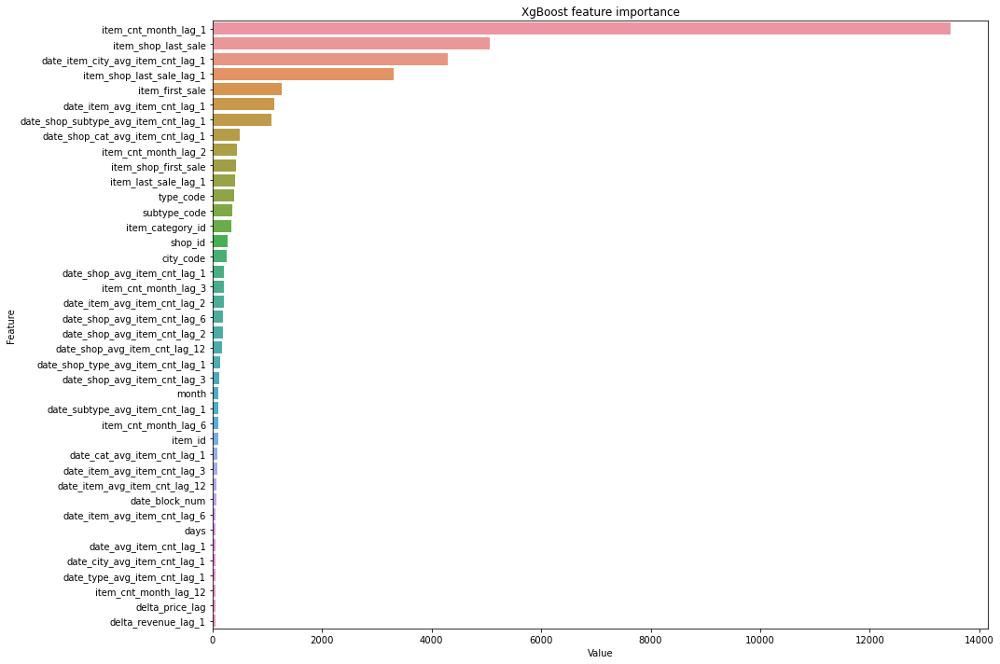

In [25]:
xgb_importance(best_xgb_model, 'gain', (15,10))

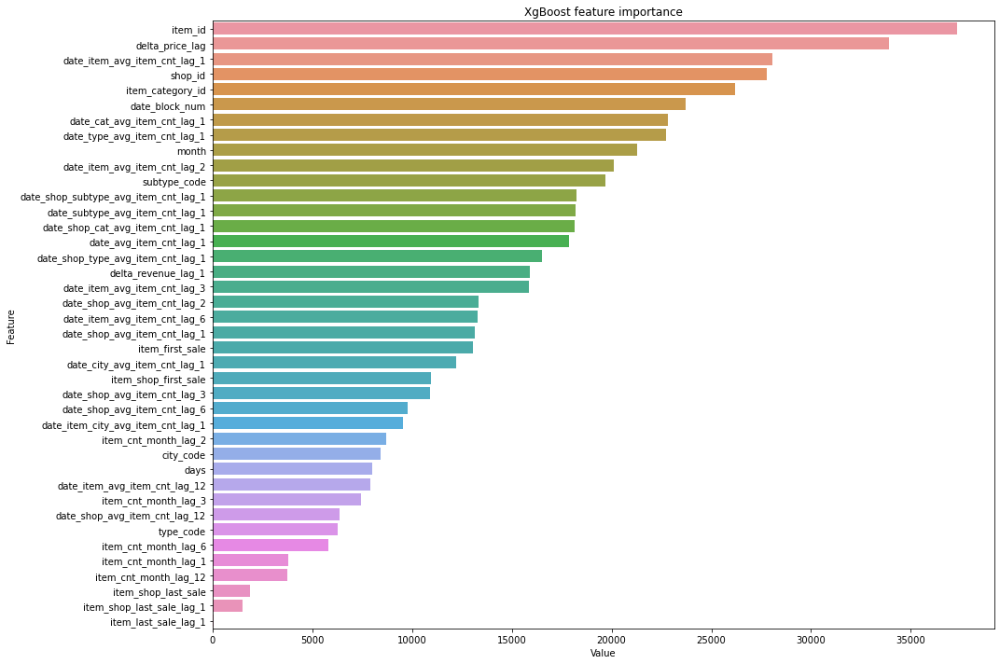

In [26]:
xgb_importance(best_xgb_model, 'weight', (15,10))

In [29]:
xgb_test_pred = best_xgb_model.predict(xgb.DMatrix(test_data)).clip(0,20)

submission = pd.DataFrame({
    'ID': list(range(test.shape[0])),
    'item_cnt_month': xgb_test_pred
})

submission.to_csv('output/xgb_gs_pred.csv', index = False)

In [32]:
#ensemble 
xgb_test_pred = pd.read_csv('output/xgb_gs_pred.csv')
lgb_test_pred = pd.read_csv('output/lgb_gs_pred.csv')

submission = pd.DataFrame({
    'ID': list(range(test.shape[0])),
    'item_cnt_month': (xgb_test_pred['item_cnt_month'] + lgb_test_pred['item_cnt_month'])/2
})

submission.to_csv('output/lgb_xgb_gs_pred.csv', index = False)

### Catboost

In [27]:
#prepare datasets
train_data = train.drop('item_cnt_month', axis = 1)
train_labels = train['item_cnt_month']
train_set = Pool(train_data, label = train_labels)


val_data = validation.drop('item_cnt_month', axis = 1)
val_labels = validation['item_cnt_month']
valid_set = Pool(val_data, label = val_labels)

test_data = test.drop('item_cnt_month', axis = 1)

In [9]:
train_data.head()

,date_block_num,shop_id,item_id,city_code,item_category_id,type_code,subtype_code,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,date_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_1,date_item_avg_item_cnt_lag_2,date_item_avg_item_cnt_lag_3,date_item_avg_item_cnt_lag_6,date_item_avg_item_cnt_lag_12,date_shop_avg_item_cnt_lag_1,date_shop_avg_item_cnt_lag_2,date_shop_avg_item_cnt_lag_3,date_shop_avg_item_cnt_lag_6,date_shop_avg_item_cnt_lag_12,date_cat_avg_item_cnt_lag_1,date_shop_cat_avg_item_cnt_lag_1,date_shop_type_avg_item_cnt_lag_1,date_shop_subtype_avg_item_cnt_lag_1,date_city_avg_item_cnt_lag_1,date_item_city_avg_item_cnt_lag_1,date_type_avg_item_cnt_lag_1,date_subtype_avg_item_cnt_lag_1,delta_price_lag,delta_revenue_lag_1,item_shop_last_sale,item_shop_last_sale_lag_1,item_last_sale_lag_1,month,days,item_shop_first_sale,item_first_sale
0,12,2,27,0,19,5,10,0.0,0.0,0.0,0.0,1.0,0.411377,0.086975,0.044434,0.130493,0.065247,0.155518,0.148071,0.100647,0.08905,0.096008,0.141235,1.082031,0.955566,0.808594,0.935059,0.148071,0.0,1.03418,1.075195,-0.282715,1.211914,0,0.0,1.0,0,31,12,12
1,12,2,30,0,40,11,4,0.0,0.0,0.0,0.0,0.0,0.411377,1.021484,1.022461,0.521973,0.891113,0.000000,0.148071,0.100647,0.08905,0.096008,0.000000,0.291504,0.046234,0.051727,0.046234,0.148071,0.0,0.27002,0.291504,-0.483398,1.211914,1,1.0,1.0,0,31,11,11
2,12,2,31,0,37,11,1,0.0,0.0,0.0,0.0,0.0,0.411377,0.543457,0.600098,0.543457,0.304443,0.000000,0.148071,0.100647,0.08905,0.096008,0.000000,0.232788,0.059448,0.051727,0.064697,0.148071,0.0,0.27002,0.234009,-0.137451,1.211914,1,1.0,1.0,0,31,11,11
3,12,2,32,0,40,11,4,0.0,0.0,0.0,0.0,0.0,0.411377,1.934570,1.799805,1.260742,1.891602,5.378906,0.148071,0.100647,0.08905,0.096008,0.141235,0.291504,0.046234,0.051727,0.046234,0.148071,0.0,0.27002,0.291504,-0.407227,1.211914,0,0.0,1.0,0,31,12,12
4,12,2,33,0,37,11,1,1.0,2.0,0.0,0.0,1.0,0.411377,0.913086,0.333252,0.717285,1.000000,1.355469,0.148071,0.100647,0.08905,0.096008,0.141235,0.232788,0.059448,0.051727,0.064697,0.148071,1.0,0.27002,0.234009,-0.225464,1.211914,1,1.0,1.0,0,31,12,12


In [48]:
cat_model = CatBoostRegressor(task_type = "GPU", devices = "0:1",
                             random_seed = 42,
                             thread_count = 10)
ts = time.time()
cat_model.fit(X = train_data, y = train_labels,
             eval_set = (val_data, val_labels),
             early_stopping_rounds = 50)

print(f'Time to train catboost is {time.time()-ts}')

Learning rate set to 0.11042
0:	learn: 1.1422801	test: 1.1045311	best: 1.1045311 (0)	total: 36.2ms	remaining: 36.2s
1:	learn: 1.1040196	test: 1.0789207	best: 1.0789207 (1)	total: 70.7ms	remaining: 35.3s
2:	learn: 1.0713387	test: 1.0568612	best: 1.0568612 (2)	total: 108ms	remaining: 35.8s
3:	learn: 1.0446200	test: 1.0395772	best: 1.0395772 (3)	total: 144ms	remaining: 35.8s
4:	learn: 1.0220257	test: 1.0254692	best: 1.0254692 (4)	total: 174ms	remaining: 34.7s
5:	learn: 1.0033389	test: 1.0136598	best: 1.0136598 (5)	total: 203ms	remaining: 33.7s
6:	learn: 0.9870241	test: 1.0020898	best: 1.0020898 (6)	total: 234ms	remaining: 33.1s
7:	learn: 0.9724162	test: 0.9918579	best: 0.9918579 (7)	total: 262ms	remaining: 32.5s
8:	learn: 0.9606542	test: 0.9836917	best: 0.9836917 (8)	total: 292ms	remaining: 32.1s
9:	learn: 0.9510839	test: 0.9782112	best: 0.9782112 (9)	total: 321ms	remaining: 31.7s
10:	learn: 0.9427785	test: 0.9730217	best: 0.9730217 (10)	total: 351ms	remaining: 31.6s
11:	learn: 0.9355371	

96:	learn: 0.8612182	test: 0.9225161	best: 0.9225161 (96)	total: 3.12s	remaining: 29s
97:	learn: 0.8611090	test: 0.9225357	best: 0.9225161 (96)	total: 3.15s	remaining: 29s
98:	learn: 0.8609622	test: 0.9224415	best: 0.9224415 (98)	total: 3.18s	remaining: 28.9s
99:	learn: 0.8607329	test: 0.9222896	best: 0.9222896 (99)	total: 3.21s	remaining: 28.9s
100:	learn: 0.8605183	test: 0.9221852	best: 0.9221852 (100)	total: 3.25s	remaining: 28.9s
101:	learn: 0.8601551	test: 0.9219223	best: 0.9219223 (101)	total: 3.28s	remaining: 28.9s
102:	learn: 0.8601023	test: 0.9220152	best: 0.9219223 (101)	total: 3.31s	remaining: 28.8s
103:	learn: 0.8597825	test: 0.9217987	best: 0.9217987 (103)	total: 3.34s	remaining: 28.8s
104:	learn: 0.8596392	test: 0.9216565	best: 0.9216565 (104)	total: 3.37s	remaining: 28.7s
105:	learn: 0.8595245	test: 0.9216794	best: 0.9216565 (104)	total: 3.4s	remaining: 28.7s
106:	learn: 0.8594353	test: 0.9216629	best: 0.9216565 (104)	total: 3.44s	remaining: 28.7s
107:	learn: 0.8592666	t

193:	learn: 0.8519845	test: 0.9186857	best: 0.9185667 (165)	total: 6.17s	remaining: 25.6s
194:	learn: 0.8519092	test: 0.9187119	best: 0.9185667 (165)	total: 6.21s	remaining: 25.6s
195:	learn: 0.8518910	test: 0.9186983	best: 0.9185667 (165)	total: 6.24s	remaining: 25.6s
196:	learn: 0.8518730	test: 0.9187087	best: 0.9185667 (165)	total: 6.26s	remaining: 25.5s
197:	learn: 0.8518138	test: 0.9187352	best: 0.9185667 (165)	total: 6.3s	remaining: 25.5s
198:	learn: 0.8517997	test: 0.9187444	best: 0.9185667 (165)	total: 6.33s	remaining: 25.5s
199:	learn: 0.8517530	test: 0.9187705	best: 0.9185667 (165)	total: 6.36s	remaining: 25.4s
200:	learn: 0.8517035	test: 0.9187523	best: 0.9185667 (165)	total: 6.39s	remaining: 25.4s
201:	learn: 0.8515355	test: 0.9184874	best: 0.9184874 (201)	total: 6.42s	remaining: 25.4s
202:	learn: 0.8515243	test: 0.9184959	best: 0.9184874 (201)	total: 6.45s	remaining: 25.3s
203:	learn: 0.8514267	test: 0.9185046	best: 0.9184874 (201)	total: 6.48s	remaining: 25.3s
204:	learn:

In [49]:
#save the model
pickle.dump(cat_model, open(f'output/models/cat_model.pickle', 'wb'))

In [50]:
cat_test_pred = cat_model.predict(test_data).clip(0,20)

submission = pd.DataFrame({
    'ID': list(range(test.shape[0])),
    'item_cnt_month': cat_test_pred
})

submission.to_csv('output/cat_pred.csv', index = False)

### Simple stacking

#### lightgbm

In [44]:
#prepare datasets for lgb 
train_data = train.drop('item_cnt_month', axis = 1)
train_labels = train['item_cnt_month']
train_set = lgb.Dataset(train_data, train_labels)

val_data = validation.drop('item_cnt_month', axis = 1)
val_labels = validation['item_cnt_month']
val_set = lgb.Dataset(val_data, val_labels)

test_data = test.drop('item_cnt_month', axis = 1)

[1]	training's rmse: 1.18256	valid_1's rmse: 1.13154
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.17721	valid_1's rmse: 1.12707
[3]	training's rmse: 1.17201	valid_1's rmse: 1.12259
[4]	training's rmse: 1.16686	valid_1's rmse: 1.11833
[5]	training's rmse: 1.16169	valid_1's rmse: 1.1141
[6]	training's rmse: 1.15685	valid_1's rmse: 1.11019
[7]	training's rmse: 1.15193	valid_1's rmse: 1.10623
[8]	training's rmse: 1.14685	valid_1's rmse: 1.10222
[9]	training's rmse: 1.14168	valid_1's rmse: 1.09814
[10]	training's rmse: 1.1369	valid_1's rmse: 1.09467
[11]	training's rmse: 1.13176	valid_1's rmse: 1.09084
[12]	training's rmse: 1.12646	valid_1's rmse: 1.08693
[13]	training's rmse: 1.12109	valid_1's rmse: 1.0828
[14]	training's rmse: 1.11553	valid_1's rmse: 1.07875
[15]	training's rmse: 1.1101	valid_1's rmse: 1.07492
[16]	training's rmse: 1.1045	valid_1's rmse: 1.07082
[17]	training's rmse: 1.09862	valid_1's rmse: 1.0664
[18]	training's rmse: 1.09258	valid_

[148]	training's rmse: 0.805034	valid_1's rmse: 0.90053
[149]	training's rmse: 0.804568	valid_1's rmse: 0.899727
[150]	training's rmse: 0.804225	valid_1's rmse: 0.899715
[151]	training's rmse: 0.804023	valid_1's rmse: 0.89963
[152]	training's rmse: 0.803454	valid_1's rmse: 0.899568
[153]	training's rmse: 0.803103	valid_1's rmse: 0.899547
[154]	training's rmse: 0.802773	valid_1's rmse: 0.89955
[155]	training's rmse: 0.802316	valid_1's rmse: 0.899617
[156]	training's rmse: 0.801996	valid_1's rmse: 0.899994
[157]	training's rmse: 0.801667	valid_1's rmse: 0.899986
[158]	training's rmse: 0.801319	valid_1's rmse: 0.89991
[159]	training's rmse: 0.800556	valid_1's rmse: 0.901464
[160]	training's rmse: 0.799979	valid_1's rmse: 0.901838
[161]	training's rmse: 0.799896	valid_1's rmse: 0.901739
[162]	training's rmse: 0.799759	valid_1's rmse: 0.901656
[163]	training's rmse: 0.799552	valid_1's rmse: 0.901607
[164]	training's rmse: 0.799247	valid_1's rmse: 0.90153
[165]	training's rmse: 0.799066	vali

Text(0.5, 1.0, 'obs vs fitted for lightgbm_0')

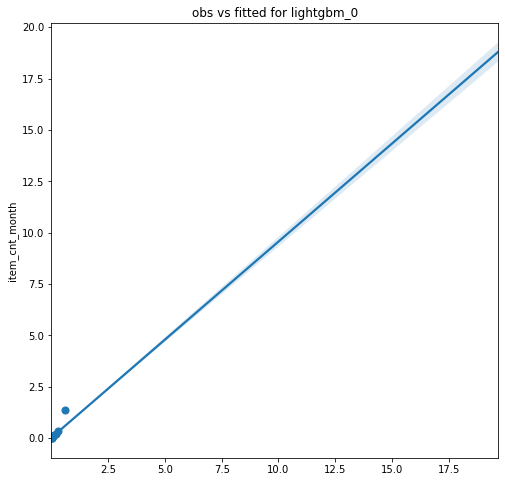

In [45]:
#evaluate best result
lgb_gs = pd.read_csv('output/lgb_trials.csv')
lgb_gs.sort_values('loss', inplace = True)
lgb_gs.reset_index(inplace = True, drop = True)

best_bayes_estimators = lgb_gs.loc[0, 'n_estimators']
best_bayes_params = eval(lgb_gs.loc[0,'params'])

ts = time.time()
#fit the best model
best_lgb_model = lgb.train(params = best_bayes_params, train_set=train_set, valid_sets = [train_set, val_set])
print(f'Training time takes {time.time()-ts}')

#save the model 
pickle.dump(best_lgb_model, open(f'output/models/lgb_model_0.pickle', 'wb'))

#evaluate val 
lgb_0_train_stack_preds = best_lgb_model.predict(train_data).clip(0,20)
lgb_0_val_stack_preds = best_lgb_model.predict(val_data).clip(0,20)
lgb_0_test_stack_preds = best_lgb_model.predict(test_data).clip(0,20)

#output metric
print(f'Validation rmse is {sqrt(mean_squared_error(val_labels, lgb_0_val_stack_preds))}')

#plot obs vs fitted
plt.figure(figsize = (8,8))
sns.regplot(x = lgb_0_val_stack_preds, y = val_labels)
plt.title('obs vs fitted for lightgbm_0')

[1]	training's rmse: 1.18196	valid_1's rmse: 1.13095
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.17588	valid_1's rmse: 1.12576
[3]	training's rmse: 1.17011	valid_1's rmse: 1.12091
[4]	training's rmse: 1.16444	valid_1's rmse: 1.11617
[5]	training's rmse: 1.15878	valid_1's rmse: 1.11165
[6]	training's rmse: 1.15322	valid_1's rmse: 1.10732
[7]	training's rmse: 1.14777	valid_1's rmse: 1.10307
[8]	training's rmse: 1.14218	valid_1's rmse: 1.0987
[9]	training's rmse: 1.13645	valid_1's rmse: 1.09421
[10]	training's rmse: 1.1307	valid_1's rmse: 1.08966
[11]	training's rmse: 1.12478	valid_1's rmse: 1.08526
[12]	training's rmse: 1.11879	valid_1's rmse: 1.08074
[13]	training's rmse: 1.11261	valid_1's rmse: 1.07609
[14]	training's rmse: 1.10629	valid_1's rmse: 1.07143
[15]	training's rmse: 1.09997	valid_1's rmse: 1.06683
[16]	training's rmse: 1.09333	valid_1's rmse: 1.06201
[17]	training's rmse: 1.08655	valid_1's rmse: 1.05707
[18]	training's rmse: 1.07964	va

[147]	training's rmse: 0.787317	valid_1's rmse: 0.899099
[148]	training's rmse: 0.787125	valid_1's rmse: 0.899015
[149]	training's rmse: 0.786485	valid_1's rmse: 0.898653
[150]	training's rmse: 0.786414	valid_1's rmse: 0.898642
[151]	training's rmse: 0.785805	valid_1's rmse: 0.899659
[152]	training's rmse: 0.785371	valid_1's rmse: 0.899568
[153]	training's rmse: 0.784953	valid_1's rmse: 0.89959
[154]	training's rmse: 0.784809	valid_1's rmse: 0.899587
[155]	training's rmse: 0.784515	valid_1's rmse: 0.899861
[156]	training's rmse: 0.784254	valid_1's rmse: 0.899729
[157]	training's rmse: 0.784048	valid_1's rmse: 0.899692
[158]	training's rmse: 0.783816	valid_1's rmse: 0.8996
[159]	training's rmse: 0.783585	valid_1's rmse: 0.899534
[160]	training's rmse: 0.783141	valid_1's rmse: 0.899506
[161]	training's rmse: 0.782963	valid_1's rmse: 0.899454
[162]	training's rmse: 0.782876	valid_1's rmse: 0.899427
[163]	training's rmse: 0.782714	valid_1's rmse: 0.899194
[164]	training's rmse: 0.782513	va

Text(0.5, 1.0, 'obs vs fitted for lightgbm_0')

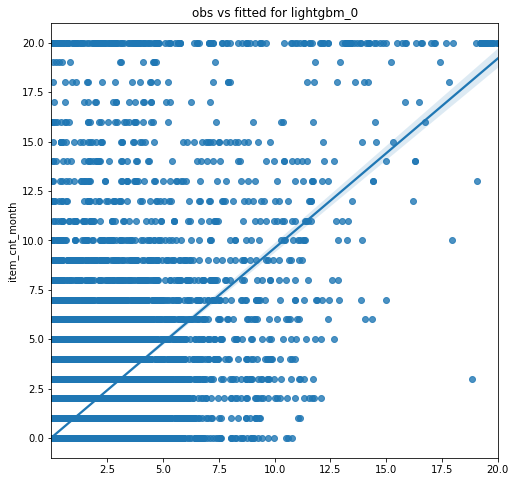

In [46]:
#evaluate second best result
lgb_gs = pd.read_csv('output/lgb_trials.csv')
lgb_gs.sort_values('loss', inplace = True)
lgb_gs.reset_index(inplace = True, drop = True)

second_best_bayes_estimators = lgb_gs.loc[1, 'n_estimators']
second_best_bayes_params = eval(lgb_gs.loc[1,'params'])

ts = time.time()
#fit the best model
second_best_lgb_model = lgb.train(params = second_best_bayes_params, train_set=train_set, valid_sets = [train_set, val_set])
print(f'Training time takes {time.time()-ts}')

#save the model 
pickle.dump(second_best_lgb_model, open(f'output/models/lgb_model_1.pickle', 'wb'))

#evaluate val 
lgb_1_train_stack_preds = second_best_lgb_model.predict(train_data).clip(0,20)
lgb_1_val_stack_preds = second_best_lgb_model.predict(val_data).clip(0,20)
lgb_1_test_stack_preds = second_best_lgb_model.predict(test_data).clip(0,20)

#output metric
print(f'Validation rmse is {sqrt(mean_squared_error(val_labels, lgb_1_val_stack_preds))}')

#plot obs vs fitted
plt.figure(figsize = (8,8))
sns.regplot(x = lgb_1_val_stack_preds, y = val_labels)
plt.title('obs vs fitted for lightgbm_0')

#### xgboost model

In [47]:
#prepare datasets for xgb 
train_data = train.drop('item_cnt_month', axis = 1)
train_labels = train['item_cnt_month']
train_set = xgb.DMatrix(train_data, train_labels)

val_data = validation.drop('item_cnt_month', axis = 1)
val_labels = validation['item_cnt_month']
val_set = xgb.DMatrix(val_data, val_labels)

test_data = test.drop('item_cnt_month', axis = 1)

[10:40:00] WARNING: /workspace/src/learner.cc:480: 
Parameters: { early_stopping_rounds, verbose_eval } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-rmse:1.20148	validation-rmse:1.15649
Multiple eval metrics have been passed: 'validation-rmse' will be used for early stopping.

Will train until validation-rmse hasn't improved in 50 rounds.
[1]	train-rmse:1.19632	validation-rmse:1.15166
[2]	train-rmse:1.19142	validation-rmse:1.14715
[3]	train-rmse:1.18663	validation-rmse:1.14268
[4]	train-rmse:1.18200	validation-rmse:1.13845
[5]	train-rmse:1.17766	validation-rmse:1.13437
[6]	train-rmse:1.17344	validation-rmse:1.13055
[7]	train-rmse:1.16935	validation-rmse:1.12686
[8]	train-rmse:1.16528	validation-rmse:1.12309
[9]	train-rmse:1.16141	validation-rmse:1.11964
[10]	train-r

[159]	train-rmse:0.79445	validation-rmse:0.90595
[160]	train-rmse:0.79320	validation-rmse:0.90548
[161]	train-rmse:0.79211	validation-rmse:0.90517
[162]	train-rmse:0.79101	validation-rmse:0.90476
[163]	train-rmse:0.78976	validation-rmse:0.90433
[164]	train-rmse:0.78852	validation-rmse:0.90385
[165]	train-rmse:0.78733	validation-rmse:0.90347
[166]	train-rmse:0.78617	validation-rmse:0.90304
[167]	train-rmse:0.78505	validation-rmse:0.90271
[168]	train-rmse:0.78395	validation-rmse:0.90265
[169]	train-rmse:0.78285	validation-rmse:0.90226
[170]	train-rmse:0.78172	validation-rmse:0.90206
[171]	train-rmse:0.78049	validation-rmse:0.90175
[172]	train-rmse:0.77952	validation-rmse:0.90136
[173]	train-rmse:0.77860	validation-rmse:0.90105
[174]	train-rmse:0.77766	validation-rmse:0.90076
[175]	train-rmse:0.77660	validation-rmse:0.90029
[176]	train-rmse:0.77551	validation-rmse:0.89999
[177]	train-rmse:0.77459	validation-rmse:0.89972
[178]	train-rmse:0.77352	validation-rmse:0.89952
[179]	train-rmse:0.7

[327]	train-rmse:0.70730	validation-rmse:0.89406
[328]	train-rmse:0.70712	validation-rmse:0.89406
[329]	train-rmse:0.70693	validation-rmse:0.89398
[330]	train-rmse:0.70666	validation-rmse:0.89410
[331]	train-rmse:0.70642	validation-rmse:0.89412
[332]	train-rmse:0.70627	validation-rmse:0.89411
[333]	train-rmse:0.70590	validation-rmse:0.89426
[334]	train-rmse:0.70571	validation-rmse:0.89430
[335]	train-rmse:0.70552	validation-rmse:0.89429
[336]	train-rmse:0.70540	validation-rmse:0.89430
[337]	train-rmse:0.70519	validation-rmse:0.89437
[338]	train-rmse:0.70507	validation-rmse:0.89433
[339]	train-rmse:0.70485	validation-rmse:0.89433
[340]	train-rmse:0.70467	validation-rmse:0.89430
[341]	train-rmse:0.70455	validation-rmse:0.89431
[342]	train-rmse:0.70442	validation-rmse:0.89431
[343]	train-rmse:0.70435	validation-rmse:0.89431
[344]	train-rmse:0.70422	validation-rmse:0.89423
[345]	train-rmse:0.70404	validation-rmse:0.89422
[346]	train-rmse:0.70387	validation-rmse:0.89423
Stopping. Best itera

Text(0.5, 1.0, 'obs vs fitted for xgb_0')

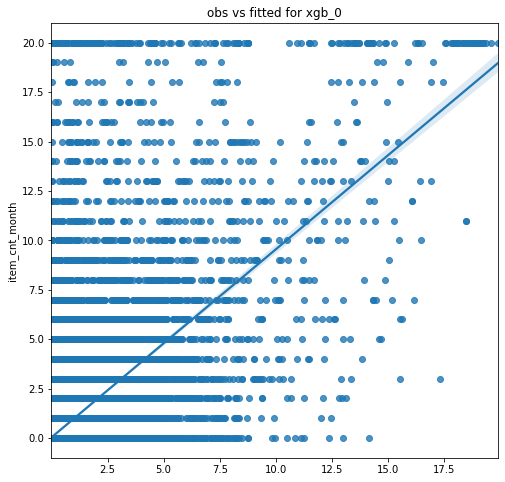

In [48]:
#evaluate best result
xgb_gs = pd.read_csv('output/xgb_trials.csv')
xgb_gs.sort_values('loss', inplace = True)
xgb_gs.reset_index(inplace = True, drop = True)

best_bayes_estimators = xgb_gs.loc[0, 'n_estimators']
best_bayes_params = eval(xgb_gs.loc[0,'params'])

#fit the best model
ts = time.time()
best_xgb_model = xgb.train(best_bayes_params, train_set, num_boost_round = 1000, evals = [(train_set,'train'), (val_set, 'validation')], early_stopping_rounds = 50)
print(f'Time to train the model is {time.time()-ts}')

#save the model 
pickle.dump(best_xgb_model, open(f'output/models/xgb_model_0.pickle', 'wb'))

#evaluate val 
xgb_0_train_stack_preds = best_xgb_model.predict(xgb.DMatrix(train_data)).clip(0,20)
xgb_0_val_stack_preds = best_xgb_model.predict(xgb.DMatrix(val_data)).clip(0,20)
xgb_0_test_stack_preds = best_xgb_model.predict(xgb.DMatrix(test_data)).clip(0,20)

#output metric
print(f'Validation rmse is {sqrt(mean_squared_error(val_labels, xgb_0_val_stack_preds))}')

#plot obs vs fitted
plt.figure(figsize = (8,8))
sns.regplot(x = xgb_0_val_stack_preds, y = val_labels)
plt.title('obs vs fitted for xgb_0')


#### Catboost model

Learning rate set to 0.11042
0:	learn: 1.1422801	test: 1.1045311	best: 1.1045311 (0)	total: 36.3ms	remaining: 36.2s
1:	learn: 1.1040196	test: 1.0789207	best: 1.0789207 (1)	total: 71ms	remaining: 35.4s
2:	learn: 1.0713387	test: 1.0568612	best: 1.0568612 (2)	total: 108ms	remaining: 35.8s
3:	learn: 1.0446200	test: 1.0395772	best: 1.0395772 (3)	total: 139ms	remaining: 34.6s
4:	learn: 1.0220257	test: 1.0254692	best: 1.0254692 (4)	total: 167ms	remaining: 33.3s
5:	learn: 1.0033389	test: 1.0136598	best: 1.0136598 (5)	total: 196ms	remaining: 32.4s
6:	learn: 0.9870241	test: 1.0020898	best: 1.0020898 (6)	total: 226ms	remaining: 32.1s
7:	learn: 0.9724162	test: 0.9918579	best: 0.9918579 (7)	total: 255ms	remaining: 31.6s
8:	learn: 0.9606542	test: 0.9836917	best: 0.9836917 (8)	total: 285ms	remaining: 31.3s
9:	learn: 0.9510839	test: 0.9782112	best: 0.9782112 (9)	total: 314ms	remaining: 31.1s
10:	learn: 0.9427785	test: 0.9730217	best: 0.9730217 (10)	total: 344ms	remaining: 31s
11:	learn: 0.9355371	test

96:	learn: 0.8609541	test: 0.9226794	best: 0.9226794 (96)	total: 3.12s	remaining: 29.1s
97:	learn: 0.8609161	test: 0.9227318	best: 0.9226794 (96)	total: 3.15s	remaining: 29s
98:	learn: 0.8607939	test: 0.9227387	best: 0.9226794 (96)	total: 3.18s	remaining: 28.9s
99:	learn: 0.8607524	test: 0.9228176	best: 0.9226794 (96)	total: 3.21s	remaining: 28.9s
100:	learn: 0.8606354	test: 0.9226636	best: 0.9226636 (100)	total: 3.24s	remaining: 28.8s
101:	learn: 0.8603623	test: 0.9226571	best: 0.9226571 (101)	total: 3.27s	remaining: 28.8s
102:	learn: 0.8603098	test: 0.9225093	best: 0.9225093 (102)	total: 3.3s	remaining: 28.8s
103:	learn: 0.8602885	test: 0.9225413	best: 0.9225093 (102)	total: 3.33s	remaining: 28.7s
104:	learn: 0.8602225	test: 0.9225047	best: 0.9225047 (104)	total: 3.37s	remaining: 28.7s
105:	learn: 0.8599453	test: 0.9223706	best: 0.9223706 (105)	total: 3.4s	remaining: 28.7s
106:	learn: 0.8599005	test: 0.9224045	best: 0.9223706 (105)	total: 3.43s	remaining: 28.6s
107:	learn: 0.8598649	

194:	learn: 0.8539189	test: 0.9222585	best: 0.9220041 (154)	total: 6.13s	remaining: 25.3s
195:	learn: 0.8538855	test: 0.9222284	best: 0.9220041 (154)	total: 6.16s	remaining: 25.3s
196:	learn: 0.8538451	test: 0.9222083	best: 0.9220041 (154)	total: 6.19s	remaining: 25.2s
197:	learn: 0.8538237	test: 0.9221928	best: 0.9220041 (154)	total: 6.22s	remaining: 25.2s
198:	learn: 0.8537950	test: 0.9221713	best: 0.9220041 (154)	total: 6.25s	remaining: 25.2s
199:	learn: 0.8537674	test: 0.9222110	best: 0.9220041 (154)	total: 6.29s	remaining: 25.1s
200:	learn: 0.8537579	test: 0.9222298	best: 0.9220041 (154)	total: 6.32s	remaining: 25.1s
201:	learn: 0.8537484	test: 0.9222492	best: 0.9220041 (154)	total: 6.34s	remaining: 25.1s
202:	learn: 0.8537396	test: 0.9222666	best: 0.9220041 (154)	total: 6.38s	remaining: 25s
203:	learn: 0.8537327	test: 0.9222826	best: 0.9220041 (154)	total: 6.41s	remaining: 25s
204:	learn: 0.8537265	test: 0.9222971	best: 0.9220041 (154)	total: 6.44s	remaining: 25s
bestTest = 0.922

Text(0.5, 1.0, 'obs vs fitted for xgb_0')

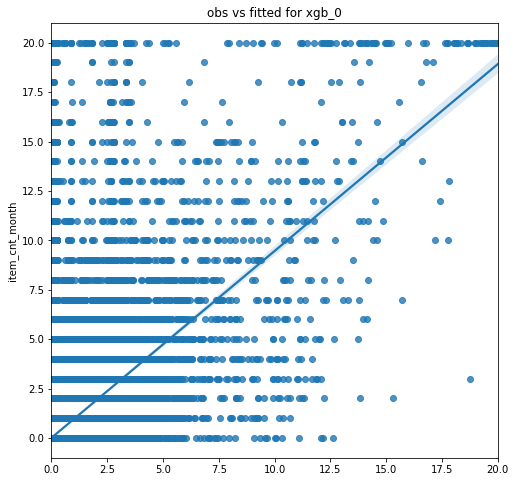

In [49]:
cat_model = CatBoostRegressor(task_type = "GPU", devices = "0:1",
                             random_seed = 42,
                             thread_count = 10)
ts = time.time()
cat_model.fit(X = train_data, y = train_labels,
             eval_set = (val_data, val_labels),
             early_stopping_rounds = 50)

print(f'Time to train catboost is {time.time()-ts}')

#save the model 
pickle.dump(cat_model, open(f'output/models/cat_model.pickle', 'wb'))

#evaluate val 
cat_train_stack_preds = cat_model.predict(train_data).clip(0,20)
cat_val_stack_preds = cat_model.predict(val_data).clip(0,20)
cat_test_stack_preds = cat_model.predict(test_data).clip(0,20)

#output metric
print(f'Validation rmse is {sqrt(mean_squared_error(val_labels, cat_val_stack_preds))}')

#plot obs vs fitted
plt.figure(figsize = (8,8))
sns.regplot(x = cat_val_stack_preds, y = val_labels)
plt.title('obs vs fitted for xgb_0')

#### Random forest

In [50]:
#to deal with random forest we need to impute null values
train_data = train.drop('item_cnt_month', axis = 1).fillna(0)
train_labels = train['item_cnt_month']

val_data = validation.drop('item_cnt_month', axis = 1).fillna(0)
val_labels = validation['item_cnt_month']

test_data = test.drop('item_cnt_month', axis = 1).fillna(0)

Time to train rf is 437.5045509338379
Validation rmse is 0.9406732214412902


Text(0.5, 1.0, 'obs vs fitted for xgb_0')

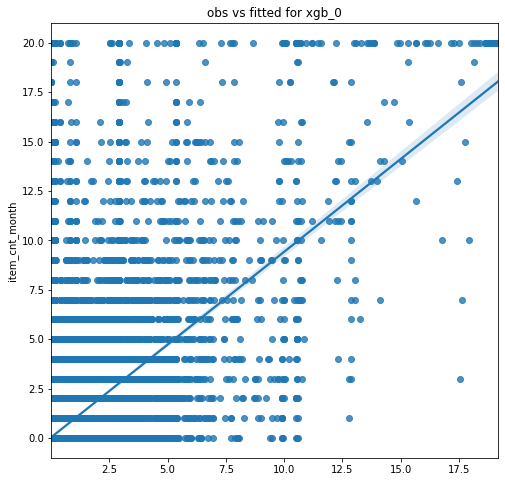

In [51]:
ts = time.time()
rf_model = RandomForestRegressor(n_estimators=50, max_depth=7, random_state=42, n_jobs=-1)
rf_model.fit(train_data, train_labels)
print(f'Time to train rf is {time.time()- ts}')

#save the model 
pickle.dump(rf_model, open(f'output/models/rf_model.pickle', 'wb'))

#evaluate val 
rf_train_stack_preds = rf_model.predict(train_data).clip(0,20)
rf_val_stack_preds = rf_model.predict(val_data).clip(0,20)
rf_test_stack_preds = rf_model.predict(test_data).clip(0,20)

#output metric
print(f'Validation rmse is {sqrt(mean_squared_error(val_labels, rf_val_stack_preds))}')

#plot obs vs fitted
plt.figure(figsize = (8,8))
sns.regplot(x = rf_val_stack_preds, y = val_labels)
plt.title('obs vs fitted for xgb_0')

#### Stacking

In [52]:
#create stack pred for train_set
stack_pred_train = pd.DataFrame({'lgb_0' : lgb_0_train_stack_preds})
stack_pred_train['lgb_1'] = lgb_1_train_stack_preds
stack_pred_train['xgb'] = xgb_0_train_stack_preds
stack_pred_train['cat'] = cat_train_stack_preds
stack_pred_train['rf'] = rf_train_stack_preds
stack_pred_train.to_csv('output/stack_pred_train_all.csv')
stack_pred_train.head()

,lgb_0,lgb_1,xgb,cat,rf
0,0.046690,0.048054,0.051609,0.050890,0.193639
1,0.183676,0.185971,0.211455,0.158835,0.296442
2,0.150104,0.147412,0.198051,0.123968,0.152699
3,0.144366,0.162676,0.200130,0.357085,0.461994
4,0.335238,0.351716,0.553418,0.428563,0.296442


In [53]:
#create stack pred for val_set
stack_pred_val = pd.DataFrame({'lgb_0' : lgb_0_val_stack_preds})
stack_pred_val['lgb_1'] = lgb_1_val_stack_preds
stack_pred_val['xgb'] = xgb_0_val_stack_preds
stack_pred_val['cat'] = cat_val_stack_preds
stack_pred_val['rf'] = rf_val_stack_preds
stack_pred_val.to_csv('output/stack_pred_val_all.csv')
stack_pred_val.head()

,lgb_0,lgb_1,xgb,cat,rf
0,0.017384,0.016790,0.013435,0.021693,0.076822
1,0.121300,0.124864,0.116195,0.061687,0.221261
2,0.169580,0.194142,0.236225,0.171380,0.070480
3,0.278136,0.292020,0.268579,0.276965,0.221261
4,0.002525,0.002517,0.001886,0.042188,0.023037


In [54]:
#create stack pred for test_set
stack_pred_test = pd.DataFrame({'lgb_0' : lgb_0_test_stack_preds})
stack_pred_test['lgb_1'] = lgb_1_test_stack_preds
stack_pred_test['xgb'] = xgb_0_test_stack_preds
stack_pred_test['cat'] = cat_test_stack_preds
stack_pred_test['rf'] = rf_test_stack_preds
stack_pred_test.to_csv('output/stack_pred_test_all.csv')
stack_pred_test.head()

,lgb_0,lgb_1,xgb,cat,rf
0,0.643256,0.560047,0.599327,0.599058,0.362848
1,0.488452,0.521924,0.434308,0.619145,0.611746
2,1.525948,1.376242,1.656749,0.878056,0.700495
3,0.712567,0.675174,0.892229,0.311271,0.464624
4,1.737870,2.200765,0.778692,2.874842,2.903941


[1]	training's rmse: 1.18125	valid_1's rmse: 1.13064
Training until validation scores don't improve for 50 rounds
[2]	training's rmse: 1.175	valid_1's rmse: 1.12517
[3]	training's rmse: 1.16867	valid_1's rmse: 1.11998
[4]	training's rmse: 1.1628	valid_1's rmse: 1.11508
[5]	training's rmse: 1.15701	valid_1's rmse: 1.11037
[6]	training's rmse: 1.15124	valid_1's rmse: 1.10577
[7]	training's rmse: 1.14545	valid_1's rmse: 1.10124
[8]	training's rmse: 1.13959	valid_1's rmse: 1.09676
[9]	training's rmse: 1.1331	valid_1's rmse: 1.09232
[10]	training's rmse: 1.127	valid_1's rmse: 1.0878
[11]	training's rmse: 1.12018	valid_1's rmse: 1.08331
[12]	training's rmse: 1.11315	valid_1's rmse: 1.07877
[13]	training's rmse: 1.1059	valid_1's rmse: 1.07417
[14]	training's rmse: 1.09904	valid_1's rmse: 1.06945
[15]	training's rmse: 1.092	valid_1's rmse: 1.06467
[16]	training's rmse: 1.08403	valid_1's rmse: 1.05987
[17]	training's rmse: 1.07656	valid_1's rmse: 1.05493
[18]	training's rmse: 1.0681	valid_1's r

Text(0.5, 1.0, 'obs vs fitted for stacked predictions')

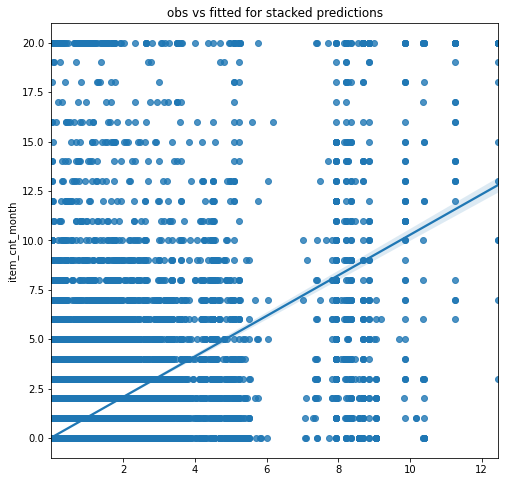

In [63]:
lgb_gs = pd.read_csv('output/lgb_trials.csv')
lgb_gs.sort_values('loss', inplace = True)
lgb_gs.reset_index(inplace = True, drop = True)

best_bayes_estimators = lgb_gs.loc[0, 'n_estimators']
best_bayes_params = eval(lgb_gs.loc[0,'params'])

train_set = lgb.Dataset(stack_pred_train, train_labels)
val_set = lgb.Dataset(stack_pred_val, val_labels)

#train meta model
ts = time.time()
meta_model = lgb.train(params = best_bayes_params, train_set=train_set, valid_sets = [train_set, val_set],
                      num_boost_round = 1000, early_stopping_rounds = 50)
print(f'Time to train meta_model is {time.time()-ts}')

level_2_pred_val = meta_model.predict(stack_pred_val).clip(0,20)
level_2_pred_test = meta_model.predict(stack_pred_test).clip(0,20)

#output metric
print(f'Validation rmse is {sqrt(mean_squared_error(val_labels, level_2_pred_val))}')

#plot obs vs fitted
plt.figure(figsize = (8,8))
sns.regplot(x = level_2_pred_val, y = val_labels)
plt.title('obs vs fitted for stacked predictions')

In [60]:
submission = pd.DataFrame({
    'ID': list(range(test.shape[0])),
    'item_cnt_month': level_2_pred_test
})

submission.to_csv('output/level_2_pred.csv', index = False)